# Experiments

In [1]:
# !pip2 install pypolyagamma

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import importlib
import os
import sys

from base.experiment import *
from logistic.env_logistic import *
from logistic.agent_logistic import *
from utils import *

import numpy as np
import numpy.linalg as npla
import scipy.linalg as spla
import pandas as pd
import plotnine as gg

#import importlib
#importlib.reload(logistic.agent_logistic)
#reload(sys.modules['logistic.agent_logistic'])

# Setup

Here $d=20$ and the number of arms is $A=10$. The number of timesteps is $T=1000$.

At the beginning $\theta\sim N(0,I_d)$ and $c\sim N(0,1)$ are generated. The reward given context $x\in \mathbb R^d$ is $\text{Bernoulli}(\sigma(\theta^\top x + c))$ where $\sigma(x) = \frac{e^x}{1+e^x}$. At each step $x_{t,1},\ldots, x_{t,A}\sim N(0,I_d/9)$ are randomly generated, and the algorithm picks one of the arms $1,\ldots, A$ and gets the corresponding stochastic reward.

If the algorithm chose actions $a_t$, regret is measured as $\max_{\{a_t^*\}} \sigma(\theta^\top x_{t,a_t^*}+c) - \sum_{t=1}^T  \sigma(\theta^\top x_{t,a_t}+c)$, i.e., expected reward  against the best choice of $a_t^*$'s if $\theta$ were known.


In [2]:
def simple_compare(agents, num_articles, dim, var, n_steps, seed=0, verbosity=0):
    env = LogisticBandit(num_articles, dim+1, NormalDist(0,1,dim=dim+1), DistributionWithConstant(NormalDist(0,var,dim=dim)), seed=seed)
    experiment = ExperimentCompare(agents, env, n_steps,
                   seed=seed, verbosity=verbosity)
    experiment.run_experiment()
    results = []
    results.append(experiment.results)
    df = pd.DataFrame(results[0])
    cum_regrets = experiment.cum_regret
    #https://stackoverflow.com/questions/39092067/pandas-dataframe-convert-column-type-to-string-or-categorical
    df['agent_id'] = df.agent_id.astype('category')
    print(gg.ggplot(df)
     + gg.aes('t', 'cum_regret', color='agent_id', group='agent_id')
     + gg.geom_point()
     + gg.geom_line())
    print(gg.ggplot(df)
     + gg.aes('t', 'time', color='agent_id', group='agent_id')
     + gg.geom_point()
     + gg.geom_line())
    return results, df, cum_regrets

def simple_compares(make_agents, num_articles, dim, var, n_steps, seeds, verbosity=0):
    results_list = []
    df_list = []
    cum_regrets_list = []
    avg_regrets = np.zeros(len(make_agents))
    for seed in seeds:
        agents = [make_agent() for make_agent in make_agents]
        results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
        results_list += [results]
        df_list += [df]
        cum_regrets_list += [cum_regrets]
        avg_regrets += cum_regrets
    avg_regrets = avg_regrets / len(seeds)
    return results_list, df_list, cum_regrets_list, avg_regrets    

def hyperparameter_sweep(make_agent_from_hyperparameters, hyperparam_list, dim, var, n_steps, seed=0, verbosity=0):
    agents = [make_agent_from_hyperparameters(hyperparam) for hyperparam in hyperparam_list]
    results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
    
def hyperparameter_sweeps(make_agent_from_hyperparameters, hyperparam_list, dim, var, n_steps, seeds, verbosity=0):
    results_list = []
    df_list = []
    cum_regrets_list = []
    avg_regrets = np.zeros(len(hyperparam_list))
    for seed in range(seeds):
        agents = [make_agent_from_hyperparameters(hyperparam) for hyperparam in hyperparam_list]
        results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
        results_list += [results]
        df_list += [df]
        cum_regrets_list += [cum_regrets]
        avg_regrets += cum_regrets
    avg_regrets = avg_regrets / seeds
    return results_list, df_list, cum_regrets_list, avg_regrets


In [3]:
num_articles = 10
dim = 20
var = 1.0/9
theta_mean = 0
theta_std = 1

time_limit= 0.1

verbosity=1

In [4]:
# We will tune the Langevin, SGLD, and SAGA-LD agents.

make_langevin_agent = lambda hypers: BasicLangevinTS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                              step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                              time = time_limit,
                                              init_pt=None, verbosity=verbosity)
make_mala_agent = lambda: MalaTS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                 step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                 time = time_limit,
                                     init_pt=None, verbosity=verbosity)
make_sgld_agent = lambda hypers: SGLDTS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                        step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim),
                                        batch_size = hypers[1],
                                        time=time_limit,
                                        n_steps=9999,
                                        init_pt=None, verbosity=verbosity)
make_sagald_agent = lambda hypers: SAGATS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                          step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim),
                                          batch_size = hypers[1],
                                          time=time_limit,
                                          n_steps=9999,
                                          init_pt=None, verbosity=verbosity)

# Untimed MALA agent is used as baseline.

make_mala_agent_untimed = lambda: MalaTS(num_articles, dim, [0]*dim, cov=None, 
                                         step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=500,
                                         init_pt=None, verbosity=verbosity)

# Use default settings for Laplace agent for now (would be nice to tune this too). Not time-restricted.
theta_mean = 0
theta_std = 1
epsilon1 = 0.01
epsilon2 = 0.05
alpha=0.2
beta=0.5
tol=0.0001
make_laplace_agent = lambda: LaplaceTSLogisticBandit(num_articles, dim+1, theta_mean, theta_std, epsilon1,
                                                      alpha,beta,tol, verbosity=verbosity)

# PG-TS has no parameters to tune

make_pgts_agent = lambda: PGTS_Stream(num_articles, dim, intercept=True, context_has_constant=True, 
                                      n_steps=9999, time = time_limit, verbosity=verbosity)

In [5]:
make_best_sgld_agent = lambda: SGLDTS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                        step_size=lambda t: 0.01/(1 + t * np.sqrt(dim*var)/dim),
                                        batch_size = 32,
                                        time=time_limit,
                                        n_steps=9999,
                                        init_pt=None, verbosity=verbosity)
make_best_sagald_agent = lambda: SAGATS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                          step_size=lambda t: 0.05/(1 + t * np.sqrt(dim*var)/dim),
                                          batch_size = 32,
                                          time=time_limit,
                                          n_steps=9999,
                                          init_pt=None, verbosity=verbosity)

make_best_langevin_agent = lambda: BasicLangevinTS(num_articles, dim+1, [0]*(dim+1), cov=None, 
                                              step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                              time = time_limit,
                                              init_pt=None, verbosity=verbosity)

In [6]:
import warnings
warnings.filterwarnings('ignore')

theta [-1.74976547  0.3426804   1.1530358  -0.25243604  0.98132079  0.51421884
  0.22117967 -1.07004333 -0.18949583  0.25500144 -0.45802699  0.43516349
 -0.58359505  0.81684707  0.67272081 -0.10441114 -0.53128038  1.02973269
 -0.43813562 -1.11831825  1.61898166]
Experiment: Step 0
 Laplace sample: array([ 0.28837742, -0.33908543,  0.52736913, -0.37430288,  0.4770923 ,
       -1.42976266,  0.40770652, -0.82828039,  0.42345728, -0.15951737,
        1.24108209,  1.66353631, -0.66193771,  3.46522715,  0.39143862,
        0.32724535, -0.31134706, -1.42465559, -0.62487219, -0.1099954 ,
        0.95295943])
 Sample: array([-0.17996332, -0.98336264, -1.09455719, -0.24134875, -0.59511384,
       -0.98281189,  0.08822993, -0.60275937,  1.12555545,  0.9270533 ,
       -2.26915699, -0.34817064, -0.1640254 ,  1.21658059, -0.6268539 ,
       -0.27493981,  1.14745744,  1.15996897,  0.70218451, -1.28390481,
        1.52230777])
 Sample: array([-1.39804726,  0.24337045,  1.56309335,  0.3892489 , -0.145

 Steps taken: 291
 Sample: array([-0.24050304, -1.89593523,  0.51344381,  0.53061053, -1.22531016,
        0.9134577 ,  0.08397093, -0.20645547, -0.58854314, -0.32491991,
       -1.5437723 , -0.18374074, -0.92701834,  0.00899441,  0.49847533,
        1.38624946, -1.54692112, -0.34297261,  1.74259246,  0.05619424,
       -0.43885923])
 Sample: array([-1.49710437, -1.32878034,  0.50792133, -1.04478271, -0.07400559,
       -0.09459458, -0.95198072,  1.76266805, -1.0238884 , -0.08425948,
       -1.14426694,  0.24263597,  1.05955282, -1.26820015,  0.6313915 ,
       -0.87632528, -0.29320947,  0.76285405, -0.42161514,  1.58861188,
        0.57219793])
 Steps taken: 1194
 Sample: array([-0.24013236, -0.5173995 , -0.15398522,  1.30643027,  0.83839152,
        1.0305216 , -0.26237206,  0.79975082,  0.41875783, -0.96462962,
       -0.28320869, -0.41677642,  0.39147197, -0.22081664, -0.0976759 ,
        1.15035887, -0.22702279,  1.74739708, -0.02453659, -1.01700459,
        0.49594014])
 Accept p

 Steps taken: 339
 Sample: array([-0.89194585,  0.18565371, -0.36920153,  0.01439063,  0.55881905,
        0.1793136 ,  0.33002697, -0.51626358, -0.67412658, -0.35893364,
        0.76239411,  1.02552858, -0.93074544, -0.58151137,  0.86778985,
        0.40014239,  0.08329059, -1.36232732,  0.48361036,  0.50150986,
       -0.02794415])
 Sample: array([-1.94000342,  0.09628776, -1.70886319,  0.47499527,  0.10706785,
       -0.51009183,  2.32210525,  0.77725939, -0.27727796,  0.64817669,
        0.86925968,  0.03737772,  0.03364598,  2.53658932, -0.98359473,
       -1.20484655,  0.89616776, -0.92184958, -2.01311766,  0.44721143,
       -0.73168862])
 Steps taken: 1249
 Sample: array([-0.89332736, -0.55740694,  0.4496247 , -0.37492014,  0.1246361 ,
       -0.19335806, -0.17358832, -0.04442854, -0.45175382, -0.51923151,
       -1.86289547,  0.20581106, -0.42750649, -0.75398957, -0.1947618 ,
       -0.24429338, -0.21119763,  1.92030644,  0.76905253, -1.21501048,
        0.74814947])
 Accept p

 Steps taken: 361
 Sample: array([-0.08692823,  0.29410863, -0.43326677, -1.67783277,  0.11035722,
       -0.69631587,  0.45006758,  0.24133148, -1.50982622,  0.24721273,
       -1.19854575, -0.20000274,  1.15164347,  0.87517375,  0.52535558,
        1.23126245,  0.72350325,  1.34981495, -0.13768283, -0.47984098,
        0.44076067])
 Sample: array([-0.28485711, -0.87966033,  0.22128963, -0.02125099,  0.006489  ,
       -1.21855567,  1.03268265,  1.16605847,  0.29842729,  0.49984381,
       -1.33037203,  0.95086234, -0.31265413,  1.50364725, -0.4317858 ,
       -0.66287834,  1.16197623, -0.5204177 , -1.72513837, -1.75973217,
        0.54349439])
 Steps taken: 955
 Sample: array([-0.71455022, -0.13888961, -0.61519663, -0.88175218, -0.14273511,
        1.01255258,  0.85286042,  0.36013127, -0.660714  ,  0.49835298,
       -0.12477272,  0.61647477,  1.20170113, -0.67754058,  0.02890157,
        0.07233836,  0.39090566, -0.1053264 ,  0.45961153, -0.99416352,
        1.25044189])
 Accept pr

 Steps taken: 347
 Sample: array([-2.12824007,  0.21359195,  0.33509662,  0.96849147, -1.08988574,
       -0.32554699,  0.5311493 , -0.49210503,  1.49317519, -0.31712753,
        0.02555635, -0.06983176, -0.71816235,  0.38179167,  0.46606096,
        0.92066618, -1.10755115, -1.31187842,  0.24428734, -1.32502294,
        0.53586902])
 Sample: array([-2.56482567,  2.05529103, -1.14676811,  0.10861785,  0.60740415,
       -0.17552582, -0.41656778, -0.30720842, -2.59204538,  0.95309335,
       -0.12720435,  0.72013579,  0.98189313, -1.07617763,  0.6148225 ,
        1.00720425,  1.06281568,  0.91110226, -0.49599449, -0.48909172,
        1.5818652 ])
 Steps taken: 1263
 Sample: array([-0.98401566, -0.37656749,  0.65615299,  0.27193552,  0.34990735,
        0.35282489, -0.15324167, -0.07273706, -0.15985858,  0.33332778,
       -0.14111219,  1.00261557,  1.04991419, -0.4362193 , -0.30139668,
       -0.47167324,  0.02206067,  0.61187378,  0.12656316, -0.22038944,
        0.05631297])
 Accept p

 Steps taken: 337
 Sample: array([-0.62553266, -1.15885005, -0.09624593, -0.81452885,  1.38430178,
        0.78432182,  0.55649226,  0.34176294, -0.27637805,  0.06694944,
        0.33181957,  0.97881071, -0.28756392, -1.19460234,  0.21198323,
       -0.1326964 , -1.33412623,  1.259461  , -0.84637511,  0.88237048,
        1.27000207])
 Sample: array([-0.96077814, -0.4090913 ,  0.16171241,  0.29897163,  1.03736708,
        0.36100252, -0.08200558, -1.31246993,  1.03003615, -0.11938672,
        0.06641108, -1.89121099,  0.31788116,  1.2482906 , -0.95871349,
        0.75446754,  0.44012654, -0.36549553, -0.06133565, -0.72280078,
       -1.01161138])
 Steps taken: 1513
 Sample: array([-1.25599764,  0.00432622,  0.47432402,  1.34297999, -0.09439681,
       -0.45243295,  0.03514572,  1.31936435, -0.19705661,  1.04507089,
       -0.70210571,  0.25344816,  0.60280293,  0.52844948,  0.68966238,
       -0.40164216, -0.42341886,  0.24593889, -0.56619453,  0.56097735,
        1.19041202])
 Accept p

 Steps taken: 344
 Sample: array([-0.90486677,  0.14972428,  1.56305593,  1.33201968,  0.68995034,
       -1.44630246,  0.52207538,  0.38401181, -0.18103029, -0.3714397 ,
       -0.13476988,  0.67626697,  0.02078154,  0.7611356 , -0.26932263,
       -0.05858235, -0.24962833, -0.04680207,  0.78810572, -0.54100529,
        1.55860891])
 Sample: array([-2.19542163, -1.74041453,  0.07259815,  1.42175452, -2.01695063,
       -2.23777028,  2.04026215,  0.149439  , -0.56308797,  0.98370589,
        0.89199673, -1.35893662, -0.60885941,  0.00754363, -0.48275982,
       -0.32819832,  1.72471907,  1.58602799, -2.37869066, -2.24678885,
       -0.84590936])
 Steps taken: 1209
 Sample: array([-1.91787393,  0.09814985,  0.48449266,  0.6037614 , -0.06678982,
        0.57929988,  0.63643784,  0.25082442, -0.07393369,  1.49218447,
        1.13785618,  1.30110257,  0.09945402, -0.47880527, -0.3046836 ,
       -1.68007432, -0.0520064 ,  1.13692212, -0.34799159,  0.1134939 ,
        0.701439  ])
 Accept p

 Steps taken: 328
 Sample: array([-1.78997025, -0.51676524, -0.48208408,  0.84044968,  0.0885231 ,
       -0.93285157,  1.40825778,  0.63936055, -0.61901971,  0.53583906,
       -0.85817298,  1.05391681,  1.8214645 ,  0.26144814,  0.95274391,
        0.74111344,  0.32152017,  3.21178163,  0.17320321, -0.30228697,
        0.08305571])
 Sample: array([-2.04311567, -0.35077344,  1.40657256,  1.78411916, -0.0046927 ,
       -1.31238531,  1.14357213, -2.28549416, -0.7772812 ,  0.55557223,
        0.28853833, -0.86161719,  0.71082483,  0.61431702,  0.47806148,
       -0.33137189,  1.92544887, -0.16792373, -1.07420618, -0.16724724,
        0.92398635])
 Steps taken: 1128
 Sample: array([-2.06839071, -0.54186025,  1.06152395,  0.09212258, -0.2951304 ,
        0.80445989,  1.33344509,  0.07858046,  0.44609317,  1.07453777,
        0.82119851,  0.64994431,  0.80678315, -0.49393592,  0.95616876,
        0.30613153,  0.25251086,  0.10053326, -0.68179233,  0.28457238,
       -0.29940159])
 Accept p

 Steps taken: 314
 Sample: array([-0.70149427, -0.0185917 ,  0.51672573,  0.71571982,  1.5119673 ,
        0.82949364, -0.60211299, -0.38980054, -0.46473409, -0.39974097,
        1.06543382,  2.07467426,  0.30191465,  0.75830774, -0.41724805,
        1.65130558, -1.23680491,  0.11004157,  0.76811727, -0.61736095,
        1.77915558])
 Sample: array([-2.058677  , -0.24685086,  1.24808539,  0.62861794,  0.27768379,
        1.72695104,  1.54637946, -2.91710326,  0.1382621 , -0.37233161,
        0.21831473, -0.11715479, -0.53348698,  1.59719115,  0.43376165,
       -0.67811465,  2.15051185,  1.34735991, -1.03609808, -1.73072251,
        1.75666806])
 Steps taken: 1108
 Sample: array([-2.16537413, -0.71343351,  1.22653582, -0.32185236, -0.19309741,
        0.3388103 ,  0.53962475,  0.5185008 , -0.6416894 ,  0.1472665 ,
       -0.46312858,  0.75067342,  0.16659588, -0.23955445, -0.03427113,
       -0.15124946, -0.13524241,  1.33834036, -1.42349257,  0.15391034,
        0.35486078])
 Accept p

 Steps taken: 338
 Sample: array([-0.69119725,  0.81687454,  0.8616075 , -0.84218604,  0.46413209,
       -0.04426969,  1.62866465,  0.23703282,  0.74751138,  0.87832972,
       -0.28189081,  0.90917762, -0.3545852 , -0.013925  , -0.00852398,
       -0.2326257 ,  0.30268993, -0.74781768, -1.14052276, -1.41194622,
        1.10806908])
 Sample: array([-2.37861776,  0.37636979,  2.30115851, -0.42659634,  0.48606436,
        0.78946651,  0.12823174, -0.71068359, -0.72226947, -0.02484599,
       -1.05656358, -2.48957827, -1.12770401,  1.35321764, -0.83360255,
       -3.08743672,  1.5338396 ,  0.67208197, -1.28715244,  0.30373214,
       -0.09397709])
 Steps taken: 1132
 Sample: array([-1.23755557, -0.27141896,  1.32753006, -0.81732952, -0.13076277,
        0.8004725 ,  1.1190449 , -0.05451979,  0.31409746,  0.12989626,
        0.18419728, -0.29337186,  0.14682633, -0.54568165,  0.61389758,
        0.23896063, -0.55671866,  0.63140057, -0.52473517, -1.25743596,
       -0.16474155])
 Accept p

 Steps taken: 327
 Sample: array([-1.72639229, -0.94243297,  2.31904752, -0.16471133,  1.90742736,
       -0.59603456,  2.53234592, -0.39856572, -0.32639424, -0.63721173,
       -1.28308798,  0.15073756, -0.0116888 , -0.73918014, -0.64213185,
        1.34083307,  0.86159502,  0.03192215, -0.46003748, -0.31942223,
        0.95568543])
 Sample: array([-2.62316452,  0.96095237,  0.42792464, -1.84888812,  0.22383581,
       -1.02991657,  0.23234643, -1.74514852, -0.58678062, -0.36624533,
        0.47319576, -0.34804708, -0.92292227,  0.99007554,  0.83041621,
       -0.31364592,  0.85682401, -0.08849424, -1.5908114 , -0.83123493,
        1.9179229 ])
 Steps taken: 1118
 Sample: array([-2.09629637,  0.72209879,  0.05267991, -0.05627344,  0.48739749,
        0.79482605,  0.4262253 , -0.15149828,  0.71370632,  0.78608426,
       -0.55381269,  0.05276025,  0.60579973, -0.18378631,  0.96280876,
        0.77173081,  0.29917582,  0.63778652, -0.57918096, -0.43296569,
        0.41077664])
 Accept p

 Sample: array([-1.00573675, -0.03118314,  0.23132082, -1.12991992,  0.31124738,
       -0.47979999,  0.34280135, -1.32199368,  1.10710425,  0.42822254,
        0.27952985, -0.92702148, -0.94838189, -0.52387985, -0.79943899,
        0.24836076,  1.72567676,  0.94404465, -1.0579098 , -0.66402405,
        0.8542267 ])
 Steps taken: 1083
 Sample: array([-2.06029165,  0.10684664,  0.21451519,  0.11864032,  0.1434952 ,
        0.03277429,  0.18065691,  0.0322731 ,  0.13183777,  0.79839557,
        0.61975919,  0.09898964, -0.09492867, -0.97795139, -0.15808072,
       -0.69057443, -0.57477107,  0.34693629, -1.08353672, -0.79796882,
       -0.58226654])
 Accept proportion: 0.428230
 Steps taken: 418
 Sample: array([-2.06583829,  1.5899234 , -0.6466459 , -0.44038376,  1.42313662,
        0.83779632, -0.46530066, -0.5889169 , -0.39371988, -0.92452504,
        0.37788319, -1.27459956,  1.3560251 , -0.45953333, -1.24317557,
        0.37623181, -0.70581179, -0.56518508, -0.38730459, -0.18027349,
 

 Sample: array([-2.07150401, -0.29904358,  0.16600779, -0.06460446,  0.00526593,
        0.84719383,  0.27118308,  0.55666096, -0.25394063,  0.73925745,
       -0.21383241, -1.07403703, -0.94802231, -0.38324415,  0.04731675,
        0.01379129, -0.23147308,  1.12002621, -1.48559404,  0.40818764,
        0.14873417])
 Accept proportion: 0.398907
 Steps taken: 366
 Sample: array([-2.58645258, -0.15359074,  1.63105487,  0.83304899,  1.83323311,
        0.3300167 ,  1.46780574, -0.98606289, -0.06948698,  0.91178443,
       -0.19538338,  0.20436988,  1.50031602,  0.66355117,  0.79978743,
        0.7246906 ,  0.11339249,  1.89895022, -0.45505121, -1.51002951,
       -0.08057615])
 Steps taken: 991
 Sample: array([-1.60958301, -0.38686615,  1.57354022,  0.57787142,  0.45907474,
        0.18466971,  0.29988527, -0.09912284, -1.21422459,  1.1468796 ,
        0.32716263, -0.33988688,  1.03835353, -0.05368672, -0.65158304,
        0.86400414,  1.00121983,  0.42942626, -0.9727047 ,  0.11223943,
  

 Sample: array([-1.9293297 ,  0.28399883,  0.45553152,  0.14183915,  0.49582633,
       -0.42515103, -0.19478179, -0.06938688, -0.18603598,  0.37467853,
       -0.18338662, -0.82195266, -0.42562871, -0.14297862,  0.94440509,
       -0.44355432, -0.63331793,  0.966192  , -0.60210389, -0.15319823,
       -0.57666031])
 Accept proportion: 0.452088
 Steps taken: 407
 Sample: array([-2.03802536,  0.64424099,  1.52505269, -0.34536369,  0.92104214,
        1.20703063,  0.03281925,  0.19414715,  0.7960002 ,  0.1240035 ,
        0.61936666,  0.79970975,  0.35218274,  0.92513408, -0.98304056,
        1.18297482, -0.04870415,  0.1829044 , -0.28960228, -0.75406557,
       -1.43241385])
 Steps taken: 1097
 Sample: array([-1.43777378, -1.11418325, -0.6202647 ,  0.43151424,  1.25154982,
       -0.13985595,  0.36568945, -0.97203211, -1.69684442,  1.23500835,
        0.65236542, -1.6310278 ,  0.49538433, -0.37398803, -1.16282395,
       -0.75522378, -0.65541904,  1.43576346, -0.51082951, -0.32762766,
 

 Sample: array([-2.02041769, -0.34218543,  1.25030702,  0.57924534,  0.71514895,
       -0.02419042,  0.22508084,  0.19262748, -0.20988509, -0.51301718,
        0.60763477,  0.33004245,  0.01129682,  0.39118677,  0.59190002,
       -0.59693032, -0.95780222,  0.49401258, -1.02006624,  0.20822825,
        1.07577385])
 Accept proportion: 0.445274
 Steps taken: 402
 Sample: array([-2.68586478,  0.60428973,  0.21304562, -0.17503643,  0.22987313,
        0.27048449,  0.31059569, -0.2946804 ,  0.13272128, -0.80939391,
        1.21794554,  0.85899319,  0.77165594,  0.45216791, -0.8440578 ,
        2.38023767,  1.24899989,  1.57023583, -0.64788458, -1.21526419,
        0.39664907])
 Steps taken: 1108
 Sample: array([-1.69361413, -1.4442505 , -0.85426811,  0.33276982,  1.4819222 ,
        0.45896481,  0.60792869,  0.69000282, -1.02026851,  1.87631746,
        0.70063573,  0.62577319, -1.02875602, -0.38770969, -0.80077445,
        1.06678789, -0.02199914,  0.7169199 , -0.42220961,  0.28468124,
 

 Sample: array([-1.76656758,  0.01592424,  0.08407294, -0.04456525,  1.37753547,
        0.13046344, -0.1760217 , -0.21045405, -0.52452735,  0.37785281,
        0.00513535, -0.15411932, -0.18951229,  0.05559407,  0.28253911,
        0.02083769, -0.73722508,  0.61996829, -0.53916757,  0.03730825,
       -0.27428891])
 Accept proportion: 0.476923
 Steps taken: 390
 Sample: array([-1.8101142 ,  0.52723591,  1.68766134,  1.61032268, -1.23798497,
        1.54601102,  0.28950316,  0.300833  ,  2.36810828,  0.23462442,
       -1.10764383, -0.03944032,  0.60191917,  1.32991212, -0.39193551,
        1.93287454, -0.5273614 ,  0.00267385, -1.24970659,  0.71862033,
        0.38811305])
 Steps taken: 1100
 Sample: array([-1.20201852,  0.49166167,  0.28180685,  0.34261705,  0.92887377,
        1.13445099,  0.69627176, -1.88621938,  0.26980443,  0.92623353,
       -0.01569615, -0.32655859, -1.10430254,  0.31644782, -0.26966367,
       -0.42900755, -0.34216297,  1.49914802, -0.24445328, -0.30772333,
 

 Sample: array([-1.77191548, -0.25829436, -0.4314545 , -0.56479355,  0.48599576,
        0.18496722,  0.88949147,  0.47200083, -0.34482856,  0.10589046,
       -0.11994406, -0.27580787, -0.25443166,  0.14250938,  0.9063652 ,
       -0.35569506, -0.79256677,  0.65466602, -0.19947477, -0.30031383,
        0.33819661])
 Accept proportion: 0.430025
 Steps taken: 393
 Sample: array([-2.4114137 , -0.68334689,  0.07299547,  0.36499165,  1.81995836,
       -0.5926395 ,  0.39339941, -1.63387509,  0.1344292 , -0.82288431,
       -1.83122553, -0.57529291,  0.747525  ,  0.10052169,  0.5385677 ,
        0.04729358, -0.42360899,  1.02671985,  0.64340966, -1.11879101,
       -0.15985206])
 Steps taken: 1105
 Sample: array([-1.90489495,  0.36195843,  0.32445016, -1.00427141,  1.64742097,
        1.28382672,  0.34711317, -1.14581662,  0.99885699,  0.7669188 ,
       -0.53117229,  0.0666731 , -0.35653676,  0.58263519, -0.33306705,
        0.2909597 ,  0.34597097,  1.08571662,  0.06942365,  0.30271198,
 

 Sample: array([-1.90753738,  0.19427409, -0.42361191,  0.82149459,  1.19717601,
        0.64638885,  0.4206017 , -0.51997432, -0.74751223, -0.22686014,
       -0.18025898,  1.13356808,  0.50332723,  0.17112859,  0.36495316,
       -0.14557841,  0.13959458,  0.02667652, -0.69249613,  0.30335798,
        0.33919892])
 Accept proportion: 0.469333
 Steps taken: 375
 Sample: array([-1.44030382,  0.63625153,  0.5407617 , -0.89817564,  0.73212836,
       -0.04099469,  1.57009802, -0.66251291,  0.09766169,  0.32330442,
       -0.23065015, -0.67455886, -0.03288838,  0.39769191,  0.28755461,
        1.21569772, -0.42605158,  1.33079221,  1.35928606, -0.11943133,
       -0.69718755])
 Steps taken: 1096
 Sample: array([-1.66104003, -0.26696366, -1.17602736,  0.47431897,  1.01051747,
        1.50156071,  1.16593313, -1.21665587,  0.65336323,  1.63965206,
        0.36764718, -0.74432366, -0.21022195,  0.29621695, -0.50799898,
        0.30873845, -0.19207432,  1.2690324 , -0.08991953, -0.97801526,
 

 Sample: array([-2.1680355 , -0.37956017, -0.65228808,  0.2323571 ,  0.516532  ,
        0.55418871,  0.71952606, -0.78363374,  0.12928907,  0.25275062,
        0.01385888, -0.474534  , -0.05679587, -0.22907595,  0.50640217,
       -0.12705058, -0.90660511,  0.42324452, -1.50112659, -0.47836968,
       -0.13772054])
 Accept proportion: 0.478006
 Steps taken: 341
 Sample: array([-0.85462451,  0.7034715 ,  1.36626316, -0.38324274,  1.16458019,
        0.70921986,  0.25476107, -0.76742202,  0.42250538,  0.12130048,
        0.12013521,  1.07988066, -1.70297249, -0.58368612, -0.47103141,
        0.58145773, -0.54492889, -0.78417863, -0.56985191,  0.93477307,
        0.49743482])
 Steps taken: 975
 Sample: array([-1.97295592e+00,  7.13016682e-01, -6.06242027e-01, -3.55512785e-01,
        8.39348781e-04,  4.90117384e-01, -4.14007715e-01, -9.85732633e-01,
        3.69906346e-02,  1.67669214e+00,  2.35672031e-01,  5.11318298e-02,
       -2.05806150e-01,  1.95180128e-01,  8.27376407e-01,  2.8633

 Sample: array([-2.16628182, -0.72392727,  0.34304066,  0.24889396,  1.44770832,
        0.18885209,  0.62988095, -0.79579324, -0.19596674,  0.21098582,
       -0.45547757, -0.55892135,  0.79770358,  0.62187704,  0.78299256,
        0.03622601, -0.02400449,  0.55938768, -0.7158872 ,  0.35211458,
        0.49188331])
 Accept proportion: 0.440945
 Steps taken: 381
 Sample: array([-2.34655682,  0.37866131, -1.1311414 ,  0.3801445 ,  1.24992759,
       -0.59749533, -0.74071427,  0.55106484,  0.31497573,  0.05934702,
       -0.75650889,  0.90594153, -0.28634815,  0.08471655, -1.09530843,
        0.83506593,  0.34948149, -0.22446942,  0.72566454,  0.00760882,
        0.48290591])
 Steps taken: 1134
 Sample: array([-1.75356528,  1.19782023, -0.49496188,  0.46343858,  1.69231979,
        0.51025125,  1.33294813, -1.00810784, -0.25341161,  2.39730769,
        0.01100373,  0.31676128, -0.07524594,  1.07115152,  1.18850173,
       -0.13874683, -0.36065062,  0.93632046, -1.91023934, -0.77915582,
 

 Sample: array([-1.55191846, -0.30797962,  0.04625959, -0.28416877,  0.84635376,
       -0.31473206,  0.77796591, -0.85954969, -0.26814254,  0.245473  ,
       -0.56323526, -0.09821604,  0.12201255,  0.24939684,  0.80027827,
        0.14893549, -0.4241056 ,  0.51105165, -0.44846157, -0.71180713,
        0.30817613])
 Accept proportion: 0.495979
 Steps taken: 373
 Sample: array([-2.20152142,  1.03138674,  1.95788752,  0.73855654, -0.9961867 ,
       -0.36915049, -1.68937883, -1.16526089, -0.12537029,  2.0887144 ,
       -0.68677947, -0.34576465, -0.24337857, -1.5580386 ,  0.772512  ,
       -0.15915171, -0.46128055,  1.09937967, -0.96858843,  0.38094737,
        1.18954119])
 Steps taken: 1136
 Sample: array([-1.72578473,  0.43081041, -0.51060507, -0.60038702,  1.2984727 ,
        0.94549772,  0.66339056, -0.12684161,  0.42664275,  0.28427139,
        0.11045004, -0.94446971, -0.77259003,  1.70690825,  0.33857469,
       -0.21148348,  0.62235689,  1.29736338, -1.13315324, -0.02750866,
 

 Sample: array([-1.49146932, -0.30048713,  0.29466758,  0.00152291,  1.05291292,
        0.4711372 ,  0.01415453, -0.50901197,  0.00521844, -0.41079652,
       -0.18666111, -0.16405711, -0.49024254,  0.40762432, -0.16475612,
        0.37339815, -0.40488229,  0.77733342, -0.20954258, -0.69391865,
        1.17827967])
 Accept proportion: 0.502717
 Steps taken: 368
 Sample: array([-1.80149363,  0.2868027 , -0.27517538,  0.36795347,  0.8261393 ,
       -0.32935935, -0.39593719, -1.35969961,  0.19724948,  1.26582338,
        0.4661378 ,  0.09906332,  0.75709633,  0.23622503, -0.72540244,
        0.94325125,  0.91678823,  0.40536629,  0.07237448, -0.82216739,
        1.59860847])
 Steps taken: 1140
 Sample: array([-1.68221345, -0.03858919, -0.04962774, -0.13904916,  1.24569403,
        0.60711043, -0.71895528, -1.38947248, -1.30788861,  1.24098758,
        0.0309076 ,  0.10069475,  0.12957069,  1.30012775, -0.41295425,
        0.78156408, -0.11194028,  1.94609712, -0.97456852, -1.17679494,
 

 Sample: array([-1.90347715,  0.26869049,  0.62674531, -0.22585807,  1.03606644,
       -0.36693926,  0.05144559, -1.80163187,  0.32692295,  0.37130753,
       -0.9503062 , -1.21329903,  0.53895173, -0.12484   ,  0.57632722,
        0.12205667, -1.45335427,  1.90322199, -0.75063211, -0.79842979,
        1.38325754])
 Accept proportion: 0.459930
 Steps taken: 287
 Sample: array([-1.71038462,  0.53359366,  0.13564104, -1.5902942 ,  1.00772944,
        0.88416934,  0.335133  ,  0.59816091,  0.62024553, -0.05355785,
       -3.13161429,  0.57671586,  0.78638269, -0.25007605,  1.00058095,
       -0.9353495 ,  2.14988821,  0.7333742 , -0.72794001, -0.77486893,
       -0.84631627])
 Steps taken: 1125
 Sample: array([-1.65173804, -0.21888632, -0.66501998, -0.19471891,  1.26098808,
        0.1811923 ,  0.46868653, -0.40158789,  0.66947609,  2.40362786,
        0.5061312 ,  0.307364  ,  0.0396797 ,  0.71325076, -0.46422471,
       -0.18150979, -0.76059561,  1.63170191, -0.40555405, -0.37599513,
 

 Sample: array([-1.65337357,  0.07257626,  0.39341699, -0.17746577,  1.18815893,
       -0.20411568, -0.18407236, -0.75082588,  0.60153837, -0.0678886 ,
       -0.30387019, -0.45951553, -0.14952741, -0.62882742,  0.1923016 ,
        0.35058758, -0.58162373,  1.34916711, -0.32455431, -1.0959767 ,
        0.90391899])
 Accept proportion: 0.481586
 Steps taken: 353
 Sample: array([-2.58756445,  0.62433512,  0.13143255, -1.01906175,  1.88643095,
        0.93665504, -0.48472851,  0.32754012, -0.08223758,  0.803379  ,
       -1.10618943, -0.01671902,  1.33465146,  1.60178081, -1.14081645,
       -1.20297633, -0.74078353,  0.07407014, -0.41640138, -0.76990591,
        1.95300778])
 Steps taken: 1122
 Sample: array([-1.35165729, -0.20276493,  0.23995698,  0.77849198,  0.87361785,
        0.12689342, -0.32847937, -0.64743944,  0.34846681,  0.5938422 ,
        0.36423394, -0.33221401, -0.83043508, -1.64310904,  0.45198671,
        0.77147435,  0.57325112,  2.02791073, -0.29164213,  0.37611401,
 

 Sample: array([-1.4934492 ,  0.25314792,  0.32263584, -0.15607484,  1.58198509,
        0.1722372 ,  0.22507965, -1.00180567, -0.2343902 , -0.17635573,
        0.33944858, -0.35542442, -0.27953355,  0.42000145,  0.96437463,
        0.32082928, -0.92264048,  1.39838601, -0.75630183, -0.53523486,
        0.62675956])
 Accept proportion: 0.380000
 Steps taken: 350
 Sample: array([-1.95824335,  0.71267094,  0.4283848 , -0.41692882,  0.25066261,
        0.8927245 ,  0.47757342, -0.15514218,  1.06098058,  0.0089516 ,
        0.44900653, -0.10788303, -0.36274636, -0.02157159, -0.62621213,
       -0.37077101,  1.21882063, -1.02974479,  0.72746424, -0.11827468,
        0.07862255])
 Steps taken: 1133
 Sample: array([-2.1082712 ,  0.21727359, -0.47702908,  0.71386827,  1.47089782,
        0.15889028, -1.62722125, -0.40298778,  0.51332081,  1.39865292,
       -0.54648504,  0.80610302,  0.12773008, -0.17356227, -0.19483541,
        1.14488333,  0.41163808,  1.22123768, -0.46736907,  0.01076263,
 

 Sample: array([-1.73188409, -0.21887794,  0.05649372,  0.24886073,  1.11843456,
       -0.38363371,  0.43664326, -0.89666839,  0.28460253, -0.01582484,
        0.16646629, -0.77868278, -0.25976493, -0.26747568, -0.22711928,
        0.39217889, -0.55866476,  1.61357341, -0.78211547, -1.21467713,
       -0.18626711])
 Accept proportion: 0.495627
 Steps taken: 343
 Sample: array([-1.903206  ,  0.80560333,  0.60791566, -0.0847757 ,  1.44628808,
        0.48986642,  0.47619684, -1.29508745, -0.3529591 , -0.51456906,
       -1.20090013, -0.62425599, -0.76934587,  0.91860191,  0.25349078,
       -0.59691422,  0.08851   , -0.16398231,  0.45546814, -2.08827968,
        0.44087434])
 Steps taken: 1138
 Sample: array([-1.66489073,  0.31491477, -0.11538839,  1.00859183,  0.32669787,
        0.4601316 , -0.02505501, -1.52638814, -0.22677954,  1.45684696,
        0.03877351,  0.67270966,  1.4425124 ,  1.37554385, -0.40327141,
       -0.71641811,  0.10016682,  1.2170266 , -0.57375868,  0.16496179,
 

 Sample: array([-1.72614597,  0.29448685,  0.87167637,  0.55566585,  1.72482256,
       -0.30451187, -0.01010964, -1.19707023,  0.75608017,  0.32540753,
       -0.39707792, -0.40943415,  0.39746624,  0.19398557,  0.05809264,
        0.78568644, -0.2712029 ,  1.48775749, -0.40220296, -0.7214225 ,
        0.67461538])
 Accept proportion: 0.514881
 Steps taken: 336
 Sample: array([-2.17499179, -0.31803172, -0.53881174, -0.54794937, -0.23728517,
       -0.41672883,  1.0153722 , -0.87612467,  0.93478761, -0.45111773,
       -1.11778339,  1.13467431, -0.51208016,  0.2228598 , -0.57489122,
        0.54556714,  0.59552407, -0.82745084, -1.15552762, -0.14980544,
        0.66593659])
 Steps taken: 1135
 Sample: array([-2.53732337,  0.67105425,  0.99702816,  0.81919806,  2.04472009,
        0.02883352, -0.6303067 , -1.32296567,  0.36283001,  2.14569683,
       -0.18216848,  2.63043764,  0.63715475,  0.55951223, -0.99947464,
        0.34786542,  0.9054334 ,  2.67468757, -0.73459198, -0.77566778,
 

 Sample: array([-1.65939004,  0.11129501,  0.34641926,  0.25054802,  0.71364698,
       -0.52514646, -0.10140865, -0.62934853, -0.01320082,  0.49728347,
       -0.76896085, -0.36607313, -0.1587871 ,  0.35318828,  1.22237837,
        0.32324765, -0.2176143 ,  1.25010346, -0.35923718,  0.15060516,
        0.10764889])
 Accept proportion: 0.456193
 Steps taken: 331
 Sample: array([-2.16228323,  0.38420197,  0.38628035,  0.90651964, -0.50436691,
        0.2846803 , -0.17798842, -0.19940459,  0.13077988,  1.39106105,
        2.49867592,  0.41780852,  1.0658042 ,  0.37182386,  1.4115014 ,
        0.21425842,  0.28043165,  0.94049335,  0.37262001,  0.54857245,
       -1.17594637])
 Steps taken: 1131
 Sample: array([-1.60843727,  0.68390621,  0.0446344 ,  1.56650422,  1.02404983,
        1.1501481 , -0.1300374 , -1.76876672,  0.37299465,  1.27195032,
       -0.32694232,  0.26752248, -0.54414652,  0.14939363, -0.4945933 ,
        0.12071255,  0.22189959,  1.84310864, -0.65533167, -0.28489797,
 

 Sample: array([-1.97056397,  0.69897731,  0.1086448 ,  0.25643659,  0.8287391 ,
        0.31713654,  0.24102782, -0.93688869,  0.48711481,  0.80307274,
       -0.74663541, -0.73270411, -0.20200639, -0.09182205,  0.37206118,
        0.27597067, -0.46407196,  1.26207597, -0.31020227, -0.70302728,
        0.39252506])
 Accept proportion: 0.431193
 Steps taken: 218
 Sample: array([-1.1160628 , -0.16331887, -0.03444665,  1.50336122,  0.99881366,
        0.3228377 ,  0.48665606,  0.93602116,  0.18606345,  0.62073405,
        0.36283626, -1.07907935, -0.83107563, -0.93616204, -0.6090283 ,
        0.66345375,  0.39893303,  0.09031971, -0.48655125, -0.61487128,
       -0.45009432])
 Steps taken: 863
 Sample: array([-1.69532037,  0.10723911,  0.00661432, -0.19183139,  0.17686397,
        0.34171883, -0.12163384, -1.5404221 , -0.72329478,  0.65324251,
       -0.06672844, -0.9468017 ,  0.32777902,  1.01064349, -0.99766022,
        0.18954443,  0.38003107,  1.62767461, -0.54961782, -0.26713783,
  

 Sample: array([-1.80060779,  0.36146669,  0.53447925,  0.78870305,  1.28268856,
       -0.11857887,  0.78316703, -0.71564342,  0.39729709,  0.63332025,
       -0.46170956, -0.62800236,  0.86149521,  0.95076757,  1.17950531,
        0.59915001, -0.40053041,  1.29617327, -0.51858344, -0.50765006,
        0.69296532])
 Accept proportion: 0.472222
 Steps taken: 216
 Sample: array([-2.1097493 ,  0.81451161, -0.69380022, -0.61347333,  0.54659811,
        0.62853264, -0.52210733, -1.15903895,  0.15447874,  0.99437979,
        0.36564647,  0.08715255,  0.11814204,  0.90497039, -0.52686736,
       -0.67846907, -0.20995025,  1.13492831,  0.43791027, -0.16499114,
       -0.56905794])
 Steps taken: 853
 Sample: array([-1.41933428,  1.14580933,  1.9225259 , -0.45783652,  1.10471288,
       -0.32101093, -0.22837487, -0.45810074,  0.08892722,  0.75794768,
       -0.15626889, -0.21458368, -0.52547563,  0.61659619, -0.28572207,
       -0.00889528,  0.82242255,  2.01685222, -0.23348229, -0.08252333,
  

 Sample: array([-1.74852645,  0.29718346,  0.67154665,  0.33580811,  1.52945612,
        0.32609433, -0.25206965, -0.81064837,  0.56403505,  0.01629597,
       -0.27826183, -0.42872227,  0.71358824,  0.63044002,  0.28135914,
        0.1618268 , -0.87887481,  1.31462956, -0.64586315, -0.40761125,
        0.88011973])
 Accept proportion: 0.519231
 Steps taken: 208
 Sample: array([-1.39849991,  0.01420971, -0.17291167, -0.68449869,  0.41356917,
       -0.60135227, -0.52859729, -0.07812615,  0.1917145 ,  1.44127106,
        1.17105183, -0.42631346,  0.49411596,  0.66327116, -0.75217908,
        0.87140968,  1.55954792,  0.179667  ,  0.7019764 ,  0.08564274,
        0.14482485])
 Steps taken: 835
 Sample: array([-1.34430679,  0.17460448, -0.58377809, -0.15080119,  1.01280014,
        0.10916742, -1.05768146, -0.73978324,  0.08877589,  0.46324233,
        0.06719079,  0.28161471, -1.40244743, -0.82946271, -0.19335673,
       -0.65850216,  0.85925124,  2.22411383,  0.19460833, -0.08359377,
  

 Sample: array([-1.49128785,  0.16792766,  0.15978676,  0.20072991,  0.51047585,
       -0.16567406, -0.00536776, -0.94563184,  0.1133531 ,  0.32825028,
       -0.11924429, -0.26937888,  0.02714227,  0.99367507,  0.60878063,
       -0.08130001, -0.64968912,  1.11573463, -0.82919976, -0.28463235,
        0.61915142])
 Accept proportion: 0.421320
 Steps taken: 197
 Sample: array([-1.52385865,  1.45366118, -1.05810009, -0.4662115 ,  1.28673114,
        0.21117767,  0.44584592, -0.71592612,  0.25283772,  1.02154674,
       -0.20971154, -0.67188523,  0.06775216, -0.18753558,  0.83497633,
       -0.1355325 ,  0.35117277, -0.17481533,  0.40857815, -0.97920948,
        0.28572001])
 Steps taken: 787
 Sample: array([-1.92351983,  1.20332371,  0.23597511,  0.37734471,  0.86281426,
       -0.12619589, -0.91462669, -1.06332742,  0.20596699,  1.15677493,
       -0.18556404,  0.57581189, -0.22752839,  1.81967048, -0.36772198,
        0.01933533, -0.1787421 ,  0.5042451 , -1.83891982, -0.4540805 ,
  

 Sample: array([-2.08764457,  0.04088392, -0.18654129,  0.58021695,  2.00276232,
        0.39628797,  0.09508191, -0.93932367,  0.58490984,  0.98395412,
       -0.14069519, -0.08925524, -0.39669959,  1.12358549,  0.46107297,
        0.76399763, -1.04348052,  1.01245545, -0.75011501, -0.96553556,
        0.68407147])
 Accept proportion: 0.580808
 Steps taken: 198
 Sample: array([-1.31636819,  0.94071106, -0.63956278, -0.53136547, -0.04844887,
       -1.04372334,  0.24688696,  0.75415359, -1.80943607,  0.45831929,
        0.99894828,  0.2257776 , -0.31893152,  0.20360388, -0.27228915,
       -0.20481538,  0.46216721, -0.01470667,  0.02988434, -0.30593339,
        0.09195754])
 Steps taken: 821
 Sample: array([-1.53212184,  0.81278644,  0.43427944,  0.04542403,  1.06497783,
        0.54956082, -1.1596944 , -0.96209856, -0.79639285,  1.24139134,
        0.25505207,  0.18585888,  0.85246175,  0.42778372, -0.12171011,
        0.11568441, -0.56717768,  1.87188779, -0.81043876, -0.63627471,
  

 Sample: array([-1.95249915,  0.28157462, -0.18942378,  0.03011318,  0.41093454,
       -0.53027857,  0.48006317, -1.99151197,  0.63610868,  0.70229647,
       -0.70671263, -0.12824827,  0.17883973,  0.1766039 ,  1.0500611 ,
        0.34359969, -0.85803304,  0.84375409, -0.63486886, -0.68207153,
        0.82940151])
 Accept proportion: 0.409091
 Steps taken: 198
 Sample: array([-1.589279  , -0.94555054, -0.44300244, -0.84904891,  1.2951398 ,
       -0.93139949, -0.55880196,  0.31682214, -0.94017746, -1.24373656,
        0.18778463, -0.38259475,  0.05173591,  1.54638111, -1.46579876,
        2.13464187, -0.17002667,  1.89492847, -0.67956069, -0.89830604,
       -0.08199038])
 Steps taken: 819
 Sample: array([-2.34100705,  1.47038428,  0.21163263,  0.36857991,  0.76031972,
       -0.95356798, -0.25923913, -1.46933039,  0.0036416 ,  2.14504707,
        1.0276158 , -0.39103311, -0.19134026,  2.26667031,  0.34037769,
        0.28405364,  0.28766204,  0.60355602, -1.13350972,  0.10605135,
  

 Sample: array([-2.06854603, -0.07634837,  0.27234905,  0.37771928,  0.84523693,
        0.06178849,  0.26195837, -1.53978945, -0.01103013,  0.07704982,
       -0.41981936,  0.3566258 ,  0.0387838 ,  0.80466747,  1.53336986,
       -0.05694174, -0.81940674,  1.72437039, -0.52918794, -0.50549862,
        1.25470445])
 Accept proportion: 0.475936
 Steps taken: 187
 Sample: array([-1.410547  , -0.29500519, -0.10609579, -0.16187995, -0.08248958,
        0.23864959,  0.27329308,  0.21232855,  0.16666687, -2.08385575,
        0.29477274,  0.15923733,  0.0066797 , -0.32257588,  0.27583042,
        0.29120008,  0.36886392, -0.07816156,  0.06544728, -0.02168458,
        1.1443697 ])
 Steps taken: 794
 Sample: array([-1.99123239,  1.88412764,  0.18119298, -0.70907872,  1.44806131,
        0.30009853, -1.00703807, -0.68343915, -0.19691624,  0.79758959,
        0.31290733,  1.01170724, -0.40883644,  1.34980681,  0.79266337,
       -0.30041572, -0.15321842,  1.24696495, -0.57213001,  0.40199827,
  

 Sample: array([-2.49681235,  0.08797395,  1.8109665 ,  0.43163148,  1.90752278,
       -0.20752096,  0.48321692, -1.21294696, -0.12579533,  0.66083164,
        0.00467368,  0.45123383,  0.50544844,  0.88476306,  0.78569807,
       -0.46619959, -0.36557834,  2.35015324, -0.42885995, -0.83911204,
        0.92310684])
 Accept proportion: 0.467980
 Steps taken: 203
 Sample: array([-1.57147506,  1.49757683,  1.59404447, -0.24183403, -1.0190045 ,
       -0.53302172,  1.22760346,  0.6728754 ,  0.09900005,  0.62833005,
       -0.26484462, -2.12996514,  0.78934519,  0.45812379,  0.12425524,
       -0.18912728,  0.50093527, -0.32250162, -0.7529959 ,  1.7279221 ,
        0.17019161])
 Steps taken: 857
 Sample: array([-1.62292937,  1.24952775,  1.46033137,  0.33536373,  0.36623832,
        0.18675858, -0.63015475, -1.4136953 ,  0.7213334 ,  1.35313183,
        0.422096  , -0.29793079,  0.4698214 , -0.03256819,  0.6332839 ,
        0.4911205 , -0.58937089,  1.44237176, -1.24945778, -0.16498641,
  

 Sample: array([-1.9526657 ,  0.40609474,  0.28604405,  0.2873315 ,  1.6633601 ,
        0.46765134,  0.16010805, -0.80672999,  0.5466925 ,  0.61203674,
        0.135022  ,  0.79375684, -0.288707  ,  0.94403638,  0.86520205,
       -0.03850959, -0.38130832,  1.75506856, -0.68646046, -0.53554068,
        1.15128338])
 Accept proportion: 0.443850
 Steps taken: 187
 Sample: array([-1.59669812,  0.17446252,  0.68915289, -1.15636177, -0.48316897,
       -1.01643162, -1.50776282, -0.45935291, -0.59701006, -0.03668069,
       -0.00960298, -0.59536423, -0.39200402,  0.9242301 , -1.15334751,
        0.80024011, -0.2882901 ,  0.21224222, -0.85232878, -1.30387924,
        2.14734863])
 Steps taken: 788
 Sample: array([-1.57719018,  0.19410489,  0.1569012 ,  0.31384965,  1.07758376,
        0.50279848, -0.33863089,  0.12449372,  0.04644669,  1.57496908,
       -0.01348499, -0.38574491,  0.46796512,  0.20355339,  0.81684862,
       -1.12450513,  0.65900956,  1.55443615, -0.59901606, -0.77309162,
  

 Sample: array([-1.61768942,  0.28941423,  0.63087279,  0.04361085,  1.0548187 ,
        0.06616698, -0.29095707, -0.92270843, -0.30909266,  0.24995322,
        0.3523151 ,  0.11221388,  0.49869095, -0.10517426,  0.52942169,
       -0.2637214 , -0.35175495,  1.95163956, -0.55906312, -0.01559591,
        1.10012567])
 Accept proportion: 0.424084
 Steps taken: 191
 Sample: array([-1.68623212,  0.21776574, -0.08349206,  1.04218337,  0.72261808,
        0.27626164, -0.0894817 , -0.29197119, -1.26545636, -0.30218215,
       -1.23261185, -0.76053067,  0.29510535,  0.63777885,  0.08704392,
        0.4762653 ,  1.15128661,  1.17160531, -0.44173083, -0.24181829,
        1.38633286])
 Steps taken: 822
 Sample: array([-1.85461123,  0.93831336,  1.29942042, -0.13727286,  0.62847133,
        0.97712575, -0.16124922, -0.0278819 ,  0.78827279,  1.48044363,
       -0.19713537, -0.21717709,  1.10825444,  1.82970825,  0.79678115,
       -1.20308248, -0.51823304,  0.86024451, -0.41918815, -0.53017559,
  

 Sample: array([-1.7898484 , -0.13946306,  0.31557206,  0.48699165,  1.03443443,
       -0.20929554, -0.50546168, -0.6986275 , -0.04192394,  0.45630558,
       -0.02976655, -0.02604076, -0.03716976,  1.30739608,  0.70935786,
       -0.29619441, -0.66103734,  2.08329294, -0.51329553, -0.57693408,
        1.03511465])
 Accept proportion: 0.519126
 Steps taken: 183
 Sample: array([-1.67875872, -0.02799154,  0.36690637,  0.821808  , -0.30520425,
       -0.11717434,  0.38935233, -0.301965  ,  0.94435877, -0.6869867 ,
       -0.76587863, -0.56154364, -0.02226809,  1.14524553,  0.81997825,
        0.966915  ,  0.28860663, -0.32609491,  0.33610457, -0.52363592,
        1.46898241])
 Steps taken: 786
 Sample: array([-1.22563182,  1.01642762,  0.33844708,  0.34098962,  0.76948284,
        0.06774492, -0.00480926, -1.23663224, -0.52932439,  0.65179825,
        1.1118461 ,  0.42027068,  0.18844547,  1.18477254,  1.10198525,
       -0.68920939, -0.03323525,  0.46954363,  0.36195855, -0.41801367,
  

 Sample: array([-1.68340489,  0.33256623,  0.46125402,  0.63249218,  1.71517837,
        0.05510992, -0.74463469, -1.63515655, -0.73953296,  0.30021956,
        0.36339388,  0.14605505,  0.5091281 ,  0.29100258,  0.72616704,
       -0.18359952, -0.4435429 ,  1.7804393 , -0.46687307, -0.96518703,
        0.61900455])
 Accept proportion: 0.465608
 Steps taken: 189
 Sample: array([-2.27260795,  0.3999951 , -0.94312495,  0.98364058, -0.20487334,
        0.45272473, -0.46890437, -0.8459143 ,  0.72375581,  0.48723996,
       -1.01966368,  0.56344307,  0.62257299,  0.33614446,  0.47645727,
        1.05504765,  0.72964474,  0.71138049, -2.20202373, -1.21386872,
        0.83893628])
 Steps taken: 816
 Sample: array([-1.26661752,  1.0263191 ,  0.95575568,  0.35700192,  0.97920852,
        0.68516616, -0.01986485, -1.03327678,  0.02378583,  1.39551371,
        0.59254445,  0.11337641,  0.14225944,  0.76101376,  1.15644312,
       -1.27736859, -0.23396671,  1.50853682, -1.30159212, -1.22474105,
  

 Sample: array([-1.48307528,  0.33209206,  1.07587929,  0.29090056,  0.16658911,
       -0.18605015,  0.21493697, -1.06598348,  0.50280524,  0.24842056,
       -0.02493039,  0.06242672,  0.66897847,  1.05319007,  0.44874939,
       -1.10835862, -1.13387263,  1.78309925, -0.4132087 , -0.72684442,
        0.71703474])
 Accept proportion: 0.446237
 Steps taken: 186
 Sample: array([-2.14033323, -0.1062651 ,  0.26280046, -0.26863262, -0.85493287,
       -0.40466942, -0.18427854,  0.45284068,  0.27233313,  0.65950805,
       -0.1889296 ,  1.05693158,  0.74323256, -0.86213531,  0.95473479,
        0.59371716,  0.0406569 , -1.10870796, -0.41947638, -0.93065627,
        0.78127577])
 Steps taken: 822
 Sample: array([-1.88358562,  1.20433701,  0.24185158, -0.35360082,  0.69074128,
        1.19103957, -0.35556888, -1.37327226,  0.50167989,  1.35602444,
       -0.25335445,  0.84272884,  0.06572504,  0.51709076,  0.76683929,
       -0.52469836, -0.23254048,  0.25876525,  0.02546043,  0.23875092,
  

 Sample: array([-1.7685992 ,  0.2336175 ,  0.72801961,  0.34761899,  1.24884669,
       -0.04712343,  0.01504981, -1.38518691,  0.54718048,  0.35749102,
        0.6296877 , -0.19131739,  0.49070086,  0.54061607,  0.69816079,
       -0.54327374, -0.8400515 ,  1.70899919, -0.37326272, -0.88394088,
        1.22606846])
 Accept proportion: 0.454054
 Steps taken: 185
 Sample: array([-1.77846893,  0.55712578, -0.17953697, -1.053573  ,  0.7385618 ,
        1.16952836, -0.23762597,  0.24020514, -0.16600193,  0.22770064,
        0.77462611,  0.89311311,  0.9672565 ,  1.40884543,  0.83379405,
       -0.24456872, -0.51514889,  0.82846823, -0.36208372,  0.09207418,
        0.42435873])
 Steps taken: 824
 Sample: array([-1.60469638,  0.72422615,  1.48683489,  0.65489248,  0.68809852,
        0.76806141,  1.45498318,  0.07297148, -0.43125184,  1.20752637,
        0.8478486 ,  0.09276325, -0.22298905,  1.29094199,  0.44706331,
       -0.29364383,  0.3455128 ,  2.10374616,  0.22243555, -0.76028828,
  

 Sample: array([-1.72179229,  0.02859855,  1.0422752 ,  0.40358112,  1.27099956,
        0.07210114, -0.04080391, -0.99590998, -0.13415112,  0.37386338,
        0.39194036,  0.05911118,  0.89672633, -0.22683522,  0.45604648,
       -0.2804633 , -0.77691347,  1.61638632, -0.00686146, -0.82734135,
        1.14553295])
 Accept proportion: 0.428571
 Steps taken: 175
 Sample: array([-1.47802914,  0.91636846,  0.99619864, -0.31006213,  0.87296279,
        0.49853165, -0.27767433,  1.55679323,  0.48346572, -0.97153318,
        0.27511726, -0.67087105, -0.86441397,  1.12180037,  0.16217286,
       -0.49512088,  0.23043175,  0.11315142, -1.7772691 , -0.65569759,
       -1.23051273])
 Steps taken: 794
 Sample: array([-1.80733098e+00,  1.17661137e+00,  1.24439389e+00, -4.72801533e-01,
       -1.15742171e-01, -2.64153433e-01,  8.45850392e-01, -1.64856013e+00,
        3.44933107e-01,  1.24620450e+00, -4.19042881e-01,  1.29826580e+00,
        4.70795078e-01,  5.41381135e-01,  2.95054420e-01, -3.9603

 Sample: array([-1.55831669,  0.12927458,  0.43302929,  0.09943105,  1.04779681,
       -0.04753514, -0.01090423, -1.32119239, -0.41840205,  1.06671103,
       -0.31052555,  0.07317869,  0.79908394,  0.35910704,  0.54314446,
       -0.33511775, -0.97397399,  1.00774189,  0.52627367, -0.73965309,
        1.28220283])
 Accept proportion: 0.447514
 Steps taken: 181
 Sample: array([-0.75577839,  1.50160462, -0.19222305,  0.90369561,  0.60994348,
        0.9176703 , -0.74349859,  0.45929151, -1.71969314, -0.2448024 ,
        1.09917519, -0.7997926 , -0.62765162,  0.77001357, -0.08016426,
        0.18508896,  0.04957541, -1.18144273,  0.73483507, -0.01469385,
        0.35793297])
 Steps taken: 831
 Sample: array([-1.31654429,  0.75531049,  1.50475277,  0.15537905,  0.14328421,
        0.20829854,  0.56370328,  0.10238788, -0.75765653,  1.03720181,
        0.50916128,  0.66084755,  0.23110544,  0.71258638,  0.48762154,
       -0.74520216,  0.41334482,  1.14351067, -1.22110045,  0.82329618,
  

 Sample: array([-1.82893109,  0.13907171,  0.89832866,  0.2790327 ,  1.13128886,
        0.10621947,  0.21374501, -2.08406798,  0.10278127,  0.34594928,
        0.38958107, -0.12522057,  0.80449418,  0.96573043,  0.45011062,
       -0.14918136, -1.1147163 ,  1.43516778,  0.31842374, -1.13305227,
        1.2466721 ])
 Accept proportion: 0.508671
 Steps taken: 173
 Sample: array([-2.21853498,  0.0143256 ,  1.43218638, -0.71994279, -0.04309604,
        0.92251054,  0.88524069, -0.03261188,  0.27690749,  1.18639333,
       -0.37315133,  0.66274608,  0.26391129, -0.40417093, -0.47777097,
        0.41784246,  0.89256479,  0.86785547, -0.60271216, -1.5199393 ,
        0.40804494])
 Steps taken: 795
 Sample: array([-1.68870336,  0.12400104,  1.5527029 ,  0.41632043,  0.31750022,
       -0.23210512,  0.45733399, -2.11806772, -1.25101074,  0.76826251,
       -0.15141987,  0.16697113, -0.32555034,  1.51371048,  1.13255049,
       -0.92982206,  0.0092155 ,  1.09165975, -1.71471726,  0.36315071,
  

 Sample: array([-1.79554531,  0.00925266,  1.16491132,  0.18946175,  0.66774042,
        0.03022154,  0.05724177, -0.82962163, -0.12145493,  0.6819129 ,
        0.22254402,  0.30642429,  1.06669243,  0.21960892,  0.76751792,
        0.13043446, -1.21039969,  1.91206415,  0.15317371, -1.29793539,
        1.23421025])
 Accept proportion: 0.502674
 Steps taken: 187
 Sample: array([-1.91852938,  0.63175449, -0.60168734, -0.77924832,  0.07461273,
        0.88152658, -0.25325246, -0.49821327, -0.83601255, -1.63493132,
       -1.34230711,  0.58160387, -0.39403746, -0.80799281, -0.97756708,
        1.72449938, -1.14098198,  1.35241821,  0.60029553, -0.32688888,
        0.41119661])
 Steps taken: 855
 Sample: array([-1.65391717,  1.1896192 ,  0.56444182,  0.0867906 ,  0.08984983,
        0.17165192, -0.32642016, -0.51094805, -0.58820894,  0.62325614,
        0.17366678,  1.33035648, -0.30401601,  0.99564508,  0.42730291,
       -0.98507654, -0.08185715,  0.76664795, -0.77918154, -0.71234048,
  

 Sample: array([-1.84296493,  0.14849248,  1.02928528,  0.63258663,  0.98334884,
        0.19166165, -0.31687781, -1.48751598,  0.00761099,  0.94046172,
        0.02604408,  0.32458181,  0.90996936,  0.48906131,  0.69653112,
       -0.1953944 , -0.96036444,  1.94477468,  0.47647879, -0.50271213,
        1.14859049])
 Accept proportion: 0.452514
 Steps taken: 179
 Sample: array([-1.25896334,  0.46635398, -0.5011435 ,  1.73457908, -0.30722586,
       -0.40358639, -0.72214566, -1.08361545,  0.86333536, -1.2703173 ,
        0.18093324,  0.60806364, -0.2447126 ,  1.47415381, -1.76739058,
        0.39672323, -0.67340187,  0.48365932, -0.10933715, -0.63980105,
        0.48932127])
 Steps taken: 830
 Sample: array([-1.96959659,  1.13822486,  1.65353993,  0.42335085, -0.49939477,
        0.91287709, -0.08564342, -1.16289968,  0.1738022 ,  1.51687186,
       -0.26376382,  1.36485652, -0.09465351,  1.15303746,  1.03568114,
       -0.90238794, -0.1943079 ,  1.50744365, -1.23964395,  0.92484632,
  

 Sample: array([-1.85598   ,  0.09438223,  0.47103424,  0.04096589,  1.28002858,
        0.11069445,  0.06950632, -0.65680153,  0.4260378 ,  0.61035007,
       -0.6787936 , -0.474065  ,  0.95345193,  0.88551009,  1.38080562,
       -0.3030298 , -0.90943593,  1.62760609,  0.83280933, -0.9877044 ,
        1.16554746])
 Accept proportion: 0.410112
 Steps taken: 178
 Sample: array([-0.91452576, -0.11116144,  0.77797714,  0.23694812, -0.61136885,
       -1.32850393, -0.33392078, -1.57084112, -1.52209088,  0.50295208,
        0.59779115, -0.18061223, -1.06241068,  0.6254571 ,  0.90395893,
       -2.23168947,  0.48994664,  0.30752736,  0.9659863 , -0.53458572,
        0.54924421])
 Steps taken: 820
 Sample: array([-1.79098205,  0.4028711 ,  1.06287789,  0.31465558,  0.4822389 ,
       -0.46653155,  0.03682841, -0.71424318,  0.02261396,  1.07409774,
        0.67123246,  0.07844148, -0.28021687,  1.31180398,  0.65464064,
       -1.13989649,  0.5839457 ,  1.00093745, -0.97496385,  0.49338271,
  

 Sample: array([-1.83895831, -0.47395173,  1.2566371 ,  0.1154153 ,  1.10273451,
       -0.31309936,  0.05008739, -0.801352  , -0.05003678,  0.76928002,
       -0.00887513, -0.28510716,  0.78118824,  0.56072908,  0.30962066,
       -0.22900124, -1.06829088,  1.62922659, -0.07553416, -0.85806949,
        0.80929781])
 Accept proportion: 0.375000
 Steps taken: 176
 Sample: array([-1.20815076, -0.64123768,  1.44452914,  0.90863012, -0.11818268,
        0.14651483,  0.95352489, -1.08296484, -0.66193229, -0.47785288,
        1.40536978,  1.44548018, -0.97756662,  0.24369478, -0.66615187,
        0.78307334,  0.62601532,  0.44236337,  1.4853603 ,  0.32260048,
       -0.05564174])
 Steps taken: 830
 Sample: array([-1.79135373,  0.49740502,  2.06968334,  1.45890395, -0.5260431 ,
        0.44279048,  0.40056813, -1.01043784, -0.22304617,  0.94053928,
        0.22533421, -0.0039792 , -0.05190304,  0.25156238,  0.48696332,
       -0.58918663, -0.71116266,  1.57936687, -1.63498727, -0.5856593 ,
  

 Sample: array([-2.09374342, -0.37303444,  0.9520599 ,  0.45008722,  1.20869765,
       -0.42718718,  0.35206117, -1.38011173, -0.00956159,  0.29533349,
        0.12842434,  0.1072967 ,  0.38855887,  0.94609318,  0.73983511,
        0.15927701, -0.35540202,  1.24252536, -0.19860829, -0.69340225,
        1.23775885])
 Accept proportion: 0.417143
 Steps taken: 175
 Sample: array([-1.45944586,  0.44636128,  1.15585292,  1.18375285,  0.96705337,
       -0.89797724, -0.15449666, -0.73973715, -0.83519362, -0.17429335,
       -0.43174413,  0.53370696,  0.8826843 ,  1.68281406,  0.35369339,
        0.484877  , -0.66920445,  1.70465953,  0.90698781, -2.02066154,
        0.45715583])
 Steps taken: 822
 Sample: array([-1.71843764,  0.03294361,  0.55434263, -0.20044086,  0.56989252,
        0.14363411,  0.12355942, -1.04898153, -0.50518081,  1.27412968,
       -0.1701955 , -0.09133261, -0.44596834,  1.14556968,  0.60909668,
       -0.1359434 ,  0.4557096 ,  0.90126162, -0.28977037, -0.07307235,
  

 Sample: array([-2.06177588,  0.01571894,  1.05968922,  0.96776949,  1.13312748,
       -0.02233299,  0.12339156, -1.04507011, -0.00966231,  0.55873185,
        0.02613133,  0.35123588,  0.15702879,  0.22237454,  0.49045872,
       -0.241907  , -1.19989528,  2.00761042, -0.27780327, -0.94799023,
        0.864488  ])
 Accept proportion: 0.442529
 Steps taken: 174
 Sample: array([-1.35578105e+00, -5.39804805e-01,  2.77015666e-01,  1.23498624e-01,
        7.42545959e-01,  1.38919909e+00, -2.15424651e-01, -5.84598091e-01,
       -2.44285049e-01, -7.18948211e-01, -2.62895228e-01,  1.74543491e-01,
        7.09017452e-02,  7.07160903e-01, -3.89291738e-02,  7.63706423e-01,
       -1.18417005e-03,  3.93175750e-01,  1.33781835e-01,  4.54038380e-02,
       -3.41826216e-01])
 Steps taken: 823
 Sample: array([-1.42373778,  0.50742044,  0.89055728, -0.84705861,  0.65731024,
        1.10087292, -0.03863507, -0.47666092,  0.72998847,  1.33959871,
        1.16336348, -0.32148568, -0.81814826,  0.022486

 Sample: array([-2.00891301, -0.74478924,  0.79088111,  0.88944233,  1.38796325,
       -0.07016015, -0.14747026, -1.16789892, -0.49978677, -0.02224818,
       -0.02916994, -0.18851644,  0.1895988 ,  0.38472414,  0.65282944,
       -0.81647426, -1.18112617,  1.99823549,  0.16323964, -0.71346289,
        1.53385937])
 Accept proportion: 0.485380
 Steps taken: 171
 Sample: array([-1.03789637e+00, -3.38383966e-01,  9.25228958e-01,  8.48133785e-02,
        3.70780512e-04,  1.06489791e-01,  8.29671978e-01,  7.59756876e-01,
       -5.13745140e-01, -7.68547369e-01, -7.65697513e-01, -5.29925514e-02,
        9.44094949e-01, -5.67386547e-01, -2.31211191e+00, -7.02862405e-02,
        2.70462778e-01,  1.09831585e-02, -7.84710898e-01,  2.72730535e-01,
        1.79574510e+00])
 Steps taken: 824
 Sample: array([-1.45320612, -0.14331541,  0.89970842,  0.89875195,  0.60820375,
        0.26604748, -0.83437522, -1.12814541,  0.06115814,  1.4224182 ,
       -0.01955989,  0.55425165, -0.46705316,  0.195814

 Sample: array([-1.8097292 , -0.27881735,  0.75068608,  0.52227501,  0.81901482,
       -0.27615799,  0.32611476, -1.57415   ,  0.25501646,  0.2886776 ,
        0.06616795,  0.223662  , -0.12364183,  0.32662774,  0.42465467,
       -0.53648397, -0.70151205,  1.93984646, -0.20181758, -0.63489875,
        0.99276748])
 Accept proportion: 0.429412
 Steps taken: 170
 Sample: array([-1.00759316, -0.07264374, -0.03938076,  0.96063631,  0.99476691,
        1.06241749, -0.96782836, -0.17138081,  1.5002517 ,  0.42189314,
       -1.71805055,  0.44853347, -0.52969123,  1.21734562, -1.65276819,
        0.08172141,  0.52303001, -0.12590768, -0.15454544, -0.24442146,
        1.40879385])
 Steps taken: 822
 Sample: array([-1.8173939 ,  0.08491655,  1.17551291,  0.35237389,  0.45521518,
       -0.12639803, -0.54622322, -1.34379789,  0.15972573,  0.90312596,
        0.24078619,  0.76298438, -0.56539307,  1.1539969 ,  0.23896702,
        0.37732491, -1.06157206,  1.21601661, -0.89326535,  0.31750414,
  

 Sample: array([-1.86825391, -0.32743196,  0.59664387,  0.52362295,  0.72417673,
        0.1330707 , -0.26083042, -1.32416796, -0.04380493,  0.29524473,
       -0.48820569,  0.10004005, -0.11047048,  0.22641206,  0.60614316,
       -0.16395277, -0.77796259,  1.92653467, -0.40583064, -0.72638649,
        1.41927599])
 Accept proportion: 0.414013
 Steps taken: 157
 Sample: array([-1.98274884,  0.36679816, -0.71440131,  0.3175854 , -0.86186929,
        0.79595027, -1.19353931, -1.77006047,  0.04161767, -0.02283987,
       -1.46816639,  0.03491576, -0.0181541 ,  0.42160352,  0.47443589,
       -0.60004866, -0.15946164,  0.60366664,  1.3069998 ,  0.13518135,
        0.23348206])
 Steps taken: 821
 Sample: array([-1.49248886,  0.85752886,  0.72623475,  1.4151634 ,  0.53693139,
        0.57690701, -1.25182762, -0.69400035, -0.82066346,  1.55855051,
        0.33545008,  0.11382743,  0.01354756,  0.42004437,  0.8053029 ,
       -0.68899929, -0.44471152,  1.36564914, -0.48314207,  0.29730028,
  

 Sample: array([-2.09458541,  0.12060503,  1.12599078,  0.10991895,  0.59671335,
        0.1665989 ,  0.6513559 , -2.09461685,  0.01367053,  0.64855354,
       -0.15118912,  0.54471486,  0.5502303 ,  0.62513646,  0.88061839,
       -0.40255033, -1.10169859,  2.12146239,  0.44752641, -0.61680063,
        1.75469353])
 Accept proportion: 0.446429
 Steps taken: 168
 Sample: array([-1.58229465,  0.28913412, -0.4672776 , -1.15288215,  0.2481065 ,
        0.38086537, -0.70056987, -2.10450246, -0.74026026,  0.91452912,
        0.88165087,  0.09257032,  0.79924863,  0.44554008, -1.31145142,
       -0.77959522, -1.27437866, -0.59146051,  1.00795041,  0.24518742,
        0.20702046])
 Steps taken: 818
 Sample: array([-1.75884715,  1.28150011,  0.68787259,  1.39428687,  0.41921223,
        0.10698998,  0.2181227 , -1.3073362 , -0.37258989,  1.14241307,
        0.47135705,  0.71270575, -0.3350614 , -0.17657826,  1.12070656,
       -1.10152952, -0.04235539,  1.66157439, -0.02605262,  0.2413308 ,
  

 Sample: array([-2.03874762, -0.66141505,  0.6867664 ,  0.7890385 ,  1.33149311,
       -0.35374132,  0.14889845, -1.75380172,  0.15679761,  0.67610895,
        0.14757   ,  0.51777366,  0.15651586,  0.74208394,  0.73217483,
       -0.12387743, -0.9010509 ,  2.33601159,  0.22988881, -0.68599256,
        0.89475675])
 Accept proportion: 0.424051
 Steps taken: 158
 Sample: array([-1.70203858,  0.55332826, -0.2428519 ,  0.43049854,  0.27240237,
        1.12846729, -0.3907378 ,  0.57265779,  0.14879507,  0.17334581,
       -0.07821625, -1.59315227,  0.01608758,  0.42981009, -0.20293266,
       -0.96807598, -1.03920904, -0.58064489,  1.14275054,  0.06197134,
        1.06214893])
 Steps taken: 784
 Sample: array([-2.16699338, -0.04714436,  1.18010736,  1.09154297,  0.03231735,
        1.50620744,  0.12209313, -2.33316206,  0.37448534,  1.50243931,
       -0.69748771,  0.8632923 ,  0.10767185,  0.6149431 ,  0.11496925,
       -0.31771431, -0.0844631 ,  1.73545866, -1.88837603, -0.37060277,
  

 Sample: array([-2.07488295, -0.43440151,  1.21750444,  0.82959753,  1.06555664,
        0.38473316, -0.15579557, -1.9102814 , -0.04979517,  0.43794266,
        0.14037783, -0.00329286, -0.12251951, -0.00696209,  0.36281979,
       -0.6352595 , -0.83138649,  2.02481026, -0.17816997, -0.31571366,
        1.33112453])
 Accept proportion: 0.484663
 Steps taken: 163
 Sample: array([-1.99030097, -0.3513563 ,  0.10813273,  1.49778569,  0.25627793,
        0.64920286,  1.32040568,  0.18077723, -0.81345872,  0.34270975,
        1.36679334,  1.20122133,  0.41678781, -0.13169887, -0.24732194,
        1.22898697, -1.14091655,  1.49957019,  0.68581824,  0.61677636,
       -0.35099996])
 Steps taken: 809
 Sample: array([-1.65121217,  1.11048019,  0.43216459,  0.89887527,  0.68588816,
        0.30494321,  0.87171183, -1.43159303, -1.24269813,  1.34549211,
        0.64962666,  0.04768586, -0.12779314,  0.35531108,  0.03953415,
       -0.07477277, -0.15282914,  1.34467474, -0.91195289,  0.03013265,
  

 Sample: array([-1.85119219, -0.71073134,  0.54573108,  0.41168199,  0.56805888,
        0.01573748, -0.09702994, -1.55960114, -0.26088975,  0.21883298,
       -0.23920165, -0.25589518,  0.24364998,  0.58684445,  0.42937395,
       -0.47238162, -0.77889336,  1.48249741, -0.1228686 , -0.82397127,
        1.39784165])
 Accept proportion: 0.413580
 Steps taken: 162
 Sample: array([-1.72887968,  0.55261953,  0.10147917,  0.33150067,  0.02880963,
       -1.42117608, -0.58206714, -0.45103424, -0.98871264, -0.03223441,
       -0.24486628, -1.84938323, -0.05260129, -0.10610627, -0.16236649,
        0.7704836 , -1.52192967, -0.43801446, -1.95202021, -0.62842166,
        0.9343132 ])
 Steps taken: 828
 Sample: array([-2.29109569,  0.23764612,  0.65830593,  1.03821492,  0.01939884,
       -0.12821849, -0.18998954, -1.62388907,  0.24773509,  1.51963052,
        0.20244672,  0.81224251, -0.23730481,  0.06399652,  0.32902354,
       -0.47029029,  0.29274231,  1.89749601, -2.15834832, -0.25228476,
  

 Sample: array([-1.85396386, -0.06063352,  0.88393699,  0.43171293,  0.92448483,
        0.29581083,  0.50942468, -1.33696277,  0.03660326,  0.18632256,
        0.33211912,  0.07637358,  0.34111385,  0.18611777,  0.59883424,
       -0.27015642, -1.08916726,  2.31599365, -0.21682903, -0.81484699,
        1.07183387])
 Accept proportion: 0.443750
 Steps taken: 160
 Sample: array([-1.56020581,  1.56056624,  1.96008503,  0.25322147,  0.04271619,
        1.26537413,  1.61636694, -1.10241337,  0.23395722, -0.06999256,
        0.97650888, -0.20860675,  0.88022083, -0.95427001,  1.17972747,
       -0.45425252, -0.70875968,  0.55662467, -0.3544672 ,  0.12693177,
       -0.08895503])
 Steps taken: 817
 Sample: array([-1.9784491 ,  1.66219706,  1.00629689,  0.49088598,  0.57198786,
        0.45399787, -0.31390208, -1.97843569, -0.12070889,  0.38251974,
        1.01652441,  0.70640357, -0.37713229,  0.33291619,  1.45069127,
       -0.55091508, -0.52799227,  1.19369641, -0.87707603,  0.59896678,
  

 Sample: array([-1.97431392, -0.29699323,  1.05963228,  0.71899338,  1.03171502,
        0.09548385,  0.12415509, -1.49454731,  0.33342823,  0.05335349,
       -0.12147737,  0.18085646, -0.16200759,  0.41644333,  0.75910429,
       -0.19834477, -0.86388226,  1.61927936, -0.76977729, -1.0352968 ,
        1.41482114])
 Accept proportion: 0.524096
 Steps taken: 166
 Sample: array([-1.14482575, -0.07245752, -0.06165771,  0.56198113,  0.44172797,
        0.15196118,  0.49508467, -0.37525747,  0.07896675,  0.41549349,
        1.16814764,  0.34857979,  1.70089097,  1.2441727 ,  0.11872699,
        0.71895843, -0.39027941,  0.69502574, -0.41261765,  0.8391835 ,
        0.49016891])
 Steps taken: 846
 Sample: array([-2.14102502,  1.23203035,  1.15877965,  0.52768088,  0.34508365,
        0.3231302 ,  0.18583306, -1.52685684,  0.0353547 ,  1.6269775 ,
        0.62617272, -0.02671049,  0.22591693,  0.51606037,  0.71049358,
       -0.53925453, -0.42707789,  1.82499909, -1.35874173,  0.40135206,
  

 Sample: array([-2.18952846,  0.0928755 ,  1.51567484,  0.67324361,  0.78195021,
        0.55365296, -0.38365124, -1.93806327, -0.03026092, -0.07567672,
        0.05017778,  0.15771363, -0.24045762,  0.6064385 ,  0.46779976,
       -0.6198801 , -1.43036555,  1.80263177, -1.06139611, -0.67182186,
        1.69737214])
 Accept proportion: 0.506098
 Steps taken: 164
 Sample: array([-1.99431887,  1.02843661,  0.26167027,  0.81377012,  0.68300628,
        1.74061999,  0.40669778,  1.32787695,  0.11724344, -0.08239741,
        0.66680912,  0.8571215 ,  1.67561702, -0.50368797,  0.19106556,
        0.78407805, -1.29015631,  0.43162807,  0.08003054, -0.10714755,
        1.10016556])
 Steps taken: 848
 Sample: array([-1.85605816,  0.80522248,  0.38500767,  0.59686623,  1.33812298,
        0.98347746, -0.95722751, -2.04225722, -0.94638947,  1.0330148 ,
        0.77872071, -0.23901357,  0.35719367,  0.27298739,  0.58253545,
       -0.89508129, -0.47283265,  1.29592051, -1.68442007,  0.06506608,
  

 Sample: array([-2.42821933, -0.55906097,  1.38480464,  0.60533462,  1.22681545,
       -0.20857861,  0.42903101, -1.57709151, -0.13541156,  0.33370008,
        0.2232676 ,  0.30666761, -0.11686925,  0.46694153,  0.78260503,
       -0.3117326 , -1.52835494,  2.70310147, -0.36554705, -1.06453569,
        1.59788154])
 Accept proportion: 0.388535
 Steps taken: 157
 Sample: array([-2.13885081,  0.0681205 , -1.23925075, -0.375359  ,  0.46901744,
        0.27479737, -0.80787874,  0.73631451, -0.97132633, -0.16352523,
        1.21578453,  0.76360182, -0.59328947,  0.77661501,  0.75982878,
        0.07373131, -1.11937594, -0.71870569, -0.70161788,  0.08469509,
        0.58468285])
 Steps taken: 814
 Sample: array([-1.61703886,  0.21766685,  0.3606148 ,  0.04508338,  1.01194464,
        0.34993555,  0.2067264 , -1.06728174,  0.38116041,  0.60027774,
        0.24769135,  0.01658322, -0.39059332,  0.90605134,  0.70790822,
       -1.00791682, -0.12245619,  0.86328075, -1.08713292,  0.34180146,
  

 Sample: array([-1.79563365, -0.07861847,  1.07226206,  0.04514817,  0.74135503,
       -0.27553645,  0.14990268, -0.77777206,  0.22262396,  0.18541896,
        0.01801753,  0.14655929,  0.34556875,  0.41439718,  0.47043957,
       -0.27623811, -0.98590507,  1.74976827, -0.82051778, -0.44970413,
        1.4417201 ])
 Accept proportion: 0.483871
 Steps taken: 155
 Sample: array([-1.43266844, -1.26409079,  0.94511183,  0.24295074, -0.34237397,
       -0.38767974,  0.10460576, -1.0988561 , -1.34951976, -1.23791016,
        0.62990361, -0.76641831,  0.46264606,  0.97470932,  0.37393294,
        0.42407582,  0.15126728,  1.50517688, -0.94555994, -0.0859822 ,
       -0.83841646])
 Steps taken: 820
 Sample: array([-1.51712435,  0.96626868,  1.86138206,  0.84761045,  0.84506358,
        0.06197475,  0.02599045, -1.67992594,  0.37836766,  0.51966021,
        0.2631941 , -0.84202746, -0.12236476,  0.76761583,  0.53174449,
       -0.27025179, -0.55167535,  0.81921423, -0.65122739,  0.47482094,
  

 Sample: array([-1.85153135, -0.13697243,  0.39214828,  0.86120296,  0.71506228,
        0.09230948,  0.05856629, -1.22122057, -0.03131861,  0.48900713,
       -0.13246427, -0.0545316 ,  0.51039397,  0.32419432,  0.61206991,
       -1.02364094, -0.67779743,  1.24359597, -0.58791824, -0.63509589,
        1.26772623])
 Accept proportion: 0.437908
 Steps taken: 153
 Sample: array([-0.91973855, -0.81350458, -0.1885744 , -0.07461668, -0.59543771,
       -0.72472821, -1.62750552,  0.13740182,  1.7376847 , -1.12957443,
        0.6335364 , -0.29066121,  0.72704651,  1.47221679,  1.34661381,
       -0.42350304,  0.42136198,  1.3468726 , -0.89621964, -0.51146825,
        0.26874717])
 Steps taken: 831
 Sample: array([-1.90067117,  1.18217186,  0.14948993,  1.12753131,  0.60904821,
        0.40456561, -0.54803739, -0.97591325,  0.00620974,  1.042997  ,
        0.77371859,  0.49535931, -0.2760134 ,  0.87824074,  0.55403718,
       -0.45118566, -0.64392693,  0.84036921, -0.62255396, -1.49062856,
  

 Sample: array([-1.66317623, -0.12680021,  1.33090986,  0.04769573,  0.82471077,
       -0.42269275, -0.00696004, -0.73578025,  0.52429047,  0.29866881,
        0.07252448,  0.3102997 ,  0.05801852,  0.46040056,  0.77143878,
       -0.50755648, -0.90425761,  1.41273427, -0.20602919, -0.82740815,
        1.47560497])
 Accept proportion: 0.430464
 Steps taken: 151
 Sample: array([-1.69593289, -1.02455841,  1.06861857,  0.44248852,  0.4023563 ,
        0.42816692, -0.86547784, -1.78761968,  0.25362923, -0.31954753,
        0.07660961,  0.18667551, -0.08754742,  0.4090218 , -0.37300576,
        0.11722416,  0.37790241, -0.06340747, -0.37287282, -1.15215877,
       -0.57625903])
 Steps taken: 814
 Sample: array([-1.79435693,  0.61179427, -0.04368513,  1.0762779 ,  0.86767824,
        0.05809626, -0.78379109, -1.30582883, -0.06334029,  1.38789464,
        0.52092362,  0.70666451,  0.12610924,  1.53189992,  0.57778223,
       -0.4670214 , -0.24797892,  0.66918472, -1.49879262,  0.4280962 ,
  

 Sample: array([-2.13479255,  0.24688302,  0.82986069,  0.78470085,  1.07297662,
       -0.00762908,  0.30131479, -1.31465762,  0.09112525,  0.61455112,
       -0.28633769, -0.12944219,  0.59711267,  0.58235873,  0.63986654,
       -0.74511038, -0.8097141 ,  1.83486703, -0.82207522, -1.54619843,
        0.98373437])
 Accept proportion: 0.449664
 Steps taken: 149
 Sample: array([-1.08716078,  1.22850761,  1.07964873,  1.98762149, -0.19244796,
        0.13765268,  0.22744633, -2.18206847, -0.72639062,  0.62468246,
       -0.13609596,  0.50691963, -1.27551935,  0.80058354,  0.87310923,
       -0.44874465,  0.71526967, -0.7263761 , -0.63339159,  0.37648261,
        0.65301735])
 Steps taken: 820
 Sample: array([-1.5994226 ,  0.40719167,  0.74143621,  0.82848145,  0.3670108 ,
        0.13568222,  0.30594757, -1.5128562 ,  0.14146681,  0.44747487,
        0.52266712,  0.21248628, -0.1856222 ,  0.55653991,  1.0528924 ,
       -0.85026011, -0.33484708,  0.68475299, -0.77719002,  0.40436061,
  

 Sample: array([-2.06052948,  0.27066824,  1.36365251,  0.28767621,  0.90135138,
        0.30401856, -0.1243272 , -1.10632918,  0.02415986,  0.38651063,
        0.13813409,  0.15022452,  0.36303498,  0.30461059,  0.67273214,
       -0.37179452, -0.96911872,  1.83921353, -0.55911034, -1.50380753,
        1.29720536])
 Accept proportion: 0.479730
 Steps taken: 148
 Sample: array([-1.98588364,  2.18699459,  0.3990916 ,  1.01469997,  0.11772946,
       -1.14606233, -0.11009851,  0.52742944, -0.34692603,  1.44143716,
        0.64050586,  0.80529591, -1.67410468,  1.96634845,  0.43656459,
        0.90301664, -1.3373256 , -0.43595238,  0.75626136,  0.53832462,
        0.08821268])
 Steps taken: 761
 Sample: array([-1.92788460e+00,  6.69137657e-01,  1.17035475e-01,  1.22324675e+00,
        3.56618046e-01,  2.95804044e-01,  1.00984313e+00, -1.04736508e+00,
        4.17641035e-01,  1.85126707e+00,  2.12974192e-01,  1.07782342e-01,
        2.18234075e-01,  1.60851927e+00,  4.87089867e-01, -7.5761

 Sample: array([-1.90827514, -0.06919984,  1.36865429,  0.85079907,  0.72085074,
        0.20967804,  0.05787697, -1.02152454, -0.08645139, -0.09154862,
       -0.23142242,  0.49283363, -0.40626826,  0.56590874,  0.57686589,
       -0.48044   , -1.15378407,  1.82238838, -0.00950616, -1.12485683,
        1.96997124])
 Accept proportion: 0.395973
 Steps taken: 149
 Sample: array([-1.59808497, -0.49955417, -0.01227772, -0.87309724,  1.23707593,
       -0.74674887,  0.34605054, -0.49932853, -1.20984642,  0.76653465,
       -0.11964471, -1.3379321 , -0.20280405,  0.11232451, -0.79536495,
        0.00440248, -0.77199094, -0.2858213 ,  1.69703696, -1.43747258,
        0.28668554])
 Steps taken: 818
 Sample: array([-2.29775399,  0.14259024,  0.79890942,  1.3360676 ,  0.32568991,
       -0.07134311, -0.30063838, -1.49444176,  0.30840035,  1.24541138,
        0.31562156,  0.7401358 ,  0.10992979,  1.16501934,  0.2636833 ,
       -0.85133185, -0.80952203,  1.44701016, -0.8708462 ,  0.04889476,
  

 Sample: array([-1.94404755,  0.27318128,  0.91905818,  0.7664425 ,  0.64017817,
        0.36197994,  0.265576  , -1.1267128 , -0.02213597,  0.328289  ,
       -0.48177238,  0.22983085,  0.34047489,  0.97640427,  0.50563225,
       -0.91462496, -1.30679671,  1.58418862, -0.61119982, -0.64000223,
        1.28575205])
 Accept proportion: 0.469388
 Steps taken: 147
 Sample: array([-2.44592834,  0.14723225, -0.35280136,  1.07816972, -0.15512857,
       -1.54521309,  0.61753248, -0.12784637,  0.66443875, -0.11921081,
        0.75884523, -0.46707513,  1.46221433, -0.51092423, -2.50191718,
       -0.76598733, -1.35876297, -0.88406014, -0.29192296, -1.65513724,
        0.22510782])
 Steps taken: 813
 Sample: array([-1.80572564,  0.23719331,  0.1840763 ,  0.85264794,  0.13878525,
        0.55188268, -0.31674792, -1.50092677, -0.69572002,  0.44056684,
        0.44692487,  0.65922427, -0.84690371,  1.39307619,  0.01860874,
       -0.98253291, -0.01630748,  0.7574965 , -1.27317048,  0.56015514,
  

 Sample: array([-1.86043533,  0.11874025,  0.73742698,  0.44431463,  0.46804242,
       -0.16192101, -0.08991528, -1.47583246, -0.41810419,  0.36614149,
       -0.41093391,  0.34010711, -0.00199431, -0.22421785,  0.78199517,
       -0.43398148, -1.29725477,  1.35458887, -0.29874582, -0.63018382,
        1.72695297])
 Accept proportion: 0.458904
 Steps taken: 146
 Sample: array([-1.34145156, -0.4636171 ,  0.52109945,  0.34456769,  0.02931353,
       -0.39987853,  1.20722454, -0.012131  ,  0.0746676 ,  1.58971333,
       -0.98488947, -0.24255575, -0.77744675, -1.5227491 , -1.77806323,
        0.95534026,  0.47479888, -1.56058098, -0.31076028, -1.07248758,
        1.04003516])
 Steps taken: 802
 Sample: array([-2.0423119 ,  0.60565075,  0.86759323,  0.64629491,  0.54999527,
       -0.0598715 , -0.36353104, -1.51535473,  0.00482301,  1.25122754,
        0.79263625,  0.15235423, -0.7521887 ,  1.60000427,  0.02864412,
       -0.62691061, -0.31738687,  1.45062093, -1.23396693, -0.89333157,
  

 Sample: array([-1.89800807,  0.04894903,  1.01252627,  0.30258812,  0.7883316 ,
        0.09871206,  0.16678225, -1.02185062, -0.14284889,  0.28694475,
       -0.20184139, -0.05098713,  0.10687089,  0.21507497,  1.05637013,
       -0.72842018, -1.12029743,  1.43359431, -0.32941747, -0.64687553,
        1.5564006 ])
 Accept proportion: 0.525180
 Steps taken: 139
 Sample: array([-1.03003217,  0.66336871, -0.00875266, -0.40580284,  0.26658299,
        0.0787971 ,  0.72863436, -0.45802948,  0.02424704, -0.5381271 ,
       -0.1940456 , -0.30537901,  0.03023194, -0.30811108,  0.17757184,
        0.04312924,  0.46075665, -1.03843045,  1.16637248, -0.88087685,
        0.71550872])
 Steps taken: 759
 Sample: array([-1.81177526,  1.13638237,  1.0530338 ,  0.68456629,  1.41118701,
        0.33665087,  0.10726055, -0.60448851, -0.08639425,  1.15671207,
        0.33648652,  0.85201467, -0.44802785,  0.16641783,  1.32428127,
       -0.590824  , -0.16889868,  0.91102623, -1.23173884, -0.31502398,
  

 Sample: array([-2.02448378, -0.1484406 ,  1.00019787, -0.03297118,  0.78796199,
       -0.07280349,  0.304744  , -0.93570528,  0.0329316 ,  0.69283923,
       -0.55099999,  0.36174579,  0.39527436,  0.15376593,  0.66900328,
       -0.49752025, -1.05825143,  1.57343269, -0.70471048, -0.70673443,
        1.98606874])
 Accept proportion: 0.500000
 Steps taken: 144
 Sample: array([-1.78097206, -0.58004091,  0.56670334, -0.85491899,  0.52518094,
       -0.99265133, -0.39386637,  0.46154082,  1.31527011,  0.46233989,
       -1.10347107, -0.25822659,  1.33035773, -0.47355112,  0.41380431,
       -0.07081484, -0.27402544, -0.50602444, -0.38838711, -2.76372351,
        1.33280839])
 Steps taken: 790
 Sample: array([-2.06927905e+00,  7.69549684e-01,  7.87768701e-01,  7.28440398e-01,
        7.76981418e-01,  6.08400083e-01, -2.86189136e-01, -1.58946976e+00,
       -4.63734248e-01,  1.01816834e+00, -1.35873479e-03,  5.08211754e-01,
       -2.63826696e-03,  1.31232440e+00,  1.92495864e-01, -6.8583

 Sample: array([-1.80653053,  0.11363024,  1.11062741,  0.25481154,  0.62205929,
        0.42142078,  0.09949839, -0.88174145, -0.3483507 , -0.01285162,
       -0.66366864,  0.29695212,  0.18148019,  0.16378483,  0.36169487,
       -0.88887355, -0.80555929,  1.78469359, -0.28017027, -0.80751977,
        1.92149689])
 Accept proportion: 0.440559
 Steps taken: 143
 Sample: array([-1.33044903,  1.19683038,  0.57348697, -0.26159607, -0.24485699,
        0.1268908 ,  0.20049869, -1.21521698,  0.27038385, -0.08593637,
        0.8442915 ,  0.4616814 ,  0.12824529,  1.34472951,  1.26145508,
       -0.4156635 , -0.74584581,  0.471306  , -0.07117571, -0.03235071,
        0.54971525])
 Steps taken: 797
 Sample: array([-1.66662629,  0.28622022,  0.73190951,  0.31549118,  0.5076621 ,
        0.05867131,  0.00602416, -1.16417724, -0.77604861,  1.07824782,
        0.57922707, -0.33907683, -0.38428019,  1.01140648,  0.84003562,
       -0.6680677 , -0.8919065 ,  1.62784905, -0.98849675, -0.63246904,
  

 Sample: array([-1.69293657, -0.18819699,  0.98995463,  0.68800841,  0.86192075,
        0.18959775, -0.17499613, -1.08515223, -0.00324132, -0.17526607,
       -0.06355354,  0.47598057, -0.06157979,  0.69144405,  0.51485212,
        0.00206925, -0.87341783,  1.19094466, -0.2146319 , -0.88190646,
        1.5185424 ])
 Accept proportion: 0.375000
 Steps taken: 136
 Sample: array([-1.54946687,  0.88228721,  1.10612979,  0.01548782, -1.77940798,
        0.61464845,  0.1373609 , -1.25319055,  0.1914132 , -0.70173676,
       -0.75552098, -0.23311115, -0.4761252 ,  1.02920856,  1.38432228,
       -2.16925466,  0.01882682,  0.07189772,  0.65689521, -0.37853624,
        1.01958524])
 Steps taken: 760
 Sample: array([-1.91258012,  0.77131274,  1.52511552,  0.49000863,  1.18520986,
        0.59406724, -0.68770964, -1.12092679,  0.52119294,  1.63047714,
        0.6774852 ,  0.52572202, -0.12100549,  1.62361929,  0.39876154,
       -0.47771371, -0.57056788,  1.12665638, -1.15522571,  0.00433189,
  

 Sample: array([-1.83091746,  0.07078719,  0.95181201,  0.03477056,  0.81731348,
        0.52865833, -0.26025041, -0.95688016, -0.38138821,  0.4504613 ,
       -0.53618657,  0.73516237, -0.25835232,  0.46264871,  1.0227465 ,
       -0.57127028, -0.86923246,  1.670159  , -0.24479456, -0.97421479,
        1.80791101])
 Accept proportion: 0.500000
 Steps taken: 140
 Sample: array([-1.14635462,  0.53338149,  1.29170826,  0.78943499, -0.37844918,
       -0.08513582,  0.31205709,  0.34655175,  0.17058218, -0.6197756 ,
        0.72578005,  0.43778706, -0.51356267,  0.0522412 ,  0.7595621 ,
       -1.35441779, -0.17723651,  0.54829412,  1.11894373, -0.64616373,
        0.38039505])
 Steps taken: 794
 Sample: array([-1.97326577, -0.02506855,  1.28108695,  0.20995892,  1.50307395,
        0.40695926,  0.03545916, -1.84580566, -0.62694718,  1.03590047,
        0.54767384,  0.47415623,  0.04355958,  1.33093244,  1.27450534,
       -0.28074786, -0.40804436,  1.33510895, -1.34954127,  0.79740399,
  

 Sample: array([-1.75518847,  0.35243226,  1.30295936,  0.15382562,  0.75423309,
        0.54276163, -0.14040475, -1.150935  ,  0.03556261,  0.24376468,
       -0.2659031 ,  0.55032627, -0.07498476,  0.47736019,  0.48369777,
       -0.70555494, -0.81219446,  1.7060845 , -0.54477984, -0.79704075,
        1.65086666])
 Accept proportion: 0.359712
 Steps taken: 139
 Sample: array([-0.72580848, -0.87823172, -0.77036777,  0.72935266,  0.04445357,
        1.14743086, -0.30395996,  0.2559696 ,  0.85378261,  0.55147564,
        1.46134845, -0.2960653 , -0.6314722 , -0.85382859,  1.1627576 ,
        0.03631505, -0.60323285,  0.69948277, -0.11755132,  1.01182238,
        0.42879827])
 Steps taken: 796
 Sample: array([-1.73528195,  0.52301458,  0.78766173,  0.38216438,  1.26791586,
        0.06918458, -0.2380314 , -1.51336552,  0.05826383,  0.40016307,
        0.02619698,  0.49882472,  0.12263271,  0.95413341,  1.06117308,
       -0.59083606, -0.41483597,  1.23082838, -1.19171617, -0.77236754,
  

 Sample: array([-1.73385922,  0.42206497,  0.68801215, -0.27265705,  0.53080455,
        0.42217833, -0.04002938, -1.18651253, -0.03914842,  0.49392272,
       -0.26244262,  0.23099776,  0.06156076,  0.2134411 ,  0.45741132,
       -0.51093955, -0.82862575,  1.54449403, -0.97554946, -0.78171051,
        1.56658259])
 Accept proportion: 0.445255
 Steps taken: 137
 Sample: array([-1.14976382, -0.25880085,  0.85063111, -0.22612515,  0.71968882,
       -0.71546807, -1.23560739, -0.81112998, -1.21595147,  0.10088481,
       -0.18890659,  0.59423904, -1.10424746,  0.79916082,  0.41873252,
       -0.00226913, -0.38994822,  0.78812453,  0.02910883,  0.44501744,
        0.83808636])
 Steps taken: 783
 Sample: array([-1.83186595,  0.55074912,  0.77136398,  0.53534291,  1.40780248,
        0.3442859 , -0.21929722, -0.81102865, -0.15061218,  0.79986884,
       -0.76340684,  0.76067889,  0.05550593,  1.58683379, -0.12915808,
       -0.80653799, -0.75445426,  0.94016778, -1.36218276, -0.80063778,
  

 Sample: array([-1.80010541,  0.37909296,  0.63160976,  0.03503336,  1.10070382,
        0.22771361,  0.10336699, -1.52869706,  0.18065761, -0.11354189,
       -0.07293579,  0.70318666, -0.45650773,  0.35507834,  0.58893946,
       -0.28168651, -0.83539302,  1.34417369, -0.98499698, -1.03840511,
        1.88698654])
 Accept proportion: 0.587786
 Steps taken: 131
 Sample: array([-1.87890581e+00,  7.97505946e-01,  1.86589742e-03,  6.34689822e-01,
       -2.61909905e-01,  1.73158546e+00,  5.53541372e-01, -8.65409147e-01,
       -3.78052655e-01, -5.42117298e-02, -8.17688196e-01,  1.56836150e-01,
       -3.44105528e-01,  3.76454827e-01,  1.45797431e+00,  4.05286289e-01,
        6.63802449e-01,  1.51225408e+00, -7.43701919e-01, -7.18412609e-01,
       -4.73470491e-01])
 Steps taken: 769
 Sample: array([-2.31632853,  0.55399736,  0.58897666,  0.4168145 ,  1.86775489,
        0.79736657, -0.61846293, -1.84306404, -1.07801688,  1.56874593,
       -0.15186977,  1.14655406,  0.50690313,  0.981836

 Sample: array([-1.66755709,  0.27850802,  0.66676623,  0.18274852,  0.5495253 ,
        0.22584248, -0.62494757, -1.02608239, -0.50436275,  0.0324469 ,
       -0.06478826,  0.13180152, -0.00854296,  0.58551316,  0.34444665,
       -0.27690983, -0.93763848,  1.33005913, -0.72407236, -1.05305871,
        1.67128572])
 Accept proportion: 0.425373
 Steps taken: 134
 Sample: array([-1.90655665,  0.28711615, -0.03168467,  0.03345813,  1.21818894,
        1.66524331,  0.73539356, -0.89056355, -0.93844191, -0.61748568,
       -1.3116006 , -0.12653183, -2.04015856,  1.52252606, -0.81264319,
       -0.36236471,  0.69067643, -0.5953602 , -0.41038113, -1.00796655,
       -0.91897567])
 Steps taken: 781
 Sample: array([-1.78975662,  0.30261669,  0.59872099,  0.11373466,  0.31325205,
        0.54331163, -0.41100234, -2.05541652,  0.21826151,  1.18392732,
       -0.17639802,  0.29656855,  0.53399542,  1.12486216, -0.30183191,
       -0.39357615, -0.33027764,  1.63380698, -1.02018797, -0.8515319 ,
  

 Sample: array([-1.74249411, -0.00624714,  0.87012306,  0.14034119,  0.76538684,
        0.75556754, -0.37544002, -1.21199176,  0.1702093 ,  0.38950162,
        0.02835194,  0.86251356, -0.15428647,  0.84557428,  0.39854385,
       -0.40005074, -0.97676708,  1.41008985, -0.76703142, -0.67653127,
        2.07449825])
 Accept proportion: 0.466165
 Steps taken: 133
 Sample: array([-1.38243104,  0.26048706, -0.1865893 , -0.25678277, -0.35599875,
       -0.92253367, -0.11887257, -0.91493597,  0.63724338,  0.58149634,
       -1.61634803, -0.9103393 ,  0.22852983, -1.08576877, -0.96086253,
        0.28178773, -0.2462393 , -0.26644311, -1.02037771, -0.81311473,
        0.88541921])
 Steps taken: 779
 Sample: array([-1.78456364,  0.6673226 ,  0.34978988,  0.35423212,  0.58835588,
       -0.04011449, -0.02449267, -1.68147612, -0.55415838,  0.01582631,
       -0.00821479,  0.28241315,  0.55474792,  0.9923191 ,  0.35985796,
       -0.14730016, -0.60757502,  1.48208392, -0.78309301, -0.46587555,
  

 Sample: array([-1.71537944,  0.12914221,  0.75815949,  0.4195751 ,  1.25057268,
        0.7141393 , -0.29995061, -1.07121107, -0.26696183,  0.22961048,
       -0.46599958,  0.54388872,  0.21111416,  0.09443897,  0.4951626 ,
       -0.47885202, -1.26072062,  1.1127364 , -1.11316138, -0.6201368 ,
        1.58072208])
 Accept proportion: 0.481203
 Steps taken: 133
 Sample: array([-1.00321999e+00, -6.80437528e-01,  4.69356794e-01,  5.52928548e-01,
        1.65511524e-02, -4.52789039e-01, -1.17386758e+00,  1.41219953e-01,
       -5.28833326e-01, -2.68339650e-01, -7.64756043e-02, -5.12774224e-01,
       -5.39006007e-01, -1.85602398e+00,  1.54092837e+00,  2.03180200e-03,
        5.96775796e-01,  3.33267483e+00, -1.07082296e+00,  5.93454272e-02,
        5.35263301e-01])
 Steps taken: 787
 Sample: array([-1.960757  , -0.23359788,  1.37559773,  0.74428867,  0.57103266,
        0.05811851, -0.4562186 , -2.42303603, -0.50575242,  0.82828559,
        0.07655959,  0.65663259,  0.15738166,  1.035867

 Sample: array([-1.8687838 , -0.19432792,  0.89650345,  0.26327428,  0.60061722,
        0.59984413, -0.43537552, -1.08660782,  0.05028441, -0.20812647,
        0.09004537,  0.20115171,  0.11239388, -0.10994317,  0.4970639 ,
       -0.64921207, -1.35243606,  1.45974075, -0.76590848, -0.98000827,
        1.88624543])
 Accept proportion: 0.442748
 Steps taken: 131
 Sample: array([-1.79385262,  0.62323594, -0.10605245,  0.07374665,  0.37043561,
       -0.40137411,  0.03808489, -0.18122432, -0.1625968 , -0.74328015,
        1.10298506,  0.61286451,  0.23791062, -1.46422876, -0.88940411,
        0.2016548 ,  0.11111227, -1.54496006, -0.60220005,  0.552638  ,
       -0.07013442])
 Steps taken: 775
 Sample: array([-1.72631883, -0.02749031,  0.86375484,  0.37989375,  0.69782515,
        0.47795795, -0.30544194, -1.44579201,  0.09373073,  0.34768105,
        0.49610878,  0.24819236, -0.50800846,  1.03781238,  0.32027168,
       -0.51391069, -1.03313636,  1.10371228, -1.06309038, -0.6780007 ,
  

 Sample: array([-2.09329239,  0.23844011,  0.92266035,  0.21102045,  0.83711972,
        0.33054902, -0.37209134, -1.38495635, -0.03264326,  0.18165876,
       -0.26373976,  0.41273092, -0.32505016,  0.44155066,  0.78166633,
       -0.35137572, -0.81570117,  1.66374741, -0.54478173, -1.1888688 ,
        1.88399163])
 Accept proportion: 0.358779
 Steps taken: 131
 Sample: array([-1.092815  , -0.48339295,  1.13274275,  1.68474079,  0.37729775,
       -1.6890084 ,  0.25505572, -0.5223541 ,  0.22479947, -2.53601058,
        0.10281035,  1.13767654,  1.38095077,  0.47077371, -1.40834789,
        0.79290268,  0.92190851, -0.09167856, -0.67276017,  1.97956034,
        0.97756452])
 Steps taken: 780
 Sample: array([-1.55587695, -0.44678206,  0.76328013, -0.34296758,  0.89492533,
        0.72647831, -0.53083555, -1.38846244, -0.08563002,  0.19900987,
       -0.21180476,  0.45450069,  0.0854017 ,  1.05049546,  0.11114912,
        0.20154994, -0.67847434,  0.53791587, -0.68602359, -0.55216628,
  

 Sample: array([-1.56363552, -0.33936517,  0.65752821,  0.1954861 ,  0.82505623,
        0.17479762, -0.35492792, -1.0822461 ,  0.05872601,  0.48052461,
       -0.27744133, -0.07628126, -0.00306049,  0.47086076,  0.38703486,
       -0.59476044, -0.72318703,  1.10081109, -0.6349558 , -1.26343341,
        1.70659946])
 Accept proportion: 0.368000
 Steps taken: 125
 Sample: array([-1.50119284,  0.73989188, -0.08838279,  0.06754854,  0.56406794,
        0.97372535,  1.06298391, -1.65053897,  0.81791831,  0.07373646,
        1.21022895, -1.38891168,  0.30383838,  0.69780208,  0.50563107,
       -0.84587412,  0.13339305, -1.84507251, -0.33838873, -0.70896972,
        0.57767957])
 Steps taken: 747
 Sample: array([-1.99326254,  0.09921054,  0.4997264 ,  0.42615114,  1.82465963,
        0.61167025, -0.0482284 , -1.53570022,  0.33079057, -0.18368035,
       -0.25889403,  0.10019554, -0.15013129,  1.07903696,  0.39366253,
       -0.20974381,  0.19068273,  1.01278362, -1.30491954, -1.09523462,
  

 Sample: array([-1.95829362, -0.07312469,  1.06435366,  0.38638776,  0.99265701,
        0.55553156, -0.34478904, -1.37521805, -0.12242551,  0.30313152,
       -0.39968137,  0.04382169,  0.55391218,  0.16323006,  0.58225764,
       -0.44627958, -1.32219045,  1.38596355, -0.29513066, -0.97729792,
        1.87622713])
 Accept proportion: 0.379032
 Steps taken: 124
 Sample: array([-0.90348024,  1.5544063 ,  1.18011787,  0.66910459,  0.60829573,
       -0.18935029,  1.96611202,  1.74427534,  0.22253166, -0.23079848,
       -0.63348674, -0.56903764, -0.99671065,  0.47902835,  0.08380993,
        0.27360712, -0.30145239,  0.9495713 , -1.00251048,  0.82383573,
       -0.16070904])
 Steps taken: 738
 Sample: array([-1.86591346,  0.62914497,  0.97217573,  0.69518181,  1.7882211 ,
        0.86822608,  0.3389043 , -1.97441576,  0.32359282,  1.09029199,
       -0.40984475,  0.42488145, -0.33426422,  0.04309918,  0.47389574,
       -0.44212096, -1.10032242,  1.27449964, -0.73508575, -0.32007162,
  

 Sample: array([-1.92866875, -0.24633157,  0.75927765,  0.47883069,  1.18236784,
        0.52057067, -0.24640031, -1.39755821, -0.19331241,  0.30069473,
       -0.44998395,  0.70847422, -0.1793509 ,  0.63729191,  0.4453324 ,
       -0.63676681, -0.92639729,  1.20806261, -0.66953668, -0.58525854,
        1.76037928])
 Accept proportion: 0.349593
 Steps taken: 123
 Sample: array([-1.66579587,  1.01729988, -0.04111322,  0.34842307,  0.12911924,
       -0.03919617, -0.62484863, -2.11178734, -0.09924698,  0.52151064,
       -1.74235016, -0.43322112, -1.50046246, -0.58679402,  0.70068345,
        1.56352583,  1.71442169,  1.93107316,  0.62369314,  0.85863096,
       -0.14742958])
 Steps taken: 741
 Sample: array([-1.57526334, -0.33993566,  0.81836049,  0.45892019,  1.16327472,
        0.90586265,  0.17578102, -0.8711313 , -0.33590791,  0.68792904,
        0.4327681 ,  0.1526431 ,  0.53544406,  0.82841389,  0.47331481,
       -0.99592457, -0.71888707,  1.18003059, -0.95517784, -0.39849301,
  

 Sample: array([-1.69775996,  0.3776634 ,  0.96478999,  0.32862262,  1.24104175,
        0.67733352, -0.65172825, -1.44485278,  0.14131748, -0.13109439,
       -0.25661547,  0.6345158 ,  0.37934636,  0.26551871,  0.51938228,
       -0.70518221, -0.86393967,  1.2584148 , -0.5244814 , -1.10497903,
        1.38757116])
 Accept proportion: 0.467213
 Steps taken: 122
 Sample: array([-1.69710264, -0.73927893,  1.31178181, -0.97027028,  0.04532468,
        1.38777245, -0.03858383, -0.74688378,  0.03769422, -0.02405955,
       -0.75014292, -0.91232191, -0.61897961,  0.62350654, -0.15823555,
       -0.01048863, -0.72604294, -1.77854656,  0.0737382 ,  1.76427028,
        0.34327372])
 Steps taken: 742
 Sample: array([-2.01888962,  0.14286578,  1.32530358,  0.51408584,  0.16037777,
        1.23943648, -0.68535184, -1.69458784, -0.23829409,  1.12296917,
       -0.24154708, -0.00477009,  0.32486037,  0.36006154,  0.53818243,
       -0.4163334 , -0.53811502,  1.11464129, -1.18191404, -0.25278193,
  

 Sample: array([-1.8135528 ,  0.25032602,  0.96361674,  0.10955005,  1.0094535 ,
       -0.06867125,  0.1203092 , -1.80195096,  0.43829181, -0.1795726 ,
       -0.23767295,  0.48081554,  0.29518268,  0.37572139,  0.48965262,
       -0.37234143, -1.21246199,  1.5094752 , -0.76387629, -0.4887984 ,
        1.32179658])
 Accept proportion: 0.429752
 Steps taken: 121
 Sample: array([-1.7044826 ,  0.62700815,  0.46446915, -0.99899299, -0.69118461,
        0.33557645, -0.35848453, -1.90825966,  0.5948652 ,  0.55622882,
        0.11349599,  1.10696935,  1.02635463,  1.14106121, -0.26279832,
       -0.12734238, -0.23603036,  0.44698973, -0.13137059, -0.39290192,
        1.38877696])
 Steps taken: 777
 Sample: array([-1.61350419, -0.15067008,  0.5676113 ,  0.64439713,  1.48333964,
        0.13714684,  0.12004273, -1.09843412, -0.6487719 ,  0.81042991,
       -0.1380528 ,  0.18871967,  0.84795107,  1.2682161 , -0.39872314,
       -0.67800809, -0.57136865,  0.40347285, -0.8794778 ,  0.54342353,
  

 Sample: array([-1.93696539,  0.02059792,  1.10883675,  0.24545209,  0.77469852,
        0.2494482 , -0.183341  , -1.34274592,  0.02346395, -0.15249205,
       -0.08974333,  0.22338242,  0.11359938,  0.87835831,  0.30380937,
       -0.57600542, -1.59590478,  1.47592549, -0.71878494, -1.04038992,
        1.95247468])
 Accept proportion: 0.574803
 Steps taken: 127
 Sample: array([-1.46951275,  0.82084544, -0.39134053, -0.44683303, -0.7626627 ,
       -0.79474333, -0.42215507, -1.89760076,  0.97535687, -1.66912519,
        0.23885235,  0.24387607,  1.16931777,  1.48608834,  1.15257257,
       -0.1639474 ,  1.25700896,  1.03279703, -0.88345872, -0.79024211,
        0.35993787])
 Steps taken: 797
 Sample: array([-1.8376735 ,  0.22909606,  1.07002413, -0.14125824,  1.33913896,
        0.10166334, -0.36285305, -1.31987886, -0.82735677,  0.24365554,
        0.33698964,  0.84285478,  0.53854732,  0.4214258 ,  0.35454424,
        0.0545055 , -0.06722314,  0.66467723, -1.2159677 , -0.38817074,
  

 Sample: array([-1.67206173,  0.23989257,  0.49447993,  0.31004387,  0.39309175,
        0.32051418, -0.06104807, -1.36357413, -0.10571349,  0.3101865 ,
       -0.22340947,  0.25466923,  0.60909467,  0.38556789,  0.4627079 ,
       -0.8947884 , -0.73175702,  1.61862825, -0.63863541, -1.09793001,
        1.52751628])
 Accept proportion: 0.491803
 Steps taken: 122
 Sample: array([-2.33364534,  0.64766313,  0.32601991, -0.33895258,  0.38368387,
       -0.22623443,  0.61368862, -2.08887347,  0.89607964,  1.21184813,
       -0.63006066,  2.52879654,  0.98390745,  0.69755984, -0.6330008 ,
        0.61083341,  0.35264925,  0.41172163, -0.33840379,  1.88189385,
       -0.80797953])
 Steps taken: 780
 Sample: array([-1.293937  ,  0.72620812,  1.08863175,  0.58698141,  0.57422297,
        1.2267232 , -0.76698641, -1.16257072,  0.22325416,  0.61091223,
       -0.85553958, -0.17173538,  0.54728561,  1.27751282, -0.27798478,
       -0.09450686, -0.51814942,  0.80806409, -1.3408704 , -0.44097032,
  

 Sample: array([-1.75768882,  0.26123848,  0.87451861, -0.12277935,  1.06370202,
        0.47346141, -0.22381803, -1.44917371,  0.32402445,  0.14823628,
       -0.21549221,  0.2328887 ,  0.43635346,  0.18047216,  0.37736669,
       -0.47615711, -1.01599911,  1.61351119, -0.66915052, -1.20570694,
        1.5241744 ])
 Accept proportion: 0.420168
 Steps taken: 119
 Sample: array([-1.80174489,  1.09280252,  1.70269842,  0.15635422,  0.24611936,
        0.05734533, -0.09659441, -1.6095308 ,  0.06615095,  1.3472686 ,
        0.43936245,  0.18434973,  1.68314993,  1.0286909 ,  0.25519551,
       -0.74550113, -0.50504948,  0.17081066,  0.53180507, -0.87725275,
       -0.25235468])
 Steps taken: 775
 Sample: array([-1.63675163,  0.08961864,  1.3446856 ,  0.70254083,  1.18619315,
        0.19520268, -0.16125524, -1.47041381,  0.22925707,  0.82022657,
       -0.13498508,  0.68310934,  0.5943731 ,  0.90347236,  0.61524562,
       -0.94200804, -0.41620322,  0.99501516, -1.56953554, -0.11756369,
  

 Sample: array([-1.62080433,  0.17547213,  0.81385188, -0.17899186,  0.94986365,
        0.53118773,  0.05293636, -1.00849052, -0.14797105,  0.03900155,
       -0.10831803,  0.45436913,  0.17825776,  0.11932827,  0.55224802,
       -0.62903623, -1.45843143,  1.58438771, -0.29246702, -0.80716412,
        1.40339003])
 Accept proportion: 0.408333
 Steps taken: 120
 Sample: array([-1.01001664, -0.96245435,  0.80190027,  0.73732778, -0.50412837,
       -0.27534866, -0.31760905, -1.51475679, -0.13347675,  0.46888725,
        0.1991872 , -0.48300999,  0.30062083,  0.39051595, -0.97982296,
       -0.22821443,  0.38816345, -0.6060266 ,  0.40420397, -0.00648514,
       -0.098729  ])
 Steps taken: 789
 Sample: array([-1.82834182,  0.63003809,  1.63752517,  0.24861119,  0.83442992,
        0.42613479,  0.03123017, -1.5710374 , -0.03952947,  0.4444645 ,
        0.1567834 ,  0.21448085,  0.59182083,  0.63804848,  0.38551632,
       -0.5103382 , -0.47774276,  0.78285329, -1.07201136, -1.11181215,
  

 Sample: array([-1.47716267,  0.16836011,  0.55884681,  0.25206579,  0.54837437,
        0.17011724, -0.39791613, -1.00266517,  0.02615651,  0.19028867,
       -0.28691883,  0.6680592 , -0.06921025,  0.20873504,  0.36945781,
       -0.52888608, -0.69311499,  1.20502004, -0.53613118, -0.91810377,
        1.1974129 ])
 Accept proportion: 0.516667
 Steps taken: 120
 Sample: array([-1.13535672,  0.32763086,  0.52181847, -0.32560797,  0.15263311,
        1.01727298, -1.24345302,  0.43845953, -0.28990864,  0.39960774,
       -1.13414703, -0.16320518,  0.56678517,  0.42454171, -0.58588873,
       -0.68509935, -1.22786369, -0.43674045,  0.28579761, -0.34366457,
        1.45048522])
 Steps taken: 778
 Sample: array([-1.6746049 ,  0.11051925,  0.33357669,  0.52008006,  1.16872108,
        0.31498018, -0.57838799, -1.25139613, -0.02419196,  1.1552691 ,
        0.31710045,  0.8273252 ,  0.06840641,  0.55075995,  1.01863732,
       -0.31576861, -0.58539947,  1.30585362, -0.72649007, -0.25947359,
  

 Sample: array([-1.51299077,  0.36603321,  0.5437563 ,  0.05164945,  0.72744993,
        0.26743501, -0.18847912, -1.21903709,  0.34882541,  0.47397736,
        0.018196  ,  0.42075405, -0.03161361,  0.66921956,  0.13198331,
       -0.45862687, -0.95932962,  1.39328872, -0.24012777, -1.15178064,
        1.66196302])
 Accept proportion: 0.361345
 Steps taken: 119
 Sample: array([-1.78199052,  0.18440355,  0.10700936, -0.36903928, -0.59148606,
       -0.12144118, -0.6197874 , -0.10069885,  0.94975579,  0.37667318,
       -1.01849947, -1.20096868,  1.02809693,  0.33504391,  1.7447936 ,
       -0.45179196,  0.84122459, -0.3874994 , -0.232492  ,  0.06610689,
        0.76606602])
 Steps taken: 768
 Sample: array([-2.11011499e+00, -1.20928926e-03,  7.59245682e-01, -2.89751809e-01,
        1.42723817e+00,  5.67301140e-01, -3.27690284e-01, -1.36358657e+00,
        8.16455077e-02,  1.45840771e+00, -5.01534632e-01,  5.41125667e-01,
        2.37888782e-01,  1.45307761e+00,  4.64826638e-01,  2.2972

 Sample: array([-1.99865913,  0.62699289,  1.04329711,  0.38334153,  0.86276448,
        0.07726597,  0.19030018, -1.31397257,  0.21440884,  0.25908101,
       -0.42442529,  0.44345884, -0.05365008,  0.17789779,  0.3893912 ,
       -0.50287386, -1.04332167,  1.93826715, -0.3574788 , -0.98913204,
        1.94985344])
 Accept proportion: 0.495726
 Steps taken: 117
 Sample: array([-1.37544091,  0.53561707, -0.22169905,  1.20518806,  0.88604617,
        0.95266356, -1.25722778, -0.71071836,  2.17990693, -0.48873584,
       -0.22991742, -0.90108299,  0.26016426, -0.94155601,  1.07125179,
        1.15382204,  0.40601787,  0.97595907,  1.10281682,  0.13176047,
        1.14418077])
 Steps taken: 774
 Sample: array([-2.06981495,  0.84167016,  0.79266356,  0.7876252 ,  0.94583063,
        0.89809638, -0.69529843, -1.50997968,  0.72080773,  0.43540316,
       -0.47069028,  0.93712972,  0.09868653,  1.18429892,  0.45048447,
       -0.10021738, -0.9327664 ,  0.67687148, -1.52927079, -0.89814095,
  

 Sample: array([-1.95690215,  0.23186749,  1.13179264,  0.38466677,  1.18459875,
        0.14913609, -0.11192571, -1.49483859,  0.17172081,  0.26262128,
       -0.5648639 ,  0.67049591,  0.10120833,  0.5513064 ,  0.52098289,
       -0.50384598, -1.26831287,  1.39210996, -0.71995125, -0.81973381,
        1.75988496])
 Accept proportion: 0.508475
 Steps taken: 118
 Sample: array([-0.79185846,  0.6997471 ,  1.13948208,  0.08770482,  0.11713385,
        0.57683987,  1.34494077,  0.01234275, -1.26975592,  0.69534556,
        1.14411999, -0.07770052, -0.4295354 , -0.33443099, -0.62102674,
        0.15068336,  0.57371028, -0.37281335, -0.02407925,  0.31975814,
        1.55916975])
 Steps taken: 770
 Sample: array([-2.14379365, -0.34438096, -0.08510757,  0.08421951,  0.31057129,
        0.11480987, -0.84917661, -1.64450052, -0.16313515,  0.70806253,
       -0.52192679,  0.60324216,  0.16491862,  0.85479146,  0.6412339 ,
       -0.47729408, -1.20483073,  1.3518045 , -1.32418174, -0.23912072,
  

 Sample: array([-1.64061418,  0.01766529,  0.66174056, -0.04902792,  0.567492  ,
        0.2199296 , -0.37425752, -1.10730902,  0.25366831,  0.1076706 ,
       -0.44641285,  0.44646958,  0.27435843,  1.00891229,  0.49454095,
       -0.39776043, -1.10242256,  1.18517003, -0.57220917, -0.76233317,
        1.65588279])
 Accept proportion: 0.564103
 Steps taken: 117
 Sample: array([-0.81911611,  0.0864855 , -0.2149326 ,  0.06068299, -0.14059789,
       -0.27977925,  0.75397964, -0.01706513, -1.12596997,  1.33787155,
       -0.15416152,  1.19836556, -1.10532151, -0.36079196,  0.51510562,
       -0.16831612, -0.39071206,  1.6078653 , -1.79693272, -1.39292844,
        0.30824141])
 Steps taken: 773
 Sample: array([-1.59552327,  0.62673769,  0.91797946,  0.26611958,  0.80653053,
        0.78466382, -0.28414233, -1.28517964,  0.02691262,  0.52700129,
       -0.40657196,  0.07432428, -0.15188799,  0.44452473,  0.43559961,
       -0.93287731, -0.85852878,  1.09181236, -0.77613147, -0.7001464 ,
  

 Sample: array([-1.77876338, -0.18336667,  0.86756664, -0.04643002,  1.15162946,
        0.47341228, -0.44932609, -1.11526424,  0.2001709 ,  0.17601376,
        0.12548257,  0.33615315,  0.0440384 ,  0.29539982,  0.46061117,
       -0.79160159, -1.03035989,  1.5717971 , -0.72082786, -1.25568958,
        1.57504643])
 Accept proportion: 0.495652
 Steps taken: 115
 Sample: array([-0.57521673,  1.33210737, -0.96297609,  1.43963567,  1.08031235,
        0.67485228,  0.66803564, -0.60757269, -1.01133828,  0.44969829,
       -0.71640022,  0.15524396, -0.87103524, -0.84347194,  0.31292613,
       -0.42925276, -0.46263015,  0.80214907, -0.00460195,  0.791719  ,
        0.80965552])
 Steps taken: 772
 Sample: array([-1.61491311,  0.3455489 ,  0.79399826, -0.45666661,  0.2114991 ,
        0.39098887, -0.30396233, -1.78333573, -0.01385524,  0.46512924,
       -0.06243837,  0.47742636,  0.26573926,  0.85051859,  0.47385875,
       -0.18538899,  0.0525165 ,  0.94625835, -0.91945933, -0.44474632,
  

 Sample: array([-1.83693373,  0.43417636,  1.25119165,  0.13185222,  0.95585938,
        0.57793984, -0.18020741, -1.41719713,  0.0365882 ,  0.22617706,
       -0.39441577,  0.06588536, -0.124432  ,  0.19559371,  0.30303347,
       -0.59203001, -1.18237491,  1.15757132, -0.7643723 , -0.82371092,
        1.80723857])
 Accept proportion: 0.421053
 Steps taken: 114
 Sample: array([-0.9138972 ,  0.47293317, -0.42976556,  1.21216614,  1.3807747 ,
        0.62826027, -0.17876765,  0.05757657,  1.29865345, -0.40865581,
       -0.37951497, -1.31721738, -0.5718572 , -0.0440795 ,  1.36653891,
       -0.07238981, -0.60589702, -0.42481601, -0.47177221, -0.29081125,
        1.63393317])
 Steps taken: 775
 Sample: array([-1.73426895,  0.07068579,  0.84715638,  0.22743091,  1.38228345,
        0.51355617, -0.48140895, -1.39497546, -0.19899458,  0.82348516,
        0.12630325, -0.13928168, -0.12487691,  0.96903998, -0.13018711,
       -1.09670419, -0.74139934,  1.37738281, -0.5597649 , -1.49210643,
  

 Sample: array([-2.0290949 ,  0.51990464,  1.20369381,  0.09784507,  1.15928982,
        0.44282598, -0.34260765, -1.7388971 ,  0.0249386 ,  0.38251391,
       -0.25273221,  0.13881204,  0.2499545 ,  0.82999198,  0.81928628,
       -0.30772826, -1.53108514,  1.64120295, -0.78188882, -0.72489628,
        1.78374224])
 Accept proportion: 0.412844
 Steps taken: 109
 Sample: array([-1.47446286, -0.14559171, -0.67315648,  0.8647889 , -0.90712312,
       -0.06214646, -1.51848767,  0.22603882,  0.82942201, -0.67012634,
       -1.90726827, -0.88976536,  0.76461559, -1.22078616,  0.08890353,
       -1.03438991, -0.79578324,  0.02850402,  0.20931931, -0.34649059,
       -0.18805498])
 Steps taken: 735
 Sample: array([-1.65918703, -0.37014989,  0.18212096, -0.54097412,  0.73308465,
        0.76972551, -0.87834003, -1.14664318,  0.74563854,  1.04679664,
       -0.19817649,  0.44404325,  0.32316065,  0.95347491,  0.16067557,
       -0.37594766, -1.01031993,  0.82728532, -0.76241115, -1.25370624,
  

 Sample: array([-2.07203996,  0.28230761,  0.99428814,  0.25427239,  0.97533465,
        0.35312913, -0.40555834, -1.52775625,  0.10354759,  0.16233905,
       -0.51357255,  0.28520689,  0.19327695,  0.58447818,  0.4250355 ,
       -0.61694029, -1.14037817,  1.54848299, -0.93053911, -1.02557626,
        2.1687345 ])
 Accept proportion: 0.392857
 Steps taken: 112
 Sample: array([-2.0749281 , -0.05845121, -0.9376479 , -0.81018324, -0.11135743,
        0.15310316, -1.05688946, -0.33003635,  0.08608075,  1.22311409,
       -0.10355315,  0.61961949, -0.40631481,  1.76298254,  0.57233017,
       -1.07584776,  0.13615262,  0.82387866, -1.04101699, -0.63212157,
       -0.27707553])
 Steps taken: 765
 Sample: array([-1.9656746 ,  0.01887862,  0.71857597,  0.1748894 ,  1.80815121,
        0.44456825, -0.87124521, -2.08065311,  0.31702968,  0.56554302,
       -0.33475294,  0.68139688,  0.33762409,  0.40936177,  0.32871168,
       -0.30838755, -0.17316228,  1.36460563, -0.68840863,  0.03898962,
  

 Sample: array([-1.8298821 ,  0.33647848,  1.12140356, -0.11231809,  1.00226274,
        0.32410348,  0.02824516, -1.14889472, -0.04371064,  0.40819252,
       -0.78600714,  0.4478652 , -0.06646479,  0.33998804,  0.38289485,
       -0.55222219, -1.34744957,  1.12596611, -0.66648728, -0.69106505,
        1.81489993])
 Accept proportion: 0.372727
 Steps taken: 110
 Sample: array([-1.3102036 , -0.49146259, -1.42075205, -1.01285641,  0.92661062,
        0.99049591, -1.01135634, -1.20296816,  0.34527063, -0.16430412,
       -1.08228653,  1.06600051, -0.66919225,  0.78650997,  0.05315451,
        0.57179117, -1.08646361,  0.314473  ,  0.65596619, -1.21488707,
        1.51696425])
 Steps taken: 765
 Sample: array([-1.92454381, -0.20741937,  0.93348143, -0.30585374,  0.2195822 ,
        0.11465278, -0.34437278, -1.52452082,  0.0718918 ,  0.61660129,
        0.29490872,  1.11023341,  0.80158237,  0.9562643 , -0.03788776,
       -0.42577036, -1.09991176,  0.76615372, -1.62239298, -1.30542218,
  

 Sample: array([-1.69651743e+00,  3.69755699e-01,  1.03933420e+00, -1.58113128e-01,
        6.27673565e-01,  4.74980289e-01, -3.32991253e-01, -1.38149353e+00,
       -5.04115250e-04,  4.66890059e-01, -4.76361302e-01,  4.17943412e-01,
        3.65119689e-02,  8.24168315e-02,  4.03000108e-01, -1.24256034e-01,
       -1.14526496e+00,  1.29387021e+00, -8.68327847e-01, -1.11105426e+00,
        1.55727116e+00])
 Accept proportion: 0.386792
 Steps taken: 106
 Sample: array([-1.54719369, -0.63809035, -0.66277457, -0.47119595, -0.39985059,
        0.57043132,  0.44054461, -0.7213904 , -0.05259366,  0.01791687,
        0.29292388,  0.31031062,  0.10478448, -0.60277954,  1.77402456,
       -1.01915538, -1.18207038, -0.26754897,  0.17304468, -0.90912612,
       -0.35947125])
 Steps taken: 749
 Sample: array([-1.88167533,  0.16599538,  0.69878485, -0.52358621,  1.112768  ,
       -0.10343729, -1.14325667, -1.64806373,  0.28263781,  0.92505334,
        0.53989595,  0.96667579, -0.0362656 , -0.099709

 Sample: array([-1.88136558,  0.54529802,  1.0058231 ,  0.12044075,  0.93520045,
        0.57823829, -0.15317503, -1.13420269, -0.16495968,  0.37710856,
       -0.42669715,  0.10783414,  0.18962737, -0.08859842,  0.43877807,
       -0.7482463 , -1.32368472,  1.3129363 , -0.72826232, -0.81802221,
        1.68102907])
 Accept proportion: 0.435185
 Steps taken: 108
 Sample: array([-1.38452089e+00, -3.51558482e-04,  1.77478501e-01,  4.39659623e-01,
       -1.98424558e-01,  6.28773432e-01,  3.04164883e-01, -9.49071233e-01,
        1.36439017e-01,  1.20610303e+00, -1.31602131e+00, -1.55786361e-01,
        5.72541603e-01, -2.34323506e-01,  1.23400483e+00,  2.26137353e-01,
       -5.51525924e-01,  2.45284816e-02,  1.38398316e+00,  8.26350430e-01,
       -2.92533009e-01])
 Steps taken: 765
 Sample: array([-1.58511883, -0.09892761,  0.90427299,  0.28050738,  1.33800724,
       -0.12103144, -1.04728163, -1.03125027, -0.05749578,  0.4848007 ,
        0.02592283,  0.4866303 ,  0.39742196,  0.586844

 Sample: array([-1.6764408 ,  0.33101993,  0.89265215,  0.02863163,  0.81133349,
        0.24521505, -0.00747089, -1.14629741,  0.17617237,  0.25898431,
       -0.26199315,  0.47332795, -0.04633711,  0.43245061,  0.55346236,
       -0.41070497, -1.32879837,  1.13845465, -0.98806212, -0.758884  ,
        1.94723116])
 Accept proportion: 0.528846
 Steps taken: 104
 Sample: array([-0.97925111, -1.12930895, -0.17067812,  0.90319205,  1.32378805,
        0.04119492, -0.85384722, -0.29905069, -0.32173308,  2.3990758 ,
        0.28869794, -0.1604071 , -0.34386058, -0.63429694, -0.55636686,
       -0.24125969, -0.02792935, -0.32323933, -0.13006777,  0.50740211,
        0.39149169])
 Steps taken: 735
 Sample: array([-1.88313239, -0.02217235,  0.89542655,  0.24517922,  1.14683924,
        0.52858227, -0.21115269, -1.66906435, -0.26734568,  0.50470159,
        0.15378694,  0.35202368,  0.71066239,  0.76672765,  0.37273128,
       -0.61146759, -0.8671612 ,  1.4695967 , -1.0342638 , -0.21262775,
  

 Sample: array([-1.85656034,  0.53294835,  0.66989568, -0.13819726,  1.08211408,
        0.59074862, -0.00646596, -1.7155914 ,  0.00474631,  0.5806648 ,
       -0.56435521,  0.27461173,  0.15126841,  0.42644976,  0.26043449,
       -0.50790593, -1.25076946,  1.52473464, -0.72615885, -0.69882204,
        1.9114424 ])
 Accept proportion: 0.373832
 Steps taken: 107
 Sample: array([-1.15105466, -2.04367345,  1.12086812, -0.35831367,  1.23545311,
       -0.5764589 , -1.84034341, -1.24842889, -1.21362163,  1.22751472,
       -0.77790093, -1.31736367, -0.28119706,  1.33688892,  1.58636099,
        0.33053064, -0.21763263,  0.55842382, -0.70936631,  1.30268436,
        0.68970266])
 Steps taken: 768
 Sample: array([-1.88027163,  0.31710548,  1.18472669, -0.06049822,  1.3048674 ,
        0.63131827,  0.01857539, -1.12710327, -0.48650557,  1.07354052,
        0.37605767,  0.5735097 ,  0.64579022,  0.40945624,  0.13449124,
       -0.86065587, -0.70093831,  0.66444078, -1.02098469, -0.02688301,
  

 Sample: array([-1.72562131,  0.00449453,  0.93659371, -0.05383177,  0.69056521,
        0.4445966 , -0.42542047, -1.43893846,  0.21082136,  0.23445962,
       -0.34468818,  0.2696639 ,  0.07843727,  0.49372309,  0.65892284,
       -0.2993203 , -0.95679865,  0.93105771, -0.81871346, -0.83953089,
        1.68942868])
 Accept proportion: 0.421569
 Steps taken: 102
 Sample: array([-1.58666293,  1.08656522,  0.10177499, -0.36954128,  1.59181068,
       -0.01875846, -1.2160101 , -1.84117879, -0.94395381,  1.27538722,
       -0.59759469, -1.29908377, -1.98534478,  0.38061923,  1.18227099,
       -0.06486945,  1.4107336 ,  1.26339626, -0.07070145,  0.08093972,
        0.52618184])
 Steps taken: 730
 Sample: array([-1.79412091,  0.32814675,  0.96009221,  0.1629376 ,  1.02053667,
        0.76183037, -0.54557455, -1.23176271,  0.24689114,  1.08863955,
       -0.2453681 ,  0.1628107 ,  0.52941528,  0.77283114,  0.17382569,
       -0.59302392, -0.42159814,  1.84794884, -1.14858527, -0.55658655,
  

 Sample: array([-1.89432087e+00,  2.64988868e-06,  1.02828759e+00,  2.90073306e-01,
        5.90857159e-01,  1.37879186e-01, -4.94545509e-02, -1.45744439e+00,
        4.02444768e-02,  7.13677295e-01, -4.28348358e-02,  6.67555861e-01,
        1.86580803e-01,  3.73928019e-01,  4.07664820e-01, -3.97918350e-01,
       -1.08296611e+00,  1.41883288e+00, -7.77160774e-01, -7.99196607e-01,
        1.78215402e+00])
 Accept proportion: 0.490741
 Steps taken: 108
 Sample: array([-1.48714597, -0.00405149,  0.05174383, -1.20053267,  1.64987666,
       -0.70288485,  0.51501476, -1.4316603 ,  0.26561868,  0.27480212,
        1.47643236,  0.11090199, -1.06171944,  1.23644684,  1.60521984,
        0.02608332,  1.18639425, -0.14388542,  0.13785247,  0.45319646,
        0.47226699])
 Steps taken: 797
 Sample: array([-1.89335694,  0.33931244,  0.83300014, -0.33047543,  0.56914966,
        0.35324362, -0.99840558, -1.76963256, -0.14792488,  1.39029239,
        1.19467454,  0.28180145,  0.2792405 ,  0.387803

 Sample: array([-1.70618016,  0.3315601 ,  0.86578159, -0.14982257,  0.51933007,
        0.61895315, -0.16989339, -1.17747642,  0.1729247 ,  0.06849869,
       -0.38196382,  0.68999313, -0.10120702,  0.32006483,  0.5181744 ,
       -0.1871671 , -1.00200883,  1.37103025, -0.71048458, -0.82076143,
        1.86979627])
 Accept proportion: 0.413462
 Steps taken: 104
 Sample: array([-1.1340187 , -0.26938018,  0.38494065, -1.0732881 , -0.6025059 ,
       -0.70849243, -0.08417216,  0.11434233, -0.22003838, -0.18747818,
        0.72893298, -0.73209264, -0.49704085,  0.84599763,  0.19821794,
        1.69224181,  0.07825298, -0.57785328, -0.3157801 , -1.04240685,
        0.61649285])
 Steps taken: 771
 Sample: array([-2.05531414, -0.19404302,  0.85579304, -0.15348542,  0.93622248,
       -0.23448903, -0.88296807, -1.2728371 , -0.77959029,  1.32883615,
       -0.07684817,  0.67708484,  0.31398622,  1.1141511 ,  0.22649236,
       -0.8232395 , -0.53986678,  1.3418934 , -0.79327562, -0.15068503,
  

 Sample: array([-1.76962485,  0.32361059,  1.17904571,  0.00581528,  0.40865248,
        0.2989361 , -0.33840802, -1.03818086, -0.06390024,  0.43187138,
       -0.05078329, -0.00186821,  0.18913901,  0.14763473,  0.50217056,
       -0.57353035, -1.25039541,  1.19575078, -0.53464088, -1.23585234,
        1.81214135])
 Accept proportion: 0.466019
 Steps taken: 103
 Sample: array([-0.92816851, -1.62251714, -0.64108385, -0.61109625, -0.78116091,
       -0.33977193,  1.17002031, -0.10161956, -0.30204392,  0.49012242,
        0.52689899, -0.85725936, -0.52517647, -0.66841291, -0.38353398,
       -0.43277654, -0.32989649, -0.3382593 ,  0.21916428, -1.74323164,
        0.87600902])
 Steps taken: 764
 Sample: array([-1.99931618,  0.50185912,  0.95154761,  0.05292275,  0.90956295,
        0.02242702, -0.40630002, -1.81893687, -0.55251119,  0.53960184,
        0.69801139,  0.79318813,  0.68419944,  0.64139801,  0.16247568,
       -0.25675171, -1.11497401,  1.81258536, -0.82724802, -0.1371699 ,
  

 Sample: array([-2.05783027,  0.14097061,  1.00152263,  0.19805254,  0.86443666,
        0.49283717, -0.0710846 , -1.53997765,  0.03003097,  0.2675754 ,
       -0.46114354,  0.17812741, -0.07200284,  0.21861177,  0.52869652,
       -0.7623825 , -1.20132319,  1.52466088, -0.90798286, -0.72612177,
        2.01464123])
 Accept proportion: 0.554455
 Steps taken: 101
 Sample: array([-0.46323272, -0.49883462, -0.7408988 , -1.30068069,  0.16957414,
        0.75469002, -0.07070747, -0.15651077,  0.19813705, -0.06076592,
        0.15775633, -0.49389577,  0.03501616, -1.17614808,  0.03598372,
       -1.11632715, -0.97431575, -0.57615552,  0.08161999, -1.4475905 ,
        0.71755431])
 Steps taken: 771
 Sample: array([-2.00038376,  0.64384117,  0.38120405,  0.43343341,  0.56811974,
        0.7443323 , -0.31431738, -1.49203615,  0.33777475,  1.080554  ,
        0.06308634,  0.54294669,  0.13548896,  1.2269325 , -0.28151191,
       -0.56423763, -0.53686166,  1.70990019, -0.9347837 , -0.83648874,
  

 Sample: array([-1.68679022,  0.38516312,  1.10155559, -0.01329184,  0.75602254,
        0.18609059,  0.12406485, -1.29874958, -0.11821245,  0.21506918,
       -0.47230332,  0.62601385, -0.16216602,  0.32014571,  0.36698543,
       -0.45333718, -0.82808358,  1.34297944, -0.42491512, -0.80474381,
        1.69337813])
 Accept proportion: 0.474747
 Steps taken: 99
 Sample: array([-0.90709951,  0.63348466, -0.07088681,  0.65552229, -0.43515691,
        0.54105794,  0.62008141, -0.61374901,  0.64928091,  1.40106174,
        0.46695498,  0.43208465, -0.33387871,  0.02476247,  0.89925113,
       -1.44725589, -2.30158436, -0.11928564,  0.42826378, -0.70209097,
        0.72008179])
 Steps taken: 770
 Sample: array([-2.25719627, -0.01824621,  0.99658248,  0.15819571,  1.16719663,
        0.60661759, -0.52446434, -2.34144852,  0.01414961,  0.38745695,
        0.21103216,  0.29508041,  0.34400307,  1.22333665,  0.17785943,
       -0.64365143, -0.32566777,  1.70466528, -1.4454852 , -0.45264626,
   

 Sample: array([-1.98741845, -0.00983267,  0.93220885,  0.03391887,  0.68260162,
        0.44206885, -0.25072433, -1.20598281,  0.03406126,  0.28532869,
       -0.46012282,  0.19117848,  0.2555728 ,  0.58872269,  0.53627538,
       -0.80410657, -1.43526481,  1.39337219, -0.95170499, -0.71265611,
        2.09963119])
 Accept proportion: 0.447917
 Steps taken: 96
 Sample: array([-1.73817334,  0.93121657,  0.46108615,  0.03921268,  0.65674672,
        0.81041852,  0.22962609, -1.00018243,  0.84657454,  1.37367768,
        0.567635  ,  0.92147188, -1.05838158,  0.9736622 ,  0.02096789,
       -0.41776689,  0.21138014,  1.09585524, -0.68091966, -0.17891216,
        0.86733478])
 Steps taken: 721
 Sample: array([-1.83177831,  0.19143398,  0.52229859, -0.07687845,  0.95377606,
        0.59878014,  0.12146306, -0.80876822, -0.17690214,  0.70093624,
        0.10369021,  0.46337502,  0.57339239,  1.37052582, -0.17172177,
       -0.79027449, -0.96602311,  1.23534888, -1.44243679, -0.77697224,
   

 Sample: array([-1.73222589,  0.32244334,  1.05922894,  0.17282844,  0.51144119,
        0.04427726, -0.01877543, -0.99836488, -0.18100996,  0.40624585,
       -0.43437311,  0.39783331,  0.03843142,  0.39913006,  0.61005   ,
       -0.44842324, -1.2695639 ,  1.19821595, -0.74911804, -0.996135  ,
        1.92333675])
 Accept proportion: 0.505155
 Steps taken: 97
 Sample: array([-0.68798985, -0.24499754,  0.23056434, -0.82240698,  0.21965891,
       -0.31589047,  0.64847874,  0.02173162,  0.54852403, -0.15896969,
       -0.12010786, -0.31231196, -1.98390939,  1.20770719, -0.08300705,
       -0.54884234,  1.09024904, -0.10148496, -0.2843544 ,  0.86506331,
        1.15580268])
 Steps taken: 756
 Sample: array([-1.72476235, -0.24130985,  1.48840831, -0.53978811,  1.08733132,
        0.45560994,  0.1780601 , -1.16088274,  0.03409371,  1.15164263,
       -0.3587406 ,  0.17904927,  0.06555398,  0.99486262, -0.22020867,
       -0.03237481, -0.24400205,  1.23942587, -0.83276394, -1.04983222,
   

 Sample: array([-1.83277355,  0.20089465,  0.96145246,  0.10547302,  0.66003549,
        0.56235157, -0.07454285, -1.21111415, -0.21762022,  0.40637776,
       -0.17891255,  0.17018314,  0.18135077,  0.23265984,  0.47880491,
       -0.606878  , -0.99784404,  1.24518881, -0.36696964, -0.77385199,
        2.20216334])
 Accept proportion: 0.437500
 Steps taken: 96
 Sample: array([-1.76533134, -0.12456251, -0.62257695, -0.27368673, -1.35621312,
       -0.76991625,  0.79960645,  1.14262711, -0.34093496, -0.45486736,
       -0.03481079, -0.6239292 ,  0.61913302, -0.67501548, -0.00588625,
       -0.14395021,  0.26511087, -0.99626721, -0.05558419, -0.09996643,
        1.00228234])
 Steps taken: 759
 Sample: array([-1.6834562 ,  0.14639658,  0.4217634 , -0.21999854,  1.16423752,
        1.32123106, -0.35869033, -1.03984163, -0.12554261,  0.47463495,
       -0.45737473,  0.29147174,  0.68171292,  0.80913073,  0.79083126,
       -0.29970641, -0.34407411,  1.07739743, -0.83037698, -0.15664972,
   

 Sample: array([-1.98737867,  0.4626808 ,  0.89347174,  0.22258605,  0.79150388,
        0.23868208, -0.61210165, -1.54390664,  0.20609142,  0.47997228,
       -0.55603562,  0.52554431, -0.11254553,  0.48636143,  0.46186756,
       -0.65254923, -1.18444508,  1.53094799, -0.70844561, -0.73071475,
        2.14700565])
 Accept proportion: 0.494624
 Steps taken: 93
 Sample: array([-1.15647928,  0.08401334,  0.06857762,  1.26409494, -0.15077794,
        0.93394767, -1.91086486,  0.71167276,  0.23309403, -0.47193272,
        0.48520898,  0.0595738 ,  0.46500399,  0.2458397 ,  1.76784731,
        2.39922595, -0.49463903,  0.00688805,  0.26560702,  0.80244765,
        1.41827368])
 Steps taken: 743
 Sample: array([-2.05469735,  0.31815062,  0.63960062,  0.27321316,  1.21876598,
        1.09460178, -0.82603047, -1.58885314,  0.0503579 ,  0.45289563,
        0.10231015,  0.59138215, -0.17781585,  1.12698463,  0.87426039,
       -0.5903021 , -0.31562975,  1.09000918, -0.83648695, -0.56314259,
   

 Sample: array([-1.94996103,  0.32051287,  0.91874339,  0.14834183,  0.68814265,
        0.55855986,  0.19898387, -1.16041976, -0.19969746,  0.27011681,
       -0.65698538,  0.18280035,  0.29659324,  0.23875506,  0.21957078,
       -0.62354285, -1.31624494,  1.30628594, -0.54958726, -0.91514361,
        1.92202652])
 Accept proportion: 0.505155
 Steps taken: 97
 Sample: array([-1.12566936, -0.21159932,  1.12431764, -0.24282952,  0.95202632,
        0.82851901, -0.00496454, -0.67020142, -0.73566715, -1.40075399,
       -1.11418137,  0.1206954 , -0.61569764, -0.00451683,  0.15618323,
        0.44989781, -0.48422098,  1.26525508, -0.89640426, -0.86586303,
        0.04977188])
 Steps taken: 782
 Sample: array([-2.08154094,  0.02779235,  1.05862846,  0.31614065,  1.12811255,
        0.57605295, -0.80592698, -1.70263225, -0.2861074 ,  0.50476694,
        0.04444932,  0.25944062,  0.39443642,  1.07692576,  1.08089709,
       -0.98155933, -0.87048974,  0.68007457, -0.72838993, -0.78151162,
   

 Sample: array([-1.73505416,  0.17785926,  0.5293491 , -0.16659192,  0.62540502,
        0.68114841, -0.08300295, -1.309666  ,  0.10637515,  0.40403299,
       -0.17455609,  0.45245673,  0.23349789,  0.71235434,  0.27822011,
       -0.72658135, -1.17862448,  1.16621102, -0.56121872, -0.58402038,
        1.74593204])
 Accept proportion: 0.432990
 Steps taken: 97
 Sample: array([-1.65499365, -0.11617991,  0.64503563,  0.21318319,  1.19109168,
        0.58296106, -0.86427392, -0.73052496, -0.87010298, -0.15075385,
       -0.87610172,  0.65314471,  0.88962878,  2.08948142,  0.12813903,
       -0.53833197, -0.4171833 ,  0.24912851, -0.45506313,  0.14465752,
       -0.5149103 ])
 Steps taken: 784
 Sample: array([-1.64584229,  0.36909869,  0.88544865,  0.48303506,  0.43552188,
        0.22270489, -0.20399461, -1.11152163, -0.01002556,  0.60621381,
        0.29123819,  0.15404881,  0.10503433,  1.26314308,  0.00879823,
       -0.3313382 , -0.41357179,  1.10379006, -0.85266022, -0.59229979,
   

 Sample: array([-2.0244821 ,  0.27397833,  1.24485922, -0.28294128,  0.85963692,
        0.63955585, -0.1702737 , -1.64480263,  0.12285065,  0.79992003,
       -0.58558585,  0.35728202,  0.3608556 ,  0.40784403,  0.64894948,
       -0.3458675 , -1.34695959,  1.18297386, -0.46319988, -0.51282711,
        1.67483324])
 Accept proportion: 0.391753
 Steps taken: 97
 Sample: array([-0.03534436, -0.99120773, -0.13465971, -1.25984458,  0.13525367,
        0.93175409, -0.48360846, -0.90339047, -0.39190791,  0.58054095,
        1.2228208 , -0.11355189,  0.16448591,  0.71309518, -0.94661229,
       -0.01093658, -0.45574738,  1.76739933, -0.88763049, -0.06451711,
        0.54085253])
 Steps taken: 788
 Sample: array([-2.159457  ,  0.0625693 ,  1.09489566, -0.14674463,  1.04117293,
        0.45214698, -0.26759284, -1.40857969, -0.15258339,  0.42539881,
       -0.02195518,  1.04651056, -0.15978656,  0.94052565,  0.66084219,
       -1.06638105, -1.38159392,  1.17184556, -1.0510985 , -0.67016113,
   

 Sample: array([-1.98495961,  0.43718773,  1.03057915,  0.06634164,  0.80414351,
        0.72152482, -0.18116506, -1.37647002, -0.06176707,  0.38537018,
       -0.13855772,  0.36260808, -0.0273965 ,  0.18854982,  0.47576205,
       -0.78081913, -1.11194614,  1.09861864, -0.63505424, -0.68251365,
        2.01363326])
 Accept proportion: 0.395833
 Steps taken: 96
 Sample: array([-0.73820383, -0.42706545, -0.32097411, -0.74537717, -1.23843116,
        1.46334323,  0.51847932,  0.05344168, -0.82382116, -0.56822585,
        0.50063257, -1.01739317, -0.23743206,  0.35931057, -0.25197961,
        1.08782098, -0.23561576,  1.26849816,  1.12964076,  0.78242299,
       -0.36874559])
 Steps taken: 780
 Sample: array([-1.4972831 ,  0.34168652,  1.04591848,  0.10960562,  0.60690854,
        0.53591321, -0.37937335, -1.04151004,  0.0500974 ,  0.66523636,
        0.02284712,  0.28549121,  0.54555876,  0.82872852,  1.0911442 ,
       -1.16409001, -0.55312318,  0.7361047 , -1.24151264, -0.45775135,
   

 Sample: array([-1.87504189,  0.67180826,  0.95229128,  0.0702309 ,  0.63311071,
        0.33273328, -0.07556666, -1.42748056,  0.44909759,  0.32376445,
       -0.35513462,  0.44361261, -0.14149668,  0.47217149,  0.55653974,
       -0.61101632, -1.25457924,  1.36253092, -0.45582604, -0.87998137,
        1.92694781])
 Accept proportion: 0.494624
 Steps taken: 93
 Sample: array([-0.79359349, -0.28796793,  1.50055347, -1.8545226 ,  0.488336  ,
        0.20864072,  0.7665902 , -0.41673339, -0.74184576, -0.41198215,
        0.27527127,  0.59083627,  1.08617424,  1.08364848,  0.85390209,
       -0.57123558, -0.76794783,  0.44294079, -0.09813837, -0.89941758,
        1.21594642])
 Steps taken: 756
 Sample: array([-2.17353191,  0.02194926,  1.37693718,  0.17515951,  0.91711827,
        1.37876853, -0.57380837, -1.27460537, -0.36921025,  1.31101934,
        0.02947749,  0.3995931 ,  0.33853704,  0.98323989, -0.13902854,
       -0.8487033 , -0.83649358,  0.42952437, -0.85346181, -0.97234254,
   

 Sample: array([-1.91702105,  0.2058022 ,  0.88790886, -0.29508995,  0.61052088,
        0.49743096, -0.46984892, -1.35278416,  0.04220342,  0.55020825,
       -0.21327784,  0.20740723, -0.35636935,  0.59027937,  0.43417438,
       -0.47060417, -1.39737508,  1.1543724 , -0.86866348, -0.94863962,
        1.91915348])
 Accept proportion: 0.477778
 Steps taken: 90
 Sample: array([-1.45984308,  1.37488499,  0.84803341, -0.86193099,  0.24417637,
        0.27334737,  0.59311314, -0.50114842, -0.49129681, -0.50413305,
       -0.22598828,  0.66352385, -0.68048595,  1.27077143, -0.87958769,
       -0.25199388,  0.66054016,  0.15622642, -0.25655364, -0.24540315,
        0.82854294])
 Steps taken: 742
 Sample: array([-2.23225028, -0.1615852 ,  1.03933422, -0.48686162,  1.1731049 ,
        0.98615788, -0.34687112, -1.98537482, -0.26408757,  0.9638034 ,
       -0.13795341,  0.14000384,  0.32844861,  0.9978529 ,  0.19025505,
       -0.74891487, -0.7925577 ,  1.30449664, -0.98074037, -1.11777377,
   

 Sample: array([-1.84441132e+00,  4.61677520e-01,  1.16967004e+00, -1.41257646e-01,
        5.40059092e-01,  7.07886347e-01, -3.88820057e-01, -1.08930900e+00,
       -2.19075664e-02,  6.33986205e-01, -2.83562053e-01,  4.08676407e-01,
       -2.53069530e-04,  5.31865470e-01,  4.51817923e-01, -8.82664528e-01,
       -1.34765240e+00,  1.03259286e+00, -5.99366449e-01, -8.46367381e-01,
        1.84996999e+00])
 Accept proportion: 0.451613
 Steps taken: 93
 Sample: array([-0.98136942,  1.25269178,  0.04798035,  1.22581767,  0.11482469,
        0.23334365,  1.01503095,  0.2625941 , -0.16326025,  0.08263751,
       -0.97169828, -0.6931718 , -0.1198107 ,  0.93398761, -0.53568842,
       -1.23729406, -0.93673208,  0.34538305, -0.27007383,  1.09283133,
        0.37300415])
 Steps taken: 761
 Sample: array([-1.89151232, -0.15310434,  0.90277934, -0.06069381,  0.77313485,
        0.75877171, -0.65671203, -1.03071047,  0.43312445,  1.07468996,
        0.09686359,  0.76588958,  0.33435796,  1.0018691

 Sample: array([-1.78534476,  0.42575984,  0.86221194, -0.26196557,  0.76024465,
        0.43197777, -0.10011181, -0.82734377,  0.38977978,  0.41793514,
       -0.32343213,  0.60206184,  0.17169462,  0.63756227,  0.58632804,
       -0.63199239, -1.00138242,  1.03200622, -0.70873548, -0.8294794 ,
        2.17442494])
 Accept proportion: 0.395604
 Steps taken: 91
 Sample: array([-1.36246555, -1.41784752, -0.40047544,  0.63490207,  1.63659441,
        0.96264805,  0.40809646,  0.40625478, -0.03480584,  0.79808695,
       -0.69202625,  0.28024081, -0.38308035,  0.16840142,  0.81386776,
        0.62064245, -1.70573164,  0.37145577, -1.34285742,  0.23435243,
        0.98216332])
 Steps taken: 754
 Sample: array([-2.13911834, -0.57965038,  0.95388558, -0.14264956,  1.41116531,
        0.55758056, -1.12338155, -2.29063876,  0.05116131,  1.33346091,
        0.31287915,  0.43629637,  0.60513661,  0.86105696,  0.11011276,
       -0.59200976, -0.87616693,  1.31912592, -0.56684143, -0.4105946 ,
   

 Sample: array([-1.69980342,  0.46367908,  0.84201553, -0.03549764,  0.61179003,
        0.45181642, -0.23789108, -1.17602993,  0.03517972,  0.34812035,
       -0.31671115,  0.35478827, -0.13419375,  0.36093118,  0.27626571,
       -0.78941315, -1.1261808 ,  1.10394244, -0.78115189, -0.4215404 ,
        1.9944456 ])
 Accept proportion: 0.511364
 Steps taken: 88
 Sample: array([-1.53037763, -0.44988576, -1.15626956,  0.40159734, -0.40849155,
       -0.05700117, -0.2202274 , -0.15475121, -0.72883992,  1.04686085,
       -0.26245492,  1.18221303, -0.33002445,  0.24056345,  0.7299559 ,
        1.13877628, -0.95528905,  1.21968183,  0.15040472,  1.52619588,
        1.74371761])
 Steps taken: 760
 Sample: array([-2.29658237,  0.32714081,  1.23757205,  0.24491046,  1.14428461,
        0.47774008,  0.09031432, -1.70865909,  0.16368303,  1.14611973,
       -0.04467165,  0.92341574,  0.00689625,  0.44760796,  0.91381641,
       -0.55102924, -1.08370743,  0.79044005, -1.98344389, -0.09467306,
   

 Sample: array([-1.73134812,  0.6152609 ,  0.77878111,  0.23857522,  0.5258867 ,
        0.65482142, -0.55481739, -0.9844105 ,  0.42460175,  0.41819044,
       -0.45891666,  0.53731697,  0.04148103,  0.39129785,  0.4490056 ,
       -0.29169709, -1.25038791,  1.037099  , -0.88074085, -0.98814119,
        1.65507568])
 Accept proportion: 0.426966
 Steps taken: 89
 Sample: array([-0.68363045,  0.28941013,  0.20579234,  0.16673906,  2.27425084,
       -0.55508271, -0.0987405 ,  0.80428268,  0.53682072, -0.28680066,
       -0.48899075, -0.38945732,  0.47990324,  1.31447638,  0.63135938,
       -0.4480362 , -0.40071878,  1.1082334 ,  0.44551164,  0.81833246,
        0.49116521])
 Steps taken: 751
 Sample: array([-1.97725788,  0.15655651,  0.57696163, -0.0373435 ,  1.37101548,
        0.78648865, -0.13219509, -1.08630947, -0.20720433,  0.87817468,
        0.30443416,  0.07028225,  0.15907032,  0.94222186,  0.30701127,
       -0.38327369, -0.33281767,  0.92388839, -1.12114435, -0.32207578,
   

 Sample: array([-1.79456939,  0.16526674,  1.36594392,  0.08110461,  0.43857683,
        0.61590446, -0.10206886, -1.07929439,  0.20907686,  0.38064861,
       -0.08719251,  0.37587097,  0.15869558,  0.28627081,  0.57689021,
       -0.60677548, -1.45522983,  1.15851656, -0.65558748, -0.60274236,
        1.82449428])
 Accept proportion: 0.402299
 Steps taken: 87
 Sample: array([-1.37956919,  0.43104368, -1.074746  , -0.55083398,  0.90952228,
       -0.2305624 ,  0.55656394, -0.17507678, -0.06322596,  0.20652426,
       -0.47879756, -0.2479898 ,  0.12098825,  0.33625506,  0.72348205,
       -0.06837588, -0.05489033, -0.12375898, -0.55537027,  0.1883025 ,
       -1.17277985])
 Steps taken: 760
 Sample: array([-2.01901929, -0.38081283,  0.90939231,  0.06603498,  1.21023382,
        0.35909377, -0.52727975, -1.77460074,  0.00453337,  0.65249467,
       -0.19248866,  0.97567613,  0.38375041,  0.91974061,  1.07462179,
       -0.56784693, -0.78678768,  1.01738132, -0.99174621, -0.73143072,
   

 Sample: array([-1.8456788 ,  0.64319501,  1.12564962, -0.07019859,  0.43028507,
        0.64674084,  0.02981881, -1.32956052, -0.12683585,  0.62791019,
       -0.63592074,  0.5215744 , -0.02944997,  0.36281053,  0.28784622,
       -0.79195355, -1.11941651,  1.24800482, -0.29672613, -1.0493787 ,
        1.78895586])
 Accept proportion: 0.476190
 Steps taken: 84
 Sample: array([-1.16355943, -0.63513649, -0.19079502, -1.58185085,  2.51954639,
        0.64971748, -0.02286844, -0.0295975 , -0.09546144,  0.0099308 ,
        0.57823922, -0.67414437, -0.56980756,  0.43076903,  0.85937632,
       -0.97565613,  0.66425886,  0.96815888,  1.09429689, -1.55687009,
        0.08700172])
 Steps taken: 723
 Sample: array([-2.19028784e+00,  3.19305642e-01,  7.10699145e-01,  3.74016672e-02,
        5.78937241e-01,  8.87106278e-01, -2.11290449e-01, -1.64724701e+00,
        1.53953646e-04,  6.82557707e-01,  1.31243999e-01,  8.06842235e-01,
        5.64979968e-01,  1.15274000e+00,  5.44541419e-01, -8.88179

 Sample: array([-1.71697212,  0.28546252,  0.94313157,  0.11635774,  0.36539363,
        0.29532415, -0.04379999, -0.90998808,  0.12812949,  0.52778318,
       -0.42105692,  0.60322465,  0.02194962,  0.2590638 ,  0.48771019,
       -0.66506098, -1.14907945,  1.04023813, -0.53014634, -0.6765163 ,
        2.00972926])
 Accept proportion: 0.400000
 Steps taken: 85
 Sample: array([-1.91626324,  0.04122992,  1.1047437 , -0.54009289,  1.18824734,
       -0.40510169,  0.10331201,  1.45435956, -0.36823945,  1.00376679,
       -1.08308747, -0.19285417,  1.03985475, -1.19798456,  1.32033517,
       -0.6862334 ,  0.7292515 ,  0.1298381 , -0.73852261, -0.55649713,
        0.95846914])
 Steps taken: 760
 Sample: array([-1.90340579e+00,  2.56377031e-01,  1.09521800e+00, -1.07784421e-04,
        5.11671587e-01,  5.68512477e-01, -2.67631646e-01, -1.88056159e+00,
       -4.05669761e-01,  7.69366666e-01, -1.49077436e-01,  3.43787952e-01,
       -4.52349196e-02,  1.04103994e+00,  2.88457219e-01, -1.06501

 Sample: array([-1.81533816,  0.29791101,  1.00514427, -0.05888182,  0.66165394,
        0.59575276, -0.20644592, -0.95046049,  0.46735617,  0.45936408,
       -0.31991023,  0.43588433,  0.01042065,  0.22531712,  0.63092066,
       -0.63633659, -1.33568203,  1.18319667, -0.64285971, -0.59731513,
        2.24937943])
 Accept proportion: 0.372093
 Steps taken: 86
 Sample: array([-0.99262586,  0.40991309, -0.14433952,  0.65957191, -0.7476125 ,
       -0.17609696, -0.84807894, -0.03849898, -0.57745056,  1.62778447,
       -0.59217612,  0.82678473,  0.09525317,  0.18843219,  0.63356611,
       -0.48592001, -1.27423714,  0.30158399, -0.38325659,  0.21284553,
        0.31286997])
 Steps taken: 760
 Sample: array([-1.71167379,  0.08160922,  1.01629136, -0.31616694,  0.8334875 ,
        0.68593067, -0.35651813, -1.55673619, -0.36026956,  0.92500019,
       -0.28659827,  0.88991202,  0.86176773,  0.72500137,  0.5818387 ,
       -0.49180875, -0.13755483,  1.14045697, -0.55923181, -0.79238506,
   

 Sample: array([-1.64603512,  0.39382655,  0.95341082, -0.01161893,  0.36357098,
        0.71212725, -0.20908797, -1.20664977,  0.02915751,  0.44847108,
       -0.34894272,  0.51854407, -0.13289395,  0.51575398,  0.33980664,
       -0.35728895, -1.02630456,  1.28376424, -0.41867746, -0.92434192,
        1.98245365])
 Accept proportion: 0.517647
 Steps taken: 85
 Sample: array([-1.36331128,  1.27775129, -0.46451993,  0.1664903 ,  0.44764471,
        0.87563494, -0.66932516,  0.44799886,  0.05880542,  0.66405286,
        0.4341967 , -0.44978967, -0.73666201,  0.7746198 ,  0.34286739,
        1.21186593,  0.16409803,  0.87077604,  0.03611992, -1.06334681,
        0.75597538])
 Steps taken: 753
 Sample: array([-1.85798902, -0.00427152,  1.00036926, -0.20512136,  1.25362111,
        0.79670661, -0.41678411, -1.51174933, -0.35156569,  0.9633551 ,
        0.05385063,  0.59969136,  0.17843123,  0.97674907,  0.3157173 ,
       -0.27770672, -0.69134784,  1.04352876, -0.55718325, -0.31654933,
   

 Sample: array([-1.80231734,  0.26830745,  1.25843171,  0.02120135,  0.6075946 ,
        0.45680909, -0.174904  , -1.15138811,  0.2225223 ,  0.2658966 ,
       -0.55018881,  0.48143388,  0.33516338,  0.45790432,  0.25216552,
       -0.75104406, -1.41828574,  0.9557134 , -0.53288291, -0.98064671,
        1.87956394])
 Accept proportion: 0.428571
 Steps taken: 84
 Sample: array([-1.28279347,  0.65600988, -0.59445133,  1.30749593,  0.80012942,
       -0.31536748,  0.07289827,  0.23009849, -0.08788041, -0.62697467,
        1.27445021,  0.47871307, -0.1762975 , -0.94995221, -0.37145695,
        0.20809186, -0.74123192,  0.43044381, -1.03173777,  0.71857485,
       -0.50222677])
 Steps taken: 754
 Sample: array([-1.51295016e+00,  5.67889546e-01,  1.19128957e+00,  1.42231101e-01,
        9.92933114e-01,  3.49248676e-01, -8.12388806e-01, -1.57074729e+00,
        4.39378218e-01,  1.05524344e-01,  3.44974353e-01,  5.79845492e-02,
       -1.23917511e-01, -8.37036383e-02, -3.95695995e-02, -4.62296

 Sample: array([-1.75824075,  0.14688544,  1.00430817, -0.09323925,  0.96746462,
        0.3199223 , -0.03577525, -1.11275905,  0.16130512,  0.21410107,
       -0.40231486,  0.76468687,  0.30563735,  0.58251797,  0.64125495,
       -0.32650753, -1.39275087,  0.78667635, -0.44756533, -1.16837523,
        1.98951609])
 Accept proportion: 0.511905
 Steps taken: 84
 Sample: array([-1.21585978,  1.05549386, -0.29710222, -0.90720844,  1.69901668,
       -0.78892285, -1.12244718, -0.18241197,  0.33289444, -1.14456221,
        0.35540826, -0.42077433,  0.31395265, -0.27526958, -1.33581342,
       -2.24366999, -1.26107823, -0.55674466,  0.69677989, -0.7445045 ,
       -0.72480342])
 Steps taken: 754
 Sample: array([-1.89060276,  0.03219916,  1.4552155 ,  0.50110332,  0.69473618,
        0.66695044, -0.95014981, -1.36942155, -0.10127854,  0.55950077,
       -0.0719683 ,  0.68081232,  0.46990816,  1.21735639,  0.5432397 ,
       -0.66601976, -0.52077142,  1.17120656, -0.20788097, -0.41083437,
   

 Sample: array([-2.01301341,  0.28435279,  1.19436646,  0.21701983,  0.80675201,
        0.75158222, -0.48266394, -1.37067846, -0.35719556,  0.19507967,
       -0.34083809,  0.56789164,  0.09052148,  0.38240695,  0.67563404,
       -0.76816123, -1.01374467,  1.35430408, -0.47377951, -0.73896182,
        2.19561545])
 Accept proportion: 0.463415
 Steps taken: 82
 Sample: array([-0.92825491,  0.66071462, -0.7696786 ,  0.06575849, -0.55220731,
        0.89358899, -1.95932725, -0.08201316,  0.36258406, -0.79157891,
       -0.36329765,  0.27045567, -0.60245319, -0.34808414,  0.52627988,
       -0.77255583, -1.03712558,  0.48723195, -1.07503895,  0.37689075,
        0.02417656])
 Steps taken: 748
 Sample: array([-1.62612204, -0.28618706,  0.8976273 ,  0.0778721 ,  0.93646082,
        0.29029702, -0.486703  , -0.96512775, -0.15205861,  0.8226908 ,
       -0.33233147,  0.53302871, -0.16398578,  0.77048591,  0.06482608,
        0.05639218, -0.71947609,  1.0144673 , -0.2843035 , -1.05686428,
   

 Sample: array([-1.75239667,  0.26695328,  0.98104254,  0.08586588,  0.74468399,
        0.61352984, -0.16185027, -1.35237074,  0.15633403,  0.22197253,
       -0.1415525 ,  0.24804597, -0.08865277,  0.3116868 ,  0.30433959,
       -0.60057941, -1.15888234,  1.16262806, -0.48222245, -0.91812103,
        1.45014472])
 Accept proportion: 0.500000
 Steps taken: 80
 Sample: array([-1.61841999, -1.43171564,  0.28835691, -0.0844549 ,  0.28982278,
        0.53593092, -2.22385814,  0.83918745,  0.07607305,  0.38525098,
       -0.82396513,  0.53625037,  0.44494911,  0.269861  , -0.26345297,
        0.54089557, -3.01065909,  0.91582882, -0.28962865, -0.06206234,
        1.41677868])
 Steps taken: 715
 Sample: array([-1.46683439, -0.12274939,  1.0947061 ,  0.33248612,  0.57776762,
        0.728861  , -0.62221618, -1.15276791,  0.16611784,  0.15373087,
       -0.25963271,  0.98464702,  0.5960697 ,  0.90084831,  0.76576126,
       -0.39387083, -0.46362928,  1.2231823 , -0.41903902, -0.51111769,
   

 Sample: array([-1.98165982,  0.43120936,  0.8930587 ,  0.12428048,  0.59976907,
        0.72896538, -0.12568742, -1.29691923,  0.09011454,  0.51989487,
       -0.19002321,  0.29974303,  0.19618446,  0.44673483,  0.5861375 ,
       -0.52698484, -1.2591574 ,  0.92336181, -0.57161745, -1.10454143,
        2.11581078])
 Accept proportion: 0.437500
 Steps taken: 80
 Sample: array([-1.24351474, -0.49382103,  1.05683775,  0.95343781,  0.63836319,
       -0.42892756, -0.15993269,  0.55231442,  0.47463349, -0.35799617,
       -0.94322216, -0.25913732, -0.94576694,  1.34466227,  0.08877687,
       -0.04507323, -1.55491503,  1.70960441,  0.48000905, -0.25649178,
        0.19798731])
 Steps taken: 745
 Sample: array([-1.91094714e+00,  1.41386777e-01,  7.35811224e-01, -4.26507658e-01,
        1.31804310e+00,  9.39946206e-01, -1.10731498e+00, -1.37521625e+00,
        3.39783206e-01,  5.68498589e-01,  3.93164032e-01,  4.80997148e-01,
        2.57962048e-01,  6.10938193e-01,  1.29040665e-04, -4.50670

 Sample: array([-1.88745241,  0.24541729,  0.98950953,  0.10378619,  0.8373311 ,
        0.84462148, -0.24760575, -1.13449125,  0.20304199,  0.23357156,
       -0.50197646,  0.29983912,  0.29721038,  0.17299115,  0.51873855,
       -0.55089506, -1.28590568,  1.30500407, -0.33211494, -0.81990183,
        1.88477301])
 Accept proportion: 0.423077
 Steps taken: 78
 Sample: array([-1.56829146,  0.16709653,  0.05908379, -1.9390136 ,  0.7035753 ,
       -1.18113785, -0.56160797, -0.15234336,  1.48911601, -1.56802333,
        0.38350192,  0.62626419,  0.19604656,  0.0134198 ,  1.43178643,
       -0.99294692, -0.98537964,  1.4463864 ,  1.12783803, -0.64449755,
        1.03143926])
 Steps taken: 749
 Sample: array([-1.93546615,  0.18452653,  1.09432138, -0.34208443,  0.82327012,
        0.59553188, -0.12639835, -1.5057627 ,  0.04756769,  0.90570728,
       -0.24400657,  0.37957264,  0.0039248 ,  0.54480163,  0.77298123,
       -0.71323328, -0.78575852,  1.27836766, -0.5695132 , -0.53024517,
   

 Sample: array([-1.77395518,  0.25774519,  0.85318226,  0.03601603,  0.81197428,
        0.77199323, -0.25678306, -1.46606031,  0.00478162,  0.36126738,
       -0.47192511,  0.18459311,  0.19725117,  0.38894186,  0.37937473,
       -0.59066129, -1.14477048,  0.9439175 , -0.424187  , -0.69587408,
        1.7702031 ])
 Accept proportion: 0.506494
 Steps taken: 77
 Sample: array([-1.25777857e+00, -2.30632007e-01,  2.84339958e-04,  5.00038085e-01,
        2.34446380e-01, -7.09492469e-01, -1.36545035e+00,  4.78950189e-01,
        5.97850279e-01, -9.72632115e-01, -2.80565381e-01,  7.83155476e-01,
       -2.23279527e+00, -7.33391132e-01,  1.06811016e+00, -9.72440974e-01,
       -4.24550387e-01,  7.82096748e-01,  4.37979559e-01, -1.16336264e-01,
        4.82980473e-01])
 Steps taken: 750
 Sample: array([-1.53260341, -0.28621442,  0.51482251, -0.59561698,  0.5376903 ,
        0.86229296, -0.94431173, -1.55221678, -0.14640163,  0.4280335 ,
        0.02708924,  0.72806213,  0.62832251,  0.5296557

 Sample: array([-1.71028189,  0.14925577,  0.79850204, -0.17099972,  0.77455032,
        0.61407601, -0.38753317, -1.0404776 ,  0.1415496 ,  0.29306261,
       -0.3000738 ,  0.45478256,  0.01225944,  0.14888378,  0.51301557,
       -0.55746052, -1.35723155,  1.08687583, -0.55082907, -0.68124932,
        1.94904347])
 Accept proportion: 0.367089
 Steps taken: 79
 Sample: array([-1.6825308 , -1.25983345, -0.9218559 , -0.82352716, -0.35748661,
        0.97432905, -1.08191973, -0.38994508,  0.93454601, -0.72862112,
        0.52435216, -0.16824638,  0.14284065,  0.72265536,  0.98544344,
       -0.55075829, -0.52689184, -0.67873347,  0.44432847, -0.23121648,
        1.92487089])
 Steps taken: 750
 Sample: array([-2.19125491,  0.27564489,  1.36994216, -0.15889839,  1.04532337,
        1.35979552, -0.5143616 , -1.72554872,  0.06728741,  0.86430013,
        0.11692707,  0.56157032,  0.10389878,  0.94260641,  0.57095891,
       -0.70042556, -1.38935776,  1.04054062, -0.67669133, -0.69524387,
   

 Sample: array([-1.6440122 ,  0.04640768,  0.88571281, -0.12313972,  0.59998814,
        0.76547042, -0.15882245, -0.93999723, -0.00758264,  0.05098107,
       -0.43130606,  0.38539799,  0.30889249,  0.75065326,  0.71597975,
       -0.54203426, -1.23620838,  1.08096818, -0.37551075, -1.1052569 ,
        1.38326108])
 Accept proportion: 0.428571
 Steps taken: 77
 Sample: array([-2.24347009, -0.27126312,  0.36327128, -0.52480524, -0.24796059,
       -1.03599862, -0.59550061, -0.58853047,  0.65045265, -2.12740072,
       -0.94001447,  0.66627071, -0.2238708 ,  0.22724609,  0.88131846,
       -0.43085387, -0.78335633, -0.844852  , -0.11367618,  0.82457185,
        1.69666749])
 Steps taken: 744
 Sample: array([-1.93222166,  0.83460038,  1.29514539, -0.03113006,  0.54776245,
        0.64664683,  0.42520505, -1.51250915,  0.67178219,  0.99025584,
        0.42827432,  0.13183332,  0.06329692,  1.05970431,  0.7031725 ,
       -0.55652093, -1.29390543,  1.0748875 , -0.92644792, -1.00134568,
   

 Sample: array([-1.73810286,  0.03442213,  0.85942151, -0.31943079,  0.61234945,
        0.32346486, -0.24279434, -1.11653605,  0.31908065,  0.1968927 ,
       -0.33846798,  0.45738792, -0.05813592,  0.58791352,  0.25266583,
       -0.74019641, -1.11701643,  1.11113608, -0.50619588, -1.18337193,
        1.6093251 ])
 Accept proportion: 0.447368
 Steps taken: 76
 Sample: array([-1.72088149, -0.79794549,  0.67201996,  0.6044589 ,  0.51298771,
       -0.88539435,  0.38880983, -0.19174301, -0.59805509, -0.87550399,
       -0.02396375, -0.50828994,  0.80287195,  0.68476327,  0.31476707,
       -0.70752249, -0.28534658,  0.5385713 , -0.4891808 , -0.72052349,
        1.92860529])
 Steps taken: 747
 Sample: array([-1.98108022,  0.07127743,  0.76200458, -0.40035843,  0.25201072,
        0.99369497, -1.03969057, -1.72171196,  0.06095381,  1.03725476,
        0.35471479,  0.35775851,  0.48428064,  1.07909979,  0.38186285,
       -0.0434167 , -0.78146567,  0.94597524, -0.70454743, -0.75944975,
   

 Sample: array([-1.83861046,  0.14535279,  0.76148522, -0.2268841 ,  0.71105802,
        0.21411502, -0.29691195, -1.11095571,  0.03680238,  0.29133543,
       -0.38630907,  0.38902984, -0.0841474 ,  0.19285333,  0.89039449,
       -0.61529697, -1.08574533,  1.3425499 , -0.48448973, -0.92734796,
        1.75918044])
 Accept proportion: 0.465753
 Steps taken: 73
 Sample: array([-2.13578549, -0.37357001,  1.03806971,  1.18881619,  1.67039659,
       -0.76157795, -0.20334789, -0.75816734,  0.24853213,  0.23870233,
       -1.24154525,  0.62040192,  0.66447801,  0.34976915,  0.41481305,
       -0.34194009, -0.81895805,  0.67519193, -0.07618304, -1.21401885,
        0.73285494])
 Steps taken: 747
 Sample: array([-1.81140335,  0.35911083,  0.92185438, -0.15851201,  0.78831544,
        0.96321545, -0.97112309, -1.30128594,  0.26381952,  0.58962679,
        0.50976756,  0.48203256,  0.26680962,  0.77970745,  0.74699352,
       -0.30959864, -0.69302619,  1.05252295, -1.02792888, -0.78909523,
   

 Sample: array([-1.66503291, -0.00746459,  1.08391737, -0.26211896,  0.67612639,
        0.62703106, -0.37466991, -0.90655164,  0.17706523,  0.56264067,
       -0.31071001,  0.22988224, -0.07498713,  0.73295427,  0.83010907,
       -0.53496027, -1.18634847,  0.83801681, -0.74268132, -0.62453535,
        1.93390694])
 Accept proportion: 0.464789
 Steps taken: 71
 Sample: array([-1.5859656 , -0.00933544,  0.02884077,  0.21745469,  0.57724214,
        0.42316348, -0.67757326, -0.3090014 ,  1.09161531, -0.68616068,
       -0.53075598, -0.50361558, -0.4612857 ,  2.16113429,  0.14027016,
        0.14021683, -0.7626692 ,  0.74862645,  0.47484259,  0.04384224,
        0.30698187])
 Steps taken: 714
 Sample: array([-1.92933556, -0.0377058 ,  1.42774292,  0.41552967,  0.97959734,
        0.75406105, -0.47558168, -1.53530949, -0.12819534,  0.75911406,
       -0.13948006,  0.6583039 ,  0.39745828,  0.51737447,  0.97213672,
       -0.41309199, -1.01480829,  0.89148918, -0.47887551, -0.2275997 ,
   

 Sample: array([-1.78326781,  0.11682317,  0.77764079, -0.19027531,  0.50694425,
        0.65852466, -0.33878664, -1.31726701,  0.28395808, -0.07227959,
       -0.49295971,  0.25691338, -0.34637504,  0.72384233,  0.56900954,
       -0.30856659, -1.17536798,  0.90247294, -0.78799876, -0.98601059,
        1.74853494])
 Accept proportion: 0.438356
 Steps taken: 73
 Sample: array([-1.00010373,  0.52161572,  0.5194895 , -0.9077941 , -0.56597492,
       -0.6207901 ,  0.53373407, -0.05949735, -0.14013455, -0.06367885,
        0.22001414, -0.30860782, -1.43086118,  0.1322843 , -0.50209082,
        0.46083804,  0.55441187,  1.20265293, -0.61153834, -0.17507746,
        0.60974638])
 Steps taken: 749
 Sample: array([-1.99732082, -0.03061313,  0.73488545,  0.02250725,  0.76234299,
        0.77315646, -0.26778042, -1.58478457, -0.09812288,  1.10546966,
       -0.01814643,  0.93682537,  0.29004651,  0.62221385,  0.45538827,
       -0.38873868, -0.93638905,  0.94978219, -0.54091283,  0.0647293 ,
   

 Sample: array([-1.69136508,  0.19548884,  0.91412295, -0.18185789,  0.95103648,
        0.61568541, -0.12767723, -1.337018  , -0.18160597, -0.12752364,
       -0.16401635,  0.3538382 , -0.10442471,  0.23796703,  0.57738866,
       -0.4534704 , -1.0291897 ,  1.19641118, -0.53527712, -0.77565103,
        1.84575211])
 Accept proportion: 0.369863
 Steps taken: 73
 Sample: array([-1.19291213,  0.69155458,  0.14309323,  0.3337793 , -0.41900987,
       -0.81026   , -0.00910014, -1.5874149 , -0.19846934,  0.89572547,
       -0.30132251, -0.57674969, -1.90690821, -0.34951684,  0.51565014,
       -1.54419669, -0.12795454,  0.83326706, -0.651496  , -1.165962  ,
        1.5964099 ])
 Steps taken: 746
 Sample: array([-1.85718245,  0.00516211,  0.98387468,  0.10792224,  0.75271624,
        0.67932821, -0.83686589, -1.08016041,  0.04616305,  0.4088752 ,
       -0.11135146,  0.16133592,  0.30289914,  0.80949066,  0.61676063,
       -0.4527293 , -0.51984525,  1.0440574 , -0.48959591, -0.36151188,
   

 Sample: array([-1.8638685 ,  0.10358246,  0.88043478,  0.00897966,  0.76648937,
        0.8026591 , -0.37407075, -1.16268053,  0.34100177,  0.43279185,
       -0.09262762,  0.59486509, -0.03309214,  0.49386318,  0.33955246,
       -0.75751228, -1.11235934,  1.01478739, -0.38510611, -1.14578896,
        2.00057553])
 Accept proportion: 0.375000
 Steps taken: 72
 Sample: array([-1.2916426 ,  2.71893766,  1.14141686,  0.60461232,  0.57162451,
        0.33899135, -0.08239684,  0.129942  ,  1.01559404,  0.23975974,
       -0.36221616, -1.29290359, -0.53145119,  0.92751988, -0.10082645,
       -0.07254114, -0.50901192, -0.26477071,  0.02119506, -0.99232496,
       -0.13087537])
 Steps taken: 742
 Sample: array([-2.17000562,  0.41337925,  1.07697385, -0.04702801,  0.4234095 ,
        0.79665456, -0.6962754 , -1.74788897,  0.38383364,  1.0517235 ,
        0.02978692,  0.70040862,  0.49096288,  0.83574215,  0.44718747,
       -0.58811218, -1.12761276,  1.04284205, -1.36017791, -0.44367964,
   

 Sample: array([-1.65118878,  0.1296864 ,  0.69944233, -0.04930935,  0.61159206,
        0.24616546, -0.25976304, -1.0627992 , -0.12230493,  0.05662486,
       -0.14515781,  0.39536522,  0.01687741,  0.43796445,  0.46265829,
       -0.32133073, -1.41836465,  0.78324474, -0.96316943, -0.84646478,
        1.64915047])
 Accept proportion: 0.285714
 Steps taken: 35
 Sample: array([-1.79497887,  1.01906849,  0.39613011, -0.25124359,  0.6638665 ,
       -0.49578761, -0.17731765,  0.51085658,  0.82745405,  0.30187799,
       -0.94941333, -0.10956247, -0.43715062, -0.03389674,  0.2001379 ,
        0.05964836,  0.87801308, -0.2140318 , -1.45838244, -0.21108755,
       -0.32253322])
 Steps taken: 709
 Sample: array([-1.87861025,  0.50814055,  0.99795447, -0.68084431,  0.9068343 ,
        0.31519876, -0.4296464 , -1.46795004,  0.48827218,  0.34627735,
       -0.11234183,  0.49834557,  0.22445849,  0.74834481,  0.62848542,
       -0.43747623, -1.20351898,  1.16781835, -0.73523712, -1.07348756,
   

 Sample: array([-1.97632452,  0.21155292,  1.04482234, -0.25291088,  0.72755419,
        0.71885883, -0.40460382, -1.06713701, -0.06520433,  0.29418582,
       -0.06230608,  0.39991959,  0.10479318,  0.52547923,  0.3917133 ,
       -0.78070104, -1.17285287,  1.15636062, -0.57889701, -1.25244319,
        2.21787552])
 Accept proportion: 0.391304
 Steps taken: 69
 Sample: array([-1.26325978,  0.51056675,  0.35354714, -1.28011527,  0.73075159,
        0.61670387, -0.84377819,  0.97914681,  1.039135  ,  0.40155339,
       -0.8798272 ,  0.77127769,  1.66878454, -0.94269742, -1.42612882,
        0.66580184,  0.14019624, -0.59742742, -1.30243807, -1.31780436,
        0.87462448])
 Steps taken: 719
 Sample: array([-2.01771484, -0.09065013,  0.68358256,  0.25262246,  0.8471504 ,
        1.00709844, -0.1751442 , -1.4128574 , -0.03234902,  0.97888169,
        0.27124467,  0.7580664 ,  0.43136467,  0.48598585,  0.30569491,
       -0.15047091, -0.98270364,  1.05739607, -0.36172198, -0.7186258 ,
   

 Sample: array([-1.72260846,  0.06171094,  0.91906018, -0.22932471,  0.41345581,
        0.52036054, -0.27292296, -1.07319581,  0.15054017,  0.24831004,
       -0.3381845 ,  0.01937155, -0.06340987,  0.53386275,  0.27497712,
       -0.36155781, -1.36269643,  1.08626006, -0.62895182, -0.82410602,
        1.92830669])
 Accept proportion: 0.338235
 Steps taken: 68
 Sample: array([-1.73792500e+00, -5.46533149e-01,  6.73359302e-01, -1.29673973e+00,
        9.68498708e-01,  6.28778054e-01, -1.61970990e+00,  3.59804779e-01,
        1.04200482e+00, -4.35979299e-01,  9.40653396e-01, -3.54294175e-01,
       -1.21703595e-01,  1.19145326e-03,  5.86977992e-01,  2.88003874e-01,
       -6.34020348e-01, -4.94565726e-02, -6.57079580e-01, -2.79026520e+00,
        9.52279241e-01])
 Steps taken: 741
 Sample: array([-1.85164198,  0.24985851,  0.73308094, -0.47821982,  1.24958907,
        1.10371832, -0.19073653, -1.29292337,  0.4089428 ,  0.35479999,
        0.45931391,  0.6700279 ,  0.28572633,  1.2787303

 Sample: array([-1.66472231e+00, -1.26435921e-02,  9.35888458e-01, -1.68130050e-01,
        5.02466642e-01,  6.36663711e-01,  8.65344753e-02, -1.07862805e+00,
        4.16440301e-01,  3.64895167e-02, -5.84312006e-01,  4.20862335e-01,
       -1.28127974e-03,  4.46116575e-01,  2.12597487e-01, -6.03847916e-01,
       -1.33559814e+00,  7.21044781e-01, -6.90051093e-01, -8.27198538e-01,
        1.70612898e+00])
 Accept proportion: 0.462687
 Steps taken: 67
 Sample: array([-1.09450547, -0.99305457,  0.42181778, -0.90447149,  1.05983088,
       -0.33328007,  0.06712442,  0.97654856,  0.87193413,  0.03393146,
       -0.05126204,  0.03214156, -0.51661976,  1.60726334,  1.22002296,
        0.22934725, -1.13457612, -0.8549885 , -1.32416513, -0.50406904,
        0.59889988])
 Steps taken: 713
 Sample: array([-1.81814236,  0.40156687,  1.06280911, -0.10074484,  0.78572749,
        1.14247509, -0.26426863, -1.019353  , -0.08095922,  0.35933301,
       -0.08291899,  0.2622115 ,  0.19785578,  0.8682424

 Sample: array([-1.72004066e+00,  2.35905491e-01,  9.99729073e-01, -3.23661575e-01,
        6.42893759e-01,  8.20129393e-01, -2.09148762e-01, -1.19359733e+00,
       -5.53120141e-04, -9.75543840e-02, -2.01894379e-01,  2.27649687e-01,
        1.89328246e-01,  5.94052831e-01,  3.78775098e-01, -4.80237876e-01,
       -1.37547012e+00,  1.03833139e+00, -8.08839525e-01, -6.28019072e-01,
        2.02388393e+00])
 Accept proportion: 0.314286
 Steps taken: 70
 Sample: array([-1.61906824, -0.07341668,  0.85067458,  0.08282249,  0.88795112,
       -0.77953108,  0.36659631,  1.2345244 ,  0.9041216 ,  1.22875472,
       -1.60332025,  0.05664303,  0.31746701,  1.11911845,  0.96867571,
        0.54824615,  0.2438292 ,  0.33074419, -0.96889179, -0.04201405,
        1.02799507])
 Steps taken: 772
 Sample: array([-2.13267859,  0.12609291,  0.96867828,  0.17750543,  1.42018715,
        1.00095403, -0.34304737, -1.60508253,  0.08307616,  0.37660104,
        0.16341774,  0.45939463,  0.04993278,  0.6384624

 Sample: array([-1.8374164 , -0.07966935,  1.02948935, -0.18382628,  0.88156282,
        0.58713073, -0.11614453, -1.33541894,  0.02127233, -0.071288  ,
       -0.49140443,  0.46184692, -0.27918474,  0.75729824,  0.51525826,
       -0.61675291, -1.31105261,  1.20060851, -0.43433984, -0.94381664,
        1.76262064])
 Accept proportion: 0.500000
 Steps taken: 68
 Sample: array([-1.53623302,  0.50683546,  0.36432715,  0.79521625,  1.27690544,
        1.02266545, -1.61130352, -0.58458133, -0.01875805,  0.28116745,
       -1.87742474,  1.11095871, -1.81071574,  0.83346068,  0.15318976,
        0.26622279, -0.23906898,  1.2936048 , -0.90130531, -0.54800409,
        0.22895284])
 Steps taken: 740
 Sample: array([-2.14725157, -0.14861261,  0.73445661, -0.36862819,  0.55592392,
        0.75599095,  0.12730748, -1.13918263,  0.35219911,  0.9018631 ,
        0.02316244,  0.42514559, -0.14271892,  0.7990105 ,  0.46640712,
       -0.54535523, -0.94894332,  1.21682343, -1.12295208, -0.90136703,
   

 Sample: array([-1.84487173,  0.19117568,  1.12171168, -0.22078299,  0.66448457,
        0.73251009, -0.21687636, -1.26026618,  0.1176962 ,  0.18680548,
       -0.16429283,  0.17516047,  0.02229335,  0.28710942,  0.17656035,
       -0.48305076, -1.26283808,  0.92182276, -0.98084671, -0.69906373,
        1.87427716])
 Accept proportion: 0.426471
 Steps taken: 68
 Sample: array([-1.75323939,  0.8622857 ,  0.42206335,  0.88499142,  1.22592069,
        1.18554093, -0.80887593,  1.02690155, -0.60898558,  0.28161132,
       -0.26036462, -0.04550925, -2.39180225,  1.54669371, -0.65387266,
       -0.19105643, -0.94782246, -0.02365465, -0.8034108 ,  0.37705044,
        1.52558987])
 Steps taken: 742
 Sample: array([-1.98722655, -0.20070553,  0.94924952,  0.03060991,  1.09502765,
        0.41138927, -0.68379589, -1.52243518,  0.02708118,  0.64188966,
       -0.13475419,  0.60789715, -0.07880596,  0.96549295,  0.32004234,
       -0.91118847, -0.84466121,  0.99113349, -0.7974754 , -0.43881455,
   

 Sample: array([-1.68961472,  0.33908193,  0.91585015, -0.30336309,  0.49205637,
        0.7878622 , -0.04596657, -0.78291265,  0.03383084,  0.25764288,
       -0.52184649,  0.50913926,  0.02803741,  0.21338131,  0.45958315,
       -0.33914536, -1.10998206,  0.84927977, -0.81233051, -0.77222951,
        1.91496971])
 Accept proportion: 0.432836
 Steps taken: 67
 Sample: array([-0.96098961, -0.2692788 , -0.4330091 ,  0.23038046,  0.7129462 ,
        0.0111679 ,  0.41623278,  1.94097472, -0.72686833,  0.26815716,
        0.33499651,  0.14921647, -1.93615109,  1.27963063, -0.83329173,
        0.79055902, -1.32025129, -0.70656324, -0.33862011, -0.31460467,
        1.3733616 ])
 Steps taken: 743
 Sample: array([-2.22475169,  0.07318174,  1.50740146, -0.26375336,  0.46260593,
        0.85392613, -0.21036165, -1.76311886,  0.277107  ,  0.95191519,
       -0.20303459,  0.90494271,  0.17049889,  1.12240351, -0.00968544,
       -0.71727576, -0.5834273 ,  1.50143662, -0.55803403, -0.66063469,
   

 Sample: array([-1.81285036,  0.03441185,  1.00686329, -0.10581087,  0.94503256,
        0.779495  ,  0.01098529, -1.12628818,  0.01085772,  0.18878164,
       -0.11994828,  0.24230801,  0.20414505,  0.38989099,  0.61612618,
       -0.35554086, -1.13097558,  0.99552725, -0.76695284, -0.98063174,
        1.84679816])
 Accept proportion: 0.343284
 Steps taken: 67
 Sample: array([-1.47667287, -0.06683165, -0.01672982,  0.30366519,  0.52066841,
        0.14820143,  0.37550996,  0.29736594,  0.34437882,  0.34393522,
        0.66569899, -0.18369363, -0.78435294,  0.0870382 ,  0.34488161,
       -0.18461112, -1.1777658 , -0.36996874, -0.52824456,  0.22588767,
        1.58974704])
 Steps taken: 742
 Sample: array([-2.04912088,  0.34073517,  0.97701766,  0.17803836,  0.28234017,
        0.7819752 , -0.36197625, -1.495588  , -0.03490875,  0.40716961,
       -0.02228258,  0.8214612 , -0.11022683,  0.64213203, -0.25824786,
       -0.14531007, -1.05161855,  1.06923894, -1.07506037, -0.42142915,
   

 Sample: array([-1.72965095,  0.04597072,  0.96785496, -0.05822909,  0.64952783,
        0.65636689, -0.1868964 , -1.42578581,  0.06513388, -0.04671939,
       -0.43565516,  0.44843686, -0.00947289,  0.54500594,  0.08967377,
       -0.41694709, -1.21354879,  0.8539136 , -0.42206544, -0.95369466,
        1.85456452])
 Accept proportion: 0.477612
 Steps taken: 67
 Sample: array([-1.66339509, -0.42517153, -0.20131332,  0.13055676,  0.76603047,
       -0.16568587, -0.01676834,  0.30828323, -0.83729634,  0.29429286,
       -0.82827798, -0.56573846, -0.17241324, -0.97511121,  0.86676018,
        0.39274728, -0.19029751, -0.66939021,  0.30844357, -0.79067109,
        0.32193413])
 Steps taken: 741
 Sample: array([-1.91433587,  0.15616723,  0.47288138, -0.13696871,  0.79841733,
        1.28485723, -0.19604708, -1.62407327,  0.20744169,  0.62802697,
        0.38089022,  0.59381813,  0.6702019 ,  1.01122592,  0.8383715 ,
       -0.44776047, -0.63388337,  0.73856614, -0.44721958, -0.56180913,
   

 Sample: array([-1.96117234,  0.16134166,  1.11316051, -0.08359699,  1.02475861,
        0.8660113 , -0.16965526, -1.32751392, -0.17105739,  0.1133913 ,
       -0.37171599,  0.32308107, -0.17434087,  0.80097375,  0.39328225,
       -0.39787406, -1.32268457,  1.1642306 , -0.52497638, -0.96543097,
        1.79010726])
 Accept proportion: 0.375000
 Steps taken: 32
 Sample: array([-1.43488922,  0.22127171,  0.94014001,  0.57590019, -0.39342565,
       -0.05677757,  0.33276518, -0.40853154,  0.37252964,  0.89380219,
       -0.06877708,  0.36663235,  0.20756908, -0.35547891,  0.44441212,
        0.36544272,  0.28098677,  0.82248343,  0.67553774,  0.99392078,
        0.98879011])
 Steps taken: 741
 Sample: array([-1.9797825 , -0.05393937,  0.66353427, -0.11147034,  0.40909611,
        0.55469405, -0.41882556, -1.6423339 ,  0.42951127,  0.97963319,
        0.22565548,  0.53171872,  0.05913415,  0.99827587,  0.18863277,
       -0.02488881, -0.50792019,  1.41832037, -0.93350181, -0.68764597,
   

 Sample: array([-1.9088534 ,  0.16245235,  1.11244262, -0.34275064,  0.85724622,
        0.35941052, -0.06762522, -1.22701108,  0.15970412,  0.17700928,
       -0.05133085,  0.49304806, -0.21412809,  0.61193987,  0.48485796,
       -0.34245206, -1.29707824,  1.3927674 , -0.42495331, -0.91651887,
        2.16648108])
 Accept proportion: 0.184615
 Steps taken: 65
 Sample: array([-1.30819233,  0.32514329,  2.11636336, -0.57072949, -1.30064588,
        0.22762427,  0.2372477 ,  0.06342935, -0.83882677,  0.53716056,
       -0.72398751, -0.58793891,  0.12082802,  1.28079028,  0.8664737 ,
        0.91843598, -1.26009277,  0.18299389,  1.16863954, -0.74156946,
       -0.64074729])
 Steps taken: 737
 Sample: array([-1.90089781,  0.15046886,  0.38850311, -0.02942057,  0.97514857,
        0.39857008, -0.17649544, -1.64635189, -0.05478957,  0.69389775,
        0.26939712,  0.3863406 ,  0.52621371,  0.63713688,  0.07642457,
        0.00435336, -1.07352732,  1.35450797, -0.64823651, -0.67769117,
   

 Sample: array([-1.98203750e+00,  6.14114447e-03,  1.23125266e+00, -8.46240611e-04,
        8.02429406e-01,  7.18126571e-01, -3.51749221e-01, -1.13313885e+00,
        1.94785038e-01,  3.28691123e-01, -3.49031883e-01,  5.24200377e-01,
        2.00299070e-01,  5.14540948e-01,  4.66682456e-01, -4.33180940e-01,
       -1.28967322e+00,  1.17338675e+00, -5.62494811e-01, -9.80700711e-01,
        1.89992056e+00])
 Accept proportion: 0.406250
 Steps taken: 64
 Sample: array([-1.73137504,  0.01584224,  0.79105203, -0.21505062, -1.37264873,
        0.91565215,  0.03395328, -0.49498262, -0.258346  , -0.37249845,
        0.84823228, -0.00438311, -0.82842707,  0.10513136,  1.08466916,
       -0.79839662, -1.96830469,  0.45596819,  0.20566849,  0.38966008,
       -0.19806164])
 Steps taken: 745
 Sample: array([-1.86246391, -0.01567706,  1.14940348,  0.55035275,  0.56043291,
        0.47945217, -0.81468424, -1.40959119, -0.0215288 ,  0.69915199,
        0.49128953,  0.39881361,  0.49473499,  0.5585863

 Sample: array([-1.77703741,  0.08198276,  0.99212539, -0.20447459,  0.51987351,
        0.81487487, -0.03599234, -1.29360892, -0.15611279,  0.4216661 ,
       -0.26067402,  0.47533079,  0.11721315,  0.43172253,  0.42250608,
       -0.31497272, -1.17138012,  1.22253948, -0.43292854, -0.86174454,
        2.00221026])
 Accept proportion: 0.328125
 Steps taken: 64
 Sample: array([-2.0392737 , -1.23883823,  0.34454488,  0.32162176,  0.3542664 ,
       -0.14120348,  1.17845456,  0.11121347, -0.9065067 ,  0.14429899,
       -0.7865042 , -0.37152182,  0.49687474, -1.34561359,  0.59739524,
       -0.72806234, -1.71249408,  0.81883198, -0.43213747,  0.33920307,
        0.07931814])
 Steps taken: 743
 Sample: array([-2.07914561,  0.43281771,  1.02992674, -0.42021873,  0.31518124,
        1.25636839, -0.73863649, -1.53399167,  0.07156552,  0.79136206,
       -0.08536639,  0.20450396,  0.22873878,  0.76593604,  0.22168586,
       -0.39577048, -0.86083294,  1.01802008, -0.80157186, -0.62853646,
   

 Sample: array([-1.8288478 , -0.02029173,  0.9783137 , -0.09059872,  0.72781389,
        0.82404078, -0.23932005, -1.26272499,  0.32627736,  0.27758797,
        0.07648415,  0.48802377, -0.00846519,  0.5112696 ,  0.32255882,
       -0.48954621, -1.29245973,  1.18427228, -0.75353128, -1.2702371 ,
        1.75814302])
 Accept proportion: 0.619048
 Steps taken: 63
 Sample: array([-0.91688153, -1.30734494,  1.67880545,  0.90434352,  0.79734056,
        1.75882989,  1.16509207, -0.35874234, -0.90883237,  1.11182348,
       -0.28087988, -0.40547618,  0.12422656,  0.49932098, -1.85899366,
       -0.04652495, -1.63095739, -0.16190576,  0.27423653,  0.54462764,
        1.1862942 ])
 Steps taken: 741
 Sample: array([-1.73181758,  0.04336089,  0.96215124, -0.06029693,  0.54606088,
        0.59443523,  0.03992223, -1.77853024, -0.34445799,  0.31853671,
       -0.04207311,  0.47200101,  0.48722951,  0.42530706,  0.70754711,
       -0.00898491, -0.85582865,  1.03619589, -0.35429117, -0.39595193,
   

 Sample: array([-1.5452397 ,  0.10132903,  0.84975603, -0.0328166 ,  0.79030571,
        0.51394879, -0.40979197, -0.97298687, -0.01800644, -0.01768199,
       -0.49298019,  0.32622416, -0.09038937,  0.21090731,  0.30660157,
       -0.26551034, -1.09794427,  1.0303606 , -0.67838842, -0.80144546,
        1.70666783])
 Accept proportion: 0.539683
 Steps taken: 63
 Sample: array([-1.83117831, -1.18740266,  0.95331796,  0.05702524, -0.03614533,
        0.94130828,  1.55497192,  0.05214127, -1.3495404 , -0.71264422,
       -0.77181837,  0.72992897,  0.68917567, -0.17938881,  0.03206667,
        0.60557755, -1.47257654,  0.94198132, -0.00625691,  1.53488659,
        1.06893346])
 Steps taken: 739
 Sample: array([-2.18139968, -0.22762431,  1.2253029 ,  0.10924387,  0.44853449,
        0.78860714, -0.27992693, -1.92758658, -0.00816656,  0.37761564,
       -0.10069547,  0.20311687,  0.23913657,  1.1715377 ,  0.57212367,
       -0.20032165, -1.20165471,  0.82916503, -1.02997639, -0.82718207,
   

 Sample: array([-1.58854376,  0.19485237,  1.295219  , -0.11987559,  0.3964301 ,
        0.5898062 ,  0.09033355, -1.15797319,  0.02205083,  0.44386291,
       -0.0079147 ,  0.26398095, -0.0613146 ,  0.42388262,  0.36613729,
       -0.42194216, -1.00078076,  1.0943639 , -0.39938345, -0.67190579,
        1.7208815 ])
 Accept proportion: 0.419355
 Steps taken: 62
 Sample: array([-2.34530123, -1.08785103, -0.52719774,  0.01244737,  0.37343458,
        0.764168  ,  0.76329074, -0.79440289, -1.01324277,  0.57508269,
       -0.45469707,  0.90651983, -0.33810549,  0.03728593, -0.63263002,
       -0.52616695,  0.75321049,  1.13362123, -0.27389355,  0.16931247,
        1.67655194])
 Steps taken: 736
 Sample: array([-1.6484158 ,  0.03895693,  0.97138714, -0.06798914,  0.34895901,
       -0.07145568, -0.31582802, -1.72601865,  0.28009466,  0.60364566,
       -0.23840169,  0.41182682,  0.5055811 ,  0.20847225,  0.0339529 ,
       -0.14002025, -0.93844264,  1.17458434, -0.96839472, -0.76836634,
   

 Sample: array([-1.87821731,  0.17360402,  0.88566579, -0.16266123,  0.72841079,
        0.65473109, -0.21691409, -1.29038097,  0.02182774, -0.01433076,
       -0.12617963,  0.230377  , -0.17519151,  0.75397468,  0.27910995,
       -0.33116306, -1.15007869,  1.11505591, -0.73234408, -0.86508675,
        1.94464694])
 Accept proportion: 0.564516
 Steps taken: 62
 Sample: array([-1.81541391, -0.19979197,  1.18531098, -0.30965511,  0.50495869,
       -0.77403704, -0.32560117, -1.59642894, -0.48879549,  0.73069082,
       -1.39874262, -0.42226583, -0.24226983,  1.12955131, -0.33296832,
       -0.4808721 , -0.86634858,  0.49106283, -1.14492255, -0.40496041,
        1.19583255])
 Steps taken: 738
 Sample: array([-1.77621395, -0.10922786,  1.44350797,  0.09788292,  0.51154062,
        0.93201941, -0.45460608, -0.90822627, -0.02319029,  1.10840952,
       -0.12195384, -0.11413259,  0.38693929,  0.5350291 ,  0.18209451,
       -0.67123367, -0.90037112,  0.54060539, -1.01421582, -0.36368138,
   

 Sample: array([-1.93227647,  0.12883874,  1.33101304, -0.00984267,  0.69758571,
        0.42999082, -0.26342252, -1.1130277 , -0.17617095,  0.26923902,
       -0.21339361,  0.12021161,  0.18086124,  0.40349919,  0.50808557,
       -0.38317429, -1.18281142,  1.30205589, -0.62342796, -1.04733757,
        1.95141361])
 Accept proportion: 0.459016
 Steps taken: 61
 Sample: array([-1.8817594 ,  1.34525519,  1.62083662, -0.25578865,  0.69682724,
        0.95083924, -0.82005652, -2.05726134, -0.81133831,  0.66069907,
       -0.59176539,  0.53431618,  0.29894305, -0.74038012,  0.7676457 ,
        0.03506549,  0.0181195 , -0.09675108, -0.7349832 , -0.23493502,
        0.25593581])
 Steps taken: 730
 Sample: array([-1.9281632 ,  0.0286823 ,  0.73858897, -0.0540299 ,  0.76558664,
        0.87742284, -0.64758066, -1.97000274, -0.25163411,  0.60356198,
        0.49886235,  0.18958935,  0.62156377,  0.7754032 ,  0.56539493,
       -0.14215805, -0.78079928,  0.89328323, -0.54617999, -0.19992113,
   

 Sample: array([-1.82525709,  0.40595568,  1.32146694, -0.15002179,  0.54728769,
        0.15392148, -0.34474939, -1.185648  , -0.00708485,  0.47816415,
       -0.47467609,  0.08372468,  0.08392186,  0.55290525,  0.44581665,
       -0.46542694, -1.04440456,  0.94914386, -0.72056377, -0.97645822,
        1.64219324])
 Accept proportion: 0.400000
 Steps taken: 60
 Sample: array([-1.42439004,  0.84765813,  0.67825374, -0.91991423,  0.0357842 ,
        1.15148664,  0.10979704,  0.06777316,  0.13155644,  0.69436002,
        0.40507394, -0.43658673,  0.59065793,  0.95664475,  1.23516467,
        0.20422066, -0.65661841,  0.66506898,  0.85912242, -0.19584313,
        0.53309656])
 Steps taken: 705
 Sample: array([-2.12528537,  0.4969666 ,  0.71103032, -0.92521241,  0.92694759,
        0.18064461, -0.36620921, -1.49682002,  0.0606637 ,  0.61609394,
        0.02365418,  0.46949827,  0.66933316,  0.74749224,  0.77329354,
       -0.37398881, -0.82032803,  1.48690976, -1.34604763, -1.31794349,
   

 Sample: array([-2.06882198,  0.30730377,  1.23193879, -0.14870143,  0.84378103,
        0.51770619, -0.36312817, -1.16773436, -0.08961134,  0.29717165,
       -0.14532898,  0.19254743,  0.1668153 ,  0.47964679,  0.46544783,
       -0.49164593, -1.60193938,  1.14965457, -0.65661166, -1.05992509,
        1.74270236])
 Accept proportion: 0.508197
 Steps taken: 61
 Sample: array([-1.84012171,  1.1652248 ,  0.31237611,  0.11470629, -0.44265893,
        1.16998056,  0.39123466, -0.73000832, -0.51328162, -0.13638167,
        0.84387795,  0.6366627 , -1.41000159,  1.37204814,  1.65524265,
       -0.49446837, -1.07434222,  1.50338202,  1.50438851,  0.38812303,
        0.07761154])
 Steps taken: 733
 Sample: array([-2.29381476,  0.3634675 ,  1.37715144, -0.03838192,  0.87432063,
        1.23417773, -0.35767545, -2.07224652,  0.24113822,  0.90204232,
        0.16700043, -0.00385814,  0.11627179,  0.59168846, -0.0789181 ,
       -0.31582313, -0.81871288,  1.35604846, -0.61136794, -0.89627071,
   

 Sample: array([-1.72356884,  0.0749725 ,  1.09829357, -0.15943569,  0.90703657,
        0.65267603, -0.2629406 , -1.25587611,  0.0634455 ,  0.40085371,
       -0.32703378,  0.33753612, -0.14242519,  0.26272131,  0.48337874,
       -0.44727074, -0.99137189,  1.10404387, -0.674369  , -1.06277246,
        1.5233163 ])
 Accept proportion: 0.245902
 Steps taken: 61
 Sample: array([-1.58884939,  0.07952727, -0.37982958, -0.30413081, -1.39942403,
        1.26417169, -0.27458393, -0.38899369,  0.55707712,  1.14194356,
        0.12241341,  0.00788416, -1.51031814,  0.43910963,  0.90190871,
       -0.63836984, -0.35671964,  0.48381541,  1.75290299, -0.19436357,
        0.21682392])
 Steps taken: 739
 Sample: array([-2.22062688, -0.46160766,  1.37491904, -0.13726841,  0.66973202,
        0.8184297 , -0.35596531, -1.86722408,  0.16773891,  0.9306727 ,
        0.50689057, -0.01555792,  0.15921204,  1.02222679,  0.19242384,
       -0.35159923, -0.92525197,  1.41369124, -0.92978556, -0.50970849,
   

 Sample: array([-1.71527972,  0.12426784,  1.05903894, -0.19087987,  0.62990491,
        0.50915061, -0.11145834, -1.04067206,  0.22159146,  0.15665807,
       -0.10208242,  0.18872131,  0.14126041,  0.1591721 ,  0.5464899 ,
       -0.47228197, -1.21691173,  0.7356789 , -0.62097806, -0.73123796,
        1.8301124 ])
 Accept proportion: 0.409836
 Steps taken: 61
 Sample: array([-1.27706446, -0.30100936,  0.70259241,  0.07352408,  0.35214062,
        2.09923952,  0.30158835, -1.69836384,  0.88586147,  0.71762252,
        0.13154019, -0.06202086, -1.37584169, -0.4169235 ,  0.69916012,
       -1.64254977,  1.31159941, -0.05485174,  0.54516378,  0.27206973,
        0.8945432 ])
 Steps taken: 736
 Sample: array([-2.05132592e+00,  3.89245097e-01,  1.16976008e+00, -3.95251151e-02,
        6.16085014e-01,  3.76043459e-01, -3.97492407e-01, -1.68132734e+00,
        1.33199413e-01,  5.75509772e-01,  3.01178252e-01,  8.70603551e-02,
        9.20323810e-06,  4.72672557e-01,  5.14574711e-01, -2.86578

 Sample: array([-1.90494271, -0.02054832,  1.09526618, -0.19768213,  0.74001963,
        0.51836122, -0.32347934, -1.36950376,  0.25704198,  0.25418813,
       -0.21072768,  0.2769341 , -0.23550574,  0.38127941,  0.08279407,
       -0.39261523, -1.18772751,  1.1943072 , -0.78368187, -0.95578972,
        1.9081201 ])
 Accept proportion: 0.400000
 Steps taken: 60
 Sample: array([-2.01936088, -0.74465247,  0.53468596,  0.33817903,  0.25887081,
        1.41466211,  1.33452052, -1.51709518,  0.03625296, -0.4002363 ,
       -1.08075356, -0.25765563, -0.69592182, -0.09507405, -0.55179112,
       -0.87703097, -0.38285083,  0.27881088,  1.08780551, -0.35314638,
        1.3844134 ])
 Steps taken: 735
 Sample: array([-1.75806509, -0.01649648,  0.68646849,  0.33368177,  0.52709731,
        0.73438182, -0.61273494, -1.41460138, -0.13511758,  0.59541555,
        0.07291703,  0.16829813,  0.60382694,  0.57599397,  0.91776774,
       -0.37015965, -0.93350937,  0.63524619, -0.46304542, -0.12992314,
   

 Sample: array([-1.92222912e+00, -1.01479776e-03,  1.14637988e+00, -2.44122937e-01,
        5.43491905e-01,  5.69176974e-01, -1.56967868e-01, -9.56203460e-01,
        1.06994256e-01,  1.73380880e-01, -4.73335333e-01,  2.46059882e-01,
        2.05784207e-01,  4.75486655e-01,  5.05201973e-01, -3.00044026e-01,
       -1.42107271e+00,  1.04212191e+00, -6.85807598e-01, -1.05267472e+00,
        1.72844995e+00])
 Accept proportion: 0.413793
 Steps taken: 58
 Sample: array([-1.64977894, -0.03830845,  0.87934403,  0.03653422, -0.10811694,
        0.03066158,  1.42522963, -1.98608439,  0.59726562, -0.13828581,
       -0.3111548 , -0.13999454, -0.40483707, -0.13839944, -0.31525287,
        0.62759314,  0.09358268, -0.12367191,  0.64745623, -0.6276669 ,
        2.2988543 ])
 Steps taken: 738
 Sample: array([-2.04732871,  0.13318974,  1.22092242, -0.20549019,  0.79642096,
        0.94043437, -0.35803892, -1.37160779,  0.17647671,  0.59485607,
       -0.06608798,  0.09268789, -0.15817453,  0.9465431

 Sample: array([-1.75871618,  0.38968572,  1.0040713 , -0.1651477 ,  0.73530661,
        0.54873887, -0.44029295, -1.25380324,  0.34592886,  0.03530122,
       -0.09751118,  0.14416576,  0.12061971,  0.5462298 ,  0.53843302,
       -0.54716587, -1.07467903,  1.23102887, -0.46421299, -0.85048468,
        1.47467965])
 Accept proportion: 0.440678
 Steps taken: 59
 Sample: array([-1.17637822, -0.17709385,  0.14908701,  0.20238499,  0.9486325 ,
       -0.95085447,  0.77582366, -2.04930507,  0.40181612,  0.88585094,
       -1.37066914,  0.78001414,  0.62880586, -0.08978472,  0.96909788,
       -0.29750236,  0.02695695, -1.49319091, -0.73469935, -0.09307195,
        0.58023862])
 Steps taken: 741
 Sample: array([-1.59860903, -0.01717674,  0.86730734, -0.01511734,  0.44003794,
        0.21504195, -0.56694044, -1.33391863,  0.39629423,  0.66849904,
        0.4835097 , -0.09723054,  0.67493459,  0.88866982,  0.17472096,
       -0.51645604, -0.57882169,  0.32744642, -0.66495552, -0.41555447,
   

 Sample: array([-1.82620398,  0.18418711,  1.21515831, -0.16918614,  0.84008221,
        0.70890566, -0.39649118, -1.17638706,  0.33478514,  0.44143359,
       -0.06303303, -0.21483817,  0.24580075,  0.48681025,  0.24502967,
       -0.55075616, -1.21656547,  1.04648914, -0.59082757, -1.07933341,
        1.94612961])
 Accept proportion: 0.379310
 Steps taken: 58
 Sample: array([-1.67063957, -0.8072988 , -0.16667017, -0.06555126,  0.72592724,
       -1.13257346,  0.05164686, -2.47726059,  0.51001732,  0.24369692,
       -0.2576751 , -0.63340938,  0.03567989,  0.38782834,  0.09658349,
       -2.06785995, -0.55761812, -0.8158016 , -0.84120568, -0.28600295,
        1.03450497])
 Steps taken: 731
 Sample: array([-2.10013164e+00,  2.14484638e-01,  8.65688038e-01, -5.83775761e-01,
        9.96360715e-01,  7.30848501e-01, -7.94766448e-01, -2.00562357e+00,
        1.90467289e-01,  5.50890751e-01,  6.45239230e-04, -1.26380152e-01,
        5.05229851e-01,  8.59744573e-01,  6.59235748e-01, -6.93073

 Sample: array([-1.89371939, -0.15941801,  1.27950506, -0.46064837,  0.62315558,
        0.35126762, -0.0235651 , -1.16271606,  0.15067744,  0.15549618,
       -0.20585946,  0.3188108 ,  0.03738648,  0.75341138,  0.18733074,
       -0.31772171, -1.18508071,  0.95795967, -0.72298869, -1.03733695,
        1.74512989])
 Accept proportion: 0.396552
 Steps taken: 58
 Sample: array([-1.44927985, -0.3064209 ,  0.59367312, -0.64189614,  0.43322149,
       -2.03910696,  1.83636403, -0.83125743, -0.17309079,  0.97020355,
       -0.97572476, -0.10605657,  0.53391072,  0.41294618,  0.47635774,
       -0.47092728,  0.53620805, -0.18632174, -0.04935557,  0.36337283,
        1.47466633])
 Steps taken: 730
 Sample: array([-1.81921204,  0.19140384,  0.86411833,  0.13465412,  0.28922127,
        0.71481325, -0.91015419, -1.08860936,  0.16077353,  1.30802601,
        0.17554011, -0.37087528,  0.12249054,  1.13718935,  0.34916348,
       -0.43736738, -0.57378076,  1.06830413, -1.08672226, -0.5817974 ,
   

 Sample: array([-1.76362521, -0.11462336,  1.212194  , -0.26046451,  0.55023957,
        0.51615048, -0.11627514, -1.12230024,  0.11247451,  0.37755205,
       -0.24233524,  0.10764545,  0.11295802,  0.42960715,  0.17402174,
       -0.02303563, -1.20159962,  1.0248217 , -0.71374375, -0.74121946,
        1.74677979])
 Accept proportion: 0.526316
 Steps taken: 57
 Sample: array([-1.77923057, -0.99363151, -0.89641657,  0.94732545,  0.42562088,
        0.21587892,  0.07678205, -1.07913425,  0.5248843 , -0.73295434,
       -0.08811473, -1.03162214, -1.83177214,  1.55281408,  0.35492553,
        0.9201576 , -0.93919559, -0.51113384,  0.84487518,  0.6226542 ,
        1.60280658])
 Steps taken: 732
 Sample: array([-2.12054415,  0.18459724,  0.83701661, -0.15293569,  0.98284185,
        0.62788514, -0.06722281, -1.62522896,  0.11374496,  0.77821057,
        0.19768596, -0.20649492,  0.38886602,  0.96736063, -0.04219747,
       -0.71227262, -0.72092472,  1.40890879, -1.19189258, -0.75349992,
   

 Sample: array([-1.74480974,  0.34162483,  0.9548325 , -0.28487729,  0.76554106,
        0.13836168, -0.12225725, -1.43391119,  0.40491025,  0.4146342 ,
       -0.11673705,  0.09160353,  0.21184684,  0.26253441,  0.18081828,
       -0.53044519, -1.13096624,  1.0609537 , -0.64870651, -1.09547838,
        1.53642703])
 Accept proportion: 0.385965
 Steps taken: 57
 Sample: array([-9.66172387e-01,  3.95369709e-01, -7.70043155e-01,  1.40256914e-02,
        4.07208391e-01,  1.72653146e+00,  8.38172405e-01,  1.16797143e+00,
       -1.08609813e+00, -8.25935316e-01,  6.01977466e-04, -8.67287118e-01,
       -1.38422656e+00, -4.93034011e-01, -5.86199795e-02,  1.97258878e+00,
       -9.09861878e-01, -3.64752968e-01, -4.54859255e-01,  8.82859266e-01,
        2.14231917e+00])
 Steps taken: 733
 Sample: array([-2.07076509,  0.18927129,  0.95691322,  0.0930668 ,  0.94082014,
        0.77185022, -0.42361373, -1.892312  ,  0.73383899,  0.60634874,
       -0.02463014, -0.09293683,  0.27583741,  0.5076126

 Sample: array([-1.79727219, -0.0724941 ,  0.95419498, -0.49844474,  0.82089416,
        0.32899034, -0.30395697, -0.9693354 ,  0.26969588,  0.296886  ,
       -0.19040298,  0.21124399,  0.13241603,  0.33837742,  0.192283  ,
       -0.53152602, -1.35181856,  1.18236516, -0.72373816, -0.91226013,
        1.43331654])
 Accept proportion: 0.385965
 Steps taken: 57
 Sample: array([-1.37648231,  0.62944679, -0.3296051 ,  0.97470171,  0.46381223,
        0.15989256,  0.99719984,  0.83755375, -1.22422576, -0.40866013,
       -0.21019315, -1.0710363 ,  0.06142326, -0.06132281, -0.43253974,
        1.33758923,  1.04355506, -0.90271052, -0.40609326,  0.29466584,
        0.17983467])
 Steps taken: 741
 Sample: array([-2.21540295,  0.77512097,  1.283749  ,  0.16967403,  0.84220773,
        0.55931868, -0.48192105, -1.86337766,  0.26305944,  0.46019071,
        0.45511526,  0.16170625,  0.24296695,  1.07932905,  0.29397332,
       -0.09503165, -0.96356135,  1.35309182, -0.72542881, -0.91615007,
   

 Sample: array([-1.73965638,  0.1944639 ,  1.17025561, -0.21569568,  0.42128401,
        0.45868326, -0.32147802, -0.87465031,  0.37714166,  0.32509561,
       -0.14976045, -0.00201531,  0.02096074,  0.43315145,  0.33157021,
       -0.48271771, -1.33206717,  0.90671822, -0.29200413, -0.99048323,
        1.6570299 ])
 Accept proportion: 0.283019
 Steps taken: 53
 Sample: array([-1.39665376,  0.1526391 ,  0.54977911,  1.31575119,  0.54628547,
        0.87041109,  0.85035948,  0.21361326, -0.03963517,  0.92010695,
       -0.28411487, -0.1682919 ,  1.10806841, -0.20265606, -0.27018254,
        0.87782696,  0.83790334, -0.06163008,  0.98633345,  1.96261212,
        1.10757629])
 Steps taken: 700
 Sample: array([-2.00245018,  0.05085621,  1.27575008, -0.1550039 ,  0.82777138,
        0.83344192, -0.74826191, -1.48455851, -0.07376485,  0.41614541,
        0.37611306,  0.18924874,  0.48799431,  1.07057595,  0.58986567,
       -0.42847296, -0.65507155,  1.38929799, -0.37804147, -0.76061074,
   

 Sample: array([-1.73322912,  0.09113674,  1.02991994, -0.26525558,  0.72098347,
        0.36420783,  0.01791218, -1.27104652, -0.09993998,  0.06634934,
       -0.05493313,  0.16441777,  0.05286896,  0.41126807,  0.39207358,
       -0.82729534, -1.20600246,  1.08690296, -0.42785389, -0.87116577,
        1.61402022])
 Accept proportion: 0.482143
 Steps taken: 56
 Sample: array([-0.7880405 , -0.30767237,  0.57091531,  0.10335113,  0.28018217,
       -0.97572608,  0.34001823, -0.12899551, -0.00266126,  0.75964556,
       -0.81687922,  1.89996575,  2.11162764,  0.40367954,  0.94607284,
        0.81580029,  0.12636107, -0.09681084,  1.30998981, -0.68904893,
        0.75239496])
 Steps taken: 737
 Sample: array([-1.95041089e+00,  4.39857266e-01,  1.20529907e+00, -4.20713924e-02,
        8.42996650e-01,  6.96999598e-01, -3.26163098e-01, -1.19817782e+00,
       -6.26061704e-02,  6.93643372e-01, -4.77147830e-03,  1.66499086e-01,
       -5.62204883e-04,  4.43511509e-01, -9.81204840e-02, -2.50150

 Sample: array([-1.89065319,  0.19367976,  1.22745604, -0.27570997,  0.7061616 ,
        0.63209467, -0.2706739 , -1.23872445,  0.0854127 ,  0.66433735,
       -0.03948795, -0.05123457, -0.00805637,  0.12258859,  0.49948004,
       -0.44891098, -1.10660291,  1.09814175, -0.84731583, -0.96709428,
        1.70638149])
 Accept proportion: 0.333333
 Steps taken: 54
 Sample: array([-1.54852717, -0.81868449,  0.12092525, -0.65992762,  0.47673923,
        0.25690152, -0.4659655 , -0.44071889,  0.79459498,  0.59585849,
        0.62156069,  0.69502482,  0.78778942, -1.22523806,  0.23623004,
        0.89456362,  0.99567809, -0.20714189,  0.17350328, -0.32997647,
        0.77608499])
 Steps taken: 705
 Sample: array([-2.11815993,  0.28446983,  1.18257567, -0.54179739,  1.25029231,
       -0.10531097,  0.10814231, -1.43472439,  0.2971932 ,  0.91020887,
        0.3741585 ,  0.49048281, -0.28915932,  0.55643214,  0.31394077,
       -0.1901161 , -0.55510449,  1.13552177, -0.8858236 , -1.3127997 ,
   

 Sample: array([-1.89612017e+00,  2.97363388e-01,  1.11197836e+00, -4.46631090e-01,
        5.81691352e-01,  6.09183654e-01, -1.06359796e-01, -1.13822859e+00,
        6.50906383e-04,  3.48394033e-01, -2.60417351e-01,  3.50193242e-01,
       -4.53621173e-02,  4.75665625e-01,  4.77991303e-01, -4.80960367e-01,
       -1.15021182e+00,  1.21835685e+00, -5.67500111e-01, -1.16930814e+00,
        1.93178013e+00])
 Accept proportion: 0.370370
 Steps taken: 54
 Sample: array([-1.14950079,  0.80463347, -0.27846316, -0.30507442,  0.49703024,
       -0.11137895, -0.88888653, -1.36809371,  0.79797875,  0.32472091,
        0.51094569, -0.08977251, -0.20492989, -0.72223294, -0.10256363,
        0.16662547, -0.51776835,  0.13759727,  0.23268444,  1.11096928,
        1.76228146])
 Steps taken: 702
 Sample: array([-1.8886901 ,  0.17232324,  1.14397429,  0.03339943,  0.56566561,
        0.80488288, -0.290783  , -1.19361838,  0.43351582,  0.93031871,
        0.03459191, -0.11533639,  0.59409883,  0.3732849

 Sample: array([-1.97428891,  0.19300722,  1.22593331, -0.02437168,  0.65296157,
        0.42899703, -0.36540825, -1.31898801,  0.13484105,  0.26591368,
       -0.01099006,  0.29040366,  0.21160819,  0.35408268,  0.42002346,
       -0.57949343, -1.20927442,  1.18248381, -0.72691837, -0.92953679,
        1.87231261])
 Accept proportion: 0.490909
 Steps taken: 55
 Sample: array([-1.30168636,  1.43819753, -0.11634887,  0.18649917, -0.29539217,
       -0.31509493, -0.38473532, -0.39075009,  0.53992583,  0.52425956,
        0.01721464, -0.30942643,  0.1365854 , -0.81241256, -0.56155309,
        0.2676918 , -0.61057498,  0.30934822, -0.14365837,  0.31494884,
        1.4367519 ])
 Steps taken: 623
 Sample: array([-1.83182489, -0.23480289,  1.28123716, -0.08002717,  0.2499819 ,
        0.66167737, -0.49087945, -1.39066904,  0.01024646,  0.64147794,
       -0.15478391,  0.39737015,  0.50645047,  0.53137865,  0.32206678,
       -0.13011025, -0.53623623,  1.21299525, -0.96275382, -0.51577231,
   

 Sample: array([-1.89496712,  0.12764902,  1.13817362, -0.16912878,  0.71231554,
        0.30380239, -0.19133521, -1.20293493,  0.16635957,  0.46654087,
        0.00945587,  0.12167576, -0.26575928,  0.39108696,  0.36894026,
       -0.51490996, -1.32002745,  1.04895023, -0.71731509, -1.22690661,
        1.62849879])
 Accept proportion: 0.518519
 Steps taken: 54
 Sample: array([-1.39542612,  0.72833228,  0.25540645, -0.68392381, -0.22240804,
        1.23382659,  0.7007658 , -0.46434826,  0.87144973,  0.07781429,
        0.73515474, -0.51211863, -0.42279908, -1.70973523,  0.12228201,
        0.51160675,  1.15092146,  0.84252453, -1.30759055,  0.77064093,
        1.76939695])
 Steps taken: 736
 Sample: array([-1.58942681, -0.01633991,  0.74264518,  0.24471755,  0.85324814,
        0.73111515, -0.43847677, -1.62140069,  0.13638182,  0.39326563,
       -0.15781322, -0.14651953,  0.17379239,  0.5060004 , -0.35320099,
       -0.27874775, -0.38856741,  1.09441614, -0.50565706, -0.68166425,
   

 Sample: array([-1.88336715,  0.02475524,  1.07751412, -0.29852406,  0.62563521,
        0.47221679, -0.08485179, -1.31018552,  0.18701064,  0.11846062,
       -0.00216381, -0.00322708, -0.29120477,  0.36153546,  0.18871221,
       -0.24301903, -1.36634339,  1.27261525, -0.69187601, -1.23276176,
        1.67170004])
 Accept proportion: 0.471698
 Steps taken: 53
 Sample: array([-1.04863691,  1.48182108,  0.40890593, -1.12317243,  1.6567198 ,
       -0.94919379,  1.51948181, -0.21244454, -0.43607103, -0.02411803,
        1.09242146, -1.0255262 , -0.30481996,  0.1621003 , -0.05222874,
        0.17680699,  1.17243506,  1.32078779, -0.17893038,  0.87399991,
        0.45691646])
 Steps taken: 732
 Sample: array([-1.99826069,  0.40399202,  1.33074021,  0.12456615,  0.55284988,
        0.60322486, -0.26329785, -1.59871814,  0.35330461,  0.59111507,
        0.10899439, -0.20033195,  0.21566349,  0.54060381,  0.48628814,
       -0.09839763, -0.3988086 ,  0.9636082 , -0.62414905, -1.16387022,
   

 Sample: array([-1.75588934, -0.12053042,  1.02507638, -0.49189705,  0.44196559,
        0.20014302, -0.30590429, -1.33826073, -0.05020202,  0.28934352,
       -0.06160607,  0.17510814,  0.11870457,  0.48336548,  0.33637384,
       -0.11938202, -1.3629939 ,  1.04823972, -0.57948376, -0.90371866,
        1.64297887])
 Accept proportion: 0.396226
 Steps taken: 53
 Sample: array([-1.84162066,  1.34676913,  1.29726605, -0.52859926,  1.22577051,
       -0.3046822 ,  1.74383289, -0.67521217,  0.22034919,  0.14226159,
       -0.05706383,  0.09412708, -0.64593925,  0.45989969, -0.76571296,
        0.43425153,  0.35346747,  0.93245354, -0.87781926,  0.32167244,
       -0.23093587])
 Steps taken: 733
 Sample: array([-2.10670994,  0.62897671,  1.48344964, -0.53928464,  0.47839523,
        0.3999816 , -0.41888328, -1.32682939, -0.13920772,  1.0887563 ,
        0.49548618, -0.31610716,  0.40212953,  0.7710594 ,  0.69460825,
       -0.07361755, -1.0431218 ,  1.23656001, -1.16332418, -0.9658938 ,
   

 Sample: array([-1.68062676,  0.26432241,  1.14510313, -0.5399842 ,  0.68762884,
        0.31147841, -0.0888657 , -1.32741215,  0.24547969,  0.19910623,
       -0.10648047, -0.05434069, -0.20289928,  0.49617791,  0.317721  ,
       -0.3533035 , -1.07882773,  0.80745088, -0.43420762, -0.9230858 ,
        1.66699717])
 Accept proportion: 0.348837
 Steps taken: 43
 Sample: array([-0.95200591,  0.85611631, -0.05118524, -1.2547471 ,  0.08337062,
        0.34205598,  0.35252041, -1.6358465 , -0.74975146,  1.36289536,
        0.06594507,  1.13794504,  0.19483577,  1.11627405, -0.56748695,
        0.26247282, -0.48720088,  1.25883948, -2.07622464,  0.52620682,
       -0.09637166])
 Steps taken: 728
 Sample: array([-1.72126614,  0.61032825,  0.29722522, -0.17999756,  0.51529473,
        0.10127517, -0.45799192, -1.24760298,  0.25539928,  0.50421057,
       -0.03640615, -0.43400143,  0.47720358,  0.95137191,  0.30277503,
        0.17979925, -0.98205078,  0.41170336, -0.45837765, -0.50781022,
   

 Sample: array([-1.69360088, -0.00481868,  1.01289226, -0.36740956,  0.76044787,
        0.30040204,  0.13835119, -1.0644381 ,  0.17067084,  0.27386649,
        0.02823651, -0.00572607, -0.10459085,  0.42390119,  0.09970231,
       -0.19341552, -1.10916415,  0.78183594, -0.60212989, -1.08462975,
        1.53005844])
 Accept proportion: 0.415094
 Steps taken: 53
 Sample: array([-1.5343109 ,  0.40549721,  0.28802167, -1.23126965,  1.02361849,
        0.93234163, -0.82909538, -0.64338905, -0.25737796,  0.46716574,
        0.16875356, -0.14804879,  0.0888878 ,  1.38252411, -0.54328057,
       -0.32497979,  0.14765878,  1.79131486, -1.96690443,  0.92394464,
        0.45045042])
 Steps taken: 729
 Sample: array([-1.93975527,  0.5167443 ,  1.75454211, -0.09519114,  0.75258449,
        0.81754513, -0.2926283 , -1.54198747, -0.27340663,  0.59070458,
       -0.10801703,  0.10152124,  0.16930357,  0.41847995, -0.12631092,
       -0.5697288 , -0.41336222,  1.35617251, -0.79089337, -0.71898268,
   

 Sample: array([-1.87963138,  0.32717633,  1.1288752 , -0.25185401,  0.78086286,
        0.29986988, -0.16263184, -1.45721295,  0.03217541,  0.28749615,
       -0.45769982,  0.27314115, -0.33594116,  0.36566893,  0.103157  ,
       -0.43517724, -0.90095847,  0.92679033, -0.64090301, -1.34545578,
        1.70403736])
 Accept proportion: 0.437500
 Steps taken: 16
 Sample: array([-1.39391998,  1.26682587,  1.07450757,  0.17868045, -0.71442396,
        0.11168924,  0.03687092, -0.30435298,  0.81212888,  0.73825154,
       -1.28867066,  0.4626991 , -0.69658154,  1.04879215, -1.21670207,
       -0.70902542,  0.00302949,  1.85935127, -0.98525892, -0.60048552,
        0.43848463])
 Steps taken: 516
 Sample: array([-1.83249115,  0.2289853 ,  1.20615494,  0.14938604,  0.93812928,
        0.32419714, -0.53937467, -1.15148876,  0.04700782,  0.6663788 ,
        0.03781284, -0.07023583,  0.16315444,  0.56783322,  0.35626609,
       -0.09318311, -0.60685394,  1.27143308, -0.6061293 , -0.8426287 ,
   

 Sample: array([-1.68408498,  0.3214229 ,  0.95560928, -0.37701826,  0.88171689,
        0.22515118, -0.25568842, -1.0851715 ,  0.04868323,  0.38780636,
       -0.19745241,  0.06142396, -0.29937488,  0.27336326,  0.21613362,
       -0.37960151, -0.93329553,  1.06646173, -0.43074055, -1.00078604,
        1.69385812])
 Accept proportion: 0.444444
 Steps taken: 27
 Sample: array([-1.80515022,  0.59853464,  1.10554204,  0.3177593 , -0.97057575,
        0.18547746,  1.58538975,  0.23830273, -0.28512454,  0.48169412,
       -0.47478687, -0.02293801, -1.83418241,  0.30826867, -0.13470456,
       -0.06273163, -0.11195783,  1.45689423,  0.15360697, -0.84079952,
        0.28764804])
 Steps taken: 706
 Sample: array([-1.71558113, -0.00625271,  0.69231227,  0.05677116,  0.37379304,
        0.67702787, -0.29985994, -1.39817009,  0.36470631,  0.01282101,
       -0.14093571, -0.12792642,  0.46507175,  0.56548033,  0.71556345,
       -0.38013761, -0.40652701,  0.92083918, -0.69009766, -0.92231881,
   

 Sample: array([-1.837249  ,  0.0682237 ,  1.18099042, -0.14685818,  0.6908706 ,
        0.52641036, -0.38003053, -1.25768714,  0.0391125 ,  0.28441592,
       -0.32952467,  0.00711447,  0.25859358,  0.42959785,  0.54912969,
       -0.19490296, -1.13606498,  0.96024027, -0.65480875, -0.96625148,
        1.59320859])
 Accept proportion: 0.461538
 Steps taken: 26
 Sample: array([-1.47379125,  1.7289734 ,  1.35982019,  1.48302615, -0.85413079,
       -1.37295973, -0.33362295, -0.61662628, -0.17658789, -0.14775656,
       -0.65979348,  1.17506507, -0.5649278 ,  0.0406309 , -0.15371836,
        1.25196577,  0.74638942,  2.19987357, -0.01460637, -0.83825718,
       -0.21897084])
 Steps taken: 566
 Sample: array([-1.79428679, -0.18061756,  0.81244359, -0.07547286,  0.6525822 ,
        0.4939028 , -0.84533727, -1.6863311 ,  0.0299056 ,  0.62990413,
        0.27728939,  0.41412657,  0.30827159,  0.88952187,  0.2476273 ,
       -0.18262342, -0.83533576,  1.09139695, -0.66734959, -0.92560685,
   

 Sample: array([-1.864093  , -0.02299602,  1.15335987, -0.04720722,  0.94504066,
        0.24592322, -0.4813879 , -1.31478206, -0.00989248,  0.24396548,
        0.10384653,  0.0188052 , -0.34924762,  0.36391575,  0.50255361,
       -0.68769494, -0.86746169,  1.28837684, -0.59853774, -1.29033436,
        1.46605372])
 Accept proportion: 0.461538
 Steps taken: 26
 Sample: array([-0.80852961,  1.29098061,  0.89518526,  0.44990488, -0.04261405,
       -0.45186583, -0.28634661, -1.57812424,  1.1263989 ,  0.40583039,
       -0.5946866 , -0.01283217,  0.02107885, -0.29152873,  0.79428034,
        0.38385991,  0.78799256,  0.61671494, -0.16992285,  0.31726887,
        1.74745389])
 Steps taken: 673
 Sample: array([-2.42241185,  0.43296485,  1.04233885,  0.17588015,  0.88451329,
        0.75615324, -0.44859791, -1.76553747, -0.09403772,  0.79484731,
       -0.04908088,  0.26391985,  0.3174507 ,  0.87639647,  0.40371911,
       -0.63995036, -0.67078775,  1.57162113, -0.83636689, -0.81928964,
   

 Sample: array([-1.71333959,  0.08881196,  1.09431953, -0.38048211,  0.58972848,
        0.17860214, -0.2041548 , -1.26500871,  0.20735232,  0.10804579,
       -0.3733579 ,  0.16277723, -0.1056538 ,  0.14511542,  0.45845576,
       -0.40648166, -1.17596405,  0.96711831, -0.7260926 , -1.02149343,
        1.4435005 ])
 Accept proportion: 0.535714
 Steps taken: 28
 Sample: array([-1.28189595,  0.11116808,  0.17493166, -0.24072982,  0.02375443,
       -1.17827111,  0.52975211, -2.23008893,  0.54609662,  0.07855952,
        0.23210861,  0.42096201, -0.06859402,  0.04894822, -0.08835796,
        1.10404801,  0.18444019,  0.01009423,  0.03379627, -0.54730026,
        1.17861983])
 Steps taken: 590
 Sample: array([-1.75618122,  0.23741336,  1.02702511, -0.12437014,  0.5968766 ,
        0.35737472, -0.19047441, -1.47188627,  0.55395722,  0.45426209,
       -0.12616839, -0.02995345,  0.11363873,  0.59412349,  0.77493218,
        0.08842872, -0.71158095,  1.15343755, -0.87305309, -1.00593471,
   

 Sample: array([-1.89244385,  0.04142066,  1.29192279, -0.33118357,  0.79896867,
        0.23137766, -0.30486839, -1.18940402,  0.22236837,  0.36058408,
       -0.34487945,  0.09815965, -0.10773971,  0.41367027,  0.43482313,
       -0.49201872, -1.06444213,  1.05962765, -0.63127333, -1.20595053,
        1.57114128])
 Accept proportion: 0.633333
 Steps taken: 30
 Sample: array([-1.41934374,  0.594984  ,  0.6588499 , -0.49320631,  0.28456713,
       -0.07359125,  0.72512389, -2.26100088,  1.15444213,  0.64387201,
       -0.9163004 ,  0.18535858,  0.16275845, -0.71257125,  0.3889182 ,
        0.05190395,  0.54016759, -0.50991724, -0.04376001,  0.29891351,
        0.94497773])
 Steps taken: 429
 Sample: array([-1.97810746, -0.13217551,  0.75555207, -0.32669795,  0.80232282,
        0.38870881, -0.66039913, -1.544919  ,  0.01063889,  0.78077579,
        0.27610072, -0.3094222 ,  0.04194962,  0.40011765,  0.27963883,
       -0.5247234 , -0.80498309,  1.06286882, -1.04033196, -1.43772119,
   

 Sample: array([-1.79362549,  0.20777515,  0.95974412, -0.41809898,  0.68903382,
        0.60860097, -0.27458309, -1.07269417,  0.01093332,  0.3853036 ,
       -0.14899734, -0.01806139, -0.26075751,  0.2679866 ,  0.25094895,
       -0.42394068, -1.20837488,  0.79150017, -0.94012069, -1.22386016,
        1.52108395])
 Accept proportion: 0.458333
 Steps taken: 24
 Sample: array([-1.68962702, -1.86502745,  0.22608679,  0.13709343, -0.26418157,
       -0.33907763,  0.84582748, -1.73252829,  0.7359573 , -0.62418863,
       -0.8578714 ,  1.13094638,  0.53496581,  0.02410496, -0.51275522,
       -1.20319833, -0.18489102,  0.14351812,  0.37392307, -0.20252108,
        1.02579792])
 Steps taken: 406
 Sample: array([-1.75417755,  0.10788534,  0.92781481,  0.50593867,  1.06731775,
        0.97370873, -0.79733854, -1.17558006,  0.10344784,  0.64560792,
       -0.12019858,  0.02457723, -0.16901663,  0.33301428,  0.21252163,
       -0.05870721, -0.63339395,  1.08852961, -0.77005923, -0.80019156,
   

 Sample: array([-1.63765905,  0.21218199,  1.22123098, -0.45172543,  0.82253261,
        0.43890104, -0.38564221, -0.95170623,  0.1842312 ,  0.33244494,
       -0.35114893,  0.11221981, -0.1811782 ,  0.22361199,  0.35492595,
       -0.21505268, -1.22107101,  0.61075682, -0.51532921, -1.01294776,
        1.44612893])
 Accept proportion: 0.400000
 Steps taken: 15
 Sample: array([-1.59119946, -1.27450323,  0.45533077,  0.06739328, -0.2898519 ,
       -1.04544518, -0.65095965, -0.90838381,  0.22505434, -0.9042571 ,
       -0.92854544,  0.16861413,  0.45961088, -0.60101192,  0.09629079,
       -1.67366855, -1.12072777,  1.14027201, -0.04132471, -0.5778789 ,
        1.06483067])
 Steps taken: 427
 Sample: array([-2.09733743e+00, -1.85620446e-01,  1.12337813e+00, -1.56448626e-02,
        7.23240763e-01,  6.58402702e-01, -7.08197851e-01, -1.74413756e+00,
       -1.64301585e-03,  4.19792368e-01,  1.13259288e-02, -3.11806619e-01,
        2.64812479e-01,  8.04686239e-01, -4.95599259e-02, -6.29176

 Sample: array([-1.5378002 ,  0.11744923,  1.0525761 , -0.12992963,  0.82233213,
        0.30920842, -0.08088731, -0.81331598,  0.38641669,  0.32161959,
       -0.29214854,  0.02545039, -0.28384525,  0.32965299,  0.3552537 ,
       -0.19122667, -0.86095098,  0.98414503, -0.68485627, -0.90892958,
        1.19508945])
 Accept proportion: 0.650000
 Steps taken: 20
 Sample: array([-1.73064016, -1.09699501,  0.93165595,  1.25615004,  0.30429426,
       -0.74471091,  0.85433036, -0.64294521,  0.17386698, -0.04207445,
       -0.05642657, -0.52502792,  0.64593495, -0.09677415,  0.22270788,
       -0.56972533, -0.98999925,  0.93443952,  0.58417586, -0.75761845,
        0.79457335])
 Steps taken: 349
 Sample: array([-2.02682185,  0.44305575,  0.95639629, -0.113475  ,  0.95745277,
        0.69334675, -0.67908546, -1.39830947,  0.15755711,  0.63434973,
        0.20775844,  0.15282677,  0.37868591,  0.66890328,  0.54576816,
       -0.36367848, -0.40599886,  1.08419046, -0.30503827, -1.12487591,
   

 Sample: array([-1.67885624,  0.14558699,  0.97426167, -0.14171985,  0.80940223,
        0.42653401, -0.38210202, -1.1188358 , -0.02363454,  0.20429616,
       -0.1703396 , -0.11617658, -0.04937943,  0.51958707,  0.5063554 ,
       -0.39267085, -0.78419423,  0.90856688, -0.53404538, -1.12080607,
        1.34091866])
 Accept proportion: 0.479167
 Steps taken: 48
 Sample: array([-1.36986417, -0.07442459,  0.37006502, -0.29723421,  0.34734724,
       -0.05048353,  0.56761575, -0.43785201,  0.33553154, -0.10419212,
        0.23830497, -0.14409305, -0.00324413, -0.35229954,  1.44677015,
        0.47939699, -0.2327825 , -1.25635572, -0.55298834,  0.14989979,
        1.31089148])
 Steps taken: 728
 Sample: array([-2.10943597,  0.52915573,  0.85155573, -0.53974213,  0.4972233 ,
        0.70847158, -0.06582594, -1.31530032, -0.14223756,  0.88990028,
       -0.11600914,  0.40766687, -0.08623416,  0.88220242, -0.16435145,
       -0.08087053, -0.57834825,  1.15169697, -0.92062081, -0.89338952,
   

 Sample: array([-1.82574105, -0.05641495,  1.07011472, -0.29105896,  0.66054355,
        0.31967632, -0.03143817, -1.22580038,  0.0572481 ,  0.23988364,
       -0.31700362,  0.37687301, -0.11831271,  0.33697937,  0.31154204,
       -0.40698784, -1.15826062,  0.95945073, -0.58252479, -1.1201214 ,
        1.44109527])
 Accept proportion: 0.408163
 Steps taken: 49
 Sample: array([-1.241586  , -1.10343344,  1.04323188, -0.33836691,  0.71791559,
        0.17542781,  0.85015648, -1.11784689,  0.76793194, -0.31934693,
       -0.83861617, -0.61590476, -0.18962402,  0.41716615,  0.9422674 ,
        1.63314244,  0.01704819, -0.53210703, -1.24668951,  0.29134301,
        0.13540317])
 Steps taken: 723
 Sample: array([-1.76368254,  0.41467526,  1.19982222,  0.13226949,  0.77950968,
        0.50005292, -0.45963175, -1.23714999, -0.01763203,  0.33830077,
        0.09329785,  0.37627945, -0.08956615,  0.76954501,  0.52925326,
       -0.40022973, -0.53975849,  1.01951236, -0.68065466, -0.91651892,
   

 Sample: array([-1.64695337,  0.44220444,  1.14914076, -0.47495063,  0.47928412,
        0.36455141, -0.12293978, -1.36521607,  0.16905937,  0.42084083,
       -0.14254311,  0.09531338, -0.33352118,  0.13043645,  0.37492254,
       -0.38886679, -0.96630849,  0.98649152, -0.81023603, -1.18754624,
        1.19604438])
 Accept proportion: 0.354167
 Steps taken: 48
 Sample: array([-1.89526971, -0.5407809 ,  0.76834678, -0.88751635,  0.77334225,
        0.70874071,  0.96641047,  0.52639466, -0.69511808, -1.02123117,
        0.28955112, -0.23572997, -0.90715057,  1.14274846,  0.43488456,
        0.86207264, -0.46884429, -0.48465321, -0.43565826,  1.10722716,
        0.46138174])
 Steps taken: 725
 Sample: array([-1.84590359,  0.2751584 ,  1.27967636, -0.32801317,  1.05093275,
        0.8070719 , -0.02894374, -1.32960738,  0.0332171 ,  0.26059962,
       -0.14438125, -0.38687197, -0.25522537,  0.67184228,  0.38162049,
       -0.6775975 , -0.53519421,  0.79907207, -0.8165131 , -1.25907547,
   

 Sample: array([-1.69539915,  0.12618772,  1.1426018 , -0.3772685 ,  0.74094644,
        0.24432579, -0.04303125, -1.25575402,  0.17523803,  0.14979637,
       -0.40752359,  0.05344133, -0.07197004,  0.02064812,  0.12138856,
       -0.2136609 , -1.10473963,  0.88033267, -0.51457016, -1.17563551,
        1.48331943])
 Accept proportion: 0.520833
 Steps taken: 48
 Sample: array([-1.68251585,  0.91270966, -1.3333775 ,  0.21406002,  0.41386363,
        0.8043338 , -0.50006865,  0.18337624, -0.92232035, -0.98598781,
        0.41162771,  0.18423462, -0.32390444,  0.48675385,  1.05292998,
       -0.39669836, -0.03173121, -0.64406936,  0.89280575,  0.6252884 ,
        0.48241132])
 Steps taken: 721
 Sample: array([-2.13814205,  0.19272835,  1.31573122, -0.27759755,  0.90532516,
        1.19382074, -0.4642545 , -1.64722922,  0.34415169,  1.09042264,
       -0.14389356, -0.20586635, -0.0989466 ,  0.7963012 ,  0.34189867,
       -0.41496937, -0.7524177 ,  1.52918245, -0.90497705, -0.87397562,
   

 Sample: array([-1.67970555,  0.02992095,  1.35331211, -0.4630679 ,  0.83038237,
        0.5530798 , -0.42703003, -1.2229316 ,  0.05597512,  0.33646245,
       -0.24186744,  0.28108942, -0.27075485,  0.32452064, -0.04243705,
       -0.47015974, -1.17338915,  1.01135554, -0.44559615, -0.96395902,
        1.38685315])
 Accept proportion: 0.520833
 Steps taken: 48
 Sample: array([-1.43475608,  0.63860011,  0.84218287,  0.21017174,  0.25012224,
        1.51878961,  0.17773803,  0.22895712,  1.3294645 , -1.21113289,
       -0.35760197,  0.2535591 , -0.42110653,  0.79528638,  0.5832006 ,
       -0.61043824,  0.99031933, -1.15609623,  0.75011285, -0.27516914,
        0.31358821])
 Steps taken: 721
 Sample: array([-1.67958733, -0.127522  ,  0.64966331, -0.07620359,  0.77365412,
        0.59968514, -0.39667488, -0.94240603,  0.51012453, -0.08544404,
       -0.29423689,  0.10272567, -0.08537896,  0.28598197,  0.58119683,
        0.1687409 , -0.22425437,  1.19565483, -0.50796033, -0.74646218,
   

 Sample: array([-1.73323572,  0.00267532,  1.16921661, -0.22766746,  0.73171849,
        0.48457771, -0.21275073, -1.11803645,  0.07100094, -0.01986178,
       -0.39538364,  0.1635177 , -0.34752105,  0.41228113,  0.28758882,
       -0.2017082 , -0.89354962,  1.15278953, -0.61449095, -1.19633966,
        1.35052208])
 Accept proportion: 0.382979
 Steps taken: 47
 Sample: array([-1.24835171, -0.27351359,  1.37193694,  0.1944208 ,  0.37462607,
       -0.03556706, -0.16324574, -0.98797858, -0.62510941, -2.29934242,
        0.09038259, -0.83987646, -0.07861362, -0.56427952, -0.3339337 ,
       -1.5112244 ,  1.89226885, -0.26087762,  0.76493188, -0.29187433,
        0.67716663])
 Steps taken: 720
 Sample: array([-2.14390805,  0.05525846,  1.07099908, -0.51682676,  1.04551264,
        0.38881416,  0.31747368, -1.26652314,  0.11723395,  0.96327134,
       -0.26032652, -0.19729168,  0.22556774,  0.85422337,  0.32375091,
       -0.54865192, -0.96958979,  1.03104106, -1.26263454, -1.13630829,
   

 Sample: array([-1.62237296e+00, -2.10894735e-02,  1.24828959e+00, -4.02805766e-01,
        6.01214583e-01,  3.65414025e-01, -3.06412695e-01, -1.17739662e+00,
        1.50344908e-01, -2.52830219e-01, -2.52705377e-01,  7.83274122e-04,
       -1.40223800e-01,  1.16420133e-01,  1.80064256e-01, -2.39212013e-01,
       -1.08818062e+00,  9.44262798e-01, -6.11574922e-01, -1.13390846e+00,
        1.14041722e+00])
 Accept proportion: 0.638298
 Steps taken: 47
 Sample: array([-0.85299784, -0.10142239,  0.29820523, -0.16640353, -0.55800619,
       -0.55320331, -0.92536118, -1.14818016, -2.53243836, -2.44610807,
       -0.03734705, -0.14940378, -0.48967226,  0.63654479, -0.62646151,
        0.22000325,  1.14116831, -0.05644889,  0.72729852, -0.55813173,
        0.58928865])
 Steps taken: 715
 Sample: array([-2.12547068,  0.20558894,  0.68140543,  0.0257821 ,  0.80590679,
        0.41595641,  0.24505423, -1.47726499, -0.07136906,  0.29079471,
       -0.49609026,  0.3852375 ,  0.50113671,  0.735996 

 Sample: array([-1.61820573,  0.29283757,  0.99180403, -0.44891272,  1.06358817,
        0.5460981 , -0.38673441, -1.09026035,  0.20783889,  0.08527583,
       -0.1712937 ,  0.14974045, -0.45239918,  0.13548237,  0.15091103,
       -0.41378878, -0.91542122,  0.68328246, -0.50002174, -1.08863497,
        1.1998843 ])
 Accept proportion: 0.404255
 Steps taken: 47
 Sample: array([-1.32614185, -1.79495355,  0.69011113, -0.0460034 , -0.21025988,
       -0.89897288,  0.01647302, -0.98428514, -1.79696029, -0.48633537,
        0.07889794, -0.24695986,  0.69648857, -1.21282277,  0.76232154,
        1.5248528 , -0.45394612, -1.08013778,  1.52044713, -0.24459047,
        0.43873917])
 Steps taken: 718
 Sample: array([-2.20338464,  0.50930384,  1.00033839,  0.42675668,  0.76254908,
        0.4380205 , -0.15612578, -1.93916969,  0.10955777,  0.64977949,
       -0.14300993,  0.02228163,  0.14666298,  0.58072113,  0.58361016,
       -0.20864208, -0.66474394,  1.39792506, -0.57875214, -1.1247077 ,
   

 Sample: array([-1.82620439,  0.14533937,  1.28648384, -0.12058317,  1.00076854,
        0.43941488, -0.24741361, -1.40018106,  0.20952735,  0.29255259,
       -0.14698537,  0.16231292, -0.24461644,  0.42913509,  0.51573264,
       -0.45998105, -1.01500951,  0.93037089, -0.58410278, -1.09596967,
        1.30804867])
 Accept proportion: 0.489362
 Steps taken: 47
 Sample: array([-1.89860532, -1.19824969,  0.19208906, -0.33720389,  0.86685922,
       -0.97582156,  0.72630776, -1.35311895, -0.10291259,  0.28086844,
        0.16434852, -0.33725902,  0.43695695, -1.02702524,  0.3484817 ,
       -0.11484248, -0.35161476, -0.2788195 , -0.24286457,  0.21318977,
       -0.31271404])
 Steps taken: 721
 Sample: array([-2.11208997,  0.07260083,  1.05233807,  0.49547808,  1.01376301,
        0.44852053, -0.97763712, -1.661057  ,  0.70094684,  0.14280342,
       -0.3663642 ,  0.28905049,  0.0616846 ,  0.84648728,  0.34698323,
       -0.16207881, -0.71378872,  1.49501987, -0.58720706, -0.9685163 ,
   

 Sample: array([-1.94842076,  0.40294469,  1.05493593, -0.10058512,  0.95250717,
        0.46285987, -0.00601341, -1.25386308,  0.45335909,  0.16950336,
       -0.43325625,  0.32579094, -0.30904085,  0.63396412,  0.20239133,
       -0.44719451, -1.51353044,  1.07470519, -0.5721678 , -1.16893255,
        1.47333048])
 Accept proportion: 0.468085
 Steps taken: 47
 Sample: array([-1.06478076, -0.68373747, -0.3582581 , -0.06280837, -1.23121673,
       -0.18140645,  0.80815428, -0.83528786,  0.33865715,  0.85359128,
        0.14715508, -0.72063975, -0.20606336, -0.22337197,  0.04055185,
       -1.0900949 , -0.17846124,  0.00582274,  0.57408418,  0.21964049,
       -0.21615654])
 Steps taken: 721
 Sample: array([-1.68773918,  0.39004134,  0.85457502, -0.06165895,  0.6339304 ,
        0.79757884, -0.2227834 , -1.78581563,  0.02141904,  0.27519495,
        0.22726216, -0.20350401,  0.07167976,  0.99305614,  0.04841823,
        0.04468607, -0.72818317,  1.01585768, -0.45479468, -1.05835282,
   

 Sample: array([-1.74099341,  0.2210747 ,  0.92254472, -0.55346865,  0.55876801,
        0.37488165, -0.33794417, -1.22373343,  0.17469443,  0.13718419,
       -0.37467609, -0.07743351, -0.09539774,  0.11880653,  0.23073785,
       -0.38915833, -1.11811866,  0.72270605, -0.546466  , -1.16504966,
        1.52060899])
 Accept proportion: 0.326087
 Steps taken: 46
 Sample: array([-0.97276786, -1.32668697,  0.16347716,  0.11397909,  0.48512208,
        0.04819237,  0.87391979, -0.69057817,  0.733818  , -0.83964227,
       -0.40886015, -1.0699186 ,  1.28511717, -0.81850177, -0.22761254,
       -1.13072262, -2.10992633,  0.41130542,  0.18342074, -0.90832027,
        0.82374015])
 Steps taken: 721
 Sample: array([-1.83236519,  0.49083756,  1.29745255,  0.00483634,  0.99871968,
        0.756305  , -0.05899348, -1.3202859 ,  0.03042941,  0.6337863 ,
        0.21020148,  0.21872792, -0.17377539,  0.74885552,  0.24950407,
       -0.66544643, -0.53548571,  1.10981407, -0.49589224, -1.30399919,
   

 Sample: array([-1.83929626,  0.03039825,  1.17055492, -0.38843896,  0.7472915 ,
        0.45270021, -0.32141559, -1.14288566,  0.10497224,  0.28398836,
       -0.2544362 ,  0.17402247, -0.10688916,  0.48216006,  0.41832178,
       -0.35780197, -1.05028028,  0.88444441, -0.73333152, -1.24463477,
        1.63488515])
 Accept proportion: 0.511111
 Steps taken: 45
 Sample: array([-1.19704525, -0.79440924,  1.22152658,  0.95542401, -0.65912974,
        1.28709504,  1.62797297,  0.74675769, -0.21029721, -0.97475068,
        0.16743549, -0.62037722,  0.5720419 , -0.32351282,  0.12120676,
       -1.3925364 , -1.63265461, -0.39638856,  0.78422352, -0.70797334,
        1.51151549])
 Steps taken: 719
 Sample: array([-2.03160399,  0.38093773,  0.80028654, -0.54640644,  0.84649171,
        0.57832388, -0.22855774, -1.17461029,  0.27190018,  0.4733622 ,
        0.1643341 ,  0.0247719 , -0.10108073,  0.92434249,  0.3613993 ,
        0.2580465 , -0.40074525,  1.27267028, -0.84917395, -0.92385243,
   

 Sample: array([-1.79751194,  0.28213519,  1.07538568, -0.15897583,  0.88595802,
        0.36427646, -0.18022917, -1.36503149, -0.1563131 ,  0.2960466 ,
        0.02275828,  0.19338513, -0.35672253,  0.39504533,  0.3751728 ,
       -0.67699341, -1.01747833,  1.02663136, -0.7682586 , -1.17978888,
        1.26696555])
 Accept proportion: 0.456522
 Steps taken: 46
 Sample: array([-1.29313044, -0.92178614,  0.84922254,  0.09919114,  1.17537843,
        0.10557021,  0.52462863,  0.42062914, -0.730173  , -0.34336759,
       -1.58894704, -0.31353983, -0.01280964, -0.35124257,  0.23704097,
       -0.66616339, -1.38333389,  0.55347228, -0.02706963,  0.43554877,
        1.11148774])
 Steps taken: 718
 Sample: array([-1.69555147,  0.36744043,  1.10395099, -0.18016878,  0.71578199,
        0.46592336, -0.16574343, -0.94239446,  0.04723236,  0.72955426,
        0.19176436,  0.55727587,  0.11628469,  0.9876696 ,  0.39961989,
        0.1033576 , -0.35981174,  1.38229869, -0.81463364, -1.07029617,
   

 Sample: array([-1.75298223,  0.14629806,  1.15149918, -0.3281333 ,  0.67020656,
        0.54605276, -0.21136499, -1.22658396, -0.03361939,  0.32557946,
       -0.14706101,  0.11679755,  0.11789359,  0.44877918,  0.32483122,
       -0.2739137 , -0.93515349,  1.05667538, -0.57549991, -1.04170087,
        1.32663253])
 Accept proportion: 0.340909
 Steps taken: 44
 Sample: array([-0.91753691,  0.20697763,  0.93929181,  0.18637476,  0.34198359,
        0.48178172,  1.25628751,  0.76522706, -0.91950754, -0.5748382 ,
       -1.22649713,  0.04930732,  1.02762335, -0.60165062, -0.50513741,
       -0.12863566, -1.70936624,  0.67063319, -0.61238993, -0.07111359,
        0.18178084])
 Steps taken: 722
 Sample: array([-2.00484767,  0.42157541,  1.59968673,  0.20236685,  0.4286931 ,
        0.67291093, -0.42850945, -1.44564596,  0.37914644,  0.8884136 ,
       -0.00584149, -0.05201333,  0.23142323,  0.82925878,  0.19675454,
       -0.39363503, -0.60028716,  1.06198813, -1.04553239, -0.93512227,
   

 Sample: array([-1.69412697,  0.35766516,  0.91572972, -0.32135651,  0.87261419,
        0.41690933, -0.36348091, -1.11586148,  0.04062283,  0.29270856,
       -0.21824664,  0.056878  , -0.33300476,  0.22821664,  0.1044637 ,
       -0.30580998, -1.10516886,  0.88272112, -0.71766308, -1.00670708,
        1.44430182])
 Accept proportion: 0.477273
 Steps taken: 44
 Sample: array([-1.74664887,  0.19572612,  0.57975163,  0.72430009,  0.47358865,
        1.01583783,  0.97360843,  1.15231344, -1.51818826, -0.18834637,
       -0.2263806 ,  0.24360789,  0.254443  ,  1.09321138,  0.66172401,
        0.66681158, -0.44628136, -0.44997935, -1.4165953 ,  0.17886079,
        0.43613317])
 Steps taken: 719
 Sample: array([-1.88238754,  0.10385159,  1.34357914,  0.09418495,  1.12095133,
        0.64817913, -0.60923853, -1.46051221, -0.23755124,  1.02434696,
        0.18944621,  0.0257148 , -0.09517445,  1.00862269,  0.82414775,
        0.07655793, -0.37550307,  0.9534741 , -0.69237209, -0.59588243,
   

 Sample: array([-1.71666231, -0.03229033,  0.88190779, -0.1053684 ,  0.89187054,
        0.52666375, -0.46971957, -1.10594679,  0.32256692,  0.16187689,
       -0.47826392, -0.04821156, -0.22598998,  0.49493231,  0.24965007,
       -0.42113273, -1.17356153,  1.07221842, -0.67486553, -1.36428819,
        1.54985126])
 Accept proportion: 0.477273
 Steps taken: 44
 Sample: array([-1.23328865,  0.127575  ,  0.62854507, -0.02120451, -0.21809192,
        0.84272305,  1.23724604, -0.63412253,  0.62852659, -0.73241913,
        0.12530698,  0.03364172, -1.26410133,  1.00777286,  0.56430386,
        0.12206969, -0.69222467, -0.51012838, -0.93296138,  0.70104191,
        0.11809019])
 Steps taken: 722
 Sample: array([-1.99548907,  0.40656092,  0.81170924,  0.06148713,  0.81134312,
        0.66404752,  0.2322682 , -1.21567375,  0.01907402,  0.90560594,
       -0.28862151,  0.03933012,  0.06459262,  0.92702912,  0.09758736,
       -0.18034213, -0.464244  ,  0.90387203, -0.93201361, -1.20117194,
   

 Sample: array([-1.77311125,  0.27178332,  1.29954205, -0.40312148,  0.80567326,
        0.69981329, -0.03881943, -1.20633202,  0.0290489 ,  0.24331268,
       -0.40484271, -0.07482454, -0.20898079,  0.58823568,  0.35634097,
       -0.22087048, -0.97170098,  0.99300668, -0.83683518, -1.19984403,
        1.42881694])
 Accept proportion: 0.348837
 Steps taken: 43
 Sample: array([-1.3200024 ,  0.90044465,  0.72496664, -0.24669229,  1.10542063,
        0.87883956,  0.80859478, -0.73602042, -0.43531653, -0.54195403,
        0.39262107,  0.26603373, -1.03792592,  1.69343156,  0.25647056,
       -0.13535325, -0.79681341, -0.39914324,  0.10437793, -0.71545895,
        1.1368862 ])
 Steps taken: 720
 Sample: array([-1.97617774,  0.26318433,  1.37082401, -0.37315313,  0.94050693,
        0.70806481, -0.05935959, -1.29713687,  0.31684271,  0.57531739,
        0.02945305, -0.12585113, -0.16449   ,  0.2025354 ,  0.31668235,
       -0.31976416, -0.43644753,  1.12475749, -0.98447919, -1.13747195,
   

 Sample: array([-1.7900227 , -0.23104982,  0.99721785, -0.15612022,  0.85346231,
        0.2957329 , -0.13104817, -1.21414449, -0.08875607,  0.29974081,
       -0.33359155, -0.04002602, -0.0831945 ,  0.48177289,  0.2378005 ,
       -0.45255752, -1.17360359,  0.8382403 , -0.76679773, -1.48854561,
        1.35164278])
 Accept proportion: 0.363636
 Steps taken: 44
 Sample: array([-0.93092182,  0.87684743,  0.14941524,  0.18547254,  0.69949451,
       -0.10829775,  0.67707746, -1.5112802 ,  0.05601203, -0.04318408,
       -0.18118791,  1.17018072, -1.48322292,  1.46915018, -1.71629448,
       -0.9178754 ,  0.17800805, -1.75057481, -0.32811155, -1.66543358,
        0.4862414 ])
 Steps taken: 718
 Sample: array([-2.10756014,  0.35690292,  1.08061111, -0.16463922,  0.63979932,
        0.3614705 , -0.26876729, -1.78315894,  0.11209925,  0.5965361 ,
       -0.17953297, -0.10173993,  0.06305621,  0.61985527,  0.45456611,
       -0.12560373, -0.75552652,  1.48023413, -1.28080852, -0.88952749,
   

 Sample: array([-1.77116761,  0.48383397,  1.10602137, -0.32673676,  0.82580955,
        0.64718299, -0.10401159, -1.22041447,  0.21621119,  0.22003401,
       -0.24260554,  0.15729582, -0.2439099 ,  0.31997472,  0.17630416,
       -0.23497366, -0.92343875,  0.9078223 , -0.59580449, -1.3121121 ,
        1.45110647])
 Accept proportion: 0.454545
 Steps taken: 44
 Sample: array([-1.2372825 , -0.61020904,  0.12053271,  0.49812234,  0.02428233,
       -0.10091026,  0.68422304, -0.37204147,  1.01731115,  0.1599623 ,
       -0.02379747,  1.19887908, -1.2389578 ,  0.43613304, -0.60781187,
       -0.44023927, -0.53246517,  0.31123633, -0.77707688, -1.87065112,
        0.78786415])
 Steps taken: 745
 Sample: array([-1.97894488,  0.4753238 ,  0.76853711, -0.1329091 ,  0.67142601,
        0.98509982, -0.4461811 , -1.41018366,  0.06111023,  0.60795474,
        0.25289017,  0.28360429, -0.17497094,  1.17287551,  0.63757691,
       -0.31208003, -0.45671607,  1.09934464, -0.94636253, -0.68761858,
   

 Sample: array([-1.83519235,  0.0448665 ,  1.16702312, -0.37852029,  0.73477946,
        0.59561681, -0.45708582, -1.2883031 ,  0.35805594,  0.24718543,
       -0.2355432 , -0.04657178, -0.29794684,  0.36705923,  0.48528828,
       -0.52126716, -1.22555431,  0.66383019, -0.54998539, -1.34733364,
        1.39572701])
 Accept proportion: 0.500000
 Steps taken: 44
 Sample: array([-0.7776302 ,  0.830744  ,  1.09358339,  0.5415276 ,  0.4748312 ,
        0.30684576,  0.03380497,  0.8437831 ,  1.62432096,  0.12575855,
       -0.40104295,  0.77691753, -0.94775571,  1.64918142,  0.56647347,
       -0.6002432 , -0.37071593, -0.73522021, -0.1688042 , -0.98946431,
        0.85007163])
 Steps taken: 741
 Sample: array([-2.02070146, -0.01201947,  1.47165596, -0.1047803 ,  1.17985177,
        0.2178423 , -0.61385486, -1.63348219,  0.12961957,  0.67465333,
        0.05137917,  0.1321381 , -0.17362818,  0.86049824,  0.52866894,
       -0.77298369, -0.87630084,  1.01876033, -0.61302324, -1.06194297,
   

 Sample: array([-1.7634215 ,  0.36737247,  1.07124244, -0.27551675,  1.03534371,
        0.58164419, -0.36729553, -1.07004987,  0.06643154,  0.01505921,
       -0.25826773,  0.15208624, -0.28021177,  0.25349587,  0.3244424 ,
       -0.45967816, -0.89073552,  0.89653281, -0.70986371, -1.21349252,
        1.06642069])
 Accept proportion: 0.500000
 Steps taken: 44
 Sample: array([-1.48855188e+00, -6.39497160e-02,  2.27965824e-01,  9.29480391e-01,
        8.31150511e-01,  4.92416327e-03, -1.97333472e+00,  2.45613863e-01,
        9.93382493e-01,  5.49630013e-01,  2.52025776e-01,  1.45379680e-03,
       -2.98508212e-01,  2.51471225e-01,  1.50617355e+00, -4.11970539e-01,
       -1.57852968e-02, -1.06513627e+00,  1.22996763e+00, -6.31902555e-01,
        1.11440015e+00])
 Steps taken: 747
 Sample: array([-1.74820602,  0.23228067,  1.27912636, -0.09735792,  0.87074044,
        0.50503729, -0.47822909, -0.93095237, -0.01533431,  0.52901227,
        0.15287722,  0.08288369, -0.13381605,  1.0481447

 Sample: array([-1.79731281,  0.33334038,  1.12585413, -0.22000613,  0.92830101,
        0.48281303, -0.17933734, -1.16206046,  0.1786696 ,  0.06660564,
       -0.294553  , -0.2301678 , -0.24582898,  0.4523361 ,  0.33610422,
       -0.15071007, -0.74780525,  0.98308667, -0.85963018, -1.54219231,
        1.32757805])
 Accept proportion: 0.470588
 Steps taken: 17
 Sample: array([-0.51839468, -0.37380919,  0.37468578,  1.11047841, -0.23623605,
        0.38655611, -0.78970765,  0.28008241, -0.36545821, -0.21867298,
        1.14289128, -0.59367508,  0.67029998, -0.56071871,  0.30101465,
        0.03371386, -0.09352902, -1.56711395,  0.24917225,  0.35513238,
        0.55925149])
 Steps taken: 429
 Sample: array([-1.74443123,  0.12655437,  1.01796461, -0.4572265 ,  0.32428499,
        0.77620958, -0.57190011, -1.38362329,  0.17009124,  0.74426688,
        0.42479279, -0.24826144,  0.15448787,  0.8858303 ,  0.31027514,
       -0.21293395, -0.50170317,  0.67028091, -0.72981451, -1.07274105,
   

 Sample: array([-1.8328627 ,  0.27413691,  1.12194956, -0.38383834,  0.88584511,
        0.39287934, -0.22666046, -1.44072635,  0.38284948,  0.41158298,
       -0.07910065, -0.01572508, -0.14290564,  0.67015916,  0.35771195,
       -0.33294743, -0.97346939,  1.24969743, -0.72998922, -1.07930774,
        1.24545027])
 Accept proportion: 0.266667
 Steps taken: 15
 Sample: array([-1.38446931, -0.23559313,  0.53563375,  1.21109212,  0.64642613,
       -0.07303117, -2.05110939,  0.29320475, -0.20508705,  0.30274706,
        1.19156713,  0.26334515,  0.30429308, -0.70090758,  2.09793349,
       -0.05923898, -1.77710393, -2.29532748,  1.0001279 ,  0.2296374 ,
        1.02937301])
 Steps taken: 375
 Sample: array([-2.05557035,  0.55963134,  1.11170087, -0.05733053,  0.75376872,
        0.68040893, -0.4628205 , -1.28580741,  0.0156597 ,  0.55158932,
       -0.04937899,  0.18225527,  0.18899771,  0.95118548,  0.48196374,
       -0.15872377, -0.79424224,  0.93163133, -0.67023586, -1.2661648 ,
   

 Sample: array([-1.76655265,  0.13971217,  1.14376078, -0.15949937,  0.88146704,
        0.63757826, -0.23409624, -1.32673885,  0.03756976,  0.25375775,
       -0.31253245, -0.02189029, -0.07576763,  0.34770627,  0.38658845,
       -0.27744273, -1.00983612,  1.14397186, -0.63629508, -1.34297127,
        1.13046845])
 Accept proportion: 0.318182
 Steps taken: 22
 Sample: array([-0.91031666, -0.39679877,  0.54847057,  0.91368877,  0.93503376,
       -0.10555921, -1.82437126,  0.2510328 , -0.37778761,  0.37737812,
       -0.67410938,  0.27912766,  0.13033834, -0.83411202,  0.98719099,
        0.20399591, -0.4481112 , -1.37600311,  1.67952576, -0.40545724,
        0.48485796])
 Steps taken: 416
 Sample: array([-1.81261764e+00, -1.51550903e-01,  1.24374944e+00,  1.43552321e-01,
        1.07535042e+00,  5.59475808e-01, -7.01042611e-02, -1.77670932e+00,
        3.01915992e-03,  4.93981478e-01, -1.19434463e-01,  1.45432197e-01,
       -1.11534911e-01,  8.15283038e-01, -7.12355281e-02, -3.55067

 Sample: array([-1.79809997,  0.13873564,  1.31129575, -0.1694881 ,  0.90380696,
        0.47208885,  0.04178695, -1.41880052,  0.21627305,  0.35729355,
       -0.44663055,  0.24620891, -0.25348687,  0.49326646,  0.23393344,
       -0.36900675, -0.97793548,  0.92188339, -0.50142572, -1.16415394,
        1.49507095])
 Accept proportion: 0.470588
 Steps taken: 17
 Sample: array([-1.63740005, -0.24977809, -0.30703542,  0.10182729,  0.73158913,
        0.47123232, -0.60429036, -0.25473165, -0.06536191, -0.80071156,
       -0.07892287,  0.01191879,  1.03366118, -1.04853253,  1.16763097,
       -1.18780428, -1.08764778, -0.71771908,  0.31364582, -0.62149093,
       -0.26627356])
 Steps taken: 504
 Sample: array([-1.97978623,  0.12930977,  1.15118166, -0.14920315,  0.64241375,
        0.69151391, -0.38513503, -1.58954629,  0.00446367,  0.24248538,
       -0.15034349,  0.48035577, -0.11686394,  0.82803293,  0.46764663,
       -0.3890906 , -0.70649779,  1.0199211 , -0.70579666, -0.71402781,
   

 Sample: array([-1.65473644,  0.00222635,  1.07296498, -0.26925988,  0.88404333,
        0.37524448, -0.31986398, -1.11197094,  0.06884679,  0.21451658,
       -0.18412188, -0.11677086, -0.08501537,  0.39031069,  0.26479128,
       -0.16119481, -0.95454053,  1.00286051, -0.76201856, -1.30448649,
        1.40091588])
 Accept proportion: 0.437500
 Steps taken: 16
 Sample: array([-1.60439356, -0.25100452,  0.34151011, -0.14284195,  1.78694213,
       -0.31402474, -0.38370478,  0.16218351, -0.08744309, -1.2058129 ,
       -0.08153867, -0.29898826,  0.00897981, -0.32580115,  1.10018559,
       -1.53915267, -0.92154099, -0.61759068, -0.46770976, -0.37055174,
       -0.10581168])
 Steps taken: 500
 Sample: array([-1.92261219,  0.22790828,  1.24540207,  0.20492819,  0.51560416,
        0.50111474, -0.31161355, -1.14104157,  0.06342254,  0.32871866,
       -0.30362297,  0.05714261,  0.22305713,  0.78341101,  0.49914704,
       -0.01630814, -0.69799301,  0.95036955, -0.74400278, -0.72542795,
   

 Sample: array([-1.66612428, -0.00388231,  0.97340885, -0.05777465,  0.83975297,
        0.49126575,  0.05550929, -1.31722046, -0.18290618,  0.3240488 ,
       -0.28129227, -0.04525989, -0.26344818,  0.55157837,  0.47389379,
       -0.46954116, -0.77682569,  0.8216872 , -0.59647901, -1.4533777 ,
        1.26842769])
 Accept proportion: 0.312500
 Steps taken: 16
 Sample: array([-0.60068926, -0.38356936, -0.36594631,  0.89118443,  0.51073937,
        0.02175911, -0.09417968,  0.24966432,  0.0231967 , -0.61376633,
       -0.25432093,  0.59215117,  0.32598966, -0.05569329, -0.01907004,
       -0.01018185, -2.17876226, -0.88824579, -0.35820726,  0.71403558,
       -0.02505051])
 Steps taken: 365
 Sample: array([-2.01178231e+00, -1.90306617e-01,  1.39260801e+00, -2.68406599e-01,
        1.16767071e+00,  5.97571886e-01, -2.19161256e-01, -1.28263284e+00,
        2.77155155e-01,  8.85955618e-01, -1.42963676e-03,  2.87739156e-01,
        2.49311081e-04,  5.99983149e-01,  4.92377388e-01, -3.70791

 Sample: array([-1.80583567,  0.25406722,  1.16521386, -0.32064608,  0.89030739,
        0.40052693, -0.05154245, -1.17786277,  0.16230498,  0.33654665,
       -0.11698488, -0.05785323, -0.60565524,  0.42678922,  0.40747401,
       -0.46904735, -1.12557376,  0.82005456, -0.69578961, -1.20238039,
        1.28621045])
 Accept proportion: 0.619048
 Steps taken: 21
 Sample: array([-1.34775789, -0.51646191, -0.45504823,  1.00412585,  1.0284496 ,
        0.04003914, -0.10740886, -0.07975281, -1.16695786, -0.54250582,
       -0.80884333, -0.02534913,  0.32168593,  0.46102536, -0.5293094 ,
       -0.26323382, -0.45099798, -0.9592588 , -0.51603696,  1.27496707,
       -0.34162066])
 Steps taken: 633
 Sample: array([-1.70307379,  0.44900811,  1.00588091, -0.39087576,  0.84290722,
        0.58198548, -0.12451081, -1.54399453,  0.43429679,  0.5300432 ,
        0.16045384,  0.17063847, -0.18630623,  0.58960284,  0.30000045,
       -0.29776888, -0.52672198,  1.0485053 , -0.46945598, -0.60961359,
   

 Sample: array([-1.79473413,  0.32269957,  0.98978565, -0.22180204,  1.00611008,
        0.36638415, -0.15068325, -1.36226436,  0.23482076,  0.23128124,
       -0.23935292,  0.22037198, -0.45798635,  0.27573209,  0.19914441,
       -0.39444339, -1.15529385,  0.87767691, -0.69836943, -1.31108925,
        1.31614082])
 Accept proportion: 0.357143
 Steps taken: 14
 Sample: array([-1.74092228, -0.82339762,  0.17949348, -0.51690188, -0.37125065,
        0.551444  , -0.52306648, -0.15627088, -1.3507462 , -0.32819602,
       -0.99171136, -0.05839484,  0.12056129,  0.8648634 , -0.31636298,
       -0.46469056, -1.54702168,  1.42483617, -0.50548043,  1.1558847 ,
       -0.24224546])
 Steps taken: 354
 Sample: array([-1.79448797,  0.06475815,  0.84687584,  0.08992466,  0.7336638 ,
        0.93139702, -0.57961334, -1.47931954, -0.03470455,  0.07841487,
       -0.35858482, -0.1527428 , -0.08429621,  0.22562472,  0.45529719,
       -0.57016427, -0.37968206,  1.01247411, -0.92025969, -0.6279247 ,
   

 Sample: array([-1.87823512,  0.10269305,  1.06981766,  0.06160992,  0.80959963,
        0.67013454,  0.03261659, -1.26337961,  0.36946241,  0.10170417,
       -0.18368608, -0.09084253, -0.36252388,  0.52307254,  0.42236124,
       -0.38407457, -1.04274141,  1.15275094, -0.839245  , -1.22295257,
        1.43903973])
 Accept proportion: 0.500000
 Steps taken: 18
 Sample: array([-1.83625012, -0.38705884,  0.07560915,  0.00394976, -1.1087602 ,
        0.71981285,  0.42850359, -0.24422854, -0.9596386 , -0.817504  ,
       -0.91783657, -0.77431045,  0.83422728,  0.70951109,  0.22525593,
        0.36644068, -1.53797512,  1.76595396,  0.51487355,  0.18874942,
       -0.1215269 ])
 Steps taken: 426
 Sample: array([-1.84542775,  0.36255227,  0.65499305,  0.1069932 ,  0.97893142,
        0.67877016, -0.53213032, -1.36434292,  0.21229156,  0.49661519,
       -0.12502892,  0.22411894, -0.31987597,  0.76890065,  0.22014973,
        0.143705  , -0.48338429,  1.18438664, -0.90333986, -0.86881503,
   

 Sample: array([-1.82798489,  0.13338508,  1.37248342, -0.16162916,  0.88019784,
        0.72948832, -0.33364713, -1.38472683,  0.03245257,  0.07412683,
       -0.22901432,  0.11433237, -0.1520234 ,  0.34376548,  0.39000267,
       -0.15265319, -0.90205899,  1.13542176, -0.64854651, -1.20149515,
        1.15489135])
 Accept proportion: 0.421053
 Steps taken: 19
 Sample: array([-1.1680024 ,  0.24319678, -0.35695438, -0.60382084, -1.43351824,
        0.36745758,  0.47053379, -1.39891059, -1.04149517, -0.00444172,
       -0.35447526, -0.76383131, -0.57390638,  0.30599318,  1.11155154,
        0.92596241,  0.10217885,  1.83899506,  0.21704777,  0.07815846,
       -0.03710198])
 Steps taken: 425
 Sample: array([-1.95046405e+00,  2.19201482e-01,  1.35679642e+00,  2.39873782e-01,
        3.61522982e-01,  8.59891887e-01, -3.59408031e-04, -1.80660891e+00,
        2.24363222e-01,  2.54877739e-01, -2.36726881e-01, -2.36885022e-01,
       -4.22603893e-01,  8.97893016e-01,  9.85332265e-02, -4.64663

 Sample: array([-1.89757945,  0.24907432,  1.15181614, -0.25085351,  0.85338461,
        0.43019373, -0.17277723, -1.35178949,  0.35576616,  0.16528304,
       -0.33836241,  0.25751666, -0.33871811,  0.54878763,  0.40820055,
       -0.64367514, -1.052278  ,  1.03850469, -0.59611786, -1.3168992 ,
        1.40214734])
 Accept proportion: 0.388889
 Steps taken: 18
 Sample: array([-1.44469801, -0.35287641,  0.30109594,  0.23403966, -0.95916505,
        0.37865203, -0.0332483 , -1.18683936, -0.99088652, -0.97809191,
       -0.57904629, -1.25533111, -0.62367742,  0.34329734,  0.82782104,
        0.95071304,  0.57566315,  0.84206431, -0.58730932, -0.18778076,
        0.59625725])
 Steps taken: 329
 Sample: array([-2.01927937,  0.43966006,  0.97396927,  0.35608186,  0.47881085,
        0.52812937, -0.21510212, -1.85950964,  0.29671806,  0.45005294,
        0.16386171,  0.17150113, -0.27645699,  0.77250066,  0.56460724,
       -0.75223343, -0.61796715,  0.9829062 , -1.19687659, -1.19117198,
   

 Sample: array([-1.79817839,  0.28082348,  1.0755779 , -0.16654444,  0.9873936 ,
        0.53239503, -0.23512807, -1.2251195 ,  0.27291684,  0.21556264,
       -0.20612872,  0.00811673, -0.22712486,  0.62864922,  0.3646069 ,
       -0.25603715, -1.04847635,  1.06995249, -0.84308024, -1.15574255,
        1.40775642])
 Accept proportion: 0.357143
 Steps taken: 14
 Sample: array([-1.81343615,  0.33720745,  0.04380792, -0.09683233, -0.5642304 ,
        0.78710101,  0.77092959, -1.17781985, -2.30087344,  0.15126329,
       -0.40635134,  0.08000532, -1.50584176,  1.04409769,  1.35778644,
       -0.14833651,  0.07180928,  0.44498362, -0.77962143,  0.18626089,
       -0.14235461])
 Steps taken: 342
 Sample: array([-1.87777029,  0.29131864,  1.3007161 , -0.06491171,  0.72358241,
        0.34984594, -0.28912017, -1.30499249,  0.29132527,  0.49598839,
        0.05417197,  0.51220974, -0.29444656,  0.70271964,  0.29872074,
       -0.1058768 , -0.55702048,  1.20119339, -0.79249025, -0.72573561,
   

 Sample: array([-1.98477847,  0.34264884,  1.06037724, -0.05186256,  1.09758404,
        0.665438  , -0.37192627, -1.33380716,  0.04725701,  0.03372972,
       -0.3193884 ,  0.20049905, -0.3787279 ,  0.38067672,  0.48378382,
       -0.47704956, -1.26195759,  1.17018688, -0.7776776 , -1.17674811,
        1.62492308])
 Accept proportion: 0.400000
 Steps taken: 15
 Sample: array([-2.21855291, -0.48718728, -0.07451459, -0.69283739,  0.43759833,
        0.3219719 ,  1.08571647, -0.01070457, -1.42461562,  0.62734115,
       -0.82676637, -0.89125807, -0.57231404,  0.1326788 ,  1.21268901,
       -0.32800798, -0.68648374,  1.21748633, -1.02396709, -0.06004466,
       -1.05721784])
 Steps taken: 344
 Sample: array([-1.9825572 ,  0.5446599 ,  1.14115094,  0.14142327,  0.99153033,
        0.49989682, -0.18392717, -1.4747182 , -0.08690778,  0.58056138,
       -0.22405549,  0.29291444, -0.33269721,  0.37375754,  0.26197581,
       -0.12880144, -0.64504281,  1.07494363, -0.90964187, -0.54352643,
   

 Sample: array([-1.86528612,  0.07543705,  1.25896988, -0.11459178,  0.64492535,
        0.55184724, -0.30848881, -1.16123884,  0.17762309,  0.19673723,
       -0.08634536,  0.04271759, -0.43277516,  0.45966691,  0.45696117,
       -0.16050817, -1.05340793,  0.98674291, -1.08043532, -1.38774072,
        1.64746208])
 Accept proportion: 0.529412
 Steps taken: 17
 Sample: array([-2.15578843, -0.39870583,  0.06851143,  0.13105369, -0.0432013 ,
        0.76586593,  0.45280531, -0.73667884, -1.405431  ,  1.08651716,
       -1.09155692, -0.86037463, -0.21965823,  1.01745696,  1.95351518,
       -0.35973395,  0.1296356 ,  0.50728358, -0.37384404, -0.05316801,
        0.02669991])
 Steps taken: 312
 Sample: array([-1.88403345e+00,  6.01684643e-02,  1.06384228e+00, -1.88818630e-01,
        8.44508156e-01,  1.03629826e+00, -4.63948924e-01, -1.64843703e+00,
        2.08901471e-01,  1.03662918e-01, -1.87283714e-03, -8.24942476e-03,
       -5.11796047e-01,  1.19674962e+00,  3.82478456e-01, -4.09348

 Sample: array([-1.72343024,  0.1068696 ,  1.10930931,  0.07117299,  0.92522285,
        0.61143985, -0.31800983, -1.1130563 ,  0.31220698,  0.1981443 ,
       -0.04033737,  0.23243747, -0.41335143,  0.5893223 ,  0.34416154,
       -0.22864759, -1.07433754,  1.04127807, -0.62406511, -1.10810615,
        1.25393045])
 Accept proportion: 0.473684
 Steps taken: 19
 Sample: array([-1.39197957, -0.1034196 ,  0.36440727,  0.82961126, -0.09835499,
        0.01805785,  0.1434225 ,  0.07237106, -1.21565165,  0.20148536,
       -0.89790621, -0.59518068, -0.46001193,  0.21592426,  2.52404729,
       -1.43445814,  1.01475547,  0.15269918, -0.85707845, -0.06278334,
        0.82862136])
 Steps taken: 326
 Sample: array([-1.76511806e+00,  2.95652928e-01,  1.06199883e+00, -4.00507074e-01,
        4.87575798e-01,  3.84349736e-01,  6.44659249e-03, -1.15966606e+00,
        1.14673358e-03,  6.43100946e-01,  1.03139602e-01, -2.43465229e-01,
        2.98666205e-02,  1.15973492e+00,  1.85635158e-01, -1.40532

 Sample: array([-1.80736265,  0.284413  ,  1.13491934, -0.16646889,  0.96062355,
        0.72417316, -0.12629216, -1.26088033,  0.38273598,  0.17366788,
       -0.16502507,  0.27641299, -0.52756215,  0.73491061,  0.31624518,
       -0.12310735, -1.00211631,  1.01443526, -0.6956077 , -1.09199825,
        1.4293646 ])
 Accept proportion: 0.210526
 Steps taken: 19
 Sample: array([-1.71287235,  0.26555049,  0.12257892,  0.64897765,  0.24488425,
       -1.49492335, -0.1165022 ,  0.23763017, -0.96889972,  0.69500065,
       -0.5037849 , -0.90864029,  0.19909716,  1.12336049,  1.7896479 ,
       -1.31551919,  0.99076263, -1.01950976, -0.25539286, -0.2424394 ,
        0.46837246])
 Steps taken: 392
 Sample: array([-1.89112082,  0.32274115,  0.76081133, -0.05465844,  0.60717378,
        0.82467089, -0.20572824, -1.47099898,  0.57305976,  0.1596623 ,
       -0.0628695 , -0.44311116, -0.06668887,  0.56085879,  0.26110298,
       -0.41362001, -0.5226149 ,  1.03013756, -0.61391291, -1.36637818,
   

 Sample: array([-1.73957675,  0.08740836,  1.01480417,  0.01854829,  0.92669058,
        0.68532048, -0.23903546, -1.11875535,  0.16866985, -0.0040103 ,
       -0.31093437,  0.22094422, -0.32252011,  0.52670292,  0.42983123,
       -0.24894573, -1.23475314,  1.15857894, -0.64520079, -0.92617016,
        1.25689708])
 Accept proportion: 0.388889
 Steps taken: 18
 Sample: array([-1.61276491,  0.09445624,  0.27691996,  0.14585735,  0.65495595,
       -1.01578117, -0.12164282,  0.44004059, -0.04985545,  0.27061969,
       -0.52792638, -0.57962496, -0.02971129,  0.85004586,  0.99736074,
       -0.25919336, -0.13674757, -0.07760484,  0.2907407 , -0.30586202,
        1.48270873])
 Steps taken: 374
 Sample: array([-1.71002238,  0.01965907,  0.65636916, -0.01112574,  0.91464111,
        0.76385402, -0.20243257, -1.36838251,  0.38028269,  0.4744795 ,
       -0.26162263, -0.25134261, -0.20735369,  0.48764477,  0.22204586,
       -0.08777949, -0.40209833,  1.00792579, -0.80030577, -1.10053503,
   

 Sample: array([-1.94496721,  0.12802574,  1.06309266, -0.19708887,  1.10740778,
        0.5930875 , -0.26119341, -1.43573969,  0.14635637,  0.09586368,
       -0.28906321,  0.07407072, -0.24402225,  0.51481427,  0.45693014,
       -0.455806  , -1.06599466,  0.97536146, -0.67920887, -1.24844002,
        1.67269788])
 Accept proportion: 0.461538
 Steps taken: 13
 Sample: array([-1.60167231, -1.03661347, -0.06472048,  0.2673234 ,  0.57238584,
       -0.94425366, -0.05125291, -0.03515871, -0.10473128, -0.56879825,
       -0.19220295, -0.62185394, -0.21926236,  0.58487062,  0.62900405,
       -0.2056923 ,  0.07777548,  0.47308517,  0.30238989, -0.51066672,
        1.56876553])
 Steps taken: 301
 Sample: array([-1.80505764,  0.45759693,  1.2197595 , -0.27992411,  0.75260413,
        0.33756726, -0.15303428, -1.34174294,  0.33503186,  0.61419928,
       -0.23544401,  0.00867959, -0.13260781,  1.10167696,  0.37732652,
       -0.26651616, -0.58995288,  1.03099218, -0.59956841, -0.66181713,
   

 Sample: array([-1.90126923,  0.22098967,  0.97542051,  0.05229293,  1.08557568,
        0.45503552, -0.02688112, -1.45136859, -0.01916131,  0.22225675,
       -0.18625986,  0.12889399, -0.3308233 ,  0.36445848,  0.39618712,
       -0.41019533, -0.86188403,  0.96432732, -0.76159194, -1.25572346,
        1.64459662])
 Accept proportion: 0.210526
 Steps taken: 19
 Sample: array([-1.17748315, -0.34025569,  0.09787291,  0.11382008,  1.46520563,
       -0.97470788, -0.262907  ,  0.28540695,  0.07687486, -1.22589169,
       -0.56077275, -0.01377167, -0.0505046 ,  0.75498651,  0.98026776,
       -0.27341034, -1.26450384,  0.75744756, -0.8654625 , -0.15433933,
        0.93838914])
 Steps taken: 421
 Sample: array([-1.93423276,  0.52388116,  0.74961808,  0.12198345,  0.8723433 ,
        0.85657472,  0.2052163 , -1.12295536, -0.06524211,  0.63523219,
       -0.46514622, -0.04806409, -0.2936043 ,  0.62313127,  0.0538635 ,
       -0.43956458, -0.66211401,  1.08408484, -1.09218658, -1.13829909,
   

 Sample: array([-2.01482154,  0.22887884,  1.32452152, -0.06963173,  1.15147773,
        0.67520307, -0.16886291, -1.34467454, -0.09982787,  0.2960223 ,
       -0.49458511,  0.04822333, -0.44715985,  0.37088659,  0.47283478,
       -0.42382679, -1.07210267,  1.11554444, -0.82988115, -1.34411191,
        1.60522195])
 Accept proportion: 0.500000
 Steps taken: 14
 Sample: array([-1.68433268, -0.63068809,  0.78484442,  0.80943831,  1.21040018,
       -0.11856065,  0.25459886, -0.50931717,  0.01551672, -1.28982824,
        0.12480619,  0.21868498, -0.36834433,  1.2768233 ,  0.78699452,
        1.31466378, -1.63727924,  0.48052514,  0.02712922, -0.12886329,
        0.79595103])
 Steps taken: 423
 Sample: array([-2.31041225,  0.44358241,  1.12811964,  0.12131792,  1.28387208,
        0.72785637, -0.57659956, -1.70171163, -0.040428  ,  0.55408394,
       -0.10069532, -0.04318946, -0.17209125,  1.14910595,  0.45535376,
       -0.20683875, -1.02483793,  1.51179278, -0.71775095, -1.2205076 ,
   

 Sample: array([-1.9545683 ,  0.35492997,  1.17295852, -0.26280416,  1.06119655,
        0.38446038, -0.07007293, -1.30224546,  0.11219783,  0.22856337,
       -0.4869536 ,  0.16961603, -0.56059166,  0.3708707 ,  0.34697759,
       -0.25686898, -1.07038569,  1.05005997, -0.65691224, -1.49608597,
        1.50449492])
 Accept proportion: 0.500000
 Steps taken: 14
 Sample: array([-1.07639462, -0.26418585,  1.63422055,  0.32026771,  1.75611809,
        0.86957055, -0.18524913, -0.26529133,  0.34289304, -0.67297949,
       -0.20585762, -0.22991457, -0.57598493,  0.84374592,  0.80653771,
        0.960537  , -1.1624615 ,  0.58261912, -0.35720553, -0.08756324,
        0.16021007])
 Steps taken: 427
 Sample: array([-1.89247038,  0.05794068,  1.12128822,  0.04809277,  0.79704984,
        0.58452301, -0.5099538 , -1.35606884,  0.54072177,  0.73086814,
        0.182057  , -0.17293804,  0.11474296,  0.8577945 , -0.21091355,
       -0.78061256, -0.87550978,  0.91412346, -0.85856016, -0.82840878,
   

 Sample: array([-1.88661085,  0.04915431,  1.01684392, -0.07325968,  1.1003163 ,
        0.55398742, -0.23057306, -1.31228578,  0.26607707,  0.21746484,
       -0.17806558, -0.22743534, -0.42899089,  0.3339614 ,  0.54422617,
       -0.44648507, -1.01635432,  0.819838  , -0.66659131, -1.08276965,
        1.53597943])
 Accept proportion: 0.466667
 Steps taken: 15
 Sample: array([-1.09806814,  1.97739015,  1.26892503, -0.26120185,  1.39072084,
        1.27985619, -0.37594338, -0.73536434, -0.14432258, -0.53755004,
        0.20128457, -0.53655028, -0.85819584,  0.36923742,  0.21161938,
        0.85027115, -0.42372694, -1.04362715, -0.25684876, -0.63735647,
       -1.1389991 ])
 Steps taken: 341
 Sample: array([-2.17542724,  0.38425738,  1.22351845, -0.1768452 ,  0.93004262,
        0.57569802, -0.82492121, -1.61928374,  0.33940944,  0.4807483 ,
       -0.44851295,  0.1230529 , -0.36225315,  0.96345702,  0.51245208,
       -0.28070755, -0.66965973,  1.28774444, -0.84437162, -1.22361217,
   

 Sample: array([-1.78950013e+00,  1.75365431e-01,  1.01350038e+00, -1.18218395e-01,
        7.58228830e-01,  7.78638272e-01, -8.40090304e-03, -1.31982079e+00,
        6.35676117e-02,  2.92218681e-01, -4.65878356e-01, -1.55089224e-04,
       -3.55125500e-01,  4.79805051e-01,  5.36743016e-01, -2.91572811e-01,
       -1.02768848e+00,  9.38474458e-01, -7.32786259e-01, -9.18947075e-01,
        1.32431049e+00])
 Accept proportion: 0.666667
 Steps taken: 9
 Sample: array([-1.40786496,  2.24511466,  1.33024517, -0.09005908,  1.86862345,
        1.34996911,  0.1816755 , -0.39470563,  0.21824553,  0.03785396,
       -0.77625099,  0.11907193, -0.32519547, -1.0485722 ,  1.13573759,
        1.39954482, -1.08700991, -1.05115192,  0.24735825, -0.75674912,
       -0.2740924 ])
 Steps taken: 428
 Sample: array([-1.90344141,  0.48197774,  1.31205692,  0.09192178,  0.92480786,
        0.53659492, -0.58927536, -1.42876148,  0.38260964,  0.25028258,
        0.57666459, -0.03612659, -0.05493321,  0.37139058

 Sample: array([-1.70283214,  0.223015  ,  1.07030301,  0.11338532,  1.05793183,
        0.52137007, -0.16179019, -1.10643443,  0.27714891,  0.30112018,
       -0.3077842 ,  0.22010963, -0.38804826,  0.55962955,  0.27833066,
       -0.29481408, -0.92626958,  0.79477306, -0.54047997, -0.98964498,
        1.46252908])
 Accept proportion: 0.571429
 Steps taken: 14
 Sample: array([-1.0591904 ,  1.5304551 ,  0.86199111, -0.76591733,  0.3830583 ,
        1.30998012,  0.54185334, -1.7520372 , -0.42425404,  0.13968474,
       -0.15895388, -0.05329396,  0.41615597, -1.900783  ,  1.39823122,
        0.89070186, -0.43807933, -0.51745791,  1.52532037,  0.03442363,
       -0.28874594])
 Steps taken: 419
 Sample: array([-1.66682888,  0.27220298,  0.91153118,  0.11362802,  0.77789779,
        0.64609529, -0.68362399, -1.46125178,  0.54117354,  0.35871003,
       -0.2279709 , -0.051507  , -0.11958514,  0.7657411 ,  0.43044404,
        0.13321979, -0.63945407,  0.99980905, -0.58016535, -0.99572174,
   

 Sample: array([-1.69526504,  0.28656727,  1.11882861, -0.20783377,  0.61064519,
        0.5342638 , -0.18364648, -1.1685937 , -0.06756676,  0.1425678 ,
        0.03243014,  0.13866605, -0.44880333,  0.34995677,  0.41544024,
       -0.25790923, -0.89567335,  0.87827187, -0.45804398, -1.02744686,
        1.26418058])
 Accept proportion: 0.529412
 Steps taken: 17
 Sample: array([-0.76600316,  0.67592596, -0.16495089, -0.5093554 ,  0.09023204,
        1.32245058,  1.16852665, -0.35227773, -0.82863812,  0.47982465,
       -0.64222107, -1.10775101,  0.02393597, -1.36936877,  0.5295786 ,
        0.85345432, -0.01227151,  0.08099429,  0.59285525, -0.30481841,
        0.30797974])
 Steps taken: 360
 Sample: array([-2.1625033 ,  0.27620559,  1.04812423,  0.22919344,  0.54015997,
        0.95718045, -0.42239969, -1.49339483,  0.02674557,  0.53623467,
        0.16624473,  0.237488  , -0.31471656,  1.01767518,  0.27811661,
        0.00794311, -0.88265034,  1.38720675, -0.97405737, -1.2364013 ,
   

 Sample: array([-1.74126147,  0.27216217,  1.14549537, -0.24117542,  0.99347161,
        0.61778789, -0.26349852, -1.10605844,  0.22603328,  0.23751432,
       -0.21412891,  0.26983451, -0.33001316,  0.58200934,  0.34979691,
       -0.23218535, -1.11544912,  0.79113339, -0.78434676, -1.00657305,
        1.41971317])
 Accept proportion: 0.333333
 Steps taken: 12
 Sample: array([-1.15241755e+00,  2.92364577e-01, -6.90418916e-01, -2.61496189e-01,
        3.50619134e-01, -3.58104012e-01,  7.63197550e-01,  3.47542026e-01,
       -6.46204338e-01, -4.91861130e-01, -3.99118659e-01, -1.00398482e-03,
       -3.51205027e-01, -1.50253470e+00,  1.53613091e-01,  3.84394000e-01,
       -2.64168957e-01, -1.13491541e+00,  9.55328026e-01, -1.04173579e+00,
        8.35333192e-01])
 Steps taken: 420
 Sample: array([-1.88724606,  0.17872076,  1.19630953,  0.10233901,  0.68834752,
        0.77009308, -0.32322029, -1.38267344,  0.15875856,  0.65736327,
        0.33479264, -0.31049578,  0.1680793 ,  0.6502340

 Sample: array([-1.93923774,  0.2464537 ,  1.04293435, -0.06949242,  0.97678169,
        0.6651175 , -0.0734957 , -1.46281277,  0.41939642,  0.12664431,
       -0.22357129,  0.2178355 , -0.48020868,  0.58706039,  0.48824814,
       -0.33200259, -1.29672032,  0.94230085, -0.4575566 , -1.3719183 ,
        1.5285994 ])
 Accept proportion: 0.333333
 Steps taken: 12
 Sample: array([-1.33131491,  0.58924181, -0.2924562 ,  0.06912216,  0.44413322,
       -1.07276114,  0.35025657,  0.12958217, -0.58589408, -0.73249899,
        0.48329631,  0.34631836,  0.1262345 , -2.21937071, -0.65157787,
       -0.68726381, -0.23604535, -1.15957248,  1.97889929, -1.36168047,
        0.25369288])
 Steps taken: 423
 Sample: array([-1.97708982,  0.78189793,  1.01251084,  0.09987029,  0.84426779,
        0.45538555, -0.28828249, -1.49486274,  0.28767551,  0.9692975 ,
       -0.31022075,  0.0847564 , -0.27890665,  1.00222056,  0.43542482,
       -0.4396211 , -0.40238272,  1.42086768, -0.63215001, -0.82378585,
   

 Sample: array([-1.71170993,  0.31216789,  1.20199893, -0.09108244,  0.97979415,
        0.54931743, -0.24386726, -1.2159181 ,  0.28842152,  0.28916638,
       -0.29592716,  0.17288253, -0.51537539,  0.43554355,  0.43950053,
       -0.43194109, -1.08150758,  0.74494174, -0.46326508, -1.18107562,
        1.24356851])
 Accept proportion: 0.444444
 Steps taken: 9
 Sample: array([-1.51267977e+00,  6.16458953e-01,  4.34797686e-01,  1.14112066e+00,
        7.11646043e-01, -7.68488378e-01,  9.70125084e-02, -4.83250145e-02,
       -4.29446250e-01, -7.07831366e-01,  8.77687637e-01,  3.21728144e-01,
        4.74603659e-01, -6.56922360e-01,  7.77107905e-01, -8.47435118e-01,
       -5.06339885e-01, -1.26606441e-03,  1.57896551e+00, -9.27494095e-01,
       -1.94255616e-01])
 Steps taken: 396
 Sample: array([-2.02551092,  0.39172196,  1.31668319,  0.18201527,  0.80279933,
        0.81555843, -0.23739986, -1.64315301,  0.06282708,  0.86174915,
       -0.28460996,  0.13602613, -0.35807545,  0.70762636

 Sample: array([-1.7554509 ,  0.15940221,  1.28664844, -0.032566  ,  0.84353602,
        0.59960078,  0.01283157, -1.31398019,  0.30240658,  0.45808447,
       -0.14367606, -0.13595676, -0.46869135,  0.30675303,  0.25930066,
       -0.55194404, -0.96785139,  0.88317744, -0.53890676, -1.35728201,
        1.36217839])
 Accept proportion: 0.333333
 Steps taken: 9
 Sample: array([-0.86619431,  0.29595614, -0.41582901,  0.1851321 ,  0.83949026,
       -0.50203449,  1.24339575, -1.28930429, -0.03469419,  0.56793094,
       -0.08414042, -0.14229263, -0.25849522, -0.10979914,  1.29998974,
       -0.5057774 ,  0.14046308,  0.04905336,  1.27607418, -0.78455096,
        0.08509387])
 Steps taken: 366
 Sample: array([-1.92895368,  0.16986745,  1.15616446,  0.18419779,  0.87269546,
        0.43300991, -0.25513895, -1.41127881,  0.11100319,  0.87644669,
        0.16517409,  0.19221415, -0.44047079,  0.78832194,  0.62812357,
       -0.05271865, -0.64510353,  0.77782451, -0.80758028, -0.53553404,
    

 Sample: array([-1.83198954,  0.38258094,  1.21025721, -0.31882461,  0.86045465,
        0.55334563, -0.15809312, -1.28660499,  0.32196878,  0.43088195,
       -0.20152317,  0.24808495, -0.27365695,  0.37030363,  0.4727521 ,
       -0.48241068, -1.00842331,  0.93273943, -0.69155499, -1.29757222,
        1.56867738])
 Accept proportion: 0.533333
 Steps taken: 15
 Sample: array([-1.44450806,  0.24150587,  1.00322691, -0.56401956,  0.2881344 ,
       -0.62307466,  1.80911777, -1.1574445 ,  0.29738382,  0.0866258 ,
        0.31012117,  0.68997937, -0.52879959, -0.14777402,  0.97301125,
        0.25594883,  0.15844301, -0.22407282,  0.24931224, -1.21306735,
       -0.04206478])
 Steps taken: 336
 Sample: array([-1.66171048,  0.11593263,  1.14741014, -0.37446524,  0.67862501,
        0.7414793 , -0.35325727, -1.36428501,  0.69598341,  0.44406348,
        0.23414835, -0.15075093, -0.64962377,  0.70254098,  0.23807313,
        0.13888794, -0.47117239,  0.6617573 , -0.7571087 , -1.06188464,
   

 Sample: array([-1.71094285, -0.03901864,  1.19780738, -0.2273758 ,  1.05598498,
        0.3407029 , -0.42423384, -1.21082393,  0.22875702,  0.03068822,
       -0.10966565,  0.12208374, -0.27567315,  0.33327753,  0.36249133,
       -0.50423047, -0.90010726,  0.72094195, -0.60603362, -1.25925247,
        1.36965209])
 Accept proportion: 0.400000
 Steps taken: 10
 Sample: array([-1.08596745, -0.18054034, -0.11476037, -0.17666984, -0.04894737,
        0.21876156,  0.92612985, -0.64965113, -0.25703871,  0.63204111,
        0.61552084, -0.24396712, -0.88671502,  1.30473779,  0.82569183,
        0.33487514,  0.63981386,  0.588887  ,  0.20377274, -0.50611035,
        0.66218595])
 Steps taken: 421
 Sample: array([-1.63359655,  0.15305202,  0.96127462,  0.13501289,  0.68030534,
        0.47935854, -0.34307839, -1.72659253,  0.21370961,  0.48528   ,
       -0.18974036, -0.0498653 ,  0.0966082 ,  0.85506369,  0.40865776,
       -0.31107193, -0.33251924,  1.28966078, -0.17241167, -1.16075957,
   

 Sample: array([-1.61618377e+00,  2.78811149e-01,  1.05760861e+00, -1.37107423e-02,
        7.95163061e-01,  4.24448393e-01, -4.68662723e-01, -1.34400864e+00,
        2.80818474e-01,  1.55719786e-01, -1.99192953e-01, -1.59368516e-03,
       -1.44464692e-01,  5.75527946e-01,  4.38783954e-01, -3.60301624e-01,
       -7.52825957e-01,  6.59682006e-01, -7.32396005e-01, -1.01894805e+00,
        1.10578681e+00])
 Accept proportion: 0.181818
 Steps taken: 11
 Sample: array([-0.9950348 , -0.43659849, -1.53752816, -0.18398557,  0.18669018,
        0.34302772,  1.71174415,  0.14451074, -0.36660989, -0.15542816,
        0.84898579,  0.08859955, -1.29014721,  0.3946111 ,  1.2750532 ,
       -1.20098121,  0.12607601,  0.21908507,  0.28220758, -0.25150349,
        0.97779499])
 Steps taken: 597
 Sample: array([-1.83044791,  0.56561359,  0.98838626, -0.15602695,  0.65081834,
        0.44067568, -0.35576452, -1.4200206 , -0.07283831,  0.51725497,
       -0.3147603 ,  0.03261982, -0.02794719,  0.9897264

 Sample: array([-1.6594748 ,  0.17600515,  1.04770582,  0.17404848,  0.7582438 ,
        0.40083117,  0.07195898, -1.21846779,  0.01977347,  0.31930054,
       -0.00375665, -0.18406323, -0.25745097,  0.3901788 ,  0.36496112,
       -0.40722052, -1.01970228,  0.80140492, -0.6606055 , -1.21762451,
        1.17049816])
 Accept proportion: 0.461538
 Steps taken: 13
 Sample: array([-1.54792662, -0.55825792, -1.33574854, -0.36743223,  0.54951032,
        0.76800754,  2.04483277,  0.00581494,  0.32248224,  0.79098439,
        1.40556548,  0.24419075, -1.71847887,  0.31107665,  0.75497173,
       -1.20237166, -1.18333931,  0.76006462,  0.44960308,  0.59201074,
        0.80779171])
 Steps taken: 420
 Sample: array([-1.91136571,  0.2115513 ,  0.99120669, -0.00289392,  0.98536999,
        0.75264478, -0.5091393 , -1.28254968,  0.29143098,  0.22564567,
        0.3818333 ,  0.22508547,  0.10708917,  0.96975864,  0.40372778,
       -0.5080382 , -0.44621491,  0.93276939, -1.1470402 , -0.96332592,
   

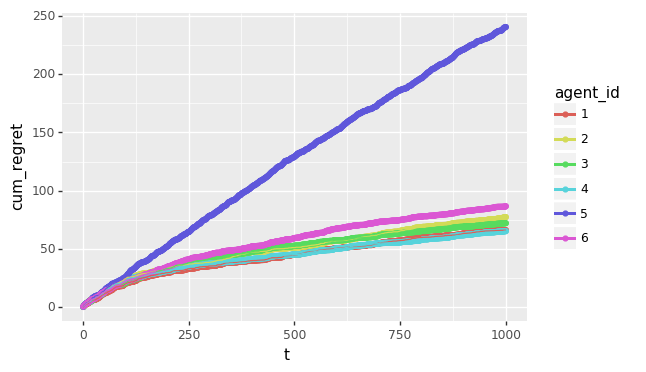

<ggplot: (8735728426833)>


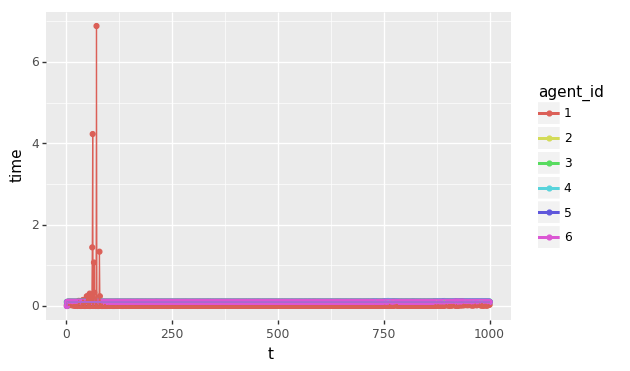

<ggplot: (8735728447205)>
theta [ 2.70684984  0.62813271  0.90796945  0.50382575  0.65111795 -0.31931804
 -0.84807698  0.60596535 -2.01816824  0.74012206  0.52881349 -0.58900053
  0.18869531 -0.75887206 -0.93323722  0.95505651  0.19079432  1.97875732
  2.60596728  0.68350889  0.30266545]
Experiment: Step 0
 Laplace sample: array([ 0.15366083,  0.16763824, -0.76593007,  0.96229917,  0.90282586,
       -0.53790916, -1.5496711 ,  0.43525292,  1.25990369, -0.44789835,
        0.26620678,  0.41258016,  0.98877285,  0.51383273, -0.92820483,
        0.8469039 , -0.29843574,  0.02914148,  0.88903088, -1.83926086,
        0.8635956 ])
 Sample: array([ 0.94204498, -1.0765905 , -0.58038298,  1.20902728,  1.20174403,
       -0.82046316, -1.02957716, -1.52485554, -0.8548599 ,  1.60281554,
        0.18547899, -0.99401829, -0.13190614, -1.33509173, -0.08929844,
        0.6985664 , -1.40912568,  0.87090702,  1.58581239,  0.92965784,
       -0.550876  ])
 Sample: array([-0.56845803,  0.54475392, -0.829

 Steps taken: 178
 Sample: array([ 3.1560064 ,  0.01231839,  1.91216924,  0.95632857, -0.72091868,
        1.18873785, -0.82256341,  0.19367169, -0.73827393,  1.01798036,
        0.2527997 , -0.89866542, -1.48467953, -0.40918929, -0.43709076,
       -0.61075096,  2.03824196, -1.24625865,  0.69839445, -1.29013336,
        1.61836789])
 Sample: array([ 1.49351034,  1.00699495, -0.84247763,  0.62489184, -0.91731505,
       -0.3355264 , -0.43059695, -0.81154656,  0.13637282, -0.12599497,
        0.64016689, -1.14531159, -0.14502234,  0.14110407, -0.30938851,
       -1.81742049, -0.26646191,  0.30177859,  0.15525062,  1.02468437,
       -0.28807288])
 Steps taken: 742
 Sample: array([ 0.87554147, -0.33423884, -0.54860812,  0.00363544, -0.76014837,
       -0.79811507,  0.27095653, -1.03584977, -0.45851021, -0.08033267,
       -0.5029512 , -0.34168869,  0.09568223,  0.42773812, -0.15927731,
        0.32319835, -1.01806458,  0.79246517, -0.5409957 ,  0.29387636,
       -0.48639523])
 Accept pr

 Steps taken: 172
 Sample: array([ 2.61642401,  0.06926199, -0.40053531, -0.83323058,  2.46369035,
       -1.96727179,  0.16180422,  0.82718687,  0.36300837, -0.51731645,
       -2.38456354, -0.31002449, -1.68244883,  1.48602931,  1.68910828,
        0.49203912, -0.42146258,  0.43258314,  0.50816284,  0.39048996,
       -0.91560545])
 Sample: array([ 0.37333993, -0.32023614, -0.64368244, -0.80907975,  0.98489896,
       -1.03616854,  0.25949336, -0.42176129, -0.51356566, -0.86287338,
        0.40208112,  0.76526185, -0.82583824,  1.87681273, -0.65409884,
       -0.87659276, -1.09531555,  1.2924252 ,  0.72660307, -1.55153689,
       -1.40157958])
 Steps taken: 680
 Sample: array([ 0.38765798,  0.1333787 ,  0.77522396, -0.36072369, -0.28518092,
       -0.74433253,  0.92947214,  0.34464741, -0.2640105 , -0.62759687,
       -0.16248108,  1.45323938,  0.29579893,  1.04578508, -0.26914601,
        0.40343336,  1.18180917, -0.29096481,  0.80575197, -0.5557883 ,
       -0.10854512])
 Accept pr

 Steps taken: 125
 Sample: array([ 2.50412198, -0.52066752,  1.93125719, -0.59590645,  0.35625192,
        1.29038895,  0.62718778, -0.92381727,  0.69704701,  0.33843954,
        0.98369198, -0.26889097, -0.90471623, -1.97740087, -1.45184895,
       -0.50466687, -0.37530712,  2.64429038, -0.77987775,  0.94118083,
       -0.81813497])
 Sample: array([ 0.39226509, -0.3702619 ,  0.85990822,  0.91802456, -0.00661721,
       -0.70169292,  1.1875693 , -1.0669175 , -0.78519176,  1.77116638,
       -0.38214914,  0.26871795,  1.00586483,  1.22961682, -0.19535332,
       -1.67543445, -1.052445  ,  0.43786763,  0.38075413,  0.74840562,
        0.11118665])
 Steps taken: 695
 Sample: array([ 0.50177648,  0.24609776,  0.56401966, -0.4796058 ,  0.43070946,
       -0.20798533,  0.35076241, -0.560565  ,  0.36514428, -0.47917642,
       -0.3174216 ,  0.2390754 ,  0.25031386,  0.56973294,  0.08794606,
        1.58085007, -0.41367624,  2.09359494,  0.69340398, -1.19594806,
        0.24018249])
 Accept pr

 Steps taken: 117
 Sample: array([ 0.48977963,  1.70569916, -0.19157394, -0.29371188,  1.19627534,
       -2.35109644,  0.14964987, -0.0174572 , -0.68772132, -0.82068573,
       -2.3541737 , -1.4511484 ,  0.0580626 , -0.86159185, -1.19403568,
        0.55126366, -0.288065  ,  1.70841506, -0.35320166,  0.24169126,
       -1.2473149 ])
 Sample: array([ 1.0607225 , -1.07132788,  0.14856907, -1.12886299,  0.62560214,
        0.63678528,  0.51608852, -0.55729957, -0.11035665,  0.15276468,
       -1.02372292, -1.24099643, -0.38693146, -0.62469868, -1.0858309 ,
        0.27471898, -0.90918978, -0.78474043,  0.41168901,  1.77673415,
       -1.17615378])
 Steps taken: 715
 Sample: array([ 0.60657715,  0.71349527,  1.65018888,  0.19008862, -0.25814865,
       -1.47700527, -0.86854395,  0.60496262,  0.11733232, -1.69090221,
       -0.02765469,  0.33432206,  0.033631  ,  1.36653738,  0.30190435,
        1.13773758,  1.03624047,  0.2382803 ,  0.18944743, -0.85530807,
       -0.0411978 ])
 Accept pr

 Steps taken: 105
 Sample: array([ 1.22237607,  1.96236347,  0.31845202,  0.79166162,  0.73618365,
       -0.48565523, -1.84937654, -0.68683594, -0.20624871,  0.63704198,
       -1.21370242, -0.32011265,  0.57174777, -0.3921829 , -1.49685624,
        0.95398605, -1.05876005,  0.94975674, -1.04028262, -0.27811022,
        0.78934286])
 Sample: array([ 1.11084944,  0.05108086,  1.49588811,  1.0177695 , -0.71811117,
       -0.58263366, -1.74368751,  0.01887311,  0.67674955,  0.81221451,
       -0.12555183, -0.26473691, -2.44462716,  0.4387086 , -0.7897684 ,
       -0.28089165, -0.72828275,  1.75999722, -0.80887937,  0.08448229,
        0.36743982])
 Steps taken: 712
 Sample: array([ 0.58096752,  0.33497449,  0.35502772, -1.0954048 , -0.12408761,
       -0.194659  , -0.53448947, -0.08784039, -0.59309437, -0.25210185,
       -0.87682001,  0.58227629,  0.49256565, -0.60964728, -0.69017062,
        1.65319278, -0.14983714,  0.49076352,  1.14430413,  0.50729091,
        0.35650303])
 Accept pr

 Steps taken: 161
 Sample: array([ 2.23958915,  1.28429108,  0.45116896, -0.50033524,  0.07052575,
       -0.34204612, -0.14040539,  1.26045914,  0.44379777, -1.16088337,
       -0.55150237, -0.73354622, -1.00495467,  0.63563701, -1.83014041,
        0.26792374, -2.21475192, -0.24707601, -0.89003314, -0.42796751,
       -0.29080485])
 Sample: array([ 1.33892038,  0.74107136, -0.37642106,  1.09427941, -0.02101396,
        0.39065074, -0.57264703, -1.57499139, -1.39861981,  3.30391385,
       -1.23080066, -0.64723801, -1.05857161,  0.77232807,  1.24802249,
       -1.8848024 , -0.39219293,  1.13522291,  0.86254919,  1.39035827,
        0.05147218])
 Steps taken: 694
 Sample: array([ 0.78814518,  0.40976736, -0.58038223, -0.38604588,  0.9188362 ,
       -1.52335567,  0.73004132,  0.55650245, -0.19391667, -0.90989586,
        0.02083679, -0.41047602,  0.67631887,  0.3380696 , -0.10814977,
        0.77006743,  0.52486742,  1.00244361, -0.09637484, -0.18030601,
        0.02354697])
 Accept pr

 Steps taken: 109
 Sample: array([ 3.68786108,  0.86318845, -0.57403413,  2.56299317,  0.68414263,
        1.91037844,  1.3572414 , -0.84017263,  0.61366068, -0.65722872,
       -0.27342658, -1.33716034, -1.24203648,  0.1354034 , -0.77500156,
        0.37213928, -1.19525855,  0.58354774, -0.07634737, -0.70062446,
        0.69730554])
 Sample: array([ 2.27552947,  0.66408139,  0.94975946,  0.59108348,  1.31923162,
       -2.83236768,  1.24076663, -0.57447027,  0.25086722, -0.67121615,
       -1.09639795, -0.60658931, -1.73945277, -0.3701532 , -0.59952142,
       -0.05763795, -0.76855996,  1.61948948,  0.43115519, -1.27924495,
        0.58684528])
 Steps taken: 1006
 Sample: array([ 1.13078357,  0.41784843,  0.06554037, -0.9148226 ,  0.04197312,
       -1.05933219,  1.26054514,  0.47343437,  0.28127881, -0.55572639,
        0.35360442, -0.53645808,  1.07402911,  0.31995719, -1.0012375 ,
        0.9511888 ,  0.60850912, -0.3494146 , -0.48549776, -0.38985494,
       -0.50263836])
 Accept p

 Steps taken: 216
 Sample: array([ 3.46620139, -0.1095071 ,  1.72670444,  0.01332118,  0.2516453 ,
       -0.83724885,  2.24442434, -0.29611675,  1.34109626, -1.07687448,
       -0.09026436, -1.14297125, -0.08328235, -0.94713134, -0.51495801,
        1.23215487, -0.1594349 , -0.11222528,  1.97035643, -0.13039233,
       -1.23723035])
 Sample: array([ 1.1037591 ,  1.06497115,  1.32537963, -0.14464528, -0.70853224,
        0.06290731,  1.5032879 , -1.67146316, -0.28760283,  2.03561402,
        0.01442079, -0.17021165, -1.07390105,  0.40601177, -0.04079269,
       -0.30806998,  0.17402289,  0.20626496,  1.68723446, -0.06957295,
        0.60040549])
 Steps taken: 563
 Sample: array([ 1.56676708,  1.48524929,  0.34201704, -0.38053432, -0.21956846,
       -0.39618993,  0.46881679, -0.65284517,  0.43875739,  0.60797636,
        0.24750193,  0.82795388,  0.30217777,  0.1574797 , -0.98033122,
        0.8552244 ,  0.40878844, -0.15593319,  0.80713534, -0.00446003,
       -0.52161788])
 Accept pr

 Steps taken: 137
 Sample: array([ 2.65032764, -0.35480201,  2.17435003,  0.7301138 ,  0.59300376,
       -0.49775352, -0.27792374,  0.11157203,  2.11565648, -0.48837272,
       -0.47361474, -0.04044962, -0.21410482,  1.01972827, -1.1616996 ,
        0.18929967, -1.01662087, -0.38906453, -0.56744246,  0.49934412,
       -2.51581517])
 Sample: array([ 2.24955967, -1.06620939,  2.17738531,  2.43466824, -0.77660514,
       -1.53483824,  1.50446919,  1.05962477, -0.29289259,  0.428147  ,
       -0.45206552, -1.09134929, -1.35139766, -0.07892988,  0.30566907,
       -0.75388609, -0.7377684 ,  1.23201842,  0.62473236, -0.38240538,
        0.28523396])
 Steps taken: 654
 Sample: array([ 1.24895153,  0.91223111,  0.26626539, -0.55491059,  0.50160352,
       -0.93212979,  0.09840545,  0.37575267, -1.39188767,  0.10093859,
        0.27330388, -0.28354429,  0.40559743, -0.74439881, -0.5502729 ,
        1.54863868,  0.53666458,  0.10615784, -0.03385431,  0.40433709,
        0.07828925])
 Accept pr

 Steps taken: 160
 Sample: array([ 2.18681425,  0.55263178,  1.58331804,  0.35593792, -1.45331578,
       -1.48081503, -0.18481293, -0.39684495, -1.54987663,  0.88930383,
       -0.73872635, -1.96201461,  0.20771356, -1.09119957, -1.92987175,
        0.52896381,  0.26471206,  0.39767452, -0.54124816, -0.61243963,
        0.56707833])
 Sample: array([ 1.56269924e+00,  6.08125428e-01, -4.70126416e-04, -9.07427059e-01,
        1.71387103e-02,  2.45477037e-01, -4.44798452e-01, -9.09168415e-01,
       -1.91502916e+00,  8.47010895e-01,  1.25021440e-01,  3.68721769e-01,
       -1.43440732e+00, -4.03139996e-01,  6.03084065e-01, -6.96524225e-01,
       -8.22254248e-01,  5.06843036e-01, -9.64713853e-01, -1.29902970e+00,
        1.46035723e+00])
 Steps taken: 614
 Sample: array([ 1.4712573 ,  0.93018191,  0.71881601, -1.06947843,  0.18150533,
       -0.84820977, -1.29068206, -0.7551274 , -1.0036177 , -0.01995522,
        0.80073691,  0.05196894,  0.1286276 ,  0.18479747, -0.35044775,
        0.98

 Steps taken: 320
 Sample: array([ 3.0544494 , -0.4027072 , -0.15802214, -0.79087624, -0.73050052,
        0.95452435, -0.97112835, -0.54406088,  0.9909902 ,  0.38542742,
        0.80676949, -1.92156456, -1.79657721, -0.19962112, -1.4533295 ,
       -0.34621554,  0.49882491,  1.81971248,  0.69682946,  1.38270642,
        1.87465666])
 Sample: array([ 2.24564642,  0.42157725,  0.86647826,  1.20480026, -0.761895  ,
        0.61776748,  0.13693347, -1.58347909, -2.20879267,  0.32904638,
       -1.83111831,  0.818017  , -0.42799987,  0.51896927,  1.24930692,
       -0.26530537, -1.47253365,  0.32986164, -0.55200299,  0.79985904,
        0.5903214 ])
 Steps taken: 923
 Sample: array([ 2.19701369,  1.69041026,  0.61689078, -0.28794917,  0.15163042,
       -0.95007774, -0.05238809,  0.62413879, -0.86733581,  0.43372294,
        0.5256    , -0.66652125, -0.29134671, -0.45662314, -0.43745825,
        0.54125428,  0.00323029, -0.20424701,  0.50428283, -0.57919234,
       -0.47161951])
 Accept pr

 Steps taken: 152
 Sample: array([ 1.45685191, -0.68418904, -0.41673017,  0.49806028, -0.19375672,
        0.02362401,  0.44202317,  0.26918224, -0.14711013,  0.72034062,
       -0.18291832, -1.51668956, -1.37999725, -1.3943508 , -1.52727252,
        0.46764513, -1.32815571,  1.47759132,  0.14768965,  0.2453469 ,
        0.39915005])
 Sample: array([ 1.2649682 ,  0.10526628,  1.00481224,  1.76581518,  1.01428228,
       -1.04623901,  0.89738135, -0.72941162,  0.25067185,  1.50988396,
       -0.7528698 , -0.38865158, -2.52875506, -0.33800968,  0.66670296,
        0.25603705, -0.43472537,  1.132944  , -0.27443603, -0.15913755,
        0.61788027])
 Steps taken: 618
 Sample: array([ 1.46328472,  0.54175148,  0.65141334, -1.0916599 ,  0.28163973,
       -0.08359247, -0.66846743,  0.97468911, -0.6726021 ,  0.55082543,
       -0.39196195, -0.57581267,  0.23456859, -0.11009615, -0.45600171,
        0.61321658,  0.84528905,  0.06576686, -0.22078073,  0.44439052,
        0.92803048])
 Accept pr

 Steps taken: 158
 Sample: array([ 1.95205461,  0.98269459,  1.4558142 , -0.13218338, -0.22812253,
        0.37392609,  0.06247138,  0.75563972,  0.37766069, -0.07890304,
        1.396458  , -1.80199883, -0.55343007, -0.12847228, -2.20050313,
        0.13443519,  0.05427724,  1.04540286, -1.1649252 ,  1.14623478,
        1.14998447])
 Sample: array([ 1.93522105,  0.08279757,  1.7563959 ,  0.45646877,  2.13771364,
        0.47596291,  1.12393239, -1.14393014, -2.1114714 ,  0.76589799,
       -0.78368423, -0.7939067 ,  0.14642505,  0.21904086, -0.40818157,
       -0.48319696, -0.34041693,  0.07946499, -0.308555  , -0.21286343,
        1.92492661])
 Steps taken: 610
 Sample: array([ 1.75020436,  1.19450265,  0.35561823, -0.41092544,  0.94843315,
       -1.2574199 ,  0.28244784, -0.03113207, -0.74444855,  0.77920936,
        0.21137202,  0.28698116,  0.39017883,  0.13647681, -0.15639839,
        0.76549671,  0.09149814,  0.45140925,  0.40503791, -1.06097529,
        1.01303179])
 Accept pr

 Steps taken: 150
 Sample: array([ 2.89074072,  1.35881783,  0.85574798, -0.73493849,  0.65919798,
       -0.36789165, -1.02031379, -2.30101977,  0.08021682,  0.38515435,
        1.23367385, -1.35352716,  1.50665221, -0.61811775,  0.87029054,
        1.0906087 , -0.74595602,  0.15950232,  0.08622916,  0.25670465,
       -0.41364177])
 Sample: array([ 1.82120841, -1.09522903, -0.45370576,  0.68107581,  0.88839088,
       -1.07772651,  0.8576395 , -0.86043434, -2.31460319,  0.08506926,
       -2.22916695, -0.38135171, -3.54805537, -0.52551288, -2.75215768,
        1.25121008,  0.1629375 , -0.37461888,  0.59758955,  0.10611107,
        0.44910334])
 Steps taken: 586
 Sample: array([ 1.70212678,  0.44394214,  1.39082185, -0.47828734,  0.37055056,
       -0.71465105, -0.1605856 , -0.43986332, -0.52685183,  0.34881237,
        1.04534636, -0.38335376,  1.57416398, -0.50924364,  0.32916532,
        0.59483827, -0.16688184,  0.47446588, -0.40676592, -0.25124115,
       -1.56217835])
 Accept pr

 Sample: array([ 1.68356547, -0.31146506,  0.22755157,  0.57875017,  1.59089042,
       -0.25579886,  0.10426153, -2.94697356, -0.84101993,  0.77135446,
        0.30021807, -0.3799577 , -0.0089299 , -0.15199418, -0.10756284,
       -1.10316011, -1.05829224, -0.3567933 ,  0.73455594,  0.96094315,
       -0.42442406])
 Steps taken: 731
 Sample: array([ 1.38294819,  0.85971051,  1.91336971, -0.52165443,  0.52101921,
       -1.29120275, -0.32497251,  0.38670084, -0.25441631, -0.24426854,
        1.0358805 , -0.34023919,  0.10405947, -0.34557427, -0.5211028 ,
        0.82536021,  0.12124428,  0.66490465,  0.19467501,  0.77251004,
       -0.3903547 ])
 Accept proportion: 0.433594
 Steps taken: 256
 Sample: array([ 2.923895  ,  0.30397955,  0.9343155 , -0.48042552, -0.63501455,
       -2.17534637, -0.07529189,  0.83542868, -0.17984893,  1.62233516,
        0.4360639 ,  0.66267875,  2.05019918,  1.51899631,  0.38385064,
        0.20629087, -1.37725137,  0.08298693, -0.89264836,  0.37572573,
  

 Sample: array([ 1.34721073, -0.39017915,  1.64520405,  1.56902113,  0.84228926,
       -0.96587211,  0.62909821, -2.0723576 , -0.30785013,  0.83099482,
        0.74132358, -0.15899155, -1.22278806,  0.15429619,  1.20393771,
       -0.85822969, -0.62186911, -0.60449106,  0.98146078,  0.50658758,
        0.32573408])
 Steps taken: 560
 Sample: array([ 1.8041829 ,  1.40709835,  1.15983086, -1.27475088,  0.24880758,
       -0.59552141,  0.03712318,  0.55020387, -0.70407425,  0.44215058,
        0.54427043, -0.46368002,  0.74827932, -0.08488334,  0.35268862,
        0.8460634 , -0.43681392,  0.98046704, -0.36694522, -0.3622214 ,
        0.14936259])
 Accept proportion: 0.593625
 Steps taken: 251
 Sample: array([ 1.99783378, -0.58336834,  0.33241226, -0.30912855,  0.07564397,
       -1.342274  , -0.49234201, -2.48039189, -1.37676622,  0.04465979,
       -0.00648831, -1.38457977, -1.34131329, -0.09900034, -0.4994565 ,
        0.2140965 , -0.34808095, -1.63369443, -1.23003246, -0.27547097,
  

 Sample: array([ 2.4827757 ,  0.9965813 ,  0.82376407,  0.56772237,  0.49026477,
       -1.15665195, -0.07142769, -0.13072021, -2.75951198,  1.87615126,
       -1.32784684, -2.77909161, -0.99556684, -0.10188869, -0.76051322,
       -0.38769685,  1.13655711, -0.22691498, -0.05694965, -0.39369329,
        0.54159746])
 Steps taken: 428
 Sample: array([ 2.04728102,  1.12099443,  0.39482106, -0.51535487, -0.18657631,
       -0.45032057,  0.57141847,  0.91499186, -0.31563902, -0.14059185,
       -0.39170898, -0.39178141,  0.51260083, -1.09402826,  0.03634951,
        0.17501041, -0.09543881, -0.03088206,  0.31986407, -0.67036045,
        0.28603107])
 Accept proportion: 0.502041
 Steps taken: 245
 Sample: array([ 1.9068051 , -0.43904338, -0.47363769,  0.03646107, -0.59391512,
        1.35139277,  0.10036754,  0.24928565, -1.26375995,  0.35054204,
       -1.12261588, -1.49267745,  0.62162471,  0.4227224 , -0.9070903 ,
        0.81316693,  0.04029285,  0.22166168,  1.27741099,  0.25021242,
  

 Sample: array([ 2.20308583,  0.70408795,  1.37659985, -0.14096911, -0.33208486,
       -0.84188826, -0.830907  , -1.57899836, -1.3626213 ,  0.3655169 ,
       -2.42004519, -0.03280457, -2.08855929,  0.72010738,  0.37788537,
        1.91905076, -0.48220508,  0.31791756, -0.59565452, -0.77682178,
       -0.58078988])
 Steps taken: 511
 Sample: array([ 1.60392719,  0.57327796,  0.82141027, -0.76115748,  0.01966638,
       -1.11671755,  0.16478254,  0.12385594, -0.97691529,  0.50987138,
       -0.01848126, -0.43766003,  0.58283705, -1.50997628, -0.35048913,
        0.40699285, -0.01298953,  0.55047985, -0.58381094, -0.13345545,
       -0.14751918])
 Accept proportion: 0.510373
 Steps taken: 241
 Sample: array([ 1.56894635, -1.05087612,  0.95380595,  0.37473873, -1.00114722,
       -0.07776849, -0.21566702, -2.02084253, -1.39864953, -0.77529216,
       -1.15029134, -0.56956364, -0.33397882, -0.42339259,  0.23133808,
        0.50451695,  0.52491146,  0.15325165,  1.11268731,  0.11581849,
  

 Sample: array([ 1.78826681, -0.06362388,  0.69692821,  0.67309315,  0.25753967,
        0.51244903,  0.59700388, -1.24838143, -1.85843278,  1.05871799,
       -0.23284438, -1.07965596, -0.63244159,  0.0910755 , -0.03830789,
        0.13567728,  1.03738667,  0.61210317, -0.25293655, -0.36118267,
        0.07294633])
 Steps taken: 519
 Sample: array([ 1.86991896,  0.48850231,  0.50440537, -1.07315998,  0.90612862,
       -0.10973531, -0.56224597, -0.06357855, -0.51900367,  0.20974662,
        0.76818207, -0.58715999,  0.2048553 , -0.15977847,  0.21052471,
        1.4996953 ,  0.07516226,  0.93502932, -1.00088186, -0.93103789,
        0.20649885])
 Accept proportion: 0.525424
 Steps taken: 236
 Sample: array([ 2.12311013, -0.14123893, -1.0510269 ,  0.182003  ,  0.55802215,
       -0.70104688,  0.09043212,  0.49400363, -0.07663497,  0.83438317,
        0.43007729, -1.04473511, -1.09309727,  1.47173575, -0.10478175,
        1.34144582,  1.6798039 ,  0.57539571,  0.51559595,  0.01910538,
  

 Sample: array([ 2.08866935,  0.29629977, -0.01388804,  0.13512739, -0.69043864,
       -0.5455359 , -0.12430879,  0.04471302, -2.0153797 ,  1.79707586,
        0.4135633 , -1.36990459, -0.4372366 , -1.20237934,  0.58051147,
        0.35375729, -0.06857851, -0.08923545, -0.6608644 ,  0.60177938,
        0.68664594])
 Steps taken: 401
 Sample: array([ 1.65811802,  1.33048507,  1.81609092, -0.6287196 ,  0.4928323 ,
       -1.08280957,  0.16869223,  0.9264784 , -1.38494069,  0.89990355,
        0.57101111, -0.58438465,  0.40009901, -0.0190214 , -0.04144313,
        0.67718173,  0.35453144, -0.3213238 ,  0.08535735,  0.33671203,
       -0.29319715])
 Accept proportion: 0.504237
 Steps taken: 236
 Sample: array([ 2.12672276,  1.65588047,  0.3564204 , -0.3075084 ,  0.81456   ,
       -0.82894063,  0.95441322,  1.59170356, -1.86576437, -0.71024257,
        0.40596491,  1.32369533,  0.64512062, -0.9063113 , -0.77446311,
       -0.52600538,  2.48801376,  1.66588103, -0.57426395,  1.73914806,
  

 Sample: array([ 2.39891883,  2.35992657,  2.803531  ,  0.88387867,  0.38857267,
       -0.53726742, -0.74795699, -0.39694828, -1.5851922 ,  2.39622899,
       -0.16759334,  1.12268683, -0.7652121 ,  0.20629745,  0.77071935,
        0.35408803, -1.62095896,  1.11428844,  1.72208115, -0.36329205,
       -0.42298428])
 Steps taken: 503
 Sample: array([ 2.18166631,  0.89041112,  1.4901348 , -0.91577014,  0.37366753,
       -0.07363582, -0.23353775, -0.18021318, -0.34073458, -0.15685448,
        0.57654331,  0.23429492, -0.01886154, -1.40825042,  0.10970798,
        0.24063648, -0.01232843,  0.79967299, -0.12732329, -0.81214806,
       -0.60126676])
 Accept proportion: 0.578261
 Steps taken: 230
 Sample: array([ 1.8950942 ,  0.7281575 ,  0.62102349, -0.72273948, -0.77849621,
       -0.93600151, -1.11477568,  0.21777607, -0.68798555, -0.7856938 ,
       -0.90318002, -0.37891362,  0.58722469,  1.02060615, -1.81589478,
       -0.03035043,  0.37360993,  0.90821267,  0.3608446 ,  0.76496699,
  

 Sample: array([ 1.46966274,  0.27335155,  1.06860401,  0.93368304, -0.06281544,
       -1.81088114, -0.38876546, -1.03085742, -3.41621934, -0.46527231,
        0.60382157,  0.59405329, -0.94878791,  0.4087971 , -0.06071744,
       -1.39651525, -0.70864988,  0.37836473,  0.38248791,  0.60650276,
        0.57768952])
 Steps taken: 490
 Sample: array([ 1.73961635,  1.05211091,  0.43498443, -1.81402136,  0.5591537 ,
       -0.33518193, -0.32483214,  1.44227439, -1.12965306,  0.26835996,
        0.96238524, -0.02672098,  0.29659793, -0.40676346, -0.32005733,
        0.59736677,  0.15485007,  0.23064989, -0.88461664,  0.58797671,
        0.04842568])
 Accept proportion: 0.484444
 Steps taken: 225
 Sample: array([ 1.59076006, -1.44567081, -0.00810832,  0.65310466, -1.18705069,
        0.0897664 , -0.57686038, -0.26932387, -1.00492646,  0.49560857,
        0.70158819, -0.90681275,  0.55577387, -0.61570441, -0.06860706,
       -0.309764  ,  0.58966723,  0.35192026,  0.18481016, -1.19996607,
  

 Sample: array([ 2.45405199,  1.79122172,  0.44885095,  0.74712769, -0.45844584,
        0.00977914,  0.46277222, -0.8671969 , -0.60558034,  1.62153327,
        0.86933132,  0.12500884, -1.11367557,  0.32244853,  1.87103005,
       -0.59234487, -0.87864997,  1.10284795,  0.40854529,  2.33864133,
       -0.43298432])
 Steps taken: 358
 Sample: array([ 1.83108511,  1.06755382,  0.73950512, -0.50025464, -0.2876535 ,
       -1.14605193, -0.19466324,  0.7591372 , -0.66051467, -0.38509539,
        1.33874377, -0.3848642 ,  0.9770328 , -0.95193864,  0.06432051,
        1.39063363, -0.43299369,  0.96388003, -0.29802396, -1.01833382,
       -0.79244425])
 Accept proportion: 0.561947
 Steps taken: 226
 Sample: array([ 0.78873496,  0.56055864,  0.43715089,  1.07096998,  0.13048862,
       -0.28219389,  0.28342385,  0.39987753, -1.3763203 ,  0.66248278,
        0.70878372, -0.73891005, -0.6600582 ,  0.8456622 , -0.51291406,
        1.11603342,  1.11184333,  0.91165089, -2.22862774, -0.19622564,
  

 Sample: array([ 2.03246978,  2.09411034,  1.79661489,  1.90367596,  0.29193665,
       -0.15423616, -1.18215911, -0.65330056, -1.86859833,  1.0050382 ,
       -0.38323252, -0.23980742,  1.6828891 , -0.31823352, -0.18209464,
        0.16883128,  0.31541796,  1.23050289,  1.22317914, -0.49711827,
        0.25089115])
 Steps taken: 373
 Sample: array([ 1.63882561,  0.45734833,  0.88512998, -0.08124833,  0.7682983 ,
       -0.82872604, -0.16543363,  1.24807985, -1.09876375,  0.59740139,
       -0.0487651 , -0.62902453,  0.09803251, -1.29776896,  0.01211028,
        0.62673892, -0.314888  ,  0.77973464,  0.98122741,  0.14350377,
       -0.41249399])
 Accept proportion: 0.556054
 Steps taken: 223
 Sample: array([ 1.47900265,  1.36453181,  0.12899738, -1.44569053,  1.05659017,
       -0.85123529, -2.0940284 ,  0.6409254 , -1.1789987 ,  0.82777227,
        0.50442016, -0.42619909,  0.38708945,  1.18673776,  0.25487774,
       -0.20337079, -0.04070295, -0.17261485, -0.1680993 , -0.643646  ,
  

 Sample: array([ 1.21742326,  0.72685502,  0.65982826,  1.89304955, -0.2320403 ,
       -0.63971451, -1.86005289,  0.03442489, -1.12941811,  1.33394981,
       -0.72920396, -0.55965231, -0.86699806, -0.93030499,  1.12093008,
       -1.50829596, -0.8673612 ,  1.60204474,  1.2650466 ,  0.26564059,
        1.18187148])
 Steps taken: 451
 Sample: array([ 1.24588818,  1.54491115,  0.06435293, -0.99586231,  0.54423744,
       -0.89202955, -0.18627196,  0.66942972, -1.06713127,  0.62941373,
        1.07965079, -0.66435832,  0.06658511,  0.12761035, -0.50217118,
        0.91190655, -0.16431597,  1.33134031,  0.01051338, -0.73037442,
       -0.19801015])
 Accept proportion: 0.568807
 Steps taken: 218
 Sample: array([ 1.51394891, -0.97502899, -0.15917804,  0.14883613,  0.68372542,
       -1.00958991,  0.65759495, -0.50921418, -1.75361033,  0.74382188,
       -0.0670796 ,  1.05852758, -0.63755218, -0.69791801, -0.9652277 ,
       -1.0194705 ,  1.29925362,  0.33492156,  1.26676249, -0.41359004,
  

 Sample: array([ 2.02774592e+00,  3.97447706e-01,  1.00737199e+00,  1.57473143e+00,
        3.19285346e-01, -7.84643360e-01, -1.78321800e+00,  3.99814751e-04,
       -7.32107989e-01,  1.90464868e+00,  4.07542676e-01,  7.06779518e-01,
        3.15828285e-01,  8.50900235e-02, -7.96811070e-01, -1.14837427e+00,
        7.35323441e-02,  1.04550189e-01, -4.85224987e-01,  7.18800701e-01,
        2.22451128e-02])
 Steps taken: 442
 Sample: array([ 1.59475344e+00,  1.24986776e+00,  1.00410679e+00, -1.09785195e+00,
        9.33248480e-01, -6.30785631e-01, -1.83958621e-01,  3.51942877e-01,
       -1.20443696e+00,  1.59821341e-01,  3.05928407e-01, -1.26661525e+00,
       -1.01984162e-03, -6.97390180e-01,  1.48095040e-01,  1.55582842e+00,
       -2.64926652e-01,  1.76676069e+00,  3.66328140e-01, -6.96437643e-01,
       -1.49342598e-01])
 Accept proportion: 0.590476
 Steps taken: 210
 Sample: array([ 1.57597246, -0.75303766,  0.1425434 ,  0.64304066, -1.60799739,
       -1.24597521, -1.21481114,  0.

 Sample: array([ 2.31779013,  0.63166411,  0.73764804,  1.59284624,  0.83216752,
       -1.5045569 ,  0.04174363,  0.75566782, -1.85390233,  0.40041791,
        0.2171462 ,  0.62626885, -1.33147109,  0.40224608,  0.93764679,
        0.95365674,  0.64223297,  0.93232104,  1.74298954,  0.48117552,
        0.32832683])
 Steps taken: 418
 Sample: array([ 1.41693972,  1.01742132,  0.40456626, -0.48777875, -0.21215253,
       -0.51681194,  0.86542536,  1.1626505 , -1.28205685,  0.52224507,
        1.11234379, -0.58235773,  0.25293037, -1.41736532,  0.33394535,
        0.79609288, -0.80875544,  0.41601786,  0.67383173, -0.70723612,
        0.42294272])
 Accept proportion: 0.564593
 Steps taken: 209
 Sample: array([ 1.94363904, -0.66245772,  1.67114805,  1.045284  , -0.07497753,
       -0.06026288, -0.26844352, -1.93402358, -1.06774894,  0.50995779,
        2.66791235,  0.85176146,  1.0616663 , -0.05708805, -0.22852449,
       -1.09165032,  0.79447852, -0.51778716,  0.64116566, -0.29792844,
  

 Sample: array([ 2.94627739, -0.26749336,  0.34146845,  1.70071343,  0.17788762,
       -0.83257863, -0.08272568, -1.38733413, -1.28977782, -0.36236168,
        1.54054496,  0.30458887, -0.12772686, -1.09111771, -0.20952829,
       -0.57412227, -0.62521565,  1.20196607,  0.58643568, -0.4416759 ,
        0.45447783])
 Steps taken: 309
 Sample: array([ 1.9821184 ,  1.19597852,  0.23876531, -1.04736697,  0.26328482,
       -0.76834081,  0.74628333,  1.3233526 , -1.22409559,  0.05641559,
        0.53857271, -0.90371277,  0.25818668, -0.53825216,  0.20712695,
        1.17027013, -0.62665149,  1.1549447 ,  0.52037932, -0.39630531,
       -0.51976772])
 Accept proportion: 0.507246
 Steps taken: 69
 Sample: array([ 2.15929225,  0.61867065, -0.62555523,  0.16406609,  0.57579718,
       -0.09730356, -1.36715166,  1.26432624,  0.15623609, -0.9662896 ,
        1.14997604,  0.39319675,  0.27004081,  0.19141151,  0.51644235,
        0.24773268, -0.83727874,  1.19259809, -0.35080272, -0.55591232,
   

 Sample: array([ 1.69834907,  1.43144303,  0.71498385, -0.36455364,  0.55470767,
       -0.68980195,  0.60298731,  1.57717356, -1.32397009,  1.20709964,
        0.13836267, -0.71307267,  0.0939662 , -0.54596327, -0.68637631,
        0.61269079,  0.09154494,  0.75196941,  0.29236853, -0.74748628,
       -1.05643084])
 Accept proportion: 0.612360
 Steps taken: 178
 Sample: array([ 2.21123748, -0.58097114, -0.76908965, -0.07598763,  0.74508733,
       -0.13663641,  0.11388491,  0.37302597, -2.08202477, -1.50849178,
       -0.7039152 , -0.37206575,  0.08428498, -0.89467971,  1.11365281,
        0.32248532,  0.68113041,  0.09413604,  0.34207373, -1.42410465,
        0.37199914])
 Steps taken: 811
 Sample: array([ 2.50307922,  1.33112711,  0.43847269, -0.48492657, -1.08053295,
        1.68126626,  0.87965239,  0.73322114, -1.47287389,  0.18957578,
        0.75365214, -1.11553895,  0.2911092 , -0.63552727, -2.20633827,
        2.93652923,  0.29287176,  3.02267522,  1.74792926,  1.44720832,
  

 Sample: array([ 2.14997092,  1.28639372,  0.53859491, -0.62425951, -0.0549569 ,
       -1.6473947 ,  0.30604618,  1.48746941, -0.67502727,  0.69936826,
        0.39483007, -0.47030764, -0.02710342, -1.30262502, -0.73143288,
        0.72335085, -0.8032588 ,  0.75764996,  0.45850411,  0.55246666,
        0.48842124])
 Accept proportion: 0.551724
 Steps taken: 203
 Sample: array([ 2.83518827,  0.58561665,  0.16148496,  0.80553535, -1.80662628,
       -0.41176874,  0.28828758, -0.07336739, -0.49686061, -1.34730402,
        0.6854765 , -0.81985302,  0.5661653 ,  1.06988008,  0.56153777,
        0.18015416, -0.54159191, -0.44960317, -1.02035543, -0.07626128,
       -0.23162678])
 Steps taken: 811
 Sample: array([ 2.31531469,  0.43522172, -0.65928325, -0.53228818, -1.55142012,
       -0.38821637, -0.41886764,  0.67096644, -0.44710026, -0.16703034,
        0.1737754 , -0.79541276,  0.44452243,  0.65655812, -2.08861385,
        1.98469683, -0.9743857 ,  1.37714757,  1.5198307 ,  0.80730927,
  

 Sample: array([ 1.89865231, -0.03965393,  0.31366882, -0.24116092, -1.21614553,
       -1.09936898, -0.43479831, -0.74525185,  0.1749514 ,  1.24323935,
        0.28856915,  0.3863213 ,  1.2814446 ,  0.20601641, -0.45950922,
       -1.34867618,  0.48921518,  0.11378392,  0.35502866, -0.3653835 ,
       -0.21418654])
 Steps taken: 794
 Sample: array([ 2.06911675, -1.41248369,  1.54808555,  1.78431608, -1.72247631,
       -0.46188726,  0.52021172,  0.95690597, -2.59272386, -0.14419976,
       -1.53490603, -0.72027774,  1.38427012, -0.55068954, -0.31090982,
        1.88786466, -0.46908043,  0.96546483,  0.76144139,  1.09198905,
       -1.41470354])
 Steps taken: 786
Experiment: Step 125
 Laplace sample: array([  5.19282798,   0.96512833,   2.97499625,   7.49434604,
        -4.28364193,  -4.91151794, -13.44290982,   0.4117045 ,
       -15.55020612,   1.55159132,  -6.26296313,  -7.73122544,
        -4.23557852,  -3.02310582,  -4.92379757,   9.88678108,
         2.28068212,   8.02578068,   6

 Sample: array([ 3.12419687, -2.67192014,  0.72995319,  0.08616338, -1.21257247,
        0.80412683, -1.82082898, -0.23419638,  0.55428529,  0.37920972,
       -1.02248531, -0.1278322 ,  1.28690559,  0.02863217,  0.05778576,
       -1.59993594,  0.45590386,  1.69510546,  0.97034712,  0.79728193,
        1.01887631])
 Steps taken: 807
 Sample: array([ 2.03356623, -0.6519482 ,  0.22605974, -0.02418229, -0.02986524,
       -0.01722593,  0.33673472, -0.06390106, -0.96054383, -0.25460665,
       -1.13342115,  0.53841586,  0.2250754 ,  0.63200702, -0.79032976,
        1.04590569,  1.2716006 ,  1.60646527,  0.94870203,  0.81935683,
       -1.92785991])
 Steps taken: 840
Experiment: Step 129
 Laplace sample: array([  4.88768235,   1.10654041,   3.10873919,   7.81808355,
        -4.11328284,  -2.96162487, -13.19633438,   1.73274444,
       -14.88192235,  -0.40495405,  -6.90961762,  -7.34569697,
        -3.89652506,  -1.73181763,  -5.25601028,  11.51591561,
        -2.65483712,   8.51038755,   4

 Sample: array([ 2.15421172,  1.75812946,  0.76816994, -0.69490506,  0.70818889,
       -1.46441336,  0.50138737, -1.82159283, -1.13530335,  0.03734192,
        0.72356855,  1.4046826 ,  0.4597251 , -0.99401099, -1.54280625,
        0.04480216,  0.15064215,  0.57041459, -0.75959997,  0.04818956,
       -0.67827653])
 Steps taken: 807
 Sample: array([ 2.42614395, -1.53444723,  0.96704489,  0.71609211, -0.62169637,
       -0.67295279,  0.68525934,  0.8629152 , -2.08229735,  0.13691626,
       -0.90926153,  0.26819156,  0.06923241, -2.11368564, -1.21492901,
        1.69785153, -0.87530944,  1.18776415,  1.29683254,  2.13402689,
       -2.98125088])
 Steps taken: 841
Experiment: Step 133
 Laplace sample: array([  5.18779717,   3.09190371,   2.57716958,   7.66475055,
        -4.32329343,  -4.63013293, -12.7340012 ,   1.32897627,
       -14.60141328,   0.24351219,  -7.0331466 ,  -7.32699043,
        -4.18900486,  -4.40703253,  -6.32689213,  10.69543901,
        -0.35590787,   8.76174661,   5

 Sample: array([ 1.26495262,  1.41517651,  0.74515592,  0.50135725,  2.1851129 ,
       -0.82751351,  0.01950708,  0.42234716, -3.12433378, -0.50462357,
        1.11708687,  0.13721389,  0.84538942, -0.48816165,  0.20529301,
        0.79317638,  0.64447598, -0.23724886,  0.04002005, -1.00836029,
       -0.05439737])
 Steps taken: 806
 Sample: array([ 1.46793833,  0.60602945,  0.98253664,  0.6807474 , -1.17461848,
       -1.2783586 ,  0.7229551 ,  0.13257514, -1.92202977, -0.78969244,
        0.26496471, -1.42703329,  1.15041244, -1.43555562, -0.27290761,
        1.26956747, -0.27971152,  1.05835499,  0.23860395,  1.00485414,
       -0.79725575])
 Steps taken: 836
Experiment: Step 137
 Laplace sample: array([  5.39040493,   0.11797294,   3.07621157,   5.97622743,
        -5.07829929,  -5.61147598, -13.52810366,   2.59736613,
       -14.49936175,   0.62521801,  -4.07283697,  -7.39674087,
        -4.19358077,  -2.97586841,  -5.58074915,  10.1224112 ,
        -1.25881882,   8.47161023,   5

 Sample: array([ 1.57047497,  0.02352787, -0.52057038, -0.04713552,  0.46116287,
       -0.22994659,  0.9567952 , -2.17201779, -1.31497203,  0.21456445,
        0.02806888,  1.03564688,  1.62926243, -0.47104566,  0.61328362,
        0.16924069, -1.44043522,  1.39886176,  0.24659813,  1.11577983,
        2.09656811])
 Steps taken: 794
 Sample: array([ 2.01793973,  1.76993649,  0.8718299 ,  0.98477866, -1.78577161,
        0.60162069,  0.69996588,  0.27865029, -0.99396914, -0.77381453,
       -0.3196207 , -1.14003364,  0.22038456, -1.72418278,  0.16589644,
        0.83368069,  0.78376696,  2.51243784,  0.56438364,  0.56680837,
       -1.83799296])
 Steps taken: 829
Experiment: Step 141
 Laplace sample: array([  4.54068192,   1.95311109,   2.96349123,   8.60768625,
        -5.06619284,  -5.12626184, -12.95251438,   1.54454654,
       -15.26834912,  -0.28628755,  -6.36702522,  -7.96756261,
        -4.99573819,  -3.78623486,  -6.22971706,   9.78837461,
        -0.51662957,   7.4166163 ,   3

 Sample: array([ 2.54306895,  0.12712782,  0.41532306,  1.73225226,  0.67220591,
        0.1015238 ,  0.29674893, -0.68094235, -0.10548773,  0.33792084,
       -1.19647315, -0.50458921,  0.97117987, -1.30376569,  0.5641902 ,
       -0.68518651,  0.65579116, -0.84134184, -0.85161475, -1.34673068,
        1.18749733])
 Steps taken: 796
 Sample: array([ 1.78209451,  0.63952288,  0.32860393, -0.87403098, -0.52219538,
        0.89781204, -0.6502623 ,  1.37844327, -2.00145364, -0.22965673,
       -0.09365494,  0.53653728,  0.73064371, -1.32969307, -1.35867695,
       -0.00372378, -0.73515628,  1.27640795,  1.1795395 ,  1.34657444,
       -1.32537313])
 Steps taken: 831
Experiment: Step 145
 Laplace sample: array([  6.03632103,   1.58578152,   3.80977948,   8.31031443,
        -5.04232081,  -5.6642731 , -13.51176063,   1.52156609,
       -15.52319784,   0.46473209,  -5.50324555,  -8.34960958,
        -6.12372413,  -2.90604428,  -4.6583682 ,  10.85703469,
        -0.70189746,   9.0115075 ,   4

 Sample: array([ 2.11654768, -0.83593236,  0.63326498,  0.17863153,  0.7997629 ,
       -1.13134422, -0.67409963,  0.64537702, -0.56806614, -0.12380962,
        0.31972462,  0.25208406, -0.50179281,  1.09171108, -0.00395918,
       -0.16591626,  1.2603313 ,  0.20232647,  1.44341723, -0.19855074,
       -0.13959176])
 Steps taken: 773
 Sample: array([ 2.47449146,  1.40475286, -0.11408973, -1.12632609, -0.79607007,
        0.53548297,  1.06282042,  0.54912158, -2.02690487,  0.29434276,
        0.11498049,  0.41900109,  0.23181174, -1.17946529, -0.82512467,
        0.68340899, -1.31190167,  1.4883636 , -0.11044813,  0.67951407,
       -1.54190497])
 Steps taken: 785
Experiment: Step 149
 Laplace sample: array([  5.40787347,   1.69227028,   2.71144135,   7.84327911,
        -5.47271286,  -3.96126984, -13.58242889,   2.22470167,
       -15.65029219,   1.31863996,  -6.97437139,  -8.00760607,
        -5.63028671,  -4.45083416,  -4.96251895,  10.05845298,
        -0.13059916,   7.52629762,   6

 Sample: array([ 1.96224638, -1.72919995,  0.0941355 , -0.20494277, -0.94205063,
        0.58147288, -0.57041377,  1.31020118, -2.05435956,  1.00322663,
        1.1382752 , -0.74811628,  0.34005005,  0.61849189, -1.60350221,
        0.0287019 , -0.19995456,  0.26172104,  1.32062654,  0.87282104,
        0.73826855])
 Steps taken: 800
 Sample: array([ 1.99140416,  1.35289802,  0.32422769,  0.0413764 , -0.13483669,
        0.7918438 , -0.19143885,  1.50008155, -2.39831419, -1.38734634,
        0.42656934,  0.48818335,  1.29827305,  0.31040095, -0.67186637,
        0.53711893, -0.40878705,  1.56772743,  0.62303805,  1.85196602,
       -0.56475032])
 Steps taken: 832
Experiment: Step 153
 Laplace sample: array([  5.93928681,   2.61228282,   2.89804561,   7.06840679,
        -4.4379505 ,  -5.67496077, -11.24448063,   0.22231051,
       -15.09355264,  -0.26186835,  -5.01282767,  -8.22713522,
        -2.91048943,  -4.56729308,  -6.79849237,  10.13160959,
        -0.23728478,   6.16494918,   4

 Sample: array([ 2.17712708,  0.59202974,  0.90643565, -0.70602548,  0.96598985,
       -1.78910777, -0.27316669,  0.23217043,  0.71370906, -0.89414585,
        2.02732235, -0.40414918,  1.70926628, -0.85082274,  0.5832074 ,
       -0.56031622, -0.39507168,  1.92968574, -0.33225259,  0.58037296,
       -0.38878573])
 Steps taken: 803
 Sample: array([ 2.12970451,  1.67066033,  0.84190004, -0.37842724, -1.72848435,
        0.11943074,  0.82729833, -0.38673529, -3.20482884, -0.84900815,
        0.56649004,  0.23381146,  0.38538641, -0.46181596, -0.12292101,
        0.94119888, -1.22970562,  1.55569597,  1.22098517,  1.93161975,
       -0.14212057])
 Steps taken: 836
Experiment: Step 157
 Laplace sample: array([  4.9856475 ,   1.49809753,   3.61863457,   7.77563601,
        -4.16435209,  -4.83315629, -13.1175769 ,   3.9436757 ,
       -14.22652825,  -0.96343147,  -6.66586001,  -6.51882111,
        -4.33351214,  -2.17610237,  -7.16105135,   8.82450025,
        -2.59656048,   7.59991627,   4

 Sample: array([ 1.49284556,  1.94054111, -0.43512235, -0.65759988,  1.20058099,
        0.08252666, -0.69579865,  1.01193554, -0.6322783 ,  0.54111822,
        0.81570153, -0.09442094, -0.2723976 , -0.29886897, -0.96767391,
       -2.08939962, -1.45328412,  0.53996838,  1.93571665, -0.45469986,
        0.65365691])
 Steps taken: 800
 Sample: array([ 1.65229224,  0.36592344,  0.24061384, -0.1448191 , -1.07047997,
       -0.35731929,  0.33411907,  1.38629322, -1.81359556, -0.16363783,
       -0.07252461,  0.97220061,  0.3515376 ,  0.14980772, -0.75106693,
        1.14381114, -0.82270243,  1.44615854,  1.53715774,  0.34269895,
       -0.68379786])
 Steps taken: 834
Experiment: Step 161
 Laplace sample: array([ 1.90746916,  3.08227267,  3.96887621,  3.04965658, -1.53697255,
       -1.86218233, -1.96245297,  0.25906908, -6.21746657, -2.29936668,
       -0.41457028, -0.87220206, -3.09680509,  1.09305249, -4.37982322,
        6.16183947,  1.90692855,  1.862486  ,  2.41791355,  3.98187712,
  

 Sample: array([ 2.50588583,  0.40493113, -0.06385   , -0.90112668, -0.24821402,
        0.33388446, -0.56530308, -1.81091052, -2.99217999,  1.08675134,
        0.92207228,  0.05713629, -0.81004868,  0.51297293,  0.57675039,
       -0.23225695, -1.02232485, -0.00668511,  0.98619742, -0.5652073 ,
       -0.6075882 ])
 Steps taken: 810
 Sample: array([ 1.56129706, -0.68114801,  1.30421457, -0.16064108, -1.2133788 ,
       -1.1221721 ,  2.18913317,  1.74109441, -2.3501571 , -0.63192251,
        0.26159945,  0.8543076 , -0.34793023, -0.15106048, -0.15074305,
        1.51139365,  0.20588362,  0.76612761,  0.22441516,  0.89801399,
        0.10473379])
 Steps taken: 837
Experiment: Step 165
 Laplace sample: array([ 2.98627455,  3.50641594,  4.70474462, -1.29473833, -0.9757079 ,
       -1.7118877 ,  0.15739765,  0.18082798, -3.3646231 , -2.21580429,
        1.39876343, -1.46373635, -1.83644279, -1.1266852 , -1.58386661,
        7.52205475,  0.92787772,  1.28595253,  2.11756514,  3.61693587,
  

 Sample: array([ 1.62055717, -1.02249524,  0.73103808, -1.14362912,  0.6409445 ,
       -0.71846345, -1.11529679,  0.1264563 ,  0.60380002, -0.35184462,
        0.35713529, -0.07379579,  1.43545858,  1.19609304,  0.38454472,
       -0.57843758, -0.16662147, -0.14058706,  0.29031757,  1.7670615 ,
        0.91901686])
 Steps taken: 802
 Sample: array([ 2.68320797,  0.95779592, -0.26855855, -0.23784464, -1.96710608,
        0.37094962,  0.96403906,  1.54898059, -1.65386693, -0.16423117,
       -0.10392839,  0.97728153,  1.7846531 , -0.69709782,  0.00349428,
        1.13138766, -1.17275779,  0.95200875, -0.80856934,  2.37716588,
       -1.27579379])
 Steps taken: 833
Experiment: Step 169
 Laplace sample: array([ 1.83113286,  0.76164036,  4.14567393, -0.220487  , -0.96798062,
       -1.3807282 , -0.92786032,  0.38569875, -4.77707414, -2.49102832,
        1.64610575, -1.64224268, -2.86202085, -0.15265874, -4.74677837,
        7.53741895,  1.33319479,  2.0552586 ,  1.78465871,  2.31694018,
  

 Sample: array([ 1.30578539, -0.20742921, -0.62354607,  0.63485664,  0.07098054,
       -2.22873904, -0.4240918 , -0.79596144, -1.72204151,  1.09302992,
        0.16585082, -1.05273697, -0.98622112, -1.57292782,  0.18300535,
       -0.68748549, -0.98124773, -0.00233947, -0.0460346 ,  1.02563816,
        0.45293107])
 Steps taken: 801
 Sample: array([ 1.80677444, -0.32295932,  1.11569292,  0.40614105, -1.96072758,
       -0.26378689, -0.34323337,  1.41641593, -2.08461321, -0.68149434,
        0.93159543, -0.54954433,  0.69379494,  0.24484354, -0.50026227,
        0.48883441, -0.44720906,  1.42593048,  0.98074026, -0.5243701 ,
       -2.24330303])
 Steps taken: 833
Experiment: Step 173
 Laplace sample: array([ 3.37540082,  3.52069547,  4.70676069,  0.25331742, -0.23698943,
       -0.03814595, -1.81638072, -0.06845732, -4.82595089, -2.54855465,
        0.65711428, -0.55328923, -1.44503748,  0.04279296, -3.52907227,
        5.8885603 , -0.05200012,  2.47435114,  2.23034247,  3.08807925,
  

 Sample: array([ 2.40092255, -0.22276527,  0.39164544,  0.1766925 , -0.18328833,
        0.71997021, -1.14372958, -0.83298484, -1.83246594,  1.79304027,
       -0.08297465,  0.2316054 ,  0.02435543,  1.76272515, -0.35838436,
        0.01036893,  0.89193977,  0.34182072,  0.51187602, -0.50599752,
       -0.06148843])
 Steps taken: 804
 Sample: array([ 2.92046893, -1.19841392,  1.31643409, -0.68414019, -0.84805712,
        1.57323522,  0.61443573,  0.13041316, -2.23419615,  0.58945697,
        1.17511072, -0.19033412,  1.74714726, -0.60310961, -0.7839094 ,
        1.78944041,  0.21408498,  1.68820489, -0.00384346,  1.046787  ,
        0.01508365])
 Steps taken: 837
Experiment: Step 177
 Laplace sample: array([ 2.79312972,  2.44599193,  3.37736008,  0.09492785,  1.89315732,
       -0.59807802, -1.53757831, -2.00101223, -5.17168107, -2.46051257,
        0.4286467 , -0.69384019, -1.66777013,  1.26617893, -1.35613295,
        6.28748952,  2.02458881,  2.21466516,  2.43662447,  4.03345205,
  

 Sample: array([ 2.06825085,  0.17355051,  0.16013314,  0.51598926,  0.12175022,
       -0.60821508, -1.08899978, -0.13218772, -0.34400003,  0.18658683,
        0.00434029,  1.30473036, -0.78475786, -0.54168961,  1.06530195,
        0.73796428, -0.36116141, -1.71304549,  0.68702855, -0.1263464 ,
        0.19650727])
 Steps taken: 802
 Sample: array([ 1.85975896, -0.97483857,  1.09415179,  1.1527903 , -1.5197787 ,
        0.8692045 ,  0.23943332,  0.81974762, -1.942789  ,  0.00867349,
       -0.23166435,  0.05551295,  0.07582745,  1.35496612, -1.88374521,
        1.52720165,  0.80101134,  1.53873753,  0.29253409,  1.08601488,
       -1.14124449])
 Steps taken: 833
Experiment: Step 181
 Laplace sample: array([ 2.94618961,  2.0418788 ,  3.20781286, -0.31905954, -0.53156729,
       -1.89043565, -3.22588825, -0.04013413, -4.58857555, -0.900334  ,
        0.60184965, -1.84493198, -1.92614397, -1.63112065, -2.94668697,
        8.08109431,  0.83926533,  2.20931426,  2.89069359,  4.10061471,
  

 Sample: array([ 1.97484075,  0.07293664,  1.82437403, -1.21178989,  0.55934536,
       -0.33646871, -0.52501565,  1.27269794, -0.94309316, -0.75166114,
       -0.53851635,  0.03772631, -1.14647499, -0.83346795,  0.49638869,
        0.21232361,  0.86227632,  0.0965323 ,  0.85753707, -0.99759378,
       -0.33381883])
 Steps taken: 800
 Sample: array([ 2.50282787,  1.08877723, -0.49301182, -0.39515659, -1.49076034,
        1.28535316, -0.17130805, -1.22870878, -1.83991082,  0.46314652,
        0.21816175, -1.11975972,  0.75301585,  0.09521775, -0.26373523,
        1.63765067, -1.03275026,  1.65528837,  0.79051857,  2.30029142,
        0.71082732])
 Steps taken: 836
Experiment: Step 185
 Laplace sample: array([ 2.87607536,  3.23556531,  3.65822992, -0.5775402 , -0.22681434,
       -0.1957626 , -1.16559137,  0.23464066, -5.37732497, -1.99654675,
       -0.38741319, -0.53834143, -1.23097982,  0.3113952 , -0.96745964,
        6.6230699 ,  0.87575987,  2.79264752,  1.61597647,  3.04542757,
  

 Sample: array([ 2.01509694, -0.77973504, -0.98445949, -0.1438444 ,  0.135675  ,
       -0.35922271,  1.76738244, -0.63003539,  0.56911832,  0.13353066,
        1.56990353, -0.40695975,  0.22125256, -0.84905032, -0.18454509,
       -0.60828908, -0.16337805, -0.49630105,  0.9517731 ,  1.29345768,
       -0.33231717])
 Steps taken: 800
 Sample: array([ 1.74405608, -0.12152126,  1.03689134,  0.16036162, -0.61800186,
       -0.77033455,  0.77328371,  0.38213333, -2.39365649, -1.5595193 ,
       -0.19574386, -0.801416  ,  1.09309695, -0.43172164,  0.24489487,
        1.59342434, -0.20026998,  1.20848493,  0.58511411,  1.00305049,
       -0.96165626])
 Steps taken: 837
Experiment: Step 189
 Laplace sample: array([ 2.31310602,  1.88799039,  4.50271591,  1.88951197, -1.15012019,
       -1.78972959, -1.61785803, -0.23487222, -3.45974736, -2.43819689,
        0.48997908, -0.9799964 , -0.83860008, -0.9044838 , -2.95878251,
        5.83104297,  1.19655563,  1.2124243 ,  1.12747859,  3.13348355,
  

 Sample: array([ 3.43133759,  1.41702536, -1.2182449 ,  0.2593476 ,  0.8589209 ,
       -1.27696928, -1.26298625,  0.28644984, -0.38498469, -0.24286937,
       -0.09058431,  0.40166779, -0.69152116,  0.77190647,  0.35005553,
        0.90567682,  0.69684977,  0.9875668 , -0.09020878,  2.63740425,
       -1.80584091])
 Steps taken: 799
 Sample: array([ 2.18249855, -0.04373139,  1.0847581 ,  0.08636775, -0.98731412,
       -0.09630985,  0.63210818,  0.06902417, -1.48234969,  0.44201717,
        1.80695016,  0.66426875,  0.96235283, -0.51264096, -1.78865012,
        2.09928056,  0.34152408,  1.3455634 ,  0.16232967,  0.86074013,
       -0.76492193])
 Steps taken: 833
Experiment: Step 193
 Laplace sample: array([ 2.25361221,  2.62500571,  3.9556261 ,  0.94676999, -0.91555026,
       -1.28724577, -0.19711782, -1.0644323 , -3.95745454, -1.60997393,
       -0.50699939, -0.50432822, -2.16202771, -1.25415754, -3.54869164,
        6.79046796, -0.9850008 ,  0.55456118,  2.43469535,  2.4867539 ,
  

 Sample: array([ 0.94900864,  0.15980806, -0.16849305, -0.04845773,  0.28844623,
        0.25097298, -0.71072189,  1.11978153, -0.03079736,  0.53245069,
        0.81704739, -0.06246927, -0.59960893, -0.49815108,  0.85813225,
       -0.3199705 ,  0.34234301,  0.84267712,  0.05907473, -0.09469068,
        1.22541467])
 Steps taken: 793
 Sample: array([ 2.60086454, -0.86248208,  0.42640283,  0.15303871, -0.33483133,
        0.95612584,  0.67977665,  0.25966122, -1.01064973,  1.07801073,
        1.30158164, -0.41134204, -0.17417279,  0.12640143, -1.26976083,
        2.00843543, -0.82161666,  0.92178063,  0.64407271,  2.47747567,
       -0.24530776])
 Steps taken: 824
Experiment: Step 197
 Laplace sample: array([ 2.65842513,  2.73653278,  4.42012255,  0.38265882,  0.62379538,
       -1.42010267, -1.93896969,  0.68460358, -4.6023895 , -2.7704411 ,
       -0.9022614 ,  0.05409253, -2.11025165, -0.66184143, -2.3633538 ,
        8.54899252,  2.34832629,  2.76543144,  1.14393943,  3.38190039,
  

 Sample: array([ 1.65393525, -0.51621112, -0.21155311,  0.21071452,  0.57575795,
        0.00231108,  0.23007997,  1.56227994,  0.15631355,  0.36817109,
        0.96366336, -0.11701537,  0.22229346,  1.30674016,  0.50946559,
       -1.41018418, -2.00677475,  1.61679163,  0.32623511, -1.27271839,
       -1.09257863])
 Steps taken: 800
 Sample: array([ 2.03740675, -0.72027478, -0.42760107,  0.26100119, -1.47021526,
        0.86990614, -0.24174968,  0.18580335, -1.14252876, -0.27247156,
       -0.49952184,  0.12209213,  0.53481486, -1.81165851, -1.41575765,
        1.26193446, -0.28060644,  1.07517745,  0.96464457,  1.38431294,
       -1.93759211])
 Steps taken: 829
Experiment: Step 201
 Laplace sample: array([ 2.83909083,  2.76911726,  4.16830834, -0.25109489,  0.14841636,
       -0.06274838, -2.37508772, -0.33425658, -3.43413128, -2.64671477,
        0.12609629, -1.43354915, -0.84458323, -0.20026908, -1.87168188,
        6.90443592,  0.44217492,  1.27873019,  1.91828972,  3.1420188 ,
  

 Sample: array([ 1.62062941,  1.47471395, -0.76679679,  1.09640143,  0.13422097,
        0.98139041,  0.67449643,  0.43557953, -1.00126707, -0.31605133,
       -1.01561161, -0.15945485,  1.05860675, -0.10091587, -0.73948391,
       -1.64051669, -0.95149092,  0.73695437, -0.88955629,  0.93328417,
        0.58905199])
 Steps taken: 794
 Sample: array([ 2.24945293,  0.13619167,  0.74835113,  0.06858122, -1.21717714,
        1.1315518 , -0.21017885,  0.48784612, -2.08519151, -1.08436387,
       -0.18585888,  0.16336975,  1.08809449, -1.17088317, -0.81549883,
        2.58249623, -0.2824669 ,  1.95529923,  1.57442641,  0.96368017,
       -1.7710075 ])
 Steps taken: 828
Experiment: Step 205
 Laplace sample: array([ 2.84895048,  3.14699743,  4.56691304,  1.78392213, -0.20388332,
       -1.35530136, -1.00498139,  0.30951861, -6.00573556, -2.15463988,
        1.72383691, -0.98543269, -1.44947168, -0.87642382, -3.34188142,
        6.53280612,  2.72112088,  3.2674037 ,  2.46598108,  3.30081314,
  

 Sample: array([ 2.04100043,  1.15008327, -0.44816614, -0.62119513,  0.60037737,
        0.24396122, -0.23034487,  1.68597229, -0.33825452,  0.86710553,
        0.53488476,  0.89176683, -0.12314973, -0.64837635, -0.29919839,
        1.32055222,  0.39140457,  0.87640353, -1.2674979 ,  0.66765012,
        0.13710908])
 Steps taken: 804
 Sample: array([ 2.21500401,  0.56676671,  0.76231445, -0.88028858, -1.98612429,
       -0.74735803,  0.1014823 , -0.81268355, -0.56666329,  0.4544674 ,
        0.34879339,  0.31987386,  0.84420583, -1.47752926,  0.37503895,
        2.23448548,  1.23478952,  1.50330316,  1.61203944,  0.13711843,
       -2.20455996])
 Steps taken: 833
Experiment: Step 209
 Laplace sample: array([ 2.17846188,  4.20852623,  3.2031335 ,  2.02581291, -1.43129245,
       -1.46300642, -1.62059359, -0.08585266, -4.4936742 , -1.77518551,
        0.71623308, -0.70967798, -2.40891678, -0.05984216, -4.53536827,
        5.99254231,  2.00794836,  2.45816805,  1.13754586,  3.6696413 ,
  

 Sample: array([ 1.19024585,  0.6092208 , -0.07750162, -0.86133342, -0.5073919 ,
        0.92987515,  1.14297325, -0.95761573, -2.4830874 ,  0.19267023,
       -0.5695406 , -0.08131485,  1.44906966, -1.20643071, -0.55513874,
        0.83998143,  0.74113237, -0.27255733, -0.03491126, -0.19722803,
        1.24006604])
 Steps taken: 766
 Sample: array([ 1.71544163,  0.68559596,  0.43046056, -0.69038181, -2.03166569,
       -0.2989738 , -0.13824738,  0.46261226, -1.58335532, -0.20505597,
        0.21054291, -0.99103512,  1.24233442, -0.89601636, -1.59530461,
        1.22058122, -0.15686772,  0.73729103,  0.02890269,  0.66139035,
       -0.94422528])
 Steps taken: 755
Experiment: Step 213
 Laplace sample: array([ 1.86501748,  3.00942788,  3.04470602, -0.04322278, -0.0556746 ,
       -0.74655603, -2.83984155,  0.34993043, -4.19844858, -0.02850771,
       -0.75632137, -1.9833539 , -2.23761705, -0.66515384, -2.84198865,
        5.98056971,  0.7052653 ,  1.81475457,  2.4813223 ,  3.19581331,
  

 Sample: array([ 2.09835426,  1.21884551,  1.02695517,  1.03803735, -0.18763183,
        0.17754603,  0.40767646, -0.98286972, -0.96315685, -1.19872949,
        0.41092408,  0.79336292, -1.22181884,  0.44114657,  0.38392602,
        0.25816756,  0.21260837, -0.89947203,  1.12507694,  0.16285552,
       -0.04994177])
 Steps taken: 795
 Sample: array([ 2.11153151,  1.6160361 , -0.31471353, -0.043733  , -2.03649974,
        0.25681878,  0.5837871 ,  1.61106895, -2.9254553 , -0.93488488,
       -0.12166076,  0.05034728,  1.47004793, -0.61137752, -2.009081  ,
        2.72446475,  0.60365653,  1.2969869 , -0.03531307,  0.94415948,
       -1.06454838])
 Steps taken: 837
Experiment: Step 217
 Laplace sample: array([ 1.60137314,  2.8901614 ,  4.7172155 ,  0.96171396,  0.04112885,
       -0.82600282, -1.47912472, -1.20674053, -4.69677096, -2.24339147,
       -1.49620004, -0.6540686 , -2.80900705, -0.7438756 , -1.47503513,
        6.74385852,  2.43344888,  1.13136017,  1.0200771 ,  2.69801979,
  

 Sample: array([ 2.31333877, -1.05504133, -0.73978468,  0.17514543, -0.61268478,
       -0.08632137, -0.08865047,  0.36085491, -1.66017384,  0.1757845 ,
        1.09992897, -0.57783325,  0.12906257,  0.83789834,  0.12592156,
        0.92949384,  1.20761682, -1.22990645, -0.4255017 , -0.05755534,
        0.91445714])
 Steps taken: 796
 Sample: array([ 2.38088854,  0.36390755,  1.77655394, -0.15869563, -1.9852964 ,
        1.05561553, -0.26947614,  1.57799704, -0.31380087,  0.53546648,
       -0.12997084,  0.15535845,  1.3631142 ,  0.38232394, -0.90446629,
        1.8855975 , -0.61248857,  1.48459434,  0.16391942,  1.49381951,
       -0.75989829])
 Steps taken: 828
Experiment: Step 221
 Laplace sample: array([ 2.43283569e+00,  2.72889256e+00,  5.15224519e+00,  1.46102306e-03,
        3.82440484e-01, -1.58015419e+00, -1.32647449e+00, -9.93015469e-01,
       -3.47108076e+00, -1.23147465e+00,  3.85911296e-02, -2.92841645e+00,
       -9.68803368e-01, -2.81036109e-01, -3.08494682e+00,  8.5761

 Sample: array([ 2.35135775,  0.16166973,  1.22879437,  0.9268684 , -0.30459452,
        0.79867133,  0.20934828,  0.28903762, -1.08951558,  1.46540627,
       -1.10124284,  0.1970638 ,  0.84597015,  1.29227313,  1.02585326,
        0.2674615 ,  0.45245642, -0.18884333,  0.1697177 , -0.51710381,
       -1.08419297])
 Steps taken: 800
 Sample: array([ 1.90075957e+00, -3.54860187e-01,  7.19658922e-01,  3.87908876e-01,
       -1.28991870e+00,  5.92219558e-02,  6.58076608e-01, -8.37542693e-02,
       -8.19276199e-01, -1.06820440e-01,  7.22464687e-01,  4.82631688e-01,
        6.00292097e-01,  2.74999317e-01,  4.55708388e-05,  2.13678218e+00,
       -7.46294718e-01,  1.78318534e+00,  3.83236744e-01,  5.20205861e-01,
       -2.18915211e-01])
 Steps taken: 837
Experiment: Step 225
 Laplace sample: array([ 3.09900147,  1.46345491,  3.96242606,  1.25778454, -0.86030047,
       -0.99159839, -1.64248957, -0.66220234, -3.88002289,  0.11178704,
        0.32948771, -1.20693059, -1.96745048, -0.656341

 Sample: array([ 1.84413654,  2.14359137,  0.73045472, -0.05086445,  1.43815754,
        0.30506553, -0.62147826,  0.4186958 , -0.49692772,  0.82956756,
       -0.22771326,  0.4468477 , -1.04079558, -1.21972706, -0.94715731,
       -0.61672363,  0.44834742,  0.39868218,  1.67973888, -0.21879738,
        0.26553033])
 Steps taken: 802
 Sample: array([ 2.27310285,  0.38668677,  0.19357845, -0.08934842, -0.82983079,
        0.18365933,  0.53219952, -0.41495622, -0.94952308, -0.37868314,
        0.70194671,  0.08312106, -0.37925617, -1.50986834, -1.2667708 ,
        1.6070994 , -0.09809501,  0.79347633,  0.89628146,  1.35963352,
       -0.31254372])
 Steps taken: 840
Experiment: Step 229
 Laplace sample: array([ 2.58192642,  2.5498932 ,  3.76589484,  0.91970759, -0.80365253,
       -1.39903335, -0.96106223,  0.55274344, -4.48721239, -1.62015877,
        0.32273952, -1.40488328, -2.26824048,  1.12941496, -3.34535867,
        6.86351303,  1.63216747,  2.35224488,  0.39073122,  4.0796871 ,
  

 Sample: array([ 1.73193152, -0.58707412,  0.77202712,  1.32738114,  1.09578801,
       -0.44127899,  0.09968441, -0.35159459, -0.1138842 ,  0.59631792,
        1.32362929,  0.58034105, -0.50791957, -0.08301173, -0.47177077,
        1.00613955,  0.32199399,  0.3310408 ,  0.56086604, -0.61677163,
        0.31254393])
 Steps taken: 752
 Sample: array([ 2.07545058, -0.52478259,  0.8912071 ,  0.37651975, -1.36026221,
        0.10026582,  0.31182944,  1.06516995, -3.21651339, -0.96189002,
       -0.06830232, -0.40517766,  0.42694894, -0.68496461, -1.76160847,
        1.5040999 , -0.08724385,  0.86976045, -0.60763194,  0.52271372,
        0.4337117 ])
 Steps taken: 759
Experiment: Step 233
 Laplace sample: array([ 2.9816557 ,  1.29541198,  4.59143501,  1.54165955, -0.71296522,
       -1.1774058 , -0.53665356, -1.47384941, -6.07438302, -1.85236398,
       -0.14088882, -1.01541034, -1.529308  , -0.02895666, -3.01100788,
        8.34610037,  1.84609441,  1.96097353,  2.7437139 ,  4.61121754,
  

 Sample: array([ 1.52083322, -0.36664372,  0.04695748, -0.7082108 ,  2.29543578,
        0.16571475,  0.01559854, -1.77496159, -1.43066659,  0.72691127,
       -0.66775336, -0.41399752,  0.94804164, -0.26541628,  0.37922803,
       -0.17959584, -0.84670996,  0.08101396,  1.46207914,  0.57650434,
       -1.39228283])
 Steps taken: 795
 Sample: array([ 1.83551027,  0.28601861,  0.29528649,  0.27053339, -0.79325526,
        0.42169879,  0.02823722,  1.18817532, -1.1251328 , -0.48127096,
        0.81890973,  0.11304075,  1.11011764, -1.17452206, -1.25736547,
        1.89957236, -0.33640935,  0.84063493,  0.77718956,  0.62522081,
        0.27213637])
 Steps taken: 829
Experiment: Step 237
 Laplace sample: array([ 2.88443185,  3.89137477,  3.99729494,  0.304761  , -1.46279789,
       -2.07280905, -1.65678744, -1.66565385, -4.06329286, -1.47381073,
       -1.25583415, -1.64955308, -2.86602135,  0.38691161, -3.57975861,
        7.69491482,  2.38775479,  1.2270277 ,  2.26969888,  3.24327425,
  

 Sample: array([ 1.50415197,  0.15108739,  0.90329056,  0.16011429,  2.05544088,
        0.40505471, -0.28393003, -0.60561483, -1.43454734, -0.95474   ,
        0.00932025, -0.13004056, -0.14158642, -0.17000348, -0.19389979,
       -0.99200016,  1.92901454,  0.58316656,  0.04974127,  0.69375392,
        1.72041714])
 Steps taken: 798
 Sample: array([ 2.45420933, -0.63831151,  0.51069346,  0.48475462, -0.82950322,
        0.7066588 ,  0.29287937,  0.88628864, -1.99662149,  0.40861433,
        1.25655271, -0.51844045,  1.59881518, -0.86205529, -1.11229587,
        2.59099672,  0.07026381,  1.09928684,  1.05844575,  0.95868694,
       -0.5825207 ])
 Steps taken: 828
Experiment: Step 241
 Laplace sample: array([ 2.6815261 ,  2.38913487,  4.10898067,  0.33547093, -0.02026144,
       -3.2454664 , -1.54645127, -1.84308239, -3.17767596, -1.99143204,
        1.90526466, -1.50119589, -2.65766643,  0.09718569, -2.3729552 ,
        5.93782333,  3.08398093,  2.57487179,  3.44854941,  2.00053503,
  

 Sample: array([ 1.8292886 ,  1.02662022,  1.34349065,  0.8636243 , -1.05754495,
       -0.98626517,  0.8666801 , -0.63709042, -0.44537564,  0.54247685,
       -0.01698647,  0.72543436,  0.71518617, -0.9537705 , -1.19261565,
       -1.20978244, -0.36313747,  0.15724582,  0.90555396,  1.30292019,
        0.93212294])
 Steps taken: 798
 Sample: array([ 2.01139235,  1.33789628,  0.18138595, -0.6807799 , -0.68215926,
       -0.44350325,  0.32162083,  0.49838741, -2.32966845,  0.19657629,
        0.89537041, -0.73855772,  2.00740303, -0.67643731, -0.72495427,
        2.19380865,  1.14188919,  0.66695899,  0.24291464,  0.7131994 ,
        0.5450549 ])
 Steps taken: 836
Experiment: Step 245
 Laplace sample: array([ 3.2234987 ,  4.52476661,  4.97321861,  0.56203564, -1.20444788,
       -0.31817642, -0.9698165 ,  0.02552326, -5.25162749, -2.47549329,
        1.13353862, -1.04719639, -0.91683487, -0.11426995, -3.97538238,
        7.44800831,  1.75054248,  1.0476975 ,  1.70247046,  3.53349039,
  

 Sample: array([ 1.46215366,  0.86226715, -0.382741  , -0.20340581,  0.09861831,
        0.01579672, -1.03988393, -0.09770169, -1.14279674,  0.07971589,
        0.63980834,  0.09881097,  1.05496173, -1.15743921, -0.95232353,
        0.29740884,  0.91016411,  0.81381145,  0.08312923, -1.3295001 ,
        0.36452441])
 Steps taken: 797
 Sample: array([ 1.4224971 ,  0.93088484,  0.78188878,  0.56921771, -0.53336515,
        0.4186348 , -0.21158216,  0.06140812, -2.18497687, -0.94572744,
        0.3491944 , -0.20938022,  0.83103241, -0.95111542, -0.97156807,
        1.42756969,  0.19912168,  0.21872272,  0.26792757,  1.69421373,
       -0.88245395])
 Steps taken: 821
Experiment: Step 249
 Laplace sample: array([ 2.02526822,  2.12274381,  3.64225069,  0.51692132, -0.55029315,
       -1.87837114, -3.13347387,  0.84478601, -4.95990565, -0.70716953,
        2.07848372, -0.66878213, -1.30704852,  1.48035049, -2.65095033,
        7.23982116,  0.86389942,  1.85562333,  0.45526785,  4.04830781,
  

 Sample: array([ 1.7307392 ,  0.84843901, -0.2869387 , -0.34639345, -0.0629816 ,
        1.12828468, -0.05363282, -1.05213105,  0.79545203,  1.3108914 ,
        2.84942349, -0.6453606 ,  0.06194702,  0.22310315, -1.17641205,
       -0.62717886,  1.49770505,  1.63580414,  1.02017507,  0.90776844,
       -0.26885108])
 Steps taken: 792
 Sample: array([ 2.18359291,  1.90792103,  1.69354305,  0.29492715, -1.58520178,
       -0.94476152, -0.39808708,  0.03472951, -1.83594638,  0.55591234,
        1.09988193, -0.2660118 ,  1.08237097, -0.67352104, -1.92555281,
        2.24348931, -0.12437321,  1.67505303,  0.92549838,  1.10865503,
        0.13863499])
 Steps taken: 831
Experiment: Step 253
 Laplace sample: array([ 3.00719003,  1.87924834,  1.81468352,  0.00947051, -2.21758144,
       -2.34619595, -1.13703201, -0.26387205, -6.17825974, -0.37809664,
        0.93556788, -2.20773052, -0.9080119 ,  0.29263076, -3.22623097,
        7.88131136,  1.40522045,  1.80796866,  1.6094692 ,  3.7627596 ,
  

 Sample: array([ 1.83522316, -0.52330984,  1.82154281, -0.19654485,  0.07065224,
        1.4471049 , -0.42304961, -0.88748834, -1.14231524, -1.18191311,
       -0.03297334,  0.25630472, -0.01869279,  0.23575742,  1.29281067,
       -0.6885809 ,  1.2653047 ,  0.63841221,  0.6472505 , -0.10937416,
        0.51134582])
 Steps taken: 790
 Sample: array([ 2.53943805,  0.81625862, -0.7504074 ,  0.00844668, -1.34855177,
       -0.78180259, -0.98178867,  1.92691449, -0.98693226,  0.52253883,
        0.98349085,  0.0639682 ,  1.17775746, -1.46075032, -1.1938235 ,
        1.12923706,  0.7723915 , -0.20297413,  1.57674818,  0.09662697,
        0.20745129])
 Steps taken: 824
Experiment: Step 257
 Laplace sample: array([ 2.36988602,  2.79344222,  3.29374929,  1.01807075, -1.26367234,
       -0.81691707, -2.43480402,  1.34509316, -5.3519571 , -0.36280096,
       -0.05065819, -1.78901026, -0.40402037,  1.10543708, -4.10622316,
        7.52016317,  1.87790633,  4.07712672,  1.73689887,  3.72826841,
  

 Sample: array([ 1.92655458,  0.53325057, -0.20292982, -0.96785085,  0.44169481,
       -0.17002245,  0.24767122, -0.13909653, -0.59670668,  0.01822617,
        0.27701677,  0.25083079,  0.38306814, -0.38809589,  0.29445928,
       -0.86070101, -0.79887674,  1.10187985, -0.30335666, -0.94010745,
        0.75923861])
 Steps taken: 792
 Sample: array([ 2.13141304, -0.19392472,  0.89252849,  0.166179  , -1.54994217,
       -0.32827731,  0.53741733,  1.6762232 , -0.64275135, -0.84020741,
        0.0083237 ,  0.26017155,  1.6597743 , -0.8982219 , -1.50027165,
        3.4129976 ,  0.43547263,  1.66422338,  0.91667899,  0.30375413,
       -0.69574056])
 Steps taken: 816
Experiment: Step 261
 Laplace sample: array([ 1.95838113,  3.41702704,  3.23317329,  0.90242014, -0.92195965,
       -1.17772346, -2.26627719, -0.19324008, -4.63076697, -0.15860563,
        0.27572168, -0.6754695 , -1.34471268,  0.02379444, -3.5711199 ,
        7.93963682,  0.97101685,  1.38224242,  1.49561974,  3.77707256,
  

 Sample: array([ 2.10453811, -0.71583229,  2.16242159,  0.26526699,  0.77814868,
       -0.50248129, -1.13272115,  0.04303716, -0.75209529, -0.09778272,
        0.55667124, -0.52511995,  0.42250641,  0.61611777,  0.21261464,
       -0.54284773,  0.26687934,  1.51707466,  1.37016213,  0.63567687,
       -0.31463795])
 Steps taken: 796
 Sample: array([ 1.9735569 ,  0.41244051,  0.52409724, -0.44336737, -1.2117969 ,
        0.26787129,  0.16905251,  0.53769404, -2.70588629,  0.41037868,
        0.31971237,  0.23589719,  0.68640906, -0.88979103, -2.79033735,
        1.63309661, -0.27122087,  0.4115509 ,  0.37501526,  0.27953185,
       -0.21504411])
 Steps taken: 824
Experiment: Step 265
 Laplace sample: array([ 2.98991944,  3.55039433,  2.88269373, -0.18552629, -3.08802112,
       -0.43651085, -2.76764629, -0.29235007, -4.49886532, -0.91749726,
       -0.37840846, -1.36085465, -1.91693867,  0.92434938, -4.36489475,
        6.66383024,  1.78126911,  4.0320262 , -0.10565445,  4.17765348,
  

 Sample: array([ 0.87821264,  1.01777533, -0.15097995, -1.08251795,  0.21119508,
       -0.22567961,  0.13750712,  0.05559081, -2.50918182, -0.8022671 ,
        1.17203888, -0.65996106,  0.77276112, -0.24410579,  0.24061843,
       -0.37908896, -0.42797291,  1.98615418,  1.01566165, -1.33045177,
        0.84109141])
 Steps taken: 778
 Sample: array([ 2.12888048,  0.8900651 ,  2.12174002, -0.32439337, -0.82002632,
       -0.96054239, -1.16543673,  1.12239238, -1.90614288, -0.88011695,
        0.13051316,  0.3440688 ,  1.30600782, -0.63907181, -1.00273321,
        1.60220337, -0.73081323,  1.45475777, -0.50250386,  0.36356617,
       -0.60525549])
 Steps taken: 819
Experiment: Step 269
 Laplace sample: array([ 2.40921405,  3.29176319,  3.1895488 , -0.08370783, -1.2661393 ,
       -1.45000844, -3.07554825,  0.63027966, -7.04061871, -0.03479762,
       -0.23061857, -3.11219585, -2.40365931,  0.55041928, -3.57145177,
        8.74675695,  2.03202851,  3.39450287,  1.20084274,  3.55319351,
  

 Sample: array([ 1.77722953, -1.26213065,  1.82826911, -0.24295971, -0.31136698,
        0.27807469,  0.35223958,  0.46733845, -2.48111453, -0.72487775,
        1.26800179, -0.08242929, -0.12046653,  0.24874923, -1.02459523,
        0.69753187, -1.15752776,  1.35869674, -0.44261247,  0.41309378,
        1.96581215])
 Steps taken: 790
 Sample: array([ 2.18194821, -0.89443063,  0.16833663,  0.82193083, -1.37900918,
       -0.99197521,  1.26889191,  0.84690285, -1.48491561, -0.18962461,
        0.65682921, -0.17603908,  1.349469  , -0.46673301, -0.82809727,
        1.54394394,  0.77763941,  1.16815791,  0.57157144,  0.17690429,
       -0.59663287])
 Steps taken: 821
Experiment: Step 273
 Laplace sample: array([ 2.85051909,  2.98394276,  2.13275414,  0.37590007, -1.95991767,
       -1.21078764, -2.96907168,  0.17820413, -3.15811095,  0.18848342,
        0.0729277 , -0.81031882, -0.15221202, -0.81278321, -4.00031274,
        7.0676855 ,  1.88081559,  3.36700929,  1.85008202,  5.86045503,
  

 Sample: array([ 1.82884858, -0.54570692,  0.80289221, -0.92540688, -1.11606237,
       -0.31831405, -0.55294265,  2.56506004, -1.57812307,  0.26158805,
       -0.34492484, -1.06724972,  0.04959937,  0.6828494 , -0.33950058,
        0.32372404,  0.68091451,  1.13304269,  0.24153603,  0.47415929,
        0.51764226])
 Steps taken: 786
 Sample: array([ 1.90812899,  0.42374951,  0.12440741,  0.07219311, -1.3508199 ,
       -0.66148093, -0.40191902, -0.27167157, -1.03103122, -0.23123839,
        0.15743167,  0.80669404,  0.42208638, -0.76545109, -0.10851471,
        1.53738148,  0.28802709,  1.04364213,  1.06533161,  1.5765983 ,
        0.17141411])
 Steps taken: 819
Experiment: Step 277
 Laplace sample: array([ 2.92553496,  4.19829838,  3.03722654,  0.38033742, -0.37989185,
       -1.04775114, -3.1007055 ,  0.93800415, -4.33655247, -1.8422577 ,
        1.14280056, -1.81097702, -2.53350318,  0.3063924 , -5.36240126,
        7.3019074 ,  2.53239306,  2.3293467 ,  1.13148874,  3.97558777,
  

 Sample: array([ 2.44768323,  0.16540361,  1.53772771, -0.95365945,  1.51877103,
       -0.86237282,  0.63171509,  0.54554038, -0.35937005, -0.82711078,
        0.78715467,  0.71268319,  0.31686204, -0.79093032,  0.73381336,
        1.64581046,  1.28750296, -0.02506272,  0.85250712, -0.09109604,
        0.16825098])
 Steps taken: 763
 Sample: array([ 2.02459602,  0.53077713,  0.270541  ,  0.75467586, -0.63607238,
        0.1982135 ,  0.16668196,  1.16122577, -1.6967848 , -0.7015818 ,
        0.81158215, -1.10628917,  1.31295495, -0.30234743, -1.45327352,
        2.60528836, -0.23462513,  0.56039806, -0.01682881,  0.86837703,
       -0.43425592])
 Steps taken: 793
Experiment: Step 281
 Laplace sample: array([ 3.31177767,  3.78855396,  1.75170697,  0.16710719, -2.59160667,
        0.46039928, -1.93291326,  0.21564923, -4.42296658, -0.56604532,
        0.37280165, -0.22092071,  0.24049618,  0.41820626, -3.18978174,
        5.79996829,  2.22741805,  2.2658973 ,  1.24713288,  4.01904148,
  

 Sample: array([ 2.71379359, -0.89138299, -0.12150635, -0.30173498, -1.27466044,
       -1.37230609,  1.21835224, -0.82790379,  0.50363858, -0.46851791,
        0.86062748,  1.44963212,  0.63139221, -2.00969302,  1.19751327,
        0.11555017,  0.40887481, -1.13863635,  0.18020666,  1.90562055,
        0.04663905])
 Steps taken: 764
 Sample: array([ 2.05274297,  0.26691822,  0.0874717 , -0.24457565,  0.22811173,
       -0.43050201,  1.01970369,  1.42820555, -2.17792806,  0.16696606,
        0.66808626, -0.74440066,  1.01570942, -0.91045951, -1.01465546,
        1.43578349, -0.42743644,  0.72059715,  1.59594278,  1.50814125,
       -1.20283223])
 Steps taken: 791
Experiment: Step 285
 Laplace sample: array([ 2.53015381,  3.38145688,  4.11234245, -0.06908132,  0.16125495,
       -0.98140177, -3.2347725 , -0.06371489, -3.84775762, -2.70662803,
       -0.01275209, -2.35708879, -2.25629327, -0.24332243, -3.13054347,
        7.7726214 ,  1.25537926,  5.05657929,  0.23805224,  4.97749265,
  

 Sample: array([ 2.06768901,  1.01312888,  1.25212957, -1.84475394,  0.74541387,
       -0.37586912,  2.67063074,  0.67496459,  0.23542169, -0.36263257,
        0.5846659 , -0.61837838, -0.12543132, -0.13364471,  0.20244199,
       -0.39898674,  1.06042281, -0.46254042, -0.25866035,  0.18541701,
       -0.87545449])
 Steps taken: 768
 Sample: array([ 2.0408584 , -0.8618312 ,  0.91403669, -0.53338577, -2.21390321,
       -0.30468749, -0.21344318,  0.11355578, -2.16482759, -1.12380001,
        1.41432757, -0.32733235,  0.53507186, -1.45736746, -1.85527401,
        2.26589784,  0.20929351,  1.12926614, -0.23744397,  0.45891908,
       -0.78716907])
 Steps taken: 794
Experiment: Step 289
 Laplace sample: array([ 2.64234775,  3.19366093,  3.88542742,  1.4499754 , -1.34734714,
       -1.59913948, -1.43234523,  0.58453027, -4.11408066, -1.12459211,
        0.87966126, -2.03385296, -1.30984429,  0.39635146, -4.19070197,
        6.20381431,  0.25129107,  3.75986732,  3.06625119,  4.87296835,
  

 Sample: array([ 1.96428526,  0.26129217,  0.64141918, -1.3458275 ,  0.49922348,
       -2.58213772, -0.69170968, -0.10810714, -1.4148895 ,  0.30495149,
        0.50817317, -0.92094634, -0.78774162,  0.34666375, -1.10444202,
        0.02187448,  2.38761454,  0.44081782,  0.63362677,  1.42579852,
       -0.65412279])
 Steps taken: 763
 Sample: array([ 2.08144791,  0.08120418,  0.01037762,  0.00346193, -0.53253624,
        0.21433941,  0.86563457,  0.72035216, -3.04196676, -0.33448467,
        1.02308988,  0.16071166,  2.32952583, -1.18384122, -1.43814642,
        2.52969532,  0.84137259,  1.0359656 ,  0.92768172,  0.98069052,
       -0.26540681])
 Steps taken: 791
Experiment: Step 293
 Laplace sample: array([ 2.13000346,  2.2589534 ,  3.359281  ,  0.11641065, -0.86925387,
       -1.54148224, -1.58323534,  0.23867416, -4.87012059, -0.98090253,
        0.27807301, -2.11006816, -1.20631308,  0.79572326, -4.43654075,
        7.31602416,  2.6116448 ,  3.76739627,  1.48085187,  3.6376818 ,
  

 Sample: array([ 1.62831168,  0.62394864, -1.01568235, -2.03323428, -0.35715594,
        0.14723269,  1.6946641 , -1.10648571, -1.61560981,  0.19074061,
        1.96401596, -1.09670686,  0.26144802,  0.49617535,  0.98703476,
       -1.52243463,  0.03035431,  0.52920473,  0.59328298,  1.14013087,
        0.33385074])
 Steps taken: 761
 Sample: array([ 1.65081151, -0.12953624,  0.48494275,  1.40102256, -0.84584193,
       -0.01488696, -0.18283879,  0.48820506, -1.83435417, -0.9548334 ,
       -0.0938281 ,  0.20583588,  1.63058348, -0.90429786, -2.13829371,
        1.00151873,  0.34579929,  1.03267447, -0.35422495,  0.72190925,
       -1.49349267])
 Steps taken: 790
Experiment: Step 297
 Laplace sample: array([ 2.121613  ,  2.5439982 ,  3.35866085,  0.40076434, -0.56761823,
       -3.09419302, -1.3907309 , -0.38241582, -4.80764059, -2.2158882 ,
        0.50086315, -1.6727323 , -2.85911821,  1.16510422, -4.03252868,
        7.02815842,  1.8006603 ,  3.14620284,  1.41247725,  4.61300656,
  

 Sample: array([ 2.89420719,  1.76860463, -0.16320715, -1.1510225 , -1.09429796,
        1.12950768, -0.91345803,  1.69038367, -1.73204153, -0.49947175,
       -0.94215798,  0.48786707,  2.05914383, -0.16390478,  1.03127185,
        0.99261956, -1.32264923,  1.7789899 , -0.87220055,  0.289263  ,
       -0.85532801])
 Steps taken: 759
 Sample: array([ 2.3223632 , -0.29649803,  0.7231632 , -0.15249941, -2.35815425,
        0.77423075, -0.26857786,  1.46257774, -1.21702666, -0.24112285,
        0.64929115,  1.53935523,  2.53889098, -0.69596444, -1.81775444,
        1.93582455, -0.06797484,  0.86886963,  0.01872523,  0.71276496,
       -0.10614055])
 Steps taken: 791
Experiment: Step 301
 Laplace sample: array([ 2.10953885,  3.41701068,  1.28472654,  1.7612742 , -1.03130525,
        0.15738861, -2.30760973, -0.06053537, -5.69430264, -0.57706427,
       -1.04308125, -2.04835232, -1.84611838,  1.42986898, -1.64292489,
        7.24639756,  2.53685794,  2.74687321,  2.37249668,  3.51342289,
  

 Sample: array([ 2.08639851, -0.36007607,  1.75013668, -0.20645554,  0.93664163,
        0.1611725 ,  0.02828999,  1.62253097,  1.04909136,  1.24884273,
        0.62445232,  1.76790313, -0.04853901, -2.1031409 , -0.31940952,
        0.24695553,  1.27311796, -0.6316403 , -0.35603978, -0.61836644,
        0.86567793])
 Steps taken: 754
 Sample: array([ 2.31517882,  0.13680172,  1.78730464,  1.33438002, -0.64038988,
       -0.76451315, -0.01431618,  0.54355147, -0.50482635,  0.68320919,
       -0.20951836,  0.60285674,  0.8348754 , -0.88734593, -1.42238075,
        1.50796502,  0.62829845,  0.44128603,  1.37503946, -0.12573778,
       -1.05527374])
 Steps taken: 786
Experiment: Step 305
 Laplace sample: array([ 1.94751166,  3.25621745,  3.01065148,  2.14495017,  0.3159979 ,
       -0.32257968, -1.58236567, -1.12817177, -4.73727339, -1.24515219,
        0.14065823, -2.92000178, -2.65962888, -0.07218092, -1.64636123,
        7.10488369,  2.96299023,  3.91480819,  1.79655683,  1.94731676,
  

 Sample: array([ 2.36920755,  1.27971926,  0.66088509,  1.30888135,  0.99794578,
        0.85124429, -1.02852128, -0.170293  ,  0.6764192 , -0.40570046,
        0.70830652,  0.97090181,  0.15386421,  0.06929426, -0.80919035,
       -1.44734797,  0.46022163, -0.13695732, -1.06433727,  0.33594118,
        1.75240038])
 Steps taken: 748
 Sample: array([ 2.03947297,  0.21924309,  0.46708156,  0.86194654, -1.03963366,
        0.1647264 ,  1.1244984 ,  1.23479214, -1.15829891, -0.48702253,
        0.28490148,  0.68349774, -0.14764765, -0.56748098, -1.00135582,
        1.16152621,  0.37762837,  0.9962557 ,  0.55437217,  1.82442258,
       -1.66734153])
 Steps taken: 788
Experiment: Step 309
 Laplace sample: array([ 2.45595341,  2.89481516,  2.86659397,  2.41530884, -1.27246714,
        0.39199565, -1.17431372, -1.01396626, -5.79025364, -1.16977322,
       -0.97703968, -1.7058913 , -1.11357164,  0.95024102, -1.55804048,
        6.13884726,  1.88712447,  3.02375327,  2.56319058,  2.12484154,
  

 Sample: array([ 1.43581353,  1.96916601, -0.23515424, -0.21431481,  1.06205604,
        0.3337494 ,  0.33611569, -0.4839268 , -0.12261118,  0.16370652,
        0.61637489,  0.49665968,  0.65406618, -0.03768995,  0.4872871 ,
        0.30382656,  0.29826801,  1.1468082 , -0.41081622,  1.22050383,
        0.32478234])
 Steps taken: 758
 Sample: array([ 2.41918248,  1.24600412, -0.16335924,  0.74489291, -2.5355762 ,
       -1.06857391,  0.75088821,  1.1717165 , -0.68478254, -0.51354226,
       -0.22023003, -0.25795917,  0.41209046, -1.47476903, -1.17879323,
        0.96120952,  1.47345719,  0.92608872,  0.23883522,  0.03714765,
        0.45726409])
 Steps taken: 785
Experiment: Step 313
 Laplace sample: array([ 2.70699183,  2.1690273 ,  2.70138888, -0.06764387,  0.18083448,
        0.36111647, -1.68194827, -0.58136625, -4.21450291,  0.45825988,
       -1.63479544, -2.25676503, -2.08462268, -0.79960883, -2.33499362,
        5.16620616,  2.20375521,  1.42852108,  2.45138731,  2.51267314,
  

 Sample: array([ 2.11112229,  1.00140314,  0.89511448, -0.70802764,  1.09764988,
        0.34606497, -0.20713788, -0.96305352, -0.48916156, -1.32096014,
       -0.03271316, -0.55398497,  1.0766251 ,  0.93326446, -0.31252735,
        0.66544479, -0.55586786, -0.53702905,  0.33130265, -0.41204139,
       -0.61282311])
 Steps taken: 759
 Sample: array([ 1.71517976, -1.02816135,  1.64856589,  0.64145212, -0.38169711,
       -0.65002756,  0.55492787,  0.17366415, -1.78737282,  0.02293128,
        0.85275161,  0.66860465,  1.20369261, -0.22343242, -0.75297177,
        2.13472628, -0.26963178,  0.69318954, -0.735907  ,  1.56760141,
       -1.55877989])
 Steps taken: 788
Experiment: Step 317
 Laplace sample: array([ 2.79155608,  2.47747492,  4.02826438,  0.85125535, -0.27794155,
       -0.46198801, -0.54431538, -0.50866697, -5.67179144, -0.51071128,
        0.12387942, -0.83275894, -0.89399421,  1.12265625, -1.84553061,
        5.88648312,  1.69186277,  3.0478473 ,  2.78187264,  2.15423415,
  

 Sample: array([ 2.53385596,  0.08451547, -0.92147134,  0.84153555, -0.95893706,
       -1.20509144,  0.68268056,  0.55720481, -1.65506512,  1.28202719,
        1.31184883,  0.45553993, -1.53509806,  0.35046979, -0.6811355 ,
        0.73203424,  0.57052443,  1.2165783 ,  1.41027435,  0.49772316,
       -0.75097808])
 Steps taken: 752
 Sample: array([ 1.72757208,  1.69158186,  1.68937704,  0.15303417, -0.43889236,
       -0.04647646,  0.870726  ,  1.01396391, -3.51013123, -0.19359152,
       -0.56801119, -0.11732936,  1.21370609, -1.89103357, -2.38405869,
        2.2886793 ,  0.06949903,  1.39454455,  0.44960494,  0.80470839,
       -1.14570082])
 Steps taken: 785
Experiment: Step 321
 Laplace sample: array([ 1.12383481e+00,  2.72727805e+00,  2.62418373e+00,  2.70219612e-01,
       -2.32419890e-01, -8.76650589e-01, -1.34711790e+00,  1.07365443e-03,
       -4.51612397e+00, -1.01370409e+00, -6.40234559e-01, -2.93332752e+00,
       -1.54672718e+00,  9.48875496e-01, -1.82931417e+00,  3.8341

 Sample: array([ 2.61271187,  0.42149962, -0.13276261, -0.13447089, -0.61151063,
       -0.38635349, -0.553539  ,  0.81903187, -1.31043412, -0.1082912 ,
        0.58132286, -0.89035317,  0.32943938,  0.98312865, -0.10969046,
        0.14700836, -0.86944016, -0.38172535,  1.34871731,  0.75068274,
        0.57619337])
 Steps taken: 755
 Sample: array([ 2.09227768,  0.28405596, -0.42693636, -0.63185319, -1.15224318,
        0.50792225, -0.14982439,  0.33861031, -1.20795711, -0.57665159,
        0.21748761,  0.69976591,  0.11614523, -0.7569244 , -1.35079681,
        2.73931047,  0.17529426,  1.83338808,  1.26688472,  0.25169998,
       -0.14915914])
 Steps taken: 783
Experiment: Step 325
 Laplace sample: array([ 2.05974053,  1.29565813,  2.6291452 ,  1.53979191, -0.01767341,
        0.56654451, -1.24277531,  1.32716804, -4.57646623,  0.16951948,
       -0.52733284, -1.73479278, -0.72564309,  0.08142258, -1.26921847,
        4.86502187,  1.9655715 ,  1.662947  ,  1.03519977,  3.97423433,
  

 Sample: array([ 2.15881964,  0.56054796,  0.64074951, -0.08878492, -0.52279285,
        0.94794384,  0.26625706,  0.07481142, -0.65713209, -0.82424722,
        0.34544121,  1.10075977,  0.12412581,  1.45633319, -0.11544602,
        0.26546417,  1.10163452,  0.16747616,  1.3371178 ,  0.86277195,
        1.4463263 ])
 Steps taken: 751
 Sample: array([ 2.50808454,  0.66629851,  0.12649669, -0.75371321, -0.71136334,
        0.03876987,  0.96548873,  0.34435529, -1.25387161, -1.82347453,
        0.01942041, -0.58042538,  0.84283816, -0.70581798, -2.00150778,
        1.85974124, -0.60842829,  1.10774481,  0.33449756,  0.48157184,
       -0.10518912])
 Steps taken: 788
Experiment: Step 329
 Laplace sample: array([ 2.40784718,  2.41408059,  1.7371642 ,  1.74992354, -0.2418973 ,
        0.0434322 , -0.97368413, -0.66955789, -3.11281334,  0.46908435,
       -1.0557351 , -1.06623823,  0.06215964, -0.37252056, -2.30815235,
        3.21308541,  1.8934421 ,  1.85574587,  1.92975139,  2.40088026,
  

 Sample: array([ 1.26152658, -0.06385892,  0.51741229, -0.7722334 ,  0.46384692,
        1.11998466, -0.38518223, -0.57808364,  0.14255446, -0.11994391,
        0.85159795, -0.77698334, -1.01770274,  1.03467645,  0.05458907,
       -0.32583555,  0.45568997,  1.39971872, -0.5348543 , -0.05698621,
        0.44030054])
 Steps taken: 750
 Sample: array([ 1.67174276,  0.15801295,  0.70621428,  0.58552632, -1.21986059,
       -0.11543218,  0.21949279,  1.22556505, -2.25506282, -0.73422978,
        0.68806001, -0.68117462,  1.61004213, -0.56252251, -1.72370838,
        2.34835669, -0.0215502 ,  0.70040051, -0.06546282,  1.14356368,
       -0.88093827])
 Steps taken: 781
Experiment: Step 333
 Laplace sample: array([ 1.66272944,  1.92767979,  3.35276501,  1.84353373, -0.31210086,
       -0.73894592, -1.45643957,  1.40528133, -4.76071312,  0.35566647,
        0.64001285, -2.02997437,  0.06140752,  1.37780727, -2.4861705 ,
        6.51729113,  1.5110163 ,  2.42574324,  1.83350231,  1.38222406,
  

 Sample: array([ 1.93302856, -0.07301114,  1.31823047,  0.95338135,  1.34369362,
        0.95690323,  0.48280196, -0.83407032, -2.50026342,  0.7692897 ,
       -1.25798917,  0.06162189, -0.46814324, -0.89090728,  0.84038388,
        0.43184801,  1.40442918,  0.38828109,  0.88649257, -0.06841924,
        0.13069437])
 Steps taken: 750
 Sample: array([ 2.05682355, -0.64991616,  0.23235957,  0.30168165, -1.62755728,
        0.69426089,  0.99903055,  1.24677057, -2.439033  ,  0.1006843 ,
       -0.10483945, -0.73370926,  0.90858852, -1.144291  , -0.9588784 ,
        2.0641483 , -0.86586523,  1.19996695,  0.57521729,  1.21407237,
       -0.08367623])
 Steps taken: 779
Experiment: Step 337
 Laplace sample: array([ 2.48564532,  2.1757725 ,  1.75333976,  0.28428575, -1.56877208,
        0.31173353, -1.00384707, -0.22485066, -3.86796642, -0.72431521,
       -0.65993612, -1.72810571, -0.77429068,  0.05188832, -2.19405522,
        4.20317681,  1.22986835,  2.11180013,  0.75118767,  2.75059955,
  

 Sample: array([ 2.06371758, -1.03339577,  2.34458655,  0.79651211,  1.25941985,
        0.10830648, -0.26514609, -0.34413661, -1.90984265, -1.35699546,
        0.19009741, -0.13750422,  1.43372899, -1.69164296,  0.58706697,
        1.05399598,  0.76951164,  0.59357725,  0.77070362,  1.0458072 ,
        0.68625979])
 Steps taken: 737
 Sample: array([ 1.65060084,  1.02542822,  0.56544255,  0.64844373, -0.47897628,
       -0.08007946,  0.10020912,  0.2024608 , -1.26766447, -0.08809624,
        0.50276036, -0.01426359,  0.40982113, -0.27551777, -1.26711454,
        2.17262143,  0.42109513,  1.08141098,  0.78660061,  2.13623194,
       -0.77700157])
 Steps taken: 780
Experiment: Step 341
 Laplace sample: array([ 2.15517759,  3.16889681,  2.67992996,  0.52328022, -0.60380997,
       -0.25976066, -0.4115772 , -0.46725376, -3.99680776, -2.28277431,
       -0.15514763, -1.27038209, -2.11380698,  0.10423695, -1.88470226,
        5.6757267 ,  1.35486942,  1.65757412,  1.20431632,  1.78159582,
  

 Sample: array([ 2.06389248, -0.01888177,  3.2884968 ,  0.31413354, -1.43915029,
        1.5078662 ,  0.31436904, -0.01628671, -0.37591318,  0.22661413,
        0.74716791,  2.19197814,  0.74797894, -2.58244977,  0.37807771,
       -0.56175826, -0.69142276,  0.93379245,  0.95486418, -0.26499439,
       -0.08781333])
 Steps taken: 741
 Sample: array([ 1.98687308,  0.48921673,  0.64072314, -1.02499342, -0.85767973,
       -0.27801242,  1.08422705,  0.29792793, -1.71583566, -0.62677724,
        1.07247978,  0.0747877 ,  1.01425655, -0.92710849, -0.63872323,
        2.98659624, -0.04880496,  1.5726275 ,  1.7659153 ,  0.66019792,
       -0.63667478])
 Steps taken: 779
Experiment: Step 345
 Laplace sample: array([ 1.8753616 ,  0.68404964,  2.38184357,  1.47157012, -0.80822806,
       -0.5751335 , -0.91158097,  1.65821243, -4.36527517,  0.11359432,
       -1.03465078, -2.72831732, -1.44175348, -0.73031777, -2.19874213,
        5.44384504,  2.3499646 ,  3.20835124,  2.0603938 ,  2.44525607,
  

 Sample: array([ 2.41058941,  1.20233928,  1.26936043, -0.94719334, -1.6160316 ,
       -0.58624918,  2.1743264 , -0.18052641, -1.71549902, -1.70446174,
       -0.86368754,  0.39051972,  0.29333849, -1.38683808,  1.58293427,
        1.04340714,  0.18516116, -0.46767156,  0.06359955,  0.68864944,
       -0.07573068])
 Steps taken: 737
 Sample: array([ 1.90589936,  0.11720484,  0.36222775,  0.01261602, -1.22561737,
        0.0072433 ,  0.94986354,  0.66245882, -0.60788759,  0.05632068,
        0.70225995, -0.55140947,  1.68073357, -0.69149574, -1.57499669,
        1.78968472,  0.04003721,  0.68482743, -0.01899787,  0.16248931,
       -0.12427848])
 Steps taken: 780
Experiment: Step 349
 Laplace sample: array([ 1.41620321,  2.51991884,  1.6531368 ,  1.98282653, -1.93897092,
       -0.05843257, -0.12289618, -0.168254  , -3.87145619, -1.02819414,
       -0.1556896 , -2.68719505, -1.97982222,  0.57575279, -3.14581877,
        4.51174   ,  2.15830421,  1.66717034, -0.30087949,  2.32571117,
  

 Sample: array([ 1.91324415,  0.04223547, -0.22819536,  1.61614359, -0.11275746,
       -0.63004265,  0.14846092, -0.79368219,  0.14642564, -0.79822529,
        0.88642225, -1.21228875,  1.05279207,  0.36241146,  1.7670078 ,
       -1.16062298,  0.07085618,  0.42981389, -0.50868838, -0.02729339,
        0.00841051])
 Steps taken: 742
 Sample: array([ 2.35225683,  0.58122114,  1.12322609, -0.38456671, -0.24839859,
       -0.2762066 ,  0.22749142,  0.89158063, -1.888946  ,  0.02716207,
        1.99021906, -1.45861177,  0.12788726, -1.57962371, -1.64595715,
        1.42960191,  0.30588369, -0.50348451,  0.37802424,  0.74291241,
        0.45283434])
 Steps taken: 735
Experiment: Step 353
 Laplace sample: array([ 2.48378413,  2.79700406,  1.36435935, -0.52709379, -0.95790866,
       -1.163519  , -1.85401273, -0.10711482, -3.85366358, -0.55944618,
        0.24823788, -1.59667301, -1.75694596,  1.31143798, -3.11950695,
        4.80791388,  1.40787096,  3.30541863,  1.32472887,  2.59022935,
  

 Sample: array([ 2.39046341,  0.33101071,  0.51134657,  0.75821239,  0.53405351,
        0.63476466,  1.1208797 , -0.40513821, -1.72193464,  0.26532891,
        0.68031708, -0.77531363,  0.47424197, -0.14173424,  0.47530034,
        0.39171502, -0.02695238, -0.49461231,  0.739538  ,  1.03383062,
        0.25017219])
 Steps taken: 756
 Sample: array([ 2.07242443, -0.38983918,  1.57784652,  0.32009896, -0.45139867,
        0.41075367, -0.33126947,  1.98816689, -2.09796051, -0.0590407 ,
        0.25025855,  0.63388869,  0.72915504, -0.6732313 , -1.916405  ,
        1.51257573,  0.73852116,  0.88866899,  1.15468726,  1.27100284,
       -0.61920026])
 Steps taken: 782
Experiment: Step 357
 Laplace sample: array([ 2.02719013e+00,  3.10387021e-01,  1.55624704e+00,  1.17733701e+00,
       -1.39395867e+00, -1.59425774e+00, -1.28992033e+00,  3.57454310e-01,
       -5.62425438e+00, -2.10742357e-03,  4.94495104e-01, -2.32286771e+00,
        1.44241763e-01,  2.26330672e+00, -1.26610022e+00,  4.1205

 Sample: array([ 1.6821906 ,  0.06400383, -0.28854908,  0.2070575 ,  0.16588121,
        0.43511784,  0.50138433,  0.43075471, -0.48487379, -0.20424452,
        0.28236504, -1.64706355,  0.65094979, -0.96706646,  0.65014521,
        0.59786947,  0.56613635, -0.11679828,  0.04696772,  0.57668382,
        0.34815519])
 Steps taken: 752
 Sample: array([ 2.84596715e+00, -1.79103105e-02,  6.64986406e-01,  6.96701839e-01,
       -6.84190824e-01,  3.31778645e-04,  8.42262325e-01,  2.27853203e-02,
       -1.58172765e+00,  3.00365195e-01,  1.67172094e+00,  2.89901833e-01,
       -2.76607212e-01, -2.98864459e-01, -7.72629543e-01,  1.76048834e+00,
        1.65016849e-03,  1.82225327e+00, -1.04760124e+00,  1.46340116e+00,
        1.09412758e-01])
 Steps taken: 783
Experiment: Step 361
 Laplace sample: array([ 1.30335445,  1.13436886,  3.0489526 ,  1.60483453, -2.41247406,
        0.96066549, -0.7163415 ,  0.27082689, -4.3816502 ,  0.94039977,
       -0.32022165, -0.38905001, -0.22416546,  1.196278

 Sample: array([ 2.46106039, -1.20128936,  1.00556956,  0.81396846,  1.63868712,
        0.36246773, -1.14969431, -0.60563622, -0.56310082, -0.51805995,
        1.84530186, -0.49442848,  0.69676492, -1.75977724, -0.05791454,
        0.80575706,  1.1985934 , -0.44917242,  0.19586127, -0.38029906,
        0.85265505])
 Steps taken: 740
 Sample: array([ 2.25353608,  0.47961067,  0.1237094 , -0.76261031, -1.44746091,
        0.60346557,  0.142606  , -0.27742202, -3.15072954,  0.10018201,
        0.70755045, -0.87364733,  0.95989068, -0.33545508, -1.05590516,
        1.54346464, -0.39291204,  1.08525671,  0.53080777, -0.00595991,
       -0.23389554])
 Steps taken: 778
Experiment: Step 365
 Laplace sample: array([ 2.65870064,  2.14938592,  2.11792453,  1.79482578, -1.60209656,
       -0.67442269, -0.74376638,  2.34107645, -3.28030335, -0.39805002,
        1.19387256, -1.55811196,  0.2809741 ,  0.85593181, -3.70831676,
        3.82271981, -0.69965359,  1.69271144,  2.38862983,  2.2939908 ,
  

 Sample: array([ 1.9689098 , -0.94252255,  0.60385581,  0.77804427, -0.03628415,
       -0.70767326, -1.47364448, -0.58206853, -0.47581968,  0.40151324,
        0.10719762,  0.0923648 ,  1.27772684, -0.37284309, -0.83489711,
        1.42181984, -0.79425425,  0.72395549,  0.8691036 , -0.50195487,
        0.63647943])
 Steps taken: 709
 Sample: array([ 2.53722096,  1.32080971,  0.51876853,  0.41386525, -1.68231949,
        0.04059904, -0.82006167,  1.17408424, -1.15304674,  0.47591126,
        0.21931907, -0.7392646 ,  0.28724701, -0.7981835 , -1.77996304,
        1.7819303 , -0.62733481,  0.26879645,  1.58946996,  0.43304167,
        0.22253685])
 Steps taken: 710
Experiment: Step 369
 Laplace sample: array([ 2.00557123,  1.19554858,  1.31053058,  0.78899543, -0.88959016,
       -0.04708315, -2.17808952,  0.35404078, -4.48118086,  0.62000026,
        0.25085019, -1.8125883 , -0.80311794,  0.82309252, -2.57005947,
        3.55224863,  0.5411692 ,  2.63930263,  2.95579443,  3.6996606 ,
  

 Sample: array([ 2.17103852, -1.14393011, -0.19053814,  0.91078906,  1.38162887,
       -1.16699536, -0.26260073, -1.04010311, -1.02336257,  0.43204845,
       -0.26958145, -1.19521583,  0.26407   , -1.32148997,  0.50304624,
        0.46516658,  0.14655245,  0.92591322, -0.43398894, -0.41377151,
        1.19064161])
 Steps taken: 749
 Sample: array([ 2.17187445,  0.55139952, -0.12003071, -0.05625486, -1.01188291,
        0.60118728, -0.48608489, -0.00692558, -1.71148423,  1.08820985,
        0.29269202, -0.36695138,  0.51841514,  0.2255572 , -0.75499907,
        1.06184643,  0.30278203,  0.32722216,  0.55370858,  0.29295569,
        0.30585469])
 Steps taken: 779
Experiment: Step 373
 Laplace sample: array([ 2.01181377,  2.18758858,  1.91230815,  1.56966698, -1.59695332,
       -0.77560839, -0.29205447,  1.58218346, -3.65071894,  0.16496984,
        0.02053639, -1.16296968, -0.40590126,  1.46294095, -1.43339275,
        4.45337927,  0.85097341,  2.22665226,  3.43906699,  2.39707459,
  

 Sample: array([ 2.67395501, -1.9640135 ,  0.29985223, -0.85454589,  0.59085159,
       -0.35391011, -0.23734898,  0.3997361 , -0.44186979,  0.13347356,
       -0.48163622,  0.37428187, -0.58258712, -0.7992998 , -0.59439864,
       -0.01948517,  0.97367024,  0.40477682, -0.82614842, -0.22568699,
       -0.25845435])
 Steps taken: 750
 Sample: array([ 2.18112626,  0.81280581,  0.31980169, -0.3968235 , -1.44140409,
        0.57264676, -0.42792555,  0.86344893, -0.80947026,  0.34382253,
        1.15083938,  0.95965106,  0.5663967 ,  1.08203189, -1.6456367 ,
        2.28051971,  0.72505612,  0.37387467,  1.25414276,  0.63807274,
        0.25466606])
 Steps taken: 785
Experiment: Step 377
 Laplace sample: array([ 2.51410562,  2.3438294 ,  1.97446039,  1.99156227, -0.43246025,
        1.15713704, -1.39788135,  0.46327695, -3.52248642,  0.2925999 ,
       -0.37309174, -0.5342667 , -0.28206026, -0.45681153, -2.17927904,
        3.3712947 ,  2.30092595,  0.74208744,  1.54946308,  3.3639328 ,
  

 Sample: array([ 2.29867134, -0.036502  , -0.96341842, -0.91466826,  1.13413752,
        0.23402695, -0.63013793, -0.01272246, -0.80267514, -2.04782476,
        0.32678105, -1.07912926,  1.31637038, -1.32387357, -0.80793603,
        1.29189834, -0.39322199,  0.34797205,  0.08252304,  0.09070801,
        0.29747956])
 Steps taken: 712
 Sample: array([ 2.35997412,  0.59600034,  1.33571232,  0.48666619, -1.06818181,
        0.12803733,  0.06156222,  0.16332574, -1.37744744, -0.74873627,
        0.84890262, -0.76213367,  0.40917979, -0.1315842 , -2.17159872,
        2.27456755,  0.35223312, -0.60978223,  1.32128049, -0.20789588,
       -0.92815635])
 Steps taken: 710
Experiment: Step 381
 Laplace sample: array([ 1.37188619,  1.78747672,  2.20744892,  1.12783992,  0.08621914,
        0.16457561, -1.02127942,  0.87333102, -4.76957263, -0.31139138,
        0.19773301, -1.17546004, -0.20090457, -0.18355002, -2.51382796,
        4.38379542,  1.17751062,  0.86625878,  1.36721286,  1.96327235,
  

 Sample: array([ 2.10103604,  0.6803308 , -0.66316828,  0.9906088 , -1.07659536,
        0.11770376, -1.25058162,  0.13292561, -1.32379896, -0.90227634,
       -0.90406795, -0.55056366,  1.09988679, -0.85490206,  0.56898767,
       -0.2136131 ,  2.33711567,  0.62224332, -0.12421349,  0.40219642,
        0.02924038])
 Steps taken: 745
 Sample: array([ 2.107532  ,  0.99029017,  1.55515148, -0.13641538, -0.83302297,
       -0.09844707, -0.7607568 ,  0.98690432, -2.29629597, -0.27590941,
        0.64033041, -0.13776866,  0.72168969, -0.64067588, -1.00244357,
        2.03148103, -0.1335326 ,  1.00304472,  0.16885385,  0.20756672,
       -0.7576239 ])
 Steps taken: 774
Experiment: Step 385
 Laplace sample: array([ 2.43935993,  2.50907917,  3.13670235,  0.69830394, -1.87181608,
       -1.8892664 , -0.66985511,  0.66759082, -3.58840146,  0.40630031,
        0.96383777, -1.53540378, -0.80204464,  0.85286145, -3.31708112,
        4.93124374,  0.42661476,  1.02660069,  2.7470887 ,  2.07481894,
  

 Sample: array([ 1.42686863, -0.95414006, -0.0404938 , -0.0222588 ,  0.9752377 ,
        0.42224724, -0.24265279,  1.14500646, -2.1358086 ,  0.07601592,
       -1.16547504,  0.17945817,  1.01945466,  0.39575611, -0.60861967,
        0.48932447,  1.05546835,  0.6617456 ,  0.29634283,  0.44237516,
        0.19415064])
 Steps taken: 750
 Sample: array([ 2.04022744,  0.92701221,  0.26026116,  0.10325819, -1.29460539,
        0.29515479,  0.52749882,  0.72429783, -2.41139974, -0.34464373,
        0.44055267,  0.17576358,  0.85243545, -1.34684837, -1.25538642,
        3.12054499,  0.15817882,  1.0856669 ,  0.57295859,  0.44393289,
        0.01410095])
 Steps taken: 772
Experiment: Step 389
 Laplace sample: array([ 2.12734562,  1.59988587,  1.64276232,  1.15887545, -0.21925317,
       -0.3762373 , -2.12610897,  1.21010268, -3.27209364,  0.53773431,
       -0.32509968, -1.50150014, -1.00853454, -1.0816524 , -2.85229225,
        5.05768002,  0.78504199,  0.6154917 ,  3.12944181,  1.03073102,
  

 Sample: array([ 1.40959774,  0.26785148,  0.24144122, -0.81145766,  3.14163395,
       -0.53497562, -0.69817109,  0.60964514, -0.99250294,  0.87728967,
       -1.44836026,  1.48471888,  0.91816581,  0.27752972, -1.78092059,
       -0.81347766, -0.48242555,  1.21390169,  1.83398533,  0.15089141,
        0.22704089])
 Steps taken: 743
 Sample: array([ 2.57367567,  0.34997574,  0.72559547,  0.42166157, -0.84475928,
        0.78686568,  0.4027503 ,  0.02316484, -1.81837003, -0.25886106,
        0.2118144 , -0.52311084,  1.16487574,  0.09722397, -1.01570717,
        3.01849679,  0.26078391,  1.98903625, -0.64242839, -0.33978706,
       -0.6227877 ])
 Steps taken: 771
Experiment: Step 393
 Laplace sample: array([ 1.66431724,  1.0207757 ,  1.48873945,  2.36766545, -0.64113255,
       -1.04615665, -1.27419976,  1.26883036, -4.47296382, -0.95909104,
       -1.14299871, -1.68028378, -1.27129527,  0.9377755 , -1.47856486,
        3.69104963,  0.3339511 ,  1.35696014,  1.89577526,  2.2996452 ,
  

 Sample: array([ 2.11135721,  0.24197545,  0.42578025,  0.27709463,  1.26293607,
        1.08019702, -0.36171066,  0.99741111, -1.09902424, -0.74666971,
        1.44669489,  0.59560882,  0.20699853,  0.05329717,  0.10138287,
       -1.87160972, -0.4518913 ,  0.50506918,  0.50561465, -0.56034175,
        1.21484178])
 Steps taken: 709
 Sample: array([ 2.28487022, -0.23120481,  0.69385876, -0.02736484, -1.77894885,
       -0.6298987 ,  0.85193844,  0.71760882, -1.73139619,  1.10104657,
        1.40237401, -1.20912219,  0.43577623,  0.6454562 , -0.37727959,
        1.0507622 ,  0.49698573,  0.82928428,  1.12462345,  0.39650702,
        0.08046042])
 Steps taken: 700
Experiment: Step 397
 Laplace sample: array([ 1.81463919e+00,  9.38413356e-01,  1.55848456e+00,  2.13683288e+00,
       -3.26315766e-01, -1.21966197e+00, -1.26382825e+00,  1.49466292e+00,
       -3.89822614e+00,  1.13806167e+00, -8.07224345e-01, -1.07563487e+00,
        9.42829463e-04,  1.12897935e+00, -2.73417997e+00,  4.3381

 Sample: array([ 2.0972663 ,  0.30098776,  0.8429812 , -1.19998187, -0.72082374,
        0.40390114, -0.11383121, -1.25433759,  0.18613049, -1.43862303,
        0.58828249,  0.34570565,  0.99341256,  0.4488417 ,  0.47493691,
       -0.33819748,  0.8479755 ,  0.9657711 ,  0.05847908, -0.8202445 ,
        0.92467972])
 Steps taken: 737
 Sample: array([ 2.20173603,  0.23646635,  0.96234396, -0.28058713, -1.39675829,
       -0.02697605, -0.0870413 ,  2.01736343, -1.80726702, -0.65625267,
        0.52559731,  0.00385798,  1.09021051, -0.98333829, -0.78294767,
        1.66725879,  1.43117055,  0.22491045, -0.04174775,  0.53710845,
       -0.59889815])
 Steps taken: 775
Experiment: Step 401
 Laplace sample: array([ 1.99249339,  0.55503623,  1.88837761,  1.85003536, -0.06198205,
       -0.2927555 , -1.66229597,  1.3413207 , -4.46513834,  1.22790803,
        0.80501066, -1.04388347, -1.17873673,  1.49031961, -2.06662835,
        4.69910295,  0.97263243,  0.1656457 ,  3.32694252,  1.66825596,
  

 Sample: array([ 1.89903163,  1.85187731,  0.569192  ,  1.13908061, -0.39259119,
       -1.15136659,  0.63132551,  0.8716805 ,  1.13734689, -0.56904615,
       -0.70928746,  0.30592758,  0.45291651, -0.96349043, -0.30880409,
        0.39155142,  1.5703566 ,  0.90421927, -0.58436095, -0.37516132,
        1.26784408])
 Steps taken: 746
 Sample: array([ 2.36665809, -0.16088985,  0.68620138,  0.71247666, -0.89907828,
        0.78223071,  0.37967277,  0.58766317, -2.41486612,  0.69359487,
        0.28401662,  0.930806  ,  0.99230478, -0.2582374 , -2.02014192,
        2.07616998,  0.5789902 ,  1.58853758,  0.27287316,  0.34949691,
       -0.29658446])
 Steps taken: 780
Experiment: Step 405
 Laplace sample: array([ 2.28036772,  1.53250149,  2.07010969,  1.98974695, -0.18547514,
       -0.6520361 , -1.05959648, -0.9261788 , -3.22308199,  1.32520542,
        0.79589705, -0.76935944,  1.01179183,  1.77094798, -0.6355356 ,
        4.50826456,  0.09527733,  1.29001061,  3.4479629 ,  1.07199547,
  

 Sample: array([ 1.83499852,  1.27172182,  1.30799719, -0.30333948, -1.37036912,
        0.67663505, -0.87419265,  0.24473067, -1.15843627,  0.84832702,
        0.96359684,  0.34527357,  0.54154121, -0.53107985, -0.51799848,
        0.33790602,  0.68697275,  0.70203077,  1.28362544, -0.85952033,
        0.72302329])
 Steps taken: 745
 Sample: array([ 2.07220922,  0.98175541,  0.02549833, -0.20507745, -1.4892083 ,
       -0.12479018, -0.08499921,  1.89732572, -0.55865983,  0.78273682,
        0.64203735,  0.04693946,  1.87385038, -0.73331539, -1.45969695,
        1.44378903,  0.28759016,  1.79365345,  0.93841252,  1.16000565,
       -0.76705738])
 Steps taken: 768
Experiment: Step 409
 Laplace sample: array([ 1.79601943,  1.56697092,  1.4233232 ,  2.44597894, -0.90295031,
       -1.18495879, -1.05352943,  0.81353886, -3.83746895,  0.27197478,
        0.15548475, -1.70936812, -0.71417448,  1.12392125, -0.96091706,
        3.627127  ,  0.4639294 ,  0.64969331,  2.8878427 ,  1.39947915,
  

 Sample: array([ 1.84618877,  0.39640549, -0.30207854,  1.01859571, -0.8143378 ,
        1.13952326,  0.30893977, -0.17589495, -0.14987473, -0.50547085,
        0.3847459 , -0.10572008,  0.05204058,  0.23870998,  0.21363873,
        0.15092735,  0.83942373,  0.67280073,  0.14658193, -0.25782487,
        0.36384459])
 Steps taken: 784
 Sample: array([ 2.29260555,  1.17675454,  0.85044811, -0.42588422, -1.18996491,
       -0.87734418, -0.26087175,  1.0081527 , -1.94609625,  1.02357187,
        0.19100081, -0.129187  ,  0.54386923, -0.62927475, -0.95376078,
        3.11463571, -0.31483004,  0.09836553,  0.28385972,  1.56165831,
       -0.45973358])
 Steps taken: 775
Experiment: Step 413
 Laplace sample: array([ 2.12758237,  2.00664338,  2.39251625,  2.47025138, -1.55921474,
        0.21054569, -0.2263703 ,  0.21390835, -5.34416236,  0.56514987,
       -0.35654837, -1.1089446 , -1.15819775,  0.83012864, -3.02047376,
        3.76092245,  2.3914061 ,  0.30459086,  4.17041101,  2.04077409,
  

 Sample: array([ 1.27996701,  1.09083478,  0.08836833,  0.62234121,  0.89677332,
        0.59875728, -0.07870019,  0.62795941,  0.35072615,  0.04504287,
        1.0216806 , -0.3597765 ,  0.8892581 , -0.31376493,  0.44861683,
        1.25204019, -0.15932262,  0.86797946,  1.662179  ,  0.38300451,
        1.72332834])
 Steps taken: 741
 Sample: array([ 2.37090746,  0.80081696,  1.12201988,  0.58160237, -1.54803065,
        0.51444769,  0.28534287,  1.42005979, -1.3627703 , -0.45528646,
        0.61833117, -0.56724663,  0.87052072, -0.98329425, -1.2037841 ,
        3.01021499,  0.61423248,  1.20164148,  1.60029897,  1.6630423 ,
       -0.9063941 ])
 Steps taken: 771
Experiment: Step 417
 Laplace sample: array([ 1.85981662,  2.10548335,  1.77372816,  1.50133708,  0.37532935,
       -1.25466087, -1.04107301,  0.93122551, -4.02222874,  1.15342713,
       -0.52703356, -1.50894513, -0.75238813,  0.00657955, -3.41637302,
        3.33677627,  1.95624837,  0.97910804,  2.78306955,  1.96530562,
  

 Sample: array([ 1.54744601,  0.88787445, -0.8650933 , -1.53754402,  1.95221217,
       -0.33503057,  0.99903127, -0.12164832, -0.18958061,  0.63883778,
        0.43049281, -0.98429724,  0.66792399,  0.05867423,  0.81453925,
        0.90057076,  0.4696391 ,  1.76952454, -0.24278905,  1.05054779,
        2.50401104])
 Steps taken: 745
 Sample: array([ 2.07878527,  0.55187731, -0.31375474, -0.50627909, -0.6658717 ,
       -0.08841168,  0.15784697,  1.43356584, -1.19856819,  0.4339829 ,
        1.15444099,  0.15731608,  1.29176936,  0.37699005, -0.80463952,
        1.47479713,  0.72433917,  0.95641908,  1.02701456, -0.56396968,
       -0.77762375])
 Steps taken: 772
Experiment: Step 421
 Laplace sample: array([ 2.33515758,  1.76457217,  2.53677138,  1.44951951, -1.30334241,
        0.10634154, -0.74171674, -0.62649598, -3.95401513,  0.43120721,
       -0.55988948, -0.56757546, -0.23817841,  0.89034005, -2.03403119,
        3.50144649,  0.86689298,  0.97490655,  4.07601389,  0.90928824,
  

 Sample: array([ 2.38584121,  1.24465471, -0.22101334, -0.76345042,  0.28716079,
        0.82066616,  0.38273349,  1.986323  , -0.78812241,  1.05797597,
       -0.74244218, -1.05499721,  0.05307656,  0.32615773,  0.25075905,
        0.57443666,  1.0932253 ,  0.77968762,  0.75294426,  0.76585504,
        1.49697396])
 Steps taken: 736
 Sample: array([ 2.25887325,  0.06033342,  0.05431981,  1.05240029, -1.49760416,
        0.28495274,  0.1681162 ,  1.05445908, -1.24866378,  1.15505563,
        1.03789623, -0.66802087,  0.93249377,  0.75844865, -1.89711709,
        1.16230299, -0.3495034 ,  1.38636218,  0.75028873,  0.67006818,
       -0.87077608])
 Steps taken: 776
Experiment: Step 425
 Laplace sample: array([ 1.80135337,  1.82964472,  1.54553978,  0.95076879, -0.94135243,
       -0.52891491, -1.69340915,  0.38353515, -4.57246691, -0.05753393,
       -1.19565953, -1.91242331, -0.671471  ,  0.21206801, -2.08562016,
        3.35032978,  0.25235005,  1.75083264,  2.08477331,  2.08340338,
  

 Sample: array([ 2.3468165 ,  0.57787729,  1.54381756,  0.39415238,  0.74767389,
       -0.12971586, -0.68982935,  0.31712233, -1.41887417,  1.41084603,
       -0.00280448,  1.15506275, -0.77096297, -0.44029767,  0.51869231,
        0.72105769, -0.8588426 ,  0.35151991,  0.37362872,  0.18419024,
       -0.49258632])
 Steps taken: 700
 Sample: array([ 1.57837747,  1.13249789,  0.77121399,  0.31507028, -2.18938924,
        0.65680214, -0.37578164, -0.39777537, -1.96703397,  0.1584319 ,
        0.65427906, -0.14394427,  1.56379742, -0.02393212, -1.50925326,
        1.54995804,  0.87971531,  1.62510906,  0.55243208,  0.60749818,
       -1.28142635])
 Steps taken: 699
Experiment: Step 429
 Laplace sample: array([ 1.51797662e+00,  2.23167101e+00,  1.97658631e+00,  1.49015762e+00,
        1.43712895e-02, -7.51724692e-01, -4.46431778e-01,  8.07805598e-01,
       -3.67609094e+00,  2.98274371e-03, -2.68619140e-01, -1.94157134e+00,
       -6.79587007e-02,  2.21547984e-01, -3.07306706e+00,  2.8296

 Sample: array([ 2.39003778,  1.55739524,  0.06290797,  1.09425688, -0.20950893,
        0.12067561, -0.95482053,  0.93733614, -0.86792569,  0.79998322,
        1.15685247, -0.97797054,  0.97283596, -0.54271867,  0.02784622,
        1.20845916,  1.35433739,  0.15953854,  0.12144805,  0.39884385,
        0.01171952])
 Steps taken: 739
 Sample: array([ 2.06271085,  1.13025169,  1.41241989, -0.11662571, -1.60403473,
        0.27247225,  0.33237656,  1.02444128, -1.66026217,  0.58158138,
        1.57333115,  0.2053709 ,  0.83917939,  0.30026537, -1.89648137,
        1.34612008,  0.52227267,  1.48057529,  1.48967077, -0.06358041,
       -0.29468037])
 Steps taken: 767
Experiment: Step 433
 Laplace sample: array([ 1.90442799,  0.02715226,  1.99979467,  1.16127576, -1.59642787,
       -0.51838428, -0.33649707, -0.07925927, -4.08345001,  0.21821387,
        0.87041268, -0.5107126 , -0.92488542,  0.25889136, -2.25474249,
        4.14764719,  1.87688126,  1.3726363 ,  1.48008867,  1.18637928,
  

 Sample: array([ 2.37298595,  0.06401414,  1.23158052, -0.43600133, -0.04349055,
        0.47885488, -0.79712045,  0.20068417, -0.79069965,  1.13163873,
        0.20991103,  0.10603796,  1.97998855, -0.26892471,  1.7143736 ,
        0.22622113,  1.40078721,  0.53598715,  0.27405046,  0.60858916,
       -0.21642307])
 Steps taken: 731
 Sample: array([ 2.02809317,  0.33411283, -0.18201324,  0.50593707, -1.17361503,
        0.87639638,  0.52337261,  0.57194197, -2.33034483, -0.13592136,
       -0.43714601, -0.17294248,  1.03804535, -0.66530354, -1.89478448,
        2.04579144,  0.44408831,  1.06010439,  1.01081044,  1.09515397,
        0.50254964])
 Steps taken: 768
Experiment: Step 437
 Laplace sample: array([ 1.56070938,  1.47331613,  0.25087503,  0.9006058 ,  0.26557914,
       -1.51035848, -1.76157438,  1.6284123 , -3.46199204,  0.51989352,
       -0.14034379, -1.00636987, -0.74485964,  1.9768995 , -2.7822224 ,
        3.61114555,  1.09428563,  1.29293704,  2.01375674,  1.44885086,
  

 Sample: array([ 1.57092105, -0.25294077,  0.37422914, -0.46339627,  0.39930644,
        0.48257498, -0.98595428,  0.43440647, -2.12822464,  0.33608944,
        0.51288804, -0.90621512,  0.31319977, -0.59458319,  0.06924611,
       -0.5266314 ,  0.01454328,  0.24754075, -0.3953141 ,  0.02226902,
        0.01290455])
 Steps taken: 737
 Sample: array([ 2.11991609,  1.37208822, -0.20133137,  0.29797377, -0.43573067,
        0.46830646,  1.05241897,  1.01591221, -1.35632564,  0.11971115,
        0.25405986, -0.69737625,  0.50954227, -0.2267477 , -1.38311026,
        1.18196025, -0.17048988,  1.26786898,  1.44117216,  0.42448438,
       -0.53961222])
 Steps taken: 766
Experiment: Step 441
 Laplace sample: array([ 2.21431148,  1.1077287 ,  1.5754424 ,  1.84315118, -2.55893021,
       -1.65800829, -0.92733094,  1.85746061, -3.82834905,  0.11528284,
       -0.70248278, -1.68976942, -0.15075997, -0.2757325 , -2.55774078,
        2.89079287, -0.16357337,  1.14940513,  3.39615779,  1.61498522,
  

 Sample: array([ 1.94197236,  0.59910904,  0.12819317,  1.35829682, -0.11508767,
        0.12892354,  1.49763054, -0.77327998, -0.61794442,  0.55208383,
        1.00154948,  0.46457524, -0.4975486 , -0.06980996, -0.94942261,
        0.24031627,  1.79996441, -0.06206681,  0.08809795,  0.40065041,
        2.29180808])
 Steps taken: 730
 Sample: array([ 1.86957125,  0.63803972,  0.196807  , -0.1874605 , -0.10262299,
       -0.017507  ,  0.72310526,  0.5187248 , -1.79392643, -0.28436395,
        0.98391191,  0.3136382 ,  0.55027416, -1.35150795, -1.6660397 ,
        2.2888185 , -0.41737351,  1.24760687,  0.98001267,  0.14111499,
       -0.81072462])
 Steps taken: 766
Experiment: Step 445
 Laplace sample: array([ 2.15210514,  2.05220952,  1.31162332,  1.63136498, -0.44541374,
       -1.87362866, -1.24904363,  1.61553474, -3.89781127,  0.10035422,
        0.28050687, -1.0902482 ,  1.69348672,  0.4227658 , -1.63427666,
        5.20023491,  0.96575885,  1.48656578,  3.78849294,  1.67678393,
  

 Sample: array([ 2.26952348e+00,  1.65758418e-02,  8.42981590e-01,  8.58392957e-01,
        4.75492380e-01,  2.48112779e-01, -2.97314623e-02, -6.90104123e-01,
       -6.73455051e-01, -8.09039169e-01,  1.01000212e+00,  1.11488424e-02,
        1.89474964e+00,  7.15037399e-01, -6.87364964e-01,  1.22791301e+00,
       -1.11904338e-02, -9.68450342e-01, -2.11769277e-03, -1.26201481e-01,
       -2.26312647e-01])
 Steps taken: 736
 Sample: array([ 2.09941535,  0.70533831, -0.11230597,  0.08099364, -1.19551885,
       -0.38168365, -0.14937217, -0.23479304, -2.31114022, -0.17061184,
        0.04123686,  0.08621753,  0.95272665, -0.21331181, -1.24409988,
        2.41968088,  0.66452633, -0.34200933,  1.503685  , -0.00412799,
       -0.12519267])
 Steps taken: 764
Experiment: Step 449
 Laplace sample: array([ 1.88080688,  1.03755589,  1.14581576,  1.96151592, -1.49811213,
       -0.53444735, -0.57749756,  0.34144311, -3.2176395 ,  0.61030049,
        0.23680968, -1.55674463, -0.64969399, -0.012753

 Sample: array([ 2.34059397,  1.11772364, -1.09959179,  1.20578388,  1.11621209,
        0.79375373,  0.34851721,  0.24304091, -0.89562414, -0.36708631,
       -0.33025804,  1.03953475,  0.5958849 ,  0.8213713 ,  0.35380261,
        0.50659178,  1.5829664 ,  0.03053097,  0.63392105,  0.16526596,
       -1.4183881 ])
 Steps taken: 733
 Sample: array([ 1.9725966 ,  0.75502516, -0.33083256,  0.97571739, -0.50489356,
       -0.32417776,  1.34087699,  0.93320471, -1.79772225,  0.02419189,
        0.20054245, -0.12650333,  0.21012803, -0.07659169, -0.98245019,
        2.41021169,  0.52202241,  0.74877525,  1.6317751 ,  0.61931316,
       -0.16584528])
 Steps taken: 760
Experiment: Step 453
 Laplace sample: array([ 2.15592505,  1.56019808,  1.3499572 ,  2.56032253, -0.73478401,
       -0.94213338, -0.9798863 , -0.11112087, -3.46372785,  0.31552575,
        0.00712615, -1.05258204, -0.32524658,  0.25313407, -4.11217647,
        3.22986917,  1.02525557,  1.88885117,  2.85058485,  2.74111273,
  

 Sample: array([ 2.03219989,  2.3889153 , -0.27325935,  0.23180484,  0.74062617,
       -0.67317423, -0.39476269, -0.06841376,  0.60191402, -0.75369617,
        0.51116113, -0.19787077,  0.4645795 ,  1.21151099,  0.47313218,
       -0.48722899,  0.97736006,  1.32583579,  1.00866191, -1.62824384,
       -0.00534779])
 Steps taken: 734
 Sample: array([ 2.03494034,  0.23753432,  0.10514682,  0.38822708, -1.27033532,
        1.14714727, -0.30529881,  0.06190663, -2.89836864, -0.94725362,
        0.53937348, -0.34972771,  0.17635173,  0.22629636, -1.34396925,
        2.88545998,  0.80059386,  1.11990129,  1.10170479,  0.49240617,
       -0.51577035])
 Steps taken: 771
Experiment: Step 457
 Laplace sample: array([ 2.25724763,  2.3052301 ,  0.71711988,  1.48023439, -0.78969821,
       -1.17059501,  0.15560225,  0.54598216, -3.36199193,  0.02416486,
        0.5585696 , -2.23812391,  0.31916862,  0.30371668, -3.05569459,
        4.67452039,  1.33411738,  1.88547466,  4.03747205,  2.18298227,
  

 Sample: array([ 2.43254669e+00,  4.05571564e-01, -8.75856735e-01,  3.34325997e-02,
        4.01204114e-01,  5.11738378e-01,  2.14189139e-01, -1.77189183e-01,
       -1.84595355e-03, -9.45852088e-01, -6.19910143e-01,  4.37652300e-01,
       -2.87055726e-01, -1.00203330e+00, -1.42699332e+00, -4.33369669e-01,
       -4.71474701e-01, -2.01443504e-01, -1.61642628e-01, -1.80961254e+00,
       -6.17045587e-02])
 Steps taken: 733
 Sample: array([ 2.24449546, -0.47302974,  0.6775763 ,  0.83419633, -0.74999285,
       -0.27597094, -0.6017878 ,  0.8828071 , -2.33913292, -0.08414712,
        0.30509367, -0.54362667,  0.96727048, -0.08972722, -1.59033249,
        1.89734831,  0.58312631,  1.1746348 ,  0.74401972, -0.14943449,
        0.03369081])
 Steps taken: 762
Experiment: Step 461
 Laplace sample: array([ 2.05588096,  1.79452103,  0.00439093,  2.0599291 , -0.33726994,
       -1.29724823, -0.35899135,  0.36849041, -4.16480295, -0.30140754,
       -0.29565442, -1.59190208, -0.04803244,  1.225374

 Sample: array([ 1.74063257,  0.38490317, -1.96994622,  0.57002208, -0.33770021,
       -0.69350014,  0.44186725,  1.03575243,  0.12617166,  0.7535202 ,
        0.68012129,  0.58803105,  0.72686539,  0.49077147, -1.23216616,
        0.64251399, -0.0411318 , -0.58774783,  0.07534075,  1.15261245,
        0.22782857])
 Steps taken: 699
 Sample: array([ 1.97874771,  0.58567622,  0.60568622,  0.81023309, -2.21302002,
       -0.52135072,  1.83101903, -0.0799332 , -1.18535722,  0.79776142,
        0.45096964, -1.22236441,  0.06641639, -0.20746374, -0.15675472,
        2.17612938,  1.20403129,  0.16856446,  1.51984867, -0.41308484,
       -0.45116351])
 Steps taken: 695
Experiment: Step 465
 Laplace sample: array([ 1.61551376,  2.18096874, -0.45563246,  1.85571583, -0.9034949 ,
        0.24503907, -1.98769554,  1.2525036 , -3.87356765,  0.5251049 ,
        0.27192441, -1.88324795,  0.51060721,  1.78322425, -2.50830274,
        3.95974538, -0.09721028,  1.58938655,  2.52847449,  1.00942683,
  

 Sample: array([ 1.46307913, -0.25510945, -0.12864757, -0.39368235,  0.40717962,
        0.63786046,  0.70290147,  0.50324905,  0.54392916,  0.42032276,
        0.40889827, -0.66237423,  1.95350483,  0.4034659 , -0.46318705,
       -0.81248434,  0.75504633,  1.77002142, -0.75651448, -0.67543827,
        0.64192943])
 Steps taken: 729
 Sample: array([ 2.41837328,  0.62046003, -0.04460445,  0.90781302, -1.29109785,
        0.11306775, -0.54651447,  1.42743858, -2.62941566,  1.03452961,
        0.07984182, -0.9071098 ,  0.17509789, -0.5795882 , -1.30338477,
        0.4244145 ,  0.38339745,  1.40713434,  0.88584959,  1.24370011,
       -0.76442842])
 Steps taken: 763
Experiment: Step 469
 Laplace sample: array([ 1.93498739,  1.7621418 ,  1.4023419 ,  1.27151791, -0.39256321,
       -0.70881359, -2.41345253, -0.0239647 , -4.76946575,  0.37099401,
       -0.34491649, -2.25375944,  0.4869699 ,  1.84693219, -2.730434  ,
        4.56037304,  0.75235886,  1.79419981,  3.19638971,  1.50503854,
  

 Sample: array([ 1.61734106,  0.91284083,  0.68219185, -0.61225107,  0.16903023,
        0.86435036,  0.21634887,  0.59665448,  0.59661033, -0.78661735,
       -0.04380466,  2.46146964,  0.52021454,  0.74559939, -0.26438763,
       -0.20381308, -0.25441344,  2.37430135,  1.63871276, -0.56625702,
        0.83665119])
 Steps taken: 729
 Sample: array([ 2.27533335,  0.47459312,  0.90265457,  0.85142347, -0.88398964,
        1.05868037,  0.19872671, -0.30467996, -1.51193926,  0.25172454,
       -0.10884529, -0.10840667,  1.33372935, -0.31986859, -0.44417376,
        2.14379859,  0.51554976,  1.0653021 ,  1.52232699,  1.33485863,
       -0.16275617])
 Steps taken: 764
Experiment: Step 473
 Laplace sample: array([ 1.47519307,  1.25052134,  1.0497716 ,  0.30293745, -0.00998123,
       -1.23328127, -1.54969777,  1.11481993, -2.87125203,  0.45802162,
       -0.96010335, -1.142035  ,  0.84500577,  0.61547946, -1.88527169,
        3.23518923,  1.05952395,  2.17697827,  3.26164943,  2.21438584,
  

 Sample: array([ 2.87590539, -1.54757026,  1.00028059, -0.04956351,  0.45284581,
        0.22630521,  0.37588278, -0.54692374, -0.53744746, -0.80201725,
       -0.90706331,  1.95960488,  0.55510432, -0.38448768, -0.31210972,
        1.64230339,  1.01422889,  1.35707677, -0.10430594,  0.43451395,
        0.30614526])
 Steps taken: 723
 Sample: array([ 2.42338762,  0.78002753,  0.39470756, -0.65919969, -0.36730933,
        0.1670826 , -0.17855713,  0.17032273, -1.84856738,  0.31656971,
        0.38647217, -0.51128274,  0.85031881, -0.35851999, -1.22929169,
        1.51818178,  0.38283306,  0.62422993,  0.49214491, -0.02910199,
       -0.70125778])
 Steps taken: 767
Experiment: Step 477
 Laplace sample: array([ 2.46951199,  2.02090847,  0.77163069,  1.77469471, -1.04978934,
       -2.00648929, -0.70984223,  1.20655738, -2.61633327,  0.99195307,
       -0.52465744, -1.54017306, -0.41418482,  1.80315322, -1.90694544,
        2.87543308,  1.84662382,  1.82039876,  3.65179266,  0.61960093,
  

 Sample: array([ 2.414843  ,  0.32996936,  0.12959811,  0.13791242,  0.3221983 ,
        0.07870499,  0.0954464 , -0.38096364, -1.22816987,  0.48488876,
        0.30179696,  1.27437711,  0.99366684, -0.98954691,  0.87169712,
        0.17379484, -0.05026395,  1.09630776,  0.39393632, -1.85567585,
        1.00999801])
 Steps taken: 733
 Sample: array([ 2.21345642,  0.67149269,  0.75672534,  0.2182277 , -0.56773858,
        0.40024589, -0.02097906,  0.51395175, -1.51322031,  0.87298416,
        0.59530433, -0.46851592,  1.49642631, -0.8130256 , -1.72444841,
        1.5281991 ,  0.09441143,  0.47912095,  0.58753354,  0.65071115,
       -0.19164803])
 Steps taken: 706
Experiment: Step 481
 Laplace sample: array([ 2.42433274,  0.67046437,  1.13711158,  1.65404543, -0.45017993,
       -0.32934304, -0.12000528,  1.2979348 , -4.3526808 , -0.29174677,
        0.56050147, -0.02809954,  0.42274803,  1.14038394, -2.31957647,
        3.68044815,  0.69263668,  1.2077397 ,  1.42918422,  1.25612542,
  

 Sample: array([ 1.84508097, -0.1731609 , -0.80891243, -0.07278204,  0.45861333,
        1.19499516,  0.17194696,  1.05111985, -0.79070223,  0.31093827,
        0.07602289,  0.99988344,  0.75411326,  1.30349563,  1.71310183,
       -1.91971987,  0.64543487,  1.52207133,  0.73617969,  0.01113739,
       -1.6486327 ])
 Steps taken: 732
 Sample: array([ 2.5348733 , -0.0026977 ,  1.04743063,  0.69964459, -0.43683662,
        0.58184247,  0.71659398,  0.40125727, -2.27215197, -0.41954594,
        0.40109926, -1.41319491,  1.63543337, -1.45116358, -1.23950663,
        2.30843056,  0.48309318,  1.30399933,  1.41524491,  1.18462237,
        0.04521696])
 Steps taken: 759
Experiment: Step 485
 Laplace sample: array([ 1.76703038,  1.31139114,  1.27041309,  1.1286379 , -1.67685932,
       -0.58808515, -1.5624138 ,  1.80808311, -3.90750871,  1.15619894,
       -0.39626821, -1.45008474, -0.53851716,  0.25528289, -3.30347837,
        3.23668007, -0.00440701,  1.16984591,  1.85119313,  2.50300477,
  

 Sample: array([ 2.6056586 ,  0.15690809, -0.25254279,  0.78810874, -0.06655652,
       -1.29059443,  0.29661736,  0.39558012, -2.15176277,  1.2365337 ,
        0.0616022 ,  0.6507353 ,  0.44595797,  0.21295997,  1.08755181,
       -0.95902569,  0.187826  ,  0.65726047,  1.4102815 , -0.93147092,
       -1.19683096])
 Steps taken: 718
 Sample: array([ 2.16265843,  0.10481676,  0.13438792,  0.06613038, -0.77798886,
       -0.03084382,  0.26947522,  1.30915142, -2.05290435,  0.79186375,
        0.36481051, -0.82849964,  1.37609793, -0.78354998, -0.9646283 ,
        2.3323049 ,  0.36519001,  0.63880211,  1.3153974 ,  0.46026777,
       -0.35329791])
 Steps taken: 753
Experiment: Step 489
 Laplace sample: array([ 1.69341103,  1.81694589,  2.40342324, -0.19289998,  0.35978225,
       -2.00371889, -0.40493403,  1.03598991, -4.11313965, -1.10254433,
        0.07526212, -0.86170117, -1.35313604,  0.71971572, -2.44168033,
        4.09923095,  0.6621698 ,  1.86577038,  3.05549205,  2.29826909,
  

 Sample: array([ 2.4581943 ,  1.74754659, -0.66050944, -0.18088057, -0.54981673,
       -0.1691322 , -0.02612761,  0.3082809 , -1.08466062,  0.15433255,
       -0.23186561, -1.8837018 ,  0.34480895,  0.81543475,  0.01015152,
        0.09182546,  1.68096269,  0.23336391,  1.5880312 , -0.28093111,
        0.05095317])
 Steps taken: 730
 Sample: array([ 2.4518776 ,  0.73610436, -0.05593337, -1.06420705, -0.77779531,
       -0.22772441, -0.04530562, -0.09755373, -1.96322966,  1.00098132,
        0.76834784, -0.75428032,  1.4213995 ,  0.99705517, -1.116216  ,
        1.61027555,  0.15031839,  0.71701479,  1.99568245,  1.14205981,
        0.71577323])
 Steps taken: 762
Experiment: Step 493
 Laplace sample: array([ 2.03364623,  2.41345545,  0.48163156,  0.56235097, -1.40095616,
       -1.46670982, -1.43061218, -0.20112332, -2.79958502,  0.05020107,
       -1.25471938, -1.13596419,  0.98730749,  1.80755273, -1.31620463,
        3.37312865,  0.56922853,  1.78987148,  3.04758412,  1.45767693,
  

 Sample: array([ 3.97484712, -0.26831333, -0.79898547,  0.76827228, -0.41233441,
        0.31899493,  1.50255109, -1.62546319, -0.01939957,  0.29702702,
        0.21114552,  1.14597525,  1.14866259,  0.85496057, -0.05429261,
       -1.98841789,  0.95141192, -0.44348588,  1.87646915, -0.05022907,
       -0.72418147])
 Steps taken: 732
 Sample: array([ 2.65932351,  0.80487443,  0.52108363, -0.85936266, -1.09486717,
        0.01874502,  1.0737707 , -0.20883132, -1.63523695, -0.05162178,
        0.3959754 ,  0.22218981,  0.60767692, -1.56796164, -0.33230056,
        1.6054141 ,  0.78313013,  1.5441977 ,  0.9308094 , -0.06292064,
        1.10604462])
 Steps taken: 761
Experiment: Step 497
 Laplace sample: array([ 1.87494356,  1.43382318,  1.14608245,  1.90382726,  0.45902287,
       -0.36166123, -0.98367147,  0.87960571, -3.66645811,  0.10228542,
        0.22685875, -1.55094293,  0.24921047,  0.97790367, -1.45619873,
        3.75245334,  1.07223647,  1.20167946,  2.36591379, -0.13813597,
  

 Sample: array([ 1.63102541,  1.31989766,  0.49166852,  0.13364934, -0.36020893,
        0.12828612,  0.72382685, -1.1037623 , -0.11688908,  0.09645256,
        0.47374317,  0.35365433,  0.10204625, -0.82262969, -1.52166726,
       -0.87036935,  2.19228297,  1.03578932,  0.71715597,  0.16970644,
        0.86675568])
 Steps taken: 730
 Sample: array([ 2.17693186,  1.05156423,  1.22155588,  0.18550896, -1.27322819,
       -0.13990228,  0.57585991, -0.04707208, -1.66919965,  0.08362839,
       -0.06180359, -0.12766557,  0.86452948, -0.66286631, -1.31652647,
        2.31236716,  0.39707512,  0.96255319,  0.92332858,  0.31540728,
        1.15506148])
 Steps taken: 759
Experiment: Step 501
 Laplace sample: array([ 1.60213513,  1.54768633,  1.13011918,  2.43141921, -0.7505222 ,
       -1.46472889, -1.06421658,  0.21104181, -3.32917455,  0.45858224,
       -0.31809163, -2.64822661, -0.46971768,  2.08194475, -3.89037689,
        2.78164116,  1.92272658,  1.14537402,  3.21976134,  1.86186928,
  

 Sample: array([ 1.79374593,  0.27877233, -0.58919991,  0.01278786, -0.3388104 ,
       -0.825422  , -0.15468081,  0.10614669, -1.18381676,  0.62662746,
       -0.34335369, -1.71774117,  0.746467  ,  0.36722636,  0.67438488,
       -0.02325173,  1.29776086, -0.84479322,  1.55949602,  0.4869022 ,
       -0.67312008])
 Steps taken: 729
 Sample: array([ 2.34223057,  1.24200777,  0.59124034,  0.67807671, -1.24524137,
        0.04529988,  0.07656639,  0.59593612, -1.25445063, -0.81813149,
        0.05214554,  0.58042584,  0.44865371, -0.73285511, -2.05854312,
        1.52415039,  1.02619708,  1.89354982,  1.55682466,  0.98155779,
        0.21350674])
 Steps taken: 762
Experiment: Step 505
 Laplace sample: array([ 1.76031667,  1.49774928,  0.19386192,  1.89062973, -0.11750328,
        0.26451163, -0.99243543, -0.62968491, -3.71819191, -0.29191159,
       -0.14620035, -1.99678747, -0.5187244 ,  0.59097665, -2.94753534,
        2.45261525,  0.90282758,  1.57773095,  2.84979849,  1.2752806 ,
  

 Sample: array([ 2.0123341 ,  0.18012567, -0.29090563,  0.74031218, -0.76806864,
        0.30484458, -0.78076882,  0.11600331, -1.41754269,  0.74239178,
       -0.81490805, -0.98423443,  0.27595587,  0.54718094, -1.25290676,
        0.75549069,  0.19072886, -0.97238296,  0.52996315,  0.48872839,
       -0.59155597])
 Steps taken: 725
 Sample: array([ 2.18861957,  1.39161096,  0.81968453,  1.15387967, -1.95800431,
        0.1973433 , -0.16861369, -0.42424528, -2.03180234,  0.5301675 ,
       -0.89070113,  0.23444041,  0.91728895, -0.4895879 , -1.9551909 ,
        1.86784146,  0.05816582,  1.97686486,  1.24372482, -0.53793924,
       -0.47758957])
 Steps taken: 713
Experiment: Step 509
 Laplace sample: array([ 1.87718516,  1.9930308 , -0.21645144,  1.96723972, -1.68391193,
       -1.41996437, -1.35469017,  1.81643594, -4.40694867,  0.56451601,
       -1.45868095, -2.54532666,  0.1206148 ,  1.11084478, -4.20221018,
        4.25214535,  0.36522712,  2.72693568,  3.50456056,  3.0637229 ,
  

 Sample: array([ 1.846138  , -0.85033919,  0.04866525,  0.43590574, -0.34787721,
        2.00992842, -0.84862155,  0.17052951, -2.37832074,  1.86908547,
        0.42014684, -0.04424134,  1.07762806,  1.33182183, -0.45520928,
        0.80918536,  0.24143999, -0.47084896,  0.16970324,  0.02358083,
        0.95357254])
 Steps taken: 723
 Sample: array([ 2.21234294,  0.69443897, -0.13675306,  0.49797271, -1.36596506,
       -0.0364333 , -0.2696069 ,  0.57433594, -2.67244858,  0.72094599,
       -0.01728262, -0.83517226,  1.94545007, -0.93804841, -1.50260903,
        3.19137034,  0.01897094,  0.76920787,  1.83816795,  0.36725182,
       -0.08895992])
 Steps taken: 755
Experiment: Step 513
 Laplace sample: array([ 2.12492679,  1.2965424 , -0.08879122,  1.79536103, -0.73290748,
       -1.10232194, -1.21024792,  1.41807877, -4.73274874,  0.47031233,
        0.27151409, -2.40691137, -0.4675442 ,  0.72703519, -2.38558623,
        3.13731689,  1.31351672,  1.09013903,  2.92512716,  0.68519908,
  

 Sample: array([ 1.94302537, -0.59531596,  0.56176806,  1.69109148, -0.73836805,
        0.65100354,  0.66392906, -0.35148686, -0.78823546,  1.31741003,
        1.19645604, -0.09701087, -0.40236413,  0.27776592, -0.92294302,
        1.0672644 ,  0.12342062,  0.00470618,  0.47359391, -0.45598563,
        0.62740018])
 Steps taken: 728
 Sample: array([ 1.91065428,  1.29931972,  0.46197404, -0.35031524, -0.47537778,
       -0.58958227,  0.23097164,  0.09385935, -1.62727012, -0.22432048,
        0.32174235,  0.10618195,  0.76485652, -0.69179144, -0.69106669,
        1.54379697, -0.23134041,  0.69096304,  1.18029648,  0.58080939,
       -0.60256908])
 Steps taken: 765
Experiment: Step 517
 Laplace sample: array([ 1.81322001,  1.94606275,  1.06576734,  1.6889054 , -0.54868358,
       -0.99353375, -1.6907206 , -0.6473558 , -4.20084338, -0.3938629 ,
        0.32347271, -2.01106051, -0.70183633,  1.30491121, -1.75376818,
        5.82369542, -0.66124592,  1.94739244,  2.48037252,  1.56374493,
  

 Sample: array([ 2.09586241, -0.07267878,  1.08791382,  1.47298667, -1.01764009,
        1.2326515 ,  1.04906829,  0.42160965, -0.39666612,  1.40592569,
        0.76386673, -0.56634604, -0.61524163, -0.8413799 , -0.73667808,
        0.21949649,  1.14839506,  0.83741395,  0.27848881, -0.34456289,
       -0.12594362])
 Steps taken: 728
 Sample: array([ 2.11525182,  0.24492003,  0.74147623, -0.4076708 , -1.75530508,
       -0.41457561,  0.30660254,  1.08875496, -1.83296735, -0.19154524,
        0.50786867, -0.68096737,  1.64956416, -0.2314704 , -0.27402931,
        1.61572628,  0.29814841,  1.43067597,  1.08629071,  1.1162263 ,
       -0.2371136 ])
 Steps taken: 755
Experiment: Step 521
 Laplace sample: array([ 1.88113888,  2.22702054,  2.20365442,  1.26652808, -1.49655492,
       -1.76173855, -2.03160683, -0.20596938, -4.28027465,  1.05936844,
        0.63646623, -1.07144315,  0.21302237,  0.68071127, -2.16288404,
        4.29084857,  0.78805391,  2.60262466,  2.71610117,  1.49260452,
  

 Sample: array([ 3.18374202, -0.33690848,  2.2355216 ,  1.01208858, -1.01454417,
        1.3008433 , -0.36865329,  1.54758966, -2.03680394,  1.23554698,
       -0.04375827, -1.08565251, -1.13486895,  2.70933452, -0.25939041,
       -1.32327765,  1.23146748, -0.04136881, -0.95790719,  0.16736802,
       -1.79065245])
 Steps taken: 726
 Sample: array([ 2.85212394,  1.00113231,  0.52861032,  1.27963084,  0.64692502,
        0.58796951, -0.23992659,  0.81929698, -0.74767908,  0.16529617,
        0.0845154 , -0.3342852 ,  0.82484132,  0.69991537, -1.14074216,
        1.71886398,  0.36354574,  1.51196247,  1.42666475,  1.43602247,
       -0.31744502])
 Steps taken: 759
Experiment: Step 525
 Laplace sample: array([ 1.64896648,  1.96603356,  2.387674  ,  2.95483869, -1.11032656,
       -2.04010012, -1.74062355,  0.62927814, -3.17874457,  0.78977622,
       -0.23765079, -2.15321838, -0.07574117, -1.11111378, -4.38088306,
        4.66752698,  1.41529293,  0.49533045,  2.46760344,  1.77751069,
  

 Sample: array([ 1.90953995, -0.24828118,  1.25211584,  0.21121104, -2.06374344,
        2.07157058,  0.23648754,  1.50666198, -1.93929746,  1.05425256,
        0.60352494, -0.89359765,  0.46884174,  0.65958124, -1.41820205,
        1.42048617,  0.91565452, -0.28210777, -0.30315384,  0.64878718,
       -1.22905539])
 Steps taken: 701
 Sample: array([ 2.53757507,  0.05801677,  0.87749761,  0.24721185, -0.69394986,
        0.76271532,  0.49986232,  0.61023099, -1.38813552, -0.85148942,
        0.25268709, -0.72066618,  0.33067434, -1.24040848, -2.09718506,
        1.14556309, -0.47928629,  1.18107448,  1.1671086 ,  0.05420271,
        0.49634202])
 Steps taken: 699
Experiment: Step 529
 Laplace sample: array([ 2.26730505e+00,  2.67424398e+00,  9.75098127e-01,  1.47864537e+00,
       -7.63088775e-01, -1.04312014e+00, -3.75294016e-01,  1.63708590e+00,
       -2.71741291e+00,  1.76861918e-01,  4.10146582e-03, -1.41786389e+00,
        6.92637316e-01,  5.97149746e-01, -3.19067257e+00,  3.6483

 Sample: array([ 2.64864376,  0.37616153,  0.32515932,  1.60964389, -0.30009083,
       -0.60605726,  0.26373168,  0.24473974, -2.2162172 ,  0.08436936,
        0.94816069, -0.25260411,  1.1370649 , -0.45597084, -1.33598233,
        0.26105289,  0.79239331,  0.91731949, -0.17667741,  0.21427842,
       -0.49908462])
 Steps taken: 724
 Sample: array([ 2.46705052,  0.82051898,  0.45632329,  0.2390239 , -0.46048047,
        0.00311594,  0.86515385, -0.16246962, -2.00941279, -0.49457366,
        0.07598237, -0.41925713,  1.93062748, -1.13635899, -1.00207101,
        2.91304516, -0.04747226,  2.72559098,  1.28195793,  0.96415351,
        0.50099294])
 Steps taken: 753
Experiment: Step 533
 Laplace sample: array([ 1.99499286,  1.70073318,  0.22816563,  1.11325107,  0.54613879,
       -0.76814406, -0.02398248,  0.69753464, -4.23428491,  0.20940151,
       -0.51148881, -1.34328299,  1.0557376 ,  0.69450303, -2.11859946,
        4.27107689,  1.38422551,  2.28063838,  2.67239659,  1.98790207,
  

 Sample: array([ 2.64397739,  0.64886583, -0.53259736,  1.3364155 ,  0.5071246 ,
       -0.87632455, -0.32677441, -0.35441072, -1.26980449, -0.95096612,
       -0.42670351,  1.15743504,  0.54037682, -0.87085075, -0.41218465,
       -1.55347249,  1.44200656,  0.53737459, -0.22071742,  0.49726574,
        0.73251186])
 Steps taken: 722
 Sample: array([ 2.15654608,  0.37509093,  1.28021979,  0.18154449, -1.20175055,
       -0.08162932,  0.10007018,  1.08510845, -1.8338022 ,  0.67427225,
        0.77247281, -0.38014365,  1.11719559,  0.29219639,  0.02306638,
        1.36999624,  0.60164403,  1.00902047,  1.37003961,  1.04158321,
        0.89386673])
 Steps taken: 756
Experiment: Step 537
 Laplace sample: array([ 2.50822989,  2.33852066,  1.98455631,  0.75459163, -1.1102647 ,
       -0.8939419 , -0.48589058,  1.59351808, -3.52500326, -0.52650836,
        0.19043181, -1.6246365 ,  0.57725717,  0.5798778 , -2.58059737,
        4.62762594,  1.30529618,  1.44439484,  2.1322573 ,  2.02789513,
  

 Sample: array([ 1.9438226 ,  2.44348506, -0.51093522,  0.06354163,  0.16540305,
        0.48617166,  0.47835099,  0.77179356, -1.11936478, -0.47316611,
        0.62530715,  1.4047329 ,  2.11822637,  0.30727518, -1.71292941,
       -0.08551657,  0.65632812,  0.05291675,  0.10859604, -0.03751475,
       -1.5289758 ])
 Steps taken: 723
 Sample: array([ 2.18819385,  0.40143385, -0.15126637,  0.04011696, -0.34717391,
       -0.3305743 ,  0.16851952,  1.98831106, -2.4621483 ,  0.11082257,
        0.87073486, -0.4542587 ,  0.85498434, -0.11571388, -1.20940789,
        2.42514988,  0.32522067,  0.52427144,  1.52938954,  0.05982288,
        0.51606086])
 Steps taken: 749
Experiment: Step 541
 Laplace sample: array([ 2.25870078,  1.20070738,  0.06905124,  1.69756962, -1.74412305,
       -1.05944793, -1.63497378,  1.00742974, -3.7942758 ,  0.14380631,
        0.42649444, -1.59856011, -0.36344033, -0.2115056 , -4.10950923,
        3.24616609,  0.35879808,  1.72999979,  3.7703837 ,  3.08506855,
  

 Sample: array([ 1.9667818 ,  0.08316587,  0.10825378,  0.67535823,  1.234622  ,
        1.04096896,  0.14232227,  1.58945993, -0.92873343, -0.91766697,
        0.33558801,  0.6033937 , -0.15804171,  0.91532341, -1.66509215,
        1.12972585,  0.51083227,  0.7964635 ,  0.13806059, -1.44201773,
       -0.21928049])
 Steps taken: 692
 Sample: array([ 2.00828258,  0.9758574 ,  0.5485745 , -0.35625562, -1.51481527,
       -0.32430949, -0.01618875,  1.28451541, -2.14358371,  0.12119481,
        0.62330929, -0.46067461,  1.82972085, -0.5459648 , -0.99466473,
        2.09631944,  0.45610539,  1.1707429 ,  0.52537128,  1.04278795,
       -0.22208374])
 Steps taken: 693
Experiment: Step 545
 Laplace sample: array([ 2.08410916,  2.12772627,  1.16946646,  1.40268963, -0.41591281,
       -0.97201622, -1.67361683,  1.37565319, -3.66516995,  0.17982176,
       -1.46156435, -2.07568968, -0.89860354, -0.39312843, -3.82442116,
        3.29211526,  0.23847127,  2.49886514,  3.2983726 ,  2.5227987 ,
  

 Sample: array([ 2.4476506 , -0.56359995,  0.92878429,  0.05412171, -0.15425553,
        1.01413598,  0.26285363,  0.14951663,  0.23082628,  1.18997245,
        0.53093995,  0.86408971,  0.17719694,  0.57473929, -1.15127226,
        1.96937003, -0.15056366,  0.46658902,  0.95889972, -0.77237141,
        0.90582504])
 Steps taken: 723
 Sample: array([ 1.94111463,  0.59640733,  0.23106952,  0.36840647, -0.59634202,
        0.03628438,  0.11134701,  1.22828538, -2.55792132,  0.44238376,
        0.7554614 , -0.04967629,  1.02603773,  0.18183058, -2.1311876 ,
        2.35171255,  0.6680432 ,  1.45778416,  0.90671531,  1.76088915,
       -0.46822848])
 Steps taken: 753
Experiment: Step 549
 Laplace sample: array([ 1.98313035,  1.91861267,  0.75687921,  0.75264472, -1.0688205 ,
       -1.199032  , -0.90273669,  1.26852087, -3.28132126,  0.96386762,
       -0.72524004, -0.77930492,  0.18472994,  0.50077013, -1.308206  ,
        4.43499317, -0.05323832,  2.77599675,  3.76306035,  1.98076019,
  

 Sample: array([ 2.56061221, -0.34857299, -0.58405888, -0.17637239, -1.05722714,
        0.8757667 ,  1.19192424,  0.09188809,  0.71081049, -0.39957618,
       -0.42914984,  0.00682966, -0.14263396,  0.46507851, -0.04133262,
        0.8048379 ,  0.30735894,  0.25297702,  1.56154482, -0.84082172,
       -0.2883923 ])
 Steps taken: 721
 Sample: array([ 2.04918854, -0.19786627,  0.27471417,  0.74777536, -0.84398301,
        0.02692784, -0.04165785,  1.55838829, -2.54864792,  0.14799847,
        0.1501673 , -0.59775124,  1.03970564, -0.4148399 , -0.88980456,
        2.93097783,  0.15640035,  1.57761129,  2.13680651,  1.27001966,
        0.17949982])
 Steps taken: 753
Experiment: Step 553
 Laplace sample: array([ 2.5191004 ,  2.69843591,  0.25009455,  0.88224798, -0.09073149,
       -0.10704071, -1.33137796,  1.13824342, -4.0404437 ,  0.04330822,
       -0.60234764, -1.26214161,  0.63544947,  0.53748834, -3.10120807,
        3.31500043,  1.35168445,  1.8219989 ,  3.15185742,  1.61259885,
  

 Sample: array([ 1.58681829, -1.41375812,  0.36173049,  0.12387433,  0.38797242,
       -0.99868466,  0.65894131, -1.03671478, -0.11034876,  1.01990607,
       -0.25564197, -0.55167631, -2.15333513,  0.66081899, -1.17013607,
        0.09668193, -0.67904734,  1.36903857,  1.34452901,  0.20835267,
        0.34524089])
 Steps taken: 712
 Sample: array([ 2.44408517,  0.98908859,  0.51588699, -0.23379134, -1.67377538,
        0.20272967, -0.58590158,  0.88162477, -1.47456733,  1.5620382 ,
        1.36418849, -0.41525852,  1.36528045, -0.64826909, -0.74396761,
        1.71895885,  0.01800038,  1.51681678,  2.38345624,  0.35047102,
        0.11366998])
 Steps taken: 753
Experiment: Step 557
 Laplace sample: array([ 2.40013076,  2.10229787, -0.19333959,  1.69769873, -0.88774539,
       -0.76587818, -1.86809301,  0.2241764 , -2.5350901 ,  1.15013084,
       -1.03865832, -1.61008703, -0.32299453,  0.23336732, -2.65002115,
        4.22223468,  0.69032365,  2.65608294,  3.00203879,  2.1700689 ,
  

 Sample: array([ 2.8081625 , -0.23999904,  0.15666234,  0.67700404,  0.0251767 ,
        1.0801819 , -0.71090796,  0.23519701, -0.13911734,  0.21635377,
        0.88947516, -0.62519717, -0.87471693, -0.30689387, -1.4011051 ,
        0.61166285, -1.27645863,  1.10632797,  0.53823934,  2.46008544,
        0.55684379])
 Steps taken: 691
 Sample: array([ 2.46476463,  0.38458847, -0.14123255,  0.14614456, -1.19576038,
       -0.26750708,  0.60109988,  1.09202168, -2.04128977, -0.6150358 ,
        0.96587694, -0.807249  ,  1.3173132 , -0.60446314, -1.3440041 ,
        0.37319389,  0.78376281,  0.61924752,  1.53321471,  0.63525128,
        0.21597588])
 Steps taken: 686
Experiment: Step 561
 Laplace sample: array([ 1.58314707,  2.01833543,  2.0854891 ,  1.62939185, -1.13719793,
       -0.5669708 , -0.78514498,  2.00772125, -2.83231421,  0.70107759,
       -1.00659445, -1.89498259, -0.24548847,  0.07413896, -3.87455541,
        5.5538681 ,  0.30610748,  2.19927566,  2.21393716,  2.72573126,
  

 Sample: array([ 2.1660838 , -0.47076542, -0.88941509,  0.5427107 , -0.53203708,
        0.24862461, -0.00941607,  0.50397303, -1.68517549, -1.13029952,
        1.25777058,  0.38309058, -0.63310559,  0.7960932 , -0.95653175,
        1.02790068,  0.02855847, -0.01873176,  0.67153148,  1.79940001,
        2.58779649])
 Steps taken: 716
 Sample: array([ 2.68249485, -0.57916531, -0.02647839,  0.74854076, -0.4703275 ,
        0.2724587 ,  0.16344077, -0.0047608 , -1.63526971, -0.29270674,
        0.64092279,  0.437094  ,  0.18103687, -0.9682415 , -1.78364651,
        2.6300383 ,  1.31830498,  0.93353424,  1.45433528,  1.09740742,
        0.22553362])
 Steps taken: 753
Experiment: Step 565
 Laplace sample: array([ 2.2199317 ,  2.3566641 ,  0.88320836,  2.10652792, -0.71215959,
       -1.93858332, -1.95355781,  1.16158089, -4.61178802,  0.62341195,
        0.10213927, -1.46632094, -0.77719513, -0.41035432, -1.94653414,
        4.84309278,  0.01089767,  1.30333787,  2.32822402,  2.63115317,
  

 Sample: array([ 2.4841596 , -0.2730252 , -1.01389694,  0.67659052, -1.34577974,
       -0.70526579, -0.10927534, -0.42456525, -1.09002441, -0.25810277,
        0.78614206,  0.16229862, -0.7974349 ,  0.17377568, -0.87970957,
        0.496392  ,  0.49884656,  1.0001716 , -0.16946445,  0.23811765,
        1.99345472])
 Steps taken: 718
 Sample: array([ 2.5434195 ,  1.1883825 ,  0.63991958, -0.12461334, -1.01089688,
        0.02864717,  1.30661603,  0.3667089 , -2.5142539 , -0.01036072,
        0.46387395, -1.15839618,  0.6120537 , -0.0936285 , -1.18306075,
        1.82055035, -0.17605119,  0.99521352,  1.32863155,  0.45191727,
        0.48028378])
 Steps taken: 752
Experiment: Step 569
 Laplace sample: array([ 2.28443672,  1.0039638 , -0.11668644,  1.58521765, -2.31086725,
       -1.62859442, -0.82197737,  1.05099018, -2.16093391,  0.36119914,
       -0.31382442, -1.22351031,  0.35320875, -0.00737073, -2.45809801,
        3.79209986,  1.06189934,  1.26457032,  2.89404605,  1.01562052,
  

 Sample: array([ 1.27054714,  1.15236956, -0.52402223, -0.36099864,  0.21044   ,
        0.44281777,  0.61823101,  0.3761041 , -1.87394623,  0.23855256,
        0.67669889,  0.70793139, -0.47485814,  0.87574319, -1.39409955,
        0.34920422,  1.04948569,  1.42407315,  0.31429774,  0.45770894,
        0.30388521])
 Steps taken: 718
 Sample: array([ 2.2275373 ,  0.23680599, -0.01025775, -0.31931965, -1.4622585 ,
        0.68503612, -0.01963659,  0.76787988, -1.72287274,  0.10345175,
        0.5422211 , -0.42810928,  0.51745588, -0.25909096, -0.85676485,
        2.0944387 ,  0.15446478,  1.80079724,  1.28394047,  0.80905583,
        0.03373972])
 Steps taken: 747
Experiment: Step 573
 Laplace sample: array([ 1.9059784 ,  1.15709707,  1.50928533,  1.04682804, -0.56263316,
       -0.97212238, -1.73361557, -0.29371882, -3.6663001 , -0.1945741 ,
        0.2545317 , -2.02777957, -0.06732314,  1.70546755, -3.79072349,
        3.5702961 ,  1.56328784,  2.48117826,  2.6891577 ,  1.61968972,
  

 Sample: array([ 1.73460301, -0.24961921, -0.34456241,  0.06281796, -0.84768494,
        1.3976853 , -0.18407963, -0.95058623, -0.2088075 ,  1.08851566,
       -0.29404462, -0.64980973, -0.16435304,  0.31826379, -0.24286295,
        0.7271109 ,  0.52315158, -0.4636578 ,  0.91604506,  0.33443051,
       -0.28368171])
 Steps taken: 718
 Sample: array([ 2.38775096,  0.82042476,  0.29881664,  1.18278281, -0.6209657 ,
        0.16137443,  0.31958749,  0.64168651, -2.13537017,  0.32236801,
        0.17255347,  0.23666734,  0.49159879,  0.87951275, -1.39565109,
        2.03373334,  0.29290458,  1.23458001,  1.48009653,  0.52858748,
       -0.22420386])
 Steps taken: 756
Experiment: Step 577
 Laplace sample: array([ 1.88137197,  1.82976477, -0.13332376, -0.01536668, -0.22431205,
       -1.72994847, -1.50800262,  1.99718982, -4.05875695,  0.0554988 ,
       -1.73201908, -2.85424677, -0.25876923,  1.3069388 , -2.15469718,
        5.39799533, -0.21752801,  3.25759134,  2.08666244,  1.24330422,
  

 Sample: array([ 2.96970165, -0.31956742, -0.1463313 , -0.75493692, -2.96913588,
        1.52187647,  0.06238798,  1.05117168, -0.36702689, -0.55507362,
        0.59923987, -0.55747915,  0.35348768,  0.34237847, -0.70475758,
        0.77536037, -0.2136616 , -0.03306552,  0.22654065,  0.8652217 ,
        0.59933443])
 Steps taken: 720
 Sample: array([ 2.62176893,  0.7640417 , -0.32433005,  0.6294024 , -0.3430693 ,
       -0.38853983,  0.28009872,  0.95976929, -2.51725057, -0.34432705,
        0.45384762,  0.27614742,  0.05380643, -0.98845852, -2.01828743,
        2.41976602, -0.28482185,  1.69459142,  2.16043194,  1.07661273,
        0.43327961])
 Steps taken: 755
Experiment: Step 581
 Laplace sample: array([ 2.23424035,  2.36850554,  1.11230771,  1.2563867 , -1.5678896 ,
       -0.56025755, -0.77460429,  2.22239568, -3.78337518,  0.28133575,
       -0.3446624 , -0.54303665, -0.05118657,  0.35939279, -2.09679783,
        5.7718067 ,  0.15988574,  2.86234632,  3.9516802 ,  2.47952342,
  

 Sample: array([ 2.42991025, -1.53936029,  1.59696533,  0.13070715, -2.39156786,
        1.17769506, -0.42712871, -0.55319806, -0.52101181, -0.44116625,
        0.58795976,  1.09079349,  0.37085589, -0.92288922,  0.28724956,
        0.94255484,  2.09782835,  0.9188935 , -1.51146851, -0.15250699,
        0.09029723])
 Steps taken: 714
 Sample: array([ 2.47853042e+00,  3.39576089e-01,  6.14791683e-01,  1.67303742e+00,
       -1.12165139e+00,  6.83919556e-01,  2.89997876e-04,  9.41733836e-01,
       -2.54446753e+00,  5.53850658e-01,  5.19912610e-01, -5.82799376e-01,
        7.78256054e-01, -1.69258353e-01, -5.96687454e-01,  8.73342382e-01,
        3.44675774e-01,  1.17350389e+00,  1.20709540e+00,  8.36799390e-01,
        1.32366699e+00])
 Steps taken: 751
Experiment: Step 585
 Laplace sample: array([ 1.75154446,  1.60680905,  0.46886193,  1.11215273, -0.48548772,
       -1.43802804, -1.40676294,  1.05489412, -3.28173993, -1.16721564,
        0.15292135, -0.34214334, -0.32068926,  1.369232

 Sample: array([ 2.2999638 , -1.61428709,  1.97229808,  0.86192377, -1.10478152,
        2.51312231, -1.10659262, -0.00283568, -0.04596747, -1.27115831,
       -0.33866986, -0.29310072, -0.11924415, -2.08359915,  0.88184615,
        0.87758435,  1.26382011,  2.59262267, -0.82204112, -0.734818  ,
       -0.30888503])
 Steps taken: 720
 Sample: array([ 2.55366975,  0.31676157,  0.22775502,  0.46943739, -0.58250871,
        0.64639571,  1.07806437,  0.91347182, -2.19196825,  0.10830363,
        1.31771083, -0.92761208,  0.74027341, -0.34428249, -1.03027233,
        2.72166472, -0.59756142,  0.84811582,  1.38352295,  0.6890035 ,
       -0.18499004])
 Steps taken: 751
Experiment: Step 589
 Laplace sample: array([ 2.40662305,  1.16055695,  0.84296957,  1.24041833, -1.662376  ,
       -1.17878036, -1.91533507,  1.24925115, -3.72203969, -0.40725852,
        0.22631335, -0.45740537, -0.19519469,  0.67984217, -2.15963844,
        3.17391882,  1.02192158,  2.19944595,  1.63003972,  1.30213159,
  

 Sample: array([ 2.12299915, -0.9061825 ,  1.36525498, -0.04254652, -0.35417738,
        2.46016673, -0.25416921, -0.24745878, -0.68143514, -0.77356887,
        0.01860193, -0.55389323,  1.15478274, -0.58663494,  0.89952466,
        0.54866132,  1.16381169,  3.16194083, -0.79259766, -0.06551799,
       -0.79023557])
 Steps taken: 713
 Sample: array([ 2.44561531,  0.61306629, -0.15328641,  0.32939019,  0.05719104,
       -1.58192966,  0.72860546,  1.47667676, -2.28652147, -0.40873231,
        0.89308672, -0.35259558,  0.67630711, -0.17441119, -1.03525293,
        2.12781672,  0.83796038,  0.66755564,  1.61660475,  1.38877535,
       -1.30818655])
 Steps taken: 747
Experiment: Step 593
 Laplace sample: array([ 2.02096787,  3.21830763,  1.30942601, -0.06021928, -0.82672395,
       -0.80334657, -2.01248242,  0.79146483, -3.0342666 , -0.20111404,
       -0.78485049, -2.37910956,  0.91852103, -0.33984822, -3.16906106,
        3.94394801,  0.92687597,  3.02118789,  4.53463743,  1.77805916,
  

 Sample: array([ 2.61762693,  0.03585828,  1.99568874, -0.3349503 , -0.31559167,
        1.12711681,  1.09746799,  0.43601233, -0.33457563,  0.47306456,
        0.61033949, -0.29432493,  1.49809036, -0.83824356, -0.44648132,
        0.28681263,  0.62103069,  0.81730575,  0.79549257, -0.17492135,
       -1.11696215])
 Steps taken: 716
 Sample: array([ 2.21630073,  0.66813032,  0.06034492,  0.22709813, -0.38534307,
        0.19877716,  0.47290925,  0.47338167, -2.62078452,  0.11154978,
        0.21041085, -0.88006616,  0.75859989, -0.66583988, -1.67418546,
        1.7551247 , -0.27113941,  1.09600363,  1.8311941 ,  0.69780491,
       -0.26963497])
 Steps taken: 750
Experiment: Step 597
 Laplace sample: array([ 1.3626765 ,  1.73056864,  1.2407758 ,  2.47679263, -1.16224173,
        0.30260428, -1.91637696,  0.5518153 , -2.63850755,  1.55572775,
       -0.54596763, -2.23420013, -1.22720532,  1.225074  , -3.61567897,
        4.99613273,  0.97253251,  1.42286754,  2.55858781,  1.79221308,
  

 Sample: array([ 2.1020528 , -0.42997062, -1.13362465,  0.28050364,  0.87489421,
        0.18185424,  1.28733516, -1.10631739,  0.56122459,  2.05625923,
        0.50958168,  0.27186934, -1.10715111,  0.26824542,  0.05104137,
        1.74905113,  0.67480639,  0.02050725,  1.91609898,  0.01964707,
        0.10611987])
 Steps taken: 718
 Sample: array([ 2.4335195 ,  0.38515628,  0.0576847 ,  0.22794123, -0.76525338,
        0.52430867,  1.07279593,  1.3032324 , -2.17621454,  0.39439442,
        1.08369068, -0.63207553,  0.78705252, -0.06301005, -1.15863027,
        2.5940884 ,  0.24442092,  0.63734072,  1.85028406,  1.00323024,
       -0.71950331])
 Steps taken: 751
Experiment: Step 601
 Laplace sample: array([ 1.85936711,  2.20907665,  1.47458926,  0.20875917, -0.2877912 ,
       -0.47831903, -1.94793072,  0.7642149 , -3.77856564,  0.49422048,
       -0.82206738, -1.43511952,  0.06105938, -0.00588934, -3.11762586,
        4.11341397,  1.70298466,  2.09125411,  2.30692186,  1.83890326,
  

 Sample: array([ 2.43684088, -0.03809312, -1.39790132,  1.13288283,  1.54372541,
        0.58662413,  0.5456294 , -0.83851063, -0.7576157 ,  1.13227836,
       -0.40895785, -0.24346826, -0.2557592 ,  0.93164889, -0.14718194,
        1.74464655,  1.9409082 ,  0.63610335,  1.37086206, -1.75413286,
       -0.59194859])
 Steps taken: 720
 Sample: array([ 2.33658931,  0.72880525,  0.65232294,  0.32193578,  0.38150487,
       -0.07591957,  0.78222193,  0.28699346, -2.57299449, -0.31370734,
        0.83627913, -1.06814645, -0.19250828, -0.57792391, -0.5705817 ,
        2.31371586,  0.92342551,  0.50535251,  1.52250042,  0.71139964,
        0.06713418])
 Steps taken: 747
Experiment: Step 605
 Laplace sample: array([ 1.81206908,  2.41541021,  0.84182661,  1.00737574, -1.12148558,
       -1.36739931, -2.52556557,  0.44825097, -3.37287565, -0.03858055,
       -0.74993806, -2.00626019, -0.86280544,  0.03657072, -3.19010447,
        4.85556882, -0.15645756,  1.87791267,  2.23500198,  1.38361198,
  

 Sample: array([ 2.45418365, -0.70592817,  0.15005664,  0.22562869,  1.66917043,
       -0.35927894, -1.07362325, -0.65077916, -0.21328358,  0.70212068,
        0.65355933,  0.6310646 , -0.95437118,  0.76300014, -0.56171903,
        1.43014533,  1.53302126, -0.05121761, -0.01094922, -1.67109155,
        0.63931895])
 Steps taken: 717
 Sample: array([ 2.24173701,  0.12632788,  0.80522724,  0.42468679, -2.24255648,
       -0.2307218 , -0.27538039,  0.68416259, -2.87799274,  0.68493674,
        0.88430652, -0.24096565,  0.35670621,  0.7534624 , -1.58514878,
        1.88499885, -0.26542289,  1.10721884,  1.27901621,  0.91424992,
        0.23562536])
 Steps taken: 752
Experiment: Step 609
 Laplace sample: array([ 1.86884069,  1.67890525,  1.65874519,  2.31075552, -1.16829251,
        0.11520184, -2.20085782,  0.59708654, -3.9203906 , -0.24324197,
        0.03861899, -0.76641042, -0.46329721, -0.32288807, -2.41896602,
        4.04689441,  1.63019637,  1.73664325,  3.02685647,  1.35123177,
  

 Sample: array([ 1.75631081, -0.72866595,  1.9681212 , -0.97782918, -0.10112214,
        0.3009027 , -0.07847602, -0.30117878,  0.39554451,  0.35312892,
        0.7112396 ,  0.2338414 , -1.11856706,  1.32118866, -0.96897703,
        1.11823922,  0.1068108 ,  0.73540673, -0.01560608, -0.47255831,
       -0.34337937])
 Steps taken: 715
 Sample: array([ 2.6396255 ,  1.12391506,  0.55859509, -0.82658776, -1.83819826,
       -0.33326951,  0.64962664,  1.38881859, -3.22004044,  0.62296479,
        0.28899043,  0.33502125,  1.21284739, -0.16699874, -0.61018998,
        2.06813817,  0.27085841,  1.65223919,  1.39375537,  1.10441076,
        0.50184728])
 Steps taken: 747
Experiment: Step 613
 Laplace sample: array([ 1.99578792,  1.97008202,  0.22566731,  1.43202065, -0.83706895,
       -0.91297572, -0.91326809, -0.02690334, -2.47310386,  0.2492953 ,
       -0.66097249, -2.68140384, -0.80972735, -0.04376452, -4.08438625,
        4.12156934,  0.4838009 ,  2.75189932,  3.27245927,  0.8478311 ,
  

 Sample: array([ 1.58723553e+00, -1.76240546e+00,  1.73044392e+00, -7.08295615e-02,
       -6.99950860e-01,  2.17021552e-01,  5.33707537e-01,  1.33709306e-01,
       -2.00775803e+00,  8.39232414e-01, -7.11466524e-01,  4.66231773e-01,
       -9.05252619e-01, -9.61978107e-01, -1.30675614e+00,  5.43784257e-01,
        2.58289305e-01,  7.16650788e-01, -1.44623191e-03,  1.16588978e+00,
        1.10826853e+00])
 Steps taken: 715
 Sample: array([ 2.53463651,  1.02496935,  0.15346421,  1.07437345, -0.93710095,
       -0.68420409,  0.95428009,  1.99836598, -2.14279183,  0.17421914,
       -0.07078183,  0.02081327,  1.13283023, -0.78406883, -1.91002035,
        1.76232526, -0.17028716,  1.77280462,  2.07170031,  0.22886031,
       -0.36446416])
 Steps taken: 745
Experiment: Step 617
 Laplace sample: array([ 2.14556964,  2.52311071,  1.07081291,  1.26794426, -0.9402596 ,
       -0.0307857 , -0.70852318,  0.4402501 , -3.67783342,  0.37195311,
        0.34245102, -1.9593723 , -0.11162341,  0.398176

 Sample: array([ 2.79383347, -0.55559634,  0.02455587, -1.12953242, -0.93028062,
        0.25897597,  1.24191005,  1.51440198, -1.78047677,  0.06022218,
       -0.45840762,  0.11116235, -0.22085326, -0.49759814, -1.34796309,
        1.67610411,  0.08937023,  0.34073488, -0.08330609,  0.15636839,
        0.98557503])
 Steps taken: 716
 Sample: array([ 1.82814864,  0.48925883,  0.46456442, -0.01894786, -1.47044438,
       -0.42525669,  0.33598859,  0.3363489 , -3.00505949,  0.6988042 ,
       -0.07620378, -0.93537462,  0.47903956, -0.32628332, -0.64944216,
        2.72472141,  0.29652961,  0.70137599,  1.61214473,  1.76063921,
       -0.56846319])
 Steps taken: 748
Experiment: Step 621
 Laplace sample: array([ 1.92651331,  2.58880912,  0.77388837,  0.88924838, -1.36402693,
       -0.38458375, -1.33053358,  1.32055146, -2.9114146 ,  0.7664765 ,
       -0.55490533, -1.8393841 ,  0.53029878,  0.70641935, -3.1531217 ,
        4.07439282,  1.39645383,  2.12305974,  2.00421707,  2.0458904 ,
  

 Sample: array([ 1.89432169, -0.1295467 ,  0.20779006,  0.37661197, -0.39282597,
        0.135211  ,  0.79956575,  0.47382874, -1.06366012, -1.90695714,
        0.9544901 , -0.3629698 , -0.991221  , -0.35167043,  0.26430883,
        1.65450232, -0.15344431, -0.64791147,  0.21216306,  0.84181552,
        0.42352097])
 Steps taken: 681
 Sample: array([ 2.36913911,  1.81143673,  0.6459454 ,  0.3148669 , -0.32804293,
       -0.15341705,  0.14122216,  0.9768277 , -1.76669208, -0.19257921,
        0.81278945,  0.15629105,  1.16736929,  0.14751356, -1.83873746,
        1.93332712, -1.00442439,  1.86670419,  1.02751542,  0.69345539,
       -0.67523513])
 Steps taken: 677
Experiment: Step 625
 Laplace sample: array([ 1.32938608,  1.91579926,  1.71922962,  0.75590561, -0.43114551,
        0.1599525 , -2.71518755,  0.69251028, -4.13145139, -0.01800843,
       -0.09822535, -0.97864859, -1.70474732,  1.30653692, -2.67422577,
        3.17114475,  0.81411488,  2.50428771,  2.29695786,  2.34574019,
  

 Sample: array([ 2.40371466,  0.75311404,  0.12618672,  0.92652882,  0.59604944,
        0.11011222,  1.69952705, -0.89059755, -0.13493365, -0.19300676,
        1.94671587,  0.49209648,  0.06762307, -0.69079453,  1.1757675 ,
        0.71850157, -0.29746081,  0.34412102,  0.13818569, -0.13946862,
        1.28326769])
 Steps taken: 737
 Sample: array([ 2.23376956,  0.37957648, -0.14295662, -0.14624869, -1.57098616,
       -0.59450124, -0.38961803,  0.92654261, -3.03889158,  0.02464075,
        0.96498521, -0.6186535 ,  1.80959136, -0.28055496, -1.93298435,
        2.63123104,  0.21779124,  1.05331809,  1.19365383,  1.02157749,
        0.63939348])
 Steps taken: 774
Experiment: Step 629
 Laplace sample: array([ 2.01365869,  1.66345501,  1.16541104,  1.67856535, -0.96553703,
       -1.41582801, -2.63872251,  1.30862586, -3.82692614,  0.39815873,
       -0.49950212, -1.09226433, -0.57132936,  0.48530779, -3.1571193 ,
        3.96165531, -0.53461291,  2.66663768,  3.72000731,  1.68500039,
  

 Sample: array([ 1.58117695e+00,  6.57809730e-01, -2.86303166e-01,  1.38269385e-01,
        6.73483375e-04, -9.93746394e-03,  7.13574062e-01, -1.29220856e+00,
        2.67443625e-02,  5.15399635e-01,  1.78480175e-01, -4.11707882e-01,
       -7.91188238e-01, -5.78698044e-01,  2.07993031e+00,  1.24085139e+00,
        1.59055052e+00,  8.53058911e-01,  4.78728596e-01,  8.97665504e-01,
        2.73859239e-01])
 Steps taken: 733
 Sample: array([ 2.12751129,  0.61098548,  0.12861888, -0.13176353, -0.5459221 ,
       -0.37493057,  0.38289017,  0.823662  , -2.92280878,  0.38040611,
        0.89654998, -0.59355395,  0.10313994, -0.44651731, -1.11349218,
        2.87478191,  0.90811131,  0.71984935,  0.97152376,  0.38046172,
        0.0180194 ])
 Steps taken: 773
Experiment: Step 633
 Laplace sample: array([ 1.67831035,  1.10748871,  1.27019338,  1.74346341,  0.15905923,
       -0.65845508, -2.0574301 ,  0.33601536, -3.50221032, -0.11502841,
       -0.2729286 , -1.06720546, -0.62945453,  0.010540

 Sample: array([ 1.86138649, -0.14162392,  0.41010885, -1.18224648,  0.73089629,
        0.30651512,  0.90303996, -0.53421446,  0.94144118, -0.59800313,
        0.98982917, -0.93957207,  0.01984219, -0.43266516,  1.13059788,
        1.81872239, -0.23537801,  0.77741354, -0.92363237, -0.22289033,
       -0.67483219])
 Steps taken: 735
 Sample: array([ 2.55488765,  1.54073871,  1.3856652 , -0.281156  , -1.26331367,
       -0.13007698, -0.20624929,  0.3243952 , -2.82706994, -0.02872543,
        0.65568639, -0.44942206,  0.99464451, -0.93561644, -0.23426302,
        2.61014975,  0.36240759,  1.58640178,  0.2165284 ,  1.72777637,
        1.67524649])
 Steps taken: 690
Experiment: Step 637
 Laplace sample: array([ 1.88411443,  2.71733357,  1.35419583,  0.91448981, -0.84526856,
       -0.61063542, -0.90101391,  0.644634  , -2.72071891, -0.35571532,
       -0.19109618, -1.17907204, -1.62699318,  1.52049634, -3.10104629,
        4.18059899,  0.80148449,  2.87982254,  2.74659203,  2.76434695,
  

 Sample: array([ 2.54826311e+00,  2.87369559e-01,  6.50737691e-04, -7.33574596e-01,
        8.87181724e-01,  3.14891267e-01,  1.03655883e+00,  7.05604377e-01,
        5.22033803e-01, -2.95672284e-01,  5.12698792e-01, -8.42151290e-01,
        1.28180396e+00, -1.25211874e+00,  1.16749389e+00,  8.26003090e-02,
        2.15000627e-01,  2.27783437e-01, -7.40516641e-01, -2.92311234e-01,
       -8.75310527e-01])
 Steps taken: 684
 Sample: array([ 2.49911886,  0.90012096, -0.06034363, -0.60150781, -0.85402447,
        0.17079188, -0.34884417,  0.25495726, -1.479754  ,  0.25170608,
        1.03692812, -1.03349988,  1.04425969,  0.11554496, -1.80365999,
        2.03851729,  0.62944228,  0.95756464,  0.45451952,  1.3447497 ,
        0.50710708])
 Steps taken: 683
Experiment: Step 641
 Laplace sample: array([ 1.80017356,  2.45657553,  1.29865169,  2.58903431, -0.61658106,
       -1.75774217, -2.04203791,  1.22327833, -3.62387519,  0.16569399,
       -1.14326558, -0.3825857 , -0.49849131,  0.008031

 Sample: array([ 1.75002475, -0.0962466 , -0.98817874, -0.30574117,  1.51414886,
       -1.21041107,  0.28629119,  0.74394348,  0.57009583,  0.53790122,
        0.61467387,  0.2199724 ,  1.11466058,  0.58759146,  0.14298496,
       -0.01810988,  1.20212796,  0.69434046, -0.38744242, -0.90419366,
       -0.08380305])
 Steps taken: 711
 Sample: array([ 2.27805727,  0.2420321 ,  0.38209919, -0.35685091, -0.19401663,
        0.64217681,  0.61033027, -0.08060799, -2.87448098,  0.59327313,
        1.18632713, -0.24790239,  1.29198917, -0.49055416, -1.23766058,
        1.52924433,  0.67333441,  1.02283885,  1.1480397 ,  0.71770735,
       -0.10285127])
 Steps taken: 749
Experiment: Step 645
 Laplace sample: array([ 2.26399962,  1.35003458,  1.00708283,  1.16918833, -1.3328498 ,
        0.10510878, -1.61972278,  0.24396417, -3.24561253, -0.48724559,
       -0.35150504, -0.65595394, -1.26447621,  0.43863866, -3.38117166,
        3.62273802,  1.89681816,  2.06515655,  2.49416855,  2.36202241,
  

 Sample: array([ 1.30836147,  1.21120527, -0.58901642, -0.28082374,  0.67480337,
       -0.32180132,  0.64008261,  0.20982935, -0.70325161,  0.29066728,
        0.39321958, -0.43458992,  1.20422054,  1.17783529,  0.15456187,
        0.97204076, -0.114939  ,  0.99189998,  0.24492679,  0.18433237,
        0.56251884])
 Steps taken: 683
 Sample: array([ 2.12711191,  0.81367004, -0.15513002,  0.21328018, -0.61707357,
       -0.35791553,  0.83292489,  1.13050564, -2.41803498,  0.25767175,
        0.889809  , -0.21150206,  0.8117125 , -0.03126932, -1.40608959,
        1.93316123,  0.04698687,  0.67029536,  1.16439545,  1.15302298,
        0.06083917])
 Steps taken: 679
Experiment: Step 649
 Laplace sample: array([ 1.52745325,  2.35146592, -0.06526043,  0.86040336, -0.8971404 ,
       -0.93482965, -1.52897055,  0.66824162, -2.75328038,  1.13459427,
       -0.01539465, -1.48119291, -0.69770589,  1.05628506, -3.69245327,
        3.609242  ,  0.67457595,  1.38374233,  2.39247773,  0.53003956,
  

 Sample: array([ 2.01348236,  0.84179118, -0.34010156, -0.51430283,  1.35344267,
        0.05701234, -0.8695945 ,  1.53562081,  0.13180871,  0.43705023,
       -0.51767553, -1.55785776,  0.38458733,  0.99968691,  0.20089335,
        0.95095399, -0.59849533,  0.78878845,  0.84382395,  1.14925184,
        1.38865728])
 Steps taken: 739
 Sample: array([ 2.16203219,  1.10275465,  0.99158249,  0.68040485, -1.60552087,
       -0.10227231,  0.31738882,  0.59298818, -2.4708778 , -0.25474152,
        0.36209255, -0.19423157, -0.18539308,  0.2419175 , -1.55014549,
        2.11660988,  1.28975347,  1.18431467,  0.72592303,  1.00607367,
       -0.18131905])
 Steps taken: 770
Experiment: Step 653
 Laplace sample: array([ 2.39540096,  2.14953097,  0.68740058,  1.05756805, -0.96432744,
       -0.69306265, -0.53205813,  1.84841397, -2.04894911,  0.48083365,
       -0.6204494 , -0.64549043,  0.42431308, -0.13407773, -3.39540743,
        4.24550493,  0.46104378,  3.15492173,  2.17306624,  2.31444577,
  

 Sample: array([ 2.51320122, -0.99136239, -0.02768259, -1.55728666,  1.45838642,
       -0.22802458, -0.06715426,  0.80780367, -0.6215587 ,  2.04615826,
       -0.24124735,  0.66019626,  0.59333571, -0.01178574,  0.80138407,
       -0.36320684, -0.21183385,  0.77414199,  1.36111265,  1.46409167,
        0.0565373 ])
 Steps taken: 676
 Sample: array([ 2.49723660e+00,  6.63302732e-01,  5.63377810e-01, -5.64321924e-04,
       -1.62650486e+00,  6.59680256e-01,  3.86633696e-01, -2.47646388e-02,
       -2.75176242e+00, -2.70908385e-01, -9.56988989e-02, -3.93442923e-02,
        1.09258865e+00, -2.99249316e-01, -2.24894566e+00,  1.14692256e+00,
        6.10333751e-02,  9.32550681e-01,  1.21831353e+00,  1.55864994e+00,
       -6.35414951e-02])
 Steps taken: 676
Experiment: Step 657
 Laplace sample: array([ 1.79351297,  1.8394076 ,  1.61644353,  0.70775966, -0.70168967,
       -1.45056463, -1.51165434,  0.68519154, -3.58670194,  1.05557422,
       -0.7558663 , -0.7578776 , -0.82303282, -0.523854

 Sample: array([ 2.52042608, -0.64190706, -0.40368883, -1.34982953,  1.74945579,
       -1.52567078, -0.1090309 ,  0.17816892, -1.62274072,  0.70477236,
       -0.65474428, -0.82322728,  0.84187126,  1.03865141,  0.69442967,
        0.64945663, -0.59985234,  0.89172223,  1.38042421,  0.94038853,
        1.98670639])
 Steps taken: 715
 Sample: array([ 2.13900704,  0.16669766,  0.77984452, -0.07939432, -0.69424515,
       -0.04584665, -0.74744026,  0.33421455, -3.1863523 , -0.22307672,
        0.50088632, -0.66970423,  1.42442279, -0.0478693 , -1.73114603,
        2.00157856,  0.02712268,  0.65956534,  1.54291862,  0.73479811,
       -0.15828492])
 Steps taken: 744
Experiment: Step 661
 Laplace sample: array([ 1.21171235,  2.50985781,  3.22990003,  0.06522931, -1.76047138,
        1.31742916, -1.12120916,  0.25006281, -4.66711472, -0.29333106,
       -0.10097467, -0.86709535, -0.67567286,  1.15760998, -3.48390623,
        3.08782691, -0.43048707,  1.90037876,  1.17882862,  2.0226451 ,
  

 Sample: array([ 2.74981996,  0.52505851,  0.69297343, -0.94242699,  1.86421109,
       -0.68777931,  0.68060674,  0.41846022, -0.77056357,  0.33063117,
       -1.60212491, -0.77015287,  0.96785457,  0.24465267,  0.98400175,
        0.66088192, -1.80113366,  0.71597989,  0.68765761,  0.53558981,
        1.90846601])
 Steps taken: 715
 Sample: array([ 2.15897486,  0.64958306,  0.26887128,  0.41671924, -0.69671292,
       -0.49595389,  0.60897777,  1.09207185, -2.34354216,  0.03848097,
       -0.06168242, -0.63518298,  0.89017155,  0.08110701, -1.27644058,
        2.40949722,  0.66481517,  0.70179013,  1.38538751,  1.19789107,
       -1.00885882])
 Steps taken: 743
Experiment: Step 665
 Laplace sample: array([ 1.89215921,  1.19510529,  2.17474368, -0.19215679, -0.31669884,
        0.33476726, -1.69586204,  0.48087375, -4.29058316, -0.4751846 ,
        0.4808737 , -1.38782745, -0.36238541, -0.55408795, -3.74224831,
        3.55957766,  1.66070747,  2.20801413,  1.43684028,  1.55914383,
  

 Sample: array([ 2.1761075 , -0.66793158,  0.10050921, -0.81368554,  0.62068642,
       -0.04066482, -0.28703762, -1.79001716, -2.62349322,  1.62656268,
       -1.37321104,  0.16040962,  0.87743467, -0.02090997,  0.38584467,
        0.00776486, -0.55056904,  0.9399842 ,  0.31899065,  1.69599198,
       -0.24276747])
 Steps taken: 710
 Sample: array([ 2.21673591, -0.26005787,  0.26588135,  0.82082271,  0.41713009,
       -1.09993007,  0.78265854,  1.43393619, -2.19626828,  0.71945118,
        0.82901017, -0.51362862,  1.06379985, -0.57765769, -1.36683084,
        1.98507725, -0.23110799,  0.68703699,  1.15045599,  0.0915969 ,
       -0.38340274])
 Steps taken: 739
Experiment: Step 669
 Laplace sample: array([ 1.99199654,  2.3844346 ,  1.67431848,  0.41311682, -1.07517701,
        0.63339571, -1.29192299,  1.27380012, -2.96723355, -0.68589156,
        0.51293268, -2.51088136,  0.44405057,  0.16830583, -1.92945724,
        3.90358198,  0.64806417,  3.11758759,  1.78982084,  2.29031717,
  

 Sample: array([ 1.49160222,  0.0483892 ,  0.4217756 ,  0.58424352,  0.28792974,
       -1.15846309,  0.30244248, -2.16785859, -1.36475021, -0.31829499,
       -0.22383897,  0.28820515,  0.22645728, -0.35911809,  0.40980896,
        0.52671311,  1.15875517,  1.8155216 ,  0.15373286,  0.38974962,
        0.127579  ])
 Steps taken: 701
 Sample: array([ 2.70393242,  0.40567551,  0.40411267,  0.85937934, -0.60498334,
       -0.7551247 , -0.149996  ,  0.91459914, -1.43034715,  0.74288361,
        0.71247768, -0.20088793,  0.32309185,  0.17632866, -1.47996213,
        1.56542438,  0.35443434,  0.91767675,  0.50383926,  0.70063394,
        0.49297408])
 Steps taken: 737
Experiment: Step 673
 Laplace sample: array([ 1.60433861,  2.64593422,  2.24065061,  1.23661346,  0.289077  ,
       -0.40846239, -1.63959365,  0.49878386, -3.5033071 ,  0.26269545,
        1.29761282, -0.92280754, -0.40058363,  0.35630598, -2.52767066,
        3.16876185,  0.39268097,  1.84087839,  1.524371  ,  1.43481116,
  

 Sample: array([ 2.35802748,  0.60599195,  0.60396629, -0.06211887, -0.73010162,
       -2.2648974 , -0.35309481, -1.08922627, -1.18057422, -0.70635015,
       -1.26377396,  1.21279651,  0.74896305, -0.3625158 , -0.70088761,
       -0.43802216,  0.98558826,  1.03007821,  0.83244883,  0.25285845,
       -0.70528764])
 Steps taken: 707
 Sample: array([ 2.26315955,  0.31944769,  0.85818196,  0.11478693, -0.845479  ,
       -0.70765778, -0.46849458, -0.48565852, -1.53337322,  0.57333579,
       -0.07548814, -0.70193606,  0.70566798, -0.00489221, -1.20826031,
        1.50964587, -0.67726333,  1.00970623,  1.28318684,  0.36912453,
        0.16902053])
 Steps taken: 736
Experiment: Step 677
 Laplace sample: array([ 2.1223016 ,  2.21396787,  1.05509157,  0.14147665,  0.11829912,
       -0.06668642, -0.96294684,  0.65331355, -3.0323885 , -0.34762804,
        0.02126182, -1.10467562, -0.00460332, -0.44983277, -2.58637595,
        1.54142246,  0.93477938,  0.94289167,  1.67044084,  2.26912885,
  

 Sample: array([ 1.9527626 ,  0.08916736,  0.20224923,  1.15519331, -0.94772389,
        0.58615522, -0.06867087, -1.38520232, -1.0907754 , -0.60693561,
        0.02876744,  1.83582099,  0.24695082,  0.26122652, -0.92250007,
       -0.01298564, -0.13591658,  2.15408354, -0.016885  ,  0.1505306 ,
       -0.15553514])
 Steps taken: 704
 Sample: array([ 1.93315015, -0.0992365 , -0.33552848,  0.79152042, -1.57318571,
       -0.12162609, -0.15140593,  0.51077024, -2.54197701,  0.3500914 ,
       -0.12151566, -0.35345842,  0.77430719, -0.58072569, -0.58015337,
        2.33834475,  0.32241074,  0.65528298,  0.5614507 ,  1.71068354,
       -0.69369898])
 Steps taken: 739
Experiment: Step 681
 Laplace sample: array([ 2.13531009,  1.70781367,  0.79130712,  0.8695069 ,  0.13685637,
       -0.29858895, -1.17172506, -0.0808033 , -3.33024113, -0.44776796,
        0.93387545, -1.63964953,  0.62195995,  0.04894305, -1.84549384,
        3.2708327 ,  0.87223584,  2.19120369,  1.73594445,  1.66434928,
  

 Sample: array([ 2.07045772,  0.93168431,  0.92390097,  1.41502216,  0.02597826,
       -0.01899396,  1.00130886, -1.68614265, -0.86722248, -0.19110303,
        0.14401612, -0.22809397, -0.56864751,  0.00980384, -1.06521905,
       -1.96557082, -1.13648959,  0.17082565,  0.78838343,  0.28131733,
       -0.54307464])
 Steps taken: 707
 Sample: array([ 2.26457042,  0.28475731,  1.00892232,  0.73994084, -0.46595807,
       -0.92331215,  0.39655154,  0.62917615, -1.54619535,  0.235268  ,
        0.2485335 , -0.08751039,  1.05262372, -0.61637817, -1.26789545,
        1.2195366 , -0.25091478,  1.63916718,  1.4875322 ,  1.50425063,
       -0.19982976])
 Steps taken: 735
Experiment: Step 685
 Laplace sample: array([ 1.64930966,  1.11068915,  2.01366005,  1.14969565, -1.45314515,
        0.01252991, -0.74297238,  0.89173856, -3.58572539, -0.78089134,
       -0.41383582, -2.29523013, -0.61769327,  0.50839319, -2.73580887,
        4.16666733,  0.04067736,  2.77169427,  1.37412755,  2.79557322,
  

 Sample: array([ 2.45896354,  1.72213191,  0.62136148,  0.46750405, -0.25740273,
        1.31131344,  0.3441821 , -0.60981476, -0.34023044, -0.40899741,
        0.36102844,  1.11438133, -0.57342094,  0.23001383, -0.6172911 ,
       -0.68084382, -0.93876523,  0.49356924,  1.71247067, -0.86645044,
       -0.52766287])
 Steps taken: 705
 Sample: array([ 1.85654463, -0.30556431,  0.63413689,  1.42818164, -0.8226735 ,
       -0.41355574, -0.06793711,  0.15188511, -1.05802783,  0.06679445,
        0.62169495,  0.12856846,  0.48640764, -0.87983139, -1.70657861,
        2.45854114,  0.92255678,  0.98169334,  1.40942848,  0.80944957,
       -0.19065461])
 Steps taken: 732
Experiment: Step 689
 Laplace sample: array([ 1.98416736,  0.35139086,  2.09450265,  1.05174187, -0.16148324,
       -0.24696896, -0.82173525,  0.06578474, -4.61288865,  0.22077433,
        1.30203931, -2.26633388,  0.02685162,  1.47139126, -2.85985741,
        4.37751274,  0.94163983,  2.82210626,  1.35418305,  1.76842665,
  

 Sample: array([ 2.20171815, -0.44468917,  1.16018234, -0.38333283,  0.23810516,
        1.29566775,  0.18597807,  0.34194248, -0.19799038,  0.05469228,
        0.16050221,  0.84077463,  1.02496754,  0.32326494,  0.58040552,
        0.00944083, -1.03276214,  0.98614811,  1.08862072,  0.33947693,
       -0.49073567])
 Steps taken: 706
 Sample: array([ 2.52528485,  0.29550381,  0.49175864,  0.52993973, -0.22356594,
       -0.78051345,  0.4051925 ,  1.26693603, -1.5427527 ,  0.79965626,
        0.2541323 , -0.70433391,  0.63720319, -0.16807367, -2.27971711,
        1.23624032, -0.77096655,  1.03128785,  0.69338416,  0.30229258,
        0.12169706])
 Steps taken: 737
Experiment: Step 693
 Laplace sample: array([ 1.95865593,  0.60160238,  1.65563711,  1.01169831, -0.06380289,
       -0.36726114, -1.56176819,  0.41447774, -3.96520909,  0.23859278,
        0.21152694, -0.60437284,  0.40349802,  1.0136652 , -1.89360688,
        3.47844674, -0.26378823,  3.47849361,  2.82529302,  2.29765193,
  

 Sample: array([ 2.35483022,  0.64529245,  0.19520209, -0.86973524,  0.95297522,
        1.96848171,  1.05565628,  1.50076114, -0.90659286,  0.92956322,
        0.71116088,  0.76035796,  1.52612578, -0.46470896,  0.45143349,
        0.42435716, -0.36768293,  1.42052848,  1.21510974, -0.29784756,
        1.22313319])
 Steps taken: 706
 Sample: array([ 2.36573492,  0.58036543, -0.11224597, -1.09880231, -0.88107486,
       -0.0872894 , -0.11396989,  0.22899978, -2.20229655,  0.05142249,
        1.04936022,  0.19982262,  1.08319387, -0.56729104, -1.41944543,
        1.28534144,  0.18030965,  1.01900779,  0.52697496,  0.52099102,
       -0.14747643])
 Steps taken: 739
Experiment: Step 697
 Laplace sample: array([ 1.84548461,  2.6195506 ,  1.96330284,  0.62053338,  0.19623942,
       -0.63543528, -1.53850647, -0.71594413, -3.68309184, -0.62258306,
        0.78800426, -0.68401681, -0.05585751,  0.03973898, -1.86592577,
        3.28341863,  0.99001478,  2.10188631,  2.13566183,  2.050751  ,
  

 Sample: array([ 1.79908848e+00, -8.18195198e-02, -4.23604633e-04, -1.66820675e-01,
        1.38872118e+00,  1.59352501e+00,  1.32535061e+00,  1.92096166e+00,
       -1.23163272e+00,  7.87800959e-01,  5.81336277e-01,  9.81587603e-01,
        3.50217417e-01, -2.12651886e+00, -5.31003854e-01,  1.69146071e+00,
        9.50462571e-02,  1.71060773e+00,  1.24114632e+00, -9.71522259e-01,
        2.21990213e-01])
 Steps taken: 706
 Sample: array([ 2.22397581,  0.58648243,  1.13513683,  1.30124828,  0.12122321,
        0.65294615, -0.56145363,  1.80700476, -2.86645589, -0.38089846,
        0.24186511, -0.11621834,  1.01468412, -0.09790477, -2.08473516,
        2.40391757,  0.80179132,  0.97739916,  1.3633096 ,  1.05332539,
        0.09483058])
 Steps taken: 737
Experiment: Step 701
 Laplace sample: array([ 2.13913536,  1.55015292,  0.75067285,  0.11840227, -1.37514918,
        0.4782687 , -0.6616739 , -0.02993417, -2.83759954,  0.45233969,
        0.53495132, -1.79759934, -0.45130976, -1.145493

 Sample: array([ 2.52940162, -0.28952593,  0.18617531, -0.94296195,  0.2096746 ,
       -0.34908702,  1.65664335,  0.29001622,  0.14055651,  0.66690692,
        0.18687826,  1.03650391, -0.22339781, -1.56511129,  0.06429348,
        0.21662445,  0.6730579 ,  1.25181101,  1.4417564 , -0.2228877 ,
       -0.91321276])
 Steps taken: 706
 Sample: array([ 1.90430172,  0.44506673,  0.6863549 ,  0.39607159, -0.52281731,
       -0.12354956, -0.38865929,  1.12802574, -2.20924704,  0.44285985,
        0.03067669, -0.73419073,  0.69782665, -0.99758877, -0.91848318,
        2.23528491, -0.72375633,  2.18188976,  0.4625138 , -0.61910072,
        0.35931619])
 Steps taken: 738
Experiment: Step 705
 Laplace sample: array([ 1.49928761,  1.47635447,  1.89313685,  0.09030192,  0.04633039,
        0.04469063, -0.31510352,  0.80745395, -3.51107188, -0.28819119,
        1.14062052, -0.44039933, -0.18340048,  1.14950991, -2.20313084,
        2.98805005,  0.61676914,  3.0434007 ,  2.73746395,  1.19352839,
  

 Sample: array([ 2.59491035e+00, -1.39399890e-01, -2.07553835e+00, -1.89593395e+00,
        1.76511739e+00,  1.23046399e-03,  3.61783700e-01, -6.70780779e-01,
       -1.76927679e+00, -1.63704681e-01,  6.14048212e-01, -1.00025810e-01,
       -5.66542729e-01, -2.03809398e+00, -6.33191926e-01,  4.73592405e-01,
        1.20542951e+00,  1.36707403e+00,  2.80587195e+00, -6.87917044e-01,
       -9.30849795e-01])
 Steps taken: 698
 Sample: array([ 2.17152047,  0.43864717,  0.58094248, -0.04452853, -0.74455147,
        0.16583616,  0.21825147,  0.78314123, -1.47994679, -0.15891111,
        0.63113819, -0.34560482,  0.66515816,  0.29822488, -0.475233  ,
        2.33633125, -0.01171663,  1.1769645 ,  0.89135242,  0.92820961,
        0.26209736])
 Steps taken: 737
Experiment: Step 709
 Laplace sample: array([ 2.33613124,  1.59321704,  0.87293201, -0.72831307, -0.37787223,
       -0.55687894, -0.91117925,  0.54161903, -2.29524106, -0.34681143,
        0.34455831, -0.20529737,  0.46119719, -0.821518

 Sample: array([ 1.77916299,  0.50704092, -0.78709683, -2.56473808,  0.48144715,
       -0.47266975, -0.56330324,  0.16700557, -1.45549529, -0.08052039,
       -0.57408721, -1.0429764 ,  0.28782326, -1.1039277 , -0.84522994,
        0.16735489,  0.74036401,  1.32930972,  2.72849065, -0.24606457,
       -0.15653459])
 Steps taken: 698
 Sample: array([ 2.33230553,  0.75653049, -0.48193155, -0.02367884, -0.74328978,
        0.6393633 ,  0.51041657,  0.89907957, -2.86465226,  0.36321671,
        0.96744362, -0.59708799,  1.6115427 , -1.27429962, -1.15454391,
        1.80502247,  0.22484702,  0.58545026,  1.77424885,  1.22037608,
       -0.20309602])
 Steps taken: 737
Experiment: Step 713
 Laplace sample: array([ 1.77613113,  1.01853246,  1.34423691,  1.70333889, -0.37413599,
        0.57082524, -1.3381617 ,  1.02362224, -2.94100284, -0.99298002,
       -0.010931  , -0.25712349,  0.64374567,  0.45615522, -2.27108311,
        2.81003634, -0.19337228,  2.56488346,  1.18170693,  1.33841619,
  

 Sample: array([ 1.90116760e+00,  6.65576804e-01, -6.38890038e-01, -2.64618702e+00,
        1.37168164e+00, -1.13678141e+00, -4.93050076e-01,  6.38003037e-01,
        2.56131318e-01,  4.89141332e-01, -3.50875835e-01, -6.06202365e-01,
        4.28971117e-01,  1.08771072e+00, -1.59393471e+00,  5.27484944e-04,
        1.47571220e+00,  9.29282428e-01,  2.38300705e+00, -1.52079909e+00,
        4.27182183e-01])
 Steps taken: 668
 Sample: array([ 2.33130835,  0.30144858,  0.48502674,  0.74422795,  0.13208281,
        0.19456569,  0.76947523,  0.72316036, -1.76437109, -0.09275546,
        0.51016307, -1.39749066,  1.1346017 , -0.1044656 , -1.89025041,
        2.06924891, -0.07298769,  1.33468565,  1.03972552,  1.6451402 ,
       -0.44922496])
 Steps taken: 490
Experiment: Step 717
 Laplace sample: array([ 2.41777265,  0.87887598,  1.66007702,  0.03324362, -0.84707943,
        0.99609789, -1.32504539,  0.08786988, -2.87394733, -0.14271165,
        1.28838448, -1.45606831, -0.89208265,  0.556450

 Sample: array([ 1.93653651,  1.21676996,  0.30187876, -1.76585155,  1.32784143,
       -1.42966657, -1.31310396,  0.42020025,  0.10246892, -0.10110006,
        0.20502481, -1.53599097,  1.26653171,  1.19849457, -0.06326552,
        0.43968279,  1.08322923,  1.47413526,  1.5384233 , -1.32681385,
        0.68293881])
 Steps taken: 411
 Sample: array([ 2.25267058,  0.98128169, -0.17204484, -0.00366167, -1.66533586,
        0.16773527,  0.4399851 ,  0.86897918, -1.31599589,  0.26637934,
        1.26960554, -0.61829867,  1.26530042,  0.2170154 , -1.36026458,
        2.87344689,  0.36751124,  0.63504429,  1.18716637,  1.15115958,
       -0.75552149])
 Steps taken: 494
Experiment: Step 721
 Laplace sample: array([ 1.66978109,  1.94465111,  2.4371406 ,  0.34549784, -0.68444524,
       -0.46056512, -1.47385128,  0.44081159, -4.00666825, -0.88050574,
        0.33848347, -1.37508407, -0.75006722,  1.08288454, -3.17777841,
        3.62239153,  0.58145684,  2.55465545,  2.0714773 ,  2.74186758,
  

 Sample: array([ 2.76427887,  1.71983975,  1.00355881, -1.50126969,  1.41247745,
       -1.52340904, -1.72021631,  0.23944946,  0.3770309 , -0.1089518 ,
       -0.42916407, -0.87973497,  2.20937602,  1.40570942, -0.38698099,
        0.18274585,  0.63192205,  0.89678942,  0.68347806, -1.3894649 ,
        0.29655607])
 Steps taken: 337
 Sample: array([ 2.35622396,  0.86070126, -0.05397397,  0.85722514, -0.95369236,
       -0.34253878,  0.65812152,  0.96895671, -2.87054461, -0.05971077,
        0.37046678,  0.76905788, -0.13810189, -0.15555135, -0.74705524,
        1.03943876, -0.48236365,  1.00702393,  2.44246678,  1.53626513,
       -0.76916292])
 Steps taken: 502
Experiment: Step 725
 Laplace sample: array([ 1.98174236,  1.91292889,  1.93647616,  0.62152668,  0.71147431,
       -0.15160409, -2.49045265,  0.29983571, -3.26285948, -0.16588246,
        0.53346704, -1.35826565, -0.59331187, -0.3842267 , -3.07031112,
        3.67603714, -0.18319119,  2.80586524,  2.21395937,  2.30713232,
  

 Sample: array([ 3.471363  ,  1.95361142,  0.02363538, -1.69636276,  1.67201406,
       -2.23219086, -0.87665378,  0.51644919,  0.27527238,  0.34709814,
       -0.48101274, -0.09122912,  2.27731288, -0.00870432,  1.39148918,
       -1.18265903,  1.30033544,  0.92954803,  0.8860682 , -0.54992378,
        1.13666665])
 Steps taken: 338
 Sample: array([ 2.69266679,  0.48301409,  0.83358911,  1.32456753, -1.16706124,
        0.03900404, -0.05937713,  0.19921077, -2.30114176,  1.15223864,
       -0.46920881,  0.43180808,  0.0501096 ,  0.03954517, -1.59636786,
        2.40713053,  0.27248718,  1.28288045,  1.20039343,  1.76354742,
       -0.45033154])
 Steps taken: 498
Experiment: Step 729
 Laplace sample: array([ 1.7456838 ,  1.27439403,  2.11729394,  0.47380804, -1.16390977,
        0.12126866, -1.16015019,  0.76736447, -2.94296308,  0.29475224,
       -0.53199992, -1.05002964, -0.60044604,  0.73364378, -1.20602911,
        2.74446094,  1.28628299,  2.26732939,  0.57817635,  1.77761437,
  

 Sample: array([ 2.20530572,  1.70170496, -0.20717232,  0.0970805 ,  1.00856894,
       -1.59322106, -0.93431057,  1.39488878,  0.2610896 ,  0.19482521,
       -0.75420449, -0.41431949,  1.60428437, -1.21405064, -0.27025462,
       -1.04990551,  1.50698082,  0.75873402,  1.35750513, -0.24153629,
        1.34557566])
 Steps taken: 340
 Sample: array([ 2.54467022, -0.3214034 ,  1.23643055, -0.32652756, -1.33487831,
       -0.56562442,  0.39136999,  1.52187017, -1.21027681,  0.25732998,
        1.31383966, -0.23168492,  0.67179456, -0.06193109, -1.47192383,
        1.05507302, -0.84306126,  1.22102977,  1.38243293,  1.04732306,
        0.62591384])
 Steps taken: 516
Experiment: Step 733
 Laplace sample: array([ 1.91321954,  1.59585773,  2.60661422,  0.88037946, -0.71003627,
       -1.2646386 , -0.52282627,  0.62194547, -3.64801963, -0.48321306,
        1.60088045, -1.3950661 , -1.04068843, -0.21743946, -2.12340846,
        3.66149794,  0.53413305,  3.35949264,  1.40058933,  1.6970799 ,
  

 Sample: array([ 2.07765018,  0.86446479, -0.85717594, -0.04061896,  1.29472334,
       -1.91436819, -0.33778024,  0.77651674, -0.87464798,  1.9462475 ,
       -0.39080869, -1.13582404,  0.7603148 , -1.34877704, -0.80427361,
       -0.14696843,  1.34396721,  0.91278923,  1.31179044, -0.98474854,
        0.52581628])
 Steps taken: 414
 Sample: array([ 1.97625874,  0.78947082,  0.54805258, -0.18319291, -0.52569434,
       -0.22788401, -0.21901262,  0.63645139, -2.78318474, -0.60091976,
        0.71569256, -0.68521068,  0.68894192,  0.34546498, -1.29870993,
        1.72137843, -0.3736839 ,  0.73817422,  1.26956751,  0.16601795,
        0.54293044])
 Steps taken: 509
Experiment: Step 737
 Laplace sample: array([ 2.06560561,  0.82142823,  2.36727207, -0.05787506, -0.77433935,
        0.81309478, -1.59829861,  0.26591384, -3.12103511, -0.20307702,
       -0.41230069, -1.13279564, -0.46230002,  0.63733888, -2.42463134,
        2.67226805,  0.58630176,  2.08277938,  1.81317522,  1.69622988,
  

 Sample: array([ 2.43337032,  0.75765393, -0.08138606, -0.20520913,  0.31843056,
       -0.43194216,  0.38844009,  0.93425757, -1.3255829 ,  0.84513035,
        0.0996333 , -0.1577734 ,  0.26525804, -1.53758639,  0.14644202,
        0.18074152,  1.26856611,  1.49675065,  2.1616276 , -0.75153509,
        0.92431498])
 Steps taken: 416
 Sample: array([ 2.37191101,  0.63401778,  0.26751038,  0.42232476, -0.30511411,
       -0.86922678, -0.11382354,  1.08395011, -1.13460274,  0.36449645,
        0.10521166, -0.90140909, -0.08381588, -0.58759842, -0.75372411,
        2.02537391, -0.05023229,  0.60244865,  0.8565888 ,  0.96997696,
       -0.51212116])
 Steps taken: 508
Experiment: Step 741
 Laplace sample: array([ 2.13002246,  1.21572819,  2.13563618,  0.62139255,  0.02865398,
        0.81905282, -1.26656288, -0.04903211, -3.43365143, -0.53547733,
        0.60061404, -0.91037061,  0.11730523,  0.76672414, -3.00185478,
        3.46352795,  0.50457167,  3.03912263,  1.39174389,  1.592418  ,
  

 Sample: array([ 2.08536631, -0.26856017, -0.41249429,  0.23943111,  0.17150022,
       -0.10513783,  1.69593152,  1.17436937, -0.82123037,  1.54275983,
        0.04924139,  0.66622248, -0.4045623 , -0.92426987,  0.43005266,
        0.66313057,  1.47143659,  1.64644904,  1.14782128, -1.48755702,
        1.1701219 ])
 Steps taken: 416
 Sample: array([ 2.23039386,  0.35613838, -0.09382799,  0.42137528, -0.03021658,
       -1.17833116, -0.35093666,  0.84861219, -2.04572864,  0.42273398,
       -0.21706485,  0.0152585 ,  0.85225938, -0.91612303, -0.67045771,
        1.85056577,  0.2909256 ,  1.37146083,  1.2987887 ,  0.61014692,
       -0.10126964])
 Steps taken: 506
Experiment: Step 745
 Laplace sample: array([ 1.89956964,  2.49763554,  2.50202542,  0.42750679, -0.3152256 ,
       -0.15542207, -0.14988245,  1.5660486 , -3.28805346, -0.11596253,
        0.18562472, -0.75013249,  0.91911039,  1.11732576, -2.50050875,
        3.42995388,  0.25066872,  3.04373798,  2.37394537,  0.98536176,
  

 Sample: array([ 2.01751731,  0.17287128, -0.92673213,  0.50644823,  1.50409831,
        0.383006  ,  1.64762599,  2.02776779, -0.93713771,  1.55227412,
       -0.73074474,  1.41726431, -0.58922723, -1.2644527 ,  0.39017221,
        0.37077318,  0.16920939,  1.47963314,  2.01177377, -0.83367372,
        0.01189378])
 Steps taken: 425
 Sample: array([ 2.14229074, -0.25273774,  0.53279301,  0.96837041, -0.42616376,
       -0.69992955,  0.35329424,  0.87907248, -1.79050444,  0.06811215,
        0.21134396, -0.7397096 ,  1.12194825,  0.20632248, -0.90789156,
        1.56983128,  0.67663025,  1.00986367,  1.26536627,  0.70634174,
       -0.29354021])
 Steps taken: 507
Experiment: Step 749
 Laplace sample: array([ 1.95561766,  2.8078529 ,  1.00180628,  1.16568948, -1.07956044,
       -1.07321427, -0.24168949,  0.60660548, -2.85056233, -0.30904262,
        0.499832  , -1.99978175, -0.61058456,  0.30442738, -2.6717689 ,
        3.1390638 ,  0.97628916,  2.15915725,  1.46189403,  2.30182109,
  

 Sample: array([ 3.29043889, -1.4052947 , -0.2864881 ,  1.70858828,  0.48592694,
       -0.23044981,  2.64124137,  1.07049286, -0.36576424,  1.34465907,
       -1.01087776,  0.33597448,  0.80219361, -2.63313831,  0.54477192,
        0.70979589,  1.8803727 ,  2.353081  ,  2.00674866, -0.80782549,
        0.07386735])
 Steps taken: 421
 Sample: array([ 1.99443218,  0.14765771,  0.26910889,  0.47557754, -0.58348716,
       -0.73883002, -0.10939509,  1.0394407 , -1.92105193,  0.69940215,
        0.26790453, -0.29903328, -0.10138175,  0.15823431, -0.49082864,
        2.91599326,  0.40804793,  0.69861888,  1.23334407,  0.64482749,
       -0.32362142])
 Steps taken: 504
Experiment: Step 753
 Laplace sample: array([ 1.48080646, -0.02015787,  2.87090106,  0.5205728 , -0.00912665,
        0.32619144, -1.68179618, -0.26967103, -3.66319576,  0.05700442,
        0.62373242, -1.67699364,  0.01753782,  0.38774146, -1.53167991,
        4.44929218,  0.40027199,  2.96643825,  1.02137393,  2.50831079,
  

 Sample: array([ 2.42362702, -1.13923365, -0.42136692,  2.10790411,  0.34949355,
       -1.3368153 ,  2.08590446,  0.58558051, -0.00487245,  0.81068838,
       -1.08452297,  0.86136876,  0.78382469, -2.56722917,  0.08831437,
       -0.4569199 ,  0.1617206 ,  2.27117493,  2.66188535, -1.01546947,
       -0.02533139])
 Steps taken: 327
 Sample: array([ 2.49437845,  0.28124359,  0.06407858, -0.22287598,  0.45204735,
       -0.31637287,  1.13252942,  0.90800955, -1.93381982, -0.55148438,
        0.75706203, -0.23069267,  1.15331698, -0.29611955,  0.15645965,
        2.26152297,  0.46521624,  1.24842343,  2.35503938,  0.97689392,
       -0.53805458])
 Steps taken: 487
Experiment: Step 757
 Laplace sample: array([ 1.79073166e+00,  5.14316193e-01,  3.06613045e+00,  4.34902461e-01,
       -8.81998872e-01,  1.53709625e-01, -1.65083122e+00,  4.54126344e-01,
       -3.78658970e+00, -4.14802202e-01,  3.90977712e-01, -7.48027960e-01,
       -5.55836066e-02,  1.00573116e+00, -2.23787121e+00,  3.1360

 Sample: array([ 3.06071217, -2.06798482, -0.99546488,  1.65871266,  0.97462796,
       -2.29461795,  1.71815517,  0.16330574,  0.39198897, -0.37697578,
       -0.86275276,  0.28287667,  0.99451922, -2.06851335, -0.24870712,
       -1.02788756, -0.8072189 ,  1.4329589 ,  1.98764868, -1.19550462,
       -0.54346867])
 Steps taken: 379
 Sample: array([ 2.03822621,  0.30360021,  0.143406  , -0.79569282, -0.07577056,
       -0.0222977 ,  0.29385452,  1.1013026 , -1.47562342, -0.18116656,
       -0.49058246, -0.44597295,  0.73545715, -0.0932065 , -1.10435223,
        2.38513529, -0.1675729 ,  0.91804976,  0.66738888,  1.45815671,
       -0.97680665])
 Steps taken: 481
Experiment: Step 761
 Laplace sample: array([ 2.42261824,  0.66268337,  1.71709618,  1.14107183,  0.00728488,
        0.48780542, -0.97993021, -0.16313998, -2.64250885, -0.02714411,
        0.69145461, -1.11292137, -0.04224488, -0.6712911 , -2.70022959,
        3.17365622,  1.35002805,  1.47250424,  2.40605182,  2.55432089,
  

 Sample: array([ 2.04219148, -0.56922876, -0.5997295 ,  0.51609998,  1.76129497,
       -2.45510295,  0.94116142,  0.44012059,  1.26518777, -0.29616575,
       -0.06993111,  0.89286782,  0.17274546, -1.86614165, -0.07664578,
       -0.36250999, -0.23551641,  0.55741667,  1.94629301, -0.95656759,
       -1.71167537])
 Steps taken: 346
 Sample: array([ 2.74668494,  0.0055112 , -0.0086956 ,  0.04861088,  0.0541555 ,
        0.03045874,  0.48029822,  1.14435709, -2.24426847, -0.12525915,
       -0.05865552, -0.77521843,  0.57425548,  0.37655644, -1.27698594,
        2.65109146,  0.67091953,  0.70034705,  2.0152863 ,  0.99082425,
        0.42708267])
 Steps taken: 397
Experiment: Step 765
 Laplace sample: array([ 1.51421315,  0.89290638,  2.36677283,  0.75907847, -1.60366122,
       -0.11766624, -0.98815942,  0.88196377, -4.1629478 , -0.29679583,
        0.47936342, -0.54251664, -0.09948933,  0.53500125, -2.60993415,
        3.63514619,  0.73709556,  2.72391141,  1.84226223,  1.7591914 ,
  

 Sample: array([ 1.49273891, -0.58364574, -0.14782098,  0.63096164,  1.54936351,
       -1.36460998,  0.02393719,  1.01630982,  0.11733108, -0.48357738,
       -0.11600523,  0.88869556,  0.50037881, -1.26382974, -0.26462516,
        0.27333553, -0.33889269,  0.44469615,  1.22590166, -0.58876947,
       -0.61531626])
 Steps taken: 324
 Sample: array([ 2.547381  , -0.04627536,  0.60263969,  1.16621205,  0.0534828 ,
        0.28067253,  1.05185119,  0.73280061, -1.87607415,  0.32526025,
        0.70968141, -0.34904403,  0.60129171, -0.31953867, -0.67213445,
        3.58879264, -0.17077682, -0.0289856 ,  1.32390613,  0.8078257 ,
       -0.19449679])
 Steps taken: 394
Experiment: Step 769
 Laplace sample: array([ 2.08117188,  2.16902436,  1.69614564,  0.41869254, -0.45138941,
       -0.86407253, -1.6279599 ,  0.76061857, -3.35345561,  0.3041663 ,
        0.49159119, -0.66344984,  0.22650987,  0.78126008, -2.4053693 ,
        2.20690101,  0.0048171 ,  2.12253496,  1.47685216,  1.17671722,
  

 Sample: array([ 2.49396873, -0.53982451, -0.3604303 ,  0.98834553,  0.70938273,
        0.01583862, -0.27122958,  1.19152569,  0.34127756, -0.22020414,
       -0.74341045,  0.1355793 ,  0.22268726, -1.2582457 , -0.25363224,
        0.35123953, -0.5480872 ,  0.14601721,  0.62280548,  0.88223735,
       -0.33697267])
 Steps taken: 354
 Sample: array([ 2.14585261,  0.16868563, -0.13995454,  0.44899851, -0.27551986,
        0.42753104,  0.58045225,  0.38936976, -2.82350346, -0.35559485,
       -0.11597327, -0.47151097,  0.76631276,  0.201155  , -1.2623383 ,
        2.39333709,  0.13571013,  1.68790967,  0.49048157,  0.78929225,
       -0.41707637])
 Steps taken: 397
Experiment: Step 773
 Laplace sample: array([ 2.07214926,  1.38806619,  1.42241232,  0.28993876,  0.35803668,
        0.14111312, -0.47772606,  1.07530079, -3.26015632, -0.6337023 ,
        0.52621718, -0.74598462,  0.08107394,  0.73767482, -3.20809886,
        3.45960104,  0.49656971,  1.79904302,  2.34007041,  1.43234626,
  

 Sample: array([ 2.28206786, -1.07120485,  0.26543287,  0.99065173,  0.81254203,
        1.07567341,  0.66382302,  0.72810583,  0.32297264,  0.25563528,
        0.40437898,  0.52812688,  0.70051584, -1.22415239, -0.05083883,
        0.88713208, -0.69946066,  0.91073015,  0.88327413,  0.67273558,
       -0.31082923])
 Steps taken: 330
 Sample: array([ 2.30857823,  0.32705575, -0.0362754 ,  0.77036636, -0.80622534,
        0.88363799,  0.81083265,  0.31354675, -3.30087658,  0.53658956,
        0.68786052, -0.22795821,  0.7697974 , -0.29579512, -1.93367923,
        1.98571583,  0.4430466 ,  1.73081634,  2.24184079,  1.03251443,
       -0.01511779])
 Steps taken: 396
Experiment: Step 777
 Laplace sample: array([ 1.89028473,  1.24212014,  2.93429473,  1.02187893, -0.09293877,
       -0.79459523, -1.55226246,  0.81496604, -2.99904065,  0.6294013 ,
        0.30182497, -1.28040714,  1.05242222, -0.11679027, -2.38469086,
        2.92058103,  1.2419501 ,  1.61460312,  1.99277331,  1.88851752,
  

 Sample: array([ 1.95945782, -1.10903579,  0.07078581, -0.06591906,  1.10088838,
        1.21055951,  0.15656139,  0.90683918,  0.83162838,  0.26676397,
        1.12448472,  0.83712485,  1.3194013 , -0.9428905 , -0.19146424,
        0.6689164 ,  0.4444109 ,  0.86500926,  0.53292222,  0.72890159,
       -0.11835106])
 Steps taken: 406
 Sample: array([ 2.20807234,  0.88398254, -0.20337371,  0.05669092, -0.95772793,
        0.50497381,  0.24600961,  1.32475141, -1.74445376,  0.51876438,
        1.5484654 , -0.24728018,  0.29731546, -0.16124794, -2.1048162 ,
        1.91292907,  0.10079312,  1.9902773 ,  1.74416584,  1.61908928,
       -0.16430259])
 Steps taken: 497
Experiment: Step 781
 Laplace sample: array([ 1.89432527,  1.37779121,  1.60487969,  0.29893336, -0.1658099 ,
       -0.00616353, -2.0906945 ,  0.80558226, -3.56765733,  0.20583322,
        0.85530284, -0.69328067,  0.33617854, -0.35356314, -1.96943109,
        3.562846  ,  1.42047383,  1.99793842,  1.59234632,  0.9539795 ,
  

 Sample: array([ 1.56140927, -0.66323354, -0.14459651,  0.46408489,  0.78279019,
        0.69539065,  0.82991501,  0.50115948, -0.1029058 ,  0.60962173,
        1.82883949,  0.38146481,  1.02725458, -0.53311026, -0.60737022,
        1.19422786,  0.9209922 ,  1.0426477 , -0.1723758 ,  0.50198812,
       -0.74248594])
 Steps taken: 405
 Sample: array([ 2.03873113,  0.26560028, -0.26734833,  1.09660195, -1.47527297,
       -0.06399075,  0.18421877,  0.58634619, -2.6629401 ,  0.88610359,
        0.08373923, -0.30700686,  1.03853907, -0.4929062 , -1.2471586 ,
        2.15723891,  0.55562546,  0.30043781,  1.65289544,  1.79690543,
        0.37570275])
 Steps taken: 496
Experiment: Step 785
 Laplace sample: array([ 1.25877663,  1.15367856,  1.23133985,  0.28649069, -1.00636282,
       -0.35834951, -1.85409465,  0.98729167, -2.67027086,  0.42641301,
        0.53422959, -1.44863358, -0.27127345,  1.10640971, -4.43684549,
        3.66012141,  0.7303626 ,  2.66062847,  1.88815856,  1.30533528,
  

 Sample: array([ 1.04760395, -0.00314452,  0.19489599,  0.44933283,  0.24846298,
        0.63816004,  1.07449223,  0.20335865,  0.3847887 ,  0.19174461,
        0.89232994,  0.45098891,  1.13775348,  0.41687374, -1.68110962,
        0.22538653,  0.89925971,  1.10580565, -0.70815017,  0.43070491,
       -0.97942608])
 Steps taken: 403
 Sample: array([ 2.5446554 ,  0.90378048, -0.30563208, -0.00452941, -0.68558903,
        0.35247664,  0.05937244,  0.46698166, -1.93344726,  0.40735619,
        0.61350051, -0.03755871,  0.61671413, -0.61210001, -0.84910101,
        2.62718776, -0.53400432,  0.06500378,  0.92235455,  0.96934596,
        0.579501  ])
 Steps taken: 499
Experiment: Step 789
 Laplace sample: array([ 2.05928047,  1.69315265,  1.94526989,  0.13663728, -1.12034528,
       -0.43029795, -1.34313881,  1.40700292, -3.66145613, -0.15265039,
        0.5368894 , -1.74798551,  0.79255743, -0.95535869, -2.6389092 ,
        3.53756656,  0.75247259,  2.05558968,  2.05468769,  1.09321457,
  

 Sample: array([ 1.41746755,  1.05482133,  0.19351615,  0.10536981,  1.54919694,
        0.13188366,  0.8170196 , -0.67931346, -1.46475527, -0.2031571 ,
        0.61771892,  1.2019359 ,  0.62736044,  0.36429589, -1.18716239,
        0.82264993,  1.23714442, -1.02279862, -0.64843248,  0.09357075,
       -0.6108527 ])
 Steps taken: 296
 Sample: array([ 2.75252549,  0.43724683, -0.20864757,  0.06017682, -0.80557504,
       -0.33844952,  0.95463568,  0.63663224, -2.15940077,  0.25375788,
        1.90390408,  0.19168169,  1.41660268,  1.30541351, -1.12965836,
        1.49533112,  0.18128983,  1.29404014,  1.14129306,  0.4274561 ,
        0.51391951])
 Steps taken: 248
Experiment: Step 793
 Laplace sample: array([ 1.34874556,  2.03244332,  2.11659242,  1.09428968,  0.36116035,
        0.24478745, -0.46832808, -0.1674086 , -3.69688576,  0.70840254,
        0.17307406,  0.83028291,  0.37819157,  1.45566811, -2.71120731,
        3.22856708,  1.50206045,  0.86815786,  2.11026923,  0.9324112 ,
  

 Sample: array([ 1.64327865,  1.15561362, -0.48912309, -0.77068964,  0.14906604,
        0.62557248,  0.31747651, -0.4359569 , -2.38643152, -0.39655205,
        0.11035192,  1.26906863,  0.61965061, -0.02235368, -0.61843944,
        0.16282818,  0.46899213, -0.81048383,  0.37499534,  0.80043529,
       -0.49930369])
 Steps taken: 503
 Sample: array([ 2.4136307 ,  0.93589911,  0.13254366, -0.80454028, -0.81437793,
       -0.52408711,  0.26073007,  0.36460503, -1.96858571,  0.17292671,
        1.53678993, -0.29808308,  0.84476999, -0.19835842, -0.97687104,
        2.05403254,  0.66442041,  0.04583908,  1.93467444,  0.73731028,
       -0.26851226])
 Steps taken: 728
Experiment: Step 797
 Laplace sample: array([ 2.03725908,  1.1019482 ,  0.71590674,  0.73518352, -0.94714362,
       -0.18350525, -1.52982932,  0.33062207, -2.3589031 , -0.20792737,
        0.94522628, -0.56615957, -0.26212755,  0.87484169, -2.15290197,
        4.28832897,  0.4593926 ,  2.34544712,  1.91852066,  2.00010867,
  

 Sample: array([ 0.98923758,  1.42752725,  0.73913191,  0.24701369,  0.89770946,
        1.44850149, -1.4447644 ,  0.30220592, -0.95971023, -0.44870653,
        0.09786639,  1.48981973,  1.80535687,  0.13127555, -0.70094681,
        1.31997589,  0.88352644,  0.30336343, -0.19504289,  0.38506722,
       -1.23929567])
 Steps taken: 688
 Sample: array([ 2.58582519,  2.12037642, -0.03169504,  1.12622559, -0.34417325,
       -0.84804035,  0.63003051,  0.19581741, -2.45677821, -0.70053545,
        0.83801297, -0.51012167,  1.02818143,  0.03871803, -1.63493988,
        2.79440748,  0.61008792,  1.38409226,  1.65530032,  0.10381578,
       -0.09412337])
 Steps taken: 722
Experiment: Step 801
 Laplace sample: array([ 2.41086713, -0.53216981,  1.12606228,  0.65824327, -0.79901617,
       -0.69600074, -0.83957768,  0.87638673, -3.21462684,  0.2597816 ,
        0.38136606, -0.20289321,  0.44336577, -1.22450494, -3.20969224,
        3.22537942,  1.31629972,  2.76166738,  1.67121603,  1.26761512,
  

 Sample: array([ 2.7066563 ,  1.2269054 , -0.40264629, -1.44528884,  0.70597604,
        1.40642158, -2.00959615, -0.11910697, -0.21396565, -1.18800778,
        0.6227491 ,  0.70116495,  1.50518038, -0.18257808, -1.42980601,
        0.43535032, -0.89350709, -0.34041882, -0.75011572, -0.24305528,
       -0.10399096])
 Steps taken: 689
 Sample: array([ 2.20634005,  0.55240783,  0.25315276,  0.0657123 , -0.04703445,
        0.59219515,  0.23776878,  0.8884894 , -1.93121006,  0.71638857,
        0.52155571, -0.52442625,  0.7255726 ,  0.06594552, -1.21237161,
        1.94579626,  0.27163564,  0.7100647 ,  1.59536582,  0.5575777 ,
        0.23456431])
 Steps taken: 723
Experiment: Step 805
 Laplace sample: array([ 2.31084949,  1.27978923,  2.15832225,  0.6792987 ,  0.56551623,
       -0.22932806, -1.09318257,  0.2908986 , -3.49126386, -0.23181391,
        1.19493836, -0.91910243, -0.40380806, -0.29250741, -2.42168025,
        3.07896652,  1.458567  ,  2.21446247,  2.02806117,  1.87531704,
  

 Sample: array([ 2.64147052,  1.00280295,  0.62864769,  0.05430308,  0.54832015,
        0.84887934, -0.50104233,  0.1834158 ,  1.0401473 , -0.5372469 ,
        0.12269834, -0.20588064,  1.692828  ,  0.20528034, -0.50271691,
        0.46446702,  0.14640285,  0.37943072,  1.11862357, -1.22905242,
        0.22308958])
 Steps taken: 659
 Sample: array([ 2.33538807,  0.02512484, -1.12857113, -0.10163709, -0.78325147,
       -0.14180962,  0.01864965,  0.81951114, -2.56976165,  0.40017549,
        0.00861305, -0.62690312,  0.86015489,  0.280109  , -2.08697935,
        1.49606997,  0.19562199,  1.04356207,  1.84460653,  0.5532356 ,
       -0.40589452])
 Steps taken: 654
Experiment: Step 809
 Laplace sample: array([ 1.53549699,  1.23827266,  2.08668845,  0.62216719,  0.12099344,
       -0.4897127 , -1.26143982,  1.68242743, -3.48097823,  0.14556458,
        0.3152286 , -1.61263548, -0.121393  ,  0.34364963, -3.90953838,
        2.95745   ,  0.24576868,  1.9101874 ,  2.64973336,  1.76502312,
  

 Sample: array([ 2.39305315,  0.72709974,  0.01601087, -0.75147985, -0.71556891,
       -0.36018983, -0.1408799 ,  0.58139502,  0.4864265 ,  0.30527012,
        0.69219843,  0.53528291, -0.20229073, -0.45066319,  0.41813406,
        0.68697791,  0.23607045, -0.00566467,  1.74047962, -0.69458229,
        1.27330501])
 Steps taken: 688
 Sample: array([ 2.22842101,  0.33156062,  0.4444106 , -0.58950382, -0.83288721,
       -0.2783811 , -0.2897382 ,  1.50007662, -1.99337296,  0.39046697,
        0.54272003, -0.21511078, -0.19820904, -0.60265457, -0.96347185,
        1.89634575, -0.22571679,  0.89521017,  0.75919714,  0.98011391,
       -0.55613034])
 Steps taken: 726
Experiment: Step 813
 Laplace sample: array([ 1.62819304,  1.62123684,  1.81170602,  0.20037629,  0.4057852 ,
       -0.59095499, -1.8797698 , -0.03264393, -3.47363609, -0.26324076,
        1.49553639, -0.44417382, -0.48314014,  0.33442486, -2.36384076,
        3.70341322,  1.47087574,  2.21395821,  2.38319126,  1.78122251,
  

 Sample: array([ 2.51400994,  0.61993471, -0.54934211, -0.51071829,  0.44497957,
        0.35210525, -0.948567  ,  1.75977081,  1.29129901, -1.29675855,
       -0.55332828,  1.3947175 , -0.6920228 ,  1.0456375 ,  0.30710023,
        1.52886035,  0.00706074,  0.56504026,  1.16015357, -0.18992815,
        0.12138254])
 Steps taken: 690
 Sample: array([ 2.33504629,  0.59971903, -0.18433378,  0.21890164, -1.0642335 ,
        0.79646132, -0.69412827,  1.04629111, -2.27194442,  1.41605577,
        0.12126994, -1.07970387,  0.06547149, -0.07480889, -1.38627218,
        2.28004297, -0.07363198,  1.08327023,  1.00078241,  1.90302654,
        0.49439549])
 Steps taken: 724
Experiment: Step 817
 Laplace sample: array([ 1.61571639,  1.20357248,  1.49949821,  0.14579755,  0.26898577,
       -0.55038102, -0.63349636,  0.98924018, -2.70615907, -0.4506998 ,
        0.15836776, -1.00944485,  0.04075402, -0.15034641, -2.87467882,
        3.26888382,  1.66662145,  1.04568806,  1.11442116,  0.98801659,
  

 Sample: array([ 0.64860846,  0.76884045, -1.20807009, -1.84111587,  0.92435653,
       -0.72981863, -0.78942425, -0.76772186,  0.16579203, -0.02187427,
        0.27658397, -0.28211543, -1.71695139,  1.22876536, -0.4944661 ,
        0.09636052, -0.78369537,  0.87410996,  0.16756912,  1.12137321,
        0.48921094])
 Steps taken: 696
 Sample: array([ 2.58003467,  0.38807873,  0.91870235, -0.05660027, -0.99341646,
       -0.54748215,  1.05654202,  1.23289582, -1.99477861, -0.22326436,
        0.858152  ,  0.01854546,  0.91401213, -0.65657127, -0.7252756 ,
        1.99778183, -0.38885131,  0.80593084,  1.47525834,  0.0990152 ,
        0.20993526])
 Steps taken: 726
Experiment: Step 821
 Laplace sample: array([ 1.86109407,  2.15207932,  1.26940663,  0.53066518,  0.48430725,
       -0.41839437, -1.45527507,  0.01632795, -3.52596162, -0.78126261,
        0.77507558, -0.79312739, -0.80361986,  1.42413883, -2.35238136,
        2.66470555,  1.63684499,  1.87703884,  1.61293582,  0.50131934,
  

 Sample: array([ 1.43495748,  1.53205773,  0.11833929, -1.02387813, -0.28465009,
       -0.64626587,  0.43814911, -0.90177955,  0.15127287,  0.79209387,
        0.44833329,  0.93647585, -1.11143411,  1.15556031, -0.0977674 ,
        0.54849499,  0.4744235 ,  0.30209845,  1.42789515,  1.70935083,
        0.98098035])
 Steps taken: 690
 Sample: array([ 2.29732151, -0.15247752, -0.22423732,  0.44828532, -1.2138555 ,
       -0.27509426,  0.55812435,  0.93517435, -2.3934356 , -0.52487574,
        0.99766858, -1.13136496, -0.23019643,  0.42137263, -1.45012952,
        1.85917927,  0.77143904,  1.21551667,  1.7133425 ,  0.95506908,
        0.11847067])
 Steps taken: 728
Experiment: Step 825
 Laplace sample: array([ 1.71840366,  1.74699954,  1.13875187,  2.21945952, -0.83782579,
       -0.76218208, -1.03165584,  0.37470099, -2.91095907, -0.16967144,
        0.7091227 , -0.86218345,  0.46959   , -0.30937278, -3.85704561,
        3.08392282,  0.18295053,  2.80549986,  1.833565  ,  2.0253255 ,
  

 Sample: array([ 2.65276871,  0.57763961,  0.16954251,  0.13529992, -0.68428404,
       -0.18202644, -0.71735013, -0.22420966,  0.82699444,  0.49998419,
       -0.22507607,  0.02354227, -0.03421171,  0.91928984,  0.57458772,
        1.28354372,  0.8300756 ,  0.28887131,  0.82406649,  1.25617053,
       -0.91526548])
 Steps taken: 691
 Sample: array([ 2.21296947,  0.69377382,  0.32127886,  0.57691325, -0.41772779,
        0.08062706,  0.30922704,  1.32441478, -2.06602822,  0.04140324,
        0.56943467, -1.07558605,  0.90757947,  0.14166263, -1.25017329,
        2.74421313,  0.05561557,  0.57023811,  1.98335569,  1.00132065,
        0.46587115])
 Steps taken: 721
Experiment: Step 829
 Laplace sample: array([ 1.9318079 ,  1.50806829,  1.26802166,  1.74838894, -0.51995236,
       -0.05625287, -1.1788978 ,  0.44434616, -4.27780381, -0.27938368,
        0.53143398, -0.46348177,  1.15580514,  0.52907316, -3.73474318,
        3.0139513 ,  1.82621677,  1.79407388,  2.20180713,  1.9631718 ,
  

 Sample: array([ 1.61186125,  0.67849999,  0.28301079, -0.07353141,  0.73891939,
       -0.57693416, -1.0622307 , -0.18772836,  0.91965717,  0.21857557,
        0.01728302,  0.37925617, -0.06889462, -0.48400957, -1.18231202,
       -0.22067701, -0.01983176,  0.49780336,  0.75652597, -1.12616078,
       -0.8134218 ])
 Steps taken: 694
 Sample: array([ 1.94129481,  0.39249488,  0.10892707,  0.52148043, -0.09504822,
        0.62925026,  0.88659673,  0.64809673, -2.00759442, -0.68843025,
        0.58801447, -0.22945681, -0.27415146, -0.63518134, -0.91211507,
        2.41643875,  0.280325  ,  1.00391178,  1.44039602,  1.33169346,
        0.20539389])
 Steps taken: 726
Experiment: Step 833
 Laplace sample: array([ 1.33699429,  1.67265556,  0.91004402,  0.78131534, -0.23722537,
       -0.37511844, -1.10054228,  1.11708632, -3.00651468, -0.10444713,
       -0.31509736, -0.71481   , -1.1580996 ,  0.11570073, -3.24043097,
        3.48022408,  2.2902831 ,  2.72229223,  2.11526863,  1.36189893,
  

 Sample: array([ 1.35649395,  0.02886385,  0.24979339, -2.61272126,  0.04615206,
       -0.62870936, -0.0365217 ,  0.69992781, -0.52349129,  0.52338813,
        1.69494352, -1.47406622,  0.56431421, -1.16193327, -1.53154341,
       -0.60417817,  0.72771342,  0.30574132, -0.03857027, -0.726515  ,
        1.71128977])
 Steps taken: 695
 Sample: array([ 2.59739651,  0.1102987 , -0.13034154, -0.64674586, -0.46052098,
       -0.88739055,  0.90224802,  0.1462593 , -1.76005656,  0.16656375,
       -0.06834658, -0.22020615,  0.25557009,  0.20610837, -0.80260852,
        1.53929835,  0.09739985,  1.02785299,  1.34752607,  0.87680369,
       -0.62384797])
 Steps taken: 722
Experiment: Step 837
 Laplace sample: array([ 2.08215396,  1.66356982,  1.56365189,  0.30916588, -1.30634574,
       -0.57054376, -1.83776409, -0.14801175, -2.06795152,  0.41907052,
        1.08272563, -1.29780268, -0.04724717, -1.02269654, -3.40324763,
        3.31500189,  1.23506053,  1.97809578,  3.61200831,  0.64924102,
  

 Sample: array([ 1.92273438, -0.06516916,  0.05845408, -2.12950366,  0.70250938,
       -0.987421  ,  1.36176369,  1.44670334, -0.79986817,  0.05822269,
        1.53208725,  0.20006153,  0.48582409, -0.58308413, -1.6096702 ,
        1.143945  ,  0.69365181, -0.69890133,  1.14286836,  0.63660325,
       -0.59703372])
 Steps taken: 692
 Sample: array([ 1.71437635, -0.10057599,  0.91208058,  0.18096323, -1.16900236,
       -0.2075836 ,  0.18666589,  1.59296095, -2.51652418,  0.03005362,
        0.56321134,  0.11738643,  1.00035726,  0.00376417, -1.44189641,
        2.43364218,  0.44641663,  1.21811655,  1.90803632,  0.9197214 ,
       -0.76193546])
 Steps taken: 730
Experiment: Step 841
 Laplace sample: array([ 1.87850777e+00,  1.85541726e+00,  1.88063812e+00, -5.34598615e-01,
       -1.99417345e-01, -5.45857427e-01, -8.52066062e-01,  7.70560589e-01,
       -2.81853213e+00, -3.51075452e-03, -5.02260126e-01, -1.32640543e+00,
       -1.93030976e-01, -4.95483695e-01, -2.92633360e+00,  4.2147

 Sample: array([ 1.47968563,  0.57821413, -0.79210827, -0.18203051,  0.9404694 ,
       -0.27051748,  0.05384439, -0.68462804, -0.46801016,  0.12352491,
        1.56305603, -1.29677788,  0.28597825, -0.97083298, -0.53569166,
        1.14144214,  1.14301102, -1.30473951,  1.24584897,  0.44996599,
        0.43711244])
 Steps taken: 692
 Sample: array([ 2.36338227, -0.68195382,  0.46197777, -0.30531577,  0.03183915,
       -0.36466215,  0.65475205,  0.66161778, -2.35452405,  0.43442438,
       -0.29399109, -0.46738113,  0.88188193,  0.22015151, -1.21498957,
        2.35793458, -0.06269947,  0.81949498,  1.61247831,  0.42370089,
       -0.4824753 ])
 Steps taken: 727
Experiment: Step 845
 Laplace sample: array([ 2.0992224 ,  0.83807402,  1.94483109,  0.72593167,  0.08961408,
        1.13256085, -0.56001951, -0.30316672, -3.50185727, -0.41260967,
        0.10448619, -0.42849802, -0.02875683,  0.35235108, -2.25616604,
        2.93087054,  0.30451963,  2.1800191 ,  2.46170698,  1.50069081,
  

 Sample: array([ 2.63638313,  0.15024221,  0.58276379, -0.48457102,  1.33445837,
       -0.37194414, -0.9591968 , -0.49766305, -1.76593767,  0.14783743,
        1.85835049,  0.6459042 ,  0.31993832,  0.1804978 , -1.24337514,
        1.22680117, -0.2851908 , -0.55581397,  0.19845522, -0.67334025,
       -0.02540662])
 Steps taken: 711
 Sample: array([ 2.19523981,  0.70984567,  0.50903367,  0.73300721, -0.99175731,
       -0.44201646,  0.76855257,  0.86820723, -1.8143414 , -0.16379788,
        0.55895932,  0.44520025,  0.3733007 ,  0.09192586, -1.44992161,
        2.42482266,  0.39308408,  0.79391565,  0.77579788,  0.88538382,
       -0.37297136])
 Steps taken: 752
Experiment: Step 849
 Laplace sample: array([ 1.83926651,  2.02328488,  1.58245788,  1.05623475, -1.62471189,
        0.39198552, -0.53035846,  1.0456026 , -4.1427861 , -0.85873545,
        0.45676593, -1.44707144,  0.58395651,  1.0698216 , -2.31888522,
        3.39249472,  0.48747644,  2.48709792,  1.84793974,  1.06787854,
  

 Sample: array([ 1.18232943, -0.19397565,  0.39952788, -1.18133832,  1.07946332,
       -0.96238325,  0.46233642, -0.24737098, -1.53940241,  1.07694667,
        1.62847357,  0.12933501,  0.05500373,  0.69989374, -0.64459585,
        1.70579975,  1.54919234, -1.08077033, -0.32729492,  0.13770068,
       -0.28914325])
 Steps taken: 709
 Sample: array([ 2.52380239,  0.73594605,  0.25432146,  0.06219337, -1.29012521,
        0.61039861,  0.03551164,  0.39850615, -1.51730551,  0.60950263,
        0.14084333, -0.86707306,  0.28369303, -0.30353476, -1.14477309,
        2.85808509,  0.6783741 ,  0.47790686,  1.11171371,  0.7711251 ,
       -0.03846728])
 Steps taken: 750
Experiment: Step 853
 Laplace sample: array([ 1.97092767,  2.54389938,  2.36117848,  2.05964925, -0.30727914,
       -0.22500145, -0.43953711,  0.04500351, -3.15182443, -0.67802971,
        0.39098162, -0.9897187 , -0.37328291,  0.13462059, -2.6014413 ,
        4.73457105,  1.22689052,  1.89217063,  2.4375562 ,  2.03533475,
  

 Sample: array([ 2.20457161,  0.58797727, -0.05753726,  0.79244653, -0.76356052,
        0.05372855,  0.32089563, -0.82320771, -1.16840606,  0.51729328,
        0.77068542,  0.0726467 ,  0.56018417,  0.63581104,  0.11491729,
        1.93192267, -0.13560854,  0.65075376, -0.00572982, -0.67609868,
       -0.36487459])
 Steps taken: 710
 Sample: array([ 2.45725193,  0.26545923,  0.82437123,  1.15051351, -1.16818169,
       -0.25390887,  0.03851655,  0.81056098, -2.38772663,  0.71357236,
        0.49331573, -0.47938426,  0.49729849, -0.71732973, -2.16749242,
        1.48117863,  0.06753529,  1.43537371,  1.35229206,  1.40605533,
       -0.03578612])
 Steps taken: 749
Experiment: Step 857
 Laplace sample: array([ 1.46478909,  1.13056003,  1.89132005,  1.34224484, -0.42337528,
        1.06892252, -1.22814615,  0.01767173, -3.08140705, -0.13361645,
        0.23489598, -0.05174398,  0.07141339, -1.02062402, -2.4866892 ,
        2.121749  ,  0.82475673,  1.68550541,  1.62212588,  1.16129595,
  

 Sample: array([ 1.61563175,  1.50328602,  0.65693508,  1.5556728 , -0.68951746,
        0.3809342 , -0.12344206, -0.71202931, -0.65684526,  0.16984598,
        1.19985182,  0.32738047,  0.75919691, -0.0358113 ,  0.43693145,
        0.56591079,  0.52624946,  1.18997407,  1.04557925, -0.32444999,
        0.6311698 ])
 Steps taken: 713
 Sample: array([ 2.88001456,  1.00125127, -0.11580696,  0.52757727, -0.29784819,
       -0.2867214 ,  1.04548992,  0.75996725, -1.84707043, -0.04377029,
        0.97976315, -0.45205294, -0.99689011,  0.23046366, -1.59881439,
        2.48680282,  1.11602912,  1.90315754,  1.96299966,  0.67107768,
        0.66450192])
 Steps taken: 749
Experiment: Step 861
 Laplace sample: array([ 1.76704513,  1.77598929,  1.3984302 ,  1.2841134 ,  0.07979197,
       -0.11109804, -1.41989116,  0.58149903, -3.34606263,  0.35229369,
        0.52414475, -0.7157851 , -0.05230497,  0.16916265, -2.6798888 ,
        3.35593149,  1.27565104,  2.49272757,  2.60517221,  2.52829996,
  

 Sample: array([ 1.47954503,  0.08665857,  0.49243572,  0.6522151 , -0.33952283,
        0.0698291 , -1.12770857, -0.03284904,  0.31298859,  0.80356577,
        0.91423276,  1.21243834,  0.88915635, -1.13573373, -0.36536038,
        0.97416216,  0.33148533,  0.18085963,  1.48348488, -0.55527244,
        0.44842064])
 Steps taken: 695
 Sample: array([ 2.36166528,  0.45612189,  0.97372342,  0.59650969, -0.82010265,
        0.45198664,  0.49587485,  0.8850683 , -2.36615914, -0.0937724 ,
        0.33917366, -0.85269446,  1.36338676,  0.17069601, -2.03012401,
        1.96084487,  0.6325361 ,  0.72274941,  1.23604423,  1.12466338,
       -0.31140416])
 Steps taken: 726
Experiment: Step 865
 Laplace sample: array([ 2.13777825,  0.86496901,  2.61967077,  1.48631902,  0.22490098,
        0.76863082, -1.51187952,  1.2942473 , -2.7953877 , -0.14776704,
        0.38348025, -1.26798178, -0.44066343,  1.46553963, -3.42688188,
        3.83012096,  0.88671583,  3.05828552,  2.16855289,  2.23031096,
  

 Sample: array([ 1.41517922,  0.74826515,  0.06048182, -0.55655789, -0.23282249,
       -1.93631472, -1.26953382, -0.12967971, -1.33955481,  1.51855877,
        0.68105518,  0.55935752,  0.83824501, -0.84587875, -0.05733884,
       -0.00926592,  0.15278681,  0.6395396 ,  0.5971668 , -0.49880344,
        0.76398675])
 Steps taken: 689
 Sample: array([ 2.38287408,  0.87221079,  0.4131187 ,  0.43269263, -0.89761062,
       -0.60010072,  0.83458807,  0.57212222, -2.13710469,  0.00753146,
        0.15477484,  0.32194463,  0.93441855,  0.12419273, -1.55437263,
        2.264465  , -0.22980699,  0.50595746,  1.92441871,  0.81012692,
        0.81936652])
 Steps taken: 725
Experiment: Step 869
 Laplace sample: array([ 2.09872013,  1.36718747,  1.05442512, -0.14598999, -1.14481115,
       -0.56730267, -0.81201742,  0.23557344, -2.67245786, -1.18140908,
        0.44018846,  0.08966041,  0.2289036 ,  0.67770762, -3.14966998,
        2.94015539,  0.49062529,  2.51891934,  1.36335568,  1.0681932 ,
  

 Sample: array([ 1.71517067,  0.41906685,  0.14400052, -0.75074514, -0.27311846,
        0.04061694,  0.4793825 , -0.73455172, -1.41665979,  1.91183904,
        0.31380867,  0.56786013,  0.8100755 ,  0.27312865,  0.32006291,
        1.089623  ,  0.20012464,  0.07401977,  0.61957583,  0.61267081,
        0.61204671])
 Steps taken: 692
 Sample: array([ 2.68840639, -0.05563409, -0.05782296,  0.31825942, -1.31134335,
        0.93619157,  0.22376375,  1.35006059, -3.2029795 ,  0.18804393,
        1.08610486, -0.11301823,  1.10610767,  0.40919323, -1.70452544,
        1.75055322,  0.61291438,  2.15709397,  2.05454838,  1.22763457,
        0.21213991])
 Steps taken: 726
Experiment: Step 873
 Laplace sample: array([ 1.94946261,  0.29315358,  2.40941641,  0.15856966, -0.13635067,
       -0.95628482, -0.60748108,  1.10902901, -2.85773769, -1.05152334,
        1.16899532, -0.50207871, -0.55653092, -0.71415271, -3.47111527,
        4.06138021, -0.16122784,  1.78546927,  2.19227516,  1.75350449,
  

 Sample: array([ 1.33192242,  0.62443541,  0.03653439, -1.44119786,  1.67298056,
       -0.25493532, -0.40171987, -0.66005849, -0.81072415,  1.50425802,
        1.34573771,  0.72494183,  1.34212354,  0.68009568,  0.27784904,
        0.07854704,  0.20477597,  2.04028851, -0.35759602,  1.7280748 ,
        1.27983172])
 Steps taken: 690
 Sample: array([ 2.58588205,  1.09310141,  0.11510585, -0.10584663,  0.55209414,
        0.09090274,  0.34741298,  0.86225307, -2.84519069,  0.74366861,
       -0.37579347,  0.40226728,  1.02831533, -0.34450319, -0.41659069,
        1.51571803, -0.24493091,  0.97040854,  2.14477003,  0.53452787,
       -0.13712289])
 Steps taken: 727
Experiment: Step 877
 Laplace sample: array([ 1.72275599,  0.31972308,  0.91842647, -0.00665054,  0.31604539,
       -0.04269487, -0.74452032,  1.17258184, -3.65420563,  0.54712104,
        0.92953948, -1.1739284 , -0.18605139, -0.1638669 , -3.25323065,
        3.65009041,  1.24057368,  2.5843887 ,  1.7883515 ,  1.75308848,
  

 Sample: array([ 2.46032839,  0.2961989 ,  0.55006175, -0.37124391,  0.33819905,
       -1.02748095,  0.71878359, -0.49461903, -0.00693927,  1.33227071,
        0.70741018,  0.16592672,  0.964707  ,  0.24966837,  0.38359372,
       -0.07856832,  0.44052866,  0.21843023, -0.75750531,  1.40590901,
        0.90477085])
 Steps taken: 687
 Sample: array([ 2.40524188,  0.01753676,  0.45870696,  0.5407447 , -0.25845291,
       -0.09118339, -0.27682963,  1.41673265, -2.5646742 ,  0.02048387,
        0.15688562, -0.46214273,  0.81770801, -0.54684142, -1.9386298 ,
        2.18424472,  0.52909128,  1.03477425,  1.24133547,  1.26500102,
       -0.68046944])
 Steps taken: 725
Experiment: Step 881
 Laplace sample: array([ 2.2033711 ,  0.62952202,  1.74017295,  0.77328004, -0.14390767,
        0.97947081, -0.05748379,  0.70236765, -3.77997459,  0.58535087,
        1.33133126, -0.29547184,  0.70395113, -0.15552524, -2.46597323,
        3.20382009,  1.068703  ,  2.6041665 ,  2.00497511,  1.77035458,
  

 Sample: array([ 1.34121706,  0.46659263, -0.14054452, -1.35400251,  0.60670921,
       -1.49444467,  0.54396665, -0.56717756,  0.36051851,  0.34607846,
       -0.18375041, -0.12058529,  0.15184594, -1.22962507, -0.75058955,
       -0.05962058,  0.61651012,  0.65236422, -0.39340643,  1.01849422,
        1.21097799])
 Steps taken: 692
 Sample: array([ 2.05820912,  0.35609422,  1.23213883, -0.57808572, -0.06963535,
        0.20998874,  0.10698685,  1.33495198, -2.36797141,  0.27998165,
        0.04001183,  0.00955079,  1.31137951, -0.49111671, -1.70771754,
        1.58979873,  0.39202919,  0.95903793,  1.68770893,  1.88039827,
       -0.29350378])
 Steps taken: 728
Experiment: Step 885
 Laplace sample: array([ 1.77630048,  1.68233992,  1.42042768,  0.43570255, -0.57926011,
       -0.04864961, -0.68242364,  1.08788486, -2.00628363, -0.66485285,
        0.35296919, -0.51672919, -0.03208863,  0.55149988, -3.50942706,
        3.51109586,  1.50277318,  2.83063613,  1.77210317,  1.5478755 ,
  

 Sample: array([ 1.14453354, -0.26206493, -0.5308265 , -2.20639344, -0.32452427,
       -0.55264695,  0.6107966 , -0.37840078, -0.94723214,  0.96159113,
       -1.16796498, -0.71413445,  1.01856092, -0.70867621, -1.49320164,
       -0.33259981, -0.19900972, -0.49733644,  1.08870089,  0.4056407 ,
        0.37399533])
 Steps taken: 690
 Sample: array([ 2.23009672,  0.30459728,  0.87779128, -0.80434304, -0.83522464,
       -0.21264562, -0.67821855,  1.36233532, -3.03886714, -0.57720884,
        0.34919926, -0.09126847,  1.20462528, -0.64119414, -1.12057013,
        3.42768094, -0.20692249,  0.84132362,  1.20162884,  1.25067273,
        0.06843852])
 Steps taken: 728
Experiment: Step 889
 Laplace sample: array([ 1.53503416,  0.30654909,  1.60154992, -0.30039803,  0.64084266,
       -0.67848962, -1.71411681,  1.37194836, -3.70893824,  0.07130607,
        0.55252266, -1.44103467, -0.56587265, -0.359351  , -2.44378943,
        4.32331375,  0.85949154,  1.56333723,  3.01546509,  1.94793491,
  

 Sample: array([ 1.04187199, -0.17721976, -0.15089392, -1.46969852, -0.95352997,
       -0.17809899,  1.13262711, -0.42660354, -1.80946886, -0.26993108,
       -0.25536782, -1.34569083,  0.42664175, -0.31256134, -0.11870484,
       -0.38110029, -0.82273872,  0.22535691,  1.21816343,  1.06089216,
        0.47458788])
 Steps taken: 692
 Sample: array([ 2.13060244,  0.88399476,  0.41817156,  0.07996874,  0.0889826 ,
       -0.3961102 ,  0.57868134,  0.99236988, -2.49489419, -0.22050393,
        0.88116504, -0.97613608,  1.55752113, -0.19655527, -1.92095918,
        1.6988675 , -0.15999787,  0.71118072,  1.6268383 ,  0.93821623,
       -0.46132983])
 Steps taken: 727
Experiment: Step 893
 Laplace sample: array([ 1.93531154,  1.6802719 ,  1.97358722, -0.20715149,  0.36567543,
       -0.26115639, -0.67900297,  0.8569813 , -3.27202676,  0.29815685,
        0.49769856, -0.7942906 ,  0.31016684, -0.01285631, -2.59070109,
        4.20967044,  0.42267003,  1.98747171,  1.84157028,  1.20799518,
  

 Sample: array([ 1.14675155,  0.65172613, -0.59443527, -0.94249532, -0.30910648,
        0.49888483, -0.73540429,  0.77302775, -1.22860588, -0.56228833,
       -0.42480959, -0.52013605,  1.49411447, -1.80375842,  0.01567868,
       -0.61973618, -0.1604884 ,  0.48643908,  0.55627826,  1.58425196,
        0.16582719])
 Steps taken: 687
 Sample: array([ 2.43507637,  0.05264967,  0.75826654,  0.23348784,  0.13488878,
        0.19273132,  0.04228977,  1.19041297, -1.52151841,  0.11024558,
        1.39741118, -0.2061682 ,  0.33298795, -0.42184399, -1.05488825,
        2.61257285,  0.69381018,  1.12958633,  1.66854938,  0.46413584,
        0.07107861])
 Steps taken: 731
Experiment: Step 897
 Laplace sample: array([ 2.01061909,  0.99231881,  1.9759719 ,  0.22547084, -0.04957826,
       -0.2174647 , -1.29819244,  1.21330141, -3.04456469, -0.93619964,
        0.62777634, -0.82846418, -0.04887207,  0.18651881, -2.00997153,
        3.28410629,  2.00561932,  3.38299427,  1.7727451 ,  1.74437503,
  

 Sample: array([ 2.17522528e+00,  1.04504178e+00,  2.47391072e-01, -2.63948959e-01,
       -5.07005767e-01,  6.08831034e-02,  2.05929039e-01,  5.55172789e-03,
        3.43802512e-01, -1.42926075e-01, -1.06308617e+00, -3.09544575e-01,
        1.62857548e+00, -1.87576908e+00, -1.97437026e-03, -4.43578918e-01,
        5.61575393e-01, -6.44170343e-01,  1.17623139e+00,  5.50735288e-01,
        9.83048536e-02])
 Steps taken: 698
 Sample: array([ 2.26256855,  0.69886955,  1.32523385,  0.22741054, -0.57647515,
       -1.0656693 ,  0.43684947,  1.1131244 , -3.28153724,  0.25024804,
        0.48421444,  0.13121646,  0.39146177, -0.16144019, -0.50774157,
        2.13995695,  0.66306143,  1.9736381 ,  1.47433009,  0.85849511,
       -0.28787571])
 Steps taken: 730
Experiment: Step 901
 Laplace sample: array([ 1.59513337,  0.8613852 ,  2.01444409,  0.79183861,  0.56356043,
        0.53602939, -1.17330275,  0.13887701, -4.26179361, -0.02177611,
        1.31749634, -0.41723062,  0.05993728,  0.902621

 Sample: array([ 1.76471352,  1.06883421,  0.19804035, -0.68102557, -0.48374922,
        0.96092525, -0.87282358, -0.34354573, -0.92997857, -0.91041101,
       -1.31895957, -0.57968907,  1.64327474, -1.0191179 , -0.9644849 ,
       -0.66578767,  1.21202465,  1.8325618 ,  0.62432494,  0.84258201,
        0.947986  ])
 Steps taken: 694
 Sample: array([ 2.59091809,  0.58275618,  0.11631914,  1.42605864,  0.61473755,
       -0.59296895,  0.76837591,  1.61712102, -2.5460044 ,  0.28968175,
        0.04383205, -0.1395322 , -0.69782161, -0.55052192, -1.57648766,
        2.75829057,  0.400154  ,  1.57372663,  1.69020888,  0.9303277 ,
        0.22080506])
 Steps taken: 731
Experiment: Step 905
 Laplace sample: array([ 2.39781236,  1.06430593,  1.05107903,  0.96104424, -0.47641295,
       -0.83097361, -1.31260097,  0.207457  , -3.00436744, -0.96935772,
        0.06991088, -0.97894687,  0.65562981, -0.13981027, -2.16557592,
        2.98858885,  0.44776065,  2.89653037,  2.35013366,  2.41175096,
  

 Sample: array([ 2.40221276,  0.91826511, -0.55734216, -0.58851501, -0.64743174,
        0.4339223 , -0.57268452,  0.29820953, -1.84968166, -0.98003029,
       -1.2083655 ,  0.55154043,  1.6457115 ,  0.00643841, -0.68707078,
        0.08528166,  1.89175777,  0.93777229,  0.45704897, -0.134592  ,
        1.32128421])
 Steps taken: 692
 Sample: array([ 2.51624986,  0.27882026,  1.14612439, -0.35882781, -0.17298316,
       -0.35243185,  0.22130272,  0.7533813 , -2.62414495,  0.25216283,
        0.32259107,  0.0944497 ,  1.19261059, -0.63047864, -0.28704281,
        2.27955275, -0.02904216,  0.78723646,  1.4826115 , -0.06961773,
       -0.0079494 ])
 Steps taken: 736
Experiment: Step 909
 Laplace sample: array([ 2.07229995,  1.68988451,  2.03976681,  0.98871491,  0.34173421,
       -1.17816735, -1.44576505,  0.50386959, -3.3869245 ,  0.57110684,
        0.73159655, -1.04694692, -0.94745585,  0.08117277, -2.30509583,
        2.5697885 ,  0.87220894,  1.41879294,  2.56925634,  1.67285607,
  

 Sample: array([ 2.19953515,  0.45931403, -1.69650205, -1.16789727, -1.39827961,
        0.55936015, -0.93956247,  0.42586385, -2.7187188 , -1.11819803,
       -0.15350292,  0.67361415,  1.1250917 ,  0.82058772, -0.21282564,
        0.49639195,  0.01956603,  1.00491244, -0.24641169, -0.24940719,
        0.91011351])
 Steps taken: 695
 Sample: array([ 2.52609441,  1.15756161,  0.09629956, -0.0121703 , -0.79677701,
        0.14396024,  0.30710926,  0.69608254, -2.30385798,  0.40646877,
        0.6250731 ,  0.07877303,  0.41921014, -0.55567512, -1.12128168,
        2.67755285,  0.29369361,  1.16091074,  1.5014445 ,  0.13926358,
        0.12904114])
 Steps taken: 729
Experiment: Step 913
 Laplace sample: array([ 2.11041339,  1.38561998,  1.52833567,  0.16884597, -0.13120965,
       -0.14925191, -0.93989917,  0.16227879, -4.06232193, -0.38874261,
       -0.13959855, -0.58203977,  0.34313304,  0.49850779, -1.63784726,
        3.85208379,  0.92475894,  1.66025925,  1.46871728,  1.28293144,
  

 Sample: array([ 2.15139635,  0.97862769, -1.17278641, -0.90201368, -0.19329075,
        0.9292342 , -1.09700476, -1.48782512, -1.52007651,  0.73381928,
       -0.1628656 ,  1.16515963,  1.29373352,  0.40549668, -0.40868372,
        0.4464293 ,  0.1311138 ,  1.29225162, -0.90261322,  0.19751042,
        1.18783966])
 Steps taken: 696
 Sample: array([ 2.48270329,  0.88951176,  0.07413127, -0.19363939,  0.65703911,
       -0.43532137,  0.2710168 ,  0.86055266, -2.26400463,  0.45372905,
        0.41715879,  0.61310265,  0.13079144,  0.36295679, -1.43878834,
        2.61776099, -0.34740106,  1.36051505,  1.57689107,  0.62916939,
       -0.52802784])
 Steps taken: 731
Experiment: Step 917
 Laplace sample: array([ 1.68359845,  2.35374022,  2.45735146,  0.35234858, -0.30344732,
       -0.02784256, -0.70525257,  0.46433717, -3.679198  , -0.16130148,
        1.14246783,  0.41008438, -0.45109745,  0.98075187, -2.18914568,
        3.62860756,  1.35294979,  1.91051095,  1.35435608,  1.44983834,
  

 Sample: array([ 2.14085601, -0.10073391, -0.48102173,  0.14773237, -0.08559749,
        1.13352943, -0.67149767, -0.34587886, -2.15750665,  0.57470329,
       -0.7101306 ,  0.50708094,  1.17587292,  0.66129263,  0.06334779,
       -0.2242831 , -0.04531529,  2.20815521,  0.74922119,  0.87875936,
       -0.03918816])
 Steps taken: 661
 Sample: array([ 2.32225065,  1.61819979,  0.05473924,  0.8542736 , -0.48258396,
       -0.37592563,  0.49412109,  0.14350452, -2.34620698,  0.32715975,
        0.24845866, -0.86097148, -0.00767815, -0.60204494, -1.60568794,
        2.1935911 ,  0.30542247,  2.32220444,  2.27125017,  1.44605474,
       -0.32765422])
 Steps taken: 659
Experiment: Step 921
 Laplace sample: array([ 1.95684532,  1.46618139,  1.83115129,  0.3155838 ,  1.52518287,
       -0.08447547, -1.64645014,  1.35825529, -2.7120686 ,  0.74090587,
       -0.70863133, -1.51227195,  1.20658393, -0.00477572, -2.19786554,
        2.88955604,  0.84193753,  2.5713087 ,  1.70118876,  1.9372215 ,
  

 Sample: array([ 2.68795375, -0.30727075, -0.08017698,  0.07113682,  0.26707008,
        1.15670832,  0.08518945,  0.41797654, -0.8485382 ,  0.65283873,
       -0.97926043,  0.55832248,  0.99266983,  1.46605036, -0.7532433 ,
        0.24246356, -0.05229678,  1.91916179,  0.20331226,  0.58335028,
        0.4611789 ])
 Steps taken: 720
 Sample: array([ 2.20537003,  1.33347736,  0.19278102, -0.02884715, -2.22682995,
       -0.39115339,  0.24241519, -0.35728224, -2.79659525, -0.05931651,
        0.60456882, -0.77305489,  0.24178051, -0.61147212, -1.08056745,
        2.62114033,  1.39038396,  1.40897663,  1.88715054, -0.0613191 ,
       -0.21859553])
 Steps taken: 758
Experiment: Step 925
 Laplace sample: array([ 1.93428364,  1.86164203,  1.14974747,  0.94598314, -0.43490258,
       -1.70584783, -0.81669075,  0.48103387, -2.00619605, -0.29090156,
       -0.05922796, -1.273333  ,  0.53259749, -0.1772564 , -2.84940825,
        2.29580019,  0.53488586,  2.83872885,  1.98878597,  1.98229685,
  

 Sample: array([ 1.95597784, -1.16529033,  0.20949706, -1.04787293, -1.12127539,
        1.09877402,  0.27011472,  0.45118997, -0.06351348, -0.5156691 ,
       -0.50134487,  1.13214265,  0.57638813,  0.66795616, -0.52745761,
        0.8835769 ,  0.27879368, -0.06992538,  0.47041674, -0.29855269,
        0.58315235])
 Steps taken: 657
 Sample: array([ 2.25667425, -0.04981398,  0.01924817,  0.90437464,  0.02229246,
       -0.8019383 ,  0.40285104,  0.17678198, -2.01744559, -0.32926879,
        0.07765658,  0.23187479,  0.74970308, -0.54218938, -1.02822992,
        1.22721383, -0.38195107,  0.32288961,  0.93732168,  0.87616767,
        0.07468837])
 Steps taken: 661
Experiment: Step 929
 Laplace sample: array([ 1.78925651,  1.55691676,  2.92969542, -0.18447981, -1.33889135,
       -0.03404953, -1.63874912,  0.73585156, -3.45207676,  0.30983332,
        0.18381908, -1.4684028 , -0.15014795, -0.16267354, -1.81999747,
        3.84361393,  1.09869749,  2.00887078,  1.97687451,  2.30972362,
  

 Sample: array([ 1.57600273, -0.38359388,  0.0127454 , -0.07245716, -0.61702755,
        1.25543104, -0.04849835,  0.05622537, -0.59125011, -0.10278042,
       -1.26602005,  0.0101396 , -0.02380323,  0.48974803, -0.24372686,
        1.27650461,  0.62258033, -0.02003231,  0.18568884, -1.29432522,
        1.07963813])
 Steps taken: 694
 Sample: array([ 2.85381411,  0.16284633,  0.33729014,  0.60530949,  0.19638941,
       -0.65826686, -0.86686169,  1.06266914, -2.5819632 ,  0.46759551,
       -0.19225807, -0.23537538,  0.59680804, -0.72860278, -0.8954498 ,
        2.63174059, -0.28360837,  0.67811392,  1.97203739,  0.67786867,
        0.02593819])
 Steps taken: 729
Experiment: Step 933
 Laplace sample: array([ 1.7337779 ,  1.639371  ,  1.55711924,  0.61145999,  0.98838035,
        0.1266344 , -1.63907477,  0.21617966, -3.55083336,  0.99661766,
        1.79706734, -1.2731974 , -1.10989181,  0.06458361, -2.4242916 ,
        2.68951734,  0.61456971,  2.13814055,  1.78655356,  2.1987019 ,
  

 Sample: array([ 1.9208036 , -0.58998192,  0.09102139, -0.12546067, -0.6845147 ,
        1.34737359, -0.49757628,  1.01098875, -1.0576846 , -0.59417571,
        0.09824177, -2.23153748, -0.40142394,  1.10036702,  0.48345369,
        1.32264326, -0.05817594,  2.04598619,  0.1664163 , -0.24590426,
       -0.62458028])
 Steps taken: 691
 Sample: array([ 2.67189853, -0.18814344,  0.02720495,  0.29164684, -0.16715527,
       -0.69311425,  0.32610494,  0.82677328, -2.04164429,  0.25658641,
       -0.0581088 , -0.72526617,  0.27665592, -0.20658512, -1.30082833,
        1.68773789, -0.53622084,  1.77739223,  1.7789984 , -0.01452742,
       -0.16431277])
 Steps taken: 728
Experiment: Step 937
 Laplace sample: array([ 2.19068842,  0.58799929,  1.54661113, -0.0087919 ,  0.05863408,
        0.22152263, -0.83415815,  1.30874496, -2.4285874 , -0.49995156,
        1.27560044, -0.8886606 ,  1.08378715,  0.31195736, -1.65799869,
        3.46715462, -0.73535823,  2.54049134,  1.32623177,  1.08487883,
  

 Sample: array([ 1.63611938,  0.28397564, -0.20893423, -1.30341482,  1.34961327,
        0.52474068,  0.9175409 ,  0.38655079, -1.09062289,  0.67532032,
        0.49123053, -1.36095782, -0.60247966,  0.9470138 ,  0.41184204,
        1.43619748, -0.44864877,  1.13134184,  0.13090007,  0.12521663,
        0.04734812])
 Steps taken: 691
 Sample: array([ 2.21683557,  0.65331626,  1.22278804, -0.15438954,  0.17939256,
       -0.1058586 ,  0.03916949,  0.59037692, -1.97138895,  0.33163793,
        0.15470471, -0.55904847,  0.67135798, -0.7862422 , -0.70122964,
        1.34977177, -0.49108318,  1.44773084,  1.61404797,  0.70966607,
       -0.14337802])
 Steps taken: 727
Experiment: Step 941
 Laplace sample: array([ 1.94147769,  1.73507903,  1.89348809,  0.86993357, -0.03497578,
       -0.27498667, -0.3531815 ,  0.88221033, -2.86094942, -0.5080952 ,
        0.80853646, -0.00315617,  0.36111284, -0.24411169, -1.44874891,
        2.89152132,  1.20023853,  2.76707492,  1.43914131,  1.49169763,
  

 Sample: array([ 1.68969889,  0.1709025 , -0.14387602, -1.52556605,  1.02548737,
       -0.72211987,  0.14358336, -0.2866799 , -0.42558046,  0.3791118 ,
        0.1150637 , -1.09899742,  0.04485093,  1.02234438, -0.51151577,
        1.03866479, -0.42190323,  1.43792378,  1.11824153,  0.11555873,
       -0.58925342])
 Steps taken: 687
 Sample: array([ 2.46250566,  1.22343635,  0.20655598,  1.29206326, -0.459772  ,
       -0.31575744,  0.39568572,  0.13272501, -2.81236075,  0.12734689,
        0.33188575,  0.0311247 , -0.11376115,  0.06679662, -1.09601452,
        2.15622165,  0.49578591,  0.71864374,  1.00432794,  0.92554866,
        0.75572391])
 Steps taken: 722
Experiment: Step 945
 Laplace sample: array([ 2.30771149,  1.19483963,  2.32166744, -0.20738087,  0.31954519,
       -0.48247668, -0.62278698, -0.1268455 , -2.82400797, -1.47507298,
        0.79102788, -0.4777567 , -0.18361368, -0.12649769, -2.55638328,
        1.54615767,  0.61446259,  1.20693433,  1.40007371,  1.39352234,
  

 Sample: array([ 2.33112047,  0.47301543, -0.64232885, -0.88580376,  0.78706413,
        0.22339697,  0.52441263, -0.32978939, -0.26439178,  1.33747063,
        1.03613742, -0.69332527,  0.56751322,  0.570755  , -1.05260227,
       -0.53017905,  0.25351519,  1.28422352,  0.72804647,  2.47820675,
       -1.42995716])
 Steps taken: 686
 Sample: array([ 2.25771512,  0.43869583,  0.57677589, -0.37805554,  0.16939412,
       -0.40903194, -0.24216063,  1.03442818, -1.60612485,  0.19403602,
        0.75122055,  0.06663458, -0.31499627,  0.06664339, -0.72991809,
        2.93621236, -0.28139573,  1.70931545,  1.4647843 ,  0.41484945,
       -0.26061036])
 Steps taken: 725
Experiment: Step 949
 Laplace sample: array([ 1.90804004,  1.71481387,  2.07224352,  0.11851588,  0.08462221,
       -0.73142697, -0.68023815,  1.14686355, -3.15004415,  0.14729044,
        0.9787673 , -0.8687266 ,  0.40214211, -0.57650529, -1.82434442,
        2.73124838,  1.09921746,  2.05293021,  3.07649569,  1.05832166,
  

 Sample: array([ 1.69935102,  0.40064839, -1.14064996, -1.32916386, -0.48855943,
       -0.37640364,  0.3622468 ,  0.21475509, -0.48518219,  0.04510779,
        0.68591387, -0.24819004,  0.07744617, -0.51583173, -1.42897211,
        1.15559031,  0.19489291,  0.00596564,  0.50010436,  2.42308722,
       -0.91107798])
 Steps taken: 688
 Sample: array([ 2.32878842,  0.43027133,  0.82435451,  0.34117248, -0.30227456,
       -0.76003901, -0.08783858,  1.16992619, -2.06872018,  0.39989437,
        0.00934495, -0.2895482 ,  0.75083306, -0.02120693, -1.26893564,
        1.80680895, -0.7774691 ,  0.62872988,  2.19324515,  1.15413829,
        0.01315987])
 Steps taken: 723
Experiment: Step 953
 Laplace sample: array([ 1.93713569,  1.58457249,  1.44489497,  0.27830913, -0.37224963,
       -0.76558517, -1.02096089,  0.7586804 , -3.33869172,  0.5103741 ,
        1.64086394, -1.00787608,  0.20948641, -0.47786265, -2.82436171,
        3.51764273,  0.43428161,  2.47155404,  3.13753592,  1.81889343,
  

 Sample: array([ 1.72638549,  1.05205175, -0.5156775 , -0.97233923, -1.13829783,
       -0.13588345,  0.36177001, -0.10784204, -0.25946651, -1.87982715,
        1.30179973, -2.20308754,  1.36068555, -0.05946313, -0.55317046,
        1.64689023,  1.19705495,  0.38087373,  0.56118344,  1.99208627,
       -0.28647855])
 Steps taken: 512
 Sample: array([ 2.32335686,  1.96785404,  1.00357746,  0.494524  , -0.197839  ,
        0.47912989,  0.36279293,  1.02245662, -2.43982896,  0.84028577,
        0.59186047, -0.24172697, -0.4783164 , -0.01800857, -1.33788962,
        2.24613877,  0.42076345,  1.38431867,  1.14075197,  0.18948786,
        0.44599237])
 Steps taken: 727
Experiment: Step 957
 Laplace sample: array([ 1.88654428,  2.03717272,  2.00158872, -0.28054288, -0.82997626,
       -0.73594791, -1.56853752,  0.3183244 , -3.2018415 , -0.9149653 ,
       -0.21604141, -0.69533776,  0.36077501, -1.5477205 , -2.21380257,
        3.24925996,  1.50326918,  3.07123186,  1.95067572,  2.08617866,
  

 Sample: array([ 2.51776475,  0.54599718, -0.78364057, -1.7082485 , -0.54515051,
       -0.18628065,  0.76469664, -0.79699019,  0.24429828, -1.15351223,
        1.16484531, -1.73915422,  0.58746445, -0.740096  ,  0.37150995,
        1.51616307,  0.87479732,  0.27757153,  1.50082104,  1.17334317,
        0.36470411])
 Steps taken: 693
 Sample: array([ 2.4038682 , -0.09568739,  0.23947257,  0.94070645, -0.57071779,
       -0.23958069, -0.55834543,  0.98480374, -1.53635784,  0.37537986,
       -0.57244654, -0.04055855,  0.45405482, -0.27790603, -1.1673389 ,
        2.44049183,  0.42186182,  2.50098197,  1.65887861,  0.75443392,
       -0.3359023 ])
 Steps taken: 721
Experiment: Step 961
 Laplace sample: array([ 1.81622971,  2.40211461,  1.33280744,  1.32356182, -0.98508096,
       -0.63101261, -1.88601864, -0.37893062, -3.21649165,  0.91386789,
        1.09209273, -1.79858703, -0.61855595,  0.78208941, -3.02731927,
        2.68462066,  0.03066977,  1.75760193,  2.86643842,  1.18121655,
  

 Sample: array([ 2.26546337,  0.29842668, -0.52862199, -0.86648484,  1.14953272,
        0.64269851, -0.27216795, -0.34032444,  1.11409433, -1.56232841,
        0.05121265, -0.65800589,  0.41623649, -1.29300293,  0.1291867 ,
       -0.47105764,  0.02893929, -0.65325737, -0.0422032 ,  0.72361114,
        0.32375289])
 Steps taken: 682
 Sample: array([ 2.64918576,  0.82730138,  0.32908488,  0.09342649,  0.95988541,
        0.32357533,  0.66142713,  0.05935524, -1.29938225,  0.10262501,
        0.82892973, -0.29008857,  0.39146826, -0.35573392, -1.79348079,
        2.78692739,  0.44241718,  2.07997551,  1.12529566,  0.55949632,
        0.20694319])
 Steps taken: 729
Experiment: Step 965
 Laplace sample: array([ 1.77637039,  1.37138649,  1.91047957, -0.242593  ,  1.15619166,
       -0.98370658, -1.98178807,  0.17608694, -3.22081591, -0.4362646 ,
        1.0742986 , -0.55855269,  0.34371864,  0.61445083, -2.23514792,
        3.81589315,  0.8924474 ,  1.91867015,  2.6559721 ,  1.80534703,
  

 Sample: array([ 1.49840883,  0.58139937, -0.73933269, -1.4172398 ,  0.4265329 ,
        0.16306479, -0.29604747,  0.14177743,  0.81759912, -0.19581974,
        1.53965851,  0.09601409,  0.20161294, -0.71153697, -0.49490126,
        0.40508553,  0.26405658, -0.18165271,  0.10673193,  0.54301189,
       -0.07262829])
 Steps taken: 659
 Sample: array([ 2.42675338,  1.30025446,  0.69520258,  0.02386398, -0.61349083,
       -1.03902991,  0.02580119,  0.2417957 , -2.14318539,  0.54034533,
        0.45394352, -0.59986955,  0.33737897, -0.86991543, -0.78922514,
        2.07892901, -0.17895569,  1.5234188 ,  1.66105418,  1.4306435 ,
        0.26505724])
 Steps taken: 664
Experiment: Step 969
 Laplace sample: array([ 1.63975498,  1.63998801,  1.63336689,  1.02802085,  0.19385873,
       -1.49747371, -1.29742719, -0.46199868, -3.16532191, -0.34848912,
        1.22210713, -0.90580427,  0.27542837,  0.32342032, -1.53515577,
        3.26134693,  1.49388481,  2.59303969,  2.83326524,  1.19444088,
  

 Sample: array([ 1.81683152,  0.31483948, -0.82910487, -1.58571438,  0.47345929,
       -0.26441979,  0.59740716, -0.20812732, -0.805689  ,  0.17866848,
        0.20427328, -0.92582525,  0.0763    , -0.39784968,  0.17466132,
        0.942282  ,  0.2419285 ,  0.15014906,  0.31021823,  0.27405507,
       -0.3708648 ])
 Steps taken: 684
 Sample: array([ 2.88428834,  1.26427405,  0.36784243,  0.2130868 ,  0.41725558,
        0.33922918,  0.5446169 ,  1.95753643, -1.77626239,  0.0053202 ,
        0.09952621, -0.49088099,  0.89162111, -0.21292463, -1.10227773,
        1.96220012, -0.17221184,  1.13404826,  1.79490907,  1.07682224,
        0.31280151])
 Steps taken: 723
Experiment: Step 973
 Laplace sample: array([ 2.12270985,  1.58573196,  1.52437553,  0.24478894,  0.12390279,
       -0.38793028, -0.58546867, -0.75365954, -3.15694847,  0.93967704,
        1.42648093, -0.1453567 , -0.27276581,  0.58970954, -2.31725734,
        3.21925301, -0.3581128 ,  2.62833652,  2.41075022,  0.53588664,
  

 Sample: array([ 2.4518165 ,  0.54095757,  1.06247298, -0.96731323,  0.26149341,
       -0.03171652,  0.57629198, -0.81635903, -1.12587649,  1.13671074,
        0.99930897, -0.41748016,  0.28126218, -1.69243654, -0.3043165 ,
        0.2990321 , -0.51511462, -0.40095538, -0.23459124, -0.02781039,
        0.19968301])
 Steps taken: 689
 Sample: array([ 2.36310654,  1.65632189,  0.51493291,  0.45024953, -0.22365955,
       -0.92823532,  0.34426217,  0.65355777, -1.80038314,  1.04320706,
        0.68081323, -0.42776852,  0.07672269, -0.18804916, -0.90075776,
        2.0077231 ,  0.97269343,  1.5429798 ,  2.24849194,  0.5358267 ,
       -0.45896837])
 Steps taken: 727
Experiment: Step 977
 Laplace sample: array([ 1.75498167,  1.54239138,  1.60288874,  0.09030446,  0.54314143,
       -0.36301349, -0.25098544,  0.30821723, -3.61075341, -0.03855299,
        0.33634272, -1.31298004,  0.56625545,  0.06453623, -3.22120573,
        2.04703762,  1.71751321,  2.01217774,  2.44851697,  1.55641879,
  

 Sample: array([ 2.08338507,  0.70489559,  1.3110326 , -1.94150138,  0.84824713,
       -0.22294878, -0.43617979, -0.75963694,  0.38321034,  0.10647464,
        0.37774153,  0.31121546, -1.02181892,  0.50328191,  0.11610333,
        0.66270435, -0.31839247,  0.22434237,  0.26484092,  0.32347753,
        0.49784745])
 Steps taken: 686
 Sample: array([ 2.43283897,  0.69395673,  0.47282317,  0.29974741, -0.40781688,
       -0.39303614,  0.61033906,  0.87126563, -2.69648147, -0.16961901,
       -0.15196626, -0.61194055,  0.86751616, -0.69215484, -0.70708226,
        2.21145035, -0.66096842,  0.9917372 ,  1.80271324,  0.19613419,
       -0.57070152])
 Steps taken: 727
Experiment: Step 981
 Laplace sample: array([ 1.97531695,  1.35747271,  1.97205418,  0.35239176, -1.13089002,
       -0.29162648, -1.54893307,  0.07494136, -1.92591924, -0.08645652,
        1.04119899, -0.85245037, -0.03754474,  0.08071351, -1.58411305,
        2.64903923,  1.54187749,  1.69606564,  2.26916672,  1.13361978,
  

 Sample: array([ 2.27107052, -0.49304303, -0.41791229, -0.8035433 ,  1.48187109,
       -0.18656352, -1.47376287, -0.38364284, -0.58940557, -0.87250662,
        0.25346346,  0.52007843, -0.48532488,  0.29527373, -0.48856644,
        0.25249823,  1.42244782,  0.94212484,  0.13050633, -0.57576825,
        1.31004661])
 Steps taken: 657
 Sample: array([ 2.14505073,  0.87638234,  0.01007581,  0.7251486 , -0.1281799 ,
       -0.01998716, -0.14561569,  0.43940763, -2.22849181,  0.18783199,
        0.1117322 , -0.36340109,  0.95169439, -0.91850983, -1.27243513,
        1.98555799,  0.23129833,  0.91688823,  1.89069425,  0.25311486,
       -0.09811729])
 Steps taken: 657
Experiment: Step 985
 Laplace sample: array([ 2.25590869,  1.6246508 ,  0.70221582,  1.05531215, -0.58004025,
        0.19920842, -1.42377079,  0.46169748, -2.74953897, -0.05243019,
        1.33399761, -1.22899685,  0.54461219,  0.70325381, -2.68734695,
        2.09981896,  0.55175462,  1.63408562,  1.1813998 ,  1.8524166 ,
  

 Sample: array([ 1.77689746,  0.34793867, -0.58736583, -0.36153866,  1.19849516,
        0.4158541 , -0.91752488,  0.06659283, -1.59505666,  0.25709797,
       -0.1858924 ,  1.39369584,  1.01632269,  0.58993479, -0.41031658,
       -0.05021271,  0.56000763,  1.47156009,  0.17215805, -0.69402669,
        1.39789046])
 Steps taken: 654
 Sample: array([ 2.47181217,  0.92521981,  0.72307168, -0.32629347, -0.35977361,
       -0.14086215,  0.13175767,  0.03884932, -2.1194229 ,  0.84188938,
       -0.23480881, -1.38423469,  0.53467727,  0.08561644, -0.56108475,
        2.43880334,  1.0968239 ,  0.95106335,  1.71294308,  0.24421601,
        0.15440276])
 Steps taken: 654
Experiment: Step 989
 Laplace sample: array([ 2.11206413,  2.36411308,  2.39607989,  0.12007404,  0.06148082,
       -1.13668772, -1.60698265, -0.25108419, -3.63709346,  0.01848932,
        1.08169656, -0.8712333 ,  0.58702758, -0.98172485, -1.94673328,
        2.46212244,  0.7244454 ,  1.70428483,  3.52316784,  2.35796027,
  

 Sample: array([ 2.41077973, -0.46047991, -0.67566055,  0.11629634,  0.47255632,
        0.59693925, -0.71290292,  0.2398122 , -1.49222042,  0.14891636,
       -0.27124367,  0.99738836,  0.05349551,  0.37354293,  0.9021516 ,
       -0.44161968,  0.01191671,  0.93808849,  2.80850795, -0.52624218,
        0.30245583])
 Steps taken: 686
 Sample: array([ 2.25699835,  1.06956075,  0.79792601,  0.88465612, -0.13115364,
       -0.87212834,  0.61066435,  0.50099582, -2.39933489,  0.9360323 ,
        0.84556048, -0.43462899,  0.35202219,  0.61043211, -0.6293496 ,
        2.12888921,  0.39769442,  1.19030783,  1.15583729, -0.12856897,
       -0.67404405])
 Steps taken: 723
Experiment: Step 993
 Laplace sample: array([ 2.2146167 ,  1.54298642,  2.78203661,  0.03451737,  0.4256094 ,
       -0.1697852 ,  0.28617699,  0.65966974, -3.36195714, -0.55736508,
        1.02974953, -0.82989296,  0.75748138,  0.26763387, -2.17556138,
        2.94530619,  0.88570756,  2.89896296,  3.10452778,  1.04102119,
  

 Sample: array([ 1.98557439, -0.49568772, -1.24585893, -0.95515316, -0.26211356,
       -0.39498201, -0.3657961 ,  0.03274764, -0.95087442, -0.76473041,
       -0.52566813,  0.77936681,  0.36328971,  0.11107122,  3.04447009,
        0.69690171, -0.7906378 ,  0.98038715,  0.93515394,  0.88812187,
       -0.06624088])
 Steps taken: 684
 Sample: array([ 2.33936627,  0.0875183 ,  0.62701981,  0.55922194, -0.77090028,
       -1.11366293,  1.1341832 ,  0.47350219, -2.60649277,  0.23325833,
       -0.09229419, -0.60641173,  0.44899183, -0.20728099, -1.77300979,
        1.7278478 ,  0.55048671,  1.61304953,  1.76018113,  0.29671703,
       -0.38263682])
 Steps taken: 719
Experiment: Step 997
 Laplace sample: array([ 1.56826675,  1.65790738,  1.1315833 ,  0.82697144, -0.30125377,
       -0.52353662, -1.03397046,  0.68440358, -3.01651336,  0.03607623,
        0.78864156, -1.14279779,  0.6399314 ,  0.26421871, -1.85675731,
        2.43213546,  1.3978586 ,  1.57740294,  2.02603791,  1.13225657,
  

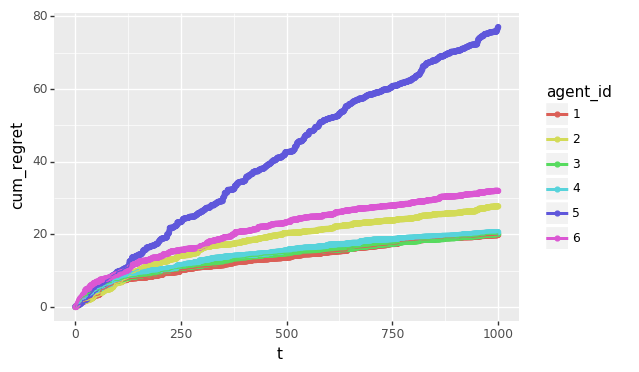

<ggplot: (8735728426957)>


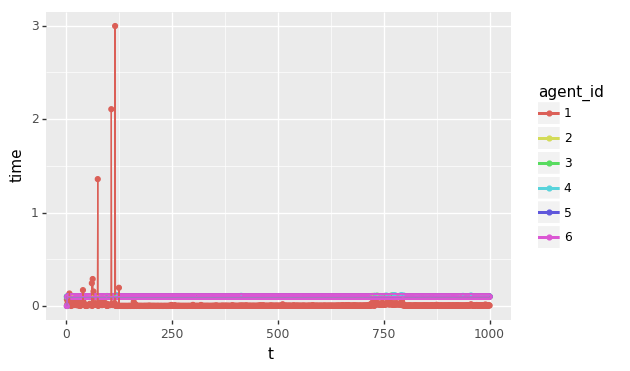

<ggplot: (8735813270589)>
theta [ 1.6680683   0.92586182  1.05799677 -0.92033901  1.29974847  0.33118301
 -0.50984497 -0.90309892 -0.13001637 -2.23820349  0.97316488 -0.02418481
 -0.48492775 -1.10926436 -0.55897476  1.04238657 -1.71226271  0.13611989
 -0.46444399  0.05097984  1.44789871]
Experiment: Step 0
 Laplace sample: array([-2.72160753,  1.37059106,  2.01082038, -0.17588661, -0.973576  ,
       -0.2699372 ,  0.61225732,  0.58209737, -1.7763594 ,  0.10026147,
       -0.23589102,  1.32743854, -0.94263666,  0.43900811, -0.83091759,
       -0.6877473 , -0.25163259,  0.70448501,  1.00072106, -1.36173769,
       -1.43776764])
 Sample: array([ 0.19746422, -0.95323252,  0.83502793, -0.82661865,  1.44618193,
       -2.38737656, -0.12762214, -0.05057041, -0.3270726 ,  0.06622287,
        1.40160494, -0.69459222, -0.20424483, -0.43089723, -1.14140393,
        1.26928878,  0.99724722, -0.27571784,  0.08034017,  1.36036253,
       -0.92747278])
 Sample: array([-0.5668289 ,  0.36479843,  0.753

 Steps taken: 364
 Sample: array([ 2.63273737, -1.52224996,  0.09177964, -0.00845479, -0.64793877,
        0.34078272, -0.19414977,  0.06618937, -0.71506802,  0.34735864,
        0.12155229, -1.87022657,  0.90581649,  0.23331115,  0.71017403,
        1.77802396, -0.68439571, -0.47897573, -2.04887852,  1.11784218,
        1.37425316])
 Sample: array([ 0.05203984,  1.1831124 , -0.36320958, -0.45965554,  0.27167528,
       -0.31346787, -0.75234756,  1.52899781,  0.21198002, -0.79566302,
        0.80876306,  1.0014012 , -0.39006488, -1.34410427, -0.08775715,
        1.03845032,  2.32854379, -0.54431571, -1.20992311,  0.2429402 ,
       -0.99349889])
 Steps taken: 1317
 Sample: array([ 0.96105087,  0.36716668, -0.28684049,  0.62425746, -0.46414128,
        0.49659803, -0.14121913, -0.70233482, -0.23543704, -0.59374712,
       -0.67327114,  0.08152181,  0.22974783,  0.3698349 ,  0.32563951,
        0.24339569,  0.18917733,  0.0871213 ,  0.56440499, -0.72359964,
        0.02748561])
 Accept p

 Steps taken: 356
 Sample: array([ 1.22055288, -0.14272324, -1.92117022,  0.34138216, -0.91199385,
       -0.58111676,  0.27680995,  0.92947821, -0.18942618,  0.57846947,
        1.08899969, -0.04780983,  0.38141762,  0.36504221,  0.51803968,
       -0.97048201, -0.0987275 ,  0.26399505, -0.5388112 ,  2.61720652,
       -1.40552172])
 Sample: array([ 0.37172462,  2.15780861,  1.0512997 ,  1.64151203,  1.2441039 ,
       -0.65205294,  1.01445027, -0.39487124,  0.18008849,  1.22320329,
        0.42885195, -0.16416695, -2.00504521, -0.30345394,  0.07761258,
        0.95671139, -0.36746985, -1.51080973, -0.18159897,  0.62653625,
        1.30610875])
 Steps taken: 1283
 Sample: array([ 0.70547928, -0.68204939, -0.51229607,  0.15066888,  1.05318531,
       -0.21881346,  0.68244496,  0.23304164, -1.22048218,  0.32170906,
        0.93282719,  0.68870586, -0.0788185 ,  0.72519207,  0.35717357,
       -1.67486337,  1.07967299,  0.04535795,  0.57727081,  1.07575081,
        0.39710504])
 Accept p

 Steps taken: 345
 Sample: array([ 1.69136424,  0.31419645, -0.17294643, -0.31430371, -0.61718474,
       -1.12020543,  0.50934906,  1.26287021,  1.20168198, -0.3181696 ,
       -0.66228737,  0.01242813, -1.18419905, -1.99404146, -0.05328896,
       -1.84321411, -0.93779464,  0.17492092, -0.8355141 , -0.44251413,
        0.70947167])
 Sample: array([-0.62752736,  2.58715006, -0.58604118,  1.14874455,  0.61050007,
       -1.94368446, -0.34136351, -1.67902056,  0.24259894, -0.15598653,
       -0.60880096,  0.96126695,  0.0844288 ,  0.10111635, -1.05009981,
        1.72464461, -0.11876324,  0.83466257,  0.89549645,  1.2337136 ,
        0.74696167])
 Steps taken: 1282
 Sample: array([ 0.59244828, -0.09846899, -0.5090664 ,  0.17609714,  0.7365177 ,
       -0.44645651,  0.11908885, -0.34909511, -0.3882506 ,  0.23981146,
       -0.06099568, -0.58258981, -0.2333771 , -0.10550495, -0.07659514,
        0.20780637,  0.31262568, -0.35957652,  0.07156945, -0.96829513,
        0.20320322])
 Accept p

 Steps taken: 345
 Sample: array([ 1.63493642,  1.14238212, -0.14095966,  0.64284553, -1.24276108,
        0.04969684,  1.36096378, -0.71440709,  0.91571832, -2.47888136,
       -1.37009435,  0.15530605, -1.30419635, -0.80986933, -0.4157638 ,
       -0.75579595,  1.1247477 , -2.01244775,  0.72281868,  0.23996625,
        1.00224345])
 Sample: array([ 1.28810774,  3.02480581,  1.35780902,  0.71577527, -1.99710696,
       -1.35546247, -2.49543679,  0.1622468 ,  0.34442449, -0.69857848,
       -0.15409038, -1.85702081,  1.59081116, -0.31371697,  0.25691499,
        1.29538042, -0.23844844, -1.67452593, -1.30058668, -1.97420604,
       -0.74902897])
 Steps taken: 1271
 Sample: array([ 0.42029159, -0.88477651, -0.36848997, -0.0519707 ,  1.11470649,
        0.23582604,  0.02608655,  0.22246768, -1.24152919, -0.35210247,
       -0.19029803,  0.52243127,  1.33460269, -0.75836001, -0.10827427,
       -0.48207464, -0.36384972, -0.03577457,  0.57841178, -0.62068716,
        0.73224796])
 Accept p

 Steps taken: 353
 Sample: array([ 1.33141919, -1.41487395, -0.53428149, -0.38935361,  1.39173372,
       -2.39399584,  2.78238547, -0.84676479,  1.59046003, -0.42436004,
       -1.93169292, -0.01742966, -0.24400785, -0.5176754 , -1.63253625,
        0.51342745, -0.83535693,  1.27388775, -0.30214375,  2.11493097,
       -0.13056498])
 Sample: array([ 0.30814361,  1.58876372, -0.39245602,  0.62845909, -1.01719165,
       -0.53278127, -1.45900476,  0.69251875, -0.05395447,  0.22186769,
       -1.00897149, -0.81512258, -1.08179756,  0.84595877, -0.07848299,
       -0.04778637, -0.05935507,  0.29845586,  0.77349669, -0.76454298,
        0.33550987])
 Steps taken: 1227
 Sample: array([ 0.61915422,  0.04720609, -0.44320716, -0.21937302,  0.76313753,
       -0.40978479,  0.25621679,  0.09002742, -1.12712612, -0.45265706,
        0.41112627,  0.91903423,  1.19444848, -0.26269389,  0.06159553,
       -0.38940198, -0.43007916, -0.00716779,  0.35447768, -0.36284738,
       -0.77474559])
 Accept p

 Steps taken: 329
 Sample: array([ 1.94679286,  0.19571757, -0.85600488, -0.04265968,  0.963061  ,
        0.15541997,  0.9857412 , -2.02217702,  1.25540252, -1.8602919 ,
        0.11532856,  0.77381029, -0.04389294, -0.13267844, -0.48025358,
       -0.14727845,  0.07267386, -0.96671061,  0.92233699,  1.35076222,
        1.17213984])
 Sample: array([ 0.68536664,  0.57811929, -0.64829783,  1.00447579,  1.56517751,
       -0.30199484, -0.80480341,  0.72187654, -0.64508986,  0.46063845,
        1.05801047,  0.69970036, -0.13809688,  1.4760877 , -1.22994054,
        2.02661818,  0.57782137,  0.86492634, -2.77623728, -0.69355282,
       -0.02228672])
 Steps taken: 1192
 Sample: array([ 1.09790473, -0.68145406,  0.49852953, -0.03513968,  0.18880468,
        0.01820681, -0.88291505, -0.5049018 , -0.8855987 , -0.64871447,
        1.02765919,  0.5591347 ,  0.56775889, -0.26284035,  0.18366904,
        0.37916758,  0.76421192, -0.95257852,  0.10837739, -0.43838299,
        0.04987031])
 Accept p

 Sample: array([ 0.63610107,  1.08679602,  0.53118218,  1.08353704,  0.03225638,
       -0.70502286, -1.57204085, -1.46963937,  0.15275446, -0.22140164,
       -1.07427675, -0.29395965,  0.14218224,  1.04745831,  0.12748131,
        0.60760654, -0.49876429,  0.82573707, -0.01422322, -0.973517  ,
        0.66794532])
 Steps taken: 1157
 Sample: array([ 0.78296223,  0.90629104,  0.11359703, -1.39588702,  0.47715214,
       -0.59867372, -0.36600127, -1.26081675,  0.102458  , -0.99198905,
        0.11147881,  0.42592944, -0.09503418, -1.30480145,  0.35840014,
       -0.27798208, -0.14574417, -0.18253204,  1.08910523,  0.63685549,
        0.05657321])
 Accept proportion: 0.425000
 Steps taken: 440
 Sample: array([ 0.22452393, -0.94066908, -0.5216163 ,  0.12477331,  1.21626076,
       -1.60504462, -0.96884194,  0.64517271, -1.15464368, -2.08323025,
       -1.28406865, -1.60673518, -0.09665161, -0.40081614,  2.18481052,
       -0.44084167, -0.8852281 , -0.80911233, -0.07404501,  1.23754568,
 

 Sample: array([ 0.95263076,  0.5335478 , -0.59367439, -0.18273514, -1.40245957,
       -0.74039606, -0.61338858,  1.30996193,  0.52438002, -1.13865131,
       -0.32725204, -0.25792411,  0.47221339,  0.53786576,  0.0845328 ,
        0.2050637 , -1.00382202, -1.02633222,  0.4033182 ,  1.41342263,
        0.24042862])
 Steps taken: 1133
 Sample: array([ 1.0935281 , -0.11322295, -0.47056358, -0.59958036,  0.90803559,
       -1.11813452, -0.52271242,  0.12406552, -0.13660489, -0.03237024,
        0.664634  ,  0.03888973,  1.55287135, -1.2543665 ,  0.56257432,
       -0.29325224, -0.75075297, -1.42413921,  0.00293934,  0.24451986,
        0.66764254])
 Accept proportion: 0.410926
 Steps taken: 421
 Sample: array([ 2.13275298,  0.88471387,  1.80756796, -0.13774375,  0.55990793,
       -0.35607441,  0.40534671,  0.74927112, -0.00790001, -1.1091798 ,
       -0.31751003,  0.35278238, -0.28531382, -0.39851612,  1.70980603,
       -1.16066999, -1.91347096,  1.58390387, -0.19179476, -1.5202873 ,
 

 Sample: array([ 0.46002033,  1.45089295,  0.26158183,  0.08043941, -0.37803586,
       -2.17091596, -0.20468984, -0.1168535 , -0.60081639, -0.60750554,
        1.35160174,  0.35378525,  1.37028433, -0.05202841, -0.11173634,
       -1.02412855, -0.10401161,  0.20920208, -0.43947958,  0.44288499,
        0.27900096])
 Steps taken: 1109
 Sample: array([ 1.15548923, -0.27073928, -0.26118163, -1.54906013,  0.75907949,
       -0.54308793, -0.56793468, -0.41639384, -0.15334719, -1.05222195,
       -0.01632949,  0.59834426, -0.22225618, -0.28690871, -0.51583712,
        0.03471377, -0.51776009, -1.29089418, -0.13917631,  0.58122854,
        0.33427516])
 Accept proportion: 0.418052
 Steps taken: 421
 Sample: array([ 1.26711598, -0.7786874 , -0.03808749,  1.08557007,  1.14939289,
       -2.04522233, -0.19922796,  0.43214316,  0.63465188, -0.27153388,
       -0.81153545, -0.36404151, -0.48674374, -0.07516634, -0.28567872,
        0.33945339, -2.54913313,  0.76662762, -0.40801778, -1.36021432,
 

 Sample: array([ 0.29048671,  0.71187427,  0.06525326,  1.1746584 , -0.66588973,
        0.66842045, -1.60165155, -1.37602679,  1.03174067,  0.33005771,
        0.41816926,  0.37340462, -0.02888497,  0.75541285, -0.77414256,
        0.31030937, -0.25011583,  0.23708058,  1.4005827 ,  0.40335849,
        0.85779994])
 Steps taken: 642
 Sample: array([ 1.05113477, -0.01485193, -0.26238183, -2.03640793,  1.70416476,
       -0.18902045, -0.0944055 , -1.12235255, -1.1361076 , -0.73525033,
        0.19907181,  0.34638315,  1.39554883, -1.72677433,  1.12836591,
       -0.11898048,  0.31305507, -0.31553199, -0.10388574,  0.61312496,
       -0.30869829])
 Accept proportion: 0.394928
 Steps taken: 276
 Sample: array([ 0.59357385,  0.78148468,  0.99683175,  0.73983599,  0.35939936,
       -0.33641851, -2.17041122, -0.22556701, -0.22005188, -1.66519477,
        1.12610629, -0.72951118,  0.05727276, -1.1744053 , -0.36936267,
        0.46739593, -2.51198175, -0.03111098,  0.06520861,  0.97034345,
  

 Sample: array([ 0.90443508,  0.27762395,  0.44606623, -1.30427227,  1.39840914,
        0.02222069, -0.49371109, -0.74236449, -0.23747436, -0.99770716,
        1.40313453, -0.29037514,  0.617956  , -1.92340951,  0.32749983,
       -0.66055685, -0.09073223, -0.05190365, -0.06763779, -0.15527804,
        1.33930636])
 Accept proportion: 0.409266
 Steps taken: 259
 Sample: array([ 1.57437657,  0.4212229 ,  0.93306971,  0.26401277,  0.58184045,
       -2.07547981, -0.5298702 ,  0.62857934, -1.14397748, -1.09271363,
        1.77542649, -2.30964513, -1.03500103, -0.96985633,  1.77045584,
        0.45773932, -1.91934624,  0.80388178,  0.23180398,  0.41576466,
       -0.14068121])
 Steps taken: 682
 Sample: array([ 2.02082824,  1.07219611,  0.54515066, -0.32558648,  0.57243045,
        0.20898316,  0.26685448,  0.01976967,  1.07768994,  0.60653996,
        0.46710336, -1.09867596,  0.96222748, -1.9786133 , -0.83133388,
        0.18843791, -0.91033079, -0.57167433,  0.17023714, -0.57102473,
  

 Sample: array([ 1.0373401 ,  0.48520123,  0.00604022, -1.03580385,  0.62391739,
        0.25912767, -0.69243803, -0.88100801, -0.34476646, -0.5070722 ,
        0.21634615,  0.45005712,  0.25763557, -1.38510707,  0.54755896,
       -0.04550481, -0.22306175, -0.27309516,  0.07571869,  1.07882676,
        0.52779012])
 Accept proportion: 0.448669
 Steps taken: 263
 Sample: array([ 0.67548138, -0.03216206, -0.0770979 ,  0.41521523,  0.88847735,
       -0.51799499,  0.0860762 ,  1.1118892 , -1.01455771,  0.7380294 ,
        0.40357816,  0.07757978, -0.24113037, -1.02956887, -0.06087713,
       -0.44149139, -0.55867258, -0.65720449, -0.63826089,  1.18809222,
        0.10685427])
 Steps taken: 707
 Sample: array([ 1.72293648,  1.02461809,  2.29305574, -0.5474775 , -1.25383266,
       -0.00802665,  0.57221781, -0.29698887,  1.18235743, -1.98819409,
       -0.31627641,  0.34592511,  1.10690495, -1.4352055 ,  0.10867283,
       -0.33712236, -0.53694793, -0.11761387, -1.31186738, -1.09228861,
  

 Sample: array([ 1.04512999,  0.71351759,  0.61532261, -1.58239427,  1.2856676 ,
        0.52362616,  0.09341764, -1.56392817, -0.44137836, -0.16483946,
        1.08991314, -0.60335576,  0.45050282, -1.95964952,  0.96171805,
       -1.44684905, -0.42481733, -0.49676975, -0.37366924,  0.5377438 ,
        1.2926082 ])
 Accept proportion: 0.443580
 Steps taken: 257
 Sample: array([ 1.26759287,  0.32931036,  0.90823376, -0.82619775, -0.17095641,
       -0.4443695 ,  0.21500668, -0.22683604,  0.42509956, -0.63325357,
        1.28560538, -0.28734619, -0.98663531, -1.31207621,  0.76431149,
        0.40473357,  0.49822072, -0.34569066, -0.58822566,  0.27771053,
        2.18605118])
 Steps taken: 714
 Sample: array([ 0.79289059,  1.15192958,  0.0185209 , -0.01020678,  0.28501892,
       -0.18230813, -0.3994188 ,  0.24783172,  0.48998879, -0.11280054,
       -0.5909676 , -1.12694631, -0.16401779, -0.65973202, -0.41316613,
        0.53583637,  0.23852904, -0.15462593, -0.0222393 , -1.2257216 ,
  

 Sample: array([ 2.11468403e+00,  6.81046838e-01, -1.91271663e-01, -5.79992762e-01,
        1.71278647e+00, -2.98768787e-01, -1.84192908e+00,  9.98802888e-02,
       -1.25126196e+00, -3.14638479e-01,  1.64850152e+00, -1.16078461e+00,
       -2.47481751e-01, -5.07797331e-04,  9.34941711e-01, -4.04792607e-01,
       -7.93630866e-02, -1.70382255e+00, -1.34413027e+00,  5.82307099e-01,
        9.95213965e-01])
 Steps taken: 727
 Sample: array([ 6.30741951e-01, -8.12661967e-01,  1.71634870e-01, -5.95870810e-01,
        1.41837206e+00, -7.85988401e-01,  1.19737399e-03, -8.59612566e-01,
        2.39232530e+00, -3.01039836e-01, -1.07821343e+00, -2.57633513e-01,
        7.39511643e-01, -7.49964330e-01, -6.89099153e-02, -1.42480401e-01,
       -2.26581455e+00, -4.00485996e-01,  4.35036679e-01,  2.60588925e-01,
        1.89934855e+00])
 Steps taken: 575
Experiment: Step 57
 Laplace sample: array([-30.39598807,  68.98946065, -45.68214654, -26.9733562 ,
        46.68685989, -11.11692833, -36.4294413

 Sample: array([ 0.20421337, -0.89895972,  0.54026075, -0.22270427,  2.2168117 ,
       -1.20892856,  0.56925916, -0.42485522, -0.01376535, -1.16391455,
       -0.07357535,  0.3972199 ,  1.53249028,  0.77622227,  1.39988012,
       -0.48386426, -1.32509548,  0.28510572,  0.33873128,  0.41742107,
        1.14950922])
 Steps taken: 695
 Sample: array([ 1.21796831,  0.38969863,  1.01479573, -0.08735446, -0.28367958,
        0.48369566, -1.04399856, -0.52373268,  0.72379211, -1.34387509,
        0.2222977 ,  0.14189115, -0.26933488, -1.16737393,  0.72718176,
       -0.65538971, -0.83793348,  0.10164408, -1.18874307, -0.18280431,
        2.11007255])
 Steps taken: 550
Experiment: Step 61
 Laplace sample: array([-31.41785381,  70.32210483, -45.356821  , -27.42410048,
        45.98646757,  -9.85894644, -36.31390091, -72.04571655,
       -29.15307791,  -2.78771645,  22.34103405, -61.48442386,
       -37.8589837 , -72.41363868, -19.24688105, -23.36588339,
        -4.03343139, -61.98237651,  32.

 Sample: array([ 1.72889411e+00,  4.11754311e-02, -2.28652093e-01, -3.57839179e-02,
        6.67603857e-01,  4.83547188e-02,  2.48080269e-01, -1.75300656e+00,
        1.79823585e-01, -1.21410207e+00,  1.24237039e-01,  1.53884973e+00,
       -1.15725281e-03, -1.61221955e+00, -5.33015978e-01,  2.59389835e-01,
       -1.27290941e+00, -4.86217332e-01, -1.25568875e+00, -1.82899014e-01,
        3.54595392e+00])
 Steps taken: 284
Experiment: Step 65
 Laplace sample: array([-41.71514817,  99.88186985, -51.08795412, -43.86764981,
        74.21403762,  -7.8556801 , -23.3919712 , -81.16245159,
       -39.12576981,   1.12755353,  18.70137023, -78.70581936,
       -41.33158304, -86.60815594, -12.95290829, -18.42002767,
         7.8715078 , -68.86623271,  28.49348686,  12.12101873,
       -28.88728556])
 Steps taken: 127
 Sample: array([ 1.62832775,  0.62952411,  0.7675657 ,  1.1580178 ,  2.41026184,
       -1.11396232, -0.86328583, -0.51537196,  0.49463698, -1.0528408 ,
       -0.60527677,  0.35318

 Sample: array([ 2.0851346 ,  0.69170869,  0.77401041,  0.50261463, -0.5333426 ,
       -0.89744003,  0.20050443, -1.73078251,  0.71445798, -1.33937546,
        0.124804  ,  0.01194478,  1.04937005, -1.02150561,  1.0230589 ,
       -0.13967068, -1.08117334, -0.97174212, -1.02576933, -1.50577567,
        1.8348788 ])
 Steps taken: 538
Experiment: Step 69
 Laplace sample: array([-42.98360517,  99.71111764, -51.72831694, -43.73028859,
        74.75923777,  -4.51291554, -23.65692952, -80.6931847 ,
       -38.4758479 ,   3.27082544,  17.56251505, -79.04039007,
       -42.62160464, -83.69391233, -12.6646317 , -17.90020361,
         8.30287958, -70.89853613,  28.7934151 ,  12.25437626,
       -30.52678631])
 Steps taken: 151
 Sample: array([ 1.08258125, -0.58206991,  0.63900973, -0.24838661,  0.37343957,
       -1.19873408,  0.47963908, -1.16003191, -0.87214024, -2.34887377,
        0.32391722,  1.98486592,  1.25070621, -1.17925718, -0.00715826,
        2.16912156,  0.11067442, -0.86344279, -

 Sample: array([ 1.00219213,  1.25281786,  1.2738327 , -0.23354206,  1.03974516,
       -0.44659915, -1.50304663, -0.14519742,  0.93083182, -1.45852757,
        0.57646945, -0.37213218,  0.53400209, -1.26940709,  0.66457712,
       -1.00170178, -0.28852661, -1.17576647, -1.39915354, -0.79873124,
        1.33361702])
 Steps taken: 533
Experiment: Step 73
 Laplace sample: array([-42.57299322, 100.18795619, -52.31105624, -44.18545671,
        75.63177539,  -7.32856639, -22.3337241 , -82.17574026,
       -38.86686091,   3.52988478,  16.88223286, -80.32564041,
       -42.9362373 , -83.8388992 , -14.33872998, -17.6234125 ,
         6.33791388, -69.24958409,  29.55631678,  13.22066942,
       -29.99769257])
 Steps taken: 99
 Sample: array([ 0.67001605, -1.00248122, -0.09896822,  0.03677051,  0.00978856,
       -0.66424838,  0.2701747 , -2.11103277,  0.94904808, -1.5611877 ,
        0.84232668,  1.12125212, -0.25910259, -0.79163904, -1.39766903,
       -0.34527683, -1.51020121, -0.26807357, -0

 Sample: array([ 0.99476667, -0.03730557,  1.24332641,  0.97464669, -0.62204153,
       -0.06368226, -0.02869806, -1.03057614,  1.42631449, -1.55252558,
        0.20798798, -0.32100954, -0.57028747, -1.7469116 ,  0.38833718,
       -1.31972   , -0.49444561, -0.44572246,  0.09642232, -0.13387198,
        1.06797867])
 Steps taken: 558
Experiment: Step 77
 Laplace sample: array([ -57.35971436,  137.14659719,  -57.46322692,  -50.40106399,
         86.67666479,  -12.26338914,  -35.80871676,  -94.01301286,
        -45.72861974,    0.25973869,   16.72740978, -113.93623719,
        -41.37005568, -115.05031545,   -1.91323888,  -41.34908936,
         -0.911656  ,  -86.82273743,   37.9990741 ,    5.12897751,
        -36.60753552])
 Steps taken: 106
 Sample: array([ 1.4527839 ,  0.58574377,  1.54756845, -0.154933  ,  0.65780951,
       -1.29226046,  0.14428929, -1.4702327 ,  0.87856872, -1.37441624,
        0.76857088,  1.07648598,  1.2084842 , -0.31073641, -1.01530733,
       -1.41774558, -0.585

 Sample: array([ 1.33334433,  0.30603437,  1.62657969, -0.86769959,  0.24093289,
       -0.46833644,  0.18435851, -0.95587994,  1.2184983 , -0.76193242,
       -0.99126328, -0.13823541, -0.51234062, -1.09632911, -0.29456205,
       -0.36403182, -1.29777647, -0.59300352, -1.44872731,  0.49772836,
        2.71847612])
 Steps taken: 560
Experiment: Step 81
 Laplace sample: array([-3.04150396, 10.46583387, -2.66630862, -5.28908279,  8.98973122,
       -0.14935056, -2.52490189, -9.18257637, -3.78186837, -0.79168098,
        3.33497927, -7.56222771, -0.13479231, -7.78781751, -1.83079823,
       -2.55478749, -2.9421673 , -5.95339662,  3.11255477, -0.53967431,
        0.52670229])
 Steps taken: 114
 Sample: array([ 1.24460862, -0.70184208,  0.32363186,  1.81057122,  0.10891482,
       -0.8628387 ,  0.53235158, -1.03301888, -0.58055304, -1.66232683,
        1.82310516,  0.9599875 ,  2.16881656, -1.58135954, -1.85331348,
        1.24046789, -2.51225894, -0.4619238 ,  0.10099961,  0.33921723,
   

 Sample: array([ 0.94305396,  0.4406848 ,  1.05302214, -0.31806462,  1.17835159,
       -0.00436392, -0.13275022, -1.0215154 ,  0.70802377, -1.01836876,
       -0.16877625,  1.0173368 ,  0.22575964, -1.22303174,  0.61864926,
       -0.26425311, -1.16592232,  1.25646489,  0.55115872, -1.27149028,
        3.06896063])
 Steps taken: 553
Experiment: Step 85
 Laplace sample: array([-2.25778874, 10.65080042, -2.30802711, -5.66015816,  7.66641018,
       -0.36993692, -2.29779056, -8.80791861, -3.70800337, -4.22788821,
        4.09559223, -7.5177491 , -0.48809798, -7.23193856, -1.56512007,
       -2.52031788, -4.87912276, -5.43609153,  5.48276347, -1.30020139,
        0.79643129])
 Steps taken: 101
 Sample: array([ 1.28757019, -0.01818192, -0.38821932,  0.02234066,  1.07262915,
       -0.07288004,  0.07783883, -0.47931911, -0.92530421, -1.60654637,
        1.60410579, -0.04597577,  2.08164333, -1.10848707, -0.68918902,
        1.28859802, -1.67502281, -0.5159795 , -0.44996774,  1.01290392,
   

 Steps taken: 139
 Sample: array([ 1.61698693, -0.97662355,  0.51704276, -0.13244332,  1.03322849,
       -1.23333923, -0.77280595, -1.06580611,  0.31802022, -1.67847093,
        1.02943209, -0.77726884,  1.56385743, -1.54873141, -2.07459356,
       -0.41398345, -0.25627902, -0.42533997, -1.21748635,  1.45339354,
       -0.60386139])
 Sample: array([ 0.69117255,  0.16939517,  1.88225401, -0.99064573,  1.53253117,
       -0.53103672,  1.08519301,  0.51341567, -0.53717941, -0.49342668,
        0.42951908,  0.05378793, -0.51074509, -0.52834439, -0.91600077,
        0.8239    , -0.41338023, -1.66502326, -0.38811502, -0.14172396,
        1.7479722 ])
 Steps taken: 525
 Sample: array([ 1.15788083,  0.52912538,  0.07104302, -0.43023084,  1.66344951,
       -0.25310221, -0.78370575, -0.51917215, -0.12712163, -1.38608526,
        0.62131807,  0.81323813, -0.05101656, -1.46733385,  0.12515921,
       -0.42988235, -0.90948766, -0.40415684,  0.68241874,  0.80508663,
       -0.47192767])
 Accept pr

 Steps taken: 104
 Sample: array([ 1.55961855, -1.2256586 , -0.20543277, -1.19677665, -0.20032164,
       -1.65179662,  1.06268533, -1.53496637, -0.35911596, -0.5866654 ,
        0.88590462,  0.02511305,  2.93851459, -1.02107129, -3.02583764,
       -0.48091096, -0.84606916, -0.62397244,  0.71823742,  2.1815005 ,
       -0.60217347])
 Sample: array([ 0.93168179,  0.75370182,  0.59165527, -0.01725887, -0.1244166 ,
        0.0148305 , -1.42847639, -1.27533089,  1.02971864, -0.24180979,
        0.80751027,  0.31282564, -1.18898485,  0.49289685, -1.30705312,
        1.5078793 , -0.56367001, -1.27510113, -1.12886738, -0.80644827,
        2.4330995 ])
 Steps taken: 496
 Sample: array([ 1.10345289,  0.88815932,  0.08822512, -1.71324978,  1.19018544,
       -0.366257  , -0.70048449, -0.83820249,  0.137164  , -1.62919242,
        0.38817503, -0.33446929,  0.27618882, -1.35381412,  0.19779846,
        0.2173306 ,  0.01152114, -0.69217083, -0.05178984,  0.44921809,
        0.29991032])
 Accept pr

 Steps taken: 80
 Sample: array([ 1.58772586,  0.80516661, -0.21773796,  0.3776516 ,  1.18707738,
       -1.51266273,  1.04647199, -1.69666969, -0.96263834, -0.8960664 ,
        1.4545737 ,  0.25665727,  1.16350395, -1.52637904, -0.32616344,
        0.62051182, -0.02391619, -0.77370285, -0.79869892,  0.36916797,
        0.30773532])
 Sample: array([ 0.958046  ,  1.45720321,  2.23088931,  0.00657593,  0.7363953 ,
       -1.15787109,  0.11640525,  1.25704015,  0.86046894, -2.51379181,
        0.42176466, -0.38691071,  0.00820188, -0.96291027, -1.1951491 ,
        0.61021511, -0.51728319, -1.78606883, -0.72070096, -0.63540414,
        2.08032464])
 Steps taken: 471
 Sample: array([ 1.08026280e+00,  1.43433237e+00, -4.01466949e-01, -1.28369601e+00,
        1.36340616e+00,  8.31962103e-02,  4.86446790e-01, -5.51193019e-01,
       -6.17786652e-02, -1.05450972e+00,  1.06763883e+00,  4.43532409e-01,
        4.03313098e-02, -1.56494679e+00, -1.83769341e-01,  1.40045117e-03,
        3.92169587e-

 Steps taken: 106
 Sample: array([ 1.59702047, -0.04330756, -0.00786991, -0.16508927, -0.06936476,
       -0.03716586,  0.05796577, -0.62969143, -0.19341636, -3.09674256,
        0.56467613,  2.10903574, -0.46802897, -1.69533873, -0.73515816,
       -0.60049049, -1.52618801, -1.10772644,  0.51726523,  0.34911518,
       -0.55358767])
 Sample: array([ 1.03476605,  1.78457155,  1.13265819,  0.12930221,  0.17572516,
       -0.65731944, -0.63849637, -0.84214235,  1.11907226, -0.69606265,
        0.24109179, -0.68380173, -0.04690013, -0.69438367, -0.14732526,
        0.27260103, -1.17771585,  0.16594852, -1.41878024, -1.32182243,
        0.66333156])
 Steps taken: 472
 Sample: array([ 0.93569166,  0.6359751 , -0.0699082 , -1.35916799,  1.48381239,
        0.01085111, -0.60841266, -0.66772762, -0.41095241, -0.56297543,
       -0.09342876,  0.54469649,  0.25318786, -1.40969853,  0.73967632,
       -0.77274075, -0.04949199, -0.35669526,  0.37118288,  0.33212385,
       -0.37683384])
 Accept pr

 Steps taken: 96
 Sample: array([ 2.04466979, -1.13360789,  0.14289435,  0.79342351,  0.5250667 ,
       -0.44862511,  0.30567056, -0.8566905 , -1.05630794, -1.70693928,
        1.53863643,  0.4411081 ,  1.16139703, -1.40828969,  0.57153036,
        0.17835457,  0.0213941 ,  0.05786358, -0.75259616,  0.74620589,
        0.76555788])
 Sample: array([ 0.61441694,  0.49111837,  2.1544614 , -0.22281736, -0.12214795,
       -1.10990091,  0.07599558, -0.1009767 ,  0.23959333, -1.07675995,
        2.30595122,  0.02443062, -0.53708292, -1.03031919, -1.10540136,
        1.33232966, -1.04303134, -1.36942112, -0.65137361,  0.30367404,
        2.12909529])
 Steps taken: 405
 Sample: array([ 0.93454148,  0.41080939,  0.7110358 , -1.56419025,  0.93021754,
       -0.32302851,  0.01859029, -0.96344087, -0.48943204, -0.63833533,
        0.7425803 ,  0.42903991,  0.13844505, -1.06617846,  1.33400323,
       -0.05084736, -1.55702367, -0.81718423, -0.2781982 ,  0.10161079,
       -0.18335301])
 Accept pro

 Steps taken: 95
 Sample: array([ 1.52410545, -0.91362208, -0.04268908,  0.72077813,  0.36024017,
       -1.09245054,  1.06770397, -0.55738337,  0.60188608, -1.23178642,
        1.5751904 , -0.38650587, -0.71331893, -2.20109311, -1.25058221,
       -0.03599328, -0.52940902, -0.05873255, -0.57914222,  1.09803608,
        0.22582079])
 Sample: array([ 0.97294869,  0.88309856,  1.7088989 , -0.68909308,  1.23826056,
       -0.48440365, -0.96281244,  0.74572412,  1.6773329 , -0.58878864,
        0.31093488, -0.69300159, -0.42270162, -0.61137041, -1.6261707 ,
        1.35701849, -0.48220213, -1.59933387, -0.61961912,  0.42716934,
        1.50506387])
 Steps taken: 369
 Sample: array([ 0.92998176,  0.84993722,  0.72114037, -0.662903  ,  0.83311924,
        0.13978151,  0.24103898,  0.00271287, -0.09754397, -0.80340767,
        1.15813803,  0.22774472,  0.15345745, -1.1999129 ,  0.08823559,
        0.60692607, -0.52150819, -0.49730909,  0.04722975,  0.2933541 ,
        0.64011154])
 Accept pro

 Steps taken: 93
 Sample: array([ 1.21192181,  0.96722131,  0.06529285,  0.40313565,  1.16482471,
       -1.24346044,  0.16802078, -0.58615437, -0.46911039, -1.524787  ,
        0.49096133, -0.94853479,  0.61649945, -1.05946854, -0.71011479,
        0.93943021, -0.55118629, -0.83745272,  1.47076724,  1.21068658,
        0.16012273])
 Sample: array([ 0.70055153,  0.83007346,  2.43437831, -0.92771306,  0.07548302,
       -0.32662843,  0.05448387, -0.59408548,  1.3637275 , -2.33227837,
        0.95426412,  0.40307834,  0.50897586, -1.40105143, -0.69333562,
        1.34308588, -0.95634514, -3.02719154, -0.05765503, -0.34744942,
        2.0898719 ])
 Steps taken: 302
 Sample: array([ 1.41327778,  0.72974372, -0.35671153, -1.48732257,  1.16322182,
       -0.28686459, -0.09222026, -0.45177726,  0.20649928, -0.41394668,
        0.46618301,  0.36512849,  0.93272399, -1.70537596, -0.06826208,
       -0.77940679, -0.23135895,  0.02014274, -0.60936721,  1.01307422,
        0.15865113])
 Accept pro

 Steps taken: 132
 Sample: array([ 1.04416586,  0.35400204,  0.3183349 ,  1.40344857,  1.07071255,
       -1.887858  , -0.2389949 , -0.78363119,  0.32576501, -2.54398814,
        1.1415453 ,  0.11861693,  0.1001774 , -0.59713302, -1.59746735,
        0.72741465, -0.16131292, -0.87845183,  0.83768436,  0.80296725,
        1.26600075])
 Sample: array([ 1.75105449,  0.96082287,  0.62499061, -0.31182852,  1.06330706,
       -1.0711215 ,  0.01240894,  1.6504432 ,  0.20671594, -0.62763995,
        0.11835106, -0.35966474, -0.36049074, -0.69372078, -0.94843119,
        2.78778556, -0.75731442, -2.15639179, -0.22979225, -0.49945096,
       -1.23544284])
 Steps taken: 198
 Sample: array([ 1.0774092 ,  0.93908289,  0.49890009, -1.32418188,  1.35346826,
        0.13430495, -0.10965228, -0.3002784 ,  0.12680771, -0.02097201,
        1.00989244,  0.3864059 ,  0.11421882, -2.36294771,  0.09339123,
       -0.40847133, -0.53061152, -1.04868312, -0.07103985,  0.23555303,
       -0.48637715])
 Accept pr

 Steps taken: 95
 Sample: array([ 1.19302001,  0.15756741,  0.71886425,  0.30003898,  1.06842166,
       -1.67264493,  0.77071149,  0.17489292, -0.52002702, -1.87493863,
       -0.38023849,  0.11503474,  0.62897569, -0.53487169, -1.22774516,
       -0.11877032, -0.45152238,  0.11591076,  1.27248994, -0.29256287,
        0.14354067])
 Sample: array([ 1.53159544,  0.29836192,  1.12598922, -0.43009751, -0.2192085 ,
       -0.6781672 , -0.22443866,  0.0176131 ,  0.69790874, -0.86791926,
       -0.05570305,  0.75578707,  0.10003131, -1.02704318, -0.46221544,
        0.34006616, -0.27266404, -0.988203  , -1.39106562,  0.92612835,
        1.29318381])
 Steps taken: 199
 Sample: array([ 1.10011011,  0.42597142,  0.06349414, -1.51407293,  2.02860491,
        0.35230425, -0.80338653, -0.65097353, -0.5224037 , -1.72229164,
        0.99024892, -0.1806393 ,  0.02617912, -0.87120655,  0.40553019,
       -0.48811867, -0.58142696, -1.04231554,  0.06274477,  0.68643905,
        0.27917631])
 Accept pro

 Steps taken: 91
 Sample: array([ 1.09402599,  0.20193367,  0.33375895,  0.73043526,  0.77443447,
       -1.01809537, -0.91641084, -0.55214011,  0.51582361, -1.46637641,
        1.18006086,  0.80999863, -0.00185252, -0.6382958 , -1.243616  ,
        0.85354936, -1.51146534, -0.86454648, -1.77199922,  0.2610032 ,
        0.34177645])
 Sample: array([ 1.3087762 ,  0.27213727,  1.53255265, -0.29469166,  0.62841298,
        0.34201756, -0.29783739,  0.56391878, -0.44722889, -0.63001847,
        0.67602549, -1.18858503, -0.22528702, -0.40644854, -0.93313792,
        0.72580703, -1.50927442, -1.17025041,  0.84926057, -0.68864018,
        1.27629763])
 Steps taken: 204
 Sample: array([ 0.78702663,  1.09252566,  0.46809873, -0.86146115,  1.7298462 ,
        0.07939814,  0.16299129, -0.23986078,  0.17487443, -1.16329984,
        0.42588743,  0.76880109,  0.62476047, -1.40624589, -0.18029946,
        0.58041673, -0.55161078, -0.89844791,  0.70035787,  0.01241912,
        0.48841556])
 Accept pro

 Steps taken: 91
 Sample: array([ 1.38790231,  0.22758096, -0.41726516, -1.15759581,  0.43018101,
       -1.91361899,  0.16004801, -0.84452349, -0.66741969, -2.5411195 ,
        1.58782783,  0.59389166,  1.10993918, -0.06003092, -0.72082159,
        0.57748725, -0.46321991,  0.50362804,  0.45221011,  0.4731688 ,
        0.13839449])
 Sample: array([ 0.90197626,  0.7345354 ,  2.06078115, -0.03393069,  0.11047513,
       -1.55388996, -0.51572901,  0.1132216 ,  0.82271348, -1.3304582 ,
       -0.19357123, -1.07545041,  1.15196251, -1.66135843, -0.64276389,
        2.01987696, -2.2924819 , -1.71828022, -1.19248621, -0.26848145,
        1.66707275])
 Steps taken: 203
 Sample: array([ 0.82843021,  0.9767301 ,  0.53626187, -1.23432554,  1.43916873,
        0.14610552, -0.16909074, -0.09012459, -0.76104826, -1.7530722 ,
        1.20354054,  0.8846122 ,  0.06211546, -0.98787174, -0.1019183 ,
        0.41850736, -0.57284637, -0.78113671, -0.14194131, -0.11871788,
        0.21088893])
 Accept pro

 Steps taken: 89
 Sample: array([ 1.2812705 ,  1.18321273,  0.15592214, -0.11095178,  0.260375  ,
       -1.03130766,  0.7085475 , -0.63405719,  0.32880066, -2.41066993,
        0.7062975 ,  0.83921919,  0.49328086, -0.66544419, -1.86502857,
        0.6577161 , -0.61689804, -0.41389617, -0.3964466 ,  1.03290888,
        1.14444684])
 Sample: array([ 1.20326074, -0.16108112,  1.49091029,  0.23412056,  0.17686959,
       -0.36339842, -1.49016892,  0.14517085,  0.35936926, -1.63057129,
        0.54853939,  0.57887062, -0.51232129, -0.33179758, -1.52392948,
        0.79117415, -1.02981996, -0.54468905,  0.17357427, -0.67453099,
        1.31312627])
 Steps taken: 199
 Sample: array([ 0.97928088,  0.64430635,  0.21676377, -1.91672481,  1.15567532,
       -0.30099818, -0.58059244, -0.77316161, -0.45450147, -1.23881394,
        1.01563397,  0.72674058,  1.03828009, -1.69169404,  0.51192612,
        0.20115677, -1.0068508 , -0.71178972,  0.16283353,  0.3259429 ,
        0.23904117])
 Accept pro

 Steps taken: 88
 Sample: array([ 1.23276862, -0.07059869,  0.68566503,  0.91650505,  1.47908561,
       -0.74843048,  1.50963341,  0.5076959 , -0.51982399, -1.64393752,
        1.00731436, -0.53029683,  0.5706541 , -1.01432416, -0.82842914,
        0.97448357, -1.59549998,  0.96671861, -0.1478056 ,  0.23993486,
        0.13326907])
 Sample: array([ 1.114587  ,  0.99545893,  2.42428543,  0.25542261, -0.56816612,
        0.15324792, -0.23198158, -0.33877544, -0.25711792, -1.61919989,
       -0.19364041,  0.12901553,  0.2354405 , -0.99785674, -1.309462  ,
        0.58688557, -2.08945154, -1.44565888,  0.01672558,  0.1245372 ,
        1.20494269])
 Steps taken: 296
 Sample: array([ 0.84059339,  0.78123027,  0.62297506, -1.54752276,  0.63919777,
        0.24642197, -0.62157831, -1.06975019, -0.36999466, -1.28080358,
        0.10119581,  0.5776759 ,  0.2496905 , -2.10249554, -0.00993094,
        0.19996364, -0.50646712, -0.12521079,  0.35141585,  0.75225835,
        0.48993254])
 Accept pro

 Steps taken: 233
 Sample: array([ 1.3011061 , -0.33749101,  0.53746079, -0.09629325,  0.59506711,
       -1.55764772,  1.01824234,  0.04957278, -1.50177591, -0.80634518,
        0.05253883,  0.66617739,  1.8118473 , -1.0698278 , -2.08032486,
        1.64976151, -1.94845581, -0.48586636, -0.9957557 ,  2.18776956,
        1.96460627])
 Sample: array([ 0.69991729,  0.14931641,  0.7819227 , -0.75889   ,  0.13910829,
       -0.18989236, -0.87591482, -1.10989803, -0.08161718, -1.55965108,
        1.70624363,  0.33338378, -0.02159101, -1.11928346, -1.61648177,
        3.1846147 , -1.67655601, -1.11832264, -0.61044572,  1.132223  ,
        1.97765115])
 Steps taken: 214
 Sample: array([ 0.90063519,  0.56569156,  0.8417173 , -2.0964065 ,  0.91494529,
        0.35582524, -0.09901297,  0.1233742 ,  0.29643793, -0.81689623,
        0.01919826,  0.81829634,  0.02687488, -1.23945092,  0.52258407,
       -0.23108321, -0.61689303, -0.29113783,  1.00129808,  0.42877777,
        0.58839898])
 Accept pr

 Steps taken: 86
 Sample: array([ 1.2166384 , -0.05582948,  0.19447274, -0.35272644,  0.61764809,
       -1.67264174,  0.14760747,  0.00385883, -1.14736949, -1.6387647 ,
        1.36859228,  0.09758447,  0.58825067, -1.03260448,  0.48220643,
        0.7181893 , -1.84450483,  0.03696302, -1.83205388,  1.3760933 ,
       -0.37496703])
 Sample: array([ 0.8362668 ,  0.3899865 ,  1.75322099, -1.51693585,  0.76336333,
       -0.2370234 , -0.10784233, -0.64637853,  0.25198878, -0.68036825,
        0.42080998, -0.43828052, -0.13682563, -0.41807064, -1.42038433,
        0.970734  , -2.69705155, -1.09221799, -0.54765304, -0.19783853,
        2.27650257])
 Steps taken: 290
 Sample: array([ 1.23404789e+00,  1.08747700e+00,  2.06518086e-01, -2.01544198e+00,
        9.96287800e-01,  3.62014275e-01,  2.44772152e-01, -3.70235481e-01,
       -5.04796882e-01, -1.20957049e+00, -2.09641382e-02,  6.65861076e-01,
        5.99361357e-01, -1.24174660e+00,  7.73379687e-04,  2.34135733e-01,
       -3.45041228e-

 Steps taken: 127
 Sample: array([ 1.21108651,  0.1257989 , -0.25801334,  0.18889983,  1.31110673,
       -0.39659262, -0.91016365, -0.22829901, -0.14664097, -2.54713947,
        0.81154886,  0.98572703,  0.39707472, -0.10399667, -1.23945131,
        0.32787455, -1.69354276,  0.22307078,  0.12530447,  0.58962375,
       -0.12323802])
 Sample: array([ 1.08573787,  0.91469448,  1.56164341,  0.80587537, -0.19740051,
       -0.81192191, -0.23662199, -1.74917463,  0.98627626, -1.44053832,
        0.24148637, -0.20504926, -0.07651797, -1.47271429, -0.51212965,
        1.3355259 , -1.68563214, -1.06856058, -0.61085927,  0.31331296,
        1.36730612])
 Steps taken: 275
 Sample: array([ 0.96741866,  0.72815775, -0.07205894, -2.14024746,  0.15615839,
       -0.32610023, -0.33470744, -1.02999941, -0.87072354, -1.76949613,
        0.55796798,  0.21587918,  1.0409534 , -1.21380793, -0.02973778,
        0.06826966, -0.77198175, -1.40632698,  0.3678213 ,  0.68300417,
        0.39434819])
 Accept pr

 Steps taken: 72
 Sample: array([ 1.6905124 ,  0.67738121, -0.92290877, -0.34986212,  0.80246608,
       -1.14508847, -0.81051955, -1.52808709, -1.18345111, -1.71982557,
        1.07127956, -0.15144738,  0.95430022, -2.22796334, -1.04398691,
       -0.45472963, -1.2536541 , -0.61995902, -1.08768688,  0.43569916,
       -0.04711233])
 Sample: array([ 1.16458174e+00,  6.04897792e-01, -7.98794582e-03, -2.06188474e+00,
        1.54452669e+00, -1.65128297e-04, -9.63465689e-01, -5.46987197e-02,
       -5.05422401e-01, -1.50787612e+00, -4.46292566e-01, -2.06644642e-01,
       -6.60816747e-01, -2.06413760e-01, -2.03119853e+00,  2.47451127e+00,
       -1.10991288e+00, -8.46076018e-01, -8.16827081e-01,  3.35031032e-01,
        2.46070439e+00])
 Steps taken: 217
 Sample: array([ 1.07519342,  0.8868728 ,  0.02507607, -1.17200041,  1.05303706,
        0.51897247, -0.55077973, -1.14423719, -0.71970988, -0.47325483,
        0.12861805,  1.17622889, -0.23055485, -1.4243538 , -0.18190556,
       -0.403

 Steps taken: 239
 Sample: array([ 1.74241649,  0.68750896,  0.39785469, -0.34973468, -0.49543561,
        0.15776726, -0.0406274 , -0.3788781 , -0.30264673, -1.27819511,
       -0.07590194,  0.88865945,  1.65736937, -0.17135473, -1.67189573,
        0.47530679,  0.20611646, -0.79263179, -0.47614706,  0.834547  ,
        0.23869216])
 Sample: array([ 1.11703963, -0.67881187,  1.46698474, -0.45126725,  0.66602429,
       -0.3187875 , -1.59775407, -1.23370716,  0.89214652, -0.53934674,
        0.59470987, -0.34643953, -0.25439481, -1.26610515, -0.95821702,
        0.90839801, -2.7362415 , -0.98302566, -0.33483891,  0.47631325,
        1.80721486])
 Steps taken: 418
 Sample: array([ 1.16381116,  0.54395429,  0.01642333, -1.59331766,  0.77865049,
        0.47510968,  0.56613607, -0.63742924,  0.56707135, -1.52074931,
        0.42671978,  0.17309912,  0.2903425 , -1.67646793, -0.36980478,
        0.63647498, -0.40787374, -0.01317486, -0.30230463,  0.32254009,
        0.8237452 ])
 Accept pr

 Steps taken: 120
 Sample: array([ 1.20300343,  0.73835701, -0.5548861 ,  0.53853162,  0.47629767,
       -1.72790281,  0.5255701 , -0.21847335, -0.22106568, -2.02817792,
        0.23681592,  1.13579991,  1.64676863, -0.22718681, -0.93538331,
        0.96698481, -2.30410391,  0.61825377, -1.02021488,  1.379851  ,
        0.56379451])
 Sample: array([ 1.07910059,  1.02920796,  2.7536902 , -0.80597004,  1.22614363,
       -0.51757299,  1.00647199,  1.23879967, -0.16381031, -1.39925257,
       -0.70512516, -0.38399995,  0.19122272, -1.62667636, -1.00591028,
        0.90167888, -1.91269007, -0.57232532, -1.75231387,  1.05349363,
        1.97185594])
 Steps taken: 270
 Sample: array([ 0.9598447 ,  0.80565178,  0.26137352, -1.74747428,  0.90306882,
        0.76997307, -0.63049676, -0.90632205, -0.10506775, -1.29175115,
        0.29214981,  0.12631036,  0.3491918 , -1.33234284,  0.00215665,
        0.5308794 , -1.27284758, -0.81902594,  0.5791396 ,  0.51036465,
        0.49869196])
 Accept pr

 Steps taken: 125
 Sample: array([ 1.93413233, -0.11620337,  0.74045891, -1.03627225,  0.32417285,
       -0.75545613, -0.36150047,  0.08803345,  0.50533928,  0.37822323,
        0.5764024 ,  1.36583952, -0.19930191, -0.37073026, -1.12005745,
        0.48590169, -1.04557415, -0.20312113,  1.07249978,  0.63315726,
        0.49710042])
 Sample: array([ 0.85193622,  0.49738538,  1.89040143,  0.13359651,  0.5861697 ,
       -1.13478502, -0.54394194, -0.07154746,  0.38989651, -1.16376169,
        0.91779788,  0.15007949, -0.26443577, -0.62784355, -1.51038653,
        1.81521978, -2.05861583, -0.93689619, -0.61741388, -0.06702875,
        1.72632571])
 Steps taken: 184
 Sample: array([ 1.07579063,  0.97739316,  0.12620018, -2.04632986,  0.96924628,
        0.41205614, -0.13970559, -0.25687161,  0.4060312 , -1.32229871,
       -0.04852385,  0.63497041,  0.33846511, -1.5167924 ,  0.11440139,
        0.0173215 , -0.6080869 , -0.5048722 , -0.24667324,  0.04921052,
        0.34391529])
 Accept pr

 Steps taken: 244
 Sample: array([ 1.31167494,  0.23305439,  0.61926698, -0.16123641,  0.75591021,
       -1.07803754,  0.11859992, -2.3491591 , -1.1834502 , -0.97619733,
        1.35999828, -0.43620537,  0.47244154,  0.27677615, -1.02941081,
        1.44126142, -0.58105708, -0.48710459, -0.64552384,  0.89299832,
        2.05597547])
 Sample: array([ 1.07783109,  0.91678885,  0.73936184, -1.65448451,  0.93797945,
       -0.0828536 , -0.44942436, -0.18909011, -0.88009375, -1.44384062,
        0.4235283 , -0.2497606 , -0.63185013, -0.2507916 , -1.96659193,
        1.79776234, -1.49230504, -0.65666657, -0.13195292, -0.11588795,
        1.64368282])
 Steps taken: 556
 Sample: array([ 1.08080809,  0.52592525, -0.33946726, -1.53380702,  1.46430667,
       -0.06125963,  0.16951691, -0.53232204, -0.72034383, -0.5490651 ,
        0.72378577, -0.09551649, -0.04815896, -1.44112202, -0.06403542,
        0.41842479, -1.07926414,  0.11586467, -0.35723134,  0.56952273,
        0.35936995])
 Accept pr

 Steps taken: 239
 Sample: array([ 1.56757428e+00, -4.77720665e-02,  6.39813380e-01, -3.82187867e-01,
        9.18519998e-01, -1.12126107e+00, -1.85629845e+00, -1.43881111e+00,
        1.07221445e-01, -8.69533463e-01,  8.17949550e-01,  3.41002279e-01,
        9.94554853e-01, -1.51114920e-01, -5.43773667e-01, -5.11642015e-04,
       -1.70660250e+00, -6.50402151e-01, -5.67187652e-01,  3.88063752e-01,
       -3.91310707e-01])
 Sample: array([ 1.070518  ,  0.57101754,  1.82107361, -0.27029628,  0.80069125,
       -0.81864854, -0.47790543, -0.28326882, -0.14215322, -1.30652774,
        0.90441696, -0.77442499,  0.17233342, -0.94154685, -1.78446466,
        1.8754351 , -2.27412565,  0.30232354, -0.32335928, -0.35266186,
        1.12430992])
 Steps taken: 563
 Sample: array([ 0.89864634,  0.79475947,  0.68591179, -2.15464447,  1.50633894,
        0.01078512, -0.13651152, -0.33399058, -0.40934295, -1.21849312,
       -0.00801205,  0.79859922,  0.77422383, -2.09081541,  0.3116217 ,
       -0.35

 Steps taken: 239
 Sample: array([ 1.39751354, -0.36464943,  1.27333355, -1.10610934,  0.23864263,
       -1.50698076, -0.10508438, -1.75896688, -0.39366672, -0.97549517,
        1.24670889,  1.60428826,  0.99721184, -0.22060609, -1.19303588,
        1.40864722, -0.36861222, -0.97980427,  0.92705954,  1.06079281,
        1.69358976])
 Sample: array([ 0.92462954,  1.50789917,  1.63921103, -0.3629433 ,  0.47265779,
       -1.4086506 , -0.21937854,  0.09545063, -0.71490567, -0.51198618,
        1.14643156,  0.13615871, -0.47253425, -0.1788121 , -1.30470282,
        1.69343809, -2.686238  , -0.60784624, -1.15593257,  0.69151086,
        0.61811657])
 Steps taken: 556
 Sample: array([ 1.07771111,  0.69522535,  0.52285468, -1.74297451,  1.64812218,
        0.36115843,  0.18356248, -0.74326789,  0.08986541, -1.27159519,
        0.55914037,  0.64082598,  0.05895268, -1.9972041 ,  0.35177563,
        0.3625053 , -0.67828712, -0.13725634,  0.11127484,  0.16847707,
        0.70008286])
 Accept pr

 Steps taken: 240
 Sample: array([ 1.68858494,  1.33385598,  0.55649156, -0.20133029, -0.05546815,
       -0.52248333,  0.29337885, -0.9997152 , -0.47237821, -2.26885559,
        1.06844788, -0.11550401,  0.9745185 , -0.19888635, -1.11369314,
        0.36278267, -0.77505166,  0.10051611,  0.05028516,  0.84946783,
        0.67681933])
 Sample: array([ 1.34079585,  0.45232304,  1.53714512,  0.44512393,  1.29076943,
       -0.05542483,  0.15861197, -0.34579509,  0.74379429, -1.27153859,
        0.60260771,  0.6704443 , -0.58707442, -0.44360328,  0.23818434,
        0.90332752, -2.06860427, -1.12329117,  0.38170773, -0.27594965,
       -0.01079702])
 Steps taken: 554
 Sample: array([ 1.00472289,  0.37558716,  0.00667179, -1.81569675,  1.61114307,
       -0.18384578, -0.025085  , -0.52867544, -0.04274275, -0.75050348,
        0.23216198,  0.90773696,  0.49205581, -1.40642279, -0.01763395,
        0.62496615, -0.1885606 , -0.68574596, -0.1359399 ,  0.02702446,
        0.64413888])
 Accept pr

 Steps taken: 236
 Sample: array([ 1.23373502,  1.00488018,  0.72657125, -0.44454265,  0.55129107,
       -1.17820291, -0.6492146 , -0.21030081,  0.04515975, -2.89394495,
        0.28612408,  0.23821802,  0.65543276,  0.17626293, -1.2600774 ,
        0.55956833, -0.0226838 , -0.45749039, -0.28570023,  0.70069768,
        0.15175841])
 Sample: array([ 1.11916577,  1.03812209,  1.96420461, -1.49792236, -0.14174348,
       -0.4699068 , -0.67066439, -0.38538786,  0.41903807, -0.44933845,
        0.9121417 , -0.4013638 , -1.35262863, -0.61353644, -1.25524769,
        0.96071065, -1.67685611, -0.65485177, -0.07703367,  0.41901811,
        0.49422844])
 Steps taken: 549
 Sample: array([ 1.16638461,  0.64861044,  0.40915843, -1.80574142,  1.36233719,
        0.04448257, -0.18925972, -0.52271367, -0.32284643, -1.07890431,
       -0.19628755, -0.09735156, -0.36961834, -1.29374347, -0.02735348,
        0.48095142, -1.03210382, -0.61812098, -0.05983519,  0.05503752,
        0.80011742])
 Accept pr

 Steps taken: 236
 Sample: array([ 1.44945941e+00, -7.46078249e-01,  7.52989448e-01, -1.09918116e-01,
        1.11304591e+00, -1.02731724e+00, -2.25858945e-04, -1.73475332e+00,
       -1.26264087e-01, -1.31145416e+00,  4.49353847e-02, -5.90402680e-02,
       -4.15252479e-01, -5.43958576e-01, -1.02405130e-01,  3.31582036e-01,
       -1.53294917e+00, -5.97230789e-01, -1.43405847e-01, -6.80304777e-02,
        1.06068441e+00])
 Sample: array([ 0.79187281,  1.21999909,  1.52786442, -1.05674197, -0.19153123,
       -0.38772098, -0.67716938, -0.86423182,  0.73660781, -0.93930191,
        0.7150113 , -0.44221544, -0.99386402, -1.56578934, -0.82338208,
        2.68366144, -0.8812096 , -0.89312522,  0.80723617, -0.42157328,
        1.59433408])
 Steps taken: 540
 Sample: array([ 1.12652117,  1.01899591,  0.77796436, -2.44216946,  1.0566617 ,
       -0.2177654 , -0.12030847, -0.85383558, -0.32537588, -1.5895429 ,
        0.57160268,  0.81486003, -0.1675704 , -1.2804888 ,  0.87124922,
        0.29

 Steps taken: 234
 Sample: array([ 1.70002871, -0.74603598,  0.75911207,  0.64686745,  0.5588327 ,
       -0.56279818,  0.56091145, -0.50855144,  0.72464915, -1.84823479,
        0.99588649,  0.36990829,  0.33794217,  0.89005228,  0.4164802 ,
       -0.06203851, -0.60186756, -0.324415  ,  0.47111737,  0.77036083,
        1.25200998])
 Sample: array([ 0.90238454,  0.12342892,  1.55165682, -0.59739552,  0.33373126,
       -1.50411126, -0.24098831, -0.73013166,  0.23040492, -1.74794472,
        0.94248257, -0.76050839, -1.02088606, -0.65359303, -1.17366872,
        1.51410062, -1.31116438, -0.72797398, -0.42058745,  0.2986227 ,
        0.76157574])
 Steps taken: 540
 Sample: array([ 8.11773808e-01,  5.91277531e-01,  5.61686462e-01, -2.24988076e+00,
        8.60942278e-01,  1.78702061e-01, -3.64129845e-01, -7.77701300e-01,
       -5.43083233e-02, -1.39005644e+00,  7.85908925e-01, -1.94460264e-02,
        3.34867823e-01, -1.02261598e+00, -2.05738543e-01, -6.26457566e-02,
       -1.19018232e

 Steps taken: 242
 Sample: array([ 1.62969695,  0.01135172,  0.99270707, -0.24067908,  2.01924233,
       -0.71506901,  0.40217633, -0.12604793, -0.33064579, -0.47937039,
       -0.51944536, -0.3432372 ,  0.94153735, -0.62060119, -0.15199875,
        0.71826384, -2.65482804, -0.01291587, -1.36552139,  0.60334788,
        0.78419453])
 Sample: array([ 1.22654046,  0.58576486,  0.33250785, -1.53560474,  0.96780423,
       -0.16884645, -0.16459055, -1.23808002, -0.42887867, -1.86067441,
        0.81938815,  0.33155262, -0.19395565, -1.4962793 , -0.90181249,
        1.90722802, -2.40113619, -1.21583482, -0.5140069 ,  0.38496946,
        1.05418004])
 Steps taken: 543
 Sample: array([ 1.08844953,  0.26491356,  0.76531909, -1.58475394,  1.21683284,
       -0.44855737, -0.94080364, -0.2307373 , -0.08547376, -1.24375273,
        0.60516301,  0.0246667 ,  0.18716064, -1.6803444 , -0.1374399 ,
       -0.28435701, -0.03577321,  0.0467437 ,  0.26709987, -0.03306536,
        0.59714086])
 Accept pr

 Steps taken: 237
 Sample: array([ 1.46712533, -0.13317283,  0.17466102, -1.09308914,  0.05418701,
       -1.27672984,  1.04824394, -0.84843396, -0.07356687, -1.68157652,
        1.49777475,  0.23260521,  1.07527135,  0.15750823, -0.70987496,
        0.73879813, -1.90036909, -0.78236491,  0.23251534, -0.69336503,
        1.55790244])
 Sample: array([ 1.11345208, -0.47273993,  1.76709849, -0.93609829,  0.84218614,
       -0.79942924, -1.1186586 , -1.36298547,  0.4550702 , -1.83525179,
        0.05965608,  0.75332802, -0.2796463 , -1.85896704,  0.02579869,
        2.54917979, -3.18856226, -0.47409003, -0.07686622, -0.31425589,
        1.56590135])
 Steps taken: 527
 Sample: array([ 1.15821612,  0.42473772,  0.46521038, -1.65208768,  0.50104429,
       -0.29650497, -0.27043295, -0.76111349, -0.0720381 , -1.69056563,
        0.1183257 , -0.28337994, -0.52555331, -1.35065483, -0.74918288,
        0.01649321, -1.39790466, -0.33327686,  0.1007514 ,  0.19154155,
        0.36917574])
 Accept pr

 Steps taken: 242
 Sample: array([ 1.75692174,  0.56319496,  0.69018343, -0.12215532,  0.15862475,
       -0.56478325, -0.505041  , -1.48302073,  0.07165299, -1.3017975 ,
        1.07222589,  0.3699825 , -0.65324472, -0.24444832, -1.23559926,
        1.62333667, -0.63462997, -1.59463799,  0.01149355,  1.64659876,
        1.47442033])
 Sample: array([ 1.31460287,  1.74718218,  2.01884793, -1.35004891,  0.28208026,
       -0.59945924, -0.60218077, -0.47146787, -0.01418164, -1.63770016,
        0.11924829,  0.45704498, -1.34072857, -0.61991403, -2.48637723,
        1.69596382, -1.63155728, -0.51385656, -0.57739476, -0.24081963,
        1.38671668])
 Steps taken: 463
 Sample: array([ 1.4464165 ,  1.15100781, -0.20830547, -1.8160357 ,  1.32954374,
       -0.04252933, -0.92319652, -0.23152488, -0.29340237, -1.0778595 ,
        0.65374508,  0.69917423, -0.51319977, -1.16183206,  0.34756018,
        0.1678753 , -0.87379721,  0.31068628,  0.26115665,  0.22982939,
        1.10596695])
 Accept pr

 Steps taken: 238
 Sample: array([ 1.1995023 , -1.34737377,  0.33094737, -0.51452067,  1.3358449 ,
       -0.30897481,  0.15037273, -0.72781415,  0.14941559, -0.74874659,
        0.71120811,  0.63007273,  0.3750363 , -1.09078318, -1.04330995,
        1.25111307, -1.73802235,  0.36660275,  0.12447583,  0.49668326,
        0.865554  ])
 Sample: array([ 0.98689615,  0.73566695,  1.74390363, -1.02588611,  1.2345155 ,
       -0.78005381,  0.42249517, -0.62352421, -0.27786301, -1.65194203,
       -0.14540104,  0.51074079,  0.09118154, -1.00317921, -0.37293209,
        1.50085757, -1.45198721, -0.58659963, -0.69318935, -0.75644586,
        1.28979007])
 Steps taken: 524
 Sample: array([ 1.05036826,  0.8793521 ,  0.30544129, -2.03367295,  0.9710024 ,
       -0.38621651, -0.68218849,  0.17850925, -0.53296384, -1.1966421 ,
        1.30805884,  0.85221553,  0.14983461, -1.32101486, -0.23241165,
       -0.2184444 , -0.56829563, -1.40494121,  0.13382712,  0.03589313,
        0.44334169])
 Accept pr

 Steps taken: 217
 Sample: array([ 1.72914938,  0.06012261,  0.21667409, -0.4306439 ,  1.18821529,
       -0.21735323,  0.03047631, -0.33894793, -0.32019523, -2.76361281,
        0.71382639,  0.54874408,  0.04341523, -0.47905151, -0.61655931,
        1.29733009, -0.69219687,  0.07808865,  0.22736522,  0.52249444,
        1.55763203])
 Sample: array([ 1.56182607,  0.34496441,  2.59487374, -0.85336853,  0.49808492,
        0.57342938, -0.08213803, -1.01840899,  0.91860481, -2.34331902,
        1.7026704 ,  0.3042115 , -0.20681153, -1.03464224, -0.71817127,
        1.53835417, -1.87782917,  0.28585394, -0.64817709, -0.99880738,
        1.19520694])
 Steps taken: 522
 Sample: array([ 0.99230325,  0.11176981,  0.67581149, -1.96613634,  1.15836712,
       -0.65050376, -0.67665732,  0.00808083, -0.76173824, -1.16385592,
        0.31451237,  1.02001677,  0.92203404, -1.3641453 , -0.48467795,
        0.21979679, -1.3914415 , -1.06916986, -0.35389984, -0.04615421,
        0.46431169])
 Accept pr

 Steps taken: 232
 Sample: array([ 1.38183236,  0.39540372,  1.1946702 ,  0.72969243,  1.07158468,
       -0.78840354,  1.2109827 , -1.63583008, -1.54647207, -2.11542024,
        2.06967338, -0.02135677,  0.69788372,  0.03857378, -1.57310477,
        1.75013521, -1.12634675, -0.01846436, -0.87209606,  1.24895265,
        0.39325549])
 Sample: array([ 1.13877649,  1.13455326,  1.05399237, -1.15924866,  0.49240442,
        0.05993299, -1.2085655 , -1.26773536, -0.84244959, -1.87145094,
       -0.05317059,  0.07385051, -0.46412114, -1.16533056, -1.5469243 ,
        2.36422003, -0.72491864,  0.13506178, -0.11344117, -0.59411241,
        1.27856516])
 Steps taken: 510
 Sample: array([ 1.02453552,  0.68934327,  0.05830577, -2.59241446,  0.48083783,
       -0.12067049, -0.34259987, -1.1376816 , -0.95485936, -1.91903268,
        0.77799315, -0.2311376 ,  0.28819101, -1.31941652, -0.34877093,
       -0.25229498, -1.12845743, -0.52659016,  0.16074926, -0.14552648,
        0.45549106])
 Accept pr

 Steps taken: 224
 Sample: array([ 1.8322262 , -1.33688086,  0.78473544, -1.18782217,  0.6609583 ,
       -1.22876842,  0.34731718, -0.83923504, -0.61489489, -0.95963861,
        0.75422268, -0.08005781, -0.15944993, -0.79985627, -0.28400171,
        1.53803821, -0.28736923,  0.34453839,  0.19186778,  0.90684729,
        0.45807439])
 Sample: array([ 1.54934272,  0.43185055,  1.3961725 , -0.98028754,  0.25061125,
       -0.5219248 , -0.36618055, -0.53078176,  0.03358916, -0.69986485,
        0.65016152, -0.34616652, -1.51304526, -1.28399829, -2.32487263,
        1.47216754, -0.96117535, -1.14144295, -1.21069934,  0.50911308,
        1.24462106])
 Steps taken: 494
 Sample: array([ 1.1804865 ,  0.88028214,  0.12107999, -1.83189349,  0.77605222,
       -0.36363347, -0.26084908, -1.19718266,  0.16680129, -1.608695  ,
        0.9028124 ,  0.41102991, -0.08876848, -1.27920908, -0.15726278,
        0.34452991,  0.03273838, -0.79684873, -0.08057416, -0.35369717,
        0.45164542])
 Accept pr

 Steps taken: 220
 Sample: array([ 1.25310798, -0.85141967,  1.4845662 ,  0.39311118,  1.13155867,
       -1.64948703,  0.47616333, -0.14770276, -0.33228249, -0.83487898,
       -0.10391336, -0.15849052, -0.12097486, -0.50762602, -0.19041007,
        0.80343428, -1.26522457, -0.68450141, -1.49905003,  0.88086225,
        1.5516516 ])
 Sample: array([ 0.94804852,  0.7433166 ,  0.62616683, -0.68250668,  0.683131  ,
       -0.10325504, -0.94536918, -0.49434749,  1.10510617, -2.36482911,
        0.32200222,  0.66423482, -0.77231224, -0.87010256, -1.58574611,
        2.18859252, -2.62481684, -0.99357253, -0.32659056,  0.50995119,
        0.42009801])
 Steps taken: 486
 Sample: array([ 1.47288757,  0.86410296,  0.38847589, -1.637446  ,  1.06652194,
        0.20899914,  0.08509889, -0.4911965 , -0.45991659, -1.07040957,
        0.53533791,  1.08977722,  0.3953477 , -1.75861745, -0.4164917 ,
        0.40384901, -0.31101878, -0.93454684,  0.00321895,  0.29671014,
        0.31205818])
 Accept pr

 Steps taken: 218
 Sample: array([ 1.62888261,  1.13204716, -0.42836084, -0.09000724,  1.16769344,
       -0.17764679, -0.21619516, -0.17170196, -0.52647948, -2.75553793,
        0.55201499, -0.41690078,  2.08918261, -0.63260799, -0.26094679,
        0.98625858, -0.56462501, -0.15868761, -0.33314561,  0.02496205,
       -0.13168309])
 Sample: array([ 0.94697511,  0.4293708 ,  0.80237946, -0.91001106,  0.90351879,
       -1.19522342, -0.59813029, -0.55091048,  0.923181  , -2.07430213,
        0.63356095,  0.24690923,  0.6791723 , -0.98802304, -0.74667022,
        1.85897744, -1.7472544 , -1.16112345, -1.15190723,  0.68100737,
        1.46725334])
 Steps taken: 485
 Sample: array([ 1.08217923,  0.21915644,  0.46673739, -2.41159606,  0.90412395,
        0.07479506, -0.28154425, -1.32807234, -0.6141531 , -1.39180751,
        0.61442795,  0.79303099, -0.19577403, -2.02914009,  0.80485198,
        0.31975417, -0.77279636, -0.50354696,  0.28477771,  0.4431919 ,
        0.19882048])
 Accept pr

 Steps taken: 219
 Sample: array([ 1.65088114, -0.31646858, -0.20302624, -0.26152988,  0.75277263,
       -0.71975015, -0.27318038, -0.23390223, -0.40465727, -1.7491781 ,
       -0.34032166,  0.65424587,  0.63057407, -0.70261818, -1.89096023,
        0.70560128, -1.4713148 , -0.72824059, -0.32100346, -0.52675317,
        0.80395767])
 Sample: array([ 1.26943441,  0.22766289,  1.37644762, -0.47438745,  0.9271487 ,
        0.76122807, -0.2262045 , -0.67101603,  0.78699282, -1.2200309 ,
       -0.00686154,  0.28119842, -0.6002694 , -1.06936058, -1.38512576,
        1.8458763 , -1.90422055, -0.57410544, -0.04017987,  0.12466042,
        1.3052836 ])
 Steps taken: 479
 Sample: array([ 1.02327062,  0.76711687,  0.40803559, -1.89397641,  0.95133609,
       -0.35893379, -0.30623163, -1.08114689, -0.41012355, -1.35420934,
        1.00482972,  0.15156831, -0.64732892, -1.25235566,  0.47461609,
        0.15421064, -1.01002165, -0.62927863, -0.04329185,  0.46085117,
        0.25834629])
 Accept pr

 Steps taken: 218
 Sample: array([ 1.70168108e+00, -5.80512118e-02,  1.28884551e-03, -5.61805603e-01,
        6.90566356e-01, -1.55433565e+00,  8.82045593e-01, -3.08162369e-01,
       -5.10360927e-01, -2.35813178e+00, -2.15098633e-01,  2.63188972e-01,
        1.08971477e+00, -1.09526258e+00, -1.56368745e+00,  4.89106404e-01,
       -2.85038489e+00, -6.31848600e-01,  3.20911210e-01, -1.49807878e-03,
        8.61356073e-01])
 Sample: array([ 1.46937401,  1.35981281,  1.2218485 ,  0.03207005,  0.65882475,
       -0.91184837, -0.26621206, -0.68691294,  0.5539394 , -1.62913469,
        1.14148682,  0.99157809, -1.16386525, -0.86201308, -1.00675185,
       -0.26517959, -1.80254397, -0.20177408, -0.84638535, -0.16530514,
        1.40323624])
 Steps taken: 473
 Sample: array([ 0.98936109,  1.14313794,  0.49264547, -2.95122136,  0.73828442,
       -0.08758801, -0.73058361, -0.52412177,  0.01515082, -1.14026872,
        0.6793899 ,  0.26413266, -0.03517234, -1.73676856, -0.09283214,
        0.85

 Steps taken: 216
 Sample: array([ 2.04408339,  0.14533594,  1.85378644, -0.51668656,  1.85440666,
       -0.38048852,  0.04059734, -1.0273152 , -1.72033633, -2.53851941,
        0.76166603, -0.1048343 ,  0.09815764, -0.28567011, -1.20635194,
        0.49511852, -0.97528494,  0.49960541,  0.21066253, -0.04356809,
        1.12898628])
 Sample: array([ 1.16056779,  0.14509583,  2.31475184, -0.64659024,  0.94343583,
       -0.71086199,  0.09618993,  0.12246897,  0.08486911, -1.61094444,
        0.72520859, -0.13451084, -0.42927665, -1.01912577, -0.96928726,
        1.34888262, -1.15450587, -0.33038443, -0.63457389, -0.27633676,
        1.06106705])
 Steps taken: 468
 Sample: array([ 1.12183749,  0.55381872,  0.24450173, -1.46711876,  0.92951968,
        0.12364445, -0.28418913, -1.31770496, -0.51602128, -1.63902607,
        1.13846714,  0.16619883,  0.2935003 , -1.90808291,  0.54115067,
        0.07402458, -0.99908741, -0.56147748,  0.15972925,  0.53161216,
        0.33737023])
 Accept pr

 Steps taken: 213
 Sample: array([ 1.06817016,  0.03307918,  1.22390262, -0.8098049 ,  0.5959336 ,
       -1.57920262,  0.84070182, -0.04770052, -0.46153282, -2.59223859,
        0.16604576, -1.2678392 ,  0.74270044,  0.74027785, -1.21111137,
        1.22166876, -0.92544154,  0.47771596,  0.55918014,  0.38691326,
        0.34206911])
 Sample: array([ 0.70294247,  0.16371549,  1.46857759, -1.20439533,  0.73465265,
        0.17405361, -0.07950479, -0.8465573 ,  0.36548651, -1.4722653 ,
        0.952982  ,  1.11416594, -0.38105903, -0.66773107, -1.28418956,
        1.74981314, -2.36699877, -1.92456885, -1.1123994 ,  0.08036054,
        1.55802431])
 Steps taken: 444
 Sample: array([ 0.99971263,  0.56081027,  0.48897138, -2.19996383,  0.46123591,
       -0.39273308, -0.24268601, -1.24376101, -0.47696081, -1.66110084,
        1.17006353,  0.59430257,  0.30469318, -1.80266264,  0.20077789,
       -0.15522974, -1.22288936, -0.8720698 ,  0.20517029,  0.53889201,
        0.63909116])
 Accept pr

 Steps taken: 213
 Sample: array([ 2.22864248,  0.72455478,  0.1127863 , -0.24876279,  0.46785044,
       -0.97043082, -0.80228674,  0.02788982, -0.81185296, -1.41892045,
        0.08963707,  0.43907746,  0.55366262, -0.99500225, -0.3197569 ,
        1.04637577, -1.64560414,  0.44604427,  0.35074068, -1.29596398,
        1.28350364])
 Sample: array([ 1.31989076,  0.42920131,  1.4560983 , -0.1389445 ,  1.28296563,
       -0.65065811, -0.11183659, -0.1100496 ,  0.21393227, -1.47110116,
        0.49916189,  0.50541249, -0.09864197, -1.65780419,  0.0223938 ,
        2.1060808 , -0.9304585 , -0.35762873, -0.04307722,  0.31558056,
        1.24965713])
 Steps taken: 453
 Sample: array([ 0.98550819, -0.13108432, -0.12500925, -1.84228765,  1.41732168,
        0.31125877, -0.557872  , -1.47949444, -0.21014007, -1.29782626,
        1.14861044,  0.39500194,  0.33619838, -1.51198626,  0.36875971,
       -0.06604399, -1.73578565, -1.14596304,  0.70000193,  0.09422045,
        0.59131742])
 Accept pr

 Steps taken: 212
 Sample: array([ 1.96111599,  0.52372064,  0.88598176, -0.55018873,  1.18384204,
       -0.07383738, -0.45273571, -1.28772791, -1.00758631, -2.15522208,
        0.84577916,  0.66166828,  0.73980257, -0.58045521, -0.75970368,
       -0.49512728, -0.2015937 ,  0.76229248,  0.69789636, -0.53417676,
        0.67826694])
 Sample: array([ 0.91907955,  1.14397583,  1.55807233, -0.44710877,  1.81262133,
       -1.29029867, -0.62513756, -1.28520231, -0.27678009, -1.24491338,
        0.43137963,  1.26575401,  0.29741963, -1.12176113, -1.36470309,
        1.63962995, -3.01610249, -1.34283961, -0.24150018,  0.44458759,
        1.27395088])
 Steps taken: 449
 Sample: array([ 1.2881686 ,  0.17381674, -0.13721993, -2.26743542,  0.96657257,
       -0.10550266, -0.76058654, -1.46625977, -0.71912177, -1.55895703,
        0.9164853 ,  0.63245962, -0.96989324, -1.44271867,  0.37962596,
        0.68566931, -0.6844313 , -0.81483056, -0.05149999,  0.1307408 ,
        0.83596628])
 Accept pr

 Steps taken: 199
 Sample: array([ 1.17167441, -0.28349566,  0.45066863, -0.43371689,  0.50685596,
       -1.39927809,  0.33588255, -0.95836067,  0.35840235, -2.84530826,
        1.10473918,  0.26878961,  0.23917911, -0.18155515, -0.6258842 ,
        1.30046348, -1.69730572, -1.21539861, -0.01835099,  0.35517632,
        2.27629766])
 Sample: array([ 1.23058467, -0.23350665,  0.76880361,  0.01455956,  1.59066374,
       -0.53942727, -0.68345417, -0.66526308, -0.05897159, -1.1463601 ,
        1.18914006,  0.62379594,  0.17126272, -2.61247928, -0.43818344,
        1.11046062, -1.76233818, -0.42233152, -0.68889081,  0.0138492 ,
        1.4538235 ])
 Steps taken: 426
 Sample: array([ 1.15823313,  0.17938407,  0.30317024, -1.77350813,  1.10515176,
        0.26916808,  0.1190958 , -0.81659577, -1.13744447, -1.65912738,
        1.08741775,  0.52625519, -0.01749975, -1.51823656, -0.14908631,
        0.44169089, -1.11196915, -0.57484085,  0.45962861,  0.4556431 ,
       -0.1363792 ])
 Accept pr

 Steps taken: 217
 Sample: array([ 1.22897361,  0.10828582,  1.00295552, -0.91622713,  1.08960901,
       -0.69304107,  0.48458565, -0.53220326, -0.40676983, -2.40759085,
        0.15547083, -0.0916775 ,  1.03630281, -1.21112115, -1.04995941,
        0.94244692, -1.65256197,  0.78512811, -0.86280748,  1.06442325,
        2.55581094])
 Sample: array([ 1.04893777,  0.54181268,  0.26244558, -1.56316402,  0.60339528,
        0.47798669, -0.2356427 , -0.94457123,  0.2015872 , -1.36963587,
        1.13655105,  0.70651411, -0.61508447, -1.47422543, -1.68298994,
        0.28266752, -2.0947049 , -0.83756283,  0.09358871, -0.3896823 ,
        1.52580387])
 Steps taken: 444
 Sample: array([ 1.40131085,  0.42408347,  0.48029168, -2.00479369,  1.22455691,
       -0.07866571, -0.22967823, -0.63909238, -0.49682763, -1.48316599,
        1.19868538,  0.20272946, -0.08087789, -1.25583855, -0.19600336,
        0.14343197, -0.93119447, -0.81256136,  0.16500508,  0.02765437,
        0.11438862])
 Accept pr

 Steps taken: 197
 Sample: array([ 1.8624813 ,  0.28467757,  2.25263804, -0.993242  ,  0.95780169,
       -0.82221678,  0.36366552,  0.06883351, -1.29031312, -1.90375233,
        0.18633004, -0.35028607, -0.16654243,  0.13860799, -1.40113448,
        0.98530763, -0.21980442,  0.80203962, -0.05167044,  0.50685094,
        2.17340223])
 Sample: array([ 1.41993034,  0.12456287,  1.45114627, -0.25811848,  0.75204139,
       -0.72927222, -0.52783063, -0.8492143 ,  0.08227925, -1.55635654,
        0.45233682,  1.28371932,  0.09547538,  0.47049228, -0.90854208,
        0.31650045, -1.67767642,  0.19825932,  0.20438797, -0.71475784,
        0.83317734])
 Steps taken: 417
 Sample: array([ 1.32252135,  0.48470575,  0.27550633, -2.27355165,  1.17901329,
        0.15209941, -0.31931219, -0.62197178, -0.35528152, -1.58214469,
        0.58139834, -0.20039131, -0.47612882, -1.06659672, -0.38373713,
        0.40795303, -0.70520567, -0.38437513,  0.1928062 ,  0.20258059,
        0.30120614])
 Accept pr

 Steps taken: 206
 Sample: array([ 1.5341137 , -0.32772253,  0.9827504 , -0.43745645,  0.72543646,
       -0.44775515,  0.36452977, -1.21928944, -0.93534542, -2.2051925 ,
        0.63407507,  0.00577038,  0.26308216, -0.06484011, -0.87396669,
        1.02685478, -1.05935493,  0.78826827, -0.58363794,  0.28749307,
        1.4767973 ])
 Sample: array([ 1.435935  ,  0.34553285,  2.0074864 ,  0.15111095,  0.96003939,
        0.39603893, -0.38856282, -0.78542428,  0.0405516 , -2.95290227,
        0.82792672,  0.18995911, -0.4572038 , -1.15209409, -1.52625687,
        1.20550767, -2.0506049 , -0.02069686, -0.44666076, -0.90909923,
        1.8560764 ])
 Steps taken: 422
 Sample: array([ 9.74943694e-01,  8.45971549e-01,  4.51360741e-01, -2.40680855e+00,
        1.47837924e+00,  2.21814491e-01, -6.56649973e-01, -7.16875352e-01,
       -4.78689035e-01, -1.93904931e+00,  1.51682273e+00, -2.40679946e-01,
        7.48368319e-02, -1.50997128e+00, -2.36502588e-01, -6.29959604e-02,
       -1.03930720e

 Steps taken: 205
 Sample: array([ 1.72363019,  0.00586009,  2.37931108, -0.63680482,  1.16606558,
       -1.17500147,  0.30353214, -1.25540583, -0.45428762, -1.43341593,
        0.55379928,  0.19146454, -1.55166943, -1.35143718, -1.0005764 ,
        0.94414905, -0.54740823,  0.2695968 ,  0.09289784,  0.22796111,
        1.68515471])
 Sample: array([ 1.57098239, -0.11877501,  0.80373574, -0.33982615,  0.50817874,
       -0.32984609, -0.54508165, -1.04859199, -0.14752739, -1.68669961,
        1.51169758,  0.35608192, -1.30699669, -0.62139124, -0.72936769,
        1.88523758, -1.46484417, -0.31503485, -0.03402871, -0.81941445,
        2.45472317])
 Steps taken: 420
 Sample: array([ 1.04514069,  0.48711047,  0.31037986, -2.68553612,  1.74451076,
        0.10922967, -0.66201056, -1.11136037, -0.51055789, -1.3832501 ,
        0.57263381, -0.04996627,  0.03720927, -1.5858069 , -0.14991647,
        0.08024773, -1.0109976 , -0.94516076,  0.16457635,  0.2442899 ,
        1.06921062])
 Accept pr

 Steps taken: 203
 Sample: array([ 1.42643622, -0.6263315 ,  1.46371226, -0.29917007,  0.82987614,
       -0.49178726,  0.38412988, -0.2145803 ,  0.59081711, -2.12406468,
        0.04570958,  0.77331003,  0.82603985, -1.48108019, -0.76211206,
        0.20938417, -0.87118822,  0.35190322, -0.14339418,  1.63804955,
        2.06329379])
 Sample: array([ 1.15528485, -1.44378478,  2.50144499, -1.14403036,  1.36691454,
       -0.5097689 , -0.33458048, -1.99269524,  1.03684764, -2.74195343,
       -0.1110886 ,  0.27029984, -1.36900544, -0.98028092, -1.51195958,
        1.1153601 , -2.05570462,  0.10523871, -0.72541564, -0.7124557 ,
        2.56408761])
 Steps taken: 422
 Sample: array([ 1.37749562,  0.44183646, -0.29251522, -2.01536317,  1.29229279,
        0.36915887, -0.3868891 , -0.98509433, -0.31790387, -0.766726  ,
        0.14850323,  0.80984889, -0.20241739, -1.30244691,  0.01182909,
        0.22005543, -0.86160658, -0.23879554,  0.35365644,  0.19234995,
        0.90660699])
 Accept pr

 Steps taken: 200
 Sample: array([ 1.99159587, -0.22020955,  1.75954795, -0.03264666,  0.6279741 ,
       -0.51481451,  0.16927571,  0.21494146, -0.36704635, -1.14056605,
        0.35325281,  0.83289708,  0.43897778, -0.55437946, -1.28529279,
        0.12626096, -0.7785579 ,  0.60272091, -0.22287914,  0.40650577,
        1.71376888])
 Sample: array([ 1.33329352,  0.41912164,  1.53445726, -0.67619804,  0.66781781,
        0.40269918, -1.34479204, -0.51413544,  0.65442658, -0.89385563,
        0.38352576,  0.99472209, -1.0209093 , -0.92633975, -1.64941846,
        1.13940755, -1.10695102, -0.25356305, -0.71754681,  0.06919756,
        1.85329474])
 Steps taken: 417
 Sample: array([ 1.08589322,  0.48381939,  0.63057283, -1.88945121,  1.15898035,
        0.2040963 , -0.44656258, -0.51671536, -0.94442835, -1.62366472,
       -0.09163476,  0.20879713, -0.58236733, -1.56793327, -0.03764786,
        0.08491583, -1.05228848, -0.28650073,  0.67700651, -0.49806792,
       -0.0433889 ])
 Accept pr

 Steps taken: 202
 Sample: array([ 1.70599565,  0.36342366,  2.14368929, -0.57900558,  0.64221417,
       -0.52085253, -0.04061101, -1.07423255,  0.22807425, -1.81811862,
        1.10299083,  0.36371603, -0.58340602, -0.80814165, -1.23791098,
        1.55076308, -0.4367827 ,  0.74053673,  0.34167878, -0.42697935,
        1.43741799])
 Sample: array([ 1.74241396, -0.58307753,  1.44172703, -1.27667779, -0.19024943,
        0.30047742, -1.07736109,  0.08573382, -0.15295642, -1.92799506,
        0.21224173,  1.11080783, -0.61454807, -1.240728  , -1.73810018,
        1.65459061, -2.06429055, -0.03884333,  0.79679527, -0.69112271,
        1.28667192])
 Steps taken: 413
 Sample: array([ 1.04799291,  0.20839889, -0.11729891, -1.63075428,  0.74598596,
        1.06512934,  0.11860498, -0.85012576, -0.41189262, -2.66212981,
        1.10466406,  0.56881909,  0.17227959, -2.08563731, -0.54329409,
        0.45021771, -0.87893243, -0.8846083 ,  0.74592882,  0.07021048,
        0.14894646])
 Accept pr

 Steps taken: 200
 Sample: array([ 1.95180242, -0.25775845,  1.79036583, -0.52212787,  0.82071037,
       -1.0197205 ,  0.47143856, -0.25858828, -1.25387347, -2.54045894,
        0.68911876, -0.20280735, -0.72337487,  0.49680543, -0.48798791,
        2.07868684, -0.44424259,  1.47305958,  0.60948929, -0.16866208,
        1.41371332])
 Sample: array([ 0.85575033, -0.51310955,  1.28571163, -0.57594813,  1.19151961,
       -0.9113214 , -0.50648867, -0.14050578, -0.4565565 , -1.56153526,
        0.65195342,  1.19745175, -0.76177705, -0.80108349, -1.08143918,
        1.0291653 , -2.02386572, -0.35620529, -0.60934601, -0.54821812,
        2.17904925])
 Steps taken: 411
 Sample: array([ 1.34787046,  0.27954294,  0.62799297, -2.06671834,  0.92278077,
       -0.15755408, -0.55773877, -0.90791235, -0.53366145, -1.11960342,
       -0.01668879,  0.60331054, -0.68029554, -0.65535163, -0.56359192,
        0.23678183, -0.32299016, -0.31045739, -0.22211836, -0.342216  ,
        0.22122087])
 Accept pr

 Steps taken: 199
 Sample: array([ 1.9523227 , -1.2288404 ,  0.5147055 , -0.48061947,  0.53830792,
       -0.90058611, -0.85709005, -0.71994074, -0.76422823, -0.78291633,
        0.81521936,  0.148516  , -0.66213427, -0.08222153, -0.84138541,
        0.72766955, -0.91093894,  1.37099339,  0.04540946,  1.18376747,
        1.22802923])
 Sample: array([ 1.00550116, -0.35658349,  1.38074531, -0.60141466,  0.42940726,
       -1.17191021, -0.3198663 , -0.38429487, -0.42639258, -1.71233168,
        1.0023211 ,  0.54328717, -0.04966644, -0.72861729, -1.27113841,
        0.95290838, -1.91642148, -1.36744023,  0.16306783, -0.13209145,
        0.52716886])
 Steps taken: 401
 Sample: array([ 1.28314815,  0.44896083,  0.61748125, -1.85447586,  1.28924739,
        0.21101782, -0.62133503, -0.64806063, -0.84531433, -1.36078671,
        0.4483527 ,  0.1527559 , -1.08822585, -1.75478348, -0.54988922,
        0.01734637, -1.22370437, -0.72666847,  0.81776974,  0.02496489,
        0.79767361])
 Accept pr

 Steps taken: 186
 Sample: array([ 2.01943053,  0.16967577,  1.60927947, -1.01805399,  0.7557676 ,
       -1.0454895 , -0.08283263,  0.22859013,  0.12223231, -2.23939768,
        0.83759413,  1.3867398 , -0.32269826, -0.34771266, -1.63273873,
        1.71536054, -1.3550921 ,  0.07295254,  0.43577358,  0.6624956 ,
        0.00256974])
 Sample: array([ 1.00456551, -0.95670109,  1.06805719, -0.39904233,  1.21960993,
        0.10568533, -1.14169708, -1.72831954, -0.24406447, -2.86852736,
        0.68384749,  0.34721292, -0.65693991, -1.10820344, -1.556866  ,
        0.83439562, -1.09122165, -0.70329953, -0.4147092 , -0.12172498,
        2.18430366])
 Steps taken: 389
 Sample: array([ 1.2229918 ,  0.78068648,  0.57820512, -1.98320063,  1.13334869,
        0.39221786, -0.54913975, -0.43749567, -0.86584352, -1.66744555,
        0.54964377,  0.4954421 , -0.6437857 , -1.77156338, -0.06675038,
        0.71102195, -1.19635435, -0.81301053, -0.06838073, -0.34992251,
        0.93950469])
 Accept pr

 Steps taken: 194
 Sample: array([ 1.85095246, -0.81353128,  0.51936761, -0.21511717, -0.32078181,
       -0.14082924, -0.4971255 , -0.9046413 ,  0.0080873 , -0.96774821,
        0.21859233,  1.17598493,  0.17091948, -0.9852903 , -0.26074458,
        0.59657253, -0.32643245,  1.30537035, -0.41747457, -0.07869763,
        1.32148223])
 Sample: array([ 1.33841126, -0.1739288 ,  1.09195471, -0.73465138,  0.65010888,
       -0.27906594, -0.93296818, -1.50146993,  1.07137718, -1.14520625,
        0.66059935,  1.0580567 , -1.02528069, -0.17692139, -1.09169581,
        1.19649395, -1.53576513, -0.10779548, -0.52070008, -0.23534365,
        1.79782322])
 Steps taken: 389
 Sample: array([ 1.52092624,  0.603621  ,  0.28053116, -2.06017399,  0.27188557,
       -0.35410892, -0.47992443, -0.96580472, -0.43549535, -1.9473822 ,
        0.7207197 ,  0.02041265, -0.5114537 , -0.83649208, -0.25403967,
        0.18210462, -0.82800463, -0.70301887,  0.21096156,  0.30256522,
        0.57192151])
 Accept pr

 Steps taken: 197
 Sample: array([ 1.38721376, -0.05553454,  0.94201511, -0.85939825,  0.84512211,
       -0.24992993, -0.17574174, -0.00970435, -0.4208784 , -2.16292871,
        0.46831502,  0.77718676, -0.64138044, -0.82691202, -1.976459  ,
        1.61979758, -0.85292807, -0.04205232,  0.52589324,  0.12972507,
        1.23963739])
 Sample: array([ 1.48364606, -0.70407272,  1.58323116, -1.70144525,  0.59085497,
        0.13411584, -0.79206382, -0.04666988, -0.30616614, -1.91958996,
       -0.2873017 , -0.68370616, -1.5807029 , -1.16465258, -1.71088685,
        0.87269603, -1.85600263, -0.25392215,  0.57835931, -0.84663088,
        1.20608525])
 Steps taken: 392
 Sample: array([ 1.08725955,  0.71213922,  0.34957128, -1.95525528,  0.82833379,
        0.34812916, -0.96461482, -1.23930196, -0.89495028, -1.36355228,
        0.50118728, -0.12196672, -0.46449307, -1.72476923, -0.28977518,
       -0.38334033, -1.91720026, -0.30778874,  0.08663008, -0.00876818,
        0.1333306 ])
 Accept pr

 Steps taken: 194
 Sample: array([ 2.45961596e+00, -1.39484142e+00,  1.19512646e+00, -9.24502996e-02,
        7.95165602e-02, -2.75353457e-01, -8.96529356e-01, -1.67762940e-01,
        3.98019910e-01, -8.06972378e-01,  7.59972484e-03,  6.83546724e-01,
       -5.80558721e-01,  3.70687766e-02, -2.45803788e-03,  5.50273732e-01,
       -3.23890223e-01,  8.99920808e-01,  9.19600844e-01,  4.84633939e-01,
        3.15455833e-01])
 Sample: array([ 1.37394209,  0.12949072,  1.66394541, -0.47394302, -0.02364628,
       -1.18985259, -0.95705534, -1.00485975,  0.29191939, -1.75015462,
       -0.71447852,  0.6696375 , -1.2965219 , -0.46563715, -0.99925053,
        1.33796709, -1.73379596, -0.25315436, -0.5475955 , -0.03896893,
        0.71959173])
 Steps taken: 385
 Sample: array([ 1.54175934,  0.25128328,  0.4157895 , -1.49036802,  1.18362582,
       -0.03818112, -0.3850958 , -0.19292422,  0.18761443, -1.29861709,
        1.07696166,  0.32835035, -0.78585654, -1.04634071, -0.51367462,
        0.37

 Steps taken: 182
 Sample: array([ 2.06553622,  0.3997657 ,  1.22153029, -0.46746012,  2.35032805,
       -0.30855821, -1.10684508,  0.63499335, -0.11665241, -0.89864029,
        0.36940569,  0.45006062, -0.15819873, -0.69463587, -0.72328008,
        0.98749826, -0.33513365, -0.31065491,  0.21771525,  0.78992513,
        0.88805775])
 Sample: array([ 1.11970138, -0.49166367,  1.46912036, -0.33526661,  1.56654339,
       -0.05231975, -0.29711878,  0.14217305, -0.69401595, -1.89777797,
        0.73881439,  1.02606112, -1.5897934 , -0.36263105, -2.44084   ,
        0.9367626 , -1.52858541, -0.64720799,  0.30955182, -0.87292102,
        1.00866107])
 Steps taken: 369
 Sample: array([ 1.17602117,  0.40843164,  0.35861501, -2.0841077 ,  1.29849612,
        0.34315408, -0.51833405, -0.52389002, -0.87382131, -2.01837431,
        0.55549267,  0.51739426,  0.08127195, -0.69286715, -0.5953247 ,
        0.22921179, -1.152805  , -0.24979443,  0.45833309, -0.17899315,
        0.65010336])
 Accept pr

 Steps taken: 193
 Sample: array([ 1.84643946,  0.60355087,  1.46696992, -0.35976365,  1.39994846,
       -0.98535523,  0.50468174, -0.31526114, -0.4533371 , -0.52805932,
       -0.24852066,  0.88819693, -0.48801885, -1.34592272, -1.09484677,
        1.14796838, -1.12363051,  0.30195455,  0.21315406,  0.12067472,
        0.78902154])
 Sample: array([ 1.62933296,  0.81364876,  1.24249701, -0.12934146,  0.72811319,
        0.6634096 , -0.50579876, -1.60458946, -0.21219454, -0.65376518,
        0.41936053,  1.11583561, -0.54270777, -0.43347025, -1.36753197,
        0.79395183, -1.08119431, -0.17203842, -0.68230333,  0.17698209,
        0.96992965])
 Steps taken: 374
 Sample: array([ 1.26021635, -0.26508219,  0.91726686, -2.44570951,  1.63788037,
       -0.78064915, -0.66123723, -1.25866835, -0.55968437, -1.45825394,
        0.58885698, -0.19194596, -0.52769805, -1.42241318, -0.59681504,
        0.24666188, -1.36936107, -0.403912  , -0.17126517,  0.16833171,
        0.38806834])
 Accept pr

 Steps taken: 192
 Sample: array([ 1.62278012,  0.26309358,  2.07427722, -0.66358405,  1.54451272,
       -0.45939297, -0.40200942, -0.12063959, -0.09018921, -2.02872539,
       -0.01152523,  1.52721298, -0.39315378, -0.81764232, -2.04193061,
        1.02036182, -1.07257882,  0.43770324,  1.47568158,  0.72775333,
        1.43646068])
 Sample: array([ 0.92040634,  0.4613373 ,  0.46542974, -0.22085943,  0.90686213,
       -0.31671014, -1.05221923, -0.48312259,  0.96877215, -2.42759592,
        0.60480031, -0.31939408, -0.74375471, -1.59422155, -1.34394228,
        1.43334482, -1.14826444, -0.70766158, -0.69416667,  0.16265722,
        1.30578604])
 Steps taken: 315
 Sample: array([ 1.22030376e+00,  3.94870324e-01,  7.09606191e-01, -2.23221561e+00,
        1.27723483e+00,  3.40574262e-01, -9.05246476e-01, -1.14957163e+00,
       -5.02536445e-01, -1.61345193e+00,  3.09849219e-01,  8.30183005e-04,
       -6.24946310e-01, -9.01865472e-01, -3.10009231e-01, -7.52398913e-02,
       -1.58762797e

 Steps taken: 190
 Sample: array([ 1.60546241, -0.40774846, -0.11218207,  0.08230961,  0.31305489,
       -0.18600135, -0.44081934, -0.51995098, -0.43526495, -1.45761841,
        0.54028081,  0.75788049, -0.19881917,  0.11571997, -1.31572618,
        1.15706908, -0.60940067,  0.64455409,  1.24161269,  0.51777826,
        2.41990008])
 Sample: array([ 1.44251459, -0.71877307,  2.31998993, -0.94270738, -0.56130846,
       -0.46279131, -0.62294646, -1.02049647, -0.62591327, -1.34199653,
        0.45632938,  0.85355778, -0.76883658, -1.59295196, -1.9927638 ,
        0.31172233, -1.60009767, -0.50460784, -0.04728529,  0.13166827,
        0.94486952])
 Steps taken: 362
 Sample: array([ 1.22534959,  0.09326289,  0.86843823, -2.20390866,  1.33166357,
        0.14158904, -0.22760022, -0.54060187, -0.43280674, -1.90765262,
        0.75426601,  0.1535745 , -0.57440637, -1.17992866, -0.56121746,
        0.03984261, -1.40798288, -0.44613532,  0.61890977,  0.03678266,
        0.51723007])
 Accept pr

 Steps taken: 189
 Sample: array([ 1.70100815, -0.55680675,  1.08724639, -0.62163792,  1.37898409,
       -1.35811199,  0.73198465, -0.80347785, -1.10738039, -3.1335084 ,
        1.62103926,  0.33578655, -0.05251808,  0.75660378, -1.92184632,
        0.27712642, -0.76756815, -0.09354318, -0.32768372,  0.14545713,
        0.3519145 ])
 Sample: array([ 1.43594353, -0.24634289,  1.49294382, -0.41254918, -0.00445217,
        0.20763855, -0.74739529, -0.65061328,  0.49974735, -2.0494883 ,
       -0.20627583,  0.16508934, -0.19277126, -1.11873585, -2.00510849,
        0.61771455, -1.00458316, -0.54478587, -0.53906674, -0.09632161,
        1.80164789])
 Steps taken: 362
 Sample: array([ 1.15188397,  0.538045  ,  1.30219707, -1.77516525,  0.65759705,
        0.09201455, -0.48234437, -0.9166958 , -0.56480957, -1.59249288,
        0.73168015,  0.82847164, -0.46637762, -1.11269701, -0.58160935,
        0.13956073, -1.19752167, -0.18090982,  0.12840237, -0.23010613,
        0.85057626])
 Accept pr

 Steps taken: 188
 Sample: array([ 2.03086887, -0.16832245,  1.74927051, -0.66061194,  1.04494864,
       -0.99452117,  0.26117909, -0.77786582, -0.7048371 , -2.91465678,
       -0.05363671, -0.34604101, -0.5207832 ,  0.44900297, -0.53684667,
        0.1703926 ,  0.33969135,  0.8291313 ,  0.90373498,  0.25035104,
        1.58655311])
 Sample: array([ 1.46289463,  0.12612982,  1.20482364, -1.3186208 ,  0.70980698,
        0.11053276, -0.31167781, -0.79183259,  0.99588741, -2.01409421,
        0.07207415,  1.85600488, -0.31894995, -1.19247054, -1.65684038,
        1.95877156, -1.40035985, -0.53558256,  0.09328838, -1.53772856,
        1.26660042])
 Steps taken: 357
 Sample: array([ 1.22005391,  0.14045911,  0.69143609, -1.97374451,  1.03325438,
       -0.80674733, -0.31538648, -0.98976407, -0.64937007, -1.23655032,
        0.45566329,  0.64743609, -0.77682257, -0.93076061, -0.22771804,
       -0.10170239, -1.45668077, -0.67659099,  0.64372602, -0.25058483,
        1.09023731])
 Accept pr

 Steps taken: 185
 Sample: array([ 1.6885046 ,  0.95818469,  0.84737127, -0.31963344,  1.04482169,
       -1.52205141, -0.03042119, -0.38795657, -0.92933949, -2.00663177,
        0.00341095,  0.20507271, -0.19858625, -1.44231546, -1.3314161 ,
        0.5354053 , -0.99610974, -0.36916944, -0.42249817, -0.00531061,
        2.89230946])
 Sample: array([ 1.50801887,  0.76701045,  2.52362888, -0.72233619,  0.15958881,
        0.20333058, -1.24126933, -1.4571105 ,  0.46574485, -1.58224847,
       -0.20124055,  1.34112843, -0.82086066, -0.23056591, -1.70086613,
        0.67492429, -1.78308609, -1.18306922,  0.72598056, -0.50170432,
        1.94028659])
 Steps taken: 354
 Sample: array([ 1.4409123 ,  0.12956184,  0.75157164, -2.05022322,  1.46480628,
        0.13722036, -0.92642196, -0.22833477, -0.9360851 , -1.50679524,
        0.64319875,  0.89193552, -0.66533768, -0.89535137, -0.39537632,
       -0.06466582, -1.47458893, -1.16661349,  0.05517373, -0.01231894,
        1.12098424])
 Accept pr

 Steps taken: 175
 Sample: array([ 1.48184002, -0.23771558,  0.99803804, -0.39775102,  0.85479196,
       -0.7812078 , -0.18018447, -0.48872405,  0.0437432 , -2.40760113,
        0.76211964,  1.00912013, -0.26345293, -0.64832678, -1.14269229,
        1.4196189 , -1.01195199, -0.54480885, -0.55617187,  1.40516956,
        0.6074279 ])
 Sample: array([ 1.18847757, -0.57513338,  1.37535685, -1.58746804,  1.0981652 ,
       -0.46625516, -1.17859358, -0.12062278, -0.26710705, -3.02055697,
        0.84375418,  0.13031426, -1.58093787, -1.08548382, -0.83622173,
        1.45749168, -1.18175088, -0.20075109,  0.13093629, -0.70936839,
        2.2278684 ])
 Steps taken: 342
 Sample: array([ 0.95828134,  0.32733213,  0.18953868, -2.23506357,  0.96575946,
        0.20050753, -0.59187959, -1.67883472, -0.04219435, -1.664301  ,
        0.61685398,  0.200735  , -0.62810259, -1.5675992 ,  0.13226184,
        0.48138071, -1.64845268, -0.36575568,  0.0497478 ,  0.06100539,
        1.2505618 ])
 Accept pr

 Steps taken: 174
 Sample: array([ 1.76218245, -0.13237448,  1.20288617, -0.58283146,  0.50734203,
       -1.11366809, -0.08338343, -0.21228857,  0.77425857, -2.18427644,
       -0.70894485,  1.44891112, -0.0736853 , -0.40872134, -1.55674908,
       -0.01954991, -1.53636584,  0.63129209,  0.14629777,  0.01351808,
        0.18033652])
 Sample: array([ 1.19226834, -0.4250633 ,  1.14399349, -1.40520908,  1.02006479,
        0.64346265, -0.77406398, -1.07483564,  0.28876117, -1.98589717,
       -0.49540133,  1.46341701, -0.21753177, -1.40440151, -0.91608088,
        1.27128379, -2.21798329, -1.1396047 ,  0.06650855, -1.48525424,
        2.23090653])
 Steps taken: 331
 Sample: array([ 1.25843427,  0.15745626,  0.50785662, -1.84360328,  1.1999287 ,
        0.22327104, -0.50796175, -0.81219956, -0.20447092, -1.5912138 ,
        0.33008419,  0.02191426, -0.1548696 , -1.45334755,  0.04836572,
       -0.17258742, -1.22348474, -1.30838265,  0.06578547, -0.28777299,
        0.82243933])
 Accept pr

 Steps taken: 184
 Sample: array([ 1.64361382, -0.31844347,  1.84790686,  0.25374924,  0.42818969,
       -0.47933616, -0.2779751 , -0.55510045,  0.21220954, -2.48271762,
        0.84192808,  0.39873878, -0.05615965,  0.45255212, -1.19767297,
        0.31164732, -1.01685268, -0.59497855,  0.93549398,  0.24789728,
        1.48033926])
 Sample: array([ 1.23067752, -1.46303839,  1.03749597, -0.55182876,  1.08776046,
        0.82138614,  0.33579456, -0.53301015,  0.25442669, -3.08330961,
        0.32248713,  1.23569258, -0.78602031,  0.40803358, -1.8803025 ,
        1.13735038, -2.63628817, -0.07542916, -0.2024918 , -1.22191261,
        1.07295438])
 Steps taken: 342
 Sample: array([ 1.36499790e+00,  1.24281863e-03, -2.87630736e-01, -1.65170135e+00,
        1.18409578e+00,  3.07833477e-01, -3.10662462e-01, -1.28985969e+00,
       -6.64588188e-01, -1.58003719e+00,  6.17982330e-01,  3.88518392e-01,
       -2.13930155e-01, -7.36125280e-01, -2.64097015e-01, -1.15437283e-01,
       -7.66199752e

 Steps taken: 184
 Sample: array([ 1.31441976,  0.50839178,  0.42016675, -1.77542962,  0.5255407 ,
       -1.12505572, -0.53201143, -0.40159967, -0.66261304, -2.35828917,
        0.51463086,  0.11301101, -0.53618962, -0.09295486, -1.45190728,
        1.39988776, -1.1739378 ,  0.93632436,  0.36096109,  0.00452187,
        0.82420663])
 Sample: array([ 1.2394629 ,  0.40636812,  1.6078788 , -1.10433765,  0.37538445,
        0.92405833, -0.83321722, -1.15686948,  0.22767177, -1.79546758,
        0.84250616,  1.01286116, -1.51653075, -0.74041403, -2.11735542,
        1.21079966, -1.53773031,  0.12530764,  0.08724613, -0.64740549,
        1.45202798])
 Steps taken: 335
 Sample: array([ 1.34217116, -0.06028994,  0.39282784, -1.91487988,  1.46475087,
        0.49081417, -0.72113751, -0.85118465, -0.53504703, -1.9555781 ,
        0.8728894 , -0.19420603, -0.50705903, -1.96718393, -0.70478129,
       -0.27009703, -0.80002163, -0.5856693 ,  0.26159147,  0.05941946,
        1.25311759])
 Accept pr

 Steps taken: 182
 Sample: array([ 2.11137988,  0.01367721,  1.03670475, -0.0737239 ,  0.60569552,
        0.28043199, -0.69859494,  0.45252002, -0.56211842, -2.04852316,
        0.43628509,  1.71791093,  0.00509094, -0.85539143, -1.37684094,
        0.24289401, -0.60387863,  0.1481187 , -0.45516155,  0.03390788,
        1.48212108])
 Sample: array([ 1.39920218,  0.17435331,  0.92624647, -1.73587594,  0.69766666,
        0.90086156, -0.36776867, -0.78332404, -0.70473177, -1.48673588,
        0.20869132,  0.64701053,  0.23243784, -1.30213352, -1.14421591,
        1.11041451, -1.63242968, -0.3116644 ,  0.38719247, -0.04530373,
        1.40797132])
 Steps taken: 328
 Sample: array([ 1.37110759,  0.55309816,  1.11998648, -2.3678159 ,  1.12987926,
        0.17821692, -0.03450587, -0.76941654, -0.52164724, -2.20614956,
        0.45482047,  0.58309395, -0.22819038, -1.10409793, -0.52752758,
        0.15473188, -1.09208182, -0.72766738, -0.48980902,  0.22780667,
        1.29445   ])
 Accept pr

 Steps taken: 181
 Sample: array([ 1.43968931,  0.92128512,  0.62568718, -0.71482346,  0.58930926,
        0.08485833, -0.30831329, -1.32458407, -0.14005514, -1.31253704,
       -0.46305852,  0.75047904, -0.83160453, -1.4058253 , -1.276129  ,
        0.81800492, -1.6034125 , -0.41704914,  0.28923711,  0.54862454,
        1.66288679])
 Sample: array([ 1.34024032,  0.22373387,  1.23376595, -1.24407345, -0.24906478,
        0.8086788 , -0.85318221, -1.24935463,  0.98773562, -2.32830021,
        0.81257662,  0.93264452, -0.50344051, -0.24733142, -1.30966024,
        2.05847479, -0.79901727, -0.51358318, -0.20484128, -0.50837235,
        2.35346607])
 Steps taken: 329
 Sample: array([ 1.53372071,  0.52781847,  0.98764469, -1.54664501,  0.97395671,
        0.2702144 , -0.38885201, -0.69604112, -0.48031547, -1.90129662,
        0.63137326,  0.55582759, -0.32489024, -1.01904656, -0.4241265 ,
        0.17133498, -1.32156714, -0.33759649, -0.57375097, -0.01611913,
        1.66929819])
 Accept pr

 Steps taken: 91
 Sample: array([ 1.85438578, -0.89953747,  0.9889238 , -0.55480068,  1.23770444,
       -0.28988228, -1.01230009, -0.66118473, -0.24909922, -1.29977802,
        0.48529746,  0.83535899, -0.29643208, -1.0280107 , -1.51452912,
        0.93657824, -2.00483893,  0.2410194 , -0.00972078,  0.25472125,
        1.76124528])
 Sample: array([ 1.22450957,  0.52075804,  1.2771717 , -0.80834577,  0.85432359,
        0.12214085, -0.98486405, -1.03498507, -0.27076949, -1.8064542 ,
        0.35790202,  1.07343077, -1.35062392, -0.0427044 , -0.89939719,
        1.43889247, -1.59585456, -0.57756906, -0.43149189, -0.03504929,
        1.06391302])
 Steps taken: 186
 Sample: array([ 1.29624458,  0.30356642,  0.80206869, -2.11610513,  1.41668433,
        0.23038773, -0.8776242 , -0.52213821, -0.51164182, -1.44887504,
        0.61558013,  0.71026574, -0.71823929, -0.96450555, -0.17350735,
       -0.05897565, -1.24426866, -0.60573096,  0.04670683, -0.65940942,
        0.37375158])
 Accept pro

 Steps taken: 172
 Sample: array([ 1.5232928 , -0.92120268,  0.77665897, -0.74984159,  1.31241751,
       -0.24877448, -0.04506612, -0.99768749, -0.96813631, -1.92649365,
        0.11487288,  0.61964494, -0.28736097, -0.92097157, -0.75285456,
        0.32525637, -1.68549533, -0.05692072, -0.38571022, -0.76055106,
        1.38821392])
 Sample: array([ 1.50024682,  0.03709507,  0.78163259, -0.22473277,  0.21603977,
       -0.11841298, -0.73431773, -1.14134035, -0.2481842 , -2.79806639,
       -0.61552693,  1.49783885, -0.77603487, -1.31212724, -0.21433525,
        0.80962631, -1.20995251, -0.15871498, -0.08040393, -0.93094119,
        1.5795765 ])
 Steps taken: 241
 Sample: array([ 1.40994132, -0.0439184 ,  1.07438538, -1.76911822,  0.9201226 ,
       -0.27131131, -0.78620531, -0.67365188, -0.77835067, -1.31352238,
        0.28689236,  0.82933567, -0.52191245, -0.95408368, -0.3598724 ,
        0.1781204 , -1.46318958, -0.24535815, -0.05249678, -0.38862668,
        0.5922243 ])
 Accept pr

 Steps taken: 68
 Sample: array([ 1.62940256, -0.22425766,  0.98661395,  0.30840382,  1.44860517,
       -0.42332352,  0.16260892, -0.95005215, -0.30986572, -1.86454621,
        1.03509491,  0.08339618, -0.53760574, -0.34661044, -1.02457776,
        0.08867469, -0.86945271,  0.4294123 ,  0.88829549,  1.50783852,
        1.52367622])
 Sample: array([ 1.41258691,  0.90604561,  1.15856203, -0.86369266,  0.63993789,
        0.14028142, -1.04764149, -1.22747071, -0.58774616, -1.14687782,
        0.58323771,  0.81545738, -0.44974299, -0.77671361, -1.33387004,
        0.22287624, -1.13402559, -0.61965223, -0.13648276, -0.11257032,
        1.300537  ])
 Steps taken: 116
 Sample: array([ 1.22463168,  0.4015033 ,  0.4753408 , -1.69944779,  1.7152086 ,
       -0.19762275, -0.31881627, -0.63820076, -0.51568469, -2.14677385,
        0.21891406,  0.75441864, -1.00127735, -1.35153365, -0.23620929,
       -0.56404408, -2.06863227, -0.8114816 ,  0.10107064,  0.01690176,
        1.10643133])
 Accept pro

 Steps taken: 107
 Sample: array([ 2.29718784,  0.07472178,  0.56893086, -0.37420526,  1.35406057,
        0.5940583 ,  0.07432135, -0.21123164,  0.12692213, -1.45201699,
        0.1055475 ,  1.09408203, -0.63468329, -0.64414386, -0.76164566,
        0.14681784, -1.37057977,  0.5850327 , -0.35041499, -0.0385107 ,
        1.48325764])
 Sample: array([ 1.36596868,  0.81591712,  1.63823935, -0.13952374,  0.62768694,
        0.1906842 , -0.51339131,  0.56256203,  0.13959267, -1.89262095,
       -0.14865296,  1.12856642, -1.14088075, -0.30113481, -1.39168727,
        0.92538108, -1.53984848, -1.43090325, -0.76378384, -0.27568072,
        1.54117713])
 Steps taken: 116
 Sample: array([ 1.23008953,  0.50681772,  0.55840764, -1.89183534,  1.36848487,
        0.10897432, -0.59178712, -0.74796768, -0.34839705, -1.77505633,
        0.72161269,  0.57986358, -0.85181393, -0.91764353, -0.33486671,
        0.61527955, -1.39741964, -0.44530256,  0.18500714, -0.34378611,
        0.89059484])
 Accept pr

 Steps taken: 116
 Sample: array([ 1.42511649, -0.25773969,  1.54593688, -0.52194375,  0.08547115,
        0.4723172 , -0.44051003, -0.36291068, -0.02342325, -1.88106391,
        0.04891405,  0.8966814 ,  0.10609402, -0.65501394, -1.37180502,
        1.29440348, -2.44495808, -0.71860946,  0.45817664,  0.22831309,
        1.54610117])
 Sample: array([ 1.18954181, -0.03829444,  1.60037128, -0.54623334,  0.9192665 ,
       -0.05201387, -0.61585044, -0.68536309,  0.5813156 , -2.60942546,
        0.85784094,  0.34218954, -1.57124188, -0.93572345, -1.06485863,
        1.28170625, -1.86458405, -0.1361528 ,  0.22792857, -0.59978386,
        1.94961274])
 Steps taken: 170
 Sample: array([ 1.36957942,  0.38784173,  0.90776655, -1.91388848,  0.80396794,
       -0.04244017, -0.66080487, -0.96724437, -0.8420595 , -1.65743851,
        0.37406668,  0.89675232, -0.37622246, -1.10980206, -0.00279474,
        0.54290629, -1.34844362, -0.68685415,  0.33307435, -0.44990357,
        1.26803121])
 Accept pr

 Steps taken: 91
 Sample: array([ 1.7401771 ,  0.87208131,  1.30036742, -0.92849746,  1.00950758,
       -0.19483345, -0.09702773, -0.269009  , -0.58329428, -2.35584088,
        0.47575537,  1.01730303, -0.49189908, -0.48926463, -1.62482311,
        0.77377045, -0.52985394, -0.30673937, -0.66737634,  0.4135165 ,
        1.36799708])
 Sample: array([ 1.20629563,  0.39753865,  1.32755385, -0.76892841,  0.28644339,
       -0.39578166, -0.72953097, -0.94316591,  1.22553427, -2.85715079,
        0.7189198 ,  0.64148125, -0.87388299, -1.00755728, -0.89665823,
        1.18381434, -1.79593282, -1.32942189,  0.56737988, -0.21033469,
        1.15515276])
 Steps taken: 131
 Sample: array([ 1.6399974 ,  0.41760048,  0.19013953, -2.000798  ,  1.45771295,
        0.47027292, -0.32270716, -0.30701757, -0.37301801, -1.52725485,
        0.13356802,  0.65211608, -0.5815533 , -0.64367617, -0.70159965,
        0.30728668, -0.35869012, -0.18923749, -0.09736077,  0.26793931,
        1.02320832])
 Accept pro

 Steps taken: 45
 Sample: array([ 1.50678799, -0.14621555,  1.6320749 ,  0.02933139,  1.20757245,
       -0.3120655 ,  0.38476842, -0.6479019 , -0.00486081, -2.22202836,
        0.21366375,  1.20656348,  0.20866813,  0.52382734, -0.72436106,
        1.14743294, -1.55126554,  0.61047366,  0.61659275,  0.24342232,
        1.05721059])
 Sample: array([ 1.17183538,  0.73009988,  0.98731285, -1.26359132,  0.3032011 ,
       -0.03312506, -0.65158555,  0.32084749,  0.1278079 , -1.47460684,
        0.30688748,  0.32923808, -0.44585858, -0.82857138, -1.06060535,
        1.58712525, -1.45504499, -0.35616327, -0.33800548, -0.48181537,
        1.82960248])
 Steps taken: 96
 Sample: array([ 1.2901905 ,  0.14383031,  1.20273835, -1.99968884,  1.58059881,
       -0.19301275, -0.36863214, -0.90959594, -0.58229606, -1.77281516,
        0.70143594,  0.52457011, -0.97317454, -1.13744408,  0.17435367,
       -0.50039069, -1.44466538, -0.74223761, -0.23240873, -0.20678758,
        0.80518382])
 Accept prop

 Steps taken: 111
 Sample: array([ 1.20867827, -0.74781951,  1.02975314, -0.25407356,  0.42072813,
       -0.5150969 , -0.11752631, -1.12048069, -0.59635376, -2.45035249,
        0.49124934,  0.80485525,  0.31987223, -0.58439454, -1.47847427,
        0.63268995, -1.24061674, -0.08512186,  0.90190042,  0.65950513,
        0.73210157])
 Sample: array([ 1.16320366,  0.66380395,  1.4813905 , -0.34950137,  0.99177653,
       -0.38420637, -0.42969649, -0.35030826, -0.3413021 , -1.97552845,
        1.15350988,  0.56235073, -1.30211567, -1.08075411, -1.014369  ,
        1.73572621, -2.14739871, -0.81123061, -0.45447213, -0.61558861,
        0.73550859])
 Steps taken: 160
 Sample: array([ 1.39154432,  0.17787183,  1.13129238, -1.55366603,  0.81179782,
        0.01614594, -1.00828153, -0.80207182, -0.4735746 , -1.75545111,
        0.92978906,  0.14653581, -0.73176418, -0.8990483 , -0.30649598,
       -0.46284713, -1.7325979 , -0.89964073, -0.32545139,  0.03342537,
        1.01531469])
 Accept pr

 Steps taken: 62
 Sample: array([ 1.5808072 ,  0.21857236,  1.07194793,  0.87520125,  1.3068569 ,
       -1.20966348, -0.25864999, -1.0552235 , -0.25534074, -2.3695826 ,
        0.54741366,  1.79392979, -0.60640949, -0.47859027, -0.73025108,
        1.75673819, -1.19404777,  0.02278269, -0.25915856,  0.66342821,
        1.32223611])
 Sample: array([ 1.07518672, -0.14919471,  1.51948387, -1.13192462,  0.10599369,
        0.15651489, -1.40928916, -0.43975162,  0.82852169, -1.53275999,
        0.14301487,  1.14073497, -1.44155504, -0.47509764, -0.60670747,
        0.59235638, -1.93289059, -1.3499242 , -0.71589826,  0.38963694,
        2.06266583])
 Steps taken: 116
 Sample: array([ 1.35794521,  0.86413442,  0.56576616, -1.9638811 ,  0.64815598,
        0.42999141, -0.6818155 , -0.54206029, -0.42024421, -1.81939702,
        0.97514624,  1.00609376, -0.26186694, -1.00914376, -0.03391426,
        0.24545924, -1.39704409, -0.320609  , -0.21134123, -0.0976512 ,
        1.1223465 ])
 Accept pro

 Steps taken: 176
 Sample: array([ 1.84995578, -0.46982503,  1.24537863,  0.23017882,  0.79420402,
       -0.33453383,  0.14996351, -0.06273918, -0.40811563, -1.20616558,
       -0.30627727, -0.07415127,  0.15492267, -1.47846274, -1.09265722,
        1.42451872, -0.97901775, -0.52482099,  0.65352221, -0.49465716,
        1.5198384 ])
 Sample: array([ 1.17068824, -0.21614456,  1.74302019, -1.12565666,  0.45942405,
        0.155521  , -0.89937966, -0.25322725, -1.07625542, -2.25628865,
        1.01524727,  1.88724169, -1.21923862, -0.66239725, -1.35032626,
        1.0192199 , -1.98318644, -0.24444192, -0.13827024, -0.03974126,
        1.79743481])
 Steps taken: 182
 Sample: array([ 1.2818161 ,  0.40890719,  0.25506406, -1.58319441,  0.95135849,
       -0.04296182, -0.65867708, -1.65727068, -0.94631296, -1.91478043,
        1.26578703,  0.99192776, -0.81139313, -0.35207379,  0.2321184 ,
       -0.18141338, -0.96176901, -0.9930668 , -0.12562819,  0.05150033,
        0.9242014 ])
 Accept pr

 Steps taken: 86
 Sample: array([ 2.11590696,  0.76127751,  0.67415701,  0.29148486,  0.28000542,
       -0.01276162, -0.70131923, -0.63418994, -0.84769571, -1.41331216,
        0.89652818,  0.2305413 , -0.40196051, -0.61833884, -0.72217278,
        1.43407507, -0.73652627,  0.17604479, -0.06866749, -0.0777441 ,
        1.40241543])
 Sample: array([ 1.06115106,  0.13285951,  1.40970831, -0.61440191,  0.36023483,
        0.54079857, -1.04098524, -0.56836836,  0.1758303 , -1.82753136,
       -0.30995462,  0.97902666, -0.47395171, -1.68298427, -1.50723561,
        0.36604866, -2.27251478, -0.36092625, -0.73417044,  0.83419972,
        2.16263558])
 Steps taken: 129
 Sample: array([ 1.19059241,  0.61882289,  0.88866699, -1.347847  ,  1.01934444,
        0.35440939, -0.25120624, -1.51452078, -0.02855783, -1.73444934,
        0.76688884,  0.60710591, -0.74818881, -0.8415152 ,  0.32425343,
       -0.34627875, -2.13232604, -0.9379434 ,  0.38972572,  0.13259353,
        0.83985478])
 Accept pro

 Steps taken: 84
 Sample: array([ 1.5415171 ,  0.58617503,  0.80124368, -0.13275857,  0.48819046,
       -0.62170714, -0.75234742, -0.27915827,  0.73157649, -2.44485075,
        0.06552187,  0.88802183, -0.67323315, -0.4628508 , -0.74647826,
        0.43570038, -1.46768404,  0.57291785, -0.74305132, -0.4736225 ,
        1.83814069])
 Sample: array([ 1.3843302 ,  0.64264436,  0.93175032, -0.46165169,  0.52140243,
        0.66345129, -0.96252548,  0.01064667, -0.69680234, -2.11309699,
        1.01113988,  1.09219289, -0.89044843, -1.27249989, -0.88139728,
        0.51241346, -1.46308332,  0.22375084, -0.49305041, -0.47565708,
        1.90179345])
 Steps taken: 136
 Sample: array([ 1.61663517,  0.65602137,  0.69574821, -1.31555006,  0.80283526,
       -0.01167011, -0.30052528, -1.3622098 ,  0.04015893, -1.84786598,
        0.86902721,  0.40896164, -0.50188723, -1.04774472, -0.20274004,
       -0.51338849, -1.75202953,  0.11155483,  0.06971317, -0.4852128 ,
        1.14253068])
 Accept pro

 Steps taken: 71
 Sample: array([ 1.51906836e+00,  7.17744528e-01,  1.81659702e-03, -4.65417716e-01,
        1.31215042e+00, -9.53531987e-01, -6.97697337e-01,  3.48780695e-01,
       -1.26649843e-01, -1.62831464e+00,  2.57028814e-01,  1.11777151e+00,
       -4.80499541e-01, -2.30359811e-01, -2.03705188e+00,  9.69787631e-01,
       -1.23204248e+00, -3.44302088e-02,  3.48594236e-01,  5.79110621e-01,
        1.14467553e+00])
 Sample: array([ 1.08828961,  0.25146372,  0.5092163 , -1.23268483,  1.64017814,
        0.29806825, -0.61523732, -0.12645523, -0.04335021, -1.95496173,
        0.28691337,  0.55714736, -1.16963406, -1.07237495, -1.32859519,
        1.51537683, -1.88228622,  0.38077771,  0.04626767,  0.29466904,
        1.52594143])
 Steps taken: 182
 Sample: array([ 1.37282637,  0.34732502,  0.32661125, -1.86303717,  1.55941391,
        0.54920024, -0.70450624, -1.65516872, -0.60589369, -1.86652817,
        0.62055246,  1.50874647, -0.92684795, -0.8995728 ,  0.19995333,
       -0.044

 Steps taken: 85
 Sample: array([ 1.5036063 , -0.11566002,  0.76721912, -0.34891215,  0.36521924,
        0.14099689, -0.45917309, -0.06089646, -0.06113771, -1.77905308,
        0.23588009,  1.04123799,  0.56270631, -0.61831758, -0.22204134,
        0.5866904 , -1.13361062,  0.41219918,  0.42989818,  0.03121762,
        1.46451084])
 Sample: array([ 1.39175823,  0.40108667,  1.05701591, -0.71478538,  1.42424861,
        0.36118881, -0.4503158 ,  0.12764446,  0.03040457, -1.99443801,
        1.16295573, -0.05626789, -0.60372341, -1.30637201, -0.16490816,
        0.85238379, -1.91492869,  0.47622838, -0.42035742, -0.26497251,
        1.12593705])
 Steps taken: 146
 Sample: array([ 1.33864814,  0.7872284 ,  0.6096156 , -2.06916205,  1.38027109,
        0.4271153 , -0.35820209, -0.92805266, -0.73986282, -2.00929508,
        0.64276422,  0.69442887, -0.3838354 , -0.56321913, -0.33202646,
       -0.6985671 , -1.15182498, -0.38917422,  0.44133074,  0.06592289,
        0.94477302])
 Accept pro

 Steps taken: 86
 Sample: array([ 2.12717304e+00,  3.74383925e-01,  6.87441103e-01, -7.51365161e-04,
        5.91091347e-01, -9.33186069e-01,  1.32257001e-01, -1.15258305e+00,
        4.20096673e-02, -2.75202991e+00,  2.94534632e-01,  7.06186937e-01,
       -8.56550116e-01, -3.22370083e-01, -1.97450189e-01,  8.97635526e-01,
       -1.23119239e+00,  1.12264250e+00, -5.68962723e-01, -7.42783954e-01,
        1.54083788e+00])
 Sample: array([ 1.27091801, -0.01481616,  1.78500578, -1.00942396,  0.38441101,
        0.81347845, -1.39670696, -1.26207513,  1.17870314, -2.75792158,
        0.38860984,  0.80342171, -0.6989991 , -1.91833264, -1.24701689,
        0.47852994, -0.46995185, -0.51483426, -0.05167195,  0.02462069,
        1.49837007])
 Steps taken: 145
 Sample: array([ 1.37440693,  0.92385798,  0.45251648, -1.04476025,  1.34289825,
       -0.16918122, -1.12282089, -1.49052312, -0.039116  , -1.64177145,
        0.74241017,  0.48804266, -0.7713681 , -1.09179679, -0.18887163,
        0.059

 Steps taken: 84
 Sample: array([ 1.92972011, -0.0235845 ,  1.00544739, -0.21118037,  1.07758236,
       -0.65241583, -0.2120411 , -1.04940463,  0.00536751, -1.99192251,
       -0.6713107 ,  0.39730069, -0.25570092, -1.0339098 , -0.0786332 ,
        0.30755375, -0.4706847 , -0.2734048 , -0.73297507,  0.14418886,
        1.47748417])
 Sample: array([ 1.26147743, -0.22464947,  1.32204863, -1.77571477,  1.46199023,
        0.75350363, -0.39014553, -0.2883497 ,  0.20507995, -0.48169784,
        0.16934373, -0.41638825, -1.95106884, -1.46740318, -1.23194395,
        1.56953385, -2.73580626, -0.46045275, -0.88051792, -0.23647973,
        1.58707614])
 Steps taken: 114
 Sample: array([ 1.30891529,  0.31127718,  0.65514884, -1.85625026,  0.35999275,
        0.90326359, -1.13693077, -1.13661782, -0.27052509, -2.17530279,
        0.94453982,  1.27808494, -0.19754764, -1.21099468,  0.11106145,
       -0.5020039 , -1.19534837, -0.90777275,  0.01283815,  0.07662615,
        0.53028705])
 Accept pro

 Steps taken: 83
 Sample: array([ 1.83794239,  0.23788917,  1.51266291, -0.87448896,  1.18782272,
        0.16369439, -1.06131795, -0.81935694, -0.68968189, -1.48830512,
       -0.1888977 ,  0.04883826, -0.40841272, -0.9451974 , -0.84224368,
        0.05236061, -1.43430769,  0.40244124,  0.14687493,  0.27131785,
        1.37020273])
 Sample: array([ 1.44180926,  0.54135301,  1.48502273, -1.90572839,  0.64646241,
        0.56605671, -0.47612179, -1.24083509,  0.18325376, -2.06156173,
       -0.08391217, -0.58995029, -0.41524309, -1.12323442, -0.86409509,
        0.46649008, -1.94896476, -0.0324635 , -0.23055604, -0.68088094,
        1.52405996])
 Steps taken: 140
 Sample: array([ 1.38871076,  0.33480043,  1.21082556, -1.84467254,  0.54481387,
        0.75243064, -0.34531002, -1.39750409, -0.27937201, -1.4475951 ,
        0.62209586,  0.91355259, -0.84413262, -1.07104455,  0.1901589 ,
        0.00770584, -0.9279871 , -0.84664736, -0.092226  , -0.12857878,
        1.09847776])
 Accept pro

 Steps taken: 82
 Sample: array([ 1.51752968,  0.67808675,  0.70095146, -0.35755023,  0.58647667,
        0.17038092, -0.11810993, -0.59033773,  0.68135741, -1.16967735,
        0.68344455,  0.60972382, -0.20464886, -0.47145868, -0.77256296,
        0.86486185, -1.956502  ,  0.19541598,  0.14018605,  0.64795044,
        1.32597658])
 Sample: array([ 1.54268827, -0.04959974,  0.58383909, -0.7687611 ,  2.17981611,
        0.51967699, -1.52916712, -0.80018134, -0.03862324, -1.20600727,
        1.53421446,  0.01123434, -0.71454625, -1.08889059, -0.67791084,
        1.36417551, -1.88400804, -0.2820401 , -0.00555865,  0.13448334,
        1.62866027])
 Steps taken: 138
 Sample: array([ 1.45751916,  0.93043878,  0.2216962 , -1.58875427,  1.08774486,
       -0.14082731, -0.90114332, -1.21831302, -0.45828789, -1.54897313,
        0.29524823,  0.58648885, -0.78291878, -0.95404925, -0.48817291,
       -0.01932648, -1.84564683, -0.18973647,  0.40931861, -0.25735708,
        0.99823473])
 Accept pro

 Steps taken: 73
 Sample: array([ 1.81670782, -0.37907917,  1.33590243, -0.84591762,  1.29892683,
       -0.50172723, -0.59367408, -0.86897671, -0.15480472, -1.96775938,
        0.90380854,  0.3045001 ,  0.00614928, -0.41474381, -0.44761094,
        0.5397763 , -0.82440694,  0.12935673,  0.02389106,  0.82614552,
        2.128046  ])
 Sample: array([ 0.94392622, -0.02773561,  1.16982247, -0.89772904,  1.05108187,
       -0.03217327, -1.37403049, -0.55429655,  0.31891069, -2.34253919,
        0.88358471,  0.86545238, -0.70263979, -0.35766423, -1.88806955,
        2.23572938, -1.7428355 , -0.8148748 , -0.54655262,  0.10283622,
        2.48898683])
 Steps taken: 129
 Sample: array([ 1.39277829,  0.08979779,  0.66146683, -1.25394084,  0.87759919,
        0.03521011, -0.7060122 , -0.74495691, -0.3856977 , -1.7013178 ,
        0.93147497,  0.75065314, -0.5956183 , -0.84989478, -0.43213838,
        0.46719492, -1.98933196, -0.59218739,  0.31382136, -0.09190478,
        0.77253117])
 Accept pro

 Steps taken: 41
 Sample: array([ 1.78331128,  0.14696442,  0.57844998, -0.06285353,  1.44807743,
        1.08150767, -0.43347581,  0.17990959, -0.7250509 , -2.14149334,
        0.02728083,  0.08501139, -0.80361731, -1.52539075, -1.96488647,
        0.52469862, -0.86940923, -1.3620844 ,  0.19415443,  0.66831078,
        1.62316825])
 Sample: array([ 1.1002212 ,  0.21548173,  1.32268391, -0.22743836,  0.53776338,
        0.59083859, -0.7801667 , -0.73474914,  0.21883272, -2.04007895,
        0.97193365,  0.62046078, -0.28708514, -0.44275478, -1.74248219,
        0.84683199, -1.65406469, -2.57931352, -0.63328941,  0.32444941,
        2.78623824])
 Steps taken: 69
 Sample: array([ 1.42870706,  0.25068453,  0.47057757, -1.55909402,  0.57696979,
        0.40949999, -0.23961054, -1.51694003, -0.55517516, -2.19055338,
        0.45435841,  0.84922477, -1.19867154, -0.59306651,  0.09123207,
       -0.53954906, -1.90151206, -0.54293172,  0.47837733, -0.22347023,
        0.98247381])
 Accept prop

 Steps taken: 76
 Sample: array([ 1.54716884, -0.14673939,  1.29951968, -1.13827713,  0.78321403,
       -0.54879806,  0.0183085 , -1.04112755, -0.41639681, -1.56656471,
        0.43714864,  0.84853379,  0.05889608, -0.44584675, -1.26008893,
        0.91771815, -1.24102149,  0.54933082, -0.46725645,  0.13622583,
        1.73970168])
 Sample: array([ 0.75524398, -0.2731444 ,  0.94111666, -1.07075376,  1.52085944,
        0.17718641, -1.46450583, -0.34145639,  0.38673771, -2.18729648,
        0.73581804,  0.40757024, -1.08345017, -1.70233194, -1.06521351,
        0.29152945, -2.00309095, -0.82269005, -0.14687314,  0.01192561,
        2.19316361])
 Steps taken: 168
 Sample: array([ 1.24187318,  0.35630018,  0.5552614 , -1.69324612,  0.97193572,
        0.82268904, -0.4317467 , -1.11795629, -1.13062582, -2.00007103,
        0.88164801,  0.63067122, -0.79896605, -1.17550001, -0.62017334,
       -0.84686021, -1.75369231, -0.58663487,  0.6534905 , -0.60220268,
        0.32787295])
 Accept pro

 Steps taken: 79
 Sample: array([ 1.73294938,  0.28372276,  0.9379596 , -0.89538204,  0.80241138,
        0.11728023, -0.75226012, -0.80921114, -0.40459236, -2.1519358 ,
       -0.17054994,  0.08512861,  0.09303249, -0.99760389, -0.91130636,
        0.93140464, -0.2341078 , -0.50643705,  0.14450905,  0.78619476,
        1.854243  ])
 Sample: array([ 1.06362662, -0.0135318 ,  0.70628323, -0.66907072,  0.8534254 ,
       -0.1005308 , -0.97073682, -0.80205166,  0.24397412, -1.254845  ,
        0.80908527, -0.31194197, -1.06810829, -1.39949691, -0.68855463,
        0.8506792 , -2.08599642, -1.17440941, -0.16596819, -0.39147257,
        1.63932308])
 Steps taken: 128
 Sample: array([ 1.42080533,  0.04311934,  0.60998802, -1.5108932 ,  0.96753394,
       -0.43516509, -0.80394479, -0.94353902, -0.4263971 , -1.13601652,
        0.61585868,  0.37218766, -0.02374989, -0.60322947,  0.11620841,
       -0.26610677, -1.24006213, -0.53804453,  0.36285921, -0.22703571,
        1.24079395])
 Accept pro

 Steps taken: 53
 Sample: array([ 2.00986673, -0.96237223,  1.09248691, -0.64412636,  0.45005045,
       -0.21506303, -1.12218077, -0.90137633, -0.38733353, -0.63243576,
        0.49771955, -0.41997059, -0.401661  , -0.08236206, -1.48724332,
        0.28424295, -1.35048668, -0.54212206, -0.19972707,  0.47540476,
        1.58753601])
 Sample: array([ 1.34046282,  0.63813677,  0.61161007, -0.45634119,  0.37894132,
       -0.03707305, -0.61570534, -0.18479284,  0.15307183, -2.69879457,
        1.35345752,  0.33462547, -1.04181079, -0.98457441, -0.71449411,
        0.71954788, -1.45783337, -0.77251139, -0.19692431, -0.22901647,
        0.86743244])
 Steps taken: 82
 Sample: array([ 1.28332812,  0.11121279,  0.73165063, -1.71460809,  1.28973282,
       -0.14446661, -1.18949304, -0.91427998, -0.4871354 , -1.78964317,
        0.52264827,  0.74137629, -0.28233878, -1.19675369,  0.35507971,
        0.15437927, -0.91720578, -0.6675947 ,  0.23128503,  0.23757768,
        0.80973796])
 Accept prop

 Steps taken: 73
 Sample: array([ 1.77200078,  1.25378803,  0.91859365,  0.07274879,  1.02465662,
        0.22205031, -0.14988559, -0.24647683, -0.21966637, -1.86154854,
        0.77136621,  0.60710985, -0.4360091 , -1.56848395, -1.23632047,
       -0.26228751, -1.74214967,  0.4535472 ,  0.20506017,  0.04793407,
        2.12754169])
 Sample: array([ 0.87978133, -0.35824281,  0.9800697 , -1.66856454,  0.06819433,
       -0.69084569, -1.529446  ,  0.04660368,  0.7218173 , -2.01051754,
        0.98212481, -0.2482125 , -0.59248043, -1.00247356, -1.24501571,
        0.93972112, -2.12483494, -0.9915686 , -0.25483471,  0.77598596,
        1.43862483])
 Steps taken: 76
 Sample: array([ 1.39028586,  0.50139753,  0.55167225, -1.40288381,  1.05910646,
        0.419186  , -1.58363387, -1.12693222, -0.3703944 , -1.74014562,
        0.74298666,  1.03083343, -0.19929486, -1.10062463,  0.20930028,
       -0.12150415, -1.43585063, -0.51831644,  0.23926082,  0.26535907,
        0.3419092 ])
 Accept prop

 Steps taken: 60
 Sample: array([ 1.95648709,  0.08232792,  1.44191717, -0.4663797 ,  0.48281255,
        0.36265323,  0.06499822,  0.13425294, -0.23466777, -1.58887492,
        0.27914418,  0.34168593, -0.71951086, -1.26227687, -0.55687604,
        0.80858853, -1.46104811,  0.57905878,  0.37303988, -0.70528343,
        1.34019667])
 Sample: array([ 0.95282253, -0.89671568,  1.27277307, -1.68301586,  0.09949721,
        1.16612739, -0.79528646, -1.36699102, -0.12605749, -2.18949134,
       -0.2083406 ,  0.68170976, -0.78863721, -1.11360433, -1.60166112,
        1.30659726, -2.12440331, -0.98626537, -0.5401149 , -0.614473  ,
        1.95746225])
 Steps taken: 98
 Sample: array([ 1.32011806,  0.34905456,  0.38432013, -1.5144351 ,  0.90339957,
        0.72079958, -0.98797237, -1.5476349 ,  0.05529821, -2.85562667,
        1.11118745,  0.80840879,  0.35092495, -0.85175328,  0.28175535,
       -0.1601679 , -1.17262548, -0.02111353, -0.08716588,  0.01076037,
        1.21361113])
 Accept prop

 Steps taken: 67
 Sample: array([ 1.64609121,  0.50645744,  0.48702594, -0.75070954,  0.9475957 ,
        0.33518855, -0.35044308, -0.6678723 , -0.56689712, -2.79478978,
       -0.29251375,  0.52664998,  0.06497605, -1.87832518, -0.69253635,
        0.17319247, -1.45924552, -0.38881999, -0.58390098,  0.89407238,
        2.28468859])
 Sample: array([ 0.99592721,  0.34567647,  1.21593873, -1.21826694,  1.1642882 ,
        0.59412069, -0.87450985, -1.76902617, -0.12413609, -2.16815222,
        0.53335683,  0.29869886, -1.47842702, -1.07423172, -1.11128816,
        1.14343905, -2.1679844 , -0.38340857, -0.18690387, -0.36987782,
        1.73378131])
 Steps taken: 114
 Sample: array([ 1.15251464,  0.36356889,  0.14410545, -1.27027744,  1.05739275,
       -0.1034846 , -0.74423897, -1.52799203, -0.60954663, -1.79988845,
        1.08968524,  0.80435083, -0.73045992, -0.69033177,  0.07606044,
        0.10987884, -2.07373934, -0.36609233,  0.54996602,  0.1669886 ,
        0.65007619])
 Accept pro

 Steps taken: 41
 Sample: array([ 1.75968684,  0.32118978,  1.26250192,  0.66602379,  0.19484638,
       -0.08644174,  0.75800876, -0.79626727,  0.03575539, -2.03998683,
        0.39942918,  0.4064771 , -0.07083342, -0.40412818, -0.48628055,
        0.18743552, -0.60247163, -0.36895518,  0.19276723,  0.13316327,
        1.40237293])
 Sample: array([ 1.04492907,  0.25444051,  0.32228534, -1.57040397,  0.91791941,
       -0.16692665, -1.40312419, -0.50328748,  0.07538088, -1.93713409,
        0.56797586,  1.32892969, -0.86502053, -0.20543109, -1.75556473,
        0.43257018, -2.31859335, -0.15398675,  0.1000679 , -0.57413501,
        2.24798253])
 Steps taken: 65
 Sample: array([ 1.31837921,  0.38312911,  0.05692956, -1.36834071,  1.41218005,
        0.42194284, -1.00448963, -0.98712467,  0.00647311, -1.79094938,
        0.63225421,  0.56948564, -0.55876122, -1.09201427, -0.13394624,
       -0.50411086, -1.14386015, -0.42664782,  0.37689979,  0.19828113,
        0.55381792])
 Accept prop

 Steps taken: 42
 Sample: array([ 1.95466643,  0.17521192,  1.09869098, -0.63989715,  0.86500923,
       -0.06147366, -0.59956334, -0.89158799, -0.76043777, -2.16139771,
       -0.34387103,  1.07111522,  1.36009101, -1.69478443, -1.03507381,
        0.68685787, -0.77875312, -0.14100245, -0.08370912, -0.92992127,
        1.23800964])
 Sample: array([ 1.27812464, -0.21772685,  0.38302378, -1.65524181,  0.44724096,
        0.06374328, -0.58351147,  0.21108912,  0.29972877, -1.84657447,
        0.97636182, -0.18665777, -0.1365886 , -1.03170529, -0.90436949,
        0.78919399, -1.34424613, -0.32483762, -1.13969239,  0.4102941 ,
        2.1609676 ])
 Steps taken: 74
 Sample: array([ 1.34349287,  0.47994102,  0.78792974, -1.60340189,  1.10445717,
       -0.00316087, -0.84893588, -0.93582743, -0.43389166, -1.79696406,
        1.0906073 ,  0.60682173, -0.46230189, -1.094197  , -0.02709358,
       -0.32641708, -1.38050261,  0.25068694,  0.09990047, -0.0353838 ,
        0.71694166])
 Accept prop

 Steps taken: 42
 Sample: array([ 1.3490428 ,  1.1250833 ,  1.35370305, -0.37851726,  1.07240268,
       -1.17454131, -0.52280302, -0.22282433, -0.22227631, -2.45531569,
       -0.35827612,  1.07903284,  0.70543986, -1.4789084 , -0.95079646,
        0.55116488, -1.186664  , -0.27064285, -0.38269503,  0.80389152,
        3.03146939])
 Sample: array([ 1.11347677, -0.57482278,  0.95472964, -1.0472944 , -0.34825638,
        0.23118384, -1.03665624, -0.78383443, -0.3507775 , -1.03517533,
        0.56230891,  1.4107377 , -0.91956463, -0.65788286, -0.91577748,
        1.0696107 , -1.37946449, -0.52419878,  0.19793539, -0.26643777,
        1.4218543 ])
 Steps taken: 63
 Sample: array([ 1.15853211,  0.87449883,  1.09659764, -1.98123355,  0.98692424,
        0.16632622,  0.04687682, -1.56413495, -0.6431483 , -1.69919273,
        0.78468506,  0.39386795, -0.44711253, -0.93541295,  0.03624798,
       -0.11545583, -1.84588591, -0.37611392,  0.06668966,  0.26257489,
        0.97347409])
 Accept prop

 Steps taken: 32
 Sample: array([ 1.80060935,  0.22929242,  1.11342425, -1.068539  ,  1.57866685,
       -0.59730564,  0.60849013, -0.0546509 , -0.24108791, -1.59321479,
        0.12758298, -0.32850905, -0.22307244, -1.4055624 , -0.19310116,
        1.48128066, -1.40576136,  0.99706015,  0.73102838,  0.35750555,
        1.77551493])
 Sample: array([ 1.0850152 ,  1.00849825,  1.62228314, -1.17954513,  0.66135287,
        0.50726924, -0.55779522, -0.60552144, -1.19358929, -1.84872044,
       -0.13171108,  0.33843316, -1.42198084, -0.96311657, -1.47868412,
        0.38044233, -1.57178706, -0.54569947, -0.53415084, -0.46187987,
        1.75876982])
 Steps taken: 45
 Sample: array([ 1.07277074,  0.33683093,  0.53983849, -2.34777284,  0.99449632,
        0.54860543, -0.75857003, -1.14251473, -0.29968621, -2.49613668,
        0.76575818,  0.71184436, -0.66082817, -1.05188538,  0.20533885,
        0.56739678, -1.7809997 , -0.37047528, -0.39574219, -0.43161717,
        0.41008967])
 Accept prop

 Steps taken: 48
 Sample: array([ 1.68412172, -0.59968174,  1.20558943, -0.57447974,  1.32655258,
       -0.07185211, -0.1921151 , -0.05898523, -0.53297893, -1.12637753,
        0.16687908,  0.50027448, -0.1439218 , -1.2978971 , -0.02575036,
        0.52570154, -1.47379429,  0.94130304, -0.1710199 ,  0.67445242,
        1.63893427])
 Sample: array([ 1.09437196, -0.04685389,  1.2619558 , -1.4331738 ,  0.46281708,
       -0.07412257, -0.50295462, -0.11546828, -0.83572679, -1.81713209,
        1.3566393 ,  0.48047865, -0.79392933, -0.25680384, -1.27160865,
        1.65458876, -1.6225322 , -0.35568252, -1.00519922, -0.11312564,
        1.08028068])
 Steps taken: 53
 Sample: array([ 1.43119881,  0.38096975,  1.08954589, -1.43171982,  0.63216804,
        0.41480709, -0.67731407, -1.28975738, -0.21915911, -1.63399874,
        0.67453635,  0.93979185, -0.37628547, -0.62426772,  0.01440898,
        0.43853031, -1.26674475,  0.02195369, -0.63966152,  0.28895987,
        0.7498461 ])
 Accept prop

 Steps taken: 69
 Sample: array([ 2.0333639 ,  0.82697375,  0.37196515, -0.94401195,  1.35870216,
        0.21921501,  0.05786896, -0.01474512,  0.19279105, -1.92051896,
       -0.25140113, -0.11184301, -0.9272692 , -1.39919939, -0.27824992,
        0.40842986, -1.77764181,  0.74356782,  0.21723775,  0.07158813,
        2.1266843 ])
 Sample: array([ 1.3383131 , -0.17770368,  0.20987727, -1.64343998,  0.41672279,
        0.75177544, -1.58580354, -0.37564886,  0.1747731 , -1.97448858,
       -0.35933233,  0.56467181, -0.78106894, -0.61191292, -1.53276057,
        1.44008243, -1.37776391, -0.73322876, -0.92528224, -0.54991223,
        1.45423716])
 Steps taken: 84
 Sample: array([ 1.37434168,  0.39521965,  1.11169697, -1.68946875,  1.40945464,
        0.27340214, -1.02279516, -0.29788564, -0.1467341 , -1.53981506,
        0.87838393,  1.06565799, -0.60832991, -1.32052715, -0.24070995,
       -0.25002481, -1.37134567,  0.06012608, -0.23458223, -0.100661  ,
        0.47001395])
 Accept prop

 Steps taken: 72
 Sample: array([ 1.80982201, -0.33364231,  0.6053736 , -1.08859309,  0.96273548,
       -1.50095585, -1.31878894, -0.27505508, -0.38294581, -2.08006537,
        0.0575979 ,  1.49213443, -0.50122879, -0.59589405,  0.31589421,
        1.78188034, -1.48627078, -0.29453425, -0.20753901,  0.83223855,
        2.44752809])
 Sample: array([ 1.51860508, -0.826502  ,  1.42632249, -0.91927122,  0.5826744 ,
        0.57792836, -0.99622847, -1.26497969, -0.67031015, -1.27432004,
        0.09005566,  0.97005271, -1.7858009 , -0.83686883, -1.4851274 ,
        0.80460644, -1.74937923,  0.06666521, -0.68077061,  0.30827449,
        1.77394495])
 Steps taken: 79
 Sample: array([ 1.47121257,  0.74523563,  0.96722597, -1.27747619,  1.68551038,
        0.55232772, -0.47147964, -0.72508903, -0.37728579, -1.67703638,
        0.64941536,  1.4291488 , -0.98085679, -1.23890866, -0.47813727,
       -0.01035206, -1.47852934, -0.16398255, -0.07263018,  0.00743117,
        0.60067277])
 Accept prop

 Steps taken: 42
 Sample: array([ 1.6548458 ,  0.08191254,  1.12443662, -0.28531336,  1.01633764,
       -0.42098515, -0.55189298, -1.13209344, -0.92824369, -1.30192195,
        1.45728846,  0.26179188,  0.27468968, -1.1473796 , -1.87873527,
        0.77565736, -1.05938826,  0.37482176,  0.30894649,  0.72956994,
        2.04598591])
 Sample: array([ 0.98008601, -0.58345022,  1.4117929 , -1.58487958,  0.85347067,
        0.77443161, -1.2518268 ,  0.29651377, -0.5902142 , -2.66515411,
       -0.24793299,  0.34464108, -0.92181896, -0.66902971, -1.38098395,
        0.60581419, -2.25459481, -0.18497452, -0.73155525,  0.07910221,
        1.95873783])
 Steps taken: 66
 Sample: array([ 1.48721741,  0.36008465,  0.56116492, -1.46493069,  0.51428978,
        0.09789136, -0.63023679, -0.80560654, -0.59595952, -1.82554632,
        0.58957021,  1.16502567, -0.27837665, -0.77813631,  0.02600258,
       -0.25513122, -1.30040697,  0.03506078,  0.09555463,  0.19083897,
        0.61716544])
 Accept prop

 Steps taken: 44
 Sample: array([ 1.6741599 ,  0.03523359,  0.93022157, -0.044255  ,  0.30246223,
       -1.32068802, -0.35476603, -0.45907661,  0.48585256, -2.09402971,
        1.04267861,  0.66239132,  0.35888784, -1.20213746, -1.15792069,
        0.80671162, -1.68725804,  0.03731912,  0.11378358,  1.82402625,
        2.23475559])
 Sample: array([ 0.94642443, -0.22833282,  0.55487865, -0.83242683,  1.09666984,
        0.48309012, -0.87382684, -0.64714351, -0.11943749, -1.75597531,
        1.14336655, -0.17651989, -1.57832578, -0.89390449, -1.29968109,
        0.78293397, -2.67351968, -0.35393752, -0.34653785, -0.95890521,
        1.71427674])
 Steps taken: 62
 Sample: array([ 1.11108439,  0.49439729,  1.18776525, -1.57871784,  0.24619248,
        0.61509342, -0.1738807 , -1.2949033 , -0.93395774, -2.22983817,
        0.93180513,  0.99300048, -0.72119404, -0.76625762, -0.42736593,
        0.06766907, -1.51343881, -0.13146386, -0.18606579, -0.06942244,
        0.71914076])
 Accept prop

 Steps taken: 44
 Sample: array([ 1.7492807 , -0.29415472,  0.53417096, -0.39269517,  0.79112065,
        0.09723648, -0.12551314, -0.88335667, -0.04885898, -2.12014134,
        0.99888896,  0.9802326 , -0.28855995, -1.07389124, -0.30443816,
       -0.06332487, -0.764135  ,  0.47107684, -0.05468608,  0.77738508,
        1.78870899])
 Sample: array([ 1.69910367e+00,  5.38731816e-01,  8.75114987e-01, -1.76320058e+00,
        7.72811711e-01,  2.44635370e-01, -1.46057952e+00, -5.27505216e-01,
       -4.17583600e-01, -1.66031442e+00,  3.38924789e-01, -8.67528867e-04,
       -2.02388152e+00, -1.14475104e-01, -1.01580029e+00,  5.65010470e-01,
       -2.07524295e+00,  9.47163796e-02, -3.24735503e-01, -2.89151492e-01,
        1.20665802e+00])
 Steps taken: 60
 Sample: array([ 1.29752512,  0.30898307,  0.76279074, -1.64155019,  0.74212115,
        0.1551646 , -0.26610551, -1.09163932, -0.66302478, -1.84062609,
        0.55364065,  0.38048826, -0.25176932, -0.59270954, -0.28706996,
       -0.3513

 Steps taken: 61
 Sample: array([ 1.77166597,  0.32078211,  0.90839375, -1.17556238,  0.83803104,
       -0.08153592, -0.36789189, -0.99364156, -0.15885722, -1.87806629,
        0.48280756,  0.40995017, -1.26229795, -0.47508074, -0.56263216,
        0.55334878, -0.86247042,  0.59630897,  0.10830649,  1.02495344,
        1.71645093])
 Sample: array([ 1.37147657, -0.41823335,  1.06331177, -1.10731215,  1.29298658,
        0.3277443 , -0.73262082, -0.90075   ,  0.10265092, -1.61232137,
        0.16499146,  0.7579752 , -1.52073914, -1.2914323 , -0.80584318,
        0.94694047, -0.90645002,  0.34654499, -0.56451276, -0.10576475,
        1.02819659])
 Steps taken: 55
 Sample: array([ 1.4385764 , -0.01076724,  0.95775249, -1.27008101,  0.79757215,
        0.43358687, -1.08990119, -1.54268299, -0.32942185, -1.91595943,
        0.89292629,  0.95697232, -0.28746735, -0.89042054,  0.15561109,
       -0.09141857, -1.69874571,  0.11985263, -0.6198938 ,  0.53025187,
        0.77686344])
 Accept prop

 Steps taken: 66
 Sample: array([ 1.55817674,  0.54492592,  1.1579644 , -1.00159706,  0.62730718,
       -0.41983478, -0.4911848 , -0.74900155,  0.10567008, -0.95674805,
       -0.06936934,  0.54656852, -0.12050293, -1.30437896, -1.09052745,
        0.3236495 , -1.35294798, -0.58150073,  0.10710377, -0.19451996,
        1.66122033])
 Sample: array([ 1.18095828, -0.69820341,  1.0792988 , -1.16779867,  1.77276311,
        1.01133541, -2.02455898, -0.56408088, -0.16579731, -1.98007184,
        0.0283356 ,  0.38897172, -2.13269372, -0.98874911, -1.63931918,
        0.68045028, -1.15770656,  0.04692182, -0.29888855,  0.74609467,
        1.31487499])
 Steps taken: 90
 Sample: array([ 1.11133645,  0.25588847,  0.7217601 , -1.71058134,  1.14373509,
        0.26983925, -0.75798468, -1.50557483, -0.40895165, -2.14193467,
        0.50157353,  1.04830421, -0.43078312, -0.8674572 ,  0.06855105,
       -0.08206363, -1.70807323, -0.51427813,  0.16785658,  0.07908773,
        0.69843084])
 Accept prop

 Steps taken: 42
 Sample: array([ 1.64521873, -0.01815977,  0.96228037, -0.94510264,  0.69811682,
       -0.15957447, -0.31667069, -0.11770763, -1.08814825, -1.58838063,
        0.63553143,  0.48248111, -0.26851154, -0.24367737, -0.84671467,
        0.90169911, -0.78831605,  0.18605325,  0.93223679,  0.65585742,
        1.70539286])
 Sample: array([ 1.55389683,  0.39763175, -0.30397705, -1.39311733,  0.87372953,
        0.80450446, -0.48757155, -0.64727702, -0.31324527, -1.78830464,
        0.6419641 , -0.18357407, -1.14767053, -1.11681443, -1.74817768,
        1.1296648 , -1.76685338, -0.35776437,  0.25238085,  0.22355861,
        2.03729872])
 Steps taken: 84
 Sample: array([ 1.18914214,  0.2282958 ,  1.07453002, -1.57643078,  1.0275343 ,
        0.02503166, -1.22486032, -1.36985072, -0.64365587, -2.33008066,
        0.95196772,  1.25972408,  0.18031561, -1.51870622, -0.15689387,
       -0.29457163, -1.54075952, -0.1094881 ,  0.41734622, -0.054585  ,
        0.83882563])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.72726968,  0.26673204,  1.40034427, -0.77144767,  1.00739909,
       -0.53661961, -0.26215059,  0.30501149, -0.04170807, -1.45568762,
        0.06843046,  0.29513887,  0.43025731, -0.47982221, -0.3673694 ,
        1.66776902, -1.56228245,  1.12026802, -0.74505117,  0.39641095,
        1.14219603])
 Sample: array([ 0.82090643,  0.30418802,  1.0398979 , -0.80008404,  1.45409734,
       -0.06093593, -1.28090076, -0.66794762,  0.00255844, -1.8058479 ,
        0.26866341,  0.00369933, -1.50116625, -1.39532513, -1.59785497,
        1.06990998, -1.58483443, -0.1299514 , -0.54989584, -0.24113824,
        0.94694146])
 Steps taken: 55
 Sample: array([ 1.3662562 ,  0.551218  ,  1.10051019, -0.89859822,  0.89497282,
        0.39456694, -0.46498581, -1.17224048, -0.72125117, -2.26896965,
        0.92767172,  1.29417616, -0.3665417 , -1.26409055,  0.01792955,
       -0.27618141, -2.05838064, -0.58351812, -0.21628966, -0.07283837,
        0.91349329])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.69023434,  0.49081106,  0.64663436, -0.13879486,  0.26031431,
        0.4681407 , -0.71407209, -1.14942783, -0.39991057, -0.9770942 ,
        0.29548971,  0.60632337, -0.06956388,  0.1896173 , -0.66161739,
        1.53761136, -1.52280755,  0.83313416, -0.15963674,  0.39696481,
        1.89221245])
 Sample: array([ 1.27577344,  0.40905687,  1.07621707, -1.6564668 ,  0.88429793,
        0.80142365, -1.31536515, -0.2582354 , -0.96532638, -1.4030009 ,
        0.58142129,  0.47160816, -0.54670439, -1.44608313, -1.26942966,
        0.10682196, -2.08229663, -0.39244195, -0.26591097,  0.01109358,
        2.02793829])
 Steps taken: 61
 Sample: array([ 1.43644939, -0.04833089,  0.96453126, -1.89183675,  0.96058292,
       -0.21994547, -0.50246827, -1.58799929, -0.42960676, -2.13328625,
        0.52087713,  0.66963044, -0.5208289 , -0.49171986, -0.14074231,
       -0.58743894, -1.6517116 , -0.03813902,  0.47131998, -0.23746604,
        0.7634695 ])
 Accept prop

 Steps taken: 45
 Sample: array([ 1.56343753,  1.21391699,  1.19973674,  0.0213012 ,  1.67916781,
       -0.41207276,  0.28032165, -0.2801124 ,  0.10532561, -2.15499076,
        0.25714672,  1.46951002, -0.5206563 , -0.67511926, -1.249828  ,
        0.64348614, -1.86091438, -0.25130775,  0.68966969,  0.00667372,
        1.94212354])
 Sample: array([ 1.24151982,  0.23367031,  0.95422016, -1.23524021,  1.19945024,
        1.37393531, -1.87761865, -0.53033768, -0.66855189, -1.82752376,
        0.23869908, -0.01828201,  0.00350221, -0.31131107, -1.28442865,
        1.37820998, -1.29903914, -0.73224602, -0.36881081, -0.98929339,
        2.41359142])
 Steps taken: 95
 Sample: array([ 1.19633394, -0.12148234,  0.79711979, -1.65089845,  0.98397746,
       -0.22284729, -0.88411542, -1.78531428, -1.01277027, -1.81461427,
        0.65616361,  0.77034065, -0.10024186, -1.26003825,  0.24954301,
       -0.15278757, -1.61526864,  0.4006963 , -0.27876755, -0.11048932,
        1.02357891])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.62787623,  0.84592027,  1.00716587, -0.36790279,  0.3261472 ,
       -0.22938873,  0.07236969, -0.14875004, -0.54766357, -2.07523264,
       -0.0245642 ,  0.87522673,  0.37548505, -1.47163347, -0.59549756,
        1.26381736, -0.77770226,  0.27081112,  0.09569023,  0.74870518,
        2.09631211])
 Sample: array([ 1.11517655, -0.01824048,  1.05258045, -0.79721143,  1.34820406,
        0.54995506, -0.96849217, -0.28629443, -0.35033882, -2.11356509,
        0.46350115, -0.13192838, -0.64091741, -0.68345504, -1.56895465,
        0.92284822, -1.8199179 ,  0.54927901, -0.32127945,  0.42269518,
        0.77337629])
 Steps taken: 52
 Sample: array([ 1.4294668 , -0.06103297,  1.05306352, -1.15884525,  0.79425298,
        0.12661299, -0.71483306, -0.98221685, -0.57922113, -2.54481286,
        0.54922557,  0.843295  , -0.29018839, -0.86187019, -0.00843515,
       -0.19316631, -1.85228308, -0.54061466, -0.23515496,  0.12682641,
        0.19741618])
 Accept prop

 Steps taken: 85
 Sample: array([ 1.86689097, -0.04690706,  0.81233779, -0.89901813,  1.29891134,
       -0.60754009, -0.66124203, -0.69103585, -0.36635069, -1.56067679,
       -0.29106175, -0.18839022, -0.53062987, -0.1389442 ,  0.10570145,
        1.60659043, -1.31751489,  0.26626228, -0.35710959,  0.18296534,
        0.71159426])
 Sample: array([ 1.22539946,  0.14656936,  0.77858764, -1.66888338,  0.25390806,
        1.4406667 , -0.49949608, -0.43553716, -0.83360984, -1.59065232,
        0.53225673,  0.64812453, -0.51445282, -0.84027569, -1.35662546,
        0.72077826, -1.48287251, -0.40539558, -0.62847294,  0.66502578,
        1.36146829])
 Steps taken: 61
 Sample: array([ 1.47182648,  0.40634371,  1.35846656, -1.24828039,  1.32004924,
        0.58050054, -0.56874255, -1.18271241, -0.31152421, -2.33442991,
        0.24285535,  0.63185114, -0.18872041, -0.82755743, -0.1128933 ,
       -0.07247152, -1.43033607, -0.4838675 ,  0.28847267, -0.239695  ,
        0.64015179])
 Accept prop

 Steps taken: 50
 Sample: array([ 1.79666187, -0.85820288,  1.44484042,  0.85157725,  0.74079118,
       -0.16034568,  0.67817023, -0.20891512, -0.29247481, -2.39893836,
        0.62432485,  0.71651796,  0.38912551, -0.6956861 , -0.83389255,
        1.10746666, -1.07560394,  0.70735884, -0.00876047,  0.65404418,
        1.23855308])
 Sample: array([ 0.89667562,  0.01156095,  0.39760783, -1.52752588,  0.83114264,
        0.4795622 , -1.15667089, -0.70061049, -1.01482638, -2.63727646,
        0.45614052,  0.34852838, -0.99988754, -1.51625274, -1.67721717,
        0.49916014, -1.91104767, -0.32173494, -0.1210244 ,  0.04844586,
        1.38823329])
 Steps taken: 92
 Sample: array([ 1.22118718,  0.40943549,  1.13131779, -2.0071542 ,  1.01733518,
        0.54316781, -0.53789522, -1.36503396, -0.47762042, -2.04182422,
        0.70556532,  1.16569645, -0.39725254, -1.08302129,  0.22569025,
       -0.37025854, -1.55469862, -0.09849987,  0.07515934, -0.21866908,
        0.68471462])
 Accept prop

 Steps taken: 38
 Sample: array([ 2.18331947,  0.37875829,  0.57791779, -1.36054912,  0.06826852,
        0.61713566, -0.39043823, -0.17776462, -0.26242987, -1.76620253,
       -0.19483665,  0.82578892,  0.16816717, -0.65611617, -0.00910777,
        1.16107181, -2.1764744 ,  0.01038451,  0.36186225,  0.61190008,
        0.6734486 ])
 Sample: array([ 1.26391881,  0.27332695,  0.25656829, -0.96670308,  1.3638616 ,
        0.09657042, -0.22202503, -0.80978534,  0.11686507, -1.32189281,
        0.60521353,  0.37110636, -1.05839669, -1.16874969, -1.03658283,
        0.46545033, -1.9257071 , -0.31071906, -0.49358917,  0.14662816,
        1.49683364])
 Steps taken: 52
 Sample: array([ 0.94833543,  0.07990559,  0.51401648, -2.10372267,  1.6440051 ,
        0.62908963, -0.62410431, -1.07622806, -0.15949677, -2.12886052,
        1.28755895,  1.09371125, -0.13898168, -1.28599737, -0.21935455,
        0.08796888, -2.38445959, -0.74070507,  0.2111682 ,  0.05745086,
        0.85138071])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.8275515 , -0.23421484,  0.85149896, -0.70992305,  0.79410031,
        0.0171671 , -0.76984663, -0.18037372,  0.118594  , -1.15719935,
        0.17014031,  0.88402407, -0.27016639, -0.26700722, -0.90444788,
        0.95674078, -1.11323753,  0.23057763, -0.03535394,  0.55439042,
        0.52903928])
 Sample: array([ 1.57975783,  0.13774642,  0.99650986, -0.81087235,  0.9011603 ,
        0.57637111, -0.81779781, -1.0528112 ,  0.38600963, -1.90808293,
        0.6664958 ,  0.51466898, -0.03589794, -0.5553777 , -1.39618896,
        0.82382414, -2.18470269, -0.29004404, -0.00391118,  0.32979916,
        0.79092923])
 Steps taken: 57
 Sample: array([ 1.13405266,  0.10769565,  0.58986019, -1.86744074,  1.440993  ,
        0.3262687 , -0.7525874 , -1.37969926, -0.11614377, -2.38832087,
        1.06300612,  0.73995793, -0.64785654, -1.26412199,  0.18548677,
       -0.19979782, -2.1586372 , -0.6462137 ,  0.66315221, -0.45116262,
        0.72678566])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.73952316, -0.43309885,  0.58558516, -0.76605137,  1.6481637 ,
        0.11187539, -0.40804936, -0.5432189 ,  0.67664368, -1.5344166 ,
        0.02570055,  0.70159506, -0.19107163, -0.66320399, -0.48574042,
        0.05737883, -1.09089472,  0.13200174,  0.19673246, -0.35061397,
        1.16502193])
 Sample: array([ 1.02268859,  0.03959992,  1.05384085, -1.07733132,  0.76000872,
       -0.06128111, -0.89669319, -1.09379667,  0.02798447, -2.2990726 ,
        1.12314855,  0.8451693 , -0.35290529, -0.4430746 , -1.10878433,
        0.99923302, -2.60608045,  0.05360579, -0.65360012,  0.36267083,
        0.99206112])
 Steps taken: 52
 Sample: array([ 1.08129548,  0.12010383,  1.12969481, -1.86211182,  1.11081905,
        0.12679307, -1.28799018, -1.50460117, -0.62496724, -1.83994924,
        0.70715913,  1.09912724, -0.5817237 , -1.55955626, -0.01030827,
       -0.10343283, -2.22219558, -0.14219474, -0.29597022, -0.76878678,
        0.58615888])
 Accept prop

 Steps taken: 35
 Sample: array([ 2.08719106,  0.94198691,  1.43069262, -0.94697045,  1.26381883,
        0.11343001, -0.35721019, -0.89168687, -0.53459932, -1.33161944,
        0.71245372,  0.35947267, -0.05537941, -1.11477367,  0.15319223,
        0.93659857, -1.57718629,  0.04517165, -0.00906879,  0.50702632,
        1.93695948])
 Sample: array([ 1.37185593, -0.57222984,  0.67738178, -1.2380165 ,  0.48152894,
        1.06366812, -0.51505482, -1.09958422,  0.231887  , -1.06795376,
        0.22931608, -0.18301889, -0.53168693, -0.25001255, -1.65715341,
        1.52192807, -2.07234583, -0.43213922,  0.1603187 ,  0.15845813,
        0.68213101])
 Steps taken: 53
 Sample: array([ 1.30792801,  0.39551765,  1.24156591, -2.05484288,  0.60869556,
        0.50182174, -0.99445852, -1.47997023, -0.16887402, -2.08763648,
        0.71647982,  0.90508306, -0.6982209 , -0.7853919 ,  0.32034178,
       -0.05484646, -2.05390129, -0.21703212,  0.20303633,  0.08467664,
        0.82670062])
 Accept prop

 Steps taken: 39
 Sample: array([ 1.2001292 ,  1.18958877,  1.1427651 , -0.57163287,  1.19655047,
       -0.48121878, -0.0481142 , -0.53804639, -0.53283665, -1.7476653 ,
        0.17977941,  0.21733048,  0.40218056, -0.37678966, -1.09301884,
        0.92271187, -1.35088121, -0.52523098, -0.65822631,  0.56294502,
        1.36294825])
 Sample: array([ 1.05754534,  0.18736325,  0.58182025, -0.96190844,  1.43102068,
        0.40370011, -1.63654619, -0.71800728, -0.31647519, -1.98820229,
       -0.00308404,  0.22060545, -1.13952716, -0.04077598, -0.93720062,
        1.31579954, -1.13715311, -0.65404939, -0.5771485 ,  0.17518422,
        1.26789214])
 Steps taken: 43
 Sample: array([ 1.25287471,  0.52866414,  0.82993001, -1.88899135,  1.07652497,
        0.32155091, -0.53190417, -1.16676221,  0.20689698, -2.04220789,
        0.30728946,  0.5744595 , -0.54952916, -0.86702428,  0.27567486,
        0.06406646, -2.07447763, -0.58098499,  0.05768282,  0.38572101,
        0.57936959])
 Accept prop

 Steps taken: 40
 Sample: array([ 1.9287161 ,  1.23648653,  0.48755219, -1.15677679,  0.39800576,
        0.34845888,  0.31350496, -1.07011524,  0.70998432, -1.33492705,
       -0.43009744,  0.4854224 ,  1.02294107, -0.51643018, -0.44896349,
        1.26888338, -1.92403052,  0.00965034, -0.05125589,  0.05554113,
        1.50342606])
 Sample: array([ 0.89455646, -0.14242996,  0.48764912, -0.9681125 ,  0.32605232,
        0.50688725, -1.59029839, -0.66133247, -0.3332822 , -2.1755016 ,
        0.31320803,  0.30397266, -0.80788647, -0.75856024, -1.57778531,
        0.46062667, -2.03094838, -0.85262467, -0.12999352,  0.09492287,
        1.0540784 ])
 Steps taken: 46
 Sample: array([ 1.32479599,  0.16803682,  0.68684713, -1.76253791,  0.91265546,
        0.21705592, -0.852669  , -1.10406785, -0.40016646, -1.70387756,
        0.50958907,  0.39303123, -0.60005149, -0.87369543,  0.15156663,
       -0.10294212, -1.86963517, -0.68780598, -0.17392705,  0.22408316,
        0.94360374])
 Accept prop

 Steps taken: 27
 Sample: array([ 1.65800414,  0.05617967,  0.98236432, -0.44457227,  1.30317889,
        0.58086436, -0.3472718 , -0.06577879,  0.56375859, -1.9884331 ,
       -0.17875194,  0.77781025, -0.03976669, -0.25071679, -0.97717628,
        1.07364615, -1.44562729, -0.19664721,  0.42537737,  0.37275134,
        2.02401118])
 Sample: array([ 1.4985627 ,  0.32398378,  1.58989313, -1.47461724,  0.10273239,
        0.20199273, -0.22315306, -0.60088806,  0.04434924, -2.09098153,
       -0.06461549, -0.23472798, -0.81661731, -0.87708325, -0.85972092,
        0.73325942, -1.46708251,  0.28981372, -0.58927346,  0.17703385,
        1.0854443 ])
 Steps taken: 35
 Sample: array([ 1.30368369,  0.26712261,  0.68591198, -1.84078429,  0.57525901,
        0.68979155, -0.54067137, -1.97394527, -0.39308312, -2.15412077,
        0.87972941,  0.80625768, -0.16025147, -0.7305483 ,  0.14439877,
        0.06680899, -1.94083619, -0.47706089,  0.31845465, -0.38138606,
        0.60289868])
 Accept prop

 Steps taken: 57
 Sample: array([ 1.54368082,  0.57579855,  0.59733158, -1.03216792,  0.33198189,
       -0.61531342, -0.19963076, -0.63570392, -0.67160552, -2.1687888 ,
        0.2822754 ,  0.31169503,  0.25635493, -0.18976776, -1.04308285,
        0.9232574 , -1.29791128, -0.29257546, -0.36537258,  0.85606954,
        2.12530643])
 Sample: array([ 1.373477  , -0.19267388,  0.3377993 , -1.82725733,  1.42329486,
        0.72137145, -0.78639444, -0.26713457,  0.00989001, -1.67124375,
        0.7192488 ,  0.18935984, -0.70809986, -0.25050407, -1.29276474,
        0.89810663, -2.04971851, -0.45544074, -0.78324795, -0.00300478,
        1.66206612])
 Steps taken: 78
 Sample: array([ 1.27027238,  0.37906941,  0.71723144, -1.50150912,  0.51365508,
        0.22679907, -0.24635759, -1.50356815, -0.51741781, -2.30352318,
        0.75060388,  0.76110264, -0.49726572, -0.94211721,  0.58050372,
        0.19759508, -2.15484617, -0.34445617,  0.49954788, -0.17328385,
        0.49074715])
 Accept prop

 Steps taken: 49
 Sample: array([ 1.39367198,  0.80517664, -0.13420663, -0.67837401,  0.46798298,
       -0.82274216, -0.74995862, -0.84838337, -0.5307176 , -2.34084614,
        0.19396804,  1.34129278, -0.11826203, -0.4770681 , -1.85708072,
        0.43939788, -1.10579235,  1.11629454, -0.10577342,  0.03353623,
        0.89395057])
 Sample: array([ 1.24778467, -0.59279032,  0.88346955, -1.37106725,  0.98257439,
        0.79795103, -0.76312765, -1.34151365, -0.58413022, -2.01775821,
        0.34959614,  0.66085286, -1.30518482, -0.79908992, -1.18375466,
        0.87706137, -1.41416729,  0.06474553, -0.41058688,  0.34862168,
        1.62056302])
 Steps taken: 72
 Sample: array([ 1.48221873,  0.27423074,  0.96093261, -1.54343005,  0.59284133,
        0.3640181 , -1.12958153, -1.13875983, -0.43704891, -1.43943059,
        0.86381098,  1.17136772,  0.33619181, -0.54160636,  0.53495438,
       -0.16841773, -2.14065121, -0.39489725, -0.18265111,  0.13990423,
        0.46811466])
 Accept prop

 Steps taken: 46
 Sample: array([ 1.51504333,  0.73131352,  0.62752386, -0.88338303,  0.64432234,
        0.22341093, -0.09525398, -0.38205939, -0.15537862, -1.88085091,
       -0.19281601,  0.38210578, -0.02670378, -0.87527392, -0.21403593,
        1.83056602, -0.75139195,  0.26481679, -0.35858906,  0.36728478,
        1.74885608])
 Sample: array([ 1.01235665e+00,  3.29987175e-01,  1.91378574e+00, -1.28453815e+00,
        7.52514194e-01,  1.33768415e+00, -7.02033912e-01, -7.39491833e-01,
       -7.39290779e-01, -1.76603848e+00, -2.70104199e-02, -1.29570152e-01,
       -9.74989437e-01, -4.52213184e-01, -1.84125889e+00,  5.38050784e-01,
       -1.52152691e+00, -2.05945427e-01, -6.73184197e-01, -6.41399215e-04,
        1.70111208e+00])
 Steps taken: 54
 Sample: array([ 1.41614169,  0.53740557,  0.96873497, -1.21731545,  1.13878123,
        0.64757918, -0.80050194, -1.11338046, -0.23099731, -1.66698514,
        0.77011479,  0.94385104, -0.19050396, -1.07704826,  0.03209537,
       -0.1369

 Steps taken: 36
 Sample: array([ 1.83684071,  1.07766903,  0.77956937, -0.1748337 ,  0.5996525 ,
       -0.59403101, -0.96833639, -0.36891832, -0.32092513, -1.59082319,
        0.13289894,  1.65974584,  0.40249293, -0.1544621 , -0.63261941,
        0.54209441, -1.16630524,  0.21993333, -0.17491908,  0.6884461 ,
        1.868374  ])
 Sample: array([ 1.29668714, -0.2418497 ,  0.90928194, -1.13695282,  0.7300751 ,
        1.71719917, -0.81505171, -0.40344594, -0.29074182, -1.67883549,
        0.19555834,  0.68759767, -1.69947207, -1.10013342, -2.03801747,
        0.35506276, -1.19768206, -0.70413374, -0.24089584,  0.24753247,
        1.38440303])
 Steps taken: 46
 Sample: array([ 1.21849642,  0.24552941,  1.00675456, -1.71500613,  1.19521735,
        0.29095999, -0.83878817, -1.13219186, -0.42295433, -2.27826391,
        0.32734677,  0.68272789, -0.28072439, -1.05580758, -0.02432162,
       -0.30756011, -1.98743435, -0.83368114,  0.28404137, -0.24186873,
        1.01542373])
 Accept prop

 Steps taken: 63
 Sample: array([ 1.55181142,  0.78076466,  0.63596405, -0.38162655,  1.35682271,
        0.37304258, -0.32705625, -0.8216406 ,  0.03864365, -1.4911513 ,
       -0.15647631,  0.33514394,  0.82382091, -0.41812455, -1.2722135 ,
        1.62613931, -0.81679772,  0.61027655, -0.07669448,  0.82338592,
        2.01464202])
 Sample: array([ 0.88785716, -0.57809198,  1.09544271, -1.49136587,  1.09083451,
        0.1014769 , -1.38901444, -0.70466929, -0.29366254, -2.58363093,
        0.35005747,  0.31104362, -0.84396658, -1.09639796, -1.65612015,
        1.97377408, -1.97192302, -0.10819043, -0.10912376,  0.1614755 ,
        1.99281142])
 Steps taken: 75
 Sample: array([ 1.13931231,  0.24971796,  1.27450591, -1.6601894 ,  1.44270071,
        0.66748467, -0.76214954, -1.09487111, -0.30422629, -1.84520191,
        0.52167608,  1.06070366, -0.36755675, -1.000404  ,  0.16090865,
       -0.16305557, -1.84803059, -0.35317074,  0.06112348,  0.02048135,
        0.46398433])
 Accept prop

 Steps taken: 131
 Sample: array([ 1.58727902,  0.97011583,  0.40611531, -0.57927895,  1.17601322,
       -0.84045322, -0.59527114, -0.08475762, -0.11916458, -1.80496071,
        0.61434589,  0.60177268,  0.83654141, -0.33408158,  0.04509947,
        1.10848821, -0.83208939,  0.09727977,  0.48522431,  0.5756082 ,
        1.24663303])
 Sample: array([ 0.80706722,  0.16998024,  1.16441452, -1.31603462,  0.56604644,
        0.30814981, -0.98922297, -0.73373066, -1.08428378, -2.33355806,
       -0.42693044,  0.07743999, -0.58232699, -1.23630856, -1.51229199,
        0.99045596, -2.34326138, -0.77762955, -0.1727994 ,  0.19375939,
        1.83657559])
 Steps taken: 133
 Sample: array([ 1.2138346 ,  0.48226373,  1.2699222 , -1.41008562,  1.38988748,
        0.34440817, -0.64176303, -0.76091749, -0.31483187, -2.22802512,
        0.66554154,  1.10460338, -0.37855781, -1.02602621,  0.29424122,
       -0.19617896, -1.82233278, -0.7071971 ,  0.05991529,  0.00937774,
        0.77335675])
 Accept pr

 Steps taken: 133
 Sample: array([ 1.52365449,  0.78194146,  0.8054799 , -0.64907141,  0.84546682,
        0.3536388 , -0.19633368, -0.26953438, -0.39567754, -1.63369299,
        0.39888982, -0.03917236, -0.00758374, -1.09694977, -1.32400701,
        0.77931165, -0.52406251, -0.0914443 ,  0.00196999,  0.38052991,
        1.6316255 ])
 Sample: array([ 1.12261291, -0.46197702,  1.23071236, -1.49727282,  1.32813195,
        0.23190531, -0.40806631, -0.44211931, -0.69647282, -1.48237607,
        0.75581402,  0.0355877 ,  0.19422081,  0.05435999, -1.09237685,
        1.45530216, -0.71584684, -0.3346715 ,  0.22387333,  0.16759252,
        2.1547357 ])
 Steps taken: 166
 Sample: array([ 1.18334457,  0.73815353,  1.54815958, -1.81600332,  0.84139295,
        0.39129049, -0.60910252, -1.27596321, -0.14321956, -1.90969771,
        0.90382734,  0.7813462 ,  0.02362592, -0.9584394 , -0.10752932,
        0.05413101, -1.82485511, -0.24951877,  0.19288383,  0.08695079,
        0.85740969])
 Accept pr

 Steps taken: 133
 Sample: array([ 1.66099977,  0.6398059 ,  0.75054323, -0.86958559,  0.84343462,
       -0.58543582, -0.6304887 , -0.65519195, -0.44418092, -1.95592854,
        0.74894329,  0.92575477,  0.06107111, -1.10631457, -0.5793594 ,
        0.57987395, -0.65471746, -0.59845067,  0.50917355,  0.97321408,
        1.80346521])
 Sample: array([ 1.40664469, -0.06923943,  0.7029479 , -1.90444755,  0.01676967,
        1.19163103, -0.98556895, -0.58183963,  0.55203469, -2.06752003,
        0.30861811,  1.31437757, -0.44689827, -0.9183975 , -1.2474487 ,
        1.06868918, -1.63900379, -0.29209813,  0.46883042,  0.33579757,
        1.1147179 ])
 Steps taken: 164
 Sample: array([ 1.14210843,  0.68462909,  0.76390516, -1.50601324,  1.4335318 ,
        0.08222293, -0.27259304, -1.21183746, -0.76521235, -2.08330903,
        0.73551302,  1.17190143, -0.71815403, -1.18792846,  0.36054886,
        0.50461483, -2.27472448, -0.55680287, -0.19569235, -0.14404714,
        0.43133169])
 Accept pr

 Steps taken: 132
 Sample: array([ 1.35946733,  0.81373249,  0.79123391, -0.39007383,  1.11065111,
       -0.28148613,  0.36823548, -0.43196694, -0.34529596, -2.26610381,
        0.34675574,  0.70038911, -0.04155657, -0.63285568, -0.97402105,
        1.05109998, -0.98349241,  0.07667003, -0.24244707, -0.2760584 ,
        1.27613422])
 Sample: array([ 1.15879811,  0.64119422,  0.55035431, -1.97128613,  0.86737111,
        0.73729308, -0.13973397, -0.4335499 ,  0.11177417, -1.66833591,
        0.57579449,  0.34943529, -0.01996275, -1.2531826 , -1.7537719 ,
        0.93662042, -1.74690027, -0.48625962, -0.24019497, -0.41323358,
        1.68020924])
 Steps taken: 158
 Sample: array([ 1.42297568,  0.30376053,  1.13469214, -1.44101025,  1.65184821,
        0.42127181, -1.07059222, -1.08353471, -0.52906412, -1.57825839,
        0.81655608,  0.67749853, -0.76161915, -0.69844398, -0.19908064,
       -0.25844642, -2.00990388, -0.31368697,  0.05795182, -0.34057552,
        0.97755386])
 Accept pr

 Steps taken: 131
 Sample: array([ 1.66119876,  1.3239358 ,  1.25478835, -0.41713174,  0.74625565,
        0.04370789, -0.41328319, -1.36795035, -0.29588677, -1.90408791,
        0.70083839, -0.1869903 , -0.09874345, -1.67121847, -1.26169927,
        1.15413578, -1.17228492, -0.43268768,  0.46266508, -0.53901483,
        1.39307097])
 Sample: array([ 1.18067627,  0.30854777,  0.98853693, -1.11179473,  0.07551333,
        0.78611956, -0.57142674, -1.47193249, -0.42124871, -2.34888032,
        0.63586887, -0.06674945, -0.1897282 , -0.83973297, -1.44376336,
        0.16870245, -1.67149761, -0.09493064, -0.34702184, -0.76031943,
        1.15778712])
 Steps taken: 143
 Sample: array([ 1.35085561,  0.30779923,  1.26446826, -1.24982701,  0.88836915,
        0.99840668, -0.29182457, -1.29936135, -0.41674653, -2.24360135,
        0.98529325,  1.10033424, -0.41131774, -0.72667275,  0.16862008,
       -0.03996745, -1.28139557, -0.10925754,  0.08132593, -0.54352077,
        0.68182271])
 Accept pr

 Steps taken: 138
 Sample: array([ 1.64315441,  0.55376379, -0.22921335, -0.52117837,  0.63484874,
       -0.92931056, -0.25584006, -0.04360876,  0.08189194, -0.78793281,
        0.27226838,  0.17003166, -0.56725266, -0.4408746 , -0.72628914,
        0.64331398, -1.1944402 ,  1.20822045,  0.05067058,  0.77215291,
        1.84891246])
 Sample: array([ 1.21155618, -0.07914165,  0.35678943, -1.35065531,  0.96646067,
        0.79537077, -1.10491378, -0.30514488,  0.75198741, -1.65086357,
        0.22065976,  0.28448565, -1.02557562, -1.3179086 , -1.28913539,
        0.62436587, -2.09376522, -0.22756865, -0.28329071,  0.13114933,
        1.20998222])
 Steps taken: 121
 Sample: array([ 1.3062919 ,  0.8383239 ,  1.70347749, -1.31771567,  1.15545108,
        0.11159976, -0.67313743, -1.33803308, -0.34862037, -1.49819117,
        0.35670731,  0.15673381, -0.71558164, -0.73464764, -0.2645533 ,
        0.18655115, -2.22397791, -0.24639288, -0.11313859, -0.09833382,
        0.70034454])
 Accept pr

 Steps taken: 124
 Sample: array([ 1.40195296,  0.24872278, -0.0927541 , -0.25926344,  1.38786807,
       -0.16166295, -0.33434087, -0.14548361,  0.1121499 , -1.72084858,
        0.08702485,  0.84258821, -0.12888456, -1.33863643, -0.6986961 ,
        1.67813954, -1.28004084,  0.23949375, -0.25958927,  0.57299872,
        1.92075995])
 Sample: array([ 1.04206197, -0.08505072,  1.13966499, -1.11697459,  0.0578515 ,
        0.17074702, -2.02892493, -0.88020341,  0.46878293, -2.45734179,
        0.46347959,  0.01367136, -0.47020496, -0.58651227, -1.42335649,
        0.86332213, -2.08004469, -0.91600592, -0.35242735, -0.26823742,
        2.04034018])
 Steps taken: 155
 Sample: array([ 1.26091113, -0.21287854,  0.95868241, -2.16079097,  1.06017023,
       -0.25897572, -0.72486209, -0.97659718, -0.28721796, -2.23843312,
        0.48061074,  0.33968705, -0.93273001, -1.05008448,  0.16923634,
       -0.1854116 , -1.6997083 , -0.65570728,  0.09150108,  0.35428304,
        0.83802639])
 Accept pr

 Steps taken: 151
 Sample: array([ 1.3670131 ,  0.47834337,  1.50035461,  0.08660257,  1.22054107,
       -0.06702622,  0.06144489, -0.27961799,  0.03738592, -1.66788143,
        0.86388224, -0.12063538, -0.24042775, -0.97939957, -0.84969991,
        0.77460349, -1.57264652,  0.04794894,  1.02245045,  1.11242793,
        2.0367188 ])
 Sample: array([ 1.17830143,  0.39396844,  0.29649096, -1.54874693,  0.85359311,
        1.06952354, -1.38601315, -0.24461962, -0.74174006, -2.51012553,
        0.89578505, -0.09254574, -0.52788011, -0.64034287, -1.21739246,
        1.34395205, -1.6456586 , -0.51675863, -0.27963025, -0.42373186,
        1.92968788])
 Steps taken: 158
 Sample: array([ 1.31351717,  1.0136361 ,  1.2019273 , -1.62707584,  0.94408776,
        0.60182889, -0.86128872, -0.95802585,  0.05597317, -1.58775125,
        1.03703353,  1.08356625, -1.11715306, -0.93787255,  0.01097218,
        0.02424952, -2.01296289, -0.89996423, -0.21092199, -0.38467628,
        0.84882915])
 Accept pr

 Steps taken: 123
 Sample: array([ 1.3604592 ,  0.82403191,  0.72387196, -0.56724024,  1.25915085,
        0.29614953, -0.37024685, -1.25734972,  0.02879652, -2.26035719,
        0.47580612,  0.45752615,  0.62467954, -1.40834465, -0.70868743,
        1.40035545, -1.20432432,  0.31532318,  0.17993207,  0.00881936,
        1.5487957 ])
 Sample: array([ 1.40106855, -0.58643493,  1.28143301, -1.19352385,  0.92551006,
        0.6054169 , -0.79867413, -0.5033366 , -0.15992151, -2.19935838,
        0.46191647,  1.6496388 , -1.05683998, -0.48302058, -0.7547409 ,
        1.37811826, -2.1136458 , -0.18565796,  0.29269735, -0.44305444,
        1.21522446])
 Steps taken: 153
 Sample: array([ 1.50433996,  0.14486945,  1.31607248, -1.60753081,  0.93680348,
        0.33624756, -0.61650233, -0.94911906, -0.2079001 , -1.31260587,
        0.57610124,  0.559685  , -0.10930844, -0.73738609, -0.22639429,
        0.02208712, -1.9373274 , -0.95674227, -0.11117908,  0.35131125,
        1.02745977])
 Accept pr

 Steps taken: 129
 Sample: array([ 1.15824793,  0.92968985,  1.30789182, -0.57421872,  0.67887689,
       -0.70062872, -0.05548123,  0.0109019 ,  0.45388626, -2.42224983,
        0.80217158,  1.15738039,  0.37728043, -0.51579707, -1.07581137,
        1.39221564, -1.79383642,  0.79832097,  0.22780816,  0.48782836,
        2.14444274])
 Sample: array([ 1.03079510e+00, -8.93613845e-01,  9.86301370e-01, -1.89850188e+00,
        1.40169716e+00,  5.53526551e-01, -8.87763477e-01, -1.86504905e-01,
       -4.88115214e-02, -2.62117485e+00,  4.18501599e-01,  2.33165428e-03,
       -1.90043896e-01, -7.35852392e-01, -6.97260641e-01,  1.24076940e+00,
       -2.09753678e+00, -8.13252799e-01,  7.99830986e-02, -1.16082405e-01,
        1.84939679e+00])
 Steps taken: 155
 Sample: array([ 1.46636705,  0.09409755,  1.05104559, -1.72040182,  0.97275874,
       -0.14154468, -0.45874593, -0.84715813, -0.05130126, -1.68634215,
        0.64081303,  0.60413251, -0.47225239, -0.80301062, -0.16079233,
        0.39

 Steps taken: 129
 Sample: array([ 1.45668504,  0.3425879 ,  0.32480714, -0.0522387 ,  0.99555372,
        0.47064138, -0.15865311, -0.02070425,  0.14275046, -1.20458353,
        0.82042202,  0.40854472,  0.23951573, -0.47070362, -0.16902258,
        1.33678853, -1.48675779,  0.28205462,  0.43316322,  0.01918452,
        1.52018373])
 Sample: array([ 0.84179698, -0.3007378 ,  1.38343914, -1.21485207,  1.14536608,
        0.59103429, -0.38022742, -0.46812326,  0.10645972, -2.29188331,
       -0.09161792,  0.09079994,  0.1546395 , -0.30098383, -1.3915928 ,
        1.56481837, -1.17668703, -0.67544895, -0.07815424,  0.21147508,
        2.04558703])
 Steps taken: 154
 Sample: array([ 1.53524596,  0.66401494,  0.90318088, -0.81719934,  0.93206331,
        0.37276575, -0.68062879, -0.81986768, -0.65860549, -1.89467995,
        0.26240297,  0.91842294, -0.86917226, -0.69680122,  0.60848895,
        0.26329535, -1.83897849, -0.16198388,  0.19939445, -0.56490917,
        1.09190383])
 Accept pr

 Steps taken: 129
 Sample: array([ 1.35105662,  0.28706749, -0.04235923, -0.27330898,  1.07200613,
       -1.06673416, -0.9325143 , -0.17861019, -0.10522124, -2.4956148 ,
        0.44908404,  1.19503515,  0.18714588, -1.10513434, -0.96407851,
        1.03598419, -0.89714763,  0.3071106 ,  0.35445537,  0.25422258,
        1.78232725])
 Sample: array([ 1.0839512 ,  0.77975138,  0.53073501, -0.85660664,  1.67759013,
        0.51630371, -0.61508907, -0.0062723 , -0.57381722, -2.10158115,
        1.26249053, -0.36980082, -0.46009005, -1.19498283, -1.47242373,
        1.6761002 , -1.34485912,  0.1424886 , -0.28985074,  0.81563747,
        1.57259698])
 Steps taken: 152
 Sample: array([ 1.16370731,  0.49242554,  0.85795496, -1.70879599,  1.41749867,
        0.47173964, -0.53469672, -0.91860344, -0.30410543, -1.95242143,
        0.8096721 ,  0.88428632, -0.70480956, -1.08722302,  0.21583649,
       -0.15367044, -2.24380632, -0.74504784,  0.43641211,  0.08731198,
        0.95636539])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.50895164,  0.79548177,  0.6847875 , -0.88346967,  1.54832011,
        0.03905448,  0.23403569, -1.58949096, -0.23711438, -2.22499756,
        0.79309998, -0.78884532, -0.22299303, -0.35196685, -0.45142181,
        1.12559309, -2.53584029,  0.07254676,  0.89999584,  0.91440872,
        1.8112695 ])
 Sample: array([ 1.31009702,  0.52136958,  1.00808888, -0.86432951,  0.06251692,
        0.79861989, -0.43438747, -0.9702447 , -0.04807222, -1.68156946,
        0.26313191,  0.54566359,  0.10349273, -0.76239221, -0.31194195,
        0.79237171, -1.62090449,  0.44525527,  0.70126949,  0.35189633,
        2.15833365])
 Steps taken: 149
 Sample: array([ 1.3525928 ,  0.41084664,  0.74978989, -1.7274235 ,  0.7416143 ,
        0.23452657, -0.43083068, -1.15910734, -0.20210909, -1.67710603,
        1.22468068,  0.60483897, -1.05154972, -0.7006007 ,  0.04461193,
       -0.14964138, -2.0427564 , -0.83567574, -0.16588555, -0.16588968,
        0.82908901])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.46191116, -0.3812008 ,  1.09869139, -0.77012972,  1.21900048,
        0.0408056 , -0.32965791, -0.7395076 , -0.09795113, -1.66017923,
        0.25919145,  0.83112862,  0.32089286, -0.73335537, -0.91855169,
        0.69970549, -0.94401461, -0.26129369,  0.28797124,  0.46658759,
        1.80174046])
 Sample: array([ 1.04562741, -0.53952224,  1.24660742, -0.66772296,  1.10040828,
        0.45917578, -1.43036925, -1.00225587, -0.64887743, -2.10384396,
        0.79115367,  0.347546  , -0.91767269, -0.62416044, -0.7827359 ,
        1.44773201, -2.20013406,  0.07406469, -0.35450041, -0.41259731,
        1.01944338])
 Steps taken: 146
 Sample: array([ 1.26060246, -0.03592862,  1.17487947, -1.38190028,  0.80241366,
       -0.15115766, -0.69096731, -1.19099689, -0.57709898, -1.9881951 ,
        0.93152607,  0.76148873, -0.03368   , -0.79516681, -0.04595033,
        0.03171312, -2.22400721, -0.59997904, -0.30046997, -0.15196208,
        1.29263055])
 Accept pr

 Steps taken: 127
 Sample: array([ 1.60905044,  0.31911124,  0.92385999, -0.80611537,  0.8398223 ,
        0.91636525, -0.88671981, -0.63894984,  0.08975036, -2.5127677 ,
        0.86931332,  0.41846868,  0.35170148, -1.15283012, -0.14081704,
        1.45704636, -2.02405513, -0.09421861,  0.70731792,  0.52183205,
        1.95725843])
 Sample: array([ 0.91421668, -0.47188711,  1.00618453, -1.85299662,  1.28645997,
        0.31100428, -1.71008139, -1.08322388, -0.63284933, -2.26097552,
        0.38304327,  0.22360519, -0.60936045, -1.35415033, -1.88932923,
        2.00808067, -2.29259134, -1.04350336, -0.06740091,  0.66668076,
        1.99002612])
 Steps taken: 146
 Sample: array([ 1.37750447,  0.20862064,  0.91141053, -1.92837316,  0.47923063,
        0.43518148, -1.00458368, -1.53372849, -0.34879957, -1.50067561,
        1.21973245,  0.571989  , -0.78470614, -0.81010501, -0.06268893,
       -0.51305619, -2.24236193, -0.54707312,  0.45845194,  0.46498461,
        0.60902538])
 Accept pr

 Steps taken: 132
 Sample: array([ 1.63190847,  0.49399059,  1.79470364, -0.46748513,  1.50645238,
       -0.01899411, -0.04605159, -1.49369039, -0.04663843, -2.06470946,
        0.14553182,  0.21423735, -0.07076561, -0.88800095, -0.59767325,
        1.05946779, -1.38355741,  0.24446729,  0.13131772,  0.11715757,
        1.91839429])
 Sample: array([ 1.31414697,  0.02417632,  1.12875792, -1.87852655,  0.77286121,
        0.55093923, -0.46272476, -0.45919899, -0.75863695, -1.13273513,
        0.60455791, -0.11180907, -0.55757412, -0.56323169, -0.77142848,
        1.02663327, -1.81758902, -0.97872706, -1.0230148 , -0.59056115,
        1.35229793])
 Steps taken: 148
 Sample: array([ 1.43102922,  0.19270064,  1.08519086, -1.21897285,  0.83308667,
        0.18102909, -0.52452834, -1.20472745, -0.05768178, -1.86053218,
        0.29280921,  0.92823315, -0.36976891, -0.94125342,  0.2423915 ,
        0.22739144, -1.86452793, -0.44578325,  0.13309484, -0.48735676,
        0.55707766])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.6222121 ,  0.69300226,  1.5589018 , -0.063791  ,  1.04428517,
       -0.0816733 , -0.36411296, -0.82076447,  0.0046621 , -1.14163487,
        0.23020178, -0.25166871, -0.73460851, -1.03133484, -1.1574129 ,
        1.0289696 , -1.850367  , -0.28986861,  0.19106011,  1.15873177,
        2.18668001])
 Sample: array([ 1.18554289, -0.41287326,  1.71583033, -1.39969044,  0.75969401,
        1.40413034, -0.63651782, -0.67716017, -0.48879518, -2.60612618,
        0.65604129,  0.52676924, -0.75996826, -0.70219552, -0.89640942,
        1.32242256, -1.47666476, -0.75842098, -0.24138104, -0.06746573,
        1.77513467])
 Steps taken: 147
 Sample: array([ 1.36569378,  0.35230637,  1.01801802, -1.76990014,  1.20838725,
        0.37930474, -0.52084497, -1.21660191, -0.3119594 , -2.1819889 ,
        0.48332159,  0.42702828, -0.53217274, -0.76924966, -0.07426612,
        0.27478055, -2.10255267, -0.20528462,  0.21664492,  0.11801425,
        1.25945202])
 Accept pr

 Steps taken: 129
 Sample: array([ 1.87116267,  0.40779879,  1.25034832, -0.67883529,  0.38724187,
        0.37982933, -1.13369265, -0.81299319, -0.37150402, -1.12533616,
        0.40850886,  1.03962775,  0.03789659, -0.87074963, -0.45851008,
        0.02775351, -1.41723923, -1.26807572,  0.23923651,  0.56159087,
        2.10672019])
 Sample: array([ 1.06860033, -0.12409553,  0.79003716, -1.05532434,  0.53274425,
        0.43756116, -1.23105572, -0.8809101 , -0.13454723, -1.78467285,
        0.25816788,  0.01568847, -0.81918357, -0.96033515, -0.98192833,
        1.08280171, -1.49675893, -0.67083399,  0.31301773,  0.03171852,
        1.76906549])
 Steps taken: 145
 Sample: array([ 1.29589419,  0.59326655,  0.88690071, -1.7061603 ,  0.75410939,
        0.36895889, -0.5454318 , -1.12314844, -0.09176751, -2.50390622,
        1.37686241,  0.17233486, -0.82590917, -0.8530509 ,  0.28528546,
       -0.20377057, -2.2987359 , -0.04848896,  0.22246422,  0.20901858,
        0.71064188])
 Accept pr

 Steps taken: 132
 Sample: array([ 1.84473798,  1.24982261,  1.13993994, -1.24197633,  0.21637829,
       -0.08234998,  0.34797629, -0.02169051, -1.19556593, -1.42719014,
        0.43746894,  0.56437706,  0.08826969, -1.42342781, -0.57554524,
        1.1834148 , -1.68880871,  0.88893241,  0.32531687, -0.45557834,
        1.40126781])
 Sample: array([ 1.17841665,  0.08060094,  0.71141631, -1.27479969,  1.13253542,
        0.94139631, -1.2657028 ,  0.1168398 ,  0.0948694 , -2.64653718,
        1.11409616, -0.48192418, -0.67023748, -0.86886193, -0.17823417,
        0.9302714 , -1.79425266, -0.80126516, -0.77861017,  0.66861092,
        1.32648524])
 Steps taken: 110
 Sample: array([ 1.50787511,  0.28080767,  1.27530254, -1.52886831,  0.92772044,
        0.67676291, -0.83084877, -0.99857304, -0.78520755, -1.84247068,
        0.80033714,  1.25489192, -0.79680196, -0.7941393 , -0.14494666,
       -0.26039582, -1.81866961, -0.20657784, -0.10472866, -0.44818227,
        0.83000806])
 Accept pr

 Steps taken: 129
 Sample: array([ 1.4357871 ,  0.76940732,  0.94832608, -0.5300515 ,  1.35638627,
        0.70550167, -0.24181965, -0.9058643 , -0.83978954, -1.91306353,
        0.64613552,  0.70046266,  0.28788579, -0.84195501, -0.27684564,
        0.31094252, -1.86728419, -0.14211642,  0.10096814,  0.85869889,
        2.0987158 ])
 Sample: array([ 1.28010862, -0.0935832 ,  0.65419009, -1.80286167,  1.12502642,
        0.5534803 , -1.32721756, -0.88653345,  0.7482607 , -2.03920078,
        0.39981646,  0.43743634, -0.29896865, -1.40898478, -0.81007619,
        0.04394968, -2.35345372, -0.64832899, -0.30515553,  0.16047223,
        1.08807255])
 Steps taken: 147
 Sample: array([ 1.5299559 ,  0.47741847,  0.9648457 , -1.13671866,  1.16937333,
        0.51459335, -0.91881079, -1.19851504, -0.0239772 , -1.07811928,
        0.92313146,  0.6569623 , -0.34841506, -0.3006701 , -0.11384487,
        0.40369905, -2.03039601, -0.41316598,  0.15710462,  0.04127371,
        0.79628506])
 Accept pr

 Steps taken: 130
 Sample: array([ 1.64540885,  0.9073098 ,  1.14054086, -0.96662   ,  1.08963072,
        0.10281381, -0.40296395, -0.3186666 , -0.11108299, -2.2780504 ,
        0.45641817, -0.16958458,  0.34026485, -0.49219775, -1.181754  ,
        0.22573046, -1.67744538,  0.80293267, -0.00866831, -0.18442572,
        1.69421077])
 Sample: array([ 1.40916941,  0.12111838,  1.05603748, -1.77126616,  0.2489016 ,
        0.83173662, -0.71685093, -0.57830751,  0.03420238, -2.16310973,
        0.66412536,  0.53420631, -0.1277347 ,  0.42430798, -1.47322858,
        0.52955302, -1.48001713, -0.68750961, -0.34051138,  0.30448174,
        1.14665939])
 Steps taken: 143
 Sample: array([ 1.29539658,  0.36783143,  1.14288511, -1.44949072,  1.18501348,
        0.84804396, -0.4214645 , -1.66082057, -0.65651966, -2.05323839,
        0.62145008,  1.15191539, -0.70787488, -0.74552634,  0.2662368 ,
        0.13608973, -2.19142831, -0.40589791, -0.07560973,  0.02372871,
        0.93792806])
 Accept pr

 Steps taken: 129
 Sample: array([ 1.9058381 ,  0.30569211,  1.15188563,  0.25823958,  1.37928454,
       -0.06962246, -0.5012539 , -0.91158113, -0.29642395, -1.79928079,
        0.17275207,  0.06111187, -0.26679921, -1.84378045, -0.5056892 ,
        0.98964803, -1.83921412, -0.33004944,  0.32748791, -0.36226065,
        1.58102089])
 Sample: array([ 1.12970501,  0.18432348,  0.9715582 , -0.42781109,  2.25891077,
        0.42897781, -1.62008265, -0.40606402,  0.16780934, -2.49985167,
        0.63210513,  0.4796737 , -0.62086125, -0.87340427, -0.66690353,
        1.31099626, -1.69376138, -0.4949552 , -0.50326059,  0.11328377,
        2.09398291])
 Steps taken: 142
 Sample: array([ 1.65408872,  0.15499103,  0.85075739, -1.5298475 ,  0.62589434,
        0.4897883 , -1.11097186, -1.31832593,  0.14273152, -1.80313755,
        0.50808121,  0.66868658, -0.84142767, -0.56531523,  0.04523207,
        0.12685528, -2.25341207, -0.54733335,  0.52274766, -0.0431174 ,
        1.26381735])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.76269602,  0.34940065,  1.55615722, -0.34844187,  0.9109895 ,
        0.5760723 ,  0.1237555 , -0.21585712, -0.08089685, -1.42850276,
        0.41127801,  0.48837353,  0.03207706, -1.40159762, -1.11200538,
        1.12880578, -2.08156601, -0.10909286,  0.94789963,  0.37120211,
        1.89811981])
 Sample: array([ 1.44796385, -0.4781876 ,  1.3661184 , -0.46710942,  0.67613021,
        0.8163053 , -1.54370214, -0.27991181,  0.20068765, -1.58761111,
        0.07262859,  0.81426621, -1.15839072, -0.21351599, -1.4807372 ,
       -0.04125416, -2.26282291, -0.6818473 , -0.2463403 , -0.28002211,
        1.62696599])
 Steps taken: 127
 Sample: array([ 1.27367046,  0.13316451,  0.8460486 , -1.56114753,  0.95977565,
        0.55273036, -0.06087973, -1.27031827, -0.62508008, -2.46967034,
        0.67035841,  0.32702398, -0.51092914, -1.04100124,  0.04075666,
        0.10917135, -1.87117878, -0.76754811,  0.23718971, -0.14842573,
        0.83104571])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.49740662,  1.29430078,  1.03389547,  0.04344841,  0.96066482,
        0.83186691, -0.71467458, -0.62080483,  0.04081879, -2.53206564,
        0.52171106,  0.5284369 ,  0.28192547, -0.65231677, -1.50499409,
        1.14865617, -2.45878236,  0.26932391, -0.0720241 ,  0.87281309,
        1.27144006])
 Sample: array([ 1.41400321,  0.74333757,  0.35930041, -0.57073636,  0.96816274,
        0.25092048, -1.17562041, -0.2438049 ,  0.25304012, -1.54459423,
        0.41279137,  1.01239215, -0.84955198, -0.84534366, -1.43229099,
        1.09041073, -2.0080406 , -0.63140826, -0.4188719 ,  0.67339887,
        1.38153192])
 Steps taken: 140
 Sample: array([ 1.30263499, -0.10430755,  1.1953126 , -1.73151882,  0.91328879,
        0.44459086, -1.07897134, -1.54718167, -0.08309208, -2.33723566,
        0.7674155 ,  1.01532264, -0.44599973, -0.88061989,  0.83672209,
       -0.12325556, -1.97488903, -0.67625213, -0.17245827,  0.02057814,
        1.10159046])
 Accept pr

 Steps taken: 122
 Sample: array([ 1.55321072,  1.05811971,  0.76044255, -0.03830705,  0.96223994,
        0.30161421, -1.16412215, -0.85465784, -0.39668254, -1.72234566,
        1.06900056,  0.61368106,  0.05188643, -0.86384021, -0.92255626,
        0.82492975, -1.81536935,  0.24364997,  0.21016173,  0.80266331,
        1.99484674])
 Sample: array([ 1.36309916,  0.54363704,  0.59976937, -1.16510034,  1.38529994,
        0.81773632, -0.46546031, -0.07802072,  0.23237518, -2.25251296,
        0.36733768, -0.64518675,  0.17950241, -1.39015341, -1.40191081,
        1.61883792, -1.75398049, -0.44746973, -0.26044374,  0.04683931,
        1.7378431 ])
 Steps taken: 125
 Sample: array([ 1.50289352,  0.23210575,  1.39723433, -1.17089613,  1.13324767,
        0.34501031, -0.82868202, -1.29583149, -0.60980283, -1.85265904,
        0.82626369,  0.98970299, -0.73943327, -0.65606435,  0.29053406,
        0.35926418, -2.1356817 , -0.72805227,  0.43903812, -0.23663896,
        0.89985999])
 Accept pr

 Steps taken: 126
 Sample: array([ 1.52248425,  1.18808049,  1.2541674 , -0.54564058,  1.0572733 ,
        0.22465438,  0.15321855, -0.67637526,  0.08609452, -1.24741532,
        0.91082656,  0.43077734, -0.86929081, -0.0394698 , -0.54212555,
        0.31961414, -1.06821054, -0.05837145,  0.73697972,  0.30989913,
        2.1819194 ])
 Sample: array([ 1.46192545, -0.04156285,  0.86086575, -1.16725225,  0.16239694,
        0.40290176, -1.17425722, -0.4910967 ,  0.13718429, -1.69894967,
        0.01268787, -0.06641234, -1.10440955, -1.38769668, -0.32081473,
        0.7328501 , -1.04192305, -0.14811752, -1.07004911, -0.11638359,
        0.95298553])
 Steps taken: 137
 Sample: array([ 1.34417133,  0.43260043,  1.20376625, -1.61788204,  0.90378681,
        0.15442012, -0.8295381 , -1.42224644, -0.21660415, -2.03670214,
        0.80151754,  0.95127896, -0.58923791, -0.80087267, -0.15452987,
        0.20200403, -1.80861177, -0.35124561, -0.01481373,  0.13503359,
        0.91084069])
 Accept pr

 Steps taken: 126
 Sample: array([ 1.57396983,  1.64112748,  1.05178299,  0.08197654,  0.85463291,
        0.68955728, -1.06182816, -1.3354335 , -0.62498434, -1.59451948,
        0.38505484,  0.14222037,  0.16085309, -1.03714122, -1.07321324,
        1.42860178, -1.63484765,  0.70036956,  0.23224587,  0.30863267,
        1.61079793])
 Sample: array([ 1.55154472,  0.24506033,  1.22186593, -0.9917342 ,  1.49804756,
        0.58508873, -1.68726283, -0.39718311,  0.17628068, -2.69855422,
        1.67182116,  0.73966933, -0.38946553,  0.02609755, -1.1265565 ,
        0.45912851, -1.91627559, -0.19671926,  0.43869964,  0.35871457,
        1.10071083])
 Steps taken: 134
 Sample: array([ 1.3430367 ,  0.23515653,  0.95911846, -1.7739139 ,  2.05013741,
        0.44005633, -0.89192565, -1.50647994, -0.56110756, -1.87289772,
        0.91702969,  0.72323569, -0.10649205, -1.1156469 , -0.19958245,
       -0.21162403, -2.74441705, -0.27300405,  0.01091467,  0.00772245,
        1.1379482 ])
 Accept pr

 Steps taken: 125
 Sample: array([ 1.87578326,  0.93621103,  0.89544094,  0.03936859,  1.09519504,
       -0.03043308, -0.32050694, -0.61482443,  0.05433084, -1.83336398,
        0.26756871,  0.36692526, -0.63542326, -1.70860288, -0.72710912,
        0.75157804, -1.50044822,  0.87562734, -0.0577681 ,  0.26870619,
        2.62099363])
 Sample: array([ 1.07205907,  0.44421321,  1.40979043, -1.4447355 ,  0.88289401,
        0.65756614, -0.85555665, -1.11789215,  0.01720785, -2.14131784,
        1.24964757,  0.58572383, -0.79247589, -0.58936568, -1.25386661,
        0.92021302, -2.14114357, -0.13723294, -0.06420291, -0.35731348,
        0.75370878])
 Steps taken: 134
 Sample: array([ 1.45111691,  0.45743018,  0.96398717, -0.9378866 ,  1.28170364,
        0.54669129, -0.73763775, -0.69495243, -0.05815098, -1.82677061,
        0.64888222,  0.83019186, -0.48932804, -0.94469791,  0.34477349,
       -0.3893651 , -1.87113499, -0.14977751, -0.17262662,  0.10889946,
        0.67792672])
 Accept pr

 Steps taken: 125
 Sample: array([ 1.72203722,  1.11858129,  0.99866849, -0.13775632,  1.25466328,
        0.25206676, -0.41950555, -0.24672598, -0.49900712, -2.60978776,
        1.54256163,  0.92435129, -0.80450588, -0.80618616, -0.43657803,
        0.76246399, -1.24456749,  0.03636234,  0.79648656,  0.48489517,
        2.02107703])
 Sample: array([ 0.61425733,  0.02104808,  1.62265707, -1.46019876,  1.05490919,
       -0.39716664, -0.77567354, -0.84528757, -0.00704706, -2.45392359,
        0.62378227,  0.33711719, -0.56508571, -0.93200065, -1.64318014,
        0.66399293, -2.75206771, -0.98835965,  0.02512011, -0.7979719 ,
        2.13490008])
 Steps taken: 133
 Sample: array([ 1.24341961,  0.28415852,  1.18913886, -1.63928137,  0.95304551,
        0.40012395, -0.35747814, -1.18823944, -0.01651363, -1.99800096,
        1.05623622,  0.22685513, -0.60171069, -1.2324604 ,  0.20630824,
        0.16711869, -2.16312013, -0.46051191,  0.22477808, -0.46864884,
        0.55095976])
 Accept pr

 Steps taken: 120
 Sample: array([ 1.64807656,  0.82247824,  0.73821268, -0.11748805,  1.39980325,
        0.58639311, -0.38987919, -1.66354258, -0.78550635, -1.49002544,
        0.52499508,  0.69758429, -0.52009043, -1.06786179, -0.68397725,
        1.00844176, -1.2351533 ,  0.19001756,  1.12994788,  0.08622578,
        1.11509576])
 Sample: array([ 0.94044693,  0.52785269,  1.49183809, -0.92200704,  1.42758061,
        1.08551084, -0.85578075, -0.72946622, -0.66846442, -2.04806896,
        0.93367125,  1.12847118, -0.81989695, -0.53002666, -1.68408287,
        1.33828711, -2.04009357, -0.21381653, -0.51253592, -0.0079078 ,
        1.80268368])
 Steps taken: 131
 Sample: array([ 1.45813124,  0.5869408 ,  1.07756978, -1.43013625,  1.08159329,
       -0.34862535, -1.06473981, -0.71168775, -0.16043998, -1.92439725,
        0.33493343,  0.55394182, -0.59626994, -0.91482568, -0.154311  ,
       -0.24031629, -1.75255369,  0.00455273,  0.05690785, -0.23613921,
        0.73274281])
 Accept pr

 Steps taken: 120
 Sample: array([ 1.31231946e+00,  6.71858111e-01,  9.92714474e-01, -2.54840092e-01,
        1.26944489e+00,  5.56157677e-01,  2.10485212e-01, -6.40521542e-01,
        4.81335579e-01, -2.71109155e+00,  3.96460385e-01,  8.15943781e-02,
       -1.94668153e-04, -1.21272350e+00, -1.14640160e+00,  1.63959916e+00,
       -1.94227774e+00,  5.52439031e-01,  2.77559960e-01,  3.76268834e-01,
        1.67458988e+00])
 Sample: array([ 1.26094553, -0.35174584,  0.24921327, -0.82168631,  1.18315459,
        0.77633607, -0.58247256, -0.30657307,  0.17009425, -1.97610047,
        0.87754318,  0.24725322, -0.67276373,  0.3483674 , -1.91697641,
        0.62356391, -1.80722951, -0.59965741, -0.65262526, -0.05743716,
        1.64728263])
 Steps taken: 129
 Sample: array([ 1.4492126 ,  0.74310798,  0.82403416, -1.44224638,  0.57036541,
        0.1419975 , -0.60570398, -0.37037943, -0.02776156, -2.12871585,
        0.74417888,  0.64090696,  0.24738921, -0.87794158, -0.04165921,
        0.47

 Steps taken: 120
 Sample: array([ 1.67138345,  0.66073226,  1.23290152, -0.76396446,  0.88793819,
        0.61204015, -0.63835641, -0.65657261,  0.64934363, -1.96367091,
        0.35440458,  0.85408172,  0.33096497, -1.46091815, -0.66238185,
        0.05772773, -1.69132385, -0.03018344,  0.80394037,  0.51511388,
        2.22714076])
 Sample: array([ 1.00013618,  0.52324822,  1.32490097, -1.28091775,  0.92968164,
        0.24015438, -1.58347196, -0.39052508, -0.02933025, -2.26458178,
        0.80567797, -0.09116594, -0.17969108, -1.57249084, -1.68519494,
        0.54717399, -2.11694297, -0.17131933, -0.19434234,  0.61073504,
        1.29301362])
 Steps taken: 129
 Sample: array([ 1.42624219,  0.29562553,  1.6063802 , -1.58662384,  0.78894853,
        0.06287336, -0.78954951, -0.72316897,  0.15201767, -1.89641609,
        0.67443382,  0.84035977, -0.80743308, -0.87829115,  0.22660734,
        0.02548264, -2.22317841, -0.03446254,  0.44004516, -0.41301596,
        0.54596051])
 Accept pr

 Steps taken: 119
 Sample: array([ 1.43989362,  0.92313288,  1.14942977,  0.09904297,  0.76717392,
       -0.08524351,  0.25846942, -0.53904848,  0.31462805, -2.44883251,
        0.9810321 ,  0.0121093 ,  0.56854802, -1.15019763, -2.17393785,
        0.89696445, -0.95853022,  0.11994745,  0.60235287,  0.72710883,
        1.80896081])
 Sample: array([ 0.93205579,  0.19670023,  1.17483125, -0.92154919,  1.26598817,
       -0.00844056, -1.42714881,  0.01439554,  0.63831974, -2.65460593,
        0.37080954,  0.32194456, -0.68708875, -0.45932943, -1.59038217,
        1.73687426, -1.57476814, -0.13857174,  0.02619126, -0.19074268,
        1.23212939])
 Steps taken: 126
 Sample: array([ 1.38150261,  0.558354  ,  1.10181417, -1.3132667 ,  1.31414139,
        0.34705918, -0.59780454, -1.21055006, -0.26279503, -2.53502278,
        0.38284363,  1.14737349, -0.49222963, -0.76899615,  0.15636117,
       -0.15956924, -2.05480616, -0.08209652,  0.05835527, -0.30760273,
        0.92345955])
 Accept pr

 Steps taken: 118
 Sample: array([ 1.31589425,  0.57112526,  0.86765085,  0.11366448,  1.65300556,
        0.24904911, -0.25976364, -0.8529724 , -0.50767444, -1.81400976,
        0.84358095, -0.15462113,  0.03877609, -0.87551705, -0.74277456,
        1.2695779 , -1.48624265,  0.29429706,  0.37814766,  1.07283749,
        1.70823282])
 Sample: array([ 1.61691149, -0.22593278,  0.7195634 , -0.45037067,  0.83036348,
        0.0717456 , -1.2449315 , -0.48742319,  0.20669744, -1.91799585,
        0.11065513,  0.43080064, -1.11095506, -0.78382554, -1.16154118,
        0.17752271, -1.47166103,  0.44654925,  0.06629823,  0.03448039,
        0.93539715])
 Steps taken: 125
 Sample: array([ 1.22429972,  0.36119804,  1.283174  , -1.58580901,  1.26172015,
        0.47656954, -0.75184381, -1.29742184, -0.12284893, -2.23796323,
        0.49925445,  0.63273175, -0.0617131 , -1.09427505, -0.06929891,
        0.1211496 , -2.09968691, -0.21530148,  0.43403765,  0.03806574,
        0.5568771 ])
 Accept pr

 Steps taken: 118
 Sample: array([ 1.86803624,  0.39035181,  1.10037877, -1.02540298,  1.38260744,
        0.19269059,  0.35445267, -0.8402118 ,  0.14147706, -1.97006074,
        0.1200635 ,  0.80054353, -0.14361808, -1.92721307, -0.43370727,
        1.41132562, -1.51615227,  0.4638725 ,  0.5118123 ,  0.2448756 ,
        2.05233232])
 Sample: array([ 1.17008832,  0.78966369,  1.00895941, -0.63222941,  0.95361281,
        0.40091118, -1.12891599, -0.45349048, -0.43363001, -2.23126818,
        1.13776452, -0.33197663, -0.06609418, -0.71156396, -1.20605107,
        0.99773609, -1.28677892, -0.0940973 ,  0.00561995,  0.23899876,
        2.01103975])
 Steps taken: 124
 Sample: array([ 1.31789689,  0.61018532,  1.39131035, -1.18518233,  1.14909318,
        0.47491524, -0.76905109, -1.25642093, -0.04817277, -1.94444838,
        0.97520867,  0.97217517, -0.71470542, -0.90527422, -0.22760207,
        0.18273029, -1.87328217,  0.02184244,  0.07708217, -0.178579  ,
        1.05932087])
 Accept pr

 Steps taken: 117
 Sample: array([ 1.61405121,  1.43694333,  1.07683001, -0.54253538,  1.01937503,
        0.27221819, -0.58732736, -0.36077261, -0.12687691, -1.9019941 ,
        0.56211874,  0.4358124 , -0.07920411, -1.1582987 , -0.05159639,
        1.27869274, -1.70237427,  0.2581469 ,  0.46139416,  0.09398519,
        2.05393332])
 Sample: array([ 1.34017783,  0.23034494,  0.70961474, -0.70679287,  0.73805955,
        0.4085574 , -0.59022497, -0.16918854,  0.01513888, -2.25890288,
        1.05251207, -0.39810022, -0.1870067 , -0.36504631, -1.29888085,
        0.63738265, -1.50776169, -0.05356231,  0.12136243,  0.16801032,
        0.82836119])
 Steps taken: 123
 Sample: array([ 1.53242235,  0.45198447,  1.10325823, -1.0641375 ,  0.97950165,
        0.33835834, -0.94899183, -1.19712498, -0.38815843, -1.85081116,
        0.95505238,  1.02481022, -0.24638394, -0.93687888,  0.55984564,
       -0.2856817 , -2.00077759,  0.21398181, -0.16168249, -0.05612328,
        0.32933959])
 Accept pr

 Steps taken: 118
 Sample: array([ 1.5634769 ,  0.45782809,  0.63313373, -0.40617621,  1.21602809,
       -0.22347424, -0.15717399, -0.78741332,  0.15455575, -2.30278879,
        0.65967638,  0.49432826,  0.26322444, -0.60209281, -0.91331102,
        1.21157513, -1.53912152,  0.34804032,  0.04026601,  0.20974364,
        1.8548954 ])
 Sample: array([ 1.32949921,  0.62624345,  1.46920995, -0.8942223 ,  0.79936451,
        1.01446347, -0.62151018, -0.6665762 , -0.02511332, -2.36175938,
        0.15397135, -0.49633912, -0.61576544, -0.15089551, -0.72552029,
        0.97794489, -1.89531823, -0.20443019, -0.17289046, -0.33745946,
        1.14410564])
 Steps taken: 122
 Sample: array([ 1.19196225,  0.45198945,  1.02311784, -1.51890154,  0.86544806,
        0.53988192, -0.79860987, -1.27819367, -0.24134508, -2.27322906,
        0.24117907,  0.99284904, -0.78491404, -1.54946341,  0.14607438,
        0.00922512, -2.49436596, -0.54119955, -0.24417147, -0.33803215,
        0.85960017])
 Accept pr

 Steps taken: 117
 Sample: array([ 1.76574126,  1.24199736,  0.68694236, -0.61177883,  0.70067015,
       -0.09772117,  0.50911037, -0.80516426, -0.59374752, -2.7876777 ,
        0.47670903, -0.3725509 ,  0.0812518 , -1.01727949, -0.56119577,
        0.68160516, -1.96970222,  1.11710927,  0.47857187,  0.30228334,
        1.64696067])
 Sample: array([ 1.23375869,  0.18098624,  0.96545123, -0.96192347,  0.9618681 ,
        0.66776395, -0.07766036, -0.38714501, -0.63970966, -1.74627087,
        0.4028823 , -0.26081699, -0.86866917, -0.90291415, -1.23991916,
        0.61333346, -1.43805345,  0.09460231, -0.18544322, -0.22033427,
        0.85456782])
 Steps taken: 121
 Sample: array([ 1.56734494,  0.02890009,  1.10552371, -1.45215286,  0.69506081,
        0.1432391 , -0.44109463, -0.96454473, -0.08053458, -1.87885927,
        1.07348997,  0.38520544, -0.35230815, -0.48049168, -0.14404847,
        0.08854558, -1.94896128, -0.19467334,  0.0463222 , -0.0176205 ,
        0.99090855])
 Accept pr

 Steps taken: 111
 Sample: array([ 1.33461741,  0.54176241,  0.26263124, -0.32620362,  1.28555817,
       -0.45909474,  0.0635711 , -0.92551772,  0.11152248, -2.23742365,
        0.68786221,  0.57707919,  0.2365817 , -1.10430303, -0.92548906,
        1.58051127, -1.26988651,  0.19310466, -0.31225551,  0.17560254,
        1.74288911])
 Sample: array([ 1.40031896,  0.27910321,  0.79675003, -0.90065656,  0.81862539,
        0.43028426, -0.53573058, -0.35791063, -0.2439383 , -1.59786599,
        0.14931695, -0.29714365,  0.00589449, -0.48968315, -0.28435997,
        0.44879558, -2.11143402, -0.6101742 ,  0.32316096,  0.3877252 ,
        0.74758226])
 Steps taken: 111
 Sample: array([ 1.6094279 ,  0.13021415,  1.03245995, -1.42206008,  0.9081769 ,
        0.80324488, -0.85278707, -1.18487494, -0.29254144, -1.61991868,
        0.87476637,  0.37447978, -0.72928193, -1.10839911,  0.31819019,
        0.19677401, -1.86489542,  0.04473367,  0.55062669, -0.44513155,
        0.40771954])
 Accept pr

 Steps taken: 117
 Sample: array([ 1.48783595e+00,  4.38426152e-01,  1.50769818e+00, -2.43802778e-01,
        1.07074747e+00, -2.08682312e-04, -4.65474136e-02, -9.86808814e-01,
       -4.41549756e-01, -1.75097949e+00,  3.91665786e-01,  5.20260209e-01,
       -2.89117903e-01, -7.29772772e-01, -4.14154379e-01,  1.28050569e+00,
       -1.43077880e+00,  3.39995163e-01, -2.30910616e-01,  5.24127211e-01,
        2.31796353e+00])
 Sample: array([ 1.14826301,  0.18065858,  1.87534505, -1.55342958,  0.42556127,
        0.27128321, -1.05489502, -1.22680825,  0.09501862, -2.63086719,
        0.65725072,  0.13462704, -0.26470001, -1.54464211, -0.81837809,
        0.69247826, -2.19409462, -0.06650859, -0.30131125,  0.24303271,
        1.82994243])
 Steps taken: 119
 Sample: array([ 1.39370568,  0.34834906,  1.10417888, -1.49323339,  0.95316196,
        0.35645515, -1.14067334, -1.15290326, -0.21015626, -1.89903984,
        0.6883136 ,  0.70025382, -0.42411667, -0.9699844 , -0.10479298,
       -0.13

 Steps taken: 110
 Sample: array([ 1.50403077,  0.73289918,  1.47281804, -0.02323823,  1.50400621,
        0.41646979, -0.41453291, -0.4730896 ,  0.45033289, -2.42101698,
       -0.03069528,  0.0466289 ,  0.06120276, -0.76537625, -0.10621058,
        1.04804457, -1.51636203, -0.07067221,  0.59842376,  0.33333519,
        1.76061912])
 Sample: array([ 1.23987966,  0.51016034,  1.35513612, -0.8346774 ,  1.6322917 ,
        1.16245611, -1.59826713, -0.27991761,  0.6753356 , -2.96807658,
        1.00913784, -0.03624753,  0.07847343, -0.668056  , -0.92790468,
        0.40612935, -2.03177205, -0.20400814,  0.14344317,  0.3289415 ,
        2.19428235])
 Steps taken: 117
 Sample: array([ 1.47562773,  0.40918646,  1.05944936, -1.3250866 ,  0.95010849,
        0.43818261, -0.48260349, -0.77167992,  0.18606082, -1.89325424,
        1.04721519,  0.57305984, -0.2612433 , -0.88545415,  0.17708306,
       -0.46598255, -2.02908815, -0.15853992,  0.16534606, -0.08691277,
        0.7047955 ])
 Accept pr

 Steps taken: 115
 Sample: array([ 1.38662232,  0.64334476,  0.33821459, -0.60642582,  1.62704223,
       -0.28136623, -0.01136636, -0.36187678,  0.79804288, -2.19802367,
       -0.20710877, -0.01147456, -0.03126247, -0.77418486, -0.88774575,
        0.52819606, -1.16741693,  0.98757449,  0.89333177, -0.02782253,
        1.88054018])
 Sample: array([ 1.28929972, -0.33439853,  0.45922397, -0.63851707,  0.8765591 ,
        0.85189198, -1.0050451 , -0.27296228,  0.12794624, -2.52244382,
        0.44472681, -0.1374611 , -0.35213193, -0.36358698, -1.14495233,
        0.55019942, -1.53223262,  0.12469369, -0.26835027,  0.1073167 ,
        1.04343612])
 Steps taken: 117
 Sample: array([ 1.29862928,  0.59632583,  0.65997255, -1.47999203,  1.15144613,
        0.54464721, -0.65584729, -1.37064788, -0.30965965, -1.88645608,
        0.93490187,  0.44456509, -0.36685518, -0.34708406,  0.05119522,
       -0.17373948, -1.87162905, -0.25171962,  0.09002945, -0.13403195,
        0.98822905])
 Accept pr

 Steps taken: 114
 Sample: array([ 1.57006378,  1.06777772,  1.27269037, -0.40719351,  0.70103451,
       -0.00366921, -0.46874082, -0.58290693, -0.50601617, -1.73120882,
        0.46826111,  0.3246069 ,  0.24447098, -1.22956293, -1.01703789,
        0.74380474, -2.18928331,  0.13469761,  0.37678317,  0.36379032,
        1.81960151])
 Sample: array([ 1.62246446,  0.37875121,  0.59285721, -0.77685936,  1.01767622,
        0.30269153, -0.0883934 , -0.31639524, -0.68885013, -2.40287723,
        0.47372279, -0.01163889, -0.39369251, -0.34041595, -1.05304131,
        0.6652978 , -2.10770301,  0.1142096 ,  0.41758931, -0.37462724,
        0.43311807])
 Steps taken: 115
 Sample: array([ 1.2981637 ,  0.85114113,  1.24546337, -1.6165309 ,  1.20890586,
        0.25483556, -1.15621447, -1.43445841, -0.35394759, -2.10035081,
        0.85398685,  1.09592089, -0.23746286, -0.85827992,  0.42743656,
       -0.03357059, -1.77939012, -0.583361  ,  0.16604669, -0.46258991,
        0.59946339])
 Accept pr

 Steps taken: 113
 Sample: array([ 1.28075428,  0.51396011,  0.35749881, -0.47989215,  0.9405194 ,
       -0.02515016, -0.76594739, -0.67947171, -0.06444488, -2.4069908 ,
        0.12914292,  0.38093354,  0.26179525, -1.79753098, -1.33455768,
        1.07175353, -1.46277183,  0.26438897,  0.75149601,  0.27842649,
        1.79949672])
 Sample: array([ 1.37967109e+00,  1.35528691e-01,  1.63242294e+00, -4.60904108e-01,
        8.69184310e-01,  6.16752063e-01, -1.25636880e+00,  1.61978620e-01,
       -1.28604709e-03, -2.80933090e+00, -1.27544575e-01, -1.47370097e-01,
       -5.46756873e-01, -8.11798054e-01, -1.55772896e+00,  3.29411935e-01,
       -2.54202981e+00, -5.09428808e-01, -4.47948274e-02, -2.00082491e-01,
        1.89776591e+00])
 Steps taken: 105
 Sample: array([ 1.58051571,  0.56076916,  0.41266102, -1.32689176,  1.12425622,
        0.60865173, -1.16134425, -0.70619613,  0.31305516, -1.62779569,
        0.71863516,  0.72305025, -0.42247466, -0.53152373, -0.15969038,
       -0.08

 Steps taken: 114
 Sample: array([ 1.45299607,  0.93234897,  0.9798868 , -0.70389885,  1.42427552,
        0.2162964 ,  0.40733413, -0.82237014,  0.33366638, -2.14032611,
        1.15562319,  0.09710329, -0.60726978, -1.09469412, -1.17372446,
        1.036564  , -1.76357551,  0.23977512,  0.27341937,  1.28606636,
        2.29325568])
 Sample: array([ 1.28027352,  0.47313838,  0.67499994, -0.36325421,  0.90035673,
        0.32686656, -0.72937501, -0.41822993,  0.30367787, -2.27364458,
        0.98105817, -0.4994022 , -0.39265797, -1.08135139, -0.72827988,
        1.07722959, -2.34262902, -0.11002633, -0.23792722,  0.19823023,
        1.43111115])
 Steps taken: 117
 Sample: array([ 1.18996215e+00,  3.16732639e-01,  1.39425403e+00, -1.36437454e+00,
        1.37481498e+00,  5.87854728e-01, -8.72454252e-01, -9.15661608e-01,
       -1.99677512e-03, -1.92524717e+00,  1.01424123e+00,  1.46993849e+00,
       -9.10728130e-01, -1.02887706e+00,  1.63896174e-01,  3.27026171e-01,
       -2.63688294e

 Steps taken: 113
 Sample: array([ 0.9086615 ,  0.34555198,  1.37549679, -0.44838844,  1.82357761,
        0.72082648, -0.53404   , -0.75705605, -0.10218593, -2.57122322,
        1.04024354,  0.54686748, -0.3671593 , -2.2098353 , -1.19302738,
        0.40049701, -2.07896363,  0.26946004,  0.19273146,  0.32059777,
        1.77960053])
 Sample: array([ 1.09895968,  0.01598954,  1.718661  , -1.14917637,  1.21391028,
        0.41822452, -1.40561144, -1.09498042, -0.01237192, -2.56522272,
        0.3005263 , -0.29142941, -0.03298265, -0.28699513, -0.38499474,
        1.18201207, -2.56978609, -0.56158738, -0.19784575, -0.58720603,
        1.57336182])
 Steps taken: 115
 Sample: array([ 1.25630987,  0.55018976,  1.26786501, -1.88224954,  0.84356983,
        0.23822893, -0.95764951, -1.07904499,  0.23364554, -1.98938354,
        1.13786982,  0.67717872, -0.94508587, -0.86885823,  0.33401541,
        0.20227896, -2.13646889, -0.65941087,  0.28169063, -0.33590334,
        0.89106491])
 Accept pr

 Steps taken: 114
 Sample: array([ 1.67197912,  1.20139333,  1.51584004, -0.55245657,  1.63362234,
        0.5515986 ,  0.01126878, -0.75166042, -0.05465212, -1.69554883,
        0.70208915, -0.55628821, -0.30959877, -0.98103534, -0.71469695,
        1.14197979, -1.94823519,  0.57811485, -0.05641296,  0.60317288,
        1.34954609])
 Sample: array([ 0.94429612,  0.59046323,  0.86916263, -1.06313405,  0.65746629,
       -0.04532961, -1.44629721, -0.9079252 ,  0.41401889, -2.00356036,
        0.25367663, -0.30856743, -0.83415551, -1.02768843, -1.4618173 ,
        0.56025687, -2.31844714, -0.43680736,  0.44103441,  0.12314884,
        1.11582992])
 Steps taken: 114
 Sample: array([ 1.64830065,  0.63609978,  1.30679237, -1.06115459,  0.65171796,
        0.21281324, -1.00982957, -1.35930639, -0.09409764, -1.21482763,
        0.57150881,  0.79147302, -0.58939811, -1.06885983,  0.32560652,
        0.02851692, -2.01735739, -0.18731625, -0.04978016, -0.1637521 ,
        0.88735282])
 Accept pr

 Steps taken: 112
 Sample: array([ 1.51994208,  0.53866542,  1.01338415, -0.7080015 ,  1.39298804,
       -0.06110295,  0.70833359, -0.66273606,  0.20249499, -2.0936651 ,
        0.2194036 , -1.02737613, -0.14341909, -1.70771496, -0.29815888,
        1.4050222 , -1.37578737,  0.70120244, -0.17437414,  0.69178616,
        2.21654884])
 Sample: array([ 1.07568381,  0.13705282,  0.92546745, -1.11890928,  1.02476279,
        0.91680298, -0.8678259 , -1.13683694, -0.58506132, -2.66594992,
        0.24341829,  0.66276533, -0.49491253, -0.41430444, -1.01522118,
        0.69882845, -1.58301067, -0.61378039,  0.21631158,  0.17366303,
        2.10790344])
 Steps taken: 113
 Sample: array([ 1.46903675,  0.4730191 ,  0.96296193, -1.56123643,  1.12981483,
        0.03705637, -0.50209601, -1.45060745, -0.05716036, -1.84293362,
        0.49621141,  0.72610633, -0.70003789, -0.9411232 ,  0.2556094 ,
        0.15911216, -1.67912846, -0.32494988,  0.53193534, -0.13566147,
        0.94343441])
 Accept pr

 Steps taken: 113
 Sample: array([ 1.53990379,  0.3174257 ,  0.91504036,  0.27514257,  0.73581698,
       -0.16413682,  0.07695354, -0.48093272,  0.1579268 , -1.40133719,
        0.23744097, -0.0237281 , -0.29255196, -0.34940858, -0.38300015,
       -0.01633601, -1.43105659,  0.03865257, -0.0840732 ,  0.14505625,
        1.00083439])
 Sample: array([ 1.01606508,  0.45345087,  0.63682148, -1.23815119,  0.90553374,
        0.40484436, -0.87619681, -0.57302418, -0.10882425, -2.71952642,
        0.55573598, -0.04369799, -0.33646469, -0.9553643 , -0.84488613,
        0.6537279 , -2.1265142 , -0.74441516, -0.11346575,  0.47844144,
        2.2995941 ])
 Steps taken: 112
 Sample: array([ 1.52741275,  0.24611531,  1.01200925, -1.34547506,  1.29330508,
        0.61675239, -0.2942904 , -0.94629451,  0.03441622, -1.91273859,
        0.73489724,  0.79764606, -0.23809392, -0.46040634,  0.37369686,
       -0.23682297, -1.72766871, -0.31359816,  0.08406695, -0.24118311,
        0.58251289])
 Accept pr

 Steps taken: 113
 Sample: array([ 0.95549389,  1.03538233,  1.40492846,  0.25860685,  1.95783514,
        0.1469825 , -0.50602874, -1.55752327, -0.03855059, -3.00870392,
        0.85949955, -0.20833227,  0.31224988, -1.26988177, -0.79917734,
        1.07275097, -1.25044409,  0.0769418 , -0.51707914,  0.62017815,
        1.75373147])
 Sample: array([ 0.95203846,  0.74224708,  0.56689162, -1.309547  ,  0.90337527,
        0.4860025 , -1.66212738, -0.16418308, -0.3961058 , -2.36185843,
        0.96937862, -0.18904048, -0.32489985, -1.02790122, -1.22135131,
        1.02777092, -1.77792904, -0.01525244, -0.69568263,  0.27215036,
        1.43095024])
 Steps taken: 111
 Sample: array([ 1.4650356 ,  0.70216634,  0.35360615, -1.19977902,  1.21576902,
        0.02979826, -0.99368064, -1.04959792, -0.53487025, -1.97711022,
        0.74799133,  0.76424202, -0.15492509, -0.9587969 ,  0.37439899,
        0.42159706, -1.96588759, -0.27373942,  0.16327864, -0.07151779,
        0.51210076])
 Accept pr

 Steps taken: 113
 Sample: array([ 1.21757247,  0.44635131,  0.4365864 , -0.41002033,  1.09928356,
        0.09978896, -0.42880385, -0.81567193, -0.55841327, -3.08722909,
        0.66824016,  0.28403018,  0.47178682, -0.54282396, -1.31624272,
        1.46495725, -1.38355113,  0.5590856 ,  0.60762041,  0.60183878,
        1.64476109])
 Sample: array([ 1.08177666,  0.03829729,  1.25107463, -0.82814995,  1.17297829,
        0.56554746, -1.31753668, -0.84437336, -0.14976524, -2.7597059 ,
        0.11465059, -0.47153398, -0.71505192, -0.83087073, -0.84902747,
        1.29706832, -1.61196492, -0.86296973, -0.36156605, -0.04278734,
        2.08165261])
 Steps taken: 110
 Sample: array([ 1.81412584,  0.31463011,  0.6705485 , -1.14976098,  0.98767196,
        0.43091163, -0.95230411, -1.18793836,  0.23489893, -1.65029873,
        0.62388529,  0.8825262 , -0.63826901, -0.9843894 ,  0.14454162,
        0.40426169, -1.82820934, -0.4999915 ,  0.38742518,  0.09719834,
        0.44830136])
 Accept pr

 Steps taken: 112
 Sample: array([ 1.46125046,  1.03423665,  0.55650573, -1.13047708,  1.0752595 ,
       -0.15678167, -0.63314878, -0.9849854 ,  0.53014485, -2.00077984,
        0.80407942, -0.09911204, -0.19213914, -1.0788009 , -1.39333988,
        0.60993978, -2.1884362 ,  0.74873265,  0.58348811,  0.41370034,
        1.74703737])
 Sample: array([ 1.12583559, -0.42342194,  1.20787754, -0.54477582,  0.83701696,
        0.80898297, -0.7538334 , -0.53567159,  0.66624762, -2.81291998,
        0.8028579 ,  0.05002795, -0.86383552, -0.5130595 , -1.31230009,
        0.05149894, -2.01467215, -0.75284728, -0.01058591,  0.11175242,
        1.51849842])
 Steps taken: 108
 Sample: array([ 1.58020429,  0.96359465,  1.17716066, -1.00740948,  1.39704016,
        0.46968803, -1.05397019, -0.58827985,  0.06400405, -1.74526565,
        0.93695583,  0.94533007, -0.25607801, -0.66077229,  0.08736784,
        0.49887802, -1.36507297, -0.28459123,  0.53829745,  0.0168672 ,
        0.72972616])
 Accept pr

 Steps taken: 112
 Sample: array([ 1.70805384,  1.17475128,  0.23833694,  0.05535084,  1.35845101,
       -0.24937108,  0.02346697,  0.02637559, -0.54136026, -2.43831838,
        0.67848511, -0.58250783, -0.25797471, -1.20831099, -0.5753312 ,
        1.07685555, -1.8247138 ,  0.36773426, -0.31095046,  0.15368694,
        2.56872363])
 Sample: array([ 1.21420326,  0.04036924,  1.23648822, -1.43505785,  0.68792111,
        1.14135609, -1.38951623, -0.84151095, -0.40532172, -2.67615738,
        0.99133652, -0.21661014,  0.26734899,  0.04769086, -0.71867483,
        0.99189163, -2.62414953, -0.68150944,  0.19003564,  0.07276217,
        1.1055351 ])
 Steps taken: 108
 Sample: array([ 1.37734037e+00,  4.04435152e-01,  1.62315128e+00, -1.62532677e+00,
        1.49306444e+00,  3.46889947e-02, -8.52980345e-01, -1.01450927e+00,
       -6.58858336e-01, -1.66491090e+00,  6.01507616e-01,  3.92740182e-01,
       -7.14569105e-01, -7.27416348e-01, -1.10068904e-01,  1.23030720e-01,
       -2.21318732e

 Steps taken: 111
 Sample: array([ 1.42933309,  0.45003445,  0.77391564, -0.59156347,  1.16510653,
        0.46110285,  0.38775916, -0.2864655 ,  0.45582985, -2.20039252,
        0.23599332, -0.05587167,  0.16968635, -1.51776473, -1.08205956,
        1.20987286, -1.39654222,  1.03318499,  0.32224082,  0.37901219,
        1.19634178])
 Sample: array([ 1.30069486,  0.21705109,  1.16299706, -1.06729297,  0.86982688,
        0.59207207, -1.65278614,  0.06282353,  0.20317591, -2.79934466,
        0.46580868,  0.03078445, -0.95973986, -0.05214023, -0.67333472,
        0.95162222, -2.16456449, -0.03302411, -0.26204649,  0.01870149,
        1.96394154])
 Steps taken: 106
 Sample: array([ 1.35315289,  0.25645515,  1.77493427, -1.3571758 ,  1.41803656,
       -0.01280213, -0.50985643, -1.10936129, -0.28402465, -1.63271813,
        0.82456695,  0.6662414 , -0.35327859, -0.69297208,  0.1857776 ,
       -0.37502094, -1.97057328, -0.28765563,  0.336096  ,  0.08248587,
        0.97018   ])
 Accept pr

 Steps taken: 110
 Sample: array([ 1.76776578,  0.59481478,  1.04311959,  0.49350992,  1.21467309,
        0.15662787,  0.03332337, -0.65570854, -0.34239689, -2.09670957,
        0.55951143, -0.25424357, -0.32312066, -0.98710009, -0.46432768,
        0.25044483, -1.21730933, -0.07423406,  0.33266456,  0.23830244,
        2.29275686])
 Sample: array([ 0.8903759 ,  0.67223452,  0.64301601, -1.02631321,  1.55949312,
        0.50042455, -1.11251838, -0.52189464,  0.42989878, -2.84007655,
        1.22021822, -0.24112832,  0.03545849, -0.24741701, -2.08546854,
        1.16521772, -2.72144167, -0.2791346 ,  0.2569324 ,  0.30963619,
        1.68380058])
 Steps taken: 106
 Sample: array([ 1.32345613,  0.60403511,  0.74806627, -0.99630794,  1.26127539,
        0.69653079, -1.10876565, -1.09686256, -0.71112958, -2.10755882,
        0.93100516,  0.52232588, -0.58119121, -0.89416634,  0.15514023,
       -0.29219624, -2.01423802, -0.00498648,  0.27602435,  0.16495154,
        0.95062713])
 Accept pr

 Steps taken: 113
 Sample: array([ 1.59672852,  0.89581445,  0.49319658,  0.36462624,  1.02797935,
       -0.46635965, -0.0357267 , -0.88264035,  0.39960907, -2.12531902,
        0.41140853, -0.51127409, -0.38724232, -1.56952713, -0.33873917,
        1.11946675, -1.32217028,  0.38404119, -0.18163   ,  0.45399715,
        1.88916714])
 Sample: array([ 0.93645159,  0.11031024,  1.59997311, -1.16110863,  1.02783173,
        0.39716448, -0.14354411, -0.98501576, -0.17528859, -3.04053769,
        0.48102141,  0.24581583, -0.39382196, -1.08009823, -1.34900982,
        0.88925266, -1.87675758, -0.50157106, -0.32920412,  0.03282117,
        1.64414572])
 Steps taken: 105
 Sample: array([ 1.14690671,  0.63641954,  1.20884457, -1.53300851,  1.39600664,
        0.48128346, -0.7055925 , -1.68702926, -0.02333314, -1.61472299,
        0.58675777,  0.89578504, -0.15603942, -0.99111742, -0.39536221,
        0.02210211, -1.80946285, -0.53062251,  0.33145169, -0.15316947,
        0.85865124])
 Accept pr

 Steps taken: 112
 Sample: array([ 1.78291854,  0.43988256,  0.47177964, -0.02232151,  0.84535109,
        0.21961086, -0.63689444, -1.0310622 ,  0.22715246, -2.09428901,
        0.59561199, -0.07481852, -0.22504651, -1.24054536, -0.92075765,
        1.07202063, -1.81956723,  0.70412977,  0.09367055,  0.2263545 ,
        1.03174673])
 Sample: array([ 1.09471624,  0.67549001,  1.07332685, -1.16109035,  1.31706233,
        0.40984234, -1.81347663, -1.33437974,  0.52329117, -2.54925774,
        0.20277609,  0.47250488,  0.20856156, -0.38303867, -1.73263224,
        0.72287519, -1.67957897, -0.38195015, -0.29540765, -0.24779403,
        1.29505593])
 Steps taken: 107
 Sample: array([ 1.39455009,  0.66147177,  1.31880048, -1.47335533,  1.07409797,
        0.37231489, -0.57212359, -1.05892583, -0.48514686, -2.15555706,
        0.62111748,  0.51839286, -0.55171691, -0.62927457, -0.16185229,
       -0.00712422, -2.28772611, -0.49062094,  0.23596716, -0.18478226,
        0.33578057])
 Accept pr

 Steps taken: 128
 Sample: array([ 1.48146724,  0.47929535,  0.68395148, -0.97791865,  0.81636157,
        0.46431415, -0.34842856, -0.60334312,  0.62806218, -1.70320832,
        0.47624934,  0.43581403, -0.06231934, -1.0406353 , -0.75529585,
        0.58752473, -1.65858382,  1.11375938,  0.79156324,  0.77950237,
        1.36838275])
 Sample: array([ 1.34443018,  0.13534293,  1.13088842, -0.49093635,  1.08828846,
        1.00717602, -0.74450201, -0.90868305,  0.09786964, -2.16124617,
        0.44926405,  0.32266851, -0.32105665, -0.13523149, -1.21233115,
        1.05664579, -1.49733956,  0.30433861,  0.06829877, -0.13779523,
        1.90293115])
 Steps taken: 102
 Sample: array([ 1.52192633,  0.52667105,  1.18799021, -1.24800932,  1.11207426,
        0.35333379, -0.4568904 , -0.88287277, -0.16565976, -1.86087162,
        0.88082132,  0.45219743, -0.27561642, -0.88815414,  0.1388715 ,
       -0.38957385, -1.82078554,  0.03080762, -0.14160317,  0.43577632,
        1.12922788])
 Accept pr

 Steps taken: 111
 Sample: array([ 1.86284281,  0.75741348,  0.16484662, -0.91822653,  0.86227272,
        0.11152052, -0.68080296, -0.74257107,  0.6512728 , -1.31032348,
        0.01593369, -0.68977109, -0.35221955, -1.99861538, -0.40860743,
        0.66728355, -1.16277544,  1.10735575,  0.14062237,  0.23635717,
        1.62102907])
 Sample: array([ 1.2936587 , -0.45707058,  0.45828059, -0.74508631,  0.16373967,
        0.33938968, -1.45009392, -0.67067367, -0.09993326, -2.47519631,
        1.08705916, -0.21650957, -0.13726127, -0.23176581, -1.11653977,
        0.69708859, -1.55242102,  0.09915775,  0.3757596 , -0.04263417,
        1.22266235])
 Steps taken: 91
 Sample: array([ 1.39892949,  0.54504895,  0.95371976, -0.95736464,  1.40048526,
        0.38009715, -0.75870395, -1.23880528, -0.01036965, -1.5883709 ,
        1.02272995,  0.52123668, -0.55401792, -1.14336857,  0.09817207,
       -0.20156267, -1.93584552, -0.09434435,  0.10471662, -0.07494414,
        1.06701479])
 Accept pro

 Steps taken: 110
 Sample: array([ 1.3575883 , -0.09037664,  0.83161451, -0.33824678,  1.14656406,
       -0.35124678, -0.2068355 , -0.71201408, -0.48064896, -1.68794898,
        0.02747451, -0.06646271,  0.06080512, -0.96582062, -0.8913069 ,
        1.84914392, -1.62905798,  0.24605501,  0.47967701,  0.1771248 ,
        1.7794173 ])
 Sample: array([ 1.04753479,  0.15342058,  1.63989752, -1.20729434,  0.97211786,
        0.78533653, -1.06679681,  0.10205286,  0.43709259, -2.87441214,
        1.18762769,  0.65321958, -0.38720674, -0.00515041, -0.97957551,
        0.8289646 , -1.9347279 , -0.18287456, -0.71976923,  0.37872554,
        1.76882918])
 Steps taken: 101
 Sample: array([ 1.48218899,  0.72112553,  1.2799495 , -1.34106186,  1.05709121,
        0.0125816 , -1.09878566, -0.7842902 ,  0.18625588, -2.14951538,
        0.58039131,  0.62518008, -0.94367474, -0.86106412,  0.25259093,
       -0.2747192 , -2.2323572 , -0.26368502,  0.45313926, -0.36201597,
        0.4472072 ])
 Accept pr

 Steps taken: 109
 Sample: array([ 1.37524166,  0.40688346,  1.6139792 , -0.49391864,  0.86297433,
        0.22316068, -0.39457571, -0.86439676, -0.06847386, -1.54963351,
        0.42506252, -0.04031644, -0.54309683, -1.98710612, -1.00783821,
        0.89811009, -1.5641332 ,  0.89727464,  0.20726444,  0.126961  ,
        1.43826663])
 Sample: array([ 1.29450165, -0.23516932,  0.59937734, -1.24473733,  0.95416335,
        0.46808812, -1.72801381, -0.27602521,  0.48175164, -2.18582654,
        0.54352462, -0.22023434,  0.08264556, -1.04915182, -0.73325431,
        0.5676909 , -1.80081354,  0.38243347, -0.09289243, -0.5805634 ,
        1.78482647])
 Steps taken: 101
 Sample: array([ 1.29508547,  0.38548519,  1.07690631, -1.37036439,  1.08518608,
        0.35517744, -0.60432864, -1.23117275,  0.07338016, -1.79752295,
        0.75903441,  0.788528  , -0.85778021, -1.01766966, -0.10336468,
        0.31782832, -2.12556751, -0.14859091,  0.20845653, -0.28113524,
        1.08778616])
 Accept pr

 Steps taken: 108
 Sample: array([ 1.60020104,  0.9516869 ,  0.4845112 , -0.55078291,  0.68074507,
        0.09952643,  0.63272678, -0.70553198, -0.08857531, -1.86533412,
        0.78878589, -0.22112554, -0.22394258, -1.31684775, -0.61178257,
        1.05894236, -0.90302638, -0.06260789,  0.2651198 ,  0.22744201,
        1.2183317 ])
 Sample: array([ 1.32179058,  0.252836  ,  1.06518621, -1.21284264,  0.96678178,
        0.35884476, -1.01730601, -0.56548208,  0.01345501, -2.33868348,
        0.78859514, -0.1945107 , -0.5321979 , -0.38156037, -0.70421422,
        0.36819319, -1.71024429,  0.03349257, -0.09636178, -0.37644638,
        1.92622417])
 Steps taken: 89
 Sample: array([ 1.49930824,  0.57185373,  0.79985545, -1.25878046,  1.0163062 ,
       -0.06486011, -0.7720804 , -1.31587791, -0.5983179 , -1.89282764,
        0.78213115,  0.60483303, -0.5007398 , -0.54800597, -0.38196075,
        0.35031632, -2.16566024, -0.3885574 ,  0.60920822, -0.00255448,
        0.51032413])
 Accept pro

 Steps taken: 102
 Sample: array([ 1.38933133,  0.22690494,  0.80809952, -1.1583425 ,  0.79615487,
        0.21060125, -0.58788045, -0.72861768, -0.42199811, -1.95281429,
        0.45585747,  0.32010123, -0.25647927, -1.37670971, -1.09135277,
        0.89170791, -1.76485074,  0.18056028, -0.05570972,  0.65563462,
        1.28875628])
 Sample: array([ 1.45372117,  0.66046076,  0.98433465, -0.65084556,  0.12221143,
        0.13825552, -0.29672232, -0.31239234,  0.57038454, -1.85457565,
        0.38282499,  0.10947813, -0.04229921, -0.6354875 , -0.7177969 ,
        0.30632927, -2.07164176,  0.77239681, -0.0375455 , -0.02414845,
        1.98292911])
 Steps taken: 96
 Sample: array([ 1.51625496,  0.5971349 ,  0.92982222, -1.40899276,  1.45002193,
       -0.05397037, -1.33237095, -0.92401115, -0.66470985, -2.22416858,
        0.81495657,  0.88989002, -0.77418322, -0.95093756,  0.29382338,
       -0.09709228, -2.093739  , -0.07223812,  0.18654182,  0.33699151,
        1.14005785])
 Accept pro

 Steps taken: 111
 Sample: array([ 1.42177518,  1.11636661,  1.31703482, -0.81275053,  1.33388498,
        0.73068641,  0.0276505 , -1.52822723, -0.08013805, -1.34684867,
        0.5659077 ,  0.23873243, -0.19175153, -0.72999594, -0.90611953,
        1.02111975, -0.93321334,  0.58025896, -0.06418093,  0.08400815,
        2.05979173])
 Sample: array([ 1.43089816, -0.02506949,  0.93940647, -1.63447138,  0.71686207,
        0.0806772 , -1.13773581, -0.73308699, -0.04035497, -2.77248508,
        0.37282793, -0.22568612, -0.4032817 ,  0.0751511 , -0.91574712,
        1.06950331, -1.66846952, -0.20004385, -0.21870971, -0.59891398,
        2.17891534])
 Steps taken: 97
 Sample: array([ 1.33428878e+00,  2.63242679e-01,  1.35838052e+00, -1.28428487e+00,
        1.23711466e+00,  3.10881215e-01, -1.08165626e+00, -1.33880048e+00,
       -8.73100448e-02, -1.44469243e+00,  8.80926597e-01,  1.51197353e+00,
       -1.88876202e-01, -1.18439172e+00,  1.84096175e-03,  1.12981870e-01,
       -1.92704263e+

 Steps taken: 108
 Sample: array([ 1.34085655,  0.76025225,  1.25410543, -0.21534379,  1.11401993,
       -0.15518691, -0.02002405, -1.03700419, -0.31610765, -2.5011293 ,
        0.79709161,  0.16610834, -0.57760892, -1.29862699, -0.91883044,
        0.82305028, -1.07646801,  0.39585377,  0.32680231, -0.0405743 ,
        1.5923389 ])
 Sample: array([ 1.27577088,  0.44117267,  1.15756313, -0.80920515,  1.27518512,
        0.30799019, -0.50713574, -0.01293024, -0.25131455, -3.00497802,
        0.36841788,  0.10682439, -0.42568006, -0.23947197, -0.85517275,
        0.67203184, -1.75972945,  0.53107583,  0.31218718, -0.03172229,
        2.03967598])
 Steps taken: 100
 Sample: array([ 1.7173657 ,  0.17722988,  0.49018645, -1.62213288,  0.58211908,
        0.31643098, -0.85341514, -0.61184221, -0.02398727, -1.63502287,
        0.51663114,  0.65858279, -0.52633428, -0.4863239 ,  0.41611931,
        0.25676022, -1.51673259,  0.08582529, -0.06624079,  0.22379977,
        0.81204619])
 Accept pr

 Steps taken: 109
 Sample: array([ 1.90400385,  0.67691285,  1.3639294 , -0.24788966,  0.65315823,
       -0.34413245,  0.0826209 , -0.59622944, -0.55937225, -1.29121888,
        0.03883302, -0.16313076, -0.28041174, -0.29992659, -0.74934354,
        0.55994151, -0.91268702,  0.52957405, -0.0847855 ,  0.1192697 ,
        1.07483636])
 Sample: array([ 1.6459537 , -0.29825244,  1.6149378 , -1.09104703,  0.66644125,
        0.76375343, -1.14131913, -0.6691597 ,  0.28657594, -2.15906797,
        0.62735966,  0.66349097, -0.73296423, -0.942986  , -1.14121368,
        0.97770845, -1.18680629, -0.10839817, -0.37040017,  0.3605316 ,
        1.20191611])
 Steps taken: 98
 Sample: array([ 1.41629595,  0.40969575,  0.8116418 , -1.42398792,  1.14293745,
        0.48002439, -0.72480133, -1.32172671, -0.31428638, -1.94603382,
        0.34548196,  0.44995202, -0.34552099, -0.72943718,  0.3614537 ,
       -0.17755561, -1.65990116, -0.20898437,  0.56489495, -0.47118524,
        0.8791208 ])
 Accept pro

 Steps taken: 101
 Sample: array([ 1.35703206,  1.2040302 ,  0.37634335, -1.36875206,  1.1746552 ,
        0.0477711 , -0.34232391, -0.94522161, -0.3924894 , -2.09590448,
        0.3436192 ,  0.1045831 ,  0.44803012, -1.5858892 , -0.57499456,
        0.55901035, -2.16635069,  0.85267465,  1.06598006,  0.58201149,
        1.86156954])
 Sample: array([ 1.00663737, -0.08105958,  0.93356497, -1.82216464,  0.61707358,
        0.7541184 , -0.92699479, -0.20837811, -0.10466973, -2.19099706,
        0.99188427, -0.63110496, -0.28872991, -1.03690001, -1.41018409,
        0.80939992, -2.82426892, -0.02371187, -0.30268928,  0.54785473,
        2.25594613])
 Steps taken: 96
 Sample: array([ 1.58065129,  0.18726455,  1.16350361, -1.22300003,  0.57683763,
        0.51540821, -0.6148611 , -0.83153762,  0.14462032, -1.81361456,
        0.75394351,  0.69048104, -0.70237079, -0.52560418, -0.05356073,
        0.34991088, -2.20171677, -0.4660661 ,  0.57242465, -0.15520207,
        0.68670322])
 Accept pro

 Steps taken: 107
 Sample: array([ 1.32749254,  0.9699842 ,  1.23987898, -0.09676085,  0.74487633,
        0.71681185, -0.51001763, -0.8034009 ,  0.52613671, -2.02819701,
        0.36342422,  0.0377154 , -0.54228028, -0.93520645, -0.72547391,
        1.06344619, -1.70691076,  0.38816183,  0.27529037,  0.55648214,
        2.07341931])
 Sample: array([ 1.45468343, -0.09864125,  1.5004048 , -0.66043189,  0.8329517 ,
        0.00737332, -0.63242505, -1.23392106,  0.41748198, -1.78225786,
        0.8536174 ,  0.13093817, -0.74040907, -0.02032898, -1.02586553,
        0.71432871, -1.1389646 , -0.37706848, -0.08394458,  0.1861446 ,
        1.35646231])
 Steps taken: 98
 Sample: array([ 1.4411598 ,  0.48918691,  0.95865949, -1.86387639,  1.62569138,
        0.41450856, -1.11955801, -0.88353793,  0.06718382, -1.91954499,
        0.68858546,  0.72282383, -0.69886353, -0.71745752, -0.34647863,
        0.05167509, -2.12428478, -0.751655  ,  0.24898113, -1.00522705,
        0.90564937])
 Accept pro

 Steps taken: 106
 Sample: array([ 1.40981100e+00,  9.61454302e-01,  5.83825820e-01, -4.39053813e-01,
        1.31450364e+00,  1.64738483e-01, -8.84467792e-02, -2.38600538e-01,
       -3.44239933e-02, -1.87862575e+00,  7.40986032e-01,  3.79997265e-01,
       -7.94485613e-01, -1.33990522e+00, -4.65174128e-01,  1.00642491e+00,
       -1.79632462e+00,  5.96872974e-01,  8.25126724e-01,  1.24574523e-03,
        1.39076931e+00])
 Sample: array([ 1.44039355, -0.2487693 ,  0.52294255, -0.90663173,  0.75481866,
        0.18128437, -0.64991579, -0.64307882,  0.45002099, -1.9575034 ,
        1.99337005, -0.64785286, -0.01607512, -0.4923989 , -0.95506404,
        0.36498477, -0.88438268,  0.22293102, -0.11146173,  0.30664052,
        0.90104966])
 Steps taken: 97
 Sample: array([ 1.47975377,  1.17108718,  0.82846798, -1.299385  ,  1.24562484,
        0.82026422, -1.16607458, -0.91104117, -0.4172742 , -2.38953811,
        0.75299935,  0.40606301, -0.64816851, -1.05455077, -0.17971749,
       -0.062

 Steps taken: 106
 Sample: array([ 1.58436608,  1.04479893,  0.73966527, -0.55316149,  1.6585792 ,
       -0.63063309, -0.19431384, -0.76042736,  0.53630068, -1.53700148,
        0.56227854,  0.17803127,  0.17920147, -1.47220582, -0.26973123,
        0.62751214, -1.49345446,  1.01150395,  0.27164922,  0.06472727,
        0.97366212])
 Sample: array([ 1.27208798,  0.42888538,  1.50873829, -0.11913711,  1.04498407,
        0.59525692, -0.62278371, -0.37555424, -0.41408386, -2.86033619,
        0.07429854,  0.13148962, -0.4597361 , -0.62417283, -0.7919372 ,
        0.75190266, -2.09369463,  0.15576788, -0.54075056, -0.28383508,
        2.14088377])
 Steps taken: 97
 Sample: array([ 1.50133532,  0.79668405,  0.49139312, -1.02439433,  0.98502722,
       -0.09237923, -0.88996499, -1.13712816, -0.22812817, -1.87082991,
        0.61296333,  0.5605593 , -0.99340395, -0.92708502,  0.15784472,
        0.39281189, -1.76002603, -0.78095582,  0.33673257,  0.13484003,
        0.90611516])
 Accept pro

 Steps taken: 105
 Sample: array([ 1.44513026,  0.9676298 ,  1.08006759, -0.49594668,  0.86160851,
        0.22080215, -0.23944877, -1.12053317, -0.48399504, -2.27005161,
        0.90465165, -0.14652323,  0.13923605, -1.5756969 , -0.91297564,
        1.14168116, -1.95994842,  0.06198018, -0.32031539,  0.18357459,
        1.49319368])
 Sample: array([ 1.26728324,  0.10781244,  1.27455792, -0.82641927,  1.25344416,
        0.6521305 , -1.05099532, -0.13886867, -0.38372658, -2.74571068,
        0.74319732,  0.33929268, -0.68124627, -0.1624387 , -0.46329115,
        0.98299405, -1.80716821, -0.5059133 ,  0.33392533,  0.02934323,
        1.4821266 ])
 Steps taken: 95
 Sample: array([ 1.50137398,  0.6164781 ,  0.8142816 , -1.32842821,  0.73320389,
        0.08117598, -0.90787809, -0.83235616,  0.06901404, -2.38839351,
        0.94669664,  1.02490134, -0.90828463, -0.51459331,  0.45506976,
        0.25688495, -1.95892318, -0.36409379, -0.08334674,  0.11703602,
        0.64191763])
 Accept pro

 Steps taken: 105
 Sample: array([ 1.62076893, -0.04425724,  0.88856263, -1.04587315,  1.44025004,
        0.58081091, -0.58021005, -0.60720991, -0.66979522, -2.04679235,
        0.28501584, -0.21080318,  0.11255243, -1.53418691, -1.00147767,
        1.0971316 , -1.16276363,  0.54969264,  0.37023624,  0.02895361,
        1.18218103])
 Sample: array([ 1.02739448,  0.35129455,  0.91541679, -1.15423138,  1.62416607,
       -0.08696216, -0.69442492, -0.41877803,  0.0992932 , -2.13033079,
        0.58153394,  0.71356246, -0.56543052, -0.83794263, -0.61082896,
        0.35929896, -2.23372191, -0.0717168 ,  0.04942405,  0.06990086,
        2.64986975])
 Steps taken: 94
 Sample: array([ 1.37543576,  0.83603438,  1.05852439, -1.3675864 ,  1.27200476,
        0.317774  , -0.52586552, -1.24322467, -0.34580673, -2.7266583 ,
        1.21824028,  0.90594234, -0.49299953, -0.80678283,  0.11340789,
       -0.06063013, -1.92886824, -0.4044878 ,  0.26136737, -0.15132997,
        1.17583905])
 Accept pro

 Steps taken: 109
 Sample: array([ 1.43580900e+00,  1.08702950e+00,  1.30118038e+00, -6.89436771e-01,
        9.17684028e-01, -5.59307252e-01, -4.17640308e-02, -1.19144931e+00,
       -3.27277457e-01, -2.27660396e+00,  3.42324258e-01,  1.33941622e-01,
        4.96816319e-02, -1.55546719e+00, -1.86740865e+00,  2.06827552e-01,
       -7.28835958e-01,  6.23887103e-01,  4.59597215e-01, -1.83464473e-03,
        1.70336569e+00])
 Sample: array([ 1.19741098,  0.51878241,  0.49620382, -0.84250884,  0.84536505,
        0.08451485, -0.41826938,  0.06139724,  0.06726719, -2.18316159,
        0.39592909,  0.32849559, -0.0173639 , -0.43352989, -1.12306836,
        0.50278069, -2.65635156, -0.40455906, -0.56996821,  0.0752499 ,
        1.73460464])
 Steps taken: 94
 Sample: array([ 1.46450579,  0.60950467,  1.35958466, -1.04648322,  1.28363946,
        0.29527138, -1.02634562, -1.5011438 , -0.14028976, -2.26357864,
        0.56297657,  1.01745124, -0.15545459, -0.8862729 , -0.01028485,
        0.520

 Steps taken: 104
 Sample: array([ 1.59404864,  1.23128239,  0.9473665 , -0.87381903,  1.02974165,
       -0.61081897,  0.01936625, -0.635112  ,  0.71405885, -2.02582008,
        0.67224816, -0.36242324,  0.42795303, -1.34841754, -0.73987916,
        0.73365924, -1.93047937,  0.04791684,  0.10766398, -0.2061164 ,
        2.34612454])
 Sample: array([ 1.33117964,  0.04348374,  1.71049383, -0.75716652,  0.03427053,
        0.99151857, -1.50541326, -0.09185071,  0.20869425, -2.21785621,
       -0.10354737,  0.21317387,  0.25589538, -0.33684196, -0.89109884,
        0.91778353, -1.65193307, -0.46089089, -0.01712891, -0.18136101,
        1.41173305])
 Steps taken: 92
 Sample: array([ 1.16927601,  0.72196456,  1.19415647, -1.73129417,  1.27427724,
        0.91343493, -1.45255589, -1.8185086 , -0.37039988, -2.37767821,
        1.06347273,  1.01608226, -0.57836345, -0.88624515,  0.20498574,
        0.09431325, -2.30380041, -0.10393837, -0.09882883,  0.00447118,
        1.06483805])
 Accept pro

 Steps taken: 110
 Sample: array([ 1.67441884,  0.98501849,  0.47396212, -0.87797968,  1.1318766 ,
        0.40511359,  0.08001375, -1.11688868, -0.05794182, -2.67876115,
        0.50333005, -0.04855971, -0.80469981, -0.41222045,  0.23592662,
        0.77542133, -1.76191829,  0.49014053,  0.01441489, -0.13217703,
        1.87053838])
 Sample: array([ 1.1237168 ,  0.32339231,  1.24251369, -0.43962093,  0.53816453,
        0.27596938, -0.34703878, -0.76559103, -0.24345616, -2.51190934,
        0.54808843,  0.28197308, -0.02775111, -0.12764087, -1.39985186,
        0.97720292, -1.89021895, -0.86915933,  0.17715084,  0.14606327,
        1.79140002])
 Steps taken: 91
 Sample: array([ 1.30333934,  0.51251666,  1.12826254, -1.48634401,  1.46933558,
        0.58542807, -1.05898072, -1.67695593, -0.47154339, -2.36523521,
        1.41611623,  0.99119773, -0.84448519, -1.04679186,  0.06496062,
       -0.32079254, -2.91506638, -0.32793939, -0.14620878, -0.0832175 ,
        1.10840713])
 Accept pro

 Steps taken: 108
 Sample: array([ 1.74492832e+00,  1.18782619e+00,  1.26793738e+00, -7.42417966e-01,
        6.79642637e-01, -3.00439842e-01,  5.37082569e-04, -4.71565998e-01,
       -1.65074561e-01, -1.19582807e+00,  8.33863109e-01, -2.03219001e-01,
        4.38739985e-01, -1.14359167e+00, -3.37094854e-01,  7.07977576e-01,
       -1.73402985e+00,  8.21563236e-01, -2.03732634e-01,  6.09759516e-01,
        2.09528739e+00])
 Sample: array([ 1.43208995,  0.23144868,  1.37633801, -1.10337229,  1.03936768,
       -0.08565779, -0.74154768, -0.48506258,  0.44638316, -1.83970999,
        0.71366991, -0.03917916, -0.33696587, -0.42040209, -0.55015625,
       -0.31224425, -2.15180018, -0.07772476, -0.31263839,  0.0499234 ,
        1.6509836 ])
 Steps taken: 91
 Sample: array([ 1.18248569,  0.99494008,  1.2597954 , -1.38594062,  1.69125801,
        0.62472998, -1.12712773, -1.15907295, -0.47382283, -2.14670051,
        0.91528806,  1.18558968, -0.90044104, -0.76802649,  0.29408456,
       -0.097

 Steps taken: 108
 Sample: array([ 1.75376493,  0.15068437,  0.34139601, -1.48409611,  0.82105573,
       -0.0477594 , -0.18028391, -0.46556435,  0.00460911, -1.52533362,
        0.40438129, -0.31696254,  0.43273774, -1.52313142, -0.41212521,
        0.80920696, -0.95699684,  0.06693455, -0.32156059,  0.25942691,
        1.46767366])
 Sample: array([ 0.95172581,  0.08469029,  1.20962937, -1.3193679 ,  1.52174207,
       -0.07136232, -0.92177693, -0.32994227, -0.40993986, -2.37075112,
        0.66533303,  0.31195914, -0.61938623, -0.26043573, -0.83439826,
        0.91415279, -2.20277047, -0.06817498,  0.34897804, -0.11780309,
        1.94437766])
 Steps taken: 90
 Sample: array([ 1.43682857,  0.84491038,  1.41878187, -1.57655693,  1.20484708,
        0.28711873, -0.94133474, -1.5189946 , -0.73209588, -1.82708026,
        0.78009874,  0.72486008, -0.64426285, -1.02658227,  0.15920593,
       -0.16324028, -2.12559788, -0.48908534, -0.11171764,  0.06826588,
        1.10284234])
 Accept pro

 Steps taken: 106
 Sample: array([ 1.58912335,  0.42090093,  0.69211283, -0.63923372,  1.06161007,
       -0.64358254, -0.44892524, -1.06533685, -0.86284091, -1.83541432,
        0.67083246, -0.34418114,  0.02579829, -0.68346573, -0.37602329,
        0.93585171, -1.13905479,  0.03883126,  0.34699645,  0.29598543,
        2.04561938])
 Sample: array([ 1.19063504,  0.09331568,  1.14834511, -0.47589008,  1.4385961 ,
        0.59333019, -0.69462681, -0.50086758,  0.37070985, -2.02995098,
        1.66027989,  0.33386513, -0.86031505, -0.87847578, -1.12961773,
        0.50293048, -2.52080874,  0.32353414, -0.18540734, -0.17144047,
        1.55705166])
 Steps taken: 90
 Sample: array([ 1.60636387,  0.41860018,  1.40273888, -1.49116212,  1.6610547 ,
       -0.55805912, -1.01315235, -0.91804939, -0.5583818 , -1.16455547,
        0.97870106,  0.63382591, -0.38764637, -0.8798854 ,  0.24769883,
        0.25782024, -2.09802365, -0.19435391,  0.12525596, -0.12118871,
        1.37270683])
 Accept pro

 Steps taken: 98
 Sample: array([ 1.92651285,  0.41257627,  0.73695815, -1.15735289,  1.10862767,
       -0.07503481,  0.31518435, -1.66409159, -0.12818674, -1.66062867,
        0.96295026, -0.15723331,  0.03950436, -0.97805138,  0.30589143,
        1.11398332, -1.70368615,  0.59550064,  0.34979984, -0.06503552,
        1.03939968])
 Sample: array([ 0.8077999 ,  0.0963002 ,  1.75628968, -1.25482089,  1.21673868,
        0.27769257, -1.161487  , -0.7373168 , -0.21117488, -2.48155263,
        0.70513393,  0.36825257, -1.21411825, -0.32750287, -1.51791605,
        0.42276125, -2.46577845, -0.66584549,  0.0848049 , -0.16141733,
        2.00226415])
 Steps taken: 87
 Sample: array([ 1.6498912 ,  0.68913017,  0.88192785, -1.05090969,  1.1391623 ,
       -0.20020118, -1.56166724, -0.9920098 , -0.42704671, -1.8346541 ,
        0.34316001,  0.61630352, -0.15783136, -0.6463257 ,  0.08796581,
        0.54356505, -1.94849934,  0.23085636,  0.0797476 , -0.04388938,
        0.86001293])
 Accept prop

 Steps taken: 103
 Sample: array([ 1.72374529,  0.76698952,  1.45967363, -0.23906881,  1.37722383,
        0.52363371, -0.03976807, -0.30299166, -0.03651202, -1.16182156,
        0.30345292, -0.37030264, -0.0613029 , -0.56500894, -0.5627188 ,
        1.11459799, -1.14756747,  0.17732636,  0.29848083,  0.27338627,
        1.67557196])
 Sample: array([ 1.1187775 ,  0.55653387,  1.14777202, -1.23726794,  1.05509099,
       -0.09543013, -1.08006273, -0.50324059,  0.17318254, -2.56803476,
        0.83776067, -0.10984054, -0.59348351, -0.16423513, -0.78965434,
       -0.06269188, -1.97780172, -0.43063836,  0.39961561,  0.15956146,
        1.81316   ])
 Steps taken: 88
 Sample: array([ 1.28589034,  0.24617285,  0.57614998, -1.39495516,  1.21240847,
        0.13541019, -0.59861606, -0.78183882, -0.24834906, -1.86470864,
        0.96312203,  0.96046388, -0.75872259, -0.85738673, -0.26434143,
        0.01252919, -2.06340535, -0.49157815,  0.13908824, -0.51901552,
        1.11844633])
 Accept pro

 Steps taken: 102
 Sample: array([ 1.53335864,  1.03461477,  0.72199842, -0.32563034,  1.26386346,
       -0.55429407, -0.10066467, -0.49451911, -0.68152679, -1.63668884,
        0.8942679 , -0.2072296 , -0.2085706 , -1.09706598, -1.00602661,
        1.83723202, -0.84980473,  0.16277313, -0.37303366,  0.12716289,
        2.28812226])
 Sample: array([ 1.37062967e+00,  1.96958091e-02,  1.00601977e+00, -7.65526136e-01,
        6.09524187e-01,  3.71456193e-01, -1.67830593e+00,  5.45600703e-03,
       -9.17881480e-02, -2.25440957e+00,  9.84993216e-01, -1.50427411e-03,
       -7.86475584e-01, -8.87469676e-01, -9.61830871e-01,  7.21583409e-01,
       -1.25628083e+00, -3.86815932e-01,  7.67377177e-02,  5.18455207e-01,
        1.72821990e+00])
 Steps taken: 88
 Sample: array([ 1.33361826,  0.63736213,  1.08809955, -1.49497222,  1.51878006,
       -0.15153554, -1.10106998, -1.0295672 , -0.33091757, -2.16856649,
        0.41015613,  0.87746197, -0.51732891, -1.09597498,  0.05768081,
       -0.170

 Steps taken: 104
 Sample: array([ 1.61120045,  1.49030883,  0.50628695, -0.93112496,  0.9917541 ,
        0.30983099, -0.71065234, -0.70484331,  0.2639245 , -1.71971022,
        0.95674656, -0.10265785,  0.32890392, -0.99694142, -0.29890805,
        1.59220623, -1.40648671, -0.01893491,  0.15907058, -0.05602691,
        1.94830654])
 Sample: array([ 1.42695875,  0.0438374 ,  0.59859772, -1.00770086,  0.86274395,
        0.71012633, -0.66136413,  0.067408  , -0.43936239, -2.4274532 ,
        0.61801747,  0.32322246, -0.15233181, -0.093151  , -1.22746163,
        0.38525491, -1.54078507,  0.08200895, -0.19830798,  0.29966792,
        1.62731043])
 Steps taken: 87
 Sample: array([ 1.34520883,  0.54646181,  1.20039299, -1.63361541,  1.4189008 ,
        0.41411854, -1.33592935, -1.25786167, -0.2720421 , -2.26195801,
        0.54648524,  0.7781551 ,  0.22703371, -0.77738961,  0.29120872,
        0.04255841, -2.253614  , -0.15760527,  0.26401633, -0.06160458,
        1.33819061])
 Accept pro

 Steps taken: 102
 Sample: array([ 1.44074859,  1.29250083,  0.73018983, -0.81297109,  1.20975127,
       -0.26435226, -0.50813768, -0.89015073, -0.61682964, -2.14236278,
        1.49092894,  0.03995578,  0.54612662, -0.57704733, -0.77741492,
        0.59000772, -1.1651063 ,  0.23644731,  0.37017339,  0.62506188,
        1.55724261])
 Sample: array([ 1.22024405,  0.74775648,  1.47304753, -0.62202851,  1.35595457,
       -0.3436584 , -0.56848579, -0.51142536, -0.22703462, -2.7158914 ,
        0.73848092,  0.96493562, -0.68474595, -0.34450008, -1.09339834,
        0.64956354, -1.8987853 , -0.24297902, -0.54897962,  0.3421542 ,
        1.78899935])
 Steps taken: 86
 Sample: array([ 1.44547012,  0.89793451,  1.14270307, -1.43720359,  1.55190022,
        0.55303731, -0.63617083, -1.27874559,  0.07332639, -1.87608729,
        1.1259047 ,  0.49773748, -0.79322212, -0.82098536,  0.17739504,
        0.22696773, -2.05423879, -0.21229853,  0.1430972 , -0.44284899,
        0.3040457 ])
 Accept pro

 Steps taken: 101
 Sample: array([ 1.67996736,  0.77185161,  0.81753761, -0.76253896,  1.33449208,
       -0.24133768, -0.03016808, -0.77822965,  0.44354393, -1.06878614,
        0.65932978,  0.01791402, -0.14570137, -1.43304746, -0.56246141,
        0.8058155 , -1.37564919,  1.18649731, -0.08802657,  0.00310012,
        1.75694382])
 Sample: array([ 1.32447442,  0.27511001,  1.14610558, -0.37898903,  0.17276241,
        1.11622626, -0.20623522, -0.57967444,  0.01423346, -2.35151365,
        0.06216392,  0.18119627, -0.59309508, -1.09949496, -0.73379699,
        0.36756574, -1.72004296, -0.59338413,  0.0403772 , -0.68072533,
        1.42240018])
 Steps taken: 74
 Sample: array([ 1.50309453,  0.81046174,  0.66868428, -1.48138043,  1.1142337 ,
        0.17599885, -0.73957056, -1.17979239,  0.00588358, -2.02991718,
        0.28261683,  0.65757788, -0.40714448, -0.97288378,  0.07624754,
        0.55210407, -1.73423613, -0.13421858,  0.15713176,  0.05663351,
        0.53849753])
 Accept pro

 Steps taken: 101
 Sample: array([ 1.59769091,  0.84692827,  0.14935011, -1.60892732,  1.65437375,
       -0.06073266, -0.5460451 , -0.80307199, -0.24189704, -1.61626873,
        0.99226321, -0.01415109, -0.58491458, -1.27551294, -0.116777  ,
        0.68762683, -1.36130384,  0.4191711 ,  0.24272393,  0.50105449,
        1.36037284])
 Sample: array([ 1.51891911,  0.28829983,  0.80302869, -0.81826076,  0.88030663,
        0.38455661, -0.69544744, -0.19354894, -0.13168804, -2.97256313,
        0.47567867,  0.3359992 , -0.9251498 , -0.89631519, -0.93477641,
        0.61221675, -2.19293532,  0.21668228,  0.22728036, -0.14447213,
        1.19428136])
 Steps taken: 84
 Sample: array([ 1.2586374 ,  0.65025126,  0.86917761, -1.5061872 ,  0.93291058,
        0.40361092, -0.94428469, -1.39296409, -0.20383111, -2.48284415,
        0.84842576,  0.47651289, -0.69247328, -1.0332953 ,  0.03164783,
        0.0938929 , -1.83862809, -0.61655716,  0.35634719, -0.06513787,
        1.34586048])
 Accept pro

 Steps taken: 102
 Sample: array([ 1.31464763,  1.29387203,  0.52017031, -1.16236212,  1.39464752,
       -0.19152025, -0.56556235, -0.56330907,  0.10836443, -2.17414028,
        1.22213881,  0.29935253, -0.81923819, -1.29598546, -1.47886617,
        1.02123458, -1.16285099,  0.32978416,  0.41827165,  0.50871707,
        1.55361852])
 Sample: array([ 1.08022731,  0.01121124,  1.19004683, -0.71753532,  1.25331603,
        0.45216702, -0.60034925, -0.65496404,  0.49051336, -2.34696039,
        0.68709956,  0.34816863, -0.61300157, -1.5871685 , -1.74737275,
        0.78526179, -2.24937676, -0.51848794, -0.46229888,  0.14688164,
        1.56554044])
 Steps taken: 82
 Sample: array([ 1.44657042,  0.80667473,  1.07483927, -1.38753614,  0.77823326,
        0.26773021, -0.88562355, -1.53361621, -0.31630417, -2.02406613,
        0.34005227,  0.82483973, -0.61606421, -0.88072734,  0.42391457,
       -0.05052228, -1.94435207, -0.58573836, -0.36041899, -0.30524167,
        0.79659326])
 Accept pro

 Steps taken: 101
 Sample: array([ 1.5843308 ,  0.8278054 ,  1.18149151, -0.19072579,  1.0145035 ,
        0.09418509, -0.55820571, -0.74223884, -0.33120017, -1.80109867,
        0.41976804, -0.00341113, -0.38333988, -1.59187436, -0.81590832,
        0.5971051 , -1.29552231,  0.4890995 , -0.10624961, -0.07443367,
        1.36542565])
 Sample: array([ 0.94189151, -0.26302574,  1.10800611, -0.67510456,  1.69541452,
       -0.12568377, -1.06874872, -1.34559836, -0.62272777, -3.20823007,
        1.19156263,  0.58582435, -0.18171106, -0.93519966, -1.34531748,
        0.95503595, -2.5196903 ,  0.09596051, -0.07861577, -0.47986811,
        2.60232655])
 Steps taken: 83
 Sample: array([ 1.28764543,  0.52959268,  1.34379503, -1.6920862 ,  1.27991004,
        0.21055127, -0.72227412, -1.61353537, -0.01605061, -2.2217525 ,
        0.69008092,  0.39544914, -0.38363141, -0.50857226,  0.38322916,
        0.12538221, -2.79740498, -0.99996281,  0.091597  , -0.06003265,
        0.70634394])
 Accept pro

 Steps taken: 101
 Sample: array([ 2.03078728,  0.80698376,  1.07176112, -0.85195693,  1.53993479,
        0.47487931,  0.75537708,  0.13857086,  0.70389894, -1.9561778 ,
        0.01953858, -0.67421894, -0.9838519 , -1.55432838, -0.53794962,
        0.27632316, -1.89537087, -0.21861029,  1.24257566,  0.73096358,
        1.21116612])
 Sample: array([ 1.19391001, -0.19388166,  1.20424056, -0.36279068,  1.12526621,
        0.63581522, -1.19854779, -1.19002176,  0.33020244, -2.56911346,
        0.3527495 ,  0.4105778 , -0.71039326, -1.02145749, -0.98590591,
        0.22402089, -2.56294235, -0.18293012, -0.33155709,  0.26413086,
        1.70831605])
 Steps taken: 82
 Sample: array([ 1.38276524,  0.63167437,  1.22411875, -1.96212271,  1.57278733,
        0.04457837, -1.01566728, -1.11081181, -0.36648168, -1.57538641,
        0.93612831,  0.85912277, -0.27309963, -0.81560174, -0.10259192,
       -0.07259146, -1.77229262, -0.80553084,  0.56652375,  0.17019896,
        1.02282728])
 Accept pro

 Steps taken: 98
 Sample: array([ 1.75906502,  0.48404032,  1.06507737, -0.99779393,  1.46218159,
        0.52668082,  0.00500431, -1.04536657,  0.04183225, -1.37043298,
        0.74688113, -0.26702421, -0.21207346, -1.39711357, -0.77929157,
        1.40688478, -1.25746606,  1.28673811,  1.5274593 ,  0.46173786,
        1.73583845])
 Sample: array([ 1.34155635,  0.07856604,  0.92971336, -0.39159636,  1.10217726,
        0.51989417, -0.54904397, -1.00945287,  0.27012242, -2.68515421,
        0.38606609, -0.0380339 , -0.09051005, -0.51109884, -0.91014942,
        0.67626478, -1.49378805,  0.03993363, -0.37596745,  0.83049503,
        1.90660783])
 Steps taken: 74
 Sample: array([ 1.6285862 ,  0.70489851,  1.23875187, -1.58260626,  0.99712463,
       -0.18483865, -1.00928084, -0.73508002,  0.07133714, -1.99981899,
        0.76879538,  0.6238846 , -0.49827241, -0.42314833,  0.27341369,
        0.1974529 , -1.09433857, -0.56168478, -0.23419432, -0.35922395,
        0.81155982])
 Accept prop

 Steps taken: 100
 Sample: array([ 1.64049273,  1.09003231,  1.33253206, -0.43168778,  1.44980611,
       -0.23438962,  0.6799516 , -0.65448042, -0.47471231, -1.18207911,
        0.4096121 ,  0.37400401, -1.16494349, -0.6077462 , -0.69543102,
        0.91426791, -0.78561969,  1.57307107,  0.1436581 ,  0.62176527,
        1.603056  ])
 Sample: array([ 1.10879464,  0.54914475,  1.16326346, -0.84102254,  1.15051211,
        0.77978841, -1.13001502, -0.62472425,  0.06665804, -3.07505653,
        0.88729309,  0.94223828, -0.52515162, -1.01443405, -1.24863082,
        0.00894125, -2.04622158, -0.69595126, -0.46792794, -0.25687981,
        0.94504785])
 Steps taken: 80
 Sample: array([ 1.56038992,  0.75430723,  0.77207298, -1.17021972,  1.16225945,
        0.20435175, -1.20433172, -0.97356086, -0.11926812, -1.81702001,
        0.90796936,  0.37816694, -0.36478518, -0.42620954,  0.30335772,
        0.20317521, -1.84019141, -0.48556874,  0.26049256,  0.15051588,
        0.66062091])
 Accept pro

 Steps taken: 101
 Sample: array([ 1.4120416 ,  0.91412126,  0.71656171, -0.78420098,  1.524462  ,
       -0.06762547,  0.06467258, -0.39257568,  0.02735339, -1.46994145,
        0.47618962, -0.14288823,  0.21304972, -1.3401033 , -0.5695994 ,
        0.79320999, -2.29032919,  0.16073316,  0.59863974,  0.4809889 ,
        1.97260492])
 Sample: array([ 1.6103143 , -0.43164372,  1.15829868, -0.50563949,  0.46936499,
        0.53415799, -0.74857988, -0.68302582, -0.53753412, -2.03933931,
        0.11936724,  0.9543517 , -0.70933426, -0.47655369, -0.84742578,
       -0.05855425, -1.99698636, -0.2583509 , -0.08240939,  0.05782403,
        1.20541803])
 Steps taken: 81
 Sample: array([ 1.44083567,  0.67807215,  1.54511057, -1.55645296,  1.11160261,
        0.62989415, -1.20578773, -1.22588108, -0.17925589, -1.82306338,
        0.66400128,  0.15340242, -1.03320576, -0.46136734,  0.04703519,
        0.11845324, -1.7276628 , -0.28207746,  0.30410265, -0.39750348,
        1.07361361])
 Accept pro

 Steps taken: 95
 Sample: array([ 1.80922597,  1.08016808,  1.001754  , -0.7675598 ,  0.75724164,
        0.56141141, -0.29451044, -0.40773033,  0.3923995 , -1.14927168,
        1.14697852, -0.05389931, -0.31567466, -1.33455056, -0.51512669,
        0.37436812, -1.22660786,  0.92710392,  0.39189886,  0.36480093,
        0.74104247])
 Sample: array([ 1.31809713, -0.66640862,  1.14843147, -0.5452534 ,  1.1839283 ,
       -0.13496324, -0.64175503, -0.61748511, -0.9836159 , -2.69873946,
        0.19483004,  0.81866913, -1.08237881, -0.51209254, -1.61592314,
        0.74691879, -1.86031376, -0.13609665, -0.3046022 ,  0.38234286,
        1.42101213])
 Steps taken: 79
 Sample: array([ 1.24054448,  1.01151796,  0.94419469, -1.56957181,  1.23857311,
        0.13869517, -1.08666623, -1.38084476, -0.24907361, -1.91341275,
        1.34224541,  0.26258507, -0.74459226, -0.66370473,  0.32324823,
        0.12045327, -1.98451284, -0.56838728,  0.07705713, -0.04730009,
        0.85578407])
 Accept prop

 Steps taken: 99
 Sample: array([ 1.32213224,  0.40908042,  1.44647429, -1.22425941,  1.17649974,
       -0.01739561,  0.07006435, -1.1386371 ,  0.17117093, -2.05499479,
        0.15564811,  0.13060486, -0.68192283, -1.00494585, -0.36105356,
        0.60510332, -1.69546635,  0.52066872,  0.54202993,  0.61295625,
        2.06797916])
 Sample: array([ 1.12621243,  0.039881  ,  1.64771224, -1.05922368,  0.45371684,
       -0.00999207, -0.49982128, -0.20742757,  0.40769268, -2.41948584,
        0.26231828,  0.39739141, -0.20074389, -0.3012449 , -1.62485893,
        0.80882736, -2.60425944, -0.53229615, -0.35408295, -0.22769728,
        1.99741039])
 Steps taken: 77
 Sample: array([ 1.48317887,  0.61392807,  1.30854146, -1.28961826,  1.23051024,
        0.22863053, -1.08882663, -0.88492016, -0.64883762, -2.297076  ,
        1.2035768 ,  0.09975492, -0.33749335, -0.5382439 , -0.05291219,
        0.36536156, -1.78899395, -0.50649157, -0.32718967,  0.05576416,
        1.19500398])
 Accept prop

 Steps taken: 99
 Sample: array([ 1.63865629,  0.74434425,  1.00121092, -0.80222298,  1.86365645,
       -0.23590683,  0.11490089, -0.19526983, -0.00449069, -1.79922327,
        0.66279782, -0.36155585, -0.37365701, -0.66918841, -0.03999951,
        0.84533056, -1.30671581,  0.68410621,  0.32615903,  0.44587345,
        1.91314927])
 Sample: array([ 1.57779715, -0.19436002,  0.6937319 , -0.63610937,  1.43658407,
        0.37646354, -1.31713808, -0.52067812, -0.2640232 , -1.55304926,
        0.48209883,  0.21303202, -0.37471134, -0.23630292, -1.09339575,
        0.82918663, -2.23530542, -0.10397564, -0.12828893,  1.04565886,
        1.85980669])
 Steps taken: 79
 Sample: array([ 1.37668104,  0.55691385,  0.81365626, -1.70465275,  1.43212652,
        0.32847447, -1.09897263, -1.33539338, -0.08647454, -1.73091154,
        0.70201034,  0.33100051, -0.6370194 , -1.10796543, -0.12043631,
       -0.25128456, -1.84897585, -0.52080645,  0.12922561, -0.1141351 ,
        1.40144805])
 Accept prop

 Steps taken: 99
 Sample: array([ 1.24717421,  0.75407484,  0.39282832, -0.59219093,  1.40405669,
        0.12071017, -0.72686727, -0.76691098,  0.26667752, -2.27960786,
        0.92123681, -0.03060514,  0.64094911, -1.15098512, -0.47746628,
        1.55084156, -1.56690271,  0.44235499,  0.36671552,  0.66599971,
        1.78223485])
 Sample: array([ 1.24208707, -0.00420354,  0.47284403, -0.68429752,  0.83747661,
        0.18624819, -1.12104366, -0.36518314,  0.13312169, -1.52766085,
        0.86121984,  0.39202265, -0.76798529, -0.89416439, -1.46552167,
        0.43627169, -1.91721995,  0.25386317, -0.06864413, -0.265348  ,
        1.43438638])
 Steps taken: 79
 Sample: array([ 1.41600731,  1.14827363,  0.81864629, -1.57002247,  1.34658126,
        0.81767354, -1.29193687, -1.40917202, -0.17170236, -1.55292115,
        1.15584824,  0.72265508, -0.53595814, -0.91969675, -0.08544316,
       -0.05424413, -1.45254351, -0.41472047,  0.16082911, -0.48718809,
        0.94656408])
 Accept prop

 Steps taken: 99
 Sample: array([ 1.58305101,  1.01301499,  1.09290084,  0.23974925,  1.46653692,
       -0.35248551, -0.67593123, -0.78682673, -0.22446533, -1.39278989,
        0.84661567, -0.73929514, -0.05853291, -2.01728864, -0.36910849,
        1.4272705 , -1.59073046,  0.29318337, -0.28721397, -0.14236537,
        1.88775081])
 Sample: array([ 1.17815484, -0.3824118 ,  0.34950641, -0.65177458,  1.29717439,
       -0.13068183, -1.10463455, -0.43781968, -0.06032686, -2.26191759,
        0.42555908,  0.46984275, -1.43055443, -0.42551714, -1.28168665,
        0.89821374, -1.95065546,  0.53593644,  0.35547413, -0.8517038 ,
        1.80242512])
 Steps taken: 77
 Sample: array([ 1.2047453 ,  0.99047383,  0.78576062, -1.54682978,  1.10287753,
        0.47208937, -1.00546145, -1.44715061, -0.35197378, -1.97485753,
        0.90302387,  0.86083716, -0.42105692, -0.78157707, -0.25574305,
        0.091029  , -1.84482527, -0.49370977,  0.2346449 , -0.57841709,
        0.83483046])
 Accept prop

 Steps taken: 98
 Sample: array([ 1.52143797,  1.37085821,  1.07324529, -0.76981721,  1.03055026,
       -0.16562774,  0.34215216, -0.62798111, -0.38759931, -2.71257014,
        1.08287814, -0.16240265, -0.60372465, -1.09557865, -0.95655692,
        0.59749199, -1.4704328 ,  0.05484234,  0.00535741, -0.10360325,
        1.24222399])
 Sample: array([ 1.13145975, -0.49306199,  0.46461819, -0.7851807 ,  1.32456417,
        0.13040666, -1.04590878, -0.32166068, -0.31233986, -1.91733234,
        0.56410468,  0.31312114, -0.20569441, -0.11364935, -1.586581  ,
        0.29722958, -2.15181719, -0.36687284,  0.38612534,  0.11910065,
        2.21659759])
 Steps taken: 77
 Sample: array([ 1.54674237,  0.74043656,  1.18736006, -1.06385589,  1.06825002,
        0.14722203, -1.15919391, -1.09631348, -0.8006725 , -2.04094504,
        0.7122326 ,  0.17936322, -0.40878053, -0.39779369,  0.03468907,
       -0.16955543, -2.27475565, -0.37480885,  0.18315032, -0.85351152,
        0.66286723])
 Accept prop

 Steps taken: 93
 Sample: array([ 1.68946308,  0.49197322,  0.15567644, -1.06914021,  1.10537471,
        0.40384266,  0.23420572, -0.63863364, -0.09376751, -2.04195449,
        1.10975135,  0.81572016, -0.00571728, -0.57281237, -0.71297549,
        0.60436149, -1.72552672,  0.21373878,  0.40979818,  0.11487798,
        1.52819696])
 Sample: array([ 1.10684082,  0.04650002,  0.78440231, -0.25248717,  1.27454392,
       -0.37172238, -0.61718598, -0.96005277, -0.07628225, -2.0588437 ,
        0.4357951 ,  0.47922571, -0.20825305, -0.76805091, -1.20990561,
        0.76009488, -2.1194151 , -0.46748812, -0.68631374, -0.13785936,
        1.54163234])
 Steps taken: 75
 Sample: array([ 1.50442588,  0.84119698,  0.91410855, -1.33232306,  1.14231688,
        0.41901404, -0.97997239, -1.40574109, -0.74802044, -1.50423273,
        0.9394571 ,  0.16245182, -0.13831627, -0.58118139, -0.32582406,
        0.11644978, -1.88340845, -0.13030519,  0.00989891, -0.90657979,
        0.39476545])
 Accept prop

 Steps taken: 101
 Sample: array([ 1.58606482,  0.2409648 ,  0.80347633, -1.18502848,  1.05183871,
        0.35103732, -0.60923175, -0.8603023 ,  0.42407522, -2.19191358,
        0.39003981,  0.28680243, -0.4770175 , -0.45693354, -0.3214474 ,
        1.10192571, -1.78234907,  1.32855623,  0.33921047,  0.13679357,
        1.66847474])
 Sample: array([ 1.03728056,  0.57450651,  0.92762367, -0.47271981,  1.12899283,
        0.7138427 , -1.38887835, -0.1149879 ,  0.18443128, -2.85128623,
        0.75156192, -0.4049679 , -0.54313787, -0.86099869, -0.86025047,
        1.24520762, -2.34021851, -0.83842746, -0.14567004, -0.07181616,
        1.73724169])
 Steps taken: 76
 Sample: array([ 1.38192519,  0.62900163,  1.11052283, -1.43618205,  1.03459736,
        0.41242794, -0.76193038, -1.11252086, -0.34446711, -2.32010004,
        0.94077387,  0.63366522, -0.5336557 , -0.58557947, -0.5602398 ,
        0.51575996, -1.86001213, -0.25068936, -0.01490236, -0.43787338,
        1.06171627])
 Accept pro

 Steps taken: 102
 Sample: array([ 1.77756994,  1.49823908,  0.48717117,  0.09609833,  0.95629029,
       -0.42060395, -0.35926756, -0.51119879, -0.4772619 , -2.17866832,
        0.40180191, -0.47967405, -0.27233763, -1.00093641,  0.28457202,
        1.08186036, -2.07557197,  0.77296549,  0.41454658,  0.86307558,
        1.51282789])
 Sample: array([ 0.95937172,  0.49855449,  1.08436468, -0.95058297,  0.91031482,
        0.24793566, -0.76284281, -0.29009701, -0.09689489, -2.11692272,
        1.18277047, -0.10320687, -0.06559577, -0.13412722, -1.74295101,
        0.41311298, -2.37749795, -0.82823223, -0.04177996, -0.12848762,
        2.00358611])
 Steps taken: 75
 Sample: array([ 1.31286459,  0.90239471,  1.0820171 , -1.61370107,  1.39449481,
        0.19881043, -0.90086822, -1.58113552, -0.71002463, -1.72874205,
        0.99320559,  0.21416551, -0.15730512, -0.62681667, -0.58858824,
        0.29364215, -1.90338261, -0.47435982,  0.64347858, -0.45756587,
        1.22674054])
 Accept pro

 Steps taken: 92
 Sample: array([ 1.90232356,  1.46154664,  0.23763089, -1.05003561,  1.32604396,
        0.32816256, -0.03460846, -0.88765598, -0.05250649, -1.7428055 ,
        0.16351989,  0.13317221, -0.28720214, -1.03579768, -0.93280659,
        0.50070044, -1.11647125,  0.12368524,  0.10666627, -0.2576271 ,
        1.17231147])
 Sample: array([ 1.37202529,  0.33711885,  0.57097188, -0.50215337,  0.57852705,
        0.35234955, -0.92393325, -0.86124228,  0.20728264, -2.01509154,
        0.51795378,  0.48235007, -0.93318364, -0.80994893, -1.56043234,
        0.01604176, -0.91802325, -0.39848669, -0.09309382,  0.18191295,
        1.83581958])
 Steps taken: 73
 Sample: array([ 1.1786889 ,  1.01970775,  1.27069585, -1.57433738,  1.30697178,
        0.44218411, -1.1957597 , -1.17519138, -0.5821817 , -1.94677095,
        0.69762091,  0.22751873, -0.56814429, -0.86979499, -0.47370557,
       -0.05365307, -2.07006394, -0.56968161,  0.32111308, -0.53610194,
        0.89005394])
 Accept prop

 Steps taken: 97
 Sample: array([ 1.326546  ,  0.49372706,  0.30592464, -0.92287381,  2.12733094,
        0.05379233, -0.67259611, -0.40132128, -0.03423015, -2.25056018,
        1.08177406,  0.72808968, -0.40937281, -1.51892577, -1.41824171,
        0.71281869, -1.60292043,  0.19851578,  1.1423913 ,  0.52283059,
        1.76967499])
 Sample: array([ 1.03771383,  0.47984945,  1.16189074, -1.28331064,  1.18365334,
        0.4557639 , -0.53815755, -0.53102592, -0.39978812, -1.8401028 ,
        0.77084258, -0.14176573, -0.56309245, -0.84080342, -0.88415728,
        0.42967377, -1.77963233, -0.19133397, -0.22234342,  0.38480714,
        1.82113355])
 Steps taken: 73
 Sample: array([ 1.2551817 ,  1.0795758 ,  1.11380103, -1.70596616,  1.43053878,
        0.46042412, -1.18354828, -0.87713828,  0.00692821, -2.0709916 ,
        0.81111634,  0.75218329, -0.36058993, -0.61730386, -0.72562604,
        0.05581827, -1.64020721, -0.43164943,  0.09055745, -0.71642282,
        1.57033584])
 Accept prop

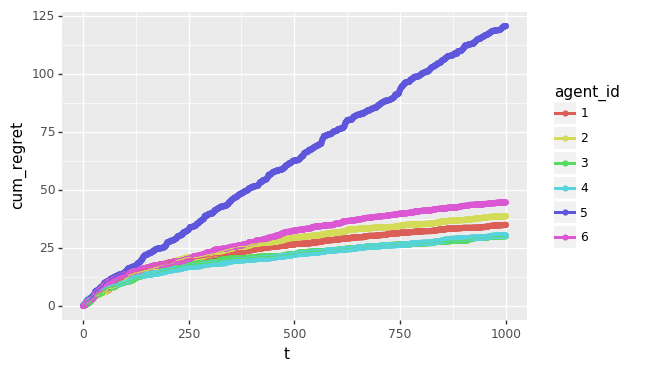

<ggplot: (8735813289773)>


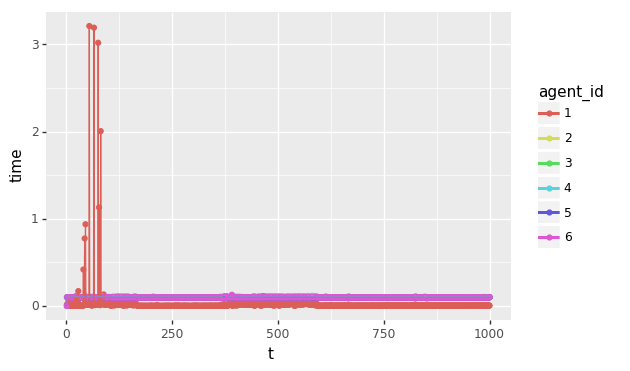

<ggplot: (8735813092129)>
theta [-1.24927835 -0.26033141  0.3837933  -0.38546147 -1.08513673  2.32721902
  0.43079295  0.43231577 -0.98001135 -0.63196519  0.57744207 -0.12475772
  0.97894786  1.59492154 -1.20194452 -1.37636885  1.05434551 -0.03885348
  0.68028567  1.3291749   1.28344952]
Experiment: Step 0
 Laplace sample: array([ 1.10456905, -1.53888867, -1.35745575, -0.33735056, -0.52562117,
        0.42224949,  0.23131255,  0.81830311, -0.29927037, -1.19567129,
        0.28189146,  1.52572087, -0.80266788,  1.05433197,  0.32134595,
       -0.22835006,  1.91439384,  0.8678885 , -0.08726177,  1.99720901,
       -2.05887569])
 Sample: array([ 1.37267917, -0.53045897,  0.16398984, -0.51926031, -1.61915929,
        0.18563221, -0.89392257,  1.22690343, -1.45402272, -0.21064523,
       -0.86195264,  1.13147464,  0.2537962 ,  0.69892076, -1.21185265,
        0.23565462, -1.12885059, -0.46503381,  1.36394134, -2.60622602,
        1.33527663])
 Sample: array([ 0.25371354,  1.85774453, -1.892

 Steps taken: 363
 Sample: array([ 0.97030367, -0.37230546,  0.58054832, -0.21432929, -0.64400261,
        0.47739359, -1.45491303,  0.80193127,  0.94090874,  0.62839342,
        1.23571979,  1.59994693,  1.78793878, -0.49709402, -0.63075046,
        0.83573953,  0.9781273 ,  0.64891141, -0.37688779,  0.53259782,
       -0.67459299])
 Sample: array([ 0.56011835,  0.60826568,  0.35513909,  0.4224871 ,  0.12196359,
        1.32180591, -0.93017621, -1.00529195,  1.11906676, -1.00828883,
       -0.02807789,  1.67633834,  0.79900854,  0.40545981, -0.43188945,
       -1.29671638, -0.74367397,  1.65566858,  0.13401876,  0.95970826,
       -0.774982  ])
 Steps taken: 1299
 Sample: array([-0.39797836,  0.38427359,  0.48821187,  1.00800315,  1.12984329,
        0.16518855,  0.44624243,  0.44762746, -0.02457958, -0.44438648,
        1.34394033,  0.10315057,  0.10985042, -0.33428739,  0.97801866,
       -0.63961337, -0.50677695, -1.19573984, -0.20116877,  0.1226975 ,
        1.17660185])
 Accept p

 Steps taken: 337
 Sample: array([-1.97549482, -0.40056464, -0.00372036, -1.47809114, -0.64609355,
        1.27728161, -0.84248997, -1.55046166,  0.07408654, -1.51335048,
       -0.80180645,  0.56884376,  0.01268029, -0.96838175,  0.511297  ,
        0.54427125, -0.23256445,  0.72136896,  0.79488928,  0.29507023,
        1.19309546])
 Sample: array([ 0.5149317 ,  0.94894764,  0.90212857,  2.82085939, -0.36515996,
       -0.53053602, -0.3911823 , -1.79022769, -1.22630101, -1.40256359,
        0.79755326, -0.15681629, -0.20621532, -1.34237972,  0.5335928 ,
        0.30645734,  0.01124664,  0.08196897, -0.68832918,  0.5782443 ,
       -0.25038536])
 Steps taken: 1217
 Sample: array([-0.38444913, -0.00497485,  1.03460305,  0.42803425, -0.36159386,
        0.40561132,  0.09966072, -0.05395038, -0.58350006, -0.03469623,
       -0.60215812, -0.29495195, -0.41733631, -0.25704187, -1.11593193,
       -0.68500773,  0.91049587, -1.12357009, -0.1815386 ,  0.02901467,
        0.62753114])
 Accept p

 Steps taken: 343
 Sample: array([-2.94451528, -0.4064499 ,  1.19707258, -1.06326173,  1.10654316,
        0.07962487, -0.13873881,  0.65282367,  0.23275221,  0.04462313,
        0.00670524,  1.20697335, -0.93096225,  2.42115116,  0.85292449,
        0.46735595, -0.32175389, -0.72167792, -1.51326034,  1.15574685,
       -0.51911985])
 Sample: array([-0.62800578, -0.31660853, -1.07983112,  1.42400434, -0.20393546,
        0.38223162,  1.31069039,  0.09497506,  0.50852166, -0.82778923,
       -0.68809125,  1.82824949, -0.10145186,  0.92627768, -0.61514523,
        1.38247701, -0.56589036, -1.18899028,  0.44422437, -0.49462972,
       -0.25246605])
 Steps taken: 1272
 Sample: array([-0.4683638 , -0.22123679, -0.08120121,  0.02181436, -0.77445707,
        0.73199025, -0.53075267,  0.41069442, -0.61318087,  0.39117991,
        0.40370475,  0.51200447,  0.23827443, -0.58590702, -0.3520266 ,
        0.23951549, -0.68028236, -1.83909   ,  0.44496542,  0.16601345,
        0.97383314])
 Accept p

 Steps taken: 179
 Sample: array([-2.33182623, -2.10619738,  2.10326707, -0.67718347, -0.88190099,
       -1.53984116,  1.81067299, -0.56137195, -0.3494808 , -0.52406899,
       -1.04574186,  0.60070594, -0.41037679,  0.18219631,  0.5332057 ,
       -1.39553628, -0.55111275,  0.09179196, -1.38170603,  1.30357219,
        1.442866  ])
 Sample: array([-1.38176967, -0.04251131,  0.49792882,  2.06603454, -0.73380273,
       -1.82545499,  0.43703312, -0.8393795 , -0.77381869, -0.28804774,
       -0.88850231, -0.28331872,  0.26733999,  1.41472899,  0.41624072,
        0.76408658, -1.03851008, -0.29693937,  0.21052807, -0.42798158,
        0.02420659])
 Steps taken: 933
 Sample: array([-0.12261243,  0.05380676,  0.19290273,  1.05464005, -0.63393526,
        0.64027425,  0.38843429,  0.6169055 , -0.16209385,  0.06288173,
       -0.4860868 ,  0.16779301,  0.0457499 , -0.36287319, -0.11254487,
       -0.26255781, -0.04561236, -0.31819238, -0.3094356 , -0.80231133,
       -0.04712947])
 Accept pr

 Steps taken: 353
 Sample: array([-2.51754562,  0.23915185,  0.79981193,  0.52325282, -0.92549772,
       -0.95954798,  0.03163584,  1.6879507 ,  1.07687423, -0.98176995,
       -0.54921366,  0.21151408, -0.52255577, -0.14478088, -1.15645511,
        1.13119868, -1.26950286, -0.650518  , -0.30641191,  1.60154244,
        0.04994464])
 Sample: array([-0.80687284,  0.71157972, -0.72544463,  0.39454497,  1.76002119,
       -0.69803851,  1.57089395,  0.37396101, -0.1886894 , -2.20113609,
       -1.05348418,  0.1596906 ,  1.69545945,  0.39378059, -0.81703727,
        0.84193227, -0.40492314, -1.42051797, -1.48931402,  0.30363888,
        0.4887577 ])
 Steps taken: 1253
 Sample: array([ 0.03600839, -0.07623396,  0.07548683,  0.2052363 , -1.27287756,
        0.97188641,  0.71286944,  0.41735605, -0.48297838,  0.85982716,
        0.38388698, -0.35417323, -0.73342351, -0.54882565, -0.19143597,
       -0.7570248 , -0.00864123, -1.43700336,  0.17063843, -0.67149443,
        0.79442714])
 Accept p

 Steps taken: 351
 Sample: array([-2.32539933, -0.310173  ,  0.37709213, -0.06188762, -0.25688558,
       -0.63886889,  0.99841774, -0.70155346, -0.78796054, -0.89019154,
        0.11905453,  0.93567197, -0.35482125,  0.79020846, -0.85822682,
       -0.46780802,  0.07307428,  0.13631958, -0.78249909,  0.537283  ,
        0.07639398])
 Sample: array([-0.51148757, -1.05565954,  0.71031021,  0.9426821 , -0.90074209,
       -2.30712208,  0.28249558, -1.4053167 ,  0.09492064, -0.34004987,
       -1.15193133,  1.54725042,  1.95687259, -0.0896015 ,  0.49176698,
       -0.74745788,  0.54574548,  0.04256387,  0.67557063, -0.66239214,
        1.62890016])
 Steps taken: 1234
 Sample: array([-0.37003744, -1.04624666,  0.04902721, -0.04062118,  0.34954044,
        1.34897416, -0.30586468,  0.76166253, -0.29728578, -0.06117704,
       -0.73890197,  0.81156269, -0.22308502,  0.5060662 ,  0.00660379,
       -0.45435759, -0.12271048, -0.40452104,  0.3586285 , -0.83879807,
        0.81049499])
 Accept p

 Sample: array([-1.97520481,  0.13848227, -0.24702697,  1.00069393, -0.74545176,
       -0.23493486,  0.22234238, -0.50441901,  0.01477596, -0.39278843,
        0.50961866,  1.19501974, -0.01079396,  0.32722392, -1.39958434,
       -1.09309664,  2.37560089, -0.50240903, -1.6248088 , -0.55194884,
       -0.55794607])
 Steps taken: 1121
 Sample: array([-0.53070913,  0.51948926, -0.48058142,  0.60860157, -0.55457706,
        0.9511961 ,  0.34626817,  0.46835908, -1.74949369,  0.55366179,
        0.4110579 ,  0.50336678, -0.13685761, -0.13577934, -0.96481599,
        0.22131711,  0.11876337,  0.03461217,  0.3514666 ,  0.27935772,
        1.70300162])
 Accept proportion: 0.389277
 Steps taken: 429
 Sample: array([-1.84210811,  0.30958355,  1.44192776,  1.11470644, -0.36951614,
       -0.0930987 ,  1.48273383, -1.33872434, -2.30637207,  0.71712266,
       -0.47013917,  0.7754782 ,  1.43412522,  0.54479749, -0.60617092,
        0.93062105,  2.42834952, -0.61536577,  0.38189272,  0.93370489,
 

 Sample: array([-0.56663026, -0.82180023, -0.09537417,  0.34243215, -0.21527038,
        1.42885759,  0.51594946,  0.58575301, -0.62601508, -0.61755889,
       -0.1850033 ,  0.29065286,  0.53572394, -0.1399394 , -0.78837749,
       -0.49030518,  0.18397857, -0.66873008, -1.06700141, -0.64679648,
        1.44811776])
 Accept proportion: 0.423445
 Steps taken: 418
 Sample: array([-1.46954095, -0.11870481, -1.05269656,  0.49996555, -1.61756053,
        1.53191436,  0.01567111, -2.00538662,  0.84609963, -2.00528161,
        1.04212947, -0.84175094,  0.61622424, -0.09528124, -1.13404348,
       -0.58256446,  0.14270867, -0.25867714, -0.33489761, -1.96796461,
        2.41456895])
 Steps taken: 1173
 Sample: array([-1.08565238, -0.06302523, -0.24012974,  0.73158867,  1.22133521,
        0.65253696,  1.01451886, -0.35732366,  0.37240027, -1.595409  ,
       -0.0874293 ,  2.02532892, -0.07596469, -0.99893985, -0.53645621,
        0.74054372, -1.19727232, -0.37887513,  0.45277291,  0.11413487,
 

 Sample: array([-0.71192199, -0.76369933, -0.85008966,  0.87176551,  0.0264104 ,
        1.32538183,  0.23329493,  0.60161579, -0.91733844,  0.30818979,
        0.67641506,  0.20649298, -0.29260936,  0.1683125 , -1.45643145,
        0.33401716,  1.91585912, -0.15192139, -0.46379204,  0.16663587,
        0.54883977])
 Accept proportion: 0.359903
 Steps taken: 414
 Sample: array([-0.68266781,  0.16088452, -0.61460183,  1.04344095, -0.24093249,
        1.10549305,  0.84082698, -1.63285785, -0.98890361,  0.40285184,
       -0.21530883,  0.50186292, -0.21523748, -0.13322244, -0.34933558,
       -2.06503313, -0.1194864 , -1.25179983, -0.10748431,  0.89573798,
       -0.23188375])
 Steps taken: 1066
 Sample: array([-1.12296226,  1.20091082, -2.25175132,  0.01456226, -0.59500296,
        0.4531134 ,  0.42520435, -0.13836309, -0.34501022, -1.58363856,
        0.88601625,  0.1152607 , -0.16249622,  1.11113314, -0.46373993,
        0.33048613,  0.08918137, -1.53765436, -0.55451196,  0.31443968,
 

 Sample: array([-0.17228024, -0.08727801, -0.43328602,  0.71790573, -0.37770598,
        1.45633371,  0.7768058 ,  0.83445917, -0.33532122, -0.52704195,
        0.21178729,  0.20969049,  0.06579064,  0.41939603, -0.97671603,
       -0.50276046,  0.83451375, -0.04017187, -0.72983153, -0.02590488,
        0.66113643])
 Accept proportion: 0.388060
 Steps taken: 402
 Sample: array([-0.66814109,  0.07393912,  1.68269989,  0.78628051, -0.24430264,
       -1.5083472 ,  1.62814003,  0.62894791, -1.69929997, -0.70019637,
        0.27440462,  0.25861897,  2.70318636,  0.5961117 , -0.57058851,
       -2.29907759, -0.0093569 ,  0.28171448, -1.03168566, -0.94812692,
        0.94410592])
 Steps taken: 1082
 Sample: array([-0.7170291 , -0.36737559, -0.83407065,  0.96371627, -1.75784638,
        0.91903117,  0.59748486,  0.05087464, -0.85401308, -0.45251067,
        0.94153205,  0.77987376, -0.03982246,  1.12623604, -0.48469548,
       -0.65977061, -0.35421598, -1.53368246, -0.68298969,  0.3377769 ,
 

 Sample: array([-0.40753631, -0.09896268, -0.03024957,  0.48606708, -0.21294672,
        1.26804312,  0.76327437,  0.05813058, -1.00850726, -0.11887411,
        1.11061208,  0.59930685, -0.03881262,  0.89369706, -0.66281797,
       -0.18333209,  1.25884788,  0.30504255,  0.15064096,  0.18051066,
        0.73720748])
 Accept proportion: 0.358586
 Steps taken: 396
 Sample: array([-1.46915504e+00,  1.05062595e-03,  3.78055292e-01,  7.92829761e-02,
       -1.60268198e-01, -6.23269374e-02,  9.31441825e-01,  7.74876876e-01,
       -1.73197213e+00, -3.88012534e-01, -1.55242670e+00,  7.09874156e-01,
       -1.44157753e-01,  1.08861151e+00, -7.71602004e-01, -1.33465427e+00,
        5.32109766e-01, -5.55831690e-01, -8.94814980e-01,  1.43116907e+00,
        1.24214370e+00])
 Steps taken: 1077
 Sample: array([-0.65123925,  0.43483547, -0.13931663, -0.59137027,  0.00657688,
        0.87451122,  2.19335504, -0.13716143, -0.71167858, -1.0114879 ,
        0.40711757, -0.77019935,  1.46615419, -0.07297

 Sample: array([-0.89788253, -0.13154556,  0.2093837 , -0.32538384, -1.32575127,
        0.52627048,  2.6028646 , -1.79036993, -0.16448471, -0.52543136,
        0.30112313,  1.3336472 ,  1.09839156,  0.60134322, -1.04953617,
        0.39614603,  1.47386788,  0.15066352,  0.69697208, -0.21656784,
        0.38783006])
 Steps taken: 1002
 Sample: array([-0.36230544, -0.28645854, -0.98257468,  0.76442475, -0.44595751,
        1.2389838 ,  1.21594155,  0.80076172, -1.18922988, -1.09240653,
        0.83311954,  0.43211646,  0.45729273,  0.95876277, -1.03185106,
       -0.26113215,  0.36870463, -0.21046596,  0.33177344, -0.30628892,
        0.3664536 ])
 Accept proportion: 0.399504
 Steps taken: 403
 Sample: array([-1.39212202,  1.2926368 ,  0.19163443,  1.41660373,  0.27706591,
        0.65161485,  0.69177529, -0.79893698, -2.0652164 ,  0.64317332,
       -0.0631562 ,  0.31787466, -0.15450958,  0.42389744,  0.03860219,
       -0.20801006, -1.00665034,  0.12688937, -0.78576482,  0.72140691,
 

 Sample: array([-0.43970914, -1.97120486, -1.06009833,  0.56286736, -0.72242834,
        1.68428533,  1.3964314 , -0.2366178 , -0.54208685, -0.63396096,
        1.10618394, -0.44751696,  1.81203951, -0.4575822 , -1.09256841,
       -0.82609207, -0.40973758, -0.01664532, -1.75185079,  0.358176  ,
        1.5974608 ])
 Steps taken: 1012
 Sample: array([-0.79674654, -0.34861867, -0.58854644, -0.16982863, -0.18855896,
        1.37369506,  1.33279259,  0.32435688, -1.11668558,  0.07630834,
        0.74999878,  1.06171556, -0.52670222,  0.94821689, -0.9907208 ,
       -0.32806783,  0.91979606,  0.32611829, -0.16044118, -0.74382356,
        0.08932544])
 Accept proportion: 0.343434
 Steps taken: 396
 Sample: array([-0.65593656, -1.281475  ,  1.26425459,  0.30984122,  1.64287809,
        1.65288298,  0.20026321,  0.13776472, -0.84886515,  1.11756457,
        0.16858957,  0.49509485, -0.08699184, -0.91740128, -1.34399811,
       -0.51895937,  0.02744043,  0.05737541, -1.10847514, -0.70267453,
 

 Sample: array([-0.65297073, -0.62085789, -0.55878692,  1.16701601, -0.63511824,
        2.60919965, -0.10697158,  0.34280084, -1.06942133, -0.0563515 ,
        1.68040094,  0.31452642,  0.1166112 ,  0.311869  , -1.28754198,
       -0.90728285,  2.16887219,  0.83834013, -0.20272555, -0.38359838,
        0.70549825])
 Accept proportion: 0.420635
 Steps taken: 378
 Sample: array([-1.01957331, -1.13630499,  0.4737636 , -0.3427453 ,  0.56063157,
        0.11203644,  1.61695289,  0.50945959,  0.78328565, -0.46735994,
       -0.03407792, -0.1268412 ,  2.27147525,  0.21340768,  0.03628083,
       -0.52758279, -0.55759228, -0.36634994, -0.2347582 ,  0.05524925,
        2.24133081])
 Steps taken: 1079
 Sample: array([-1.63704611,  1.16695551, -1.83775828,  1.15716742, -0.66413157,
        1.94352509,  0.75871477, -0.76475409, -1.67864153, -0.33271497,
        0.82691351,  0.14845476,  0.28247059,  0.32401355, -1.21804288,
       -1.11910058,  0.58102824, -1.95680538,  0.24792191,  0.88141598,
 

 Sample: array([-0.52286853, -0.67293838, -0.57746487,  0.90791161, -0.15171672,
        0.77040322,  1.38377298,  0.16370556, -1.27153216, -0.32501813,
        0.30728022, -0.19208542, -0.54158795,  0.22918291, -0.97443668,
       -0.55175406,  1.65113227,  0.3518222 , -1.0850041 ,  0.2887341 ,
        1.26283127])
 Accept proportion: 0.427822
 Steps taken: 381
 Sample: array([-0.85908307, -1.10317414, -0.48963192,  0.31408859, -0.09990044,
        0.64957534,  1.47693005, -0.50959648, -0.8220565 , -0.39675507,
        0.19474828, -0.31871957,  1.3751631 ,  1.17184361, -0.70715396,
       -1.20255342,  0.94423496,  0.50224682, -1.73643953, -0.18954849,
       -0.22193217])
 Steps taken: 1070
 Sample: array([-1.52106793, -1.07776642, -1.30159678, -0.25348498,  0.38022257,
        2.24643316, -0.24585029, -1.11339519, -0.71326679,  0.48957797,
        0.36259321, -0.91058566,  2.03012916,  1.01399485, -0.74071327,
        0.1071405 , -0.24228635, -1.06732843,  0.16724361,  1.31050152,
 

 Sample: array([-0.71477703, -0.396571  , -0.30367868,  0.71935062, -0.71386864,
        1.64370989,  0.13311115, -0.02362254, -0.94567256,  0.20440704,
       -0.12684044,  0.43548846, -0.2844409 ,  0.50241891, -0.31655231,
       -0.90960129,  1.15012915, -0.10291496, -0.57102889, -0.42788875,
        0.91266378])
 Accept proportion: 0.348525
 Steps taken: 373
 Sample: array([-0.86812264, -0.79386232,  0.69987274,  0.61330067, -1.16323078,
        0.74686022,  1.20097008,  1.73205398,  0.59693557,  1.22726578,
        0.52954084, -0.5383414 ,  1.78536479, -0.47234933, -0.5324316 ,
       -0.56590697,  1.28618431,  0.50345552,  0.94335736,  0.12667277,
        1.81682757])
 Steps taken: 1067
 Sample: array([-0.78903993,  0.19246615,  0.47661653,  0.62256874, -0.42079517,
        0.86200926, -0.2125017 ,  0.49530144,  0.5462688 ,  0.32664903,
        2.3401005 , -1.0030818 ,  0.38644328, -0.40737735, -1.48894008,
       -0.45484535,  0.82558771, -0.19216719,  1.35110367,  1.12130069,
 

 Sample: array([-0.55438164, -0.06740711, -0.0690585 ,  0.46759359, -0.52280112,
        1.2996216 , -0.21401545,  0.59465105, -0.88497501,  0.41436143,
        0.52359715,  0.42369529, -0.89865435,  1.63138244, -0.88944133,
       -0.32899428,  1.5465392 ,  0.26413172, -0.49484956,  0.19017703,
       -0.20908148])
 Accept proportion: 0.435967
 Steps taken: 367
 Sample: array([-1.04748585,  0.34171524,  0.38190729, -0.87461541, -0.94619993,
        0.1124754 ,  0.41130866, -0.0725507 , -0.24625127, -0.23529513,
        0.55166632, -1.32115438, -0.26957644,  2.26986501, -0.73659962,
       -1.48983355,  0.07266114, -0.77160442, -1.04940048,  0.76616094,
        2.27940215])
 Steps taken: 1075
 Sample: array([-0.98535228, -0.63156719, -1.04090506, -0.25801345, -0.34900093,
        1.55788111,  0.46269012, -0.37840883, -1.03483485,  1.02480036,
       -0.24831005, -1.04130336,  0.69605777,  0.22268062, -1.64946887,
        0.21548191,  1.77118045, -2.30349216,  1.68439595,  1.32076841,
 

 Sample: array([-0.90580849,  1.20417175, -0.61618831,  0.54958987, -0.15957227,
        2.66512139,  0.60647344, -0.00983983, -0.97937048,  0.66641843,
        0.08982393,  0.0712162 , -0.94234245,  0.88806588, -1.10900417,
       -1.01538571,  1.18001777,  0.0969258 , -0.42629139,  0.0796349 ,
        0.56432399])
 Accept proportion: 0.426997
 Steps taken: 363
 Sample: array([-1.03672396,  0.80831248,  0.28753738, -0.25686958,  1.1662722 ,
        1.03419688,  0.85726933, -1.14280116, -1.09496326,  1.19625476,
       -0.32679157, -2.04597186,  0.21213251, -0.51223382, -0.13059987,
       -0.94669784, -0.36699403,  0.33850134, -0.54665694, -0.10983255,
       -0.27364593])
 Steps taken: 1070
 Sample: array([-1.33486973,  0.08753602,  0.51739435,  1.84446111,  0.20721799,
        2.5273791 , -0.48726769,  0.49794099, -0.56358591,  0.03268976,
        0.48582842, -1.29673494, -0.20508146,  1.62421416, -2.37002631,
       -0.55519607,  1.78806605, -1.30473234,  1.87028125,  1.8091746 ,
 

 Sample: array([-0.98677687, -0.24284077,  0.19260541,  0.81418447, -0.50496228,
        1.99992226,  0.56857547,  0.52932234, -1.5666426 ,  0.44860645,
        0.20961132, -0.55349878,  0.33320566,  0.31668105, -1.13033467,
       -0.70328099,  0.79441093, -0.11034051, -0.2493999 , -0.41586084,
        0.53100814])
 Accept proportion: 0.392157
 Steps taken: 357
 Sample: array([-0.41248675,  0.81886291, -1.41595638,  0.64210594,  0.03577205,
        0.26566917,  0.05617478, -0.93995809, -1.41285992, -0.19326083,
        0.51233365,  1.2065281 ,  0.36249847,  0.66620247, -0.27762697,
        0.31171201, -1.84871511, -0.93672791, -0.86063562,  0.82446756,
        0.33051302])
 Steps taken: 1074
 Sample: array([-0.93780859,  0.52152135, -0.12998943,  0.6473803 , -0.53617221,
        1.22829439,  0.95139236,  0.54045902,  0.09198855,  0.54329095,
        1.38133802,  0.43220607,  0.13917816,  0.92962692, -1.3710118 ,
       -0.51612537, -1.08604885, -0.54789265,  0.41886645,  0.9661275 ,
 

 Sample: array([-0.66415287, -0.37301725, -0.23451332,  0.89518893, -0.39936598,
        1.50543482,  0.137779  ,  0.4743763 , -1.43815467,  1.59220827,
       -0.21833819, -0.58324906, -0.32728544,  0.20854274, -1.4631451 ,
       -0.63368437,  0.23218345, -0.12650677,  0.01660935,  0.07739325,
        0.9909428 ])
 Accept proportion: 0.440000
 Steps taken: 350
 Sample: array([-0.44053405,  0.01287343,  0.68274892,  1.60364844, -2.18062708,
        0.77488843,  0.86389419, -0.38591422,  0.40379836, -0.67737709,
       -0.62065081, -0.95244325, -0.37084731, -0.81808205,  0.28200617,
       -0.00481552, -0.44870114, -0.71345963,  0.30729095,  1.44353908,
        1.45901476])
 Steps taken: 1081
 Sample: array([-1.31335438,  0.9057602 , -0.4125732 , -0.1770597 , -0.68052118,
        2.40768433,  0.76457543,  1.15907189, -0.28224937, -0.02144235,
       -0.04172508,  0.00995447,  0.59020657,  0.8042281 , -2.45488169,
       -0.32224141,  0.12600781, -1.06677785,  0.50459562,  0.73153333,
 

 Sample: array([-0.64635942, -0.04302484,  0.15456412,  0.42525333, -0.91556207,
        1.76351729,  0.3844339 ,  0.24706608, -0.8868366 ,  0.54696963,
        0.51587832, -0.04649835, -0.32295427,  0.45444078, -1.03269002,
       -0.31591433,  0.30999936,  0.46151718,  0.53228091, -0.47909232,
        1.03311135])
 Accept proportion: 0.458213
 Steps taken: 347
 Sample: array([-0.48169258,  0.64507488, -0.33460044, -0.12741782, -1.45572174,
        3.23751769,  1.2360453 ,  1.39372237, -0.14983525,  0.41853499,
        1.47649305, -2.40806421, -0.12620682, -0.4929979 ,  2.14574257,
       -0.22525762, -0.91453161,  0.35984237, -0.64206848,  0.69097751,
       -0.11703705])
 Steps taken: 1071
 Sample: array([-0.71141497, -0.01772109, -0.80944581, -0.26420411, -0.03589372,
        1.29478999,  0.49162017, -0.42140622, -0.12747475,  0.24521402,
        0.04924199,  0.51407223,  0.42247472,  0.03507174, -0.87213153,
        0.77636277,  1.36930614, -0.94761554, -0.96344049,  0.19723065,
 

 Sample: array([-0.86785543,  0.62236729,  0.41538221,  0.93409755, -0.16420586,
        2.14660473,  0.59329509,  0.48705465, -1.05467742,  0.20416644,
        0.47381074,  0.11921858,  0.08946096,  0.78267798, -0.98246108,
       -1.45536219,  0.43534765,  0.57096085,  0.28328562, -0.04417796,
        0.59950858])
 Accept proportion: 0.443149
 Steps taken: 343
 Sample: array([-1.49584024,  0.49852942, -1.76405258,  1.05169129, -1.26706803,
        1.00675363,  1.41759659, -1.63921751, -0.58481275,  0.44274124,
        0.05916033,  0.12056958,  0.4871785 ,  0.99661759, -0.75970829,
       -1.17182105,  0.81674273,  0.66154057,  0.07269703, -0.46412888,
        0.75509378])
 Steps taken: 1079
 Sample: array([-1.00937467,  1.87865225, -0.9132518 , -0.67797075, -0.50533719,
        2.19028763,  0.41804581, -0.0133927 , -0.24205061,  0.64867832,
        1.29832867, -0.55041831,  0.97982576,  0.54614653, -0.15888307,
        0.41419072,  0.98147076, -1.16106801,  0.22145963,  1.74043107,
 

 Sample: array([-1.02982219,  0.35600468, -0.07289635,  0.45471342,  0.05406302,
        2.28267064,  0.43169612,  0.46243519, -1.45109751,  0.18305087,
        0.31964372, -0.30475399,  0.2039847 ,  0.58240012, -1.4067492 ,
       -0.69792128,  1.24857644, -0.81544463,  0.46424341, -0.41906531,
        0.95065826])
 Accept proportion: 0.411411
 Steps taken: 333
 Sample: array([-0.73621992,  0.15777197, -1.45026144, -0.76091419, -0.48237642,
       -0.10516876,  0.21762553,  0.16057982, -2.09619822, -0.59850282,
       -0.53817955, -1.04935349,  0.6424618 , -0.77996567, -1.4635684 ,
        0.15749466,  0.03572465,  1.72361576, -1.3050038 ,  0.58143103,
        0.30104487])
 Steps taken: 1070
 Sample: array([-1.5927671 ,  1.73060792,  0.19774968, -0.47154856, -0.60284165,
        2.23538784,  0.77010403,  0.98149616, -0.6784165 ,  0.7386832 ,
        1.57135882, -0.82727384,  0.6029817 ,  0.62110884, -1.20550353,
       -1.12113928,  0.55479349, -1.81525198,  1.59695328,  0.42398302,
 

 Sample: array([-0.63989975,  0.02232326,  0.31345264,  0.24366659, -0.88179478,
        1.74908369,  0.38127032, -0.01639799, -0.77725031,  0.21812099,
       -0.02755001,  0.45150094, -0.39972794,  0.32590017, -1.11336941,
        0.11894081,  0.60382813, -0.17335686,  0.10829042, -0.32582572,
        0.47681324])
 Accept proportion: 0.396970
 Steps taken: 330
 Sample: array([-0.22726361,  0.96234701,  0.83134365,  0.43644383, -0.69118034,
        0.73499026,  1.04874491,  0.94004212, -0.80694938, -0.32919824,
        1.52157   , -1.21609271, -1.08140936,  1.16318992, -0.90249235,
       -0.24176053, -1.17423479,  0.15353045,  0.72560539,  0.47458373,
        1.21490632])
 Steps taken: 1069
 Sample: array([-1.14077622,  1.00760762,  0.8550381 ,  0.79919521,  0.90416165,
        1.82087285, -0.07240989,  0.74007992, -1.16703733, -0.44632017,
        0.98110136,  0.4184823 ,  0.68621298,  0.90930132, -0.21302079,
        0.52696462,  0.5316488 ,  0.08013251, -0.57855922,  0.42699638,
 

 Sample: array([-1.17139613,  0.18679595, -0.06109901,  0.49540646, -0.68013553,
        1.47649405,  0.31913296,  0.28802019, -1.73430985,  0.62367644,
        0.18062162,  0.51218527,  0.02380822,  0.6657611 , -1.98274482,
       -0.32097471,  0.553039  , -0.31110258,  0.17343965, -0.59366172,
        0.51001739])
 Accept proportion: 0.406154
 Steps taken: 325
 Sample: array([-0.22428566,  0.49828811, -0.51822921, -0.10913883, -1.60762516,
        0.65420048, -0.88700445, -0.28048511, -0.57474669, -0.64574722,
        0.7521482 ,  1.10103961, -0.05076756, -0.15962062,  0.29457475,
        0.61451569,  1.1331598 , -0.0514133 ,  0.28491081, -0.26828576,
        1.22985626])
 Steps taken: 1072
 Sample: array([-1.52108184, -0.23309643,  0.34376614,  0.59854786, -0.68430363,
        3.39201195,  0.74940279,  1.06640462, -1.30140717, -0.21804596,
        0.63410548,  0.47464057,  1.56421004,  1.04358006, -0.54214713,
        0.30886217,  0.80133114, -0.32106168,  0.41359428, -0.12153282,
 

 Sample: array([-0.91931691, -0.01561819, -0.04543366,  0.61971273, -0.51231315,
        2.22560243,  0.15953036,  0.44840422, -1.16886906,  0.0213258 ,
        0.24315924, -0.10800609,  0.27005046,  0.40770908, -1.22892379,
       -0.16059127,  1.05063363,  0.1075616 , -0.49096091,  0.18388408,
        0.80439775])
 Accept proportion: 0.438871
 Steps taken: 319
 Sample: array([-0.22710607, -1.63487245,  0.23658363,  0.02816882,  0.30775429,
        0.21062821,  0.37249288,  1.15944505, -0.37591953, -0.48962101,
       -0.08651411,  0.61937586, -0.51851016, -0.51704436, -0.67677267,
        1.47876182, -0.74633266,  2.09687234, -0.72773916, -0.18549808,
        1.4122681 ])
 Steps taken: 1074
 Sample: array([-1.40201951,  0.14861012, -0.25159558, -0.56243367, -0.02291893,
        1.22965108,  0.7413297 ,  0.34128453, -0.13167982, -0.72893968,
        0.73044051,  0.52807356,  0.4063715 ,  1.61603403, -1.37729492,
       -1.09657872,  0.87937413, -1.94923294,  0.32888894,  0.62307163,
 

 Sample: array([-0.94592441, -0.36588176,  0.23679799,  0.3242052 ,  0.10454306,
        1.89016402,  0.84327137,  0.29267826, -0.79102775,  0.56361916,
        0.09190272,  0.47791137, -0.18542514,  0.87565293, -1.40219395,
       -1.25437169,  1.38650382,  0.09810142, -0.18254317, -0.03746451,
        0.58282597])
 Accept proportion: 0.444089
 Steps taken: 313
 Sample: array([-1.46269776,  1.469212  ,  0.88878025,  0.19905866, -0.0267168 ,
        1.14821723,  0.10844072,  0.51811514, -0.37288457, -0.7490379 ,
        0.76513294, -0.27555123, -0.07588399,  0.90094914, -0.63187822,
        0.46918188,  1.0909431 ,  1.38443314,  1.00820145, -0.72002174,
        1.01478969])
 Steps taken: 1074
 Sample: array([-0.68848449, -0.37323045,  0.31239422,  0.23162942, -0.16418742,
        2.82475696,  0.29992237,  0.97615059,  0.33131527, -0.62890064,
       -0.55398151,  1.51789543,  0.47568496,  1.3924717 , -0.04992965,
       -1.40291935,  0.63965281, -0.30780734, -0.78689425,  0.85472022,
 

 Sample: array([-0.86969392, -0.40988067,  0.53168109,  0.24688232, -0.24999515,
        1.88290779,  0.62893201,  0.93121748, -0.8231164 ,  0.8147489 ,
        0.22181456,  0.31383086,  0.0848832 ,  0.69686512, -1.57674538,
       -1.19194988,  1.02566157, -0.46200256,  0.09706068,  0.08852359,
        1.42139896])
 Accept proportion: 0.483092
 Steps taken: 207
 Sample: array([-1.02315347, -0.28895052,  0.91472012,  0.35098698, -1.0756875 ,
       -0.36480567,  0.59452917, -0.3959176 , -0.185951  ,  0.3307307 ,
        0.24959006,  0.25914734,  0.47280748, -0.39063359,  0.30768579,
       -0.46699236,  0.20605365, -0.42038639, -0.6937787 ,  0.76178565,
        1.81037693])
 Steps taken: 807
 Sample: array([-0.78608513,  0.76902044, -0.48409789, -0.14716895, -0.12663626,
        2.05649937,  0.64357428,  1.06442961,  1.14053083, -0.58826328,
        0.54375773,  0.02256468,  0.10491243,  0.519853  , -0.76374582,
       -0.0827039 ,  0.67317733, -0.45126038,  0.96126571,  1.36052552,
  

 Sample: array([-0.77243146, -0.58877368,  0.6285933 ,  0.73726115, -0.63291182,
        1.92485532,  0.50937964,  1.01883284, -1.06499328,  0.12153984,
       -0.13927552,  0.08354702, -0.20005836,  0.25442843, -1.0429486 ,
       -1.03418384,  0.94481462, -0.29636727, -0.43451942,  0.1670423 ,
        0.33162986])
 Accept proportion: 0.422330
 Steps taken: 206
 Sample: array([-1.34808782, -1.48130055,  0.12046201,  0.75915075,  0.06227022,
        0.7925569 ,  0.66482088, -1.08824473, -1.10969702,  0.49441812,
        1.310023  ,  0.43031332,  0.57423837,  0.67321292, -0.0125349 ,
        0.13791705, -0.76365548,  0.15990565, -0.27946878, -1.14878563,
       -0.10993471])
 Steps taken: 814
 Sample: array([-1.40272741,  0.78575904,  0.29677119, -0.65966982,  0.38512409,
        1.91819535,  1.10459258,  1.26577637,  0.90404586, -0.42891761,
        0.73228103,  0.03244496,  0.75043084,  0.46010535, -1.15404913,
       -0.19996404,  1.51991809, -1.49104795,  0.92266389,  1.66159732,
  

 Sample: array([-1.18264147, -0.42116144,  0.18921165,  0.50598362, -0.67910512,
        2.02068819,  0.39999746,  0.48995898, -0.76905986,  0.66203428,
        0.44494011, -0.1541429 ,  0.41475213,  0.48949138, -1.6358458 ,
       -1.47882188,  1.42232092, -0.76272634,  0.47586741,  0.32482589,
        0.78838369])
 Accept proportion: 0.478049
 Steps taken: 205
 Sample: array([-0.60323474, -1.58117153,  0.13506564,  0.32705125, -1.4416832 ,
        1.00084205,  0.7817722 , -0.67469193, -1.39941982, -0.26475281,
        0.36356296, -0.8178273 , -0.24124147,  0.09049212,  0.44200541,
       -0.6854165 ,  0.9261345 ,  0.74090758, -1.63014844, -1.07606037,
       -0.77454104])
 Steps taken: 820
 Sample: array([-1.08985496,  1.33319102,  0.2877791 ,  0.00865225,  0.44736089,
        1.69703894,  0.18089265,  1.61332794,  0.17823585, -0.05342414,
        0.53706686, -0.45462459,  0.64064817,  0.34311392, -0.66026919,
       -1.0949207 ,  1.17287198, -0.85372785,  0.23508287,  1.21904295,
  

 Sample: array([-1.13504109, -0.51319941,  0.34823814,  1.10891626, -0.30915048,
        1.90804053,  0.4230607 , -0.13487558, -0.83048321,  0.55387994,
       -0.03500507,  0.11207753,  0.15962527,  0.47400967, -1.92115417,
       -1.3180795 ,  1.06865449, -0.34210969, -0.22804095,  0.20420472,
        1.19878411])
 Accept proportion: 0.487685
 Steps taken: 203
 Sample: array([-0.81319102, -1.05842376,  0.60817261,  0.68733062, -0.34666392,
        0.06816151,  0.62415944,  0.87268665, -3.22520593,  0.96202266,
       -0.1841873 , -1.58733477,  0.24130106, -1.45363678,  0.29516491,
        0.67349281,  0.36842234, -0.12529532, -1.31869429, -0.65718877,
        0.47054328])
 Steps taken: 807
 Sample: array([-1.55878083,  0.56390661,  0.72566302, -0.07570234, -0.11512385,
        2.23049232,  0.34476583,  1.01090796, -0.69632911, -1.48522925,
        0.68370286,  0.27886249,  1.13756127,  0.34628508, -0.37744602,
       -0.39849506,  1.27522363, -0.50612177,  0.98116444,  1.55603567,
  

 Sample: array([-0.46211065,  0.14134345,  0.27773262,  0.32154156, -0.42817746,
        1.6202627 ,  0.69954798,  0.53366727, -0.87846277,  0.71359525,
       -0.84809025, -0.35033723,  0.23767443,  0.63600014, -1.64412543,
       -0.74486532,  0.87735902, -0.02907903,  0.60926123,  0.88183304,
        0.9393145 ])
 Accept proportion: 0.390863
 Steps taken: 197
 Sample: array([-0.6623072 , -0.44884358,  1.33716267,  0.24826439,  0.53476594,
        0.12720413,  1.54326251,  2.14343903,  0.02550286, -0.73529132,
       -0.21279231, -0.91523557,  1.44640444, -0.35109715,  0.29200263,
        0.0243307 ,  1.91813367, -1.27245345,  0.57047953,  0.50337399,
       -0.8000417 ])
 Steps taken: 806
 Sample: array([-1.6317424 ,  0.45321884,  0.0501491 ,  0.23222724, -1.29850167,
        2.28690999,  1.04187158,  0.72607546, -0.2022822 , -0.60503116,
        1.48721558,  1.05330723,  0.46329009,  0.85998952, -2.07470108,
       -0.47041435,  0.72421598, -1.07827582,  0.20442218,  1.82074907,
  

 Sample: array([-0.75609147,  0.06396672,  0.22622036,  1.0849712 , -0.27577653,
        2.04815859,  0.40665632,  0.61914424, -1.19371903,  0.12383306,
       -0.36905119, -0.03287577,  0.4795603 ,  0.64099022, -1.25491876,
       -0.61135524,  1.49074705, -0.0209371 , -0.30392174,  0.23359542,
        1.20094756])
 Accept proportion: 0.466321
 Steps taken: 193
 Sample: array([-0.61083415, -0.33443405, -1.95524027,  0.61639202,  0.08695467,
       -0.5214978 , -0.72890174,  0.65089166, -0.27408475, -0.5293748 ,
       -1.29671302, -0.5478393 , -0.22622946,  0.22927709,  0.2677717 ,
        0.15019188,  0.27051998, -0.21631038, -1.3353291 ,  0.31410821,
       -0.35190125])
 Steps taken: 807
 Sample: array([-1.09571776,  1.03603115, -0.60489011, -0.01227115, -0.04886368,
        1.75526366,  0.71183961,  0.64213899, -0.09241972,  0.15986998,
        0.03999408,  0.15448172,  0.97569133,  0.02968408, -1.62272154,
       -0.97240181,  1.56042155, -0.38166916, -0.41492814,  0.98388204,
  

 Sample: array([-0.63386726, -0.11834018,  0.09703638,  0.83096707, -0.58024367,
        2.80469875,  0.43715025,  0.69925851, -0.3142792 ,  0.14904613,
       -0.30828985, -0.45768465,  0.19697433,  1.16494305, -1.34206555,
       -1.63771681,  0.99573113, -0.42658976,  0.31936502, -0.04148352,
        1.18104654])
 Accept proportion: 0.586022
 Steps taken: 186
 Sample: array([-1.16611245,  1.39427152,  0.12491992,  0.4809054 ,  1.13878934,
        1.78746185,  0.24742782,  0.78277252,  1.46372887,  0.39618728,
       -0.70900311,  0.45918723,  0.48218204,  0.96226025,  0.00749899,
       -0.9864131 , -0.53586723,  0.64567471, -0.53861042,  0.630435  ,
        1.90918345])
 Steps taken: 771
 Sample: array([-1.13142115,  1.13299351,  0.01860088,  0.29506902, -0.53429779,
        1.25635587,  1.09840225,  1.35714286, -0.83900427, -0.28164927,
       -0.87170048,  0.28884074, -0.97700816,  0.56976887, -1.70402068,
       -0.91967177,  1.01445667,  0.4669841 ,  0.00622486,  1.89449185,
  

 Sample: array([-0.71397437, -0.31846137,  0.13328512,  0.88708577, -0.94157069,
        2.4762471 ,  0.14654874,  0.27154604, -0.56200257, -0.25408998,
        0.12162458, -0.11574472, -0.14863155,  0.17961858, -0.53398101,
       -0.4835047 ,  0.55024139, -0.67660976,  0.12586481,  0.47437289,
        0.46250663])
 Accept proportion: 0.473958
 Steps taken: 192
 Sample: array([-0.65497982,  0.04518551,  1.13126331, -0.10944406, -1.08649391,
        0.98698686,  0.64661868,  0.02712098,  0.45594894, -0.94218536,
        0.15671188,  0.94444453,  0.85327493,  0.17536573, -1.79027959,
       -1.54670723, -0.37137076, -1.00605566, -0.82621831, -0.28644221,
        1.17772191])
 Steps taken: 799
 Sample: array([-0.6634749 , -0.29747904, -0.1423127 , -0.71454682, -0.88530353,
        1.39727369,  0.35464486,  1.88241393, -0.06517824, -0.56487205,
        0.47333408, -0.08800199,  0.17970594, -0.22267608, -1.21046945,
       -1.12334803,  0.61233572, -0.12087899,  0.59985513,  1.28416242,
  

 Sample: array([-0.88952456, -0.38295313, -0.12457929,  0.31864738, -0.40367872,
        1.60606762,  1.20075608,  0.54173761, -0.97638592,  0.1945619 ,
       -0.01161124,  0.28977975,  0.06602677,  0.49413849, -1.08884145,
       -0.83187931,  1.23460381, -0.19137689, -0.43445513, -0.14654591,
        1.0098898 ])
 Accept proportion: 0.468421
 Steps taken: 190
 Sample: array([-0.570458  ,  0.75095062, -0.3744213 , -1.31720219,  0.67199792,
        0.66717978,  0.09023092, -0.03490753, -1.10711856, -0.27687896,
        0.48274224,  0.2909282 ,  0.63238416,  1.02439956,  0.06483289,
       -0.63354818,  1.91909473,  0.43901841,  0.60489323,  1.67522095,
        0.25374879])
 Steps taken: 810
 Sample: array([-1.10605887,  0.30552859,  1.19168498, -0.97275011, -0.51675278,
        2.15512456,  0.73465821,  1.01247429,  0.20708179, -1.00436548,
        0.74862517,  0.16620713,  1.43851463,  0.34217232, -0.94795226,
        0.4075861 ,  0.88767916, -0.5407206 ,  0.269532  ,  0.63356948,
  

 Sample: array([-0.77156459, -0.94419984, -0.01680717,  0.88734209, -0.21056631,
        2.10197518,  0.28408095,  0.13367736, -0.59417517, -0.03295993,
        0.07732831,  0.02372296, -0.35402839,  0.74479192, -1.10168286,
       -1.15748994,  1.2301903 , -0.03276855,  0.02615021,  0.57145366,
        0.65376188])
 Accept proportion: 0.472222
 Steps taken: 180
 Sample: array([-0.21875423, -0.04049049, -0.00614729, -1.78076493,  0.07805618,
        0.182851  ,  0.37252854,  0.44870431, -1.35948318, -1.20652015,
       -0.0061506 , -0.73285361,  0.24497516,  0.23399032, -0.10047915,
       -0.48960606, -0.01864522, -0.59907869,  0.15256977,  0.47730422,
        1.54715454])
 Steps taken: 799
 Sample: array([-1.0959765 ,  1.08107528,  0.33604946, -0.55156046, -0.7516449 ,
        1.69786595,  0.0095404 ,  1.21689328,  0.15821543, -0.08304471,
        0.4114482 , -0.62886642,  0.10977207,  2.0716802 , -0.70208585,
       -0.49524747,  1.28945593,  0.16965478,  0.37560114,  1.10671829,
  

 Sample: array([-0.8969531 , -0.50131973,  0.21997162,  0.97845096,  0.49337663,
        2.03881561,  1.12552689,  0.74435465, -0.48930186,  0.34331248,
        0.08626928,  0.26815639, -0.29663333,  0.72472051, -0.92636922,
       -0.86032489,  0.94313868, -0.58998546, -0.89022375,  0.32789415,
        0.48940993])
 Accept proportion: 0.443850
 Steps taken: 187
 Sample: array([-0.65245258, -0.86361746,  0.22680744,  1.82942159,  0.47297926,
        1.42348434, -0.05062331, -0.03583083, -0.92428033, -0.98179058,
        1.19532918,  0.54689957,  0.58929072,  0.10965855, -1.14173782,
        0.54438454,  0.00229282,  0.21610196,  0.97164269, -0.5487571 ,
        0.77858369])
 Steps taken: 804
 Sample: array([-1.2310864 ,  0.40358421, -0.0429972 , -0.49929195, -0.89675822,
        1.81603844,  1.10816201,  1.52190407,  0.6695986 , -0.59403427,
        1.28202209,  0.93220474, -0.44317247,  0.83666382,  0.03327089,
       -0.50234758,  1.0919514 , -0.56917269,  1.29182841,  0.03046533,
  

 Sample: array([-0.94110717, -0.26861884, -0.0812114 ,  1.0456172 , -0.02842713,
        2.16841799,  0.78085215,  0.48150563, -0.9052704 ,  0.13923115,
        0.20101687, -0.15213226,  0.07980115,  0.2119308 , -0.80812682,
       -0.82708797,  1.06503658, -0.42025879, -0.26834065,  0.35641284,
        1.15671809])
 Accept proportion: 0.424731
 Steps taken: 186
 Sample: array([-0.52928264,  1.36808424, -0.0768624 , -0.04351005, -0.08994671,
       -0.09288083, -0.04293035,  0.20193409, -1.55811222, -0.34462856,
        0.72830746,  0.1355628 ,  0.80255818,  0.35683006, -2.53269844,
       -0.32848447,  0.15730331,  0.61098069,  0.78962947,  0.47576096,
        0.9634037 ])
 Steps taken: 806
 Sample: array([-1.16506084,  0.54739017, -0.11982952, -0.01489318, -0.27287042,
        2.54424534,  0.19391335,  0.02058119, -0.35088388, -0.54696767,
       -1.35835024,  0.41202479,  0.53121194,  1.05730405, -1.30580096,
       -1.04301837,  1.63106867, -0.47671127,  0.73073367,  0.43724696,
  

 Sample: array([-1.03595165,  0.5544249 ,  0.35929848,  0.28948536,  0.15195656,
        2.63170991,  0.40420381,  0.47982169, -0.72814091,  0.10701324,
        0.08960618,  0.17433332,  0.2138711 ,  0.41641114, -0.70860965,
       -1.35082822,  1.56548785,  0.03576601, -0.46215857,  0.30066722,
        0.63996345])
 Accept proportion: 0.370968
 Steps taken: 186
 Sample: array([-0.75916451,  0.2051589 , -0.01256568, -0.92146689,  0.21600605,
        0.43542918, -0.12410231, -0.38126206, -0.66641217, -0.96425574,
        1.47407253, -0.98890308,  0.88088685,  0.64061092,  0.17079405,
       -1.93697663,  0.40543991, -0.4743041 , -1.06537803,  0.78121689,
        1.31996442])
 Steps taken: 808
 Sample: array([-1.18224054, -0.28373783,  0.77106756, -0.76059305, -0.85491897,
        1.73953975,  0.45419629,  0.75860698, -0.2829017 , -0.79670211,
        0.18427184, -0.18757442,  1.14702192,  0.55712375, -1.04221313,
       -1.68477704,  0.5947989 , -0.61543136, -0.17485624,  1.23466012,
  

 Sample: array([-1.07272891,  0.12213622, -0.14407839, -0.03111763,  0.11012093,
        2.98826448,  0.77254525, -0.239559  , -0.90619863,  0.38243922,
       -0.03058219, -0.15341176,  0.57830498,  1.36115243, -0.90329334,
       -1.15370405,  1.39231356,  0.11403524,  0.13115616, -0.07678004,
        0.77117821])
 Accept proportion: 0.502732
 Steps taken: 183
 Sample: array([-0.85675894, -0.95517948, -0.161574  , -1.36486838, -1.39292264,
        1.501137  , -0.02065595, -0.45310823, -0.31555016,  0.40297704,
       -0.10148739, -0.99750672,  1.12060249,  0.30240885,  0.56970252,
       -0.49037841,  1.01356201, -1.99793437,  0.9233243 ,  1.22328702,
        0.16715238])
 Steps taken: 815
 Sample: array([-0.98068545,  0.11643242, -0.32610344, -0.52136756, -0.48613799,
        1.88468038,  0.96211705,  0.76030559, -0.11543751, -0.59481795,
       -0.41442176,  0.18696183,  0.02025508,  1.06496246, -0.82000402,
       -0.91203716,  0.71187064,  0.06676066,  0.41962588,  0.99524289,
  

 Sample: array([-1.13258341, -0.31799622,  0.09587925,  0.38770557, -0.12659859,
        1.7965975 ,  0.81609262,  0.49208687, -1.25501095,  0.50762299,
        0.07296375,  0.20331587,  0.48412212,  1.08549646, -1.16829266,
       -0.77453651,  1.33603008,  0.03147757,  0.05345318,  0.39990674,
        1.01544312])
 Accept proportion: 0.521978
 Steps taken: 182
 Sample: array([-1.18984276,  1.55763761,  0.48393235,  0.84906316, -0.31201728,
        1.29787541,  0.09194281,  2.08357531, -1.7502397 ,  0.47796899,
        0.94249389,  0.14200115, -0.77712502, -0.70138564,  1.12409141,
        0.57291634, -0.7924427 , -1.07803199,  0.5670856 , -1.12437356,
        0.79413157])
 Steps taken: 809
 Sample: array([-0.88871582,  1.3432312 , -0.53408214, -1.49551177,  0.45083199,
        1.70257291, -0.02423142,  0.63025551, -0.84462296,  0.01317786,
       -0.40329286, -0.73555374,  0.61904807,  1.05037996, -1.17259095,
       -1.05717921,  0.77591952, -0.00380509, -0.62272265,  1.48509377,
  

 Sample: array([-0.73104278, -0.09160002,  0.2758194 ,  0.36727062,  0.30009472,
        2.14131933,  0.02202753,  0.46510523, -0.45222528, -0.25078186,
        0.32041274,  0.06283101,  0.19004438,  0.66672089, -0.6459776 ,
       -1.13133847,  1.16839956,  0.36977944, -0.25917981,  0.12892246,
        0.63947697])
 Accept proportion: 0.461111
 Steps taken: 180
 Sample: array([-0.60109256,  0.55756727,  0.26373252, -1.54049129, -0.69826068,
        0.91827648,  1.14439052,  0.8661964 , -0.45106535,  0.29061833,
       -0.22113086,  0.22416761, -0.38575585,  0.32498886, -1.93786992,
       -0.18146826,  0.82616851, -0.61471792, -0.93895736,  1.11857649,
       -0.25668157])
 Steps taken: 833
 Sample: array([-1.37159033,  1.05968546, -1.15483466,  0.32947688, -0.06527863,
        1.81452728, -0.00373453,  1.31431502,  0.0459805 , -0.40853897,
        0.20938676,  0.2335001 ,  0.27368869,  1.9019413 , -1.08366651,
       -2.02385575,  2.70036849,  0.50106481, -0.99926286,  1.87355767,
  

 Sample: array([-0.76169742,  0.03215715,  0.02650015,  0.43342686,  0.33777466,
        1.77974871,  0.56799273,  0.25113524, -0.63300526, -0.28829859,
        0.11902739, -0.07151247,  0.26813779,  1.11109443, -0.71087194,
       -1.09010322,  0.80581523, -0.49054516,  0.02416507,  0.22931656,
        1.36704772])
 Accept proportion: 0.479532
 Steps taken: 171
 Sample: array([-0.86407538, -1.01466334, -1.17699625, -0.64713719, -1.12678066,
        2.26938821,  0.13450343,  0.630838  , -0.46092587, -0.32178716,
        0.86816082, -1.16054257,  0.11671491,  1.12406947,  1.35010831,
        0.0918458 ,  1.87225446,  0.19191502, -0.95482478, -0.36571548,
        1.34503843])
 Steps taken: 764
 Sample: array([-1.29870963,  0.65340684,  0.18737048, -0.45582387, -0.27121153,
        1.89585814,  0.17231206,  0.97167393, -0.8147436 , -0.48810888,
        0.67968806,  0.54531742,  0.50154868,  1.40703049, -1.0423657 ,
       -0.52176906,  0.6147718 , -0.50957897, -0.14548764,  0.89827446,
  

 Sample: array([-0.85188378,  0.34791153,  0.28219484, -0.10284011,  0.04038302,
        2.00826219,  0.89336623,  0.20688255, -0.39623144,  0.25961137,
        0.10403734, -0.12673559,  0.73016276,  0.88106701, -1.19562211,
       -0.84939315,  1.02570675,  0.40666026,  0.39227216,  0.01284346,
        0.83181375])
 Accept proportion: 0.426752
 Steps taken: 157
 Sample: array([ 0.03627961, -0.48632524, -1.68568299, -0.14087524,  0.71138558,
        1.03753583,  0.82954484, -1.38765855,  0.52171758,  1.0681448 ,
       -0.52411188, -0.59019297, -0.0591946 ,  0.01171191,  0.16122099,
        0.18633483,  0.65364441, -0.34649582, -0.92679601,  0.39623158,
        1.65495923])
 Steps taken: 731
 Sample: array([-0.80932855,  0.9365659 ,  0.24167805, -0.30433531, -0.626508  ,
        1.14485132,  0.68431221,  1.22680863,  0.64959647, -0.7044117 ,
        0.21862036, -0.126208  ,  0.24941219,  1.11766134,  0.06025287,
       -0.73918837,  0.14285187, -0.50532244,  0.58999225,  1.40403812,
  

 Sample: array([-1.02254834,  0.18542346, -0.34637851,  0.11839104,  0.47648683,
        2.107678  ,  1.205337  , -0.25438635, -1.00330733,  0.19324851,
        0.43382129, -0.35004017,  0.42261143,  2.37184131, -0.82853325,
       -1.4847715 ,  1.25162698,  0.05881426,  0.0081992 , -0.36266077,
        1.06903125])
 Accept proportion: 0.418079
 Steps taken: 177
 Sample: array([-0.30937039, -0.68906888, -0.66632251,  0.05773194,  0.23887957,
        1.90253221,  0.20054835,  0.24347276,  0.7747854 , -0.27497781,
        0.28730034, -0.38573394, -1.20122198,  0.19426427, -1.21059301,
       -0.67265878,  1.43546967, -0.43401435, -0.60185079,  1.00265794,
        1.39406927])
 Steps taken: 804
 Sample: array([-1.21801372,  0.72804589, -0.40855615, -0.38107267, -0.29782536,
        1.71397823,  1.76936097,  1.0676791 , -0.24425006, -0.8189793 ,
       -0.30734557,  0.22409891,  1.26380453,  1.16299103, -0.04829896,
       -0.53544566,  0.88722568, -0.12313755,  0.95075437,  0.8773068 ,
  

 Sample: array([-0.9657849 ,  0.25207701,  0.13647215,  0.35608403, -0.1071902 ,
        2.31359138,  0.12865328,  0.31426025, -0.76065065,  0.27004658,
        0.20836171, -0.24696265,  0.5590447 ,  0.69466183, -0.97918027,
       -1.46107885,  1.07602202,  0.12428878, -0.0027916 , -0.04297036,
        0.77898047])
 Accept proportion: 0.373563
 Steps taken: 174
 Sample: array([-0.43892309,  0.28731481,  0.73817558, -0.86501113,  0.99227339,
        1.23181192,  0.83924511,  1.31863351, -0.56275324, -0.44351556,
        0.44148376,  0.84312865,  0.09809334,  0.40467323, -1.53135105,
       -0.12368049,  0.48229056, -0.91160594, -0.98209584,  0.51140611,
        0.22428358])
 Steps taken: 812
 Sample: array([-1.27949932,  0.23237165,  1.06638701, -0.60036057,  0.26672745,
        2.96162531,  1.85598685,  0.76479366, -0.75264541, -0.22469104,
       -0.46601831,  0.77717922,  1.28279699, -0.0267413 , -1.24413098,
       -0.47425395,  0.57575377, -1.57980978,  1.61930309,  1.23423973,
  

 Sample: array([-1.59154184,  0.08802558,  0.0917988 ,  0.86071246, -0.25594423,
        2.89105379,  0.73154881,  0.47555748, -1.31897151, -0.3436463 ,
       -0.12976271,  0.18021979,  0.86543608,  1.20834749, -0.88359499,
       -1.53464431,  1.70759151,  0.29814376,  0.50630995, -0.31736186,
        1.07090176])
 Accept proportion: 0.468571
 Steps taken: 175
 Sample: array([ 0.38318884, -0.46438472, -0.84394706,  0.04315617, -2.10863059,
       -0.93895672,  0.0513895 ,  1.33468141, -0.48332567,  1.31874627,
       -0.42930644,  0.04477069, -0.84352449, -0.3834568 ,  0.9587233 ,
        0.11259024, -0.206041  , -0.22829876, -0.30305563, -0.76992676,
        1.55951411])
 Steps taken: 805
 Sample: array([-0.96392845,  0.24579706, -0.55639798, -1.61849685, -0.32704983,
        1.82299538,  1.19840774,  0.12376787, -0.42449101, -0.51214236,
        0.02556268, -0.67938243,  1.05537251,  0.60326701, -1.19399757,
       -0.96729253,  0.44874615, -0.4594891 ,  0.50985042,  1.15746576,
  

 Sample: array([-1.36499396,  0.03602945, -0.21048759,  0.59524258,  0.16687385,
        2.43793865,  0.76554434,  0.33805264, -0.74587688,  0.11176628,
        0.14381594,  0.03932287,  0.58917511,  1.90370555, -0.95657987,
       -1.58233061,  1.14909682,  0.32381731,  0.00297471,  0.08777775,
        0.81634613])
 Accept proportion: 0.424419
 Steps taken: 172
 Sample: array([-6.19128465e-01,  1.70213080e+00,  5.78488398e-01,  3.36505796e-01,
       -4.08780721e-01,  1.41031998e+00,  1.12427459e-03, -1.53511909e+00,
       -7.51505354e-01, -6.39443406e-01, -2.51068312e-01,  5.81799055e-02,
        5.16485545e-01,  2.58632050e-01,  3.25849926e-01, -1.60651422e+00,
        5.59447191e-01, -2.82617955e-01, -7.36259642e-01, -2.28375596e-01,
        2.47359064e-02])
 Steps taken: 809
 Sample: array([-1.10350965,  0.31853788, -0.11850783, -0.71012691, -0.03531828,
        1.54668193,  0.77332568,  0.69491318, -0.27954511, -0.82378708,
        0.87331731,  0.66259752,  1.0067781 ,  0.518838

 Sample: array([-0.77162761, -0.03131827, -0.48521235,  0.03598872, -0.45898177,
        2.30542185,  0.60387911,  0.17477718, -0.52271181, -0.09555962,
        0.05761065,  0.41280794,  0.42653676,  1.01360362, -0.61787372,
       -1.12236868,  0.88167611, -0.11124974,  0.45751497, -0.05534291,
        0.78070156])
 Accept proportion: 0.534884
 Steps taken: 172
 Sample: array([-0.71532457,  0.42350772,  0.60313031,  0.07886066, -0.31452545,
       -0.81685768,  0.17796995,  0.22461119, -0.72910017, -0.4355719 ,
        0.55831513, -0.30017508,  0.75217333, -0.60717924,  0.10543833,
       -1.19506046,  0.43499978, -0.77657939,  0.10761604,  0.04810438,
        0.73828347])
 Steps taken: 805
 Sample: array([-1.4962314 ,  0.81050726,  0.76957957, -1.02720884,  0.52734398,
        3.21153679,  0.35474069,  1.33281495, -0.34407766, -0.54060529,
        0.9345693 , -0.12062565,  1.2771038 ,  0.78317053, -0.87068052,
       -0.29327079, -0.04156179, -0.58660365,  0.80151013,  1.50167041,
  

 Sample: array([-1.21934434,  0.26906231,  0.03610514,  0.46175472, -0.53925431,
        3.29561496,  0.88621636,  0.27695762, -1.26716392, -0.3696465 ,
        0.1478436 ,  0.20465741,  1.47733277,  1.22811307, -0.59814315,
       -1.49024259,  0.97542786,  0.48072484,  0.23967621,  0.50339059,
        0.88140985])
 Accept proportion: 0.411765
 Steps taken: 170
 Sample: array([-0.38914558,  0.14858405, -0.7976733 ,  0.98775229, -1.17856195,
        0.49066357,  0.95122394, -0.29966798, -1.14355643, -0.57168292,
        0.24970658, -2.14937675, -0.62353597,  1.04462563, -1.39526376,
       -0.68474774, -0.14049724, -0.18932914, -0.60427342,  1.29897328,
        2.11170786])
 Steps taken: 790
 Sample: array([-1.44014635, -0.32962395, -0.64327353, -0.71883224,  0.06905181,
        2.81090411,  0.63224215,  0.39244572, -0.80575979,  0.44713965,
        0.37341605,  0.04961982,  0.39031633,  1.37251246, -1.58074926,
       -1.05331186,  0.20355565, -0.93048581,  0.12961252,  0.33788498,
  

 Sample: array([-0.87807462, -0.46587893, -0.34513458, -0.07108007, -0.38133687,
        2.00295928,  0.50458633,  0.32663459, -0.74215324, -0.27577446,
        0.42268038,  0.03462716,  0.85686677,  1.21646768, -0.95707293,
       -1.1493038 ,  0.6519434 , -0.11895969,  0.13975196,  0.38926971,
        0.79655723])
 Accept proportion: 0.500000
 Steps taken: 168
 Sample: array([-0.77591739, -0.38998632,  1.27379505, -0.21238444,  0.2713223 ,
       -0.02011699, -0.03085139,  1.76494578, -0.37140172,  0.0571347 ,
        0.08503669, -1.50311058, -1.28456893,  1.65285281,  0.84539654,
       -0.42809745, -1.22469387,  1.61569321,  0.02249714,  1.30277554,
        0.04237645])
 Steps taken: 801
 Sample: array([-1.33484331,  0.14968055,  0.85019049,  0.19943932, -0.52510235,
        2.62215694, -0.19839701,  1.47511645, -1.53457146, -1.27224399,
       -0.15553269, -0.09156427,  1.16066982,  0.49392905, -0.97501428,
       -0.19353357,  1.18525884, -0.00383093,  1.29189934,  1.17217463,
  

 Sample: array([-0.98697247, -0.09500335,  0.11620934,  0.61064495, -0.28846426,
        1.94756734,  0.54768044,  0.53149404, -0.81441104, -0.18832321,
        0.2786256 , -0.01045963,  0.82475136,  1.06435853, -0.58900609,
       -1.56953147,  0.93310514,  0.44095692,  0.3851347 ,  0.41198624,
        1.44900954])
 Accept proportion: 0.502994
 Steps taken: 167
 Sample: array([-1.06425898,  0.73313916,  1.80427358, -0.23448342, -0.46101026,
        0.87489009,  2.15942581, -0.92024262, -0.17799795,  0.2732642 ,
       -0.94862714, -1.14967659,  1.06331126,  0.69104692, -0.28663652,
       -1.08802572,  0.97459593, -0.73662286, -0.35384718,  0.88519704,
        0.97589436])
 Steps taken: 798
 Sample: array([-1.15152628,  0.40507442,  0.54704918, -0.7188325 ,  0.27167586,
        2.30219318,  0.91073527,  0.66308506, -0.52285683,  0.02535376,
        0.08916289,  0.09396032,  1.11633542,  0.62981174, -1.08443562,
       -0.88185272,  0.39431508,  0.00723729,  0.86838884,  0.75902782,
  

 Sample: array([-1.01390397,  0.08728399, -0.3833716 ,  0.06264491, -0.05118137,
        2.30412755,  0.1937035 ,  0.38570997, -0.99917411, -0.13186382,
        0.28900321,  0.43415026,  0.7122649 ,  1.52885253, -0.85806874,
       -1.24712257,  1.31768763,  0.35231869,  0.25930592, -0.15489046,
        0.93387298])
 Accept proportion: 0.463415
 Steps taken: 164
 Sample: array([-0.32297717,  0.24787462, -0.45471171, -0.07252913, -0.58294747,
        0.76560918,  0.33526261,  1.49863626, -0.56329661, -0.88642564,
       -0.54106682,  0.96521703,  0.92807752,  0.4846965 ,  0.28271589,
       -1.44032827, -0.54948696, -0.4747423 ,  0.09425674, -1.1791136 ,
        1.15995367])
 Steps taken: 805
 Sample: array([-1.02056518,  0.36928913, -0.04610366, -0.37486867, -0.11897989,
        2.07880302,  0.07687952, -0.52203688, -0.01876244, -0.51514275,
        0.48594503,  0.56663542,  0.40782315,  1.02186725, -1.18200366,
       -0.95566885,  0.79471173, -0.13216581,  1.84691689,  0.40283075,
  

 Sample: array([-1.0980124 ,  0.12592943,  0.13514648, -0.12155686, -0.55020317,
        2.34849844,  0.6274595 ,  0.19951629, -0.53301064, -0.21778541,
       -0.13245634,  0.05153087,  0.76651171,  1.68715493, -0.85944977,
       -1.73270257,  1.19446188,  0.54415272,  0.4487187 ,  0.49893326,
        1.01682003])
 Accept proportion: 0.469136
 Steps taken: 162
 Sample: array([-0.62774977, -1.86756652, -0.24731873, -0.41605231,  2.00569328,
        1.74939204,  0.62972064,  0.32189674, -0.54428512, -0.1195004 ,
       -0.77481841,  0.46311734, -0.51840488,  0.59706713,  2.56418465,
       -0.49623957, -1.15939974,  1.04099214, -1.54598337, -0.68955177,
        0.32880209])
 Steps taken: 809
 Sample: array([-1.07792275,  0.32302382, -0.63370418, -0.24568266, -0.30424185,
        2.10443217,  0.12456754,  0.51961712, -0.47605102, -0.53731035,
       -0.17185299, -0.05741331,  0.4953986 ,  0.8125624 , -0.7779543 ,
       -1.05860276,  0.83962405,  0.72888207,  1.14745373,  1.10961016,
  

 Sample: array([-0.77103273, -0.02761723,  0.03600809,  0.04509662, -0.35307571,
        1.90564749,  0.51668714,  0.99269399, -0.8283771 , -0.66834786,
        0.32204506,  0.48265169,  0.97817997,  0.79836587, -0.90273561,
       -1.28816481,  1.34257717,  0.19879545,  0.56870118,  0.17380881,
        0.90221123])
 Accept proportion: 0.525000
 Steps taken: 160
 Sample: array([-0.20929017, -1.01363931,  0.04604569,  1.71889028, -0.42793736,
        1.81832667, -0.1600027 ,  0.39051314, -1.35262099, -1.05049919,
       -0.17077157,  0.04790188,  0.02828336, -0.63129392,  0.1326411 ,
       -0.31511974, -0.08385099,  0.26551357, -0.08559317,  0.39043748,
        0.80694428])
 Steps taken: 807
 Sample: array([-1.58638987,  0.77218221, -0.35245103, -0.63217006,  0.0600218 ,
        2.80810456,  0.38956005,  0.91722276, -0.52417442, -0.62650071,
        0.08010274,  0.65144091,  1.24204958,  0.35962998, -0.99061219,
       -1.29554632,  1.04983405,  0.45877991,  1.24872076,  1.63966   ,
  

 Sample: array([-0.96024183,  0.11972577,  0.28600112, -0.40894767, -0.43385531,
        2.51774507,  0.57585905,  0.71665   , -0.64264551, -0.38788769,
        0.18968039,  0.31976908,  0.71919997,  0.94815748, -0.756036  ,
       -1.27108366,  1.28289988, -0.05001568,  0.44764145,  0.40008832,
        0.72107704])
 Accept proportion: 0.487342
 Steps taken: 158
 Sample: array([-0.99780126, -0.14381438,  0.21165467,  0.30647515,  0.24851019,
        1.16935973, -0.24362563, -0.17029848, -0.09794387,  0.00916801,
        0.22655845, -1.54835431,  0.1080311 ,  0.7202864 ,  0.41810614,
       -0.35279978,  0.23364414, -0.1234048 ,  0.35333515,  0.4456058 ,
        0.23106287])
 Steps taken: 798
 Sample: array([-1.58899614,  0.92859901,  0.57743903, -0.73487821,  0.10938959,
        1.65119214, -0.3355746 ,  1.0260916 , -0.31280898, -1.20809079,
        0.0212816 , -0.28438916,  1.23610062,  0.69653607, -0.77422286,
       -1.07439663,  0.54912698, -0.73846877,  0.657871  ,  1.78415901,
  

 Sample: array([-1.18344199,  0.16927671,  0.27852063, -0.07306689, -0.65286636,
        2.33631295,  0.97133824,  0.71462972, -1.01217956,  0.34078202,
       -0.04315731,  0.38364226,  1.04388905,  1.09828896, -0.95713976,
       -1.46711464,  1.26096805,  0.2262175 ,  0.4803791 ,  0.66120859,
        0.78924007])
 Accept proportion: 0.453947
 Steps taken: 152
 Sample: array([-0.27365298, -0.39266366,  0.6870909 ,  0.90082812,  0.19006644,
        0.03469162,  0.73826246,  0.35941381, -0.57138618, -0.299011  ,
       -0.10487702, -0.62783413, -0.68632301,  1.7392246 ,  0.99946702,
        0.21740433,  1.08542383, -0.22362663, -0.09691373, -1.05352001,
       -0.01817399])
 Steps taken: 785
 Sample: array([-0.87449068, -0.06775449,  0.12864692, -0.0948479 , -0.57077577,
        2.10304161,  0.74423919,  0.48491172, -0.66001944, -0.68536014,
       -0.65444924, -0.58420966,  0.58187609,  0.59306062, -1.51090849,
       -1.28013766, -0.01144287,  0.08878995,  0.45808534,  1.88066012,
  

 Sample: array([-0.89159197,  0.06569036, -0.05309775, -0.02776252, -0.57627469,
        1.99687938,  0.35813478,  0.51474525, -0.61776152, -0.08553488,
       -0.00330724,  0.59425298,  0.86282131,  1.31914443, -0.68950398,
       -1.46991427,  1.3003979 ,  0.26720989,  0.97213843,  0.11791053,
        0.94314942])
 Accept proportion: 0.456954
 Steps taken: 151
 Sample: array([-0.49441975, -0.22985031,  0.68266327, -0.34138819, -0.3691776 ,
        0.10028484,  1.1727277 ,  1.99069321, -0.11269669, -0.14689046,
        1.60456657,  1.49510137,  1.15054605, -0.23126446, -0.21107371,
       -0.21468135,  0.5821974 ,  0.08863922,  1.1426591 ,  0.27563589,
       -0.66870749])
 Steps taken: 772
 Sample: array([-1.22436113,  0.31209919,  0.60962892, -1.04458943, -0.23690681,
        2.86848267,  0.87048318,  1.70721099, -0.30845204, -0.64603005,
        0.57412884,  0.63233508,  0.70757549,  1.13236865, -1.04877042,
       -0.45621571,  0.68525472,  0.27957908,  0.54519688,  0.29322129,
  

 Sample: array([-0.76974563,  0.40517453,  0.04732949, -0.14386251, -0.35124491,
        2.00359801,  0.48573329,  0.79906065, -0.46037021, -0.23621819,
        0.18538139, -0.28059795,  1.11562292,  1.00930376, -1.16799606,
       -1.01154194,  1.0885029 ,  0.44864415,  0.52489267,  0.31442188,
        1.0750535 ])
 Accept proportion: 0.384106
 Steps taken: 151
 Sample: array([-0.07146507,  0.21141859,  0.77442746,  0.53473788,  0.01655755,
        1.05570641,  0.34298558, -1.56193009, -0.45335946,  0.20078409,
       -0.15403798, -0.68234347, -0.40140896,  1.16355497,  0.15576604,
       -0.7044656 ,  1.28925756,  0.03807786, -0.31747259,  0.71113006,
        1.40710308])
 Steps taken: 754
 Sample: array([-1.19004792,  0.93699366, -0.18299599, -0.06641874, -0.41016149,
        2.35728504,  0.6303173 ,  0.88112365, -0.7032724 , -1.03507526,
        0.19373525,  1.38740582,  0.31568769,  1.07369706, -0.53047415,
       -1.51022226,  0.56594714,  0.7260439 ,  0.96427696,  1.68614808,
  

 Sample: array([-0.77695838,  0.29645295, -0.04755546,  0.14609335, -0.20918377,
        2.09762689,  0.3664811 ,  0.74036226, -0.69274514, -0.32248008,
        0.06962022,  0.00959294,  0.79054002,  0.81155551, -1.07637979,
       -1.12808457,  1.09884649,  0.27564617,  0.50226536,  0.56168989,
        1.09883194])
 Accept proportion: 0.480519
 Steps taken: 154
 Sample: array([-0.03171146,  1.30376058, -0.14012815,  0.16206529, -0.19684079,
        1.26598767,  0.58333061,  0.04064136,  0.75345986,  0.46973656,
        1.0136415 ,  1.40698424, -0.31198682, -0.24206165, -0.20903772,
       -0.01844147,  0.50986984,  0.06929832, -0.60282473,  0.36305743,
        0.39341668])
 Steps taken: 809
 Sample: array([-0.83081413,  0.43657354,  0.25998159, -1.03727818, -0.76008543,
        1.43952754,  0.47507321,  0.41585306, -0.89209582, -0.79394152,
        0.79387282,  0.8696207 ,  0.14849808,  0.34683277, -0.5491139 ,
       -0.05902811,  0.12068263, -0.52149715,  1.39784568,  0.58176638,
  

 Sample: array([-0.80686486,  0.0586072 ,  0.07992935,  0.10306662, -0.531358  ,
        2.16437295,  0.57429439,  0.53419223, -0.04778224, -0.30419206,
        0.16169004, -0.32563464,  1.04403425,  0.66948377, -0.90251366,
       -1.47276276,  1.30628484,  0.09021316,  0.71806932,  0.91844981,
        1.06393488])
 Accept proportion: 0.455782
 Steps taken: 147
 Sample: array([-0.8012451 , -0.73634241, -1.42558738,  0.27837053,  0.25593165,
        0.85220839, -0.83347292, -0.61624299,  0.29102829,  0.59055363,
        0.94356804, -0.40257249,  0.7957366 ,  1.5467457 , -0.45364537,
       -0.10389201,  0.14225898, -1.27683346, -0.68008427,  0.91511048,
        0.52597469])
 Steps taken: 775
 Sample: array([-1.07026486, -0.15498073,  0.72196558, -0.73699198, -0.57785403,
        2.02651861,  0.12981784,  0.94535704, -0.48100135, -0.05562799,
       -0.04702528, -0.17916039,  1.04925002,  0.75218721, -0.95961626,
       -1.25165575,  0.69901982, -0.32540381,  0.92667807,  0.89606016,
  

 Sample: array([-1.1016299 ,  0.0546946 ,  0.38333103, -0.38370991, -0.4533318 ,
        2.08667127,  0.33102372,  1.22527922, -0.45392737, -0.42548096,
        0.74146676, -0.2524325 ,  0.52126687,  1.5108121 , -1.38258505,
       -1.25767822,  1.60886593,  0.10257583,  0.38529869,  0.68854583,
        1.11053676])
 Accept proportion: 0.480263
 Steps taken: 152
 Sample: array([-1.2598399 ,  0.22985777,  0.7242701 ,  0.3586687 ,  0.33953852,
       -0.33427412, -0.2013324 ,  1.04340021, -1.07564546, -0.86618048,
       -0.43992469,  0.06051125, -0.38157328, -0.28107725, -0.57798943,
        0.02206013,  0.29447558,  0.76668439,  0.27491438,  0.65460139,
        0.78450519])
 Steps taken: 799
 Sample: array([-1.20005478,  0.35589513, -0.55189607, -0.1937754 , -0.68661327,
        2.57371996, -0.30969946,  0.99494544, -1.01808842, -0.15961641,
       -0.98708483,  0.38268995,  0.65888357,  0.9304468 , -0.33759367,
       -0.64658742,  0.26281873, -0.16012303,  0.59587155,  1.47137782,
  

 Sample: array([-0.96334706,  0.19376427,  0.10171843, -0.11711329, -0.47643469,
        2.75173915,  0.48802023,  0.88466241, -0.24612834, -0.34508107,
        0.56092312,  0.06541286,  0.94850127,  0.7199879 , -0.54153151,
       -1.5294357 ,  1.34870019, -0.09934891,  0.12014515,  0.82933966,
        1.13147104])
 Accept proportion: 0.460000
 Steps taken: 150
 Sample: array([-0.33339612, -0.1678464 , -1.69652715,  0.54484352,  0.59231509,
       -0.0113889 , -1.19863012, -0.09905716, -1.02278183,  0.67565301,
       -0.06875184, -0.91283259,  1.11522634, -0.37322478, -0.07785427,
       -0.30449043,  0.22675934,  0.61390091, -0.0058331 , -0.31009984,
        0.47376811])
 Steps taken: 800
 Sample: array([-1.73188359,  0.157698  ,  0.31214218, -0.5200042 , -0.38440382,
        2.90705317,  0.72505422,  0.87765125, -0.97005383, -0.50642826,
        0.35862534,  0.2984236 ,  1.37247935,  0.30799684, -0.46829747,
       -1.10431088,  0.35326939, -0.14749155,  0.96591142,  1.9176135 ,
  

 Sample: array([-0.9149236 ,  0.05327866,  0.27985445, -0.32216312, -0.46026735,
        2.17244509,  0.02916974,  0.39987411, -0.64222958, -0.14660072,
       -0.02568063, -0.59093309,  0.92297973,  1.18880798, -1.14159122,
       -1.11631952,  1.00034663,  0.16667721, -0.07233466,  0.21669303,
        0.70907326])
 Accept proportion: 0.415493
 Steps taken: 142
 Sample: array([-0.46283937, -1.25794927, -0.6063928 ,  0.56875613, -0.2351568 ,
        0.32887644, -0.89699515,  0.97357736,  0.80405639,  0.32756758,
       -1.05178939, -0.69544612,  0.47749013,  0.12905829, -0.64048857,
       -0.29884455,  1.2244703 , -0.48057951, -0.39003485, -1.76894453,
        0.29287913])
 Steps taken: 762
 Sample: array([-1.64450724,  0.94123963,  0.52329263,  0.00329241, -0.76849271,
        3.2555826 ,  0.69103441,  0.71073893, -1.6491346 , -0.39104416,
       -0.58397774,  1.11615132,  0.90826503,  0.75623951, -0.58944282,
       -0.91460493,  0.5236048 ,  0.18363189,  1.11266003,  1.98300815,
  

 Sample: array([-0.80318711, -0.15416411, -0.18027964, -0.65953016, -0.30420809,
        1.56420308,  0.14669076,  0.56561548, -0.63933588, -0.34589897,
        0.44118105, -0.70366755,  0.82351434,  1.23845216, -0.67250169,
       -1.33208234,  1.45070931, -0.02338498,  0.21887175,  0.5443556 ,
        0.75711171])
 Accept proportion: 0.404110
 Steps taken: 146
 Sample: array([-0.4356372 , -0.11558396,  0.71132187, -0.77243676, -1.96938272,
        0.12750818, -1.2717565 ,  0.79524708, -0.54953728,  0.287028  ,
        1.01426738, -0.03121738,  0.39059084,  2.04358907, -1.2169197 ,
        0.63521628,  0.26879957,  0.06655528, -0.6985381 ,  0.05742685,
        1.01176364])
 Steps taken: 795
 Sample: array([-1.10922729,  0.13292497,  0.59316004, -1.36422749, -0.75650183,
        2.67058408,  0.05598623,  0.31636092, -1.2245342 , -0.79654044,
        0.07656148,  0.81979877,  0.54986692,  1.08850047, -0.65420735,
       -0.72381507,  0.36728932, -0.36976096,  1.77386278,  1.55852536,
  

 Sample: array([-0.75238924,  0.37309878,  0.20691019, -0.26760532, -0.51653081,
        1.77856159,  0.17698598,  0.67153935, -0.30858587, -0.07615622,
        0.1751049 , -0.14451963,  0.64051744,  0.96116272, -0.95270364,
       -1.44255036,  1.40448891,  0.43888748,  0.24612322,  0.9059965 ,
        0.78614888])
 Accept proportion: 0.452055
 Steps taken: 146
 Sample: array([-0.15827447,  0.25923238,  0.30824911, -0.85661567, -1.20838811,
        0.43745404, -0.55276748,  0.56061213, -1.15383604,  0.73282804,
       -0.32754784, -0.41024995,  0.53446637,  0.95731984,  0.53415369,
        0.69583684, -0.17581195, -0.5964647 ,  0.42988483,  0.72442945,
       -0.0421452 ])
 Steps taken: 792
 Sample: array([-1.3555282 ,  0.84797477,  0.72664393, -0.3240308 , -1.77248094,
        2.94922037,  1.08089964,  1.64748246, -0.95705091, -0.5645641 ,
        0.05841536,  0.94470168,  1.18594385,  0.93081493, -0.29652689,
       -1.23011309,  1.12930448,  0.34801612,  0.52765757,  2.19614939,
  

 Sample: array([-0.70350295,  0.16851103,  0.08225446, -0.48448095, -0.26297765,
        1.89040761,  0.04487862,  0.53035058, -0.61517314, -0.00452043,
        0.49307904, -0.27963781,  0.76195842,  0.98196335, -0.83799227,
       -1.20844318,  0.79563332,  0.26540177,  0.16578306,  0.47442844,
        1.07514865])
 Accept proportion: 0.420690
 Steps taken: 145
 Sample: array([-1.25107193, -0.64887969,  0.01092832,  0.53828464,  0.12571834,
        0.59859024,  0.47874719,  0.69248044,  0.02650429,  0.3084869 ,
       -1.70829921,  0.53851337,  0.38750627, -0.54005517,  0.10988081,
        0.40867262, -0.19765727, -0.75202677,  0.2541719 , -0.33801256,
        0.97309464])
 Steps taken: 794
 Sample: array([-1.24475727, -0.28221411,  0.83694768, -0.80997963, -1.20463459,
        1.93950798,  0.38042368,  0.61677652, -0.88214008, -0.84190562,
       -0.02090258,  0.10063621,  1.09371344,  0.66483628, -0.38986379,
       -1.32455367,  0.09033397, -0.21369631,  0.85543528,  2.08910035,
  

 Sample: array([-1.00545772,  0.28964701,  0.04507398, -0.44118343, -0.82299435,
        1.96259193,  0.07319829,  0.72886839, -0.30359477, -0.27875162,
        0.60131563,  0.15307425,  0.3207257 ,  1.08779592, -0.92705873,
       -1.39135158,  1.31392776,  0.32056185,  0.26167428,  0.53770344,
        1.38682737])
 Accept proportion: 0.482517
 Steps taken: 143
 Sample: array([-0.72291692, -1.94764727,  0.63910524,  0.56426712,  0.38410691,
        0.82991433, -0.15998682,  0.26424693, -0.2442737 , -0.0225681 ,
       -0.82955688,  0.44144304,  1.19475907,  0.03145349, -0.12151219,
       -1.38217683, -0.6269472 , -0.36125128, -0.03416979,  0.1650798 ,
       -1.1612333 ])
 Steps taken: 788
 Sample: array([-1.33953173,  0.07639343,  0.50683308, -0.39012104, -0.61759559,
        1.73734765, -0.33075246,  1.68526633, -0.81058615, -0.61065548,
       -0.58575898, -0.07155767,  0.90475687,  1.0739724 , -1.40395181,
       -1.20513606,  0.36959401, -0.27164572,  0.91376313,  0.8281214 ,
  

 Sample: array([-0.97062607,  0.09563123,  0.20093708, -0.01948529, -0.54321474,
        1.62540199,  0.40529257,  0.93704445, -0.52965765, -0.14695328,
        0.20083281, -0.26920344,  0.51808398,  0.97566107, -1.11322998,
       -1.23831685,  1.49304407,  0.02078842,  0.49493834,  0.63768208,
        1.17709863])
 Accept proportion: 0.401408
 Steps taken: 142
 Sample: array([-0.85694039, -1.06063907, -0.57034649,  0.34284869, -0.81571922,
       -0.94402896,  0.39418744, -1.2659639 , -0.88772146, -0.46500686,
        0.97575884, -0.05047352, -0.4363147 ,  0.57639617, -0.35330644,
       -0.42063862,  0.33979472, -0.14352274, -0.38183428,  0.39557233,
        1.4424833 ])
 Steps taken: 770
 Sample: array([-1.67639015,  0.32830935,  0.69414155, -0.77891742, -0.4861402 ,
        2.6040181 ,  0.25443603,  1.365483  , -0.71551586, -0.84053223,
        0.62524829, -0.4799309 ,  1.76348853,  0.51365154, -1.33392286,
       -1.45188808,  0.53419166, -0.29514303,  0.81562406,  1.23817404,
  

 Sample: array([-0.84258266,  0.47082415, -0.13713208, -0.04846178, -0.68295323,
        1.73264428,  0.2338292 ,  0.67634192, -0.33105034, -0.60732182,
        0.34218725,  0.33262344,  0.79871198,  1.05484326, -0.67436369,
       -1.26959797,  0.95004956, -0.18857745,  0.4243517 ,  0.27176383,
        1.26962194])
 Accept proportion: 0.440559
 Steps taken: 143
 Sample: array([-0.79378943, -0.3769079 , -0.17309102, -0.10710736,  1.44536979,
        0.59238594,  0.40947102, -0.32480337, -0.4020911 , -1.23943688,
        1.34570286,  0.72015941,  0.33714284,  1.06870574, -1.26355262,
        0.01041875,  2.20777558,  0.21278645, -0.40229777, -0.38020639,
        0.90484901])
 Steps taken: 765
 Sample: array([-1.56696503,  0.46101173,  0.29078031, -0.73416156, -0.92634131,
        2.61616803,  0.21802181,  0.94136006, -0.71167105, -0.52584454,
        0.67274018, -0.24485564,  0.75301374,  0.90360189, -1.56156825,
       -1.16734575,  0.4203603 , -0.47837221,  1.26836081,  1.90788915,
  

 Sample: array([-1.02224572, -0.21471073, -0.05730369, -0.21914625, -0.5578567 ,
        1.49044813,  0.17183481,  0.62958381, -0.25079356, -0.71527579,
        0.3128041 ,  0.1073451 ,  0.7642952 ,  1.1723079 , -1.05737358,
       -1.07181994,  1.54665962,  0.05731318, -0.12478499,  0.61913318,
        1.13920428])
 Accept proportion: 0.521127
 Steps taken: 142
 Sample: array([-1.17912962, -0.72837374,  1.5518504 , -0.41472338, -0.50019941,
       -0.40673643, -0.09851943, -0.07780961, -0.63192737,  0.33148842,
        0.4400187 , -0.68060789,  1.60635517,  0.26701065,  0.15917294,
       -0.44946897, -0.54687184, -0.6317159 , -0.78563422,  0.73471495,
        1.08229363])
 Steps taken: 762
 Sample: array([-1.47437886e+00,  3.66506423e-01,  4.87259493e-01, -1.10592145e+00,
       -5.91655884e-01,  2.69846507e+00,  5.29422641e-01,  8.27048700e-01,
       -5.35626531e-01, -6.14893557e-01,  3.94866959e-01,  1.89943544e-03,
        1.46695306e+00,  7.73971839e-01, -7.34074300e-01, -9.7416

 Sample: array([-0.82150404, -0.03732625, -0.00980406, -0.03121029, -0.3256122 ,
        1.636306  ,  0.32580546,  0.80629819, -0.30072021, -0.64453858,
       -0.01986836,  0.3472725 ,  0.49164662,  1.06055302, -0.58262148,
       -0.95074346,  1.27053939,  0.14464869,  0.19299157,  0.17635159,
        1.6850308 ])
 Accept proportion: 0.467626
 Steps taken: 139
 Sample: array([-0.95146409,  0.65001543,  1.05330914, -0.2300422 ,  0.10118244,
        1.04248758,  0.74201018, -0.71787321, -1.71067506, -1.16283381,
       -0.08285358,  1.62411169,  0.35868085,  0.84576774,  0.4137856 ,
       -0.84796369, -1.16100577, -0.77656559, -1.04828689,  1.38301819,
        1.38006412])
 Steps taken: 770
 Sample: array([-1.25377451,  0.31001507,  0.18979369, -0.36348773, -1.21378817,
        1.64709539,  0.18135173,  0.10577339, -0.12252264, -1.20602341,
       -0.29319461,  0.72999445,  0.81917388,  0.97481468, -1.12574623,
       -1.31243546,  0.63044259,  0.51863829,  0.63087405,  1.52249802,
  

 Sample: array([-0.83801239,  0.18740707, -0.04161234, -0.1159042 , -0.4488901 ,
        1.58769616,  0.48281843,  0.55060919, -0.4075707 , -0.81491955,
        0.66253567, -0.08636879,  0.73623911,  1.15884924, -1.53356265,
       -1.1615041 ,  1.17816757,  0.21663038,  0.24735768,  0.4700556 ,
        1.29308238])
 Accept proportion: 0.459259
 Steps taken: 135
 Sample: array([-0.37675145,  1.53152465, -0.58418955,  0.38579546, -0.18347586,
       -0.54723925,  0.6352215 ,  0.02294438, -0.68790994, -0.27434582,
        0.16783455,  0.20238319,  0.69520682,  0.58545342,  0.20554306,
       -1.51241005,  0.02233187, -0.05643375, -1.25995763,  0.46862151,
        0.90295521])
 Steps taken: 774
 Sample: array([-1.44276066,  0.68276818,  0.46943146, -0.18460236, -0.81268137,
        2.90868947,  0.41930416,  1.13211421, -0.95231425, -0.69008222,
       -0.17442382,  0.19348818,  1.2260644 ,  0.7399618 , -0.44403426,
       -1.04559165,  0.77543875,  0.25693456,  1.17751087,  1.8198647 ,
  

 Sample: array([-0.93443366, -0.35758063,  0.18050059, -0.07744222, -0.80981133,
        1.86200837,  0.62809418,  0.13957206, -0.65052873, -0.05336892,
        0.58302493, -0.04472884,  0.58336357,  0.87743307, -0.98003864,
       -1.66169219,  1.52776812, -0.17955667,  0.48491704,  0.20495666,
        1.16776832])
 Accept proportion: 0.459259
 Steps taken: 135
 Sample: array([-0.93563058, -0.48437245,  0.62106373,  0.74618329, -1.69304831,
        0.66981963, -0.4619506 , -0.94539072, -0.36373167,  0.46107094,
        0.43288742, -0.90284493, -0.10775911,  0.64315122, -2.55116291,
       -0.43633493, -1.3084804 ,  0.16497436,  0.17511476,  1.58573838,
        1.11037295])
 Steps taken: 762
 Sample: array([-1.84004702,  0.17287757,  0.83596178, -0.80545469, -0.91450613,
        2.73364541,  0.75406174,  1.67341294, -0.92541589, -1.37410061,
        0.03121056,  0.98008699,  0.99095882,  0.50238898, -1.80209439,
       -1.80533664,  0.79517887, -0.4010917 ,  1.11598602,  1.67370864,
  

 Sample: array([-0.87503401,  0.36155574,  0.49205505, -0.23584448, -0.68752059,
        1.63822572,  0.45884313,  0.6215421 , -0.4753182 , -0.94893782,
        0.0243143 , -0.06051471,  0.62971735,  0.79997888, -0.92786167,
       -1.36144187,  1.5460666 ,  0.24032619,  0.13301542, -0.02979054,
        1.40084456])
 Accept proportion: 0.477941
 Steps taken: 136
 Sample: array([-1.1054168 , -2.40783649, -1.65763851,  0.99551991,  0.15223776,
        1.73927113,  0.537478  , -0.84967656, -0.29277898, -0.77459287,
        1.92305844, -0.9816614 , -2.1878986 ,  1.55281794, -0.9897986 ,
       -0.7021899 , -0.37842853,  1.1913258 , -0.27536092,  0.47417743,
        1.10790716])
 Steps taken: 767
 Sample: array([-1.48464484, -0.04532347, -0.04826878, -0.46310834, -0.45552394,
        2.96051851,  0.02704357,  0.73114004, -0.90503878, -1.71287422,
        0.30027238,  0.32854206,  0.81495757,  1.4704721 , -0.26259448,
       -2.29802906,  0.20009795,  0.13234532,  0.69522595,  1.65891811,
  

 Sample: array([-0.89410927,  0.28495393,  0.23063996, -0.21062392, -0.19981322,
        1.93510836,  0.10538237,  0.28690251, -0.37213804, -0.44727724,
        0.09840382,  0.0677237 ,  0.85284493,  1.21118345, -0.96790538,
       -1.3898275 ,  1.43792524,  0.59486727,  0.13256297,  0.46063123,
        1.18424629])
 Accept proportion: 0.523077
 Steps taken: 130
 Sample: array([-0.52383748,  0.80895374, -1.18030128,  1.50446316,  0.65311001,
       -0.14916634,  0.28541046, -0.85692102, -1.00850362, -0.65922896,
        0.28022365, -0.07810457,  0.71823918, -0.08894299, -0.22119352,
        0.35699957,  1.31003709, -2.15199653, -0.89854637,  1.52383843,
        0.33882757])
 Steps taken: 727
 Sample: array([-1.7722862 , -0.07149331,  0.28820952,  0.05714476, -0.64861076,
        2.51995519,  0.23583951,  0.29030741, -0.92289555, -0.83256043,
        1.21233461,  0.17603682,  1.98706579,  0.86003758, -1.17630842,
       -1.4061375 ,  0.93410997,  0.01768948,  0.61288853,  1.46774629,
  

 Sample: array([-0.9591712 ,  0.02378646,  0.12130903, -0.31967743, -0.75109204,
        2.03047485,  0.12192352,  0.48209845, -0.52787198, -0.8604069 ,
        0.2750319 ,  0.13478522,  0.85956386,  1.68088815, -0.77709265,
       -1.04063653,  1.25471518, -0.13225037, -0.07911101,  0.28749147,
        0.92214007])
 Accept proportion: 0.443609
 Steps taken: 133
 Sample: array([-0.27957606,  1.09414155, -0.78772648, -0.30383777, -0.72502548,
        1.43186765, -0.37312117,  0.92256526, -1.21829965, -1.58044264,
        1.14327172, -0.34352443,  0.25454903,  0.0487298 , -0.38803337,
       -1.26295877, -0.13372   , -1.56726911, -0.3342381 ,  0.38869679,
        1.47472759])
 Steps taken: 761
 Sample: array([-1.24660218, -0.24598892,  0.29338347, -0.3317855 , -0.17963713,
        2.87479216,  0.51954381,  0.40597486, -0.57988143, -0.64140664,
       -0.04904636,  0.01660835,  1.34499722,  0.79106604, -0.6650557 ,
       -1.77681689,  0.8517514 , -0.28001519,  0.64149844,  1.2878817 ,
  

 Sample: array([-0.90888828, -0.04087598,  0.21470095, -0.24907042, -0.62982814,
        1.67419811,  0.08240786,  0.43870406, -0.59215574, -0.3491353 ,
        0.80344953,  0.22127644,  0.73319741,  0.99051169, -0.57378989,
       -1.32180466,  1.24161473,  0.02183685,  0.20681787,  0.64746272,
        1.11057022])
 Accept proportion: 0.445312
 Steps taken: 128
 Sample: array([-0.90877598,  0.25687705, -0.3713888 , -0.95883108, -1.75781935,
        1.96780159, -1.07341414,  1.21487902, -0.29309122, -0.43894044,
        0.29100598,  0.98895245, -0.71478316,  0.28230357, -1.43912112,
       -1.11410617,  0.30832046, -1.34675172, -1.24515088,  0.86138968,
        0.18921778])
 Steps taken: 732
 Sample: array([-1.24182764,  0.49476865,  0.47363771, -0.43798141, -0.49612793,
        2.24476219,  0.81324908,  0.97746131, -1.5312347 , -0.21278557,
        0.10320354,  0.26964665,  0.73160479, -0.12320661, -0.81822927,
       -0.73710267,  0.89286655,  0.58427408,  0.78638527,  2.04197967,
  

 Sample: array([-1.00243678,  0.30046737,  0.03071995, -0.08660894, -0.36511083,
        1.82774102, -0.1193302 ,  0.70726785, -0.6886182 , -0.65708064,
        0.81887461,  0.13627747,  0.83164437,  1.23117621, -0.90671119,
       -1.29587464,  1.50756541,  0.28137895,  0.37956702,  0.58129994,
        1.38179162])
 Accept proportion: 0.507576
 Steps taken: 132
 Sample: array([-0.69110274, -1.51963729,  0.33015704, -1.48972348, -0.33979025,
        0.2390962 ,  0.45999504,  0.9182539 ,  1.07694149, -0.93109853,
        0.68497422,  0.61024854,  1.79432132,  1.80799214,  0.14244898,
       -1.04359639,  0.02523252, -0.80599784, -0.02883566,  1.60973015,
        0.3288164 ])
 Steps taken: 762
 Sample: array([-1.14373519, -0.50263822,  0.92411149,  0.13626192, -1.42690461,
        2.31058313,  0.04161364,  0.16464714, -0.38004357, -0.56282676,
        0.39817395,  0.60986941,  0.14022649,  1.01386216, -0.94525695,
       -0.97316211,  0.99935456,  0.02919245,  1.22559131,  1.66646809,
  

 Sample: array([-0.93381522, -0.08269326, -0.56366891, -0.47340272, -0.51638631,
        1.99219619, -0.10514621,  0.85024345, -0.71845543, -0.70353519,
        0.15340311,  0.05588294,  0.58223088,  1.27328143, -0.59602956,
       -1.65072905,  1.44519194, -0.00704783,  0.27910185,  0.43983674,
        1.58041177])
 Accept proportion: 0.456693
 Steps taken: 127
 Sample: array([-3.33321133e-01,  1.24665388e+00, -2.33892502e-01,  8.38334043e-01,
       -9.66674364e-01,  1.34438370e+00,  9.64940992e-01,  2.78688208e-01,
       -9.36585741e-01, -1.14194958e+00, -1.01041574e+00, -6.11175108e-01,
        9.69814388e-01,  2.18710155e-01, -9.19131687e-01, -2.08719328e+00,
        1.20211818e+00,  3.99246394e-01, -2.55581480e-01,  2.01507840e-03,
       -3.94663846e-03])
 Steps taken: 764
 Sample: array([-1.39909548, -0.03709472,  0.96062125, -0.216067  , -1.1948068 ,
        3.43813111,  0.24740606,  0.46115142, -0.89434107, -0.7323332 ,
        0.32175579,  0.05863761,  1.02067516,  0.920137

 Sample: array([-0.96043646,  0.03465575, -0.06540817, -0.00559348, -0.38518102,
        2.37188763,  0.02434108,  0.05572592, -0.44452301, -0.87044786,
        0.46664001, -0.05980653,  1.11448962,  1.47131652, -0.56332971,
       -1.66452128,  1.45312811,  0.4724281 , -0.02924019,  0.38547087,
        1.20154933])
 Accept proportion: 0.435484
 Steps taken: 124
 Sample: array([-0.53242426, -0.80075427,  0.83872909,  1.07074592,  0.66863323,
        0.00764254, -0.7649206 , -1.17877379, -3.55244926,  0.21708459,
        1.51871305,  2.05553888,  1.46665848, -0.21164528, -0.69144833,
        0.57934935, -0.15826618, -1.4316766 , -0.82262617,  0.92749738,
        0.04932367])
 Steps taken: 732
 Sample: array([-1.04141115,  0.4829197 , -0.21601238, -0.30035207, -0.8217729 ,
        2.04584938,  0.45263554,  0.34960601, -0.75946575, -0.83186356,
        0.27882148, -0.26948243,  0.63431205,  0.84297656,  0.02745357,
       -1.13101985,  0.93111314, -0.31699045,  0.95364701,  0.97517942,
  

 Sample: array([-1.18967751,  0.00469503, -0.15039636,  0.08020351, -0.58177186,
        2.04903297,  0.31309213,  0.44280408, -0.93409673, -0.31436162,
        0.79952215,  0.09493195,  0.87525962,  1.01595096, -0.63218453,
       -1.41556791,  1.46322671, -0.15236224, -0.05538534,  0.96495347,
        1.22980864])
 Accept proportion: 0.417323
 Steps taken: 127
 Sample: array([-1.00539859, -0.63698079,  0.67425792,  0.20207878, -0.18037341,
        1.91984674, -0.01595335, -0.56335212, -0.64986257, -0.62629163,
       -0.70274646, -0.35604189, -0.26696356,  1.31191869,  0.51948584,
       -1.09503531, -1.6958324 ,  0.76660902,  0.84202857,  1.61327392,
       -0.61660738])
 Steps taken: 767
 Sample: array([-1.60713973,  0.59312074,  0.2548131 , -0.32080541, -0.85125639,
        1.80344313,  0.30256717,  1.00722874, -0.70301563, -0.96986929,
        1.26568035,  0.85383823,  1.31265166,  0.68081182, -1.04383247,
       -1.1810477 ,  1.18291864,  0.39671723,  0.66381723,  1.42136932,
  

 Sample: array([-0.85142865,  0.24991506, -0.17679824,  0.01414204, -0.52583116,
        1.70002959, -0.0721061 ,  0.30268799, -0.67347046, -0.31226548,
        0.52631288, -0.23755013,  0.99487471,  1.00285226, -0.61439971,
       -1.72678283,  1.75475034,  0.30275608,  0.07755785,  0.39286664,
        1.57113127])
 Accept proportion: 0.519685
 Steps taken: 127
 Sample: array([-0.76471186, -0.28333503,  0.35551926,  0.31881255,  0.41528224,
        1.64981614, -0.58562466, -0.01501291, -0.56994498, -0.3047107 ,
        1.45608091,  0.51378539, -0.85921359,  0.00617535, -0.34306541,
        0.255741  , -0.39094411,  0.86646055,  0.24205587,  0.66538264,
        0.13575684])
 Steps taken: 759
 Sample: array([-1.24358692,  0.11429382,  0.37749687, -0.42468695, -0.62513577,
        2.12910361,  0.40798828,  0.70323023, -0.04472016, -0.76328536,
        0.77811474,  0.37906821,  0.94955494,  0.16404869, -0.69350479,
       -1.1581845 ,  0.65197593,  0.45966298,  0.77395027,  1.60566784,
  

 Sample: array([-1.01773869, -0.04207368,  0.19177564, -0.09681187, -0.41738637,
        1.81028613, -0.39042462,  0.80690528, -0.619672  , -0.20363048,
        0.02234927,  0.08724141,  0.87772437,  1.41374606, -0.62994562,
       -1.81696602,  1.42030255,  0.22308532,  0.10109951,  0.27099329,
        1.8172863 ])
 Accept proportion: 0.547619
 Steps taken: 126
 Sample: array([-0.78128365,  0.30335084, -0.18305657,  0.48611257,  0.63984758,
        1.439479  , -1.52133138,  1.59236384, -2.10737245, -1.57551625,
       -0.07336009,  0.24400252, -0.53719937,  0.25071519,  0.86120965,
       -0.39748676,  0.18339831, -0.5517333 , -2.5923017 , -0.28935179,
       -0.4242246 ])
 Steps taken: 760
 Sample: array([-1.70285783,  0.83769817,  0.39697323, -0.63178148, -0.49630262,
        2.57884627,  0.26116569,  1.08759059, -0.26558259, -1.08586124,
        1.25376785,  0.6198012 ,  1.28589118,  1.27668882, -0.95875865,
       -2.27749446,  0.34044159, -0.08893946,  1.12422122,  0.82156142,
  

 Sample: array([-0.91733416,  0.48853665,  0.06970457,  0.06132381, -0.22383719,
        2.12235311,  0.19239258,  0.74418976, -0.38333068, -0.53748598,
        0.3890839 ,  0.16584544,  0.85851593,  1.03085074, -0.50370041,
       -1.61316601,  1.21927497, -0.097657  ,  0.33807857,  0.24762278,
        1.14097596])
 Accept proportion: 0.376000
 Steps taken: 125
 Sample: array([-0.26534238,  1.23084784, -0.51831123,  0.34276439, -0.39000302,
        1.09332378, -0.18373293,  0.11016369, -0.1951806 ,  0.32987078,
       -0.03488045,  0.48895495, -0.13523982, -0.17253238, -0.25198266,
       -0.5902083 ,  1.09056109,  0.08253991, -0.77446522, -1.71445123,
        0.81630491])
 Steps taken: 763
 Sample: array([-1.25903038,  0.00687263, -0.00402496, -0.82385384, -0.12806835,
        2.11052522, -0.04270027,  0.17170602, -0.48091789, -0.72229191,
        0.38252999,  0.57670571,  1.04191716,  1.06758896, -0.8549492 ,
       -1.08994716,  1.22296359,  0.28501656,  0.85527189,  0.43614671,
  

 Sample: array([-0.84922242,  0.2175637 , -0.1625048 , -0.14775256, -0.07781182,
        1.99656316,  0.01270734,  0.76141377, -0.28932211, -0.71534395,
        0.14453451,  0.49381679,  0.8423353 ,  0.95661665, -0.66940937,
       -1.1598859 ,  1.35496725,  0.16097336,  0.22939131,  0.51087236,
        1.16396385])
 Accept proportion: 0.483051
 Steps taken: 118
 Sample: array([-0.95757966,  0.68753091,  0.84997116, -1.02503179, -0.54523457,
        0.56794401,  0.61332711,  0.05449159, -2.139003  , -0.77174209,
        0.24746992,  0.9731995 , -0.45847101,  0.14120634,  0.51944417,
        0.95033167, -0.08035343, -0.22510242,  0.7169339 ,  0.55095682,
        1.58384439])
 Steps taken: 721
 Sample: array([-1.22225437,  0.26248294, -0.22908295, -0.89629317, -0.57482737,
        2.27533782,  0.23971027,  0.86586467, -0.39366327, -0.89741789,
        0.10509536,  0.34613849,  0.49837979,  0.82245691, -1.23314115,
       -1.37532322,  0.53904983,  0.12233264,  0.5695478 ,  1.13404892,
  

 Sample: array([-1.24054299,  0.12955679,  0.05907965, -0.50231879, -0.50258919,
        2.06800822,  0.00647486,  0.65409372, -0.72534692, -0.66171928,
        0.52134337, -0.06710196,  1.39527345,  0.87908402, -0.95023905,
       -1.52812624,  1.51318971,  0.32156733,  0.28767197,  0.33328921,
        1.92073359])
 Accept proportion: 0.525000
 Steps taken: 120
 Sample: array([-0.04790698, -0.52487088, -0.46817322, -0.71519066,  0.76763848,
        0.5427379 , -1.20544246, -0.74963954, -0.88407758,  1.03888795,
       -0.53824217, -1.21679643,  0.00152057,  1.20820296, -0.63802215,
        0.54464983,  0.37562763,  0.0139955 , -0.42340101,  0.26632041,
        1.08946568])
 Steps taken: 787
 Sample: array([-1.34178046,  0.78250708, -0.0382594 , -0.48956896, -0.28650784,
        2.42053478,  0.19667698,  0.97680788, -0.23829182, -0.93119755,
        0.25241303,  0.73719702,  0.81089869,  1.54664749, -1.22142227,
       -0.89361069,  0.9738819 , -0.32107724,  0.67535428,  1.35444109,
  

 Sample: array([-1.02930326,  0.2842756 ,  0.00368467, -0.27453004, -0.71331092,
        1.87742281, -0.0320507 ,  0.38629234, -0.58103104, -0.24888757,
        0.47932943,  0.65121217,  1.45600698,  1.40830993, -0.71079802,
       -1.8544526 ,  1.54339541,  0.32714015,  0.31865589,  0.39459569,
        1.49996983])
 Accept proportion: 0.427419
 Steps taken: 124
 Sample: array([-0.80148329, -1.38153547, -0.24645572, -0.34421616,  0.19719744,
        0.71127545,  0.41219126,  0.14928909, -0.72036647, -2.2831551 ,
       -0.23023735, -1.34404374, -0.76421421,  0.155904  , -1.13640608,
       -0.22951597, -0.01574486,  0.65593192, -1.54889339,  0.60288126,
        2.83045337])
 Steps taken: 783
 Sample: array([-1.45116551,  0.6781284 , -0.13194114, -0.72465935, -0.69458465,
        2.36093236,  0.92578157,  1.19097405,  0.49475485, -0.50272764,
        0.79064209,  0.62110002,  1.09646406,  1.0315525 , -1.09042776,
       -1.49218238,  0.82603626, -0.27962359,  0.74349136,  1.70248683,
  

 Sample: array([-0.97407089,  0.51114284,  0.18849836, -0.46024571, -0.5227472 ,
        2.24945445, -0.0125398 ,  0.74583692, -0.35932801, -0.55834797,
        0.45579713, -0.02136192,  0.51852966,  1.26926061, -0.36094844,
       -1.66701288,  1.17001858,  0.07380698,  0.34929648,  0.09139031,
        1.31035853])
 Accept proportion: 0.398374
 Steps taken: 123
 Sample: array([-0.28220452, -0.97885306,  0.34216207, -0.15177545, -0.77076664,
        1.53367081,  0.19850771, -0.47073812, -1.08147352, -2.05489609,
       -0.62592659,  0.91516717,  0.71135592,  0.4652713 , -1.79456418,
       -0.30940917, -0.03014341,  1.1818363 ,  0.20015462,  0.82287232,
        0.48168024])
 Steps taken: 786
 Sample: array([-1.35659243, -0.12006225, -0.24976698, -0.38696907, -0.4760507 ,
        2.32346677,  0.62656532,  0.76876685, -0.462851  , -0.49559907,
        0.84407931,  0.37952286,  1.21113608,  1.10567878, -0.84316772,
       -1.28956053,  0.63099818,  0.09705963,  0.57129427,  1.29076326,
  

 Sample: array([-0.92324463,  0.53541101,  0.41923908, -0.1305241 , -0.82194733,
        1.56900281,  0.17735325,  0.35249394, -0.5878443 , -0.46062895,
        0.45150073, -0.03304775,  1.00097907,  1.50208348, -0.80419479,
       -1.74675751,  0.93972016,  0.05798531,  0.33494112,  0.32326944,
        1.38727376])
 Accept proportion: 0.462810
 Steps taken: 121
 Sample: array([-0.90506088, -1.03034993, -0.09946704,  0.19964068,  0.40428702,
        1.38905623,  0.31241296,  0.03430173, -0.48799985, -1.85270295,
       -0.13624695,  1.40257382, -0.5822079 ,  1.13864415,  1.29496421,
       -1.53226278,  0.2227755 , -1.22297202, -0.89912118,  0.20901556,
        0.12857577])
 Steps taken: 785
 Sample: array([-1.09102148,  0.42557279,  0.15473141, -0.04993026, -0.71519236,
        2.22801963,  0.2741334 ,  1.08768278, -0.25535491, -0.91439018,
        0.06866569,  0.15116911,  0.9929522 ,  0.95661829, -0.70152073,
       -1.1913143 ,  0.80565453, -0.33229519, -0.23645179,  1.07719677,
  

 Sample: array([-0.91742281,  0.16097005,  0.21018746, -0.71127775, -0.5838672 ,
        2.01484672,  0.31125229,  0.41438081, -0.20572936, -0.53731015,
        0.58226378,  0.21667428,  1.14895392,  1.07369995, -0.8448138 ,
       -1.57757903,  1.21339508,  0.01543242,  0.35658021,  0.49904087,
        0.97739493])
 Accept proportion: 0.466102
 Steps taken: 118
 Sample: array([-0.08111735, -1.51695266,  0.26293238,  1.54359783,  0.39465177,
       -0.2146686 , -0.62512391,  0.31400714, -0.32137883, -0.79844548,
        0.7364686 ,  1.37208685, -0.52758984,  0.03111575,  1.65511164,
       -0.47708106, -0.18374469, -0.31603601,  0.02854317, -1.14491294,
        0.33792425])
 Steps taken: 751
 Sample: array([-1.56093448,  0.61995937, -0.13146123, -0.72024483, -1.06516386,
        2.94707202,  0.76235316,  1.17994324, -0.18222867, -0.77847673,
        0.46576283,  0.15843986,  1.14688284,  0.66642427, -1.06817763,
       -1.48082199,  0.06951085,  0.55318107,  0.44088887,  1.32759521,
  

 Sample: array([-0.83949188,  0.0814036 ,  0.21381858, -0.30862455, -0.62525698,
        1.98699409,  0.05632913,  0.34559587, -0.52700786, -0.14876442,
        0.23045324,  0.23258448,  1.19126453,  1.37182281, -0.72019851,
       -1.69208525,  0.64539702, -0.13119447,  0.62874067,  0.69327087,
        1.50369395])
 Accept proportion: 0.466102
 Steps taken: 118
 Sample: array([-0.7792859 ,  0.7430704 ,  2.12027999,  0.08108609, -0.12978336,
        1.34230089, -0.04246985,  0.59597172,  0.0906293 ,  0.66308939,
       -0.24220771, -0.07605081,  0.87822781,  0.52188817,  0.40574964,
        0.69421153, -0.43664714,  1.57051112,  0.98559338,  0.19345262,
        1.33438055])
 Steps taken: 753
 Sample: array([-1.31294082,  0.02131835,  0.29070596,  0.00704905, -0.54199815,
        2.36147131,  0.34583964,  0.44046245, -0.6842935 , -0.73142383,
        0.61202813,  0.16619438,  1.08531211,  0.94685113, -0.85834842,
       -0.9950116 ,  0.63563952,  0.35180621,  0.43716251,  1.15065154,
  

 Sample: array([-1.07473825,  0.26499854, -0.08300619, -0.32016552, -0.91322042,
        1.84526902,  0.55907928,  0.35329354, -0.77382815, -0.26550682,
        0.2508254 ,  0.02133427,  0.73453808,  0.9727548 , -0.73373374,
       -1.38399811,  1.153228  , -0.09199625,  0.3995807 ,  0.34387123,
        1.20132763])
 Accept proportion: 0.452991
 Steps taken: 117
 Sample: array([-0.59510944, -0.63679412,  1.66672035,  1.67432407, -0.47934219,
        1.08562191, -0.05326547, -0.35182701,  0.61450467, -0.94272401,
        0.55660997, -0.93121924,  0.54057303,  0.51733299, -0.09547421,
       -0.37356897,  1.11823048,  0.45749218,  0.5457776 ,  0.88947927,
        0.83957848])
 Steps taken: 756
 Sample: array([-1.32692184,  0.51342712, -0.00753399, -0.33716159, -0.87613777,
        2.61517634,  0.33225737,  0.96224565, -0.5237848 , -0.68142627,
       -0.09551357,  0.04869996,  0.8929109 ,  0.94034333, -1.34158495,
       -1.20985648,  0.09331526,  0.35413715,  0.19066576,  1.78215102,
  

 Sample: array([-0.71877783,  0.26386214, -0.05389176, -0.1325075 , -0.86511898,
        1.77187988,  0.02936086,  0.2227762 , -0.2669829 , -0.24276687,
        0.72216793,  0.2160233 ,  0.96060636,  1.14371006, -0.63299596,
       -1.3690618 ,  0.91857475,  0.07376411,  0.38036974,  0.36660247,
        1.2184682 ])
 Accept proportion: 0.482759
 Steps taken: 116
 Sample: array([-0.53054936,  0.02858177,  1.03080711, -0.70660169, -2.00130176,
        1.11970688, -1.58192114, -0.92607658, -0.11438766, -1.47358193,
        0.27958703, -1.34953281, -0.09634851, -0.84369779, -1.59014845,
       -1.53740461,  0.37505651,  0.77764024, -0.06339722, -0.69892383,
        0.52940633])
 Steps taken: 751
 Sample: array([-1.78256249,  0.31366026,  0.00479659, -0.84732968, -0.9489545 ,
        2.88215084,  1.28169456,  1.38112594, -0.84050955, -0.76904156,
        0.67061879,  0.74144106,  1.64148279,  0.34017815, -0.69710821,
       -1.44687407,  0.18912475, -0.03016383,  1.25486891,  2.18015083,
  

 Sample: array([-1.17198498,  0.07757981,  0.02629292, -0.65867961, -0.66646687,
        1.92900379,  0.39916033,  0.62330253, -0.49753111, -0.38704131,
        0.60703617,  0.34531893,  0.9025023 ,  1.68412826, -0.78255704,
       -1.65351423,  1.44208848, -0.01437773,  0.062453  ,  0.76969002,
        1.81829363])
 Accept proportion: 0.491379
 Steps taken: 116
 Sample: array([-4.60567411e-01,  1.60712842e-03,  3.92564952e-02, -2.70485099e-01,
       -1.20757045e+00,  2.65148238e-01, -1.44827160e-01,  4.44226983e-01,
       -8.24917022e-03,  8.23043011e-01, -2.01675378e-01,  5.11869152e-01,
       -2.21572030e-01, -5.19229294e-01, -1.54007881e+00, -2.26284932e+00,
       -1.47245530e-01, -1.69889985e-01,  2.93330487e-01,  9.09842050e-01,
        2.95609568e-01])
 Steps taken: 749
 Sample: array([-1.15569528,  0.72118706,  1.2982798 , -0.62674767, -0.9482863 ,
        2.15820183,  1.37822729,  0.92485667, -0.2747037 , -0.54114623,
        0.6336198 ,  0.07444878,  0.92839338,  1.260774

 Sample: array([-1.18053488,  0.08985622,  0.21841719, -0.37327738, -0.79554818,
        1.76324057,  0.54215908,  0.34806572, -0.70365333, -0.10980204,
        0.67610858,  0.37809479,  1.25164419,  1.34653713, -0.6204585 ,
       -1.71843049,  1.33744124, -0.15260701,  0.35673285,  0.55972677,
        1.24557761])
 Accept proportion: 0.508772
 Steps taken: 114
 Sample: array([ 0.3322273 ,  0.56995601, -1.1794866 ,  0.2282825 , -1.55677712,
       -0.05160261, -1.77364491, -0.37159109, -0.60077776, -1.00007274,
       -0.71601111,  0.43596549,  0.21664241,  0.8543402 ,  0.36302513,
       -0.50357594,  0.36813843, -0.43976917,  0.45461304, -0.81662128,
       -0.54843616])
 Steps taken: 752
 Sample: array([-1.44358045, -0.09261127,  0.22623758,  0.02361966, -0.58846289,
        1.93373381,  0.99097191,  1.03875853, -0.72132343, -0.75732043,
        0.10058013,  0.04166906,  1.32480819,  1.09778897, -1.18916386,
       -1.21425749,  1.08106612,  0.17676076,  0.76725156,  1.43113126,
  

 Sample: array([-0.8468124 ,  0.32139917,  0.27261194, -0.18868621, -0.74794242,
        1.76941216,  0.10533338,  0.30641334, -0.60194926, -0.42689358,
        0.47600324, -0.05292945,  1.06881179,  1.40420098, -0.6274463 ,
       -1.40493405,  0.79798713, -0.06990771,  0.29471773,  0.70161691,
        1.13770482])
 Accept proportion: 0.412844
 Steps taken: 109
 Sample: array([-0.01091641, -0.2209268 , -0.45371469,  0.94034965, -1.18335396,
        0.51105466, -0.7766126 ,  0.72621346, -2.10089198, -0.33438922,
        0.05617804, -0.97147557, -1.31685544, -0.66779869,  0.46869346,
       -0.34219549,  0.85470976, -0.12083112, -0.27524033,  1.01610078,
        1.77374169])
 Steps taken: 722
 Sample: array([-1.2598376 ,  0.3566156 ,  0.1634724 , -0.58800418, -0.43673898,
        2.99480075,  0.84765762,  0.40022679, -0.74800522, -1.23936459,
        0.36624976, -0.05976613,  1.48890708,  1.16072365, -0.70871103,
       -1.50323317,  1.00683948,  0.1270729 ,  1.0552049 ,  1.57360872,
  

 Sample: array([-1.03186765,  0.22398406,  0.24560794, -0.30845664, -0.91702503,
        1.78371444,  0.50069803,  0.363382  , -0.41560135, -0.22252343,
        0.18670503,  0.23134398,  0.82577194,  1.35225735, -0.77695975,
       -1.40093765,  1.03434384, -0.04092958,  0.33886474,  0.68944612,
        1.42186903])
 Accept proportion: 0.357798
 Steps taken: 109
 Sample: array([-8.17443186e-01, -5.82142786e-02, -1.50058505e-01,  4.73492020e-01,
       -4.93758958e-01,  2.02506343e-05, -6.96633734e-03,  4.89018341e-01,
       -1.85712742e+00,  1.80106712e-01,  1.34919671e-01, -1.75595719e+00,
        1.18514323e-01, -5.64326349e-01,  1.10834554e+00, -7.18750850e-01,
        3.36885725e-01, -9.69741007e-01, -1.07802729e-01, -5.69654411e-01,
        1.83012723e+00])
 Steps taken: 716
 Sample: array([-1.02306479,  0.94540342,  0.10323345, -0.22270298, -1.23037645,
        1.99081232,  0.79437386,  0.44840961,  0.13165542, -0.68411598,
        0.56047811,  0.22938513,  1.02578816,  0.542005

 Sample: array([-1.08566938,  0.41810173,  0.05941036, -0.38707716, -0.75376997,
        1.65307896,  0.8606778 ,  0.50380586, -0.63927711, -0.59394619,
        0.6339936 ,  0.22236395,  0.56833148,  1.44254766, -0.5474821 ,
       -1.58022575,  1.39979527, -0.12134575, -0.11556179,  0.57416676,
        1.19603843])
 Accept proportion: 0.441441
 Steps taken: 111
 Sample: array([-0.70238085, -0.28264114, -0.55013921,  0.87757537, -0.92336089,
       -0.68239781,  0.48117031,  0.7645145 , -0.69266343, -0.21933303,
        1.03170026,  0.17065137,  0.84923999,  0.85232478,  0.74687125,
       -0.72734337,  0.52212393, -0.18766829, -1.40725894,  0.17197466,
        1.31184066])
 Steps taken: 752
 Sample: array([-1.31168184,  0.06275644, -0.06918155, -0.38981609, -0.6449852 ,
        2.44554024,  0.47770356,  0.98559483, -0.6313345 , -0.40215558,
        1.1525243 ,  0.55552197,  1.13512935,  0.2154379 , -0.24615522,
       -1.00513941,  0.35175196, -0.39313496,  0.51388376,  1.41203503,
  

 Sample: array([-1.14678868,  0.35454554, -0.01297698, -0.05315366, -0.54294041,
        2.2505224 ,  0.45889818,  0.60689685, -0.84102137, -0.40127933,
        0.73606616,  0.25936896,  1.06651472,  1.43113945, -0.71815913,
       -1.22963697,  1.28135703, -0.17687299,  0.16570343,  0.23763906,
        1.32067337])
 Accept proportion: 0.481818
 Steps taken: 110
 Sample: array([-0.42440958, -0.76749866,  0.49772792,  0.87834884,  0.16232804,
        1.34680633, -0.10904702, -1.32277088,  0.04877966,  0.23366749,
        0.10518263,  0.19050095,  1.2240444 ,  2.01826686,  0.21784489,
       -0.71760343, -1.00869718, -0.58208149, -0.89111608,  0.80319942,
        0.51432832])
 Steps taken: 745
 Sample: array([-1.16203988,  0.72475721,  0.02610919,  0.28683806, -0.5923766 ,
        2.048586  ,  0.5853369 ,  0.97230256, -0.70013732, -0.12209773,
        0.42646878, -0.30473125,  0.68993862,  1.03815603, -0.00803033,
       -0.39694817, -0.13136861, -0.18002813,  0.71329583,  1.62302453,
  

 Sample: array([-0.88965861,  0.14076352, -0.1470222 , -0.55681596, -0.56715369,
        1.78260201,  0.50414246,  0.33642098, -0.75605007, -0.39445372,
        0.7069931 ,  0.18884671,  1.07114624,  1.08779185, -0.87732923,
       -1.242755  ,  0.93791294,  0.16012163,  0.32397536,  0.60138575,
        1.35550746])
 Accept proportion: 0.401869
 Steps taken: 107
 Sample: array([-0.60903303,  0.5789864 , -0.59224575,  1.13330159, -0.94546779,
        1.21896521, -1.01653123,  0.4635721 ,  0.4384743 , -0.46880175,
       -0.63663408,  0.16575452,  1.29247834,  0.61665911,  0.51646561,
       -1.57466886,  0.17453435, -1.04797714, -0.48373107,  0.65137231,
       -0.00801125])
 Steps taken: 758
 Sample: array([-1.51398337,  0.08238072,  0.57348942, -0.45058263, -1.28139172,
        2.37533159,  0.98861285,  1.22374485, -1.12006936, -0.99511297,
        0.21903391, -0.11069176,  0.69772969,  0.70170801, -0.96796296,
       -0.75298236,  0.61226851, -0.30759134,  0.81644263,  1.47132528,
  

 Sample: array([-1.21075406e+00,  1.02379084e-01,  3.53010535e-01, -1.59904826e-01,
       -7.12321789e-01,  1.77591976e+00,  4.01148246e-01,  4.47502317e-01,
       -5.63487100e-01, -1.59595659e-03,  3.83966819e-01, -3.23280191e-01,
        1.06953451e+00,  1.80835454e+00, -9.29561868e-01, -1.81048119e+00,
        1.17563376e+00, -1.96667344e-01,  2.70778751e-01,  3.00188386e-01,
        1.24428748e+00])
 Accept proportion: 0.436364
 Steps taken: 110
 Sample: array([-0.62059083, -0.22917724, -0.16563676,  0.15503392, -0.55763815,
        0.369818  , -0.54698162,  0.08709815,  0.46142629, -0.13880199,
       -0.67675757, -0.25287626,  0.29038016,  0.48888486,  1.3903879 ,
       -0.48643874,  0.97237945, -0.60523792, -0.35900996, -0.43886673,
        0.53530096])
 Steps taken: 783
 Sample: array([-1.86017766,  0.83509299,  0.05969957, -0.82831353, -0.81559115,
        2.96435543,  0.79350019,  1.15271118, -0.82768272, -0.66260934,
        0.64949669,  0.92737148,  1.59078196, -0.052516

 Sample: array([-1.09390386,  0.12614532,  0.18449328, -0.42635293, -0.5931019 ,
        1.52369438,  0.31858535,  0.35809171, -0.60024644,  0.0796369 ,
        0.61808569, -0.15303993,  0.902984  ,  1.45632808, -0.98314153,
       -1.2245779 ,  1.39533591,  0.03112706,  0.14297629,  0.45323122,
        0.93489775])
 Accept proportion: 0.509091
 Steps taken: 110
 Sample: array([-0.5856141 ,  0.76619353, -0.36673815, -0.43516635, -1.65299928,
        1.59785251, -0.80749242,  0.94773587, -0.77737148,  0.55595852,
        0.07211806, -0.90360656, -0.01358828,  1.3991202 , -0.60541617,
       -0.61645705, -1.20616064,  0.14431072, -0.26667204,  0.65451129,
        0.05567666])
 Steps taken: 777
 Sample: array([-1.54745041,  0.26594027,  0.09160641, -0.19059848, -1.13061147,
        2.65682676,  0.64354562,  0.81577578, -1.09967294, -0.79177162,
        0.65324749,  0.61756974,  0.77128483,  0.98696617, -0.69120193,
       -1.55126664,  0.20752919, -0.15834398,  0.74708793,  1.72282044,
  

 Sample: array([-1.19894551,  0.15129997,  0.29458206, -0.08427127, -0.66090523,
        1.74008435,  0.43582857,  0.54429626, -0.6773443 , -0.17965098,
        0.7656765 ,  0.03628556,  1.21225897,  1.52331671, -1.21448759,
       -1.31867004,  1.66023098, -0.11206857,  0.31808558,  0.3492919 ,
        1.44609762])
 Accept proportion: 0.441176
 Steps taken: 102
 Sample: array([-0.32344467,  0.35819496, -0.70002421, -0.6797809 , -1.45052952,
        0.06524442, -0.19589694, -0.91457294, -0.10143759,  0.64113085,
        0.04483267, -0.24837776,  1.32054392,  0.6834401 ,  0.20497567,
       -0.98219643,  0.82258467,  0.5851092 ,  0.36375324, -0.34127052,
        0.08087268])
 Steps taken: 712
 Sample: array([-1.25554549,  0.39186375, -0.32367283, -0.85590743, -1.05038211,
        2.18867542,  0.45158565,  1.0913    , -0.68473449, -0.97883682,
        0.46955831, -0.2269038 ,  1.5217318 ,  0.39454906, -1.29939179,
       -0.38992791,  1.38190892,  0.57862647,  0.93763224,  1.74908597,
  

 Sample: array([-1.20194309,  0.1059142 ,  0.11810943,  0.06561928, -0.60859962,
        1.75561364,  0.80802762,  0.69743936, -0.41814092, -0.58217988,
        0.86021889,  0.05198041,  0.95011485,  1.25837753, -0.98770147,
       -1.45999956,  1.31481038, -0.10440926,  0.18943327,  0.67948881,
        1.24770484])
 Accept proportion: 0.466667
 Steps taken: 105
 Sample: array([-0.15289846, -1.15116507, -1.42493161, -1.06277071, -0.62923098,
       -0.0466225 ,  0.92868533,  0.38230353, -1.36515339,  1.05926869,
        1.07341544,  0.28124219,  0.8039856 , -0.57642469, -1.39105429,
       -0.69655392, -0.54210495, -0.37148647,  1.13159821,  0.20838306,
        0.83711651])
 Steps taken: 748
 Sample: array([-1.43560214,  0.41203509,  0.1116157 , -0.80050864, -1.51805629,
        1.94990446,  0.2643895 ,  0.19904024, -0.29049287, -0.87972332,
        0.47286651,  0.54456515,  0.95279132,  1.03481299, -1.23231321,
       -1.29883428,  1.02086681,  0.00683136,  1.06916855,  0.82985235,
  

 Sample: array([-1.08062465, -0.14391718, -0.08285701, -0.17759134, -0.64363598,
        1.73409447,  0.36676244,  0.56917976, -0.73478155, -0.40973686,
        0.60625444,  0.00566099,  0.99745879,  1.39002255, -0.85053338,
       -1.43373624,  1.34613547, -0.49212062,  0.09790566,  0.39305611,
        1.51044486])
 Accept proportion: 0.366337
 Steps taken: 101
 Sample: array([-1.27814679, -2.72415833,  0.93465543,  0.64830028, -1.07647896,
       -0.0128211 ,  1.22774389,  1.27337575, -0.51742305, -0.7063904 ,
        0.61399988, -1.61038693,  0.847394  ,  0.31973502, -0.20209194,
       -0.21161473, -0.53115336, -0.28366125, -1.52742235,  0.90351574,
        0.47317298])
 Steps taken: 712
 Sample: array([-1.34531485,  0.23384817,  0.10755386, -0.19417963, -0.95179138,
        1.98462594,  0.05915035,  0.80036198, -1.03368857, -0.70789054,
        0.20168293,  0.09547498,  1.17013909,  0.80944095, -0.22284595,
       -0.89339018,  1.37726043,  0.17494211,  0.00586169,  1.1787283 ,
  

 Sample: array([-9.17461051e-01,  3.50315200e-04, -2.39920398e-01, -3.61440262e-01,
       -5.19879523e-01,  1.64403269e+00,  4.34087491e-01,  5.48823925e-01,
       -9.18740982e-01, -2.59824766e-01,  5.09516316e-01, -4.14779269e-02,
        7.92676569e-01,  1.23531941e+00, -8.97125922e-01, -1.39157574e+00,
        1.22925047e+00, -1.62276162e-01,  2.76605116e-01,  2.99308164e-01,
        1.25867413e+00])
 Accept proportion: 0.349057
 Steps taken: 106
 Sample: array([-1.11010519, -0.07237882,  0.81851934,  0.99654013,  0.28279373,
        0.03843094,  0.30806053,  0.18500117,  0.26248891, -1.39781577,
       -0.51768232, -0.03032642,  1.55929257,  0.7183586 ,  0.66444632,
        0.19680286,  1.36092756,  0.4601455 ,  0.66094215,  0.44379621,
        1.06064224])
 Steps taken: 774
 Sample: array([-1.60750516,  0.40669315,  0.34095449, -0.29687455, -0.76917237,
        3.12164994,  1.07261542,  0.72362042, -0.91342831, -0.42903469,
        0.39214993,  0.30446889,  1.297854  ,  0.019233

 Sample: array([-0.98540311, -0.01513377, -0.16596705,  0.21163767, -0.62510159,
        1.67599774,  0.39601072,  0.61096267, -0.60266151, -0.19484701,
        0.46909055, -0.05851026,  1.05158917,  1.51762851, -0.74055889,
       -1.49062746,  1.82232325,  0.09597066, -0.00968121,  0.44323427,
        1.05858802])
 Accept proportion: 0.471154
 Steps taken: 104
 Sample: array([-0.66992935,  0.70722632,  0.68043628,  0.87769792, -0.76338349,
        0.6657358 , -0.03107287,  0.68248563, -0.12447816, -0.11699495,
       -0.58066877,  0.1240905 ,  0.12297828,  0.75800464,  0.00115967,
       -1.02166379,  0.74988728, -0.16147794,  0.12348608,  0.4034223 ,
        0.30039154])
 Steps taken: 775
 Sample: array([-1.63946179, -0.02560534,  0.54252539, -0.21887812, -0.8391421 ,
        2.94035764,  1.36775493,  1.10364352, -0.39405361, -1.0348737 ,
        0.57103174,  0.24624016,  0.98626875, -0.01199908, -1.26369783,
       -0.6048752 ,  0.34571982, -0.05730235,  0.83669918,  1.91379441,
  

 Sample: array([-1.20943185, -0.11699473, -0.1060736 , -0.16088589, -0.36020274,
        2.39958513,  0.33491017,  0.94793567, -0.46826548, -0.21497332,
        0.90365758,  0.07760207,  0.60960597,  1.37011865, -0.81233514,
       -1.94801427,  1.17865423, -0.1769875 , -0.05960874,  0.33636971,
        1.30514988])
 Accept proportion: 0.470588
 Steps taken: 102
 Sample: array([-0.4413176 ,  1.01792955, -0.56204195, -0.02130177,  0.23347935,
        1.45796717, -0.2173743 , -0.04450729, -0.09644278, -0.70767781,
       -0.54439841,  0.96255545,  1.05622039,  0.4890595 , -2.01786247,
        0.11163737,  0.19918704,  0.27642168,  0.33210619,  0.87042634,
        0.01017976])
 Steps taken: 769
 Sample: array([-1.67863076,  0.27919574,  0.25557724, -0.50117119, -0.93089716,
        2.83506854,  0.90429192,  0.87949355, -1.11153347, -1.04242766,
        0.27572653,  0.66093194,  1.14576281,  1.03462441, -0.36859731,
       -1.51911792,  1.01051856, -0.26054387,  0.39863476,  1.85040417,
  

 Sample: array([-0.88612989, -0.07622771,  0.10073537, -0.27464312, -0.32912929,
        1.71804791,  0.26152446,  0.12113266, -0.79854165, -0.41373758,
        0.39766312, -0.0043746 ,  1.07975917,  1.38124584, -0.77732089,
       -1.25229654,  1.24290244, -0.137483  ,  0.23927663,  0.37863334,
        1.08194431])
 Accept proportion: 0.401961
 Steps taken: 102
 Sample: array([-0.80325526, -1.15944444,  0.26091684,  0.39588634, -0.03876464,
        0.37761665, -1.12072447, -0.41832818, -1.52659177,  1.32935314,
        1.81627937,  0.34594072,  0.64739901,  0.44002544, -0.03323813,
       -0.34016571,  0.44901405,  0.49390419, -0.19141929,  1.10480838,
        0.56452292])
 Steps taken: 774
 Sample: array([-1.03420846,  0.0051067 ,  0.19592176, -0.68644189, -0.26646628,
        2.08351294,  0.60347409, -0.16296444, -0.52495702, -0.44035628,
        0.54065159, -0.03761633,  1.19022217,  0.432564  , -0.48358052,
       -1.44299387,  0.84912544,  0.16027251,  0.46849071,  0.86861747,
  

 Sample: array([-1.01874786,  0.1298508 ,  0.14005102, -0.231757  , -0.81245263,
        2.12893794,  0.04162045,  0.13518673, -0.7855875 , -0.52157108,
        0.69701774, -0.04524441,  1.11382388,  1.15092364, -0.95325539,
       -1.55077665,  1.32100448,  0.08758103, -0.11601193,  0.47111673,
        1.06414806])
 Accept proportion: 0.459184
 Steps taken: 98
 Sample: array([-0.46657649,  0.32939997,  0.26689327,  0.59078367, -0.0014454 ,
        1.02900326, -0.18539321,  0.88857576, -0.43243294,  0.61783008,
        0.43875194, -0.70680851,  0.50517316,  0.4312002 , -0.45429933,
       -0.37619245,  1.35549806, -0.23307988,  0.74153447,  0.17603687,
        0.90535428])
 Steps taken: 744
 Sample: array([-1.31792361,  0.38970452,  0.50780995, -0.17231357, -0.8402138 ,
        2.51666255,  0.698167  ,  0.6052019 , -0.88702969, -0.4681089 ,
        0.95677119,  0.46561526,  0.4794763 ,  1.21772118, -0.88825296,
       -0.95811737,  1.10465672,  0.10446547,  0.52769519,  1.64817027,
   

 Sample: array([-1.16297308,  0.12684318,  0.01955654, -0.23225804, -0.479517  ,
        2.05789494,  0.06238658,  0.42621431, -0.70744721, -0.04710774,
        0.80719332, -0.1064023 ,  0.8796177 ,  1.65948604, -0.92579742,
       -1.37874136,  1.4676796 , -0.17344484, -0.01966401,  0.51018555,
        1.36664368])
 Accept proportion: 0.505155
 Steps taken: 97
 Sample: array([-1.0101641 ,  0.84118492,  0.77817005, -0.60325353, -0.26110615,
        0.76541272,  0.06374433,  1.04639832, -0.71015945,  0.50571275,
       -0.75987836,  2.30470066,  1.35786107, -0.60331386,  0.26333792,
       -0.98565158,  0.81203864, -0.65376717,  0.22542066,  1.19001324,
        0.4632225 ])
 Steps taken: 749
 Sample: array([-1.45191334,  0.3946919 ,  0.80663297, -0.0957625 , -0.83181134,
        2.01680193,  0.57138924,  0.99503718, -0.64618735, -0.53776059,
        0.75864474,  0.06511633,  0.60694742,  0.20680157, -0.50195927,
       -0.84653133,  0.96283796, -0.12843488,  0.5967467 ,  1.42018918,
   

 Sample: array([-1.01173859, -0.13220286, -0.02669903, -0.0416707 , -1.05978116,
        1.84630258,  0.37104527,  0.27444531, -0.64498138, -0.27659314,
        0.71191521, -0.15207705,  1.07106276,  1.22226336, -0.68233873,
       -1.26522788,  1.29323947, -0.20095862,  0.02539824,  0.4667308 ,
        0.92954377])
 Accept proportion: 0.395833
 Steps taken: 96
 Sample: array([-0.50856199, -0.36018766,  0.2721661 ,  0.34919508, -0.58860466,
       -0.0362111 ,  0.38406925,  1.45160169, -0.8862675 , -1.21618331,
        0.7700847 ,  0.35984136,  0.47452867,  0.68130046, -0.41013454,
       -0.93461401, -0.59766856, -1.25339748,  0.71565344,  1.1094903 ,
        0.45302875])
 Steps taken: 744
 Sample: array([-1.30134611, -0.19274786,  0.18064889, -0.00633083, -0.91078268,
        1.99897078,  1.08584497,  1.12822252, -0.56620433, -1.12601695,
        0.95569751,  0.2391231 ,  0.88745139,  0.79463439, -1.32800537,
       -0.64017632,  0.96182692,  0.07165165,  0.8516613 ,  1.32079302,
   

 Sample: array([-1.07827289,  0.21126186, -0.16577489, -0.21602767, -0.50284163,
        1.7896577 ,  0.32868772,  0.44474359, -0.70310224, -0.67108847,
        0.4346667 ,  0.07535971,  0.95770051,  1.46145281, -1.23391691,
       -1.41224282,  1.31160315, -0.15219277,  0.08698605,  0.60954759,
        1.36689254])
 Accept proportion: 0.500000
 Steps taken: 94
 Sample: array([-0.17430857, -0.29731075,  0.07601661,  1.50866758, -0.52601134,
        0.25522022, -0.00772452,  0.78534703,  0.40493482, -0.69017579,
        0.24092731,  1.29574207,  0.20211189,  0.17440791, -0.99776956,
       -0.75078213,  0.81617941, -0.35725252,  1.05787044,  1.14231449,
        0.82962972])
 Steps taken: 744
 Sample: array([-1.17642142,  0.12145782,  0.46144778, -0.52115721, -0.69300709,
        2.01868679,  0.05019251,  0.63170605, -1.06819452, -0.41915474,
        0.39239169,  0.06591828,  1.49860563,  0.66713085, -0.96888365,
       -1.14209635,  0.53290787,  0.47630118,  0.60001248,  1.87706532,
   

 Sample: array([-0.9916352 ,  0.24862411,  0.1484826 , -0.31220262, -0.84351219,
        2.00658393,  0.14511012,  0.58957713, -0.40088915, -0.42035641,
        0.55287769,  0.24001842,  1.25623599,  1.22239686, -0.77452108,
       -1.35455543,  1.53195753, -0.00419062,  0.26024727,  0.4262984 ,
        1.05893224])
 Accept proportion: 0.368421
 Steps taken: 95
 Sample: array([-0.50717244,  0.9339178 ,  0.69070453,  0.73785757, -0.76467741,
        0.37652459, -0.32465819, -0.14757995,  0.47721555,  0.20778741,
        0.18793445,  0.37606619, -1.42696042,  0.04498184,  0.05986527,
       -1.21219393,  1.16868606,  0.48809708,  0.45979307,  0.06822562,
        0.459213  ])
 Steps taken: 733
 Sample: array([-1.35635717,  0.76303474,  0.21273399, -0.52657396, -1.22343405,
        2.29406954,  0.21910169,  0.72576428, -0.80519362, -0.82602684,
       -0.04475349, -0.16788814,  0.90639716,  0.38839501, -1.01608918,
       -0.65599373,  0.69447779,  0.39957228,  0.17957588,  1.88821941,
   

 Sample: array([-0.94031251, -0.08853933, -0.34950418, -0.20964861, -0.3252947 ,
        1.72641345,  0.76034048,  0.70047283, -0.58089919, -0.35372391,
        0.37290142,  0.12631441,  0.91463481,  1.37278878, -0.71984637,
       -1.22406931,  1.37713451, -0.14848444,  0.33179624,  0.50016093,
        1.49563513])
 Accept proportion: 0.395604
 Steps taken: 91
 Sample: array([-1.610847  ,  0.88157275,  0.38872705,  0.52583242, -0.01616487,
       -0.19315496,  0.59299845,  1.18214025, -0.03737876,  0.44110801,
       -0.21825756,  0.53425506, -1.53910918,  0.32377324,  0.13411971,
       -0.99640735,  0.02630987,  0.29678444,  0.45831414,  0.20122902,
        1.27617574])
 Steps taken: 708
 Sample: array([-1.43683236,  0.11661154,  0.80776643, -0.36763771, -1.53630351,
        2.36782079,  0.6786803 ,  0.67928419, -0.99208502, -0.62956623,
        0.53781497, -0.207977  ,  0.89804408,  0.88005415, -1.4095299 ,
       -1.15112939,  0.45173588,  0.25363029,  0.7049398 ,  1.5436191 ,
   

 Sample: array([-1.1013762 ,  0.1190319 ,  0.00562105, -0.21678489, -0.69843828,
        1.83422142,  0.56258019,  0.64222803, -0.55734353, -0.4383496 ,
        0.64773477,  0.20685379,  0.92446497,  0.8707469 , -0.95727586,
       -1.43219241,  1.54503373,  0.05781164,  0.18856898,  0.77856662,
        1.35346752])
 Accept proportion: 0.500000
 Steps taken: 94
 Sample: array([-0.59090037, -0.36556351,  0.73641313,  0.28416916, -0.66984419,
        0.22894596, -1.27424547,  0.80095892, -2.74651712,  0.34935941,
       -0.30823594,  0.20516653, -0.16166118,  1.42355068, -0.57483746,
        0.10119323, -0.15696795,  0.91213394,  0.32827254, -0.43734059,
        1.00804986])
 Steps taken: 743
 Sample: array([-1.35064586,  0.40213785,  0.52926523, -0.73221829, -0.75896993,
        2.18904038,  0.44189427,  0.33240191, -0.63581064, -1.02810087,
        0.5067928 ,  0.24731055,  0.94489525,  0.85551687, -1.31753641,
       -1.1721125 ,  1.33188629,  0.07372507,  0.68732748,  1.60585195,
   

 Sample: array([-1.02998019, -0.03870041,  0.1925581 , -0.11633926, -0.90797323,
        1.54972449,  0.18331587,  0.47970567, -0.63841767, -0.68117858,
        1.02342018, -0.1822835 ,  0.71013847,  1.21148305, -0.96170114,
       -1.51410046,  1.41521504, -0.00454915, -0.45682064,  0.19400238,
        0.92287417])
 Accept proportion: 0.478723
 Steps taken: 94
 Sample: array([-0.53540642,  0.65526523, -0.60320462,  0.35547407,  0.16284903,
        0.60643881, -0.79975365,  0.02740893, -1.59229594,  0.27818383,
       -0.26295087, -0.45729795, -0.61409181, -0.11207529, -1.43151335,
        0.20124675,  0.20441437, -0.23478187,  0.36836056, -0.15112519,
        0.16527499])
 Steps taken: 746
 Sample: array([-1.35060412,  0.14299805,  0.11410136, -0.34799653, -0.74362191,
        2.25102222,  1.0159299 ,  0.58349519, -0.72812101, -1.50660271,
        0.79792879, -0.10150167,  0.67931534,  1.14743293, -0.77703497,
       -1.24560578,  0.97358282,  0.06984724,  0.25534149,  1.48113779,
   

 Sample: array([-1.14947529, -0.06119182, -0.05923864, -0.28164021, -0.6266882 ,
        1.86706678,  0.5439216 ,  0.8124333 , -1.09092753, -0.6617931 ,
        0.7887444 ,  0.12248413,  1.23580362,  1.44152428, -0.94867057,
       -1.68914696,  1.0159854 , -0.11292752,  0.19946454,  0.17850407,
        1.42056867])
 Accept proportion: 0.505376
 Steps taken: 93
 Sample: array([ 0.03216891,  0.16158721, -0.74994797,  0.42607628, -0.49650064,
        0.78250908, -0.22541914,  0.8820004 , -0.73603962, -0.00834604,
        0.57944442,  1.63272266,  0.20586228,  0.26972141, -0.60801973,
       -1.33302396,  1.39952028, -0.13177882,  0.7025776 , -0.38733813,
       -0.44323771])
 Steps taken: 743
 Sample: array([-1.21112   ,  0.59781305, -0.12731347, -0.15306115, -1.21361864,
        1.70837562,  0.82356818,  0.27342187, -0.44495552, -0.94273077,
        0.13717939, -0.1515614 ,  1.27222946,  1.07047184, -1.11046513,
       -1.43612148,  1.0497931 ,  0.14405518, -0.39128968,  1.5540909 ,
   

 Sample: array([-1.10553111,  0.01099002,  0.02734648, -0.00707679, -0.96655189,
        1.76807947,  0.43027566,  0.2701092 , -0.84456199, -0.41558754,
        0.6566553 , -0.2537685 ,  0.93771869,  1.20157136, -0.76377679,
       -1.52252449,  1.59925399, -0.51605952,  0.23440256,  0.06104573,
        1.26301649])
 Accept proportion: 0.419355
 Steps taken: 93
 Sample: array([-0.56024456,  1.23661072, -1.73136319, -0.7834751 , -0.24734555,
        1.9878791 , -0.44889044,  2.11527551, -1.62329447,  0.02212869,
       -0.14891303,  0.25724026,  0.97148708,  0.97699474, -1.01776178,
       -1.4296308 ,  1.80666193, -1.01462503,  1.06337334,  1.30241175,
        0.08908231])
 Steps taken: 739
 Sample: array([-1.22584758,  0.48190361,  0.27734181, -0.59575935, -1.30734183,
        1.83641083,  1.17415951,  0.85055129, -0.8804882 , -0.75646609,
        0.20760563, -0.16824087,  1.31244465,  0.71326522, -0.6166525 ,
       -0.78541052,  1.51646167,  0.23935697,  1.2098451 ,  1.23107845,
   

 Sample: array([-0.78079325,  0.22785826,  0.18784969, -0.12669003, -0.56491513,
        1.41302323,  0.46218238,  0.41094405, -0.59329435, -0.42166548,
        0.85576048,  0.13998443,  1.37953382,  1.14085886, -0.28434131,
       -1.4669877 ,  1.21418512, -0.16857627,  0.09415402,  0.36997796,
        1.24012924])
 Accept proportion: 0.527473
 Steps taken: 91
 Sample: array([-1.2606466 ,  2.49383423,  0.69004898, -0.28065427, -1.43263304,
        1.17765966, -0.53537899,  1.91437365, -0.24313548,  0.70934708,
       -0.28701508, -0.91002611, -0.04714427,  0.3909894 , -0.68120744,
       -0.80048013,  2.29480204, -0.4677291 ,  0.47388908,  0.46072873,
        1.2661836 ])
 Steps taken: 738
 Sample: array([-1.58584887,  0.41227315,  0.3891669 , -0.82351226, -1.0851039 ,
        2.64104981,  1.05172123,  0.81302853, -1.25245518, -0.38607169,
        0.40508463,  0.08327617,  1.39508223,  0.74416347, -1.63444302,
       -1.52797753,  0.91144474, -0.13093279,  0.39318267,  1.77782927,
   

 Sample: array([-1.06208731,  0.25489419, -0.01299891, -0.31107166, -0.67705216,
        1.70023856,  0.6739322 ,  0.55009341, -0.69831585, -0.16999049,
        0.80043366,  0.07504063,  0.90643856,  1.06464069, -0.77170583,
       -1.34960711,  1.30152214, -0.21141402,  0.05331567,  0.4284774 ,
        1.42863218])
 Accept proportion: 0.494505
 Steps taken: 91
 Sample: array([-0.61779192, -0.91387068, -0.30822678,  0.09051969, -0.74733537,
        0.46320581,  0.5357166 ,  1.14068925,  0.97943404,  0.10020845,
       -0.91242574, -1.15792186,  0.31777062,  0.50141621, -1.9633618 ,
       -1.13066217, -0.01386562,  1.18975841,  1.01156179,  1.12184948,
        1.90871794])
 Steps taken: 740
 Sample: array([-1.39270795, -0.1760406 ,  0.20412714, -0.63863606, -1.1774824 ,
        2.30940946,  1.08794421,  0.92614098, -0.91707167, -0.99863808,
        0.63390929,  0.19932053,  0.95260291,  0.56650132, -0.81607468,
       -1.26541389,  0.46736754,  0.1258073 ,  0.30915881,  1.09553755,
   

 Sample: array([-0.93679565,  0.22461901, -0.20941047, -0.31727493, -0.382978  ,
        1.6842608 ,  0.19025335,  0.23810982, -0.74358339, -0.75458015,
        0.82423609,  0.27228828,  1.09974834,  1.27218722, -0.90274911,
       -1.51159667,  1.13639094, -0.18705866, -0.08232347,  0.37814075,
        1.18973956])
 Accept proportion: 0.448276
 Steps taken: 87
 Sample: array([-0.44179992,  0.09971914, -0.69069201,  0.57194871, -1.37239188,
        0.82294406,  0.06823519,  0.37206223, -0.84188249,  0.4916915 ,
        1.32289896, -0.14756814,  0.8169297 ,  0.61073423, -1.36313573,
       -0.86968618,  0.94667974,  0.41789764, -0.4271335 ,  0.95249366,
        1.54142654])
 Steps taken: 724
 Sample: array([-1.39057458, -0.03896339,  0.27002078, -0.28810499, -1.5946594 ,
        2.4342695 ,  0.50081546,  0.77953847, -0.74625422, -0.58315383,
        0.900897  ,  0.39154142,  0.91456409,  0.67529323, -0.73479769,
       -1.89935746,  0.65794866,  0.03407542,  0.81925239,  1.33803871,
   

 Sample: array([-1.06937645, -0.05709658,  0.0112306 ,  0.22480283, -0.86146268,
        1.90473728,  0.59197161,  0.64651428, -0.61564472, -0.29774237,
        0.68398561,  0.05500132,  1.08951593,  1.48543391, -0.8029944 ,
       -1.07002373,  1.3776794 , -0.31215314,  0.32456303,  0.7233777 ,
        1.31221956])
 Accept proportion: 0.494382
 Steps taken: 89
 Sample: array([-3.95752762e-01, -7.28195214e-01, -4.73208998e-01, -1.48055077e-01,
        3.30835871e-01, -3.37705677e-02, -1.00516818e-01,  1.17405613e+00,
       -2.91399351e-01, -1.10094473e+00, -1.46812416e+00, -5.69512910e-03,
       -2.43708092e-01, -6.11958137e-01, -1.74017894e-01, -3.92467549e-01,
        9.35385706e-01, -1.33143200e-03, -7.83551559e-01,  8.17329586e-01,
        1.67426444e+00])
 Steps taken: 740
 Sample: array([-1.16169128, -0.25117535,  0.11088653, -0.50756503, -0.87145204,
        2.01732398,  0.17701051,  1.01502135, -0.54779292, -0.76749199,
        0.58856811, -0.12592998,  0.45713611,  0.4154689

 Sample: array([-1.03530799, -0.0647865 , -0.01459285,  0.07568331, -0.87235147,
        1.7032724 ,  0.52989052,  0.74322541, -0.69754225, -0.53081381,
        0.65076889,  0.04241567,  0.9056665 ,  1.48728357, -1.01158212,
       -1.2706888 ,  1.24823277, -0.21343281,  0.12031653,  0.51246447,
        1.15973487])
 Accept proportion: 0.494253
 Steps taken: 87
 Sample: array([-0.5572101 , -2.03105315,  0.79352349,  0.32183357, -0.74823062,
       -0.13361556,  0.2702022 , -0.31025263, -0.35926226, -1.85293295,
       -0.328479  ,  0.43355267,  0.13730104, -0.29296225,  0.27923536,
       -1.48090952, -0.01634657,  1.01239795, -0.40158556, -0.90300103,
        1.97668606])
 Steps taken: 740
 Sample: array([-1.1413131 ,  0.02848887,  0.23144372, -0.64548689, -1.17746949,
        2.31028327,  0.63586389,  0.13075697, -0.63118336, -0.55859902,
        0.78703989, -0.24344923,  1.2944559 ,  0.45852502, -1.0944322 ,
       -1.51185435, -0.24617536,  0.24632668,  0.51839768,  1.09234412,
   

 Sample: array([-1.04937476, -0.27331933, -0.01134127,  0.12637751, -0.69874199,
        1.52876773,  0.348166  ,  0.50888368, -0.5154066 , -0.59961337,
        0.72904611,  0.26313742,  1.04152181,  1.58146796, -0.99590781,
       -1.4875266 ,  1.28275181, -0.21823913, -0.06194061,  0.42802015,
        1.11850743])
 Accept proportion: 0.476744
 Steps taken: 86
 Sample: array([-0.48901666,  0.28976856, -0.22999981, -0.61707199, -0.27296387,
        0.99438404, -1.38155039,  0.68962408, -0.08334947, -0.37654179,
        0.14611229,  0.15996134,  0.13972979, -0.54269811, -1.18119462,
        0.98379694,  0.6059592 , -0.22720486, -0.87278941, -0.07320107,
        0.31712228])
 Steps taken: 732
 Sample: array([-1.49999597,  0.08355643,  0.08855824, -0.61799747, -0.9318541 ,
        2.48374297,  0.68868888,  0.63186716, -0.78107183, -0.85978091,
        0.0923749 , -0.08239757,  0.77743706,  1.03558188, -1.10856928,
       -1.59294685,  0.2415923 , -0.13427611,  0.76988911,  1.58374141,
   

 Sample: array([-1.18410935,  0.02775755, -0.18268039, -0.30918354, -0.56743911,
        2.41419041,  0.68593659,  0.4313433 , -0.91236577, -0.39194376,
        0.56730269,  0.0475898 ,  1.16756271,  1.13734155, -1.07622769,
       -1.2719994 ,  1.22748916, -0.17086656, -0.03291958,  0.74411515,
        1.09087245])
 Accept proportion: 0.505882
 Steps taken: 85
 Sample: array([-0.51688237, -0.14486555, -0.1190158 ,  0.74539517,  0.27323057,
        0.94963871,  0.57727853,  1.15344694, -1.04461155, -1.1311298 ,
        0.53104968,  0.79724764, -0.01109146, -0.13971458, -1.37016858,
       -0.56834294, -0.03445324,  0.76398783,  0.07815384,  0.47878462,
       -0.03953573])
 Steps taken: 736
 Sample: array([-1.49575670e+00, -9.51501127e-02,  6.11188650e-02, -5.72268887e-01,
       -1.44466378e+00,  2.17431627e+00,  8.56993113e-01,  5.28331072e-01,
       -7.37300867e-01, -1.02163027e+00,  9.40921303e-01,  1.01639152e-01,
        3.80596965e-01,  8.93411088e-01, -5.87294197e-01, -1.11066

 Sample: array([-1.21513068,  0.24070662, -0.16434792, -0.01748575, -0.79744445,
        1.80692653,  0.5670103 ,  0.33710991, -0.8189476 , -0.35424047,
        0.74704483,  0.24118412,  1.2518581 ,  1.34715578, -1.11639452,
       -1.72076346,  1.49434431, -0.24355166,  0.43785989,  0.46052048,
        1.30770272])
 Accept proportion: 0.388235
 Steps taken: 85
 Sample: array([-0.13922231,  0.06271724,  0.12560274, -0.21621433, -0.68741437,
        0.42109189,  0.1600391 , -0.46516758, -1.68403529, -1.7596075 ,
       -0.68172459,  1.05005705,  0.27020598,  0.09287936,  0.0362695 ,
       -0.29598939, -0.19921001, -0.1040255 , -0.81693439, -0.38188719,
       -0.77547644])
 Steps taken: 732
 Sample: array([-1.07010226, -0.32230755,  0.06364416, -0.11990421, -1.16231474,
        1.71088912,  0.97383743,  0.58857073, -0.88923073, -0.62405181,
        0.71631253, -0.24952355,  1.10134036,  0.228106  , -0.91471921,
       -0.67522156,  0.67274804, -0.1246769 ,  0.27446983,  1.05980702,
   

 Sample: array([-0.98127953, -0.03395257,  0.01939616, -0.23038374, -0.27398985,
        1.48235703,  0.86593022,  0.4631578 , -1.17771535, -0.26132902,
        0.93887102,  0.42247172,  1.0573988 ,  1.14337708, -0.82042773,
       -1.34122701,  1.25491436, -0.42311573,  0.02360756,  0.45078257,
        1.52882433])
 Accept proportion: 0.487805
 Steps taken: 82
 Sample: array([-0.76044745, -0.16339309, -0.29919209,  1.13588099, -0.19145373,
       -0.52612501, -0.12026527,  1.05405154,  0.21779058, -1.26306488,
        0.77502102,  0.46989812,  0.11190695,  1.70304215, -1.22721176,
       -0.20593074, -0.85354378, -0.54725675,  0.78567709, -0.0165803 ,
        0.26121245])
 Steps taken: 706
 Sample: array([-1.22378024,  0.39847066,  0.20565677, -0.48759132, -0.52638615,
        2.23417265,  0.14046399,  0.74759583, -0.62086792, -0.99648011,
        0.48586485, -0.27979565,  0.70048914,  1.13153215, -1.17668081,
       -1.37032861,  0.89575063, -0.27481   ,  0.40014909,  1.52399029,
   

 Sample: array([-0.98843541, -0.21655335,  0.05743154,  0.05658852, -0.45210318,
        1.53705154,  0.33797039,  0.27609827, -0.91240483, -0.67595217,
        0.64967036,  0.06837108,  0.84991373,  1.1962991 , -0.57039992,
       -1.51984846,  1.24726583, -0.02953777, -0.00715262,  0.38334964,
        1.03184187])
 Accept proportion: 0.345238
 Steps taken: 84
 Sample: array([-0.74210363,  0.20348226, -0.09870694,  0.11970755, -1.53517026,
        0.74312587, -0.00494188,  0.51772073,  0.92420387,  0.16713224,
       -0.34918259,  0.96916773,  0.7154444 , -0.16013327, -1.00721065,
       -0.20895353, -0.42364093, -0.37645142,  0.43847549, -0.53281272,
        0.66752289])
 Steps taken: 739
 Sample: array([-1.46470386, -0.1977865 ,  0.29072453, -0.3469373 , -0.76785153,
        2.29370692,  0.73132782,  0.94162487, -0.81463629, -0.75421509,
        0.15061954, -0.07294912,  0.89180037,  0.51482364, -1.12275906,
       -1.23548936,  0.97904302, -0.31539393,  0.56382034,  1.46685814,
   

 Sample: array([-1.08514073, -0.11569082, -0.16621911, -0.44356925, -0.54579851,
        1.58978835,  0.63521088,  0.37931233, -0.65955905, -0.37513076,
        0.26933398,  0.1365875 ,  1.13840474,  1.52687739, -1.20854518,
       -1.39829053,  1.33590532, -0.0509009 ,  0.43191337,  0.58282898,
        1.74557757])
 Accept proportion: 0.475610
 Steps taken: 82
 Sample: array([ 0.33562144,  0.44525676, -0.7923223 ,  0.44153929, -1.91915559,
        1.22082714, -0.07268559, -0.13582315,  0.88446499, -1.25845332,
       -0.75387559,  0.4440401 ,  0.073087  ,  0.75276677,  0.51228834,
       -0.8032914 ,  0.81056822,  0.20464842, -0.08411917, -0.0052723 ,
        0.04325211])
 Steps taken: 743
 Sample: array([-1.75064539,  0.33699856,  0.39496915, -0.27046313, -0.82462918,
        2.58496178,  1.30692342,  1.23123522, -1.55655064, -1.69570101,
        0.87684594,  0.22510798,  1.38915571,  0.96391154, -1.10630315,
       -1.91852144,  1.3023569 , -0.51444787,  0.82435354,  0.95811667,
   

 Sample: array([-1.18088301, -0.17375549,  0.04434057, -0.06930802, -0.75399885,
        1.7266742 ,  0.7017834 ,  0.23204771, -0.88867939, -0.46685822,
        0.76284664, -0.01268339,  1.39814916,  1.31876529, -1.2072325 ,
       -1.63925182,  1.29388587, -0.16717757,  0.20154789,  0.34308718,
        1.28349327])
 Accept proportion: 0.333333
 Steps taken: 81
 Sample: array([-1.04621791,  0.6907186 ,  0.59840261, -0.00971744,  0.08862073,
        1.44509157, -0.96214369,  1.18271323, -0.9150529 , -0.8738827 ,
        0.5716716 ,  1.22938381,  0.70917827, -0.82940953,  0.27598416,
       -1.35316925,  1.78873525,  1.23576465, -0.07136727, -0.80840201,
        0.90485937])
 Steps taken: 738
 Sample: array([-1.20758744, -0.22009246,  0.54146207, -0.53688183, -0.80454291,
        2.4228493 ,  0.75725976,  0.22083331, -0.89511884, -0.19155182,
        0.72838248, -0.18105827,  1.33710976,  0.82285336, -0.90078471,
       -1.59237359,  0.46071478,  0.31301638,  0.77565603,  1.16387202,
   

 Sample: array([-1.35238313, -0.33601402, -0.06635343, -0.23319388, -0.86594607,
        2.00285859,  0.86459364,  0.41242013, -0.94734116, -0.73716513,
        0.52171585, -0.13736582,  1.60848272,  1.26597459, -0.98804972,
       -1.48743732,  1.40005414, -0.01886136,  0.24837432,  0.44156781,
        1.52102206])
 Accept proportion: 0.482759
 Steps taken: 58
 Sample: array([-0.31356546,  0.67827791, -0.01984538, -0.35959326, -0.11562217,
        0.59712701, -0.36461351,  0.98286066, -0.12152821, -0.70282207,
       -0.09491253, -0.54487778,  0.12359792, -0.70217403, -1.203576  ,
       -1.11323936,  0.65718743,  1.18190806, -0.05654064,  0.61860679,
        0.18775821])
 Steps taken: 744
 Sample: array([-1.28752689,  0.3169973 , -0.3759317 , -0.50101031, -0.13979841,
        1.95228084,  0.74989292,  0.46402447, -0.11627216, -0.9326182 ,
        0.53127629, -0.06520647,  0.91996982,  1.38035939, -1.44634271,
       -1.54863155,  0.90268573,  0.10997287,  1.28645687,  1.33879747,
   

 Sample: array([-1.46144828, -0.05432072,  0.14946739, -0.14729838, -0.98543181,
        2.0374113 ,  0.55661431,  0.70740059, -0.72668813, -0.6542282 ,
        0.48201963, -0.26714044,  1.29379759,  1.46689669, -0.69634631,
       -1.75454673,  1.41199524, -0.07147945, -0.29051106,  0.62188336,
        1.34399614])
 Accept proportion: 0.604938
 Steps taken: 81
 Sample: array([-0.24777792,  0.05113786,  0.42204689, -0.7648486 , -0.13737689,
        0.7230723 ,  0.69452683,  0.27986198, -1.04886021,  0.26449016,
       -0.35664933, -0.70114506,  0.59784382,  0.54958828,  0.02932402,
       -0.22597626, -0.96804577,  0.71592548,  0.74482739,  0.68550754,
       -0.20515763])
 Steps taken: 734
 Sample: array([-1.49234468, -0.13098561,  0.41425224,  0.26280937, -0.86612261,
        2.58341203,  0.50123635,  0.44993391, -1.15371757, -0.85830567,
        0.1504341 ,  0.61265529,  1.24318791,  1.56169399, -0.89798256,
       -1.01526015,  0.71651152,  0.03783488,  0.61164777,  1.45413901,
   

 Sample: array([-1.24530804, -0.19534705, -0.14590437, -0.29799821, -0.4923532 ,
        1.90706429,  0.49473393,  0.73461783, -0.98706782, -0.44565895,
        0.67788093,  0.07813668,  1.14055033,  1.51222943, -0.79796659,
       -1.61770257,  1.26211298, -0.45606812, -0.1247935 ,  0.59090759,
        1.25863471])
 Accept proportion: 0.461538
 Steps taken: 78
 Sample: array([-0.58858248, -1.04822263,  1.24492643, -0.01930412, -1.74429659,
       -0.0333628 , -0.03598349,  0.34777394, -0.71158022,  0.33176747,
        0.53683105,  0.12038476,  0.24514165,  0.47269209,  0.47459541,
       -0.57975939, -0.18674838,  0.29167987,  0.75475087,  0.71085781,
        0.07382266])
 Steps taken: 735
 Sample: array([-1.74814962,  0.11056688,  0.20789073, -0.2816759 , -1.05001311,
        2.5932112 ,  0.38120921,  0.9013728 , -1.12940985, -0.29838508,
        1.0794112 ,  0.20827021,  1.18699478,  0.72811705, -1.55922015,
       -1.57570064,  1.06594851,  0.30869118,  0.66265084,  1.05933444,
   

 Sample: array([-1.07439416e+00, -1.72219669e-01,  1.56086652e-01, -5.69634837e-04,
       -9.39001303e-01,  1.67146753e+00,  3.83440652e-01,  4.34191047e-01,
       -6.11568493e-01, -4.12554924e-01,  5.35343508e-01,  3.01455852e-01,
        1.15059325e+00,  1.50508512e+00, -1.22703887e+00, -1.96138864e+00,
        9.43840303e-01,  6.44097192e-02,  1.27494951e-01,  5.42178923e-01,
        1.22400252e+00])
 Accept proportion: 0.450000
 Steps taken: 80
 Sample: array([-0.35089545, -0.2700729 ,  0.19283348, -0.09479215,  0.38639128,
        1.22727953,  0.21239169, -0.41692535, -0.21572611, -0.12594156,
       -0.43219939,  0.59640847,  0.94481575,  0.56547884,  1.09829369,
        0.00928286, -0.16572678, -0.82789454,  0.23716688, -0.52183356,
        1.49966614])
 Steps taken: 736
 Sample: array([-1.41046756,  0.20269472,  0.87640211, -0.08145966, -0.47579079,
        2.11513586,  0.45125151,  0.7365959 , -0.65094397, -1.17113011,
        0.61621615, -0.41130564,  1.18997854,  1.0544346

 Sample: array([-1.1321093 ,  0.08404578,  0.08465381,  0.06221814, -0.59037235,
        1.65370945,  0.48233754,  0.35562467, -0.73166729, -0.09384449,
        0.46620797, -0.23624239,  0.92717188,  1.20836101, -0.95253649,
       -1.93690889,  1.12607841,  0.03330869,  0.18472941,  0.80893487,
        1.27030209])
 Accept proportion: 0.518987
 Steps taken: 79
 Sample: array([-7.97724681e-01,  5.00809776e-01,  4.44931379e-01, -8.41206104e-01,
        3.24422930e-01,  8.73005165e-01,  2.25814489e-01,  7.52338785e-02,
        7.26531840e-01,  4.33589529e-01,  3.33111707e-01,  1.44196202e+00,
        7.69073710e-05,  1.81247525e+00, -4.43357070e-01, -2.56976092e-01,
       -1.14286894e+00, -1.41730872e+00, -2.74654311e-01,  5.58375349e-01,
        6.57468644e-01])
 Steps taken: 721
 Sample: array([-1.35073861,  0.3092815 ,  0.71714493, -0.15386685, -0.78955988,
        2.44211605,  0.44157346,  0.41902054, -0.95999064, -0.72129331,
        0.29862222, -0.19570126,  0.89425838,  0.8170371

 Sample: array([-1.03624203, -0.09290836, -0.06279565, -0.44071786, -0.76868045,
        1.68251505,  0.59147994,  0.47722098, -0.71197482, -0.53501677,
        0.68633283,  0.01875517,  1.0172537 ,  1.5041516 , -0.87732614,
       -1.32601422,  1.20783   ,  0.08179935,  0.17918275,  0.3921003 ,
        1.10145332])
 Accept proportion: 0.525641
 Steps taken: 78
 Sample: array([-0.9025558 , -0.09588033, -0.10467537, -0.23146944,  0.49639866,
        1.23992291, -1.03411814,  0.12682771,  0.99410737,  0.29248263,
       -0.55537455, -0.33739246,  0.1685445 , -0.08099585, -1.69486929,
       -0.0335968 ,  1.48365069, -0.90597783, -0.36350667,  0.81116848,
        0.79351929])
 Steps taken: 762
 Sample: array([-1.64030035,  0.40046704,  0.7196641 , -0.69019398, -1.49481754,
        2.72070539, -0.14488689,  0.98647041, -0.93649824, -1.16942714,
        0.41956628, -0.14844525,  1.51437417,  0.99486624, -1.35241641,
       -1.56549241,  0.83610922,  0.11066298,  0.91703653,  1.15726021,
   

 Sample: array([-1.15468114, -0.25200575,  0.13649771, -0.13417116, -0.6175208 ,
        1.62174112,  0.31711358,  0.60008309, -0.84680025, -0.43215908,
        0.79499403,  0.0335219 ,  0.94159308,  1.48555888, -0.77758893,
       -1.3433404 ,  1.45551891,  0.34286939,  0.04569716,  0.72973372,
        1.55173794])
 Accept proportion: 0.389610
 Steps taken: 77
 Sample: array([-1.17927815,  0.50606105, -0.67375247, -0.49801492, -0.31747038,
        0.66734234, -0.61168691, -0.18648532,  0.22871672, -0.52679272,
       -1.46969207, -0.10068641,  0.58912805,  0.941165  , -0.55555065,
       -0.67383136,  1.19843914,  0.39473685, -0.95404007,  1.13134392,
        2.44455801])
 Steps taken: 763
 Sample: array([-1.35631549,  0.38924188,  0.54011027, -0.77231015, -1.16499705,
        2.06917972,  0.55776082,  0.83645633, -0.88061683, -0.90763431,
        0.08476159,  0.39101857,  0.368392  ,  0.99615042, -0.98488584,
       -1.7339142 ,  1.0282246 ,  0.33058941,  0.55955275,  1.18990096,
   

 Sample: array([-1.07811785,  0.03509121,  0.07761802, -0.21945253, -0.85180787,
        1.67036219,  0.52617405,  0.5470919 , -0.75880036, -0.40201079,
        0.61862641,  0.12299742,  1.18144508,  1.40915435, -0.84189118,
       -1.55909804,  1.00951819, -0.11951629, -0.010642  ,  0.5170609 ,
        1.16177666])
 Accept proportion: 0.413333
 Steps taken: 75
 Sample: array([-0.68705284, -1.91921334,  0.86793029, -1.51896951, -0.13318107,
        0.37161908,  0.41289096,  1.91874978,  1.54880083,  0.03696339,
        0.46392823, -0.21026286,  1.73979304,  0.51128114, -0.40680402,
       -0.17888059,  1.12940955,  0.03416445, -1.49518286,  0.25980569,
       -0.00387743])
 Steps taken: 762
 Sample: array([-1.37890202,  0.25517791,  0.45499462, -0.24911558, -0.90959992,
        2.44490551,  0.31380389, -0.18329908, -0.5969954 , -0.99332485,
        1.08561698, -0.45554833,  0.88102175,  1.08386033, -1.3285795 ,
       -1.35440953,  0.52863427,  0.58336828,  0.98003818,  1.72652975,
   

 Sample: array([-1.12606941, -0.02941331, -0.02639149, -0.18968437, -0.92033256,
        1.9885162 ,  0.47500156,  0.25612585, -0.92926426, -0.35514467,
        0.85714993,  0.14773723,  1.05119159,  1.30168874, -0.78289791,
       -1.4469953 ,  1.34699683, -0.16482129,  0.00568686,  0.55317955,
        1.23006929])
 Accept proportion: 0.440000
 Steps taken: 75
 Sample: array([-0.4974919 , -1.31349028, -0.57050962, -1.64177732, -0.31977184,
        1.49020024,  0.11560821,  0.11761467,  0.86238097, -0.2305652 ,
        2.0808894 ,  0.21077041,  0.25063677, -0.37493952, -0.39565524,
        0.09721357,  0.79078675, -0.58880444, -1.62683598,  1.37858893,
        0.15682455])
 Steps taken: 759
 Sample: array([-1.48838167, -0.08846484,  0.4838603 , -0.26986801, -0.88247922,
        2.36582912,  0.46279663,  0.9526766 , -0.45732393, -1.32582645,
        0.69596535,  0.06649351,  0.2039018 ,  1.23774234, -1.67088896,
       -1.320759  ,  0.96087987,  0.00955463,  0.60472409,  1.51135104,
   

 Sample: array([-1.24701573,  0.06333121,  0.02516688, -0.40652811, -0.68782503,
        2.11529976,  0.72189912,  0.76804001, -0.92725374, -0.91467365,
        0.67695773, -0.08872743,  0.9626358 ,  1.4030282 , -0.85652257,
       -1.46534947,  1.3087126 , -0.16864379,  0.02556986,  0.4992763 ,
        1.26539846])
 Accept proportion: 0.438356
 Steps taken: 73
 Sample: array([-0.45262402, -0.25722052,  0.17076538, -1.07422684, -0.46788324,
        1.06492305, -0.02414453,  0.1984615 ,  0.61278791, -0.1339077 ,
        0.28438635,  0.30358536, -1.93581961,  0.54803657, -0.51619884,
        0.16256336, -1.98488263, -0.40693563,  0.38745244,  0.12408489,
       -0.95247232])
 Steps taken: 736
 Sample: array([-1.4151941 ,  0.30437765,  0.54309885,  0.07030935, -0.83125719,
        2.25659706,  0.56274456,  0.62405393, -0.51343531, -0.27952937,
        0.78073942,  0.0491537 ,  1.17965773,  1.46957362, -1.21521743,
       -1.69503269,  0.39207029, -0.12093867,  0.39541097,  0.98150933,
   

 Sample: array([-1.02400481,  0.11269578,  0.22286161, -0.31955386, -0.647409  ,
        1.59762471,  0.42252833,  0.55504764, -0.66001705, -0.70645365,
        0.53048476, -0.18191406,  1.19103756,  1.4753289 , -0.89471236,
       -1.19090963,  1.37003026, -0.14768034,  0.08436458,  0.39273415,
        1.1814136 ])
 Accept proportion: 0.547945
 Steps taken: 73
 Sample: array([ 0.1464437 ,  0.14805986,  0.01969765, -1.99250061, -0.58382904,
       -0.1272898 ,  0.18932432,  0.25236041,  0.77298115, -0.19058285,
       -0.1034116 ,  2.63211944,  0.64162414,  0.67600439,  0.28767694,
        0.36480009, -0.65295984, -0.84999658, -0.78437857, -1.02428394,
        0.02066902])
 Steps taken: 735
 Sample: array([-1.58610619,  0.14997946,  0.41523253, -0.16262649, -1.20788325,
        1.93423142,  0.7685074 ,  0.73249906, -0.98742519, -0.48155498,
        0.71607663,  0.34813204,  1.03974971,  0.69058114, -1.47338454,
       -1.48065056,  0.8120616 ,  0.2276586 ,  1.01827257,  1.62566561,
   

 Sample: array([-1.05607648, -0.05663852,  0.05248324,  0.06320895, -0.81947398,
        1.52528278,  0.32887719,  0.65910012, -0.59648856, -0.56824546,
        0.65915857, -0.01450452,  1.18302749,  1.49419661, -0.90773287,
       -1.33523209,  1.02989814, -0.01552572, -0.01082107,  0.56426775,
        1.45036023])
 Accept proportion: 0.555556
 Steps taken: 72
 Sample: array([-0.29317862, -0.85161663,  0.44597356, -0.15881038, -1.21909524,
       -0.14559341, -0.8291539 ,  1.80016027, -0.21808937,  0.00614066,
        1.0853658 ,  0.98384578,  0.38262138,  0.15744482, -0.28377639,
       -0.43518473,  1.16837126,  0.54399068, -0.92656662, -0.21195201,
       -0.88988118])
 Steps taken: 733
 Sample: array([-1.52398985,  0.1768426 ,  0.72313636, -0.51153964, -1.07856338,
        2.22804849,  0.53290643,  1.05333826, -0.50746047, -0.84075878,
        0.63362627,  0.30176686,  0.94064601,  1.03212079, -1.52697598,
       -1.6646655 ,  0.48106728, -0.59278525,  0.37542095,  1.57517627,
   

 Sample: array([-1.00395966, -0.07121121, -0.1029722 , -0.23551605, -0.84452622,
        1.35778089,  0.62360605,  0.44732152, -0.71695732, -0.65370426,
        0.23732089, -0.01956811,  0.73662616,  1.5304685 , -1.12141089,
       -1.44008299,  1.11272329,  0.08841952,  0.17154761,  0.25268559,
        1.33485158])
 Accept proportion: 0.492958
 Steps taken: 71
 Sample: array([-0.64900325, -0.83299696, -0.13669368,  0.5619049 , -0.27892392,
        0.83688394, -0.44079512,  2.15740293,  1.15639227,  0.25459304,
        1.30309802,  1.2620035 ,  0.37004628, -0.38659409, -0.14989395,
       -1.04571786, -0.18362512, -0.58016844, -1.14596454,  0.36734933,
        0.44302321])
 Steps taken: 738
 Sample: array([-1.46914189, -0.03945071,  0.80501416,  0.04789085, -0.96711296,
        1.98853045,  1.05979982,  0.47134957, -0.72940988, -0.8445214 ,
        0.50632414,  0.27854929,  1.04800792,  1.05010149, -1.26141782,
       -1.72951132,  1.03647354,  0.19697725,  0.70545663,  1.38692867,
   

 Sample: array([-1.02135029, -0.13988453,  0.04579715, -0.20367523, -0.59561373,
        1.73751277,  0.44545897,  0.5336559 , -0.57630754, -0.79471869,
        0.35472266, -0.43007626,  1.08706557,  1.45924833, -1.04143935,
       -1.42423051,  1.05725057, -0.08471689,  0.23177174,  0.33623279,
        1.32517026])
 Accept proportion: 0.434783
 Steps taken: 69
 Sample: array([-0.16813991,  0.77146895,  0.83128132,  1.31661671, -1.69682046,
        1.35970004,  0.24187054, -0.41998011,  0.05948179, -0.28485035,
        0.98737827,  0.13945905,  1.79422471, -0.25850588, -0.9913703 ,
        0.53886852,  0.63327027,  0.04816138, -0.32353877,  0.42765521,
        1.27374763])
 Steps taken: 731
 Sample: array([-1.37188559, -0.20770508,  0.48623422, -0.55590987, -0.98930719,
        2.34310208,  0.86125925,  0.27626161, -0.03108393, -1.07318157,
        0.81929795,  0.65313743,  0.82969964,  1.07359977, -1.43890495,
       -1.83054252,  0.66938302,  0.1055749 ,  0.57125454,  1.01928392,
   

 Sample: array([-0.92964892, -0.01070953,  0.0754136 , -0.46585501, -0.71368998,
        1.40787897,  0.4481304 ,  0.64428707, -0.64105754, -0.9594957 ,
        0.80448961,  0.01068814,  1.01673061,  1.63541497, -0.65791656,
       -1.37475033,  1.33889901, -0.13440778,  0.32886599,  0.77490467,
        1.14916086])
 Accept proportion: 0.507246
 Steps taken: 69
 Sample: array([-0.02193957,  0.98326999, -0.59842003,  0.14458115, -2.21819467,
        0.20340646,  0.54154737,  0.28389451, -0.9856761 ,  0.05689356,
        0.32331644,  0.64526595,  2.46571716, -0.68931522,  0.33411555,
       -0.22456942,  0.06481971,  0.074203  , -0.52477406,  0.85508586,
        0.21162858])
 Steps taken: 731
 Sample: array([-1.29817128,  0.17473555,  0.14290985,  0.18859184, -0.23472424,
        2.11432461,  0.65596182,  0.96068007, -1.0826556 , -1.0108739 ,
        0.27484656,  0.54699727,  0.89310882,  0.78689045, -1.19290988,
       -1.26376518,  0.85424697,  0.13954189,  0.7931932 ,  1.81506753,
   

 Sample: array([-0.83744678, -0.29265003,  0.12122033, -0.14168596, -1.185219  ,
        1.32142188,  0.2300184 ,  0.47087043, -0.79248687, -0.747375  ,
        0.79166447, -0.1015052 ,  1.06698892,  1.55806999, -0.73487542,
       -1.38302791,  1.22322721, -0.08710166,  0.16659395,  0.57905383,
        1.00553282])
 Accept proportion: 0.382353
 Steps taken: 68
 Sample: array([-0.27837066,  1.17051498, -0.96785695, -1.20553734, -0.89320853,
       -0.59490456, -0.65175502,  0.93071884, -0.87343092, -0.67079629,
       -0.5171755 ,  1.26388051,  0.50617537, -0.13758765, -2.00349654,
       -0.94177438,  1.01579834, -0.48767807,  2.00254547, -0.2419091 ,
        1.4996498 ])
 Steps taken: 734
 Sample: array([-1.52225302, -0.33978437,  0.50809859, -0.60855064, -1.41681368,
        2.70512211,  0.56173554,  0.52169577, -1.13625159, -1.07552604,
        1.04860558,  0.21257702,  1.22143294,  1.37596197, -0.88886567,
       -1.60023673,  0.58659231, -0.14114922,  0.37823248,  1.74867539,
   

 Sample: array([-1.02241364, -0.07075119, -0.04598011, -0.22446045, -0.77645858,
        1.9363723 ,  0.31623202,  0.52350387, -0.90862444, -0.48334134,
        0.72925674, -0.02136734,  1.25676337,  1.331351  , -0.88621734,
       -1.2763296 ,  1.08739668, -0.19079372,  0.29740557,  0.35719953,
        1.14992289])
 Accept proportion: 0.455882
 Steps taken: 68
 Sample: array([-0.14767819,  1.55513083,  0.03118835, -1.62865734,  0.02486998,
       -0.33043191, -0.06141176, -0.23353957, -1.19016625, -0.2872919 ,
       -0.48117488,  0.39651822,  0.19704526,  0.00415831, -0.62983947,
        0.24118146,  0.64333099, -0.22833702,  1.02732718,  0.99077612,
        0.90409614])
 Steps taken: 730
 Sample: array([-1.35660439,  0.53063441,  0.16535268, -0.52667556, -0.49222487,
        2.28988267,  0.63180335,  0.23561369, -0.82038445, -0.71721785,
        0.40406756,  0.04872021,  0.90700862,  1.4709402 , -1.34492835,
       -1.2760221 ,  1.01879035, -0.00710112,  0.84749037,  1.24347954,
   

 Sample: array([-1.034086  , -0.13489498,  0.00443005, -0.22960863, -0.82136936,
        1.70106489,  0.59889506,  0.5692817 , -0.50556204, -0.73264186,
        0.69514536,  0.36557406,  0.85459542,  1.50985271, -0.76037817,
       -1.4987977 ,  1.10335707, -0.09065759,  0.33850286,  0.45993328,
        1.03047891])
 Accept proportion: 0.468750
 Steps taken: 64
 Sample: array([-0.66340711, -0.26494806, -0.68603708, -1.06293761, -1.26113986,
        0.79078811,  0.9875824 , -0.41862426, -2.586194  , -1.0550789 ,
       -0.02807599,  1.78650735,  0.27363255,  0.79438612,  0.08518753,
       -0.17303211,  0.08266702, -0.48029594,  0.6783033 , -0.81639617,
        0.82561326])
 Steps taken: 700
 Sample: array([-1.29548684, -0.01481717,  0.62410822, -0.20728452, -1.16751853,
        1.94618234,  0.34849293,  0.50035157, -1.09180142, -0.77507803,
        0.70520444,  0.06782099,  0.97647081,  1.22281666, -1.36828218,
       -1.59602833,  0.44624749, -0.07028808,  0.71414265,  1.12626965,
   

 Sample: array([-1.0710456 , -0.1956898 ,  0.23967318, -0.23899723, -0.82299518,
        1.8397543 ,  0.32096484,  0.4660852 , -1.13517425, -0.41493545,
        0.77096797, -0.04066685,  1.28374421,  1.48696232, -1.01470482,
       -1.44800266,  1.04635517, -0.34776628,  0.31324914,  0.85385404,
        1.46784871])
 Accept proportion: 0.537313
 Steps taken: 67
 Sample: array([-0.04106985, -0.15228261,  0.05181958, -1.08482945, -1.13081987,
        0.03322894, -0.42397645,  0.03463839, -0.99167111,  0.32528456,
        1.38533165, -0.61052949, -0.56666369,  1.43536306,  1.26183217,
       -0.18967943, -0.00637042,  0.13815872,  1.32136681,  0.4726316 ,
        0.80551238])
 Steps taken: 729
 Sample: array([-1.41629216,  0.1874694 ,  0.70327805, -0.84530118, -1.24888856,
        1.85156552,  0.68469511,  0.82233996, -0.90905646, -1.1673971 ,
        0.8489001 , -0.01539542,  1.45033061,  1.39420539, -1.2238052 ,
       -0.69542794,  0.93098554,  0.18484204,  0.85240917,  1.44313288,
   

 Sample: array([-1.19478621, -0.16462289, -0.06593761, -0.36643877, -1.13512673,
        1.90599921,  0.42382048,  0.45920559, -0.6174098 , -0.83371994,
        0.83746839,  0.02836306,  1.31885409,  1.66746505, -0.62165318,
       -1.26457189,  1.47422836, -0.00591369,  0.46143269,  0.51749298,
        1.52723522])
 Accept proportion: 0.500000
 Steps taken: 66
 Sample: array([-0.5159739 ,  1.24673273,  0.55334011,  0.04921024, -0.48450506,
        1.18593353,  0.28189588,  0.7122791 , -0.25015387,  0.56338486,
       -0.6637567 ,  0.64909423,  0.03457003,  1.51496494,  0.96761127,
       -2.09556804,  0.69375748,  0.10322513,  0.51996213, -0.85804057,
        0.14877108])
 Steps taken: 724
 Sample: array([-1.4632353 ,  0.92589913,  0.29540657, -0.06431386, -0.90441751,
        2.00232854,  0.48561804,  0.89711497, -0.63977988, -0.88564571,
        1.02000709, -0.08676661,  0.96958296,  0.61223794, -1.60641219,
       -1.66880413,  0.78459798,  0.53932911,  0.22464727,  1.46848466,
   

 Sample: array([-0.9252774 , -0.03334111, -0.12226401, -0.2467926 , -0.80446179,
        1.73046688,  0.20531035,  0.50498265, -0.54221965, -0.80287689,
        0.35823052,  0.25709919,  1.13231106,  1.47766556, -0.82387378,
       -1.16971709,  1.04971618, -0.12213177,  0.25362491,  0.658197  ,
        1.06420088])
 Accept proportion: 0.468750
 Steps taken: 64
 Sample: array([-0.17348079,  0.48141196,  0.14972748, -0.67609884,  0.72747801,
        0.29656322,  0.4728178 , -0.18959398, -0.82702161, -0.41578199,
        0.57515777,  1.48608114,  1.12396511,  0.36896602,  0.0308585 ,
       -2.0529238 ,  1.93580152,  0.48671212,  0.24980335,  0.52332154,
       -0.74524532])
 Steps taken: 697
 Sample: array([-1.52664076,  0.23057653,  0.28495446, -0.29780459, -1.42578803,
        2.4286841 ,  0.87097574,  0.87342973, -0.61937746, -0.76828671,
        1.11326181, -0.40805822,  1.77909917,  1.03588939, -0.9718516 ,
       -1.51914063,  0.979787  , -0.10002592,  1.02730918,  1.05431715,
   

 Sample: array([-0.98505603, -0.09849474, -0.09590634, -0.16140134, -0.75729326,
        1.8764736 ,  0.43211094,  0.2769683 , -0.81223614, -0.74341063,
        0.49816219, -0.18434326,  0.97127398,  1.35768545, -0.72663469,
       -1.43419628,  1.32663075,  0.07191847,  0.29945927,  0.32244949,
        1.31980766])
 Accept proportion: 0.546875
 Steps taken: 64
 Sample: array([-0.45042627,  0.3118923 , -0.57068788, -1.0070449 ,  0.11590202,
        1.4744989 ,  0.96015448, -0.18599542, -0.80812322, -1.00146995,
        0.44492777,  0.88141104,  0.85173221,  1.54975248,  0.27228954,
       -0.86007562,  0.95503041, -0.29132941,  1.26656896,  2.00762649,
        0.75158149])
 Steps taken: 705
 Sample: array([-1.53821557,  0.13017962, -0.04189123, -0.24883962, -1.17914146,
        2.22898042,  0.7594473 ,  0.79965996, -1.029065  , -0.58407641,
        1.28342116,  0.14331113,  0.90560748,  1.18169477, -1.63259109,
       -1.49679634,  0.7619345 , -0.27494201,  0.39221643,  1.27226739,
   

 Sample: array([-0.92870946, -0.18812484, -0.00621907, -0.08283497, -0.78716488,
        1.53016924,  0.10897385,  0.52247918, -0.65446076, -0.5763575 ,
        0.63489947, -0.21204444,  1.00572513,  1.42493635, -0.83225517,
       -1.12134532,  0.94768882, -0.1963148 ,  0.10058147,  0.42726434,
        1.35886554])
 Accept proportion: 0.454545
 Steps taken: 66
 Sample: array([-0.55282349,  0.21993108, -0.93604896,  0.02889573, -0.57634481,
        1.06413561,  0.44275869,  0.83355537, -0.78168751, -1.19170888,
       -1.06749173,  0.24996871, -0.0389578 , -0.56861159,  1.61075628,
       -0.84657329, -0.07750197,  0.29302466,  0.38696749,  0.58346527,
        1.84181639])
 Steps taken: 729
 Sample: array([-1.597823  ,  0.22748948,  0.32958249, -0.33671662, -0.8048762 ,
        2.65335231,  0.0162343 ,  0.96002794, -1.16785209, -1.30422206,
        0.50385666,  0.23472045,  1.18741994,  0.88806247, -1.34370764,
       -1.77722589,  0.70426918, -0.10696796,  1.15746575,  1.62385392,
   

 Sample: array([-8.66212386e-01,  1.10260628e-03, -9.11577278e-02, -2.25416138e-02,
       -8.34222653e-01,  1.60192830e+00,  4.07002551e-01,  4.88020632e-01,
       -7.20833343e-01, -1.06987586e+00,  5.24254521e-01,  1.04403597e-01,
        1.08688961e+00,  1.17792875e+00, -9.36664200e-01, -1.53951180e+00,
        1.16692797e+00,  2.21073588e-01,  5.10508617e-01,  6.64721690e-01,
        1.13937311e+00])
 Accept proportion: 0.507692
 Steps taken: 65
 Sample: array([ 0.10494985, -0.44818654, -1.21825905,  0.05675444, -1.78072889,
        0.12987484,  0.22359353,  1.13429609,  0.70802324, -1.11491654,
       -0.07924142, -0.34504369, -0.83754164, -1.01496616, -0.09904146,
       -0.82966885,  0.51281178, -0.15153867, -0.59111232,  0.61593648,
        1.49353167])
 Steps taken: 717
 Sample: array([-1.30214267,  0.13897263,  0.90466607, -0.05791253, -0.97720719,
        1.88051206,  1.08204808,  0.75218592, -0.33846958, -1.05595779,
        0.99015002, -0.04472131,  0.83962151,  1.0592623

 Sample: array([-1.04168297e+00, -1.33850091e-01,  2.69485818e-01, -1.29639350e-01,
       -8.46023523e-01,  1.47002185e+00,  4.76807588e-01,  4.66092822e-01,
       -3.88766850e-01, -1.03674196e+00,  6.23825438e-01, -8.49787702e-02,
        1.07547350e+00,  1.51112963e+00, -7.99556044e-01, -1.14497510e+00,
        1.25498616e+00,  1.28355671e-03,  2.99418893e-01,  2.91218506e-01,
        1.45749194e+00])
 Accept proportion: 0.428571
 Steps taken: 63
 Sample: array([-1.07877329, -0.32419447, -0.43597058, -0.13922865,  0.29802772,
        0.9700636 , -0.195744  ,  0.90606438, -0.11982304, -0.25856729,
       -0.04794769,  0.74758833, -0.3528221 ,  0.0030676 , -0.33575932,
       -1.2675695 ,  0.76388694, -0.36648859, -0.35298176,  0.32592259,
        2.11037257])
 Steps taken: 727
 Sample: array([-1.21560244,  0.46929514,  0.58839404,  0.01159958, -1.46343944,
        2.49686494,  0.06008986,  0.26807961, -0.62645272, -0.85247813,
        0.50510541, -0.08333744,  0.73211673,  1.1739076

 Sample: array([-1.10498733, -0.30877469,  0.19401761, -0.13427884, -1.0125006 ,
        1.80071458,  0.54995628,  0.51502796, -0.58407457, -0.5019318 ,
        0.61000019,  0.1611153 ,  1.18699398,  1.44633927, -0.96949778,
       -1.39697143,  1.06334249, -0.25391197,  0.45672814,  0.49381223,
        1.34344822])
 Accept proportion: 0.437500
 Steps taken: 64
 Sample: array([-0.45069852,  0.64942276, -0.54553283,  0.02669501, -0.23529381,
        0.86967092,  0.11282815,  0.42615873,  0.17451299,  0.22969582,
        0.33449357,  0.83640125,  0.19844417,  0.74097272, -0.93848149,
       -0.90098073,  0.94442688, -0.00387097, -1.013865  ,  0.59196663,
        0.38612051])
 Steps taken: 726
 Sample: array([-1.34956717, -0.11836127,  0.03369827,  0.1723088 , -1.19642965,
        2.53195568,  0.75170839,  0.6424699 , -0.46472439, -1.34175995,
        0.61220149,  0.21832875,  1.11471685,  1.00243244, -0.97883609,
       -1.22581114,  0.67949805,  0.0487282 ,  0.3757522 ,  0.56442334,
   

 Sample: array([-1.13657232, -0.03659185,  0.03220248, -0.03451154, -0.77428635,
        1.71701666,  0.52845309,  0.30019122, -0.78504712, -0.8011151 ,
        0.64262065,  0.10756669,  0.9980389 ,  1.61606799, -1.31122271,
       -1.73956548,  1.17835277, -0.04579491,  0.35287757,  0.61190159,
        1.07842083])
 Accept proportion: 0.412698
 Steps taken: 63
 Sample: array([-0.65321393,  0.72235806, -0.48841661,  0.71011837, -1.11147201,
        1.08639511, -1.02167242,  1.14451415, -0.13095881, -0.08519289,
       -0.73577975,  1.01073324,  0.12414554, -0.01228594, -0.4059133 ,
        0.17494492,  1.13898286, -1.39261781, -0.02891565, -0.52228855,
        1.05539204])
 Steps taken: 724
 Sample: array([-1.81778365,  0.51478502,  0.59505061, -1.07339586, -1.28683725,
        2.67516032,  0.63434507,  0.50043029, -0.84840221, -1.36356353,
        0.92469795,  0.79912581,  1.33705239,  1.41690116, -1.49610895,
       -1.52886197,  1.19619979, -0.41429155,  1.00213262,  1.43161033,
   

 Sample: array([-1.12717197, -0.05624154,  0.04425982, -0.27033675, -0.91522603,
        1.88149468,  0.35844941,  0.56649954, -0.73945871, -0.82579903,
        0.74835749,  0.01925771,  0.87992816,  1.47742135, -1.19082039,
       -1.48921197,  1.0663965 , -0.19781644,  0.35200425,  0.79358128,
        1.45536859])
 Accept proportion: 0.516129
 Steps taken: 62
 Sample: array([-0.64729935,  0.0160179 ,  0.11735792, -0.06086284,  0.17581105,
       -0.27195689, -0.03737823,  1.55608864, -0.24729114, -0.15589632,
       -0.77557938,  0.44659534, -0.18223268,  1.09969565,  0.07813146,
       -0.46351871,  0.41027127, -1.15069409, -1.28970396,  0.22055908,
        1.80722566])
 Steps taken: 725
 Sample: array([-1.53885349, -0.14442064,  0.22317255, -0.45889538, -1.1487795 ,
        2.42746895,  0.64684259,  0.29650588, -0.51209109, -0.74075573,
        0.80172481,  0.04481401,  0.73350643,  1.05586693, -1.51196655,
       -1.84921657,  0.97284501, -0.45346599,  0.77739033,  1.51032627,
   

 Sample: array([-1.01903227, -0.09770219,  0.15648236, -0.2819494 , -0.60470452,
        1.82413956,  0.42025563,  0.26206748, -1.01293597, -0.71533241,
        0.6948413 , -0.04824989,  1.0157834 ,  1.5123924 , -0.96765504,
       -1.5058541 ,  1.17420286, -0.19158904,  0.61218224,  0.46418943,
        1.23917024])
 Accept proportion: 0.476190
 Steps taken: 63
 Sample: array([-1.07815116, -0.08099872,  1.08276115, -0.65004468,  0.80885163,
       -0.2323383 ,  0.65328162,  2.25757325,  0.08720698, -0.96651246,
       -0.39199112,  0.50888773,  0.49082101,  1.41681842, -0.52344364,
       -0.48269975,  1.14504801, -0.49662674, -0.75368492,  1.49808997,
        1.23596324])
 Steps taken: 744
 Sample: array([-1.22546143, -0.07484071, -0.05085318, -0.04141334, -0.96689017,
        1.89722074,  1.21816249,  0.12296507, -0.67786399, -0.60007044,
        0.57042867,  0.02592056,  1.09638913,  0.75931726, -1.32826674,
       -1.06415722,  1.01097076,  0.46349242,  0.52729029,  1.48150285,
   

 Sample: array([-1.08192683, -0.08436959,  0.11673366, -0.29096521, -0.96707118,
        1.65430996,  0.5732771 ,  0.49122371, -0.87267125, -0.76949166,
        0.57635286,  0.04473018,  0.7386833 ,  1.22557253, -1.06009093,
       -1.41450148,  1.41595406, -0.28951985,  0.50864687,  0.44422589,
        1.22544536])
 Accept proportion: 0.444444
 Steps taken: 63
 Sample: array([-0.34139943,  0.42101016,  0.40583432, -0.07085187, -0.53854356,
        1.12051573, -0.30117687,  1.18518843,  0.68394791, -0.77899075,
        0.15869107,  0.75994061,  0.0909517 ,  0.18285218, -0.20901792,
       -2.01734906,  1.06122054,  0.61215446, -1.04069273, -1.70700168,
        0.20385433])
 Steps taken: 751
 Sample: array([-1.45230037, -0.08041463,  0.35276644, -0.85035477, -1.04490804,
        2.23179206,  0.45820547,  0.67005144, -1.1285776 , -0.7869761 ,
        1.03018659,  0.22043962,  1.00844369,  1.12730671, -1.44811707,
       -1.46650827,  0.8349701 ,  0.09170987,  0.91636109,  1.62069199,
   

 Sample: array([-1.08368452, -0.06072604, -0.1535452 , -0.06890317, -0.47030646,
        1.78992448,  0.32851495,  0.42593671, -0.66579316, -0.90223352,
        0.86635436, -0.02755654,  1.12420948,  1.67195845, -1.11398386,
       -1.76030688,  1.17195506, -0.0812331 ,  0.38624855,  0.55059998,
        1.17599349])
 Accept proportion: 0.507937
 Steps taken: 63
 Sample: array([-0.77489102, -0.43582162, -0.62275751, -0.36035224, -0.16847518,
       -0.02424268, -0.75303719,  1.36566786, -0.40886179, -0.81758182,
       -0.61978196, -0.0224068 ,  0.20884362, -0.96474221, -0.97494561,
       -1.39752085,  1.61065192,  0.39792806, -0.64772922,  0.35646925,
       -0.55949977])
 Steps taken: 752
 Sample: array([-1.41004843, -0.21371283,  0.03963733, -0.35650599, -1.27081916,
        2.21888888,  0.4184457 ,  0.42366074, -0.81122305, -1.04057486,
        0.45065107,  0.00714867,  0.455706  ,  1.25105099, -1.06506308,
       -2.21785139,  0.72584476, -0.07645951,  0.95462858,  1.61965122,
   

 Sample: array([-1.17763583,  0.16074864,  0.09412872, -0.20749383, -0.79784254,
        1.6721281 ,  0.44668485,  0.46435168, -0.98919198, -0.96830639,
        0.77162075, -0.02488452,  1.08683799,  1.14723097, -1.23876358,
       -1.28204573,  1.35495829,  0.07786077,  0.45541063,  0.78386588,
        1.54780167])
 Accept proportion: 0.500000
 Steps taken: 62
 Sample: array([-0.75331477,  1.30571471,  0.51867348, -0.44821224, -0.49577595,
       -0.78388585, -1.98585065,  0.14036599, -0.72698955, -0.69461089,
        0.56025426, -0.75175719,  0.39483267, -0.62559171,  0.90859312,
       -2.83627547,  1.09249601, -0.86363771, -0.10155402,  0.24936586,
       -1.06711663])
 Steps taken: 752
 Sample: array([-1.36081707, -0.05390579,  0.5666227 , -0.13411202, -1.13750854,
        1.80777501,  0.85980024,  0.80912934, -0.57440549, -0.79090967,
        0.89237947,  0.32771472,  0.98969316,  0.74440233, -1.64148378,
       -1.01981189,  0.6493463 ,  0.16827359,  0.76391768,  1.05702967,
   

 Sample: array([-0.86644753, -0.0066379 , -0.22877059, -0.06021165, -1.09013919,
        1.61665975,  0.00604736,  0.31984762, -0.59459426, -0.97903555,
        0.88453516, -0.1078711 ,  0.90578233,  1.37613177, -0.90888418,
       -1.68209791,  1.03829068, -0.13997272,  0.08287694,  0.71466242,
        1.13823796])
 Accept proportion: 0.403226
 Steps taken: 62
 Sample: array([-0.44506753, -0.3286508 ,  0.43141107, -0.75357858, -0.06019126,
       -0.08613944, -1.60198324, -0.99323772, -0.38597482,  0.34689868,
       -0.74950059, -1.17470514, -0.42418784, -0.05896491, -0.29639611,
       -1.58629132,  1.92221217, -1.32105659,  0.14435115,  0.89192435,
       -0.86087385])
 Steps taken: 735
 Sample: array([-1.51291517,  0.20926024,  0.25145454, -0.78736521, -1.5292909 ,
        2.24248155,  0.4345487 ,  0.26130568, -1.04270454, -0.66429938,
        1.27289092,  0.07227054,  1.37619656,  0.72151722, -1.70031209,
       -1.44059871,  0.72955377, -0.13049657,  0.38020925,  1.33238224,
   

 Sample: array([-1.03895278, -0.26284414,  0.13068027, -0.13313454, -0.82262217,
        1.60448855,  0.43024737,  0.51415522, -0.84911312, -0.7288422 ,
        0.79372281, -0.06697055,  1.02060264,  1.22238382, -0.69358762,
       -1.52377464,  1.1634684 , -0.21778199,  0.20258404,  0.59521614,
        1.25707599])
 Accept proportion: 0.442623
 Steps taken: 61
 Sample: array([-0.64092637, -0.67604096,  0.54810931, -0.90193329, -1.16627575,
        0.10891325,  0.23038319, -0.14653187, -1.01958016, -0.24158293,
       -0.46434382, -0.80751814,  0.03162263, -0.04194984, -0.23656721,
        0.09564502,  0.38954224, -0.85085472, -0.02057553,  1.7106153 ,
        0.66100707])
 Steps taken: 750
 Sample: array([-1.55822739,  0.25107497,  0.15677766, -0.44350111, -0.67209067,
        2.60875094,  0.33191632,  0.96606987, -0.62903972, -1.47066275,
        0.66078168, -0.02612855,  1.10394955,  1.25700463, -1.18327004,
       -1.58293389,  0.99604842,  0.36776448,  0.1726001 ,  1.51533418,
   

 Sample: array([-0.98473174, -0.12286206,  0.04671562, -0.03031807, -0.8008341 ,
        1.73814542,  0.26453946,  0.49342428, -0.7654576 , -0.43119258,
        0.55855228,  0.05455871,  0.99032114,  1.42402991, -0.99008357,
       -1.60152935,  1.10731484, -0.29886748,  0.52052148,  0.58620343,
        1.26271531])
 Accept proportion: 0.491803
 Steps taken: 61
 Sample: array([-1.07587588,  0.32550993,  0.16434374, -0.96879372, -0.17313266,
        0.48033617, -0.08809623, -0.05224763, -0.13754275, -1.28753859,
        0.10471687, -1.05777428,  1.12662173, -0.22927131, -0.31115652,
       -0.16597075,  1.15922165, -0.48135542,  0.93562497,  0.82315232,
        0.87820357])
 Steps taken: 741
 Sample: array([-1.25630186,  0.42626021,  0.13900344, -0.58656158, -1.01722499,
        1.80306945,  0.99326991,  0.90452541, -1.22796681, -1.00551282,
        0.50325119,  0.62687635,  0.86997357,  0.78653325, -1.65511346,
       -1.42454482,  0.67194599,  0.26820249,  0.37898022,  1.37532587,
   

 Sample: array([-0.9952763 , -0.11271146, -0.31748681, -0.05405321, -0.70833222,
        1.4452159 ,  0.34659432,  0.48126912, -0.7050041 , -0.90318274,
        0.74507402, -0.06335698,  1.09878979,  1.26114998, -0.93917061,
       -1.28148268,  1.20056623,  0.03643865,  0.60912214,  0.50755526,
        1.37265758])
 Accept proportion: 0.327869
 Steps taken: 61
 Sample: array([-0.91818541, -0.18906542,  0.34920793, -0.58423358,  0.0315538 ,
        2.5979693 ,  0.48697505,  0.75402949,  0.62852212, -1.12702353,
        0.75662831,  0.58896095,  2.0383435 ,  1.24337485, -1.34484553,
       -0.6601386 ,  1.37501191,  0.57434663,  0.06617131,  0.4558078 ,
        2.44076466])
 Steps taken: 745
 Sample: array([-1.55122239,  0.18784135,  0.19912871, -0.18470582, -1.71072271,
        1.96178167,  0.76481621,  1.23882984, -1.29987991, -1.21336667,
        1.0854649 , -0.01031531,  1.0792675 ,  1.25190338, -1.3795406 ,
       -1.14835844,  1.00406426, -0.23050081,  0.71899737,  1.81097331,
   

 Sample: array([-1.31662547,  0.0585988 ,  0.13084345, -0.29150062, -0.79155763,
        1.78569451,  0.64072107,  0.31416314, -0.87400847, -0.84926666,
        0.59929929,  0.00721264,  1.0382424 ,  1.90438764, -1.01051599,
       -1.97620097,  1.28899164, -0.09097633,  0.14719714,  0.62013054,
        1.16469539])
 Accept proportion: 0.551724
 Steps taken: 58
 Sample: array([-0.42156474,  0.27199584,  0.06046407,  0.47601931, -0.18016467,
        2.58747952,  0.79739633, -0.10399335, -1.2871739 , -1.33235745,
        0.77890405,  0.5341774 ,  1.23164736,  1.20687722, -1.43919322,
       -1.5167338 ,  0.79391824, -0.05379082,  0.19237514,  0.82344046,
        1.13382903])
 Steps taken: 689
 Sample: array([-1.45518652, -0.08135438,  0.3057994 , -0.07422751, -1.02490792,
        2.25308952,  0.17610946,  0.62422926, -0.77877002, -0.89276176,
        0.3790997 ,  0.37432878,  0.8976272 ,  1.15418303, -0.81867877,
       -1.66422203,  0.93512905, -0.34662878,  0.64348043,  1.42452122,
   

 Sample: array([-1.20404289,  0.08252465,  0.07320255, -0.14911075, -0.66956905,
        2.01100818,  0.4465171 ,  0.45489636, -0.89860624, -0.80489354,
        0.96482025, -0.02539167,  1.11251677,  1.37031863, -1.02046607,
       -1.57990325,  1.4163737 , -0.05057086,  0.44814354,  0.78402059,
        1.14929206])
 Accept proportion: 0.338983
 Steps taken: 59
 Sample: array([-1.40724602,  0.40649943,  1.82635822,  1.04601213,  0.0526811 ,
        2.39576529,  1.20414464,  0.56567437,  0.52703003, -1.00760903,
       -0.09878941,  0.26864915,  1.47136828,  0.26685618, -1.22355159,
       -1.77513621,  0.567279  ,  0.86962632, -0.5472777 ,  1.12852952,
        1.71474809])
 Steps taken: 725
 Sample: array([-1.40020716,  0.25884381,  0.48342507, -0.42570723, -1.12710232,
        2.23336943,  0.05443705,  0.95625834, -0.76113524, -0.97788147,
        0.81758681,  0.40792118,  0.90612076,  1.35706151, -1.15174463,
       -2.06642487,  0.88358044, -0.11441033,  0.79890964,  1.51317547,
   

 Sample: array([-1.22923905, -0.06984015,  0.3241286 , -0.18979916, -0.61006606,
        1.80474924,  0.28873942,  0.49844815, -0.79960053, -0.73945258,
        0.85733533, -0.09733352,  1.09427434,  1.92895337, -1.16105758,
       -1.35151996,  1.21409228,  0.002684  ,  0.62584834,  0.53577335,
        1.11652267])
 Accept proportion: 0.551724
 Steps taken: 58
 Sample: array([-1.04719291, -0.00606637,  1.1097926 , -0.71972687, -0.22957647,
        0.58818461, -0.47215934,  1.98285747,  0.27489478, -1.70496789,
        0.60847883,  0.45324938,  0.60087591,  0.85509137,  1.17353629,
       -1.56280882,  0.86118704, -0.21521995, -1.17720296,  2.35726718,
        0.28703758])
 Steps taken: 724
 Sample: array([-1.34918473,  0.43651949, -0.18618755, -0.18605186, -0.65443319,
        2.0737529 ,  0.61856138,  1.28774199, -1.09706346, -0.63096128,
        0.86796134,  0.49899558,  1.02923668,  1.04923645, -0.96700503,
       -1.78762703,  0.70739052, -0.27651897,  0.42676245,  1.27691189,
   

 Sample: array([-1.18691659, -0.11188981,  0.3118994 , -0.30082052, -0.72110684,
        1.78977425,  0.36877079,  0.6048792 , -0.64818124, -0.65928489,
        0.817827  , -0.21866413,  0.94563727,  1.4588651 , -1.10646094,
       -1.38615434,  1.21413034, -0.09157763,  0.41860294,  0.37758168,
        1.32464751])
 Accept proportion: 0.561404
 Steps taken: 57
 Sample: array([-1.42466601,  0.17491913,  1.50207957, -0.97139969, -1.24114274,
        0.42917191,  0.5262005 ,  2.0695199 ,  1.55537536, -0.50753227,
        0.10445227,  0.76685674,  1.42363591,  1.04306384,  0.44530944,
       -0.34123202, -0.50901791,  0.0777983 , -0.72010336,  2.29787023,
        1.08033277])
 Steps taken: 723
 Sample: array([-1.36844288, -0.00881481,  1.0255392 , -0.18820137, -0.58809889,
        2.35371441,  0.53929177,  0.62940395, -0.97709468, -0.89322121,
        0.32834706, -0.34663822,  1.53575614,  1.39991622, -1.39896879,
       -1.25337299,  1.25381355,  0.25122351,  0.43196436,  1.0568252 ,
   

 Sample: array([-1.22832467, -0.11890352, -0.00275353, -0.05032172, -0.80617443,
        1.68134278,  0.73468823,  0.54460261, -0.87542716, -0.71626464,
        0.91267073,  0.05396086,  0.92194334,  1.17103995, -1.04645106,
       -1.49015946,  1.45910686,  0.0247736 ,  0.18396079,  0.78312088,
        1.48165107])
 Accept proportion: 0.454545
 Steps taken: 55
 Sample: array([-1.24981766,  0.39981243,  1.31583885, -1.05974292, -0.65134371,
        0.83349444,  1.16350497,  0.14112839, -0.74878978,  0.72154134,
        0.52506564, -0.2985597 ,  0.85306593,  1.43474554,  0.18504321,
       -0.53320685, -0.89414085,  0.82116728, -0.96837855,  1.31604688,
        1.51145379])
 Steps taken: 689
 Sample: array([-1.34410853,  0.52912207, -0.19098343, -0.45637941, -0.99944926,
        2.22288959,  0.52493435,  0.36032424, -0.93657551, -0.56140803,
        0.70624027, -0.11260776,  1.08977304,  1.39175747, -1.05100146,
       -1.8644417 ,  1.06134637, -0.05398079,  0.40018542,  1.46544166,
   

 Sample: array([-1.07386961, -0.06208019,  0.19443674, -0.37940678, -0.76901293,
        1.67284841,  0.34000597,  0.73632601, -0.70547288, -0.72239058,
        0.95846456, -0.2117206 ,  1.01649575,  1.29170249, -0.89279181,
       -1.58347325,  1.26040263,  0.17231454,  0.2385325 ,  0.42036973,
        1.38309393])
 Accept proportion: 0.403509
 Steps taken: 57
 Sample: array([-0.43345718, -0.39195539, -0.02854988, -0.89819067, -0.60415511,
       -0.5320736 ,  1.51548983, -0.42204418, -0.41366012,  0.90343886,
        0.06961359, -0.431149  ,  0.2377874 ,  0.75997748, -0.44786813,
        0.16284955,  0.70356251,  0.3826422 , -1.20601279, -0.12754195,
        2.41921951])
 Steps taken: 752
 Sample: array([-1.78798141,  0.0377896 ,  0.68693264, -0.44094043, -1.17750446,
        3.15131669,  0.45795217,  0.57560086, -1.11832587, -1.30634996,
        0.85598039,  0.54928519,  0.81289908,  1.32683128, -1.61536812,
       -1.55815489,  0.8598371 , -0.10924403,  0.5735284 ,  1.60263007,
   

 Sample: array([-0.90010588, -0.18429679,  0.16988683, -0.1851271 , -0.99913493,
        1.63713708,  0.52839969,  0.1830399 , -0.72337967, -0.48440948,
        0.76346054, -0.06339406,  0.88336195,  1.3176274 , -0.91878464,
       -1.7934535 ,  0.97152755, -0.02183614,  0.40942661,  0.37477308,
        1.1277396 ])
 Accept proportion: 0.551724
 Steps taken: 58
 Sample: array([-0.49658233, -0.31190677,  0.02077733, -1.33795988, -0.77442057,
        0.30344485,  0.79588716,  1.42668307, -0.94704337, -1.67277599,
        0.30568058, -0.31721466,  0.8626084 ,  0.58664983, -2.04584276,
        0.39593953,  0.7080762 , -0.83900338, -0.43185919,  0.23519397,
        2.02075516])
 Steps taken: 745
 Sample: array([-1.19871623, -0.23601848,  0.02162713, -0.24804553, -0.81856898,
        2.15951229,  0.14856406,  0.3834851 , -1.03462383, -0.85160856,
        0.39886345, -0.0533174 ,  1.11353337,  0.86741937, -1.34456887,
       -1.32026631,  0.69915183,  0.14825562,  0.52618037,  0.93989041,
   

 Sample: array([-1.15749804, -0.00366308,  0.01412074, -0.20627677, -0.95000493,
        1.771694  ,  0.58495107,  0.67514604, -0.70048087, -0.86686066,
        0.67450296, -0.15848076,  0.7430179 ,  1.32312162, -0.94219325,
       -1.69655285,  1.15797   ,  0.05964987,  0.06196437,  0.72888366,
        1.4395823 ])
 Accept proportion: 0.350877
 Steps taken: 57
 Sample: array([-1.07772333e+00, -4.05756114e-01, -7.75801262e-01, -1.37877360e+00,
       -3.44590936e-01,  1.58404833e-05,  6.10400466e-01,  2.51074947e-01,
       -2.82205546e+00, -1.39402324e+00, -4.86045934e-01, -3.87030395e-01,
        5.57058910e-01, -6.04311696e-01,  5.52997888e-01, -8.00998410e-01,
       -6.10574697e-02,  3.00114740e-01, -3.21341099e-01, -3.18645264e-01,
        1.10969790e+00])
 Steps taken: 740
 Sample: array([-1.39514221, -0.04437011, -0.38762423, -0.51227992, -1.01850346,
        2.78280853,  1.04674332,  0.43617025, -0.48967564, -1.0456923 ,
        0.84430729,  0.11869434,  0.98978603,  0.9047562

 Sample: array([-1.2282608 , -0.21844974,  0.3277582 , -0.18210275, -0.78112619,
        2.03857697,  0.63454107,  0.68063272, -0.78753787, -0.6663186 ,
        0.73553276,  0.10533826,  0.99033602,  1.40577818, -1.28906944,
       -1.84058481,  1.12394716,  0.09979531,  0.32041268,  0.77076827,
        1.24568433])
 Accept proportion: 0.403509
 Steps taken: 57
 Sample: array([-0.29158576,  0.67214997,  0.35571282, -1.25602712, -0.01117176,
        0.64447366,  0.00251973,  0.05734303, -2.13244586,  0.64460232,
       -1.23865053,  0.91502406,  0.54244049,  0.8876855 , -1.2681069 ,
       -1.83397542,  0.82890909,  1.69059462,  0.14217705, -0.2728865 ,
        0.64354209])
 Steps taken: 746
 Sample: array([-1.17929168,  0.49800836,  0.54186996, -0.43444691, -1.02354822,
        2.4425875 ,  0.77389173,  0.9425004 , -0.87750163, -0.92983511,
        0.9214006 ,  0.12876253,  0.96602445,  1.05902833, -1.3144411 ,
       -1.48182335,  0.6760682 ,  0.04709507,  0.22255348,  1.11053374,
   

 Sample: array([-1.16732106, -0.16795529,  0.10585169, -0.42520493, -0.7644537 ,
        1.96604782,  0.67755601,  0.51081988, -1.292319  , -0.60172659,
        1.05888057,  0.08729704,  0.98869596,  1.34476744, -0.68283615,
       -1.4908675 ,  1.44629187,  0.0807007 ,  0.08469598,  0.78968844,
        1.22278408])
 Accept proportion: 0.584906
 Steps taken: 53
 Sample: array([-1.0892757 , -1.01703123, -0.53668016, -0.52641756, -0.02212476,
        1.70944384,  0.86624519,  0.36562523, -1.50237622,  0.02359432,
       -1.10083626,  0.42188592,  0.3217126 , -0.04815914, -0.37174111,
       -1.376333  ,  0.78220388,  0.61169464,  0.82171396,  0.78886391,
        2.0044259 ])
 Steps taken: 687
 Sample: array([-1.42859962,  0.17300188,  0.22918236, -0.60601712, -0.88472407,
        2.28021276,  0.69374449,  1.10839485, -1.00610377, -1.62632739,
        1.28799217,  0.16400733,  0.87763033,  0.46502547, -1.21362646,
       -1.57748355,  1.46675   ,  0.22615697,  0.80455947,  1.34368611,
   

 Sample: array([-1.16561664, -0.30474135,  0.21885816, -0.25055468, -0.85976128,
        1.71441338,  0.64319948,  0.43539294, -0.84727923, -0.86522612,
        0.84233955, -0.12273585,  1.0890816 ,  1.356113  , -1.12202751,
       -1.63990681,  1.31435181,  0.50264288,  0.14400325,  0.83691155,
        1.41182031])
 Accept proportion: 0.545455
 Steps taken: 55
 Sample: array([ 0.27444217,  0.09780751, -0.8422975 , -0.10133313, -0.78532525,
        0.86632508,  0.356889  , -0.18755951, -1.16432256,  0.62588754,
       -1.09705255,  1.08913869, -0.09984353,  0.21669719, -1.0095948 ,
       -0.14367306,  0.89313222,  1.65799107, -0.57162085, -0.69631519,
        0.02966326])
 Steps taken: 717
 Sample: array([-1.40666784,  0.14924942,  0.31036024, -0.3623165 , -1.57014813,
        2.27087263,  0.75167295,  0.97227174, -1.11883103, -1.01870415,
        1.23555254,  0.33562056,  0.73731036,  0.89422362, -1.35426267,
       -1.17946246,  0.82455784,  0.51604799,  0.3607985 ,  1.4836383 ,
   

 Sample: array([-1.23060477, -0.24182424,  0.12494361, -0.01334881, -0.86279244,
        1.81628236,  0.29249513,  0.8640054 , -0.92145181, -0.46700798,
        1.21126929, -0.07187522,  0.82647801,  1.07687063, -1.26259863,
       -1.66769529,  1.16845168, -0.17038969,  0.22525276,  0.77940067,
        1.20074101])
 Accept proportion: 0.629630
 Steps taken: 54
 Sample: array([-0.86387303,  0.14872675, -0.29872153,  0.21664848, -0.02299107,
        1.09441266,  0.49437211,  0.38115539, -1.24670896,  0.45934318,
        0.10176084,  1.16172438,  0.77057512,  1.64427686, -0.97530578,
       -0.69325283,  1.17707556,  1.58769586,  0.20955249,  0.31347906,
        1.43192966])
 Steps taken: 724
 Sample: array([-1.77123051, -0.0914813 ,  0.50103103, -0.5471012 , -0.97751214,
        2.78262939,  0.63397895,  1.36657932, -0.83135449, -0.86933492,
        0.91429859,  0.54106962,  1.12699211,  0.98768613, -1.32679957,
       -1.30674469,  1.0280854 , -0.13186243,  0.55302565,  1.30281682,
   

 Sample: array([-0.92074997, -0.27248434,  0.22547893, -0.14287213, -0.82489607,
        1.73738269,  0.69618821,  0.4871795 , -0.93697055, -0.72276035,
        1.16732822, -0.04293598,  0.69375486,  1.47207857, -0.86539052,
       -1.28194544,  1.42627264, -0.07352171,  0.32515763,  0.88754975,
        0.9604428 ])
 Accept proportion: 0.370370
 Steps taken: 54
 Sample: array([-0.28727201, -0.372503  , -0.16132707,  0.80417528,  0.2195021 ,
        0.29253751, -0.02298232, -0.28498768, -0.44530868,  0.56787397,
        0.84721735, -0.11510054, -0.25726975,  0.47197344, -1.46112928,
       -0.85840869,  0.30958569,  0.5645416 ,  0.14622308,  1.34852865,
        0.76316557])
 Steps taken: 715
 Sample: array([-1.56153024,  0.38194107,  0.4230366 , -0.57738885, -0.59745203,
        2.1694497 ,  0.67404083,  0.73242028, -0.71125432, -0.91399336,
        0.80879996, -0.10316412,  0.88900071,  1.32691015, -1.40962176,
       -1.58531481,  0.63252124, -0.02086194,  1.16562619,  1.40708268,
   

 Sample: array([-1.04532376e+00, -3.01918605e-01, -6.56840462e-02, -1.40786195e-01,
       -9.00423364e-01,  1.83908298e+00,  5.39844181e-01,  2.73020192e-01,
       -6.13515499e-01, -9.10491960e-01,  7.17503119e-01,  2.00409398e-04,
        6.10613833e-01,  1.36618881e+00, -7.95311503e-01, -1.63469637e+00,
        1.36840711e+00, -2.94137930e-01,  3.16446373e-01,  7.42245559e-01,
        1.09706401e+00])
 Accept proportion: 0.396226
 Steps taken: 53
 Sample: array([-0.54908377, -0.51810599,  2.24663474, -0.4271989 , -0.04254794,
       -0.10924406,  0.17504468,  0.48070083,  1.21754165, -0.05322474,
        1.25237797, -0.00383228, -0.07595394,  0.11235218, -0.79465156,
       -0.80355094,  0.58941782, -0.24091142,  0.16579646,  0.18307841,
       -0.13002597])
 Steps taken: 721
 Sample: array([-1.82439245,  0.25473705,  0.2828662 , -0.36778965, -1.37308864,
        2.73277518,  0.59018305,  0.72719888, -1.02964441, -1.13880771,
        1.21945542,  0.27907789,  1.46054749,  1.3339903

 Sample: array([-1.0413912 , -0.25735866,  0.35865517, -0.0622875 , -0.63637151,
        1.46019897,  0.50401179,  0.50448186, -0.60157183, -1.00840793,
        0.68310233, -0.37274078,  0.97846889,  1.05391108, -1.11851465,
       -1.61746184,  1.3660721 ,  0.08172543,  0.33289463,  0.46871934,
        1.33129083])
 Accept proportion: 0.566038
 Steps taken: 53
 Sample: array([-0.31110074, -0.05067149,  2.23667378, -0.05785624, -0.47233821,
       -1.47184622,  0.22559436,  0.47147386,  0.59802026, -0.6518826 ,
       -0.12752414,  0.0207273 ,  0.0553195 ,  1.25894678,  0.94012757,
       -0.45966351,  1.86590003,  0.0681076 ,  1.20343973,  0.89563897,
        1.0122631 ])
 Steps taken: 717
 Sample: array([-1.38690732,  0.09823652,  0.00426646, -0.32628106, -1.25106593,
        2.24907004,  0.19027322,  0.66309348, -1.06540378, -1.00094913,
        1.36684624,  0.09514014,  0.70552765,  1.19740476, -1.43313747,
       -1.87884379,  1.01250884,  0.36552953,  0.19361617,  1.20485078,
   

 Sample: array([-0.84936303,  0.02868624,  0.50964775, -0.06328518, -0.86782775,
        1.63030947,  0.20457608,  0.63209944, -0.39163057, -0.72755193,
        0.66128787, -0.18624025,  0.92848077,  1.24034925, -0.84449207,
       -1.54415362,  0.82758627,  0.16378235,  0.05943471,  0.88528612,
        1.05839152])
 Accept proportion: 0.529412
 Steps taken: 51
 Sample: array([-0.50286036,  0.41488845,  1.02772278,  0.99738576, -1.33976047,
        0.44062207,  0.13948389,  0.86486754, -0.73688907, -1.14924114,
        0.38692768,  1.28698328,  0.11587738,  1.24147713,  0.10421675,
       -0.45278336,  1.50426953, -0.1241566 , -0.69188164,  1.14891978,
        0.7555407 ])
 Steps taken: 685
 Sample: array([-1.58017523,  0.30716395,  0.17807227,  0.32357595, -1.10913404,
        2.31547909,  1.0145713 ,  0.88364727, -1.03294317, -1.2680099 ,
        1.10127912, -0.12825486,  0.42824951,  1.40071188, -0.88750876,
       -1.68021556,  1.3440246 ,  0.42115582,  0.74812762,  1.39709725,
   

 Sample: array([-1.13351544,  0.1499057 ,  0.3369862 ,  0.01180466, -1.10779452,
        1.77612222,  0.39083422,  0.34423252, -0.74752856, -0.46415779,
        0.79713739, -0.28090054,  1.12136307,  1.58870889, -1.25795899,
       -1.7313182 ,  1.16152846, -0.17406065,  0.39985225,  0.91789018,
        1.50665663])
 Accept proportion: 0.538462
 Steps taken: 52
 Sample: array([-0.46437937, -0.59855709, -0.3134895 ,  0.67553944, -0.35102932,
       -0.78044092, -0.13000721,  1.25312892, -0.52299265, -0.38189671,
        0.09188054,  0.256869  ,  0.33860519, -0.63893582, -0.49227728,
        0.53491919,  1.30992024,  1.48265372, -0.63549455,  3.13730887,
        0.57217718])
 Steps taken: 711
 Sample: array([-1.69813098,  0.13429563,  0.2385465 , -0.16225836, -0.95006432,
        2.67869035,  0.62929191,  0.89113887, -1.05539431, -0.92029177,
        0.96261932,  0.0200247 ,  0.74406909,  1.27080195, -2.0027771 ,
       -1.69899883,  1.1119956 , -0.02409576,  0.80672337,  1.55082281,
   

 Sample: array([-1.05385217, -0.21315892,  0.00390553,  0.21633804, -0.71670105,
        1.81544461,  0.37216178,  0.57189167, -0.82493461, -0.75055131,
        0.98471975,  0.04802768,  0.89420915,  1.19228992, -1.13523727,
       -1.84681956,  1.1556    , -0.28028011,  0.41758107,  0.9730234 ,
        1.31117043])
 Accept proportion: 0.423077
 Steps taken: 52
 Sample: array([-0.43506776,  0.12613004, -0.80765726, -0.38968539,  0.30776091,
       -0.18574785,  0.2632787 ,  1.3486845 , -1.71179443,  0.35194821,
       -1.03675112,  0.69903126,  0.37544777, -0.4347241 ,  0.26263265,
       -0.6938114 ,  0.6505341 ,  0.01442327, -1.72542638,  2.12264864,
        0.36808837])
 Steps taken: 707
 Sample: array([-1.58091064,  0.63705076,  0.06880805,  0.16828504, -1.18358527,
        2.65990008,  0.72699685,  0.95253422, -1.00799574, -1.09556272,
        0.90556855, -0.14206048,  1.01097061,  1.12502084, -1.47620371,
       -1.70712568,  1.67535973,  0.08627384,  0.72889846,  1.20844809,
   

 Sample: array([-1.2053513 , -0.02621396,  0.36508995, -0.01161785, -0.98319211,
        1.80370655,  0.57158246,  0.58661799, -0.67821131, -0.77855385,
        0.92467233, -0.01512015,  1.0450443 ,  1.33513234, -0.93020644,
       -1.61532343,  1.50959819,  0.08134181,  0.35842566,  0.62831125,
        1.11192754])
 Accept proportion: 0.480769
 Steps taken: 52
 Sample: array([-0.52129377, -0.56116099, -1.34920876, -2.02049611,  0.46587024,
        1.21882525, -0.17670786,  0.38600554, -0.98082602,  0.87228294,
       -0.25909273, -0.11413656,  1.04089714,  0.78692128,  0.25208993,
       -0.76652752,  0.20733574, -1.55468712, -1.27638584,  1.63005849,
       -0.36210021])
 Steps taken: 711
 Sample: array([-1.12143438,  0.02992957, -0.49852533, -0.43137244, -0.65897183,
        2.07523564,  0.80253704,  0.55515739, -0.83487238, -0.84526581,
        0.66080403,  0.43024297,  0.87426159,  0.94874168, -0.97050462,
       -1.6548749 ,  0.56688078,  0.04907522,  0.23983582,  1.06399227,
   

 Sample: array([-1.19075968,  0.15581459,  0.0429123 , -0.06388915, -0.8399277 ,
        1.85709822,  0.64870775,  0.48033823, -0.91789325, -0.78381485,
        0.97969002, -0.07006585,  0.73146233,  1.5248126 , -0.85978228,
       -1.84425538,  1.22163777,  0.1858867 ,  0.48197153,  0.92812618,
        1.4449445 ])
 Accept proportion: 0.480000
 Steps taken: 50
 Sample: array([-0.13686103, -0.68721497, -0.5689508 , -0.9319296 , -0.32001556,
       -0.00381705, -0.3785726 , -0.02730684, -0.55709938, -0.08031756,
        0.09640473,  0.42384533,  0.01796259,  0.02047575,  0.66880392,
        0.00504844,  0.49188397, -1.26205059, -0.45936564,  0.40552458,
       -0.25324047])
 Steps taken: 683
 Sample: array([-1.95197549,  0.62912646,  0.38620375, -0.02966302, -0.98750566,
        2.21447221,  0.98343224,  0.74279585, -0.80322473, -1.47683472,
        0.63015759,  0.35533232,  0.76080072,  1.32731595, -1.78371339,
       -1.99520566,  1.60967143,  0.2801088 ,  1.16843777,  1.67390175,
   

 Sample: array([-1.04056524,  0.05396944,  0.08098325, -0.18527599, -0.77127516,
        1.77352089,  0.63905063,  0.39878088, -0.62350009, -0.38983611,
        0.73675365,  0.03728382,  1.05122111,  1.25084251, -1.2174784 ,
       -1.74775991,  1.36115532,  0.1567939 ,  0.27830652,  0.94955015,
        1.29175985])
 Accept proportion: 0.442308
 Steps taken: 52
 Sample: array([-0.40331951, -1.44932591,  1.35358981, -1.2378102 , -0.64168791,
        0.30598842,  0.81940762,  1.04488109, -0.88767859, -0.87517998,
        2.23551611,  0.03576373,  0.9275233 , -1.09301426, -0.18861777,
       -0.68777795,  0.11158945, -1.01517588,  1.14524817,  0.22566826,
       -1.22244775])
 Steps taken: 742
 Sample: array([-1.56071382,  0.31448527,  0.04406707,  0.17149296, -0.92644705,
        2.24156972,  0.93879339,  0.57450401, -1.24046098, -0.799442  ,
        0.96509134,  0.31986902,  0.73021311,  1.47434926, -1.24490994,
       -2.04068804,  1.06483824, -0.0123782 ,  0.68288328,  1.26710521,
   

 Sample: array([-1.2518001 , -0.32542715,  0.22117727, -0.23987773, -0.82791104,
        1.72690294,  0.79176337,  0.46907775, -1.00040778, -0.79468418,
        1.09266091,  0.1338476 ,  0.79310671,  1.4132755 , -0.95009635,
       -1.94249848,  1.26569829,  0.01801163,  0.34493897,  0.90694356,
        1.37234293])
 Accept proportion: 0.372549
 Steps taken: 51
 Sample: array([-0.49573388, -1.37222237,  1.16531785, -0.2035018 , -0.10430947,
        0.16226565, -0.65460919,  1.00432224, -0.236378  , -0.11950136,
       -0.0543298 ,  0.58896644, -0.1247307 , -1.59974897, -0.72505914,
       -0.2341072 ,  0.57646724, -1.50898354,  0.42526939, -0.11446097,
       -0.94271625])
 Steps taken: 742
 Sample: array([-1.71571939,  0.39670385, -0.04408407, -0.43518363, -1.12675501,
        2.46436805,  0.52384663,  0.92178329, -1.74655953, -0.57449707,
        1.02285651,  0.35999665,  1.24631612,  1.32414623, -1.48577687,
       -1.83996072,  0.9647684 , -0.01673817,  0.62854334,  1.46954381,
   

 Sample: array([-1.17829007,  0.02313054,  0.2571965 , -0.18029448, -1.03256763,
        1.85056172,  0.31715045,  0.53622223, -0.73181128, -1.02368625,
        0.83378171, -0.19076585,  0.77330628,  1.78920199, -0.86512599,
       -1.83409715,  1.18853572, -0.03641817,  0.20893331,  0.92138259,
        1.33504572])
 Accept proportion: 0.568627
 Steps taken: 51
 Sample: array([-0.68107365, -0.32331768,  1.04215242, -0.56105091, -1.1875799 ,
        0.80075836,  0.2122764 ,  0.83014227,  0.15915482, -0.67547923,
        0.00815125,  0.13611779,  0.1689878 , -1.38390897, -0.69618804,
       -1.95385211,  0.16170184, -1.19177339, -0.31515617,  0.23569204,
        0.05913102])
 Steps taken: 741
 Sample: array([-1.45854435,  0.44245214,  0.134862  , -0.59453308, -1.0740909 ,
        2.17632252,  0.77565266,  0.51635387, -1.19445615, -0.77630445,
        0.80921842,  0.13959974,  0.57639893,  1.09078312, -1.12407591,
       -1.44908285,  1.23834153, -0.1489704 ,  0.34176393,  1.06929125,
   

 Sample: array([-1.08406177,  0.10363489,  0.11456706, -0.24967842, -0.67075232,
        1.55559675,  0.4110395 ,  0.65277588, -0.85254697, -0.92230375,
        0.75666298,  0.16120025,  0.99164421,  1.6150761 , -0.92146279,
       -1.69063898,  1.13292726,  0.01286844,  0.42594922,  0.6126476 ,
        1.40674482])
 Accept proportion: 0.627451
 Steps taken: 51
 Sample: array([-0.58801125,  0.42303994,  0.25830322,  0.3163109 , -0.29701275,
        1.13984123,  0.18170892,  0.83027224, -0.02206048, -0.92175789,
        0.64279164, -0.84534424, -0.00230273,  0.50036486, -0.14995383,
        0.08442013,  0.62077009, -0.24969104,  0.5626536 ,  0.0686714 ,
        0.97471732])
 Steps taken: 739
 Sample: array([-1.8480609 ,  0.30357805,  0.2435595 , -0.05625699, -1.29295101,
        2.78053158,  0.66597855,  0.89679696, -1.32488338, -1.14487317,
        1.1728504 ,  0.03226572,  0.38287465,  1.45382342, -1.31757442,
       -1.5000657 ,  1.21950459, -0.32038333,  0.55037444,  1.7255415 ,
   

 Sample: array([-1.00467762, -0.18425639, -0.11456285, -0.232076  , -0.74392194,
        1.62323835,  0.49808628,  0.4226216 , -0.99140042, -0.70087236,
        0.60624989,  0.02922033,  0.82647182,  1.54006986, -0.76377502,
       -1.6294472 ,  1.27727353,  0.20407615,  0.00383585,  1.00249314,
        1.0444796 ])
 Accept proportion: 0.470588
 Steps taken: 34
 Sample: array([-0.66061928,  0.30631456, -1.33887028, -0.14944458,  0.21558164,
        0.89382546, -0.44758297,  0.99383326, -0.75206283, -0.6385938 ,
       -0.1168395 , -1.51556926, -1.69570007,  2.37023806,  0.06351485,
       -0.20095843,  0.07044264, -0.06582977, -1.54326963,  0.13945714,
        0.10300562])
 Steps taken: 739
 Sample: array([-1.41022198,  0.25017988, -0.08196998,  0.04216972, -1.37586408,
        2.442708  ,  0.70910031,  0.93776545, -1.03202704, -0.9185722 ,
        0.78569288, -0.38896657,  0.94385102,  1.43294407, -1.25490134,
       -1.30663881,  0.88624254,  0.07012657,  0.41294381,  0.99477148,
   

 Sample: array([-1.0876126 ,  0.10270119,  0.1380509 , -0.04355188, -0.82513948,
        1.50726035,  0.72875973,  0.56735549, -0.80700129, -0.77138859,
        0.7335006 , -0.11971796,  0.90109546,  1.64358251, -0.84154622,
       -1.73693871,  1.22348194,  0.09800406,  0.18370598,  0.63250556,
        1.27996261])
 Accept proportion: 0.470588
 Steps taken: 51
 Sample: array([-0.70211738,  0.59698349, -0.54186039,  0.07118292,  1.19553398,
        1.29071106,  0.88118816, -0.16150047,  0.08054137,  0.03994307,
        0.3684144 , -0.48721849, -2.43079948, -0.01283216,  0.13283553,
       -0.27061992,  0.15258019,  0.96114637, -2.1113896 ,  0.35356918,
        0.2672926 ])
 Steps taken: 739
 Sample: array([-1.38435246,  0.32497287,  0.3948126 , -0.50108913, -1.22035218,
        1.56665802,  0.77345047,  1.03095183, -0.94971413, -1.14221934,
        1.05249373, -0.28977456,  1.06098405,  1.08443219, -1.58547794,
       -1.23119085,  0.99007562, -0.11749251,  0.72619616,  1.37739135,
   

 Sample: array([-0.9837545 , -0.04375026, -0.06443728, -0.12158757, -0.64297925,
        1.73294001,  0.56931308,  0.26014782, -0.63560014, -0.71127652,
        0.64927328, -0.34234914,  0.86442248,  1.28456547, -0.96813477,
       -1.42346804,  1.08929462,  0.07831665,  0.53133751,  0.84610353,
        1.07725215])
 Accept proportion: 0.416667
 Steps taken: 48
 Sample: array([-0.39848582,  0.97837442,  0.39657003,  0.22112294,  0.41807745,
        1.03644576, -0.88434162, -0.26939634,  0.14930392, -0.61107362,
        0.07714809, -0.64483347, -0.14033749, -0.69921534,  0.2174473 ,
       -1.45740768,  0.5441034 , -0.3200685 , -1.8864524 ,  1.13760288,
        0.16020977])
 Steps taken: 686
 Sample: array([-1.367173  , -0.03885789, -0.11907495, -0.27210126, -0.78960333,
        2.55828675,  0.30196197,  1.1709807 , -1.22363187, -0.81941271,
        0.8077689 , -0.31209285,  0.49920437,  0.93759938, -1.09937579,
       -1.59003858,  1.0214971 , -0.25777827,  0.46532698,  1.84095467,
   

 Sample: array([-1.16382197, -0.14169505,  0.21896491, -0.130401  , -0.64327468,
        1.78018152,  0.787224  ,  0.5531568 , -0.72281359, -0.60283365,
        0.80692038,  0.09946278,  0.66200509,  1.71663537, -0.986294  ,
       -1.88327135,  1.08760539,  0.07823185,  0.30193775,  0.65847856,
        1.17124174])
 Accept proportion: 0.448980
 Steps taken: 49
 Sample: array([-0.89275871,  0.16028039,  0.34916569,  0.41783586, -0.21434884,
        1.53791096, -0.03951367,  0.83444605,  0.12681525, -0.9128311 ,
        0.69162303,  0.60105441,  1.53231346,  0.87973874, -0.20859656,
        0.02490845,  0.43193004,  0.40114987, -0.52412858,  0.9022029 ,
        0.67453331])
 Steps taken: 710
 Sample: array([-1.52191562, -0.05059175,  0.3370581 , -0.25246114, -1.05033674,
        2.30913803,  0.24328191,  0.65856912, -1.21098774, -0.65697231,
        0.73435302,  0.47971268,  0.25601918,  1.17406355, -1.74759385,
       -1.27319774,  1.05572288,  0.10553386,  0.58935577,  1.35826498,
   

 Sample: array([-1.03430911, -0.02894488, -0.02742632, -0.13043035, -1.10521409,
        1.7523618 ,  0.34833078,  0.33771263, -0.63138397, -0.71802517,
        0.84394378,  0.05597361,  1.153989  ,  1.37179025, -1.07112257,
       -1.72173681,  1.29579404,  0.25738726,  0.27698528,  0.99024264,
        1.18401458])
 Accept proportion: 0.520833
 Steps taken: 48
 Sample: array([-0.13738189,  0.66566717,  0.68342911,  0.34973077, -0.08644275,
        0.55760435, -0.65944066,  0.3242196 ,  0.52003578,  0.24633252,
        1.37939837, -0.53686965, -0.40770828,  1.30610432, -0.22343108,
       -0.49695146, -0.23691937,  0.20902507, -1.64125357,  0.97077076,
        1.76470371])
 Steps taken: 716
 Sample: array([-1.42860885,  0.86665974, -0.28746868, -0.29966453, -0.89575674,
        2.37463474,  0.90777975,  0.86939542, -0.87120632, -1.4282322 ,
        0.76547341,  0.50264814,  0.82493975,  1.21917568, -1.29299704,
       -1.58284921,  1.39881924, -0.15680103,  0.52341213,  1.64771916,
   

 Sample: array([-1.29450592, -0.36340445,  0.1856674 , -0.17991968, -1.08094905,
        1.869496  ,  0.70350168,  0.54726466, -1.01409181, -0.89545509,
        0.9945672 , -0.24254567,  1.10302283,  1.60971352, -1.11646871,
       -1.59272489,  1.14178979, -0.03780333,  0.4409617 ,  0.9187472 ,
        1.33239418])
 Accept proportion: 0.416667
 Steps taken: 48
 Sample: array([-0.85539793,  1.00400187,  0.09094995,  0.39944278,  0.14304088,
        0.12973913, -0.17215802, -1.02911758, -0.82011468,  0.12985704,
        2.3616058 ,  0.2749104 , -0.13092552,  1.08834447,  0.29432308,
       -1.47026485,  0.19905448,  0.22992245, -0.59443243,  0.7487422 ,
        1.2814808 ])
 Steps taken: 712
 Sample: array([-1.87784414, -0.39507587,  0.41225615, -0.63310848, -1.12909468,
        2.69323874,  0.86728423,  0.92230031, -1.65830242, -1.25684653,
        0.41482475,  0.05695503,  0.8691474 ,  1.00122218, -1.33215147,
       -1.6791628 ,  1.18388307, -0.25508738,  0.5036885 ,  1.72174106,
   

 Sample: array([-1.10877588, -0.36376638,  0.02005302, -0.33700127, -0.92232268,
        1.68197932,  0.38399567,  0.49046736, -0.76321526, -0.47157511,
        0.81914841, -0.12552397,  0.89279268,  1.35261085, -0.78781319,
       -1.78770455,  1.52456979, -0.18998492,  0.20733769,  0.75810509,
        1.16232332])
 Accept proportion: 0.458333
 Steps taken: 48
 Sample: array([-0.90408793,  1.98502387, -0.0252115 ,  0.88322953, -0.65576881,
        2.08197623,  0.00572785, -1.18704953, -1.75538072, -0.39431986,
        1.87013968,  0.10249557, -0.51916041,  0.27859553, -0.38037292,
       -0.82020946, -0.80661873,  0.23665123, -0.10352101,  1.4459109 ,
        0.55344837])
 Steps taken: 713
 Sample: array([-1.24889496,  0.09530139,  0.00776819, -0.08696991, -1.02723021,
        2.0408625 ,  0.76651426,  0.76699599, -0.89686041, -1.38933057,
        0.73119374,  0.04978874,  1.06421997,  0.45638917, -0.86085345,
       -1.71293836,  1.44803371, -0.24336396,  0.29471609,  1.25735666,
   

 Sample: array([-1.21433005, -0.25648784,  0.05405645, -0.06707833, -0.83462632,
        1.94083993,  0.59572562,  0.31359214, -1.00325181, -0.79915634,
        0.83684662, -0.20374402,  0.868358  ,  1.50876645, -1.22374739,
       -1.55074559,  1.29595877, -0.05448145,  0.27306301,  0.80882609,
        1.30182544])
 Accept proportion: 0.413043
 Steps taken: 46
 Sample: array([-0.94151476,  1.42755303, -0.74551696,  0.3903068 ,  0.39983929,
        0.91518071, -0.52513628, -0.51787885, -2.77104114, -0.36238112,
        1.46120148,  0.99534033,  0.51271985,  0.81677826, -0.3873042 ,
       -1.77733366,  0.17701849, -0.21944642,  0.88009576,  0.73412434,
        0.76445477])
 Steps taken: 674
 Sample: array([-1.7977157 ,  0.86931056, -0.07033772, -0.4908463 , -1.26005091,
        2.74695474,  0.49028643,  0.97436215, -1.31580382, -1.302241  ,
        0.8101338 ,  0.23322239,  1.31281085,  1.18108768, -1.23106751,
       -1.92470457,  0.92382134, -0.17131427,  0.60108518,  1.74026496,
   

 Sample: array([-1.07933619, -0.29853309, -0.25217745,  0.12306518, -0.49055037,
        1.90455937,  0.28374328,  0.54737679, -0.843607  , -0.62568291,
        0.65381369, -0.2556068 ,  0.87870316,  1.4169817 , -1.25690895,
       -1.45004434,  1.14207631,  0.00257357,  0.21963953,  0.6190071 ,
        1.41945998])
 Accept proportion: 0.404255
 Steps taken: 47
 Sample: array([-0.72914342,  0.94467186, -2.15405094,  0.51101819,  1.28887388,
        0.941521  ,  0.10535118,  0.48526214, -0.63221433,  0.29075101,
        0.3516475 ,  0.05555249, -0.89364241,  1.5925215 ,  0.09042574,
       -1.57767993, -0.15658752,  0.07990298,  1.08820608,  0.47788642,
       -0.15277652])
 Steps taken: 712
 Sample: array([-1.42083734,  0.73595273,  0.1478313 ,  0.10904169, -0.97219274,
        2.85469282,  0.35222707,  0.95099026, -1.0257861 , -0.79935041,
        0.414008  , -0.06365722,  0.77162648,  1.06924128, -0.91498379,
       -1.19331013,  0.79297546,  0.19003044,  0.31491554,  1.01368769,
   

 Sample: array([-0.97971154,  0.20293215,  0.27338873, -0.03256815, -0.58283807,
        1.72406498,  0.37524664,  0.42331555, -0.86290355, -0.62321463,
        0.79879322, -0.30396109,  0.96597554,  1.6601583 , -0.72489337,
       -1.56795846,  1.23259074, -0.35820291,  0.3188978 ,  0.86022313,
        1.04738443])
 Accept proportion: 0.553191
 Steps taken: 47
 Sample: array([-0.86842939,  0.2372534 ,  0.29597044,  0.5628314 ,  0.31205769,
        0.80246029,  0.0874601 ,  0.92806007,  0.76536063, -0.58116698,
        1.76608627,  0.46527819,  0.10002799,  1.70020355,  0.25648807,
       -2.04104362, -0.40700642, -0.42657524,  0.51787406,  1.68730295,
        0.60658481])
 Steps taken: 711
 Sample: array([-1.4231325 ,  0.37933413,  0.2798817 , -0.22147712, -0.66227181,
        2.32954999,  0.77323495,  1.10495071, -1.24638723, -0.55133459,
        0.42560225,  0.09457563,  1.05819025,  1.193342  , -0.98135673,
       -1.91636559,  0.92287144, -0.13110501,  0.59409573,  1.10485052,
   

 Sample: array([-1.16382931,  0.26729044, -0.18299654, -0.16779499, -0.67465202,
        1.92014622,  0.37051526,  0.56667018, -0.83545717, -0.48903926,
        0.63164082, -0.16115337,  0.76307724,  1.79588068, -0.95283058,
       -1.81599868,  1.42712534,  0.06144781,  0.08333894,  0.444228  ,
        0.85700219])
 Accept proportion: 0.478261
 Steps taken: 46
 Sample: array([-0.11719748, -0.21804807,  1.52202821,  0.4239885 , -0.57094885,
        1.34087911,  1.29683886,  0.66748632, -0.21165541, -1.08693837,
        1.4233815 ,  0.85719642,  0.4023116 ,  1.24212407, -0.57805376,
       -0.95866256,  0.22439548,  0.06774824, -0.03411968,  1.72603226,
       -1.52186605])
 Steps taken: 710
 Sample: array([-1.21420152, -0.23712051,  0.01843721, -0.39645975, -0.75727898,
        2.00458927,  0.32069233,  0.8415146 , -0.84474116, -0.84348409,
        0.73917366, -0.27986326,  0.78541374,  0.76551935, -1.07021627,
       -1.40748052,  1.00089861, -0.09369167,  0.62444963,  1.31695414,
   

 Sample: array([-1.16815348,  0.05675786, -0.14249017,  0.06170732, -0.71505945,
        1.80693839,  0.58340211,  0.39722373, -0.76723205, -1.04698659,
        0.77734871, -0.26092658,  0.7280115 ,  1.58440045, -1.14708954,
       -1.92974613,  1.18328328, -0.25372776,  0.09651288,  0.58929895,
        1.43136057])
 Accept proportion: 0.478261
 Steps taken: 46
 Sample: array([-1.23749953, -0.13130218,  2.06396143, -0.91795699, -1.38152192,
        2.32787198,  1.11196595,  0.95854851, -0.67082866, -2.12018541,
        1.25290404,  1.90903084, -0.02212233,  0.52253774, -0.36271046,
       -0.32841096, -0.43609345,  0.66059972,  0.14052295,  1.61202299,
        0.7167362 ])
 Steps taken: 701
 Sample: array([-1.27985333,  0.41071373, -0.21969763, -0.43647521, -0.83799791,
        2.22989037,  0.99493564,  0.61319039, -0.82465927, -0.6359161 ,
        0.73468435, -0.0189842 ,  1.1373564 ,  0.97887561, -1.37733139,
       -1.38909621,  0.4641135 , -0.64806989,  0.66796283,  1.00500832,
   

 Sample: array([-0.97668237, -0.01794794,  0.05954483, -0.24711229, -0.93457665,
        1.83085752,  0.34699877,  0.41613168, -0.77064775, -0.75330486,
        0.75174841, -0.2267396 ,  1.14920135,  1.10930871, -0.91923403,
       -1.39892362,  0.89594568, -0.13540897,  0.37040276,  0.99259061,
        1.12805676])
 Accept proportion: 0.500000
 Steps taken: 46
 Sample: array([-1.23857418, -0.02258934,  0.3915383 ,  2.15790294, -0.59771611,
        2.60013372,  0.01433583,  0.50300871, -0.86369242,  0.4657207 ,
        0.39176092, -0.32918344,  0.72594637,  1.1745355 , -1.17289722,
        0.01605795, -0.65407596,  0.75817348, -0.86695404,  1.33295929,
        0.18523213])
 Steps taken: 709
 Sample: array([-1.42306432, -0.29010757, -0.06999716,  0.1661618 , -1.08792447,
        2.09868637,  1.05153682,  0.81004759, -0.9252894 , -1.05546317,
        0.76390873,  0.37838912,  0.64184445,  1.02522542, -1.38628758,
       -1.40887066,  1.48107051,  0.11082415,  0.89103433,  0.92578299,
   

 Sample: array([-1.28235206,  0.02813854,  0.08470693,  0.13334349, -0.54519007,
        2.09448306,  0.52790873,  0.46245157, -1.00185675, -0.60595   ,
        0.64841201, -0.13676572,  0.97611626,  1.58395525, -1.10999775,
       -1.57438332,  1.31679962,  0.03512724,  0.15890132,  0.64784611,
        1.77718364])
 Accept proportion: 0.545455
 Steps taken: 44
 Sample: array([-8.05502611e-01, -9.02218958e-01,  3.01483761e-01,  5.87529964e-01,
       -3.17927411e-01,  1.62262491e+00, -4.71478599e-01, -6.60508075e-01,
       -9.21624988e-01,  2.67349881e-01,  6.47709487e-01, -5.56366769e-01,
        5.15066736e-02, -1.57238887e-01, -1.36684633e+00, -1.55689126e-03,
       -5.44657447e-01, -1.49674493e-01, -3.13637020e-01,  1.43508048e+00,
        5.59829216e-01])
 Steps taken: 700
 Sample: array([-1.4168686 , -0.21698147,  0.23042629, -0.58720979, -0.61294854,
        2.08737643,  0.83719709,  1.23916727, -0.95380289, -1.0551559 ,
        0.82201325,  0.01166794,  0.89335878,  1.2483212

 Sample: array([-1.18550531, -0.0847824 ,  0.10899419, -0.21117421, -0.84816315,
        1.88145565,  0.2000036 ,  0.62157157, -0.9043544 , -0.78471354,
        0.99337593, -0.05921584,  1.0147157 ,  1.35671505, -0.9713254 ,
       -1.40712955,  1.32673942,  0.06891689,  0.4836674 ,  0.8204199 ,
        1.35840528])
 Accept proportion: 0.488889
 Steps taken: 45
 Sample: array([-0.93180664, -0.61132626, -0.06489796,  0.1201827 ,  0.42375791,
        1.22565555,  0.70502184, -1.23649635, -1.06165809,  1.00628443,
       -0.07771559,  0.72863196, -0.1535561 , -0.96991364, -1.44573251,
       -0.64966321, -0.83594943, -0.93719708, -0.92364152,  0.51030691,
        1.29713648])
 Steps taken: 708
 Sample: array([-1.25464524, -0.01876027,  0.04832056, -0.52859941, -0.73454222,
        2.50036168,  0.44038079,  0.88258903, -1.33900217, -1.1722143 ,
        0.76530666, -0.2612989 ,  0.68385423,  0.97382914, -1.13101914,
       -1.10890232,  0.78822737, -0.03825781,  0.60737295,  1.62759317,
   

 Sample: array([-1.06412326, -0.04948986,  0.07127259,  0.07687143, -0.74051474,
        1.73922957,  0.55133209,  0.66880057, -0.75647397, -0.92389014,
        0.66454097, -0.27440193,  1.02227637,  1.47615052, -1.00093617,
       -1.72678553,  1.24571074,  0.25924453,  0.19062877,  0.74646477,
        1.20587445])
 Accept proportion: 0.511111
 Steps taken: 45
 Sample: array([-0.47004502, -0.77785635, -0.56423088,  0.52338339,  0.12843759,
        1.30332472,  0.41648299, -0.87284759, -1.39883123,  0.31433654,
       -0.33516398, -0.80545938, -0.6269364 , -1.58975594, -0.9252341 ,
        0.81237332, -0.49386075, -0.26074847, -0.07418912, -0.21827393,
        1.49529125])
 Steps taken: 704
 Sample: array([-1.25097792, -0.04548751,  0.4346972 , -0.41142153, -1.03164627,
        2.32257164,  0.65349787,  0.40685596, -1.10633902, -1.33995113,
        0.6288048 , -0.25158255,  0.61507725,  0.98484747, -1.38415507,
       -1.35402166,  1.04066208, -0.03118107,  0.33060772,  1.48427277,
   

 Sample: array([-0.87280951, -0.43960721,  0.08191257, -0.22546949, -0.62367601,
        1.46199743,  0.54094171,  0.37831759, -0.45615411, -0.46589801,
        0.66203264, -0.31226022,  0.84057208,  1.24075008, -1.13657578,
       -1.32320212,  0.92984986,  0.09157414,  0.37332139,  0.83545653,
        1.25542053])
 Accept proportion: 0.545455
 Steps taken: 44
 Sample: array([-0.60828416,  0.76124034, -0.12609523,  0.4467493 , -0.52117489,
        0.94200692,  0.47923366, -0.99011936,  0.05514975, -1.12909977,
        0.8900426 , -0.74295259,  0.69412282, -0.66657337,  0.32476291,
       -0.14316212,  0.71903766,  0.3558679 , -0.0618679 ,  0.23737284,
        0.982653  ])
 Steps taken: 709
 Sample: array([-1.52297451,  0.53852934, -0.01063316,  0.20832424, -0.81441238,
        2.48162796,  0.62654651,  0.80509344, -0.8128394 , -0.86503829,
        0.70007491, -0.20240529,  0.9393978 ,  1.25001306, -1.29224589,
       -1.7264888 ,  1.13271718, -0.04284249,  0.82125879,  1.4495847 ,
   

 Sample: array([-1.00522514, -0.12413757,  0.13655242, -0.17538314, -0.68344133,
        1.84067365,  0.19733743,  0.23664739, -0.85423791, -0.63424004,
        0.83037888, -0.34799202,  0.97208658,  1.59159968, -1.00283171,
       -1.66695279,  0.89680531, -0.12308652,  0.08234032,  0.85035256,
        1.41159219])
 Accept proportion: 0.568182
 Steps taken: 44
 Sample: array([-0.89440686,  1.64630549, -0.53148038,  0.27440724, -0.14268687,
        0.08742895,  0.05766341, -1.69226066,  1.06968036,  0.28669041,
       -0.00841585, -0.87063175,  1.90886779, -0.66343142,  0.00825776,
        1.11792827, -0.57096048,  0.71860699, -0.00579455,  0.26922484,
       -0.7605335 ])
 Steps taken: 705
 Sample: array([-1.12184734,  0.48565572,  0.08356815, -0.53539029, -0.89884294,
        2.09214596,  0.56742109,  1.20570967, -1.13759383, -1.09084756,
        0.4296577 , -0.34089455,  0.89797998,  0.90581172, -1.34559069,
       -1.18535211,  1.2774235 , -0.13782211,  0.5309399 ,  1.06766673,
   

 Sample: array([-1.07015908, -0.22205875, -0.07275177, -0.44756257, -0.51699904,
        2.02530083,  0.34397474,  0.73710071, -0.99364089, -0.93935508,
        0.8804165 , -0.25418149,  0.87660925,  1.14445148, -1.04077686,
       -1.57046412,  1.21802161, -0.06517971,  0.03588976,  0.76652443,
        1.42409595])
 Accept proportion: 0.568182
 Steps taken: 44
 Sample: array([-0.59979794,  0.22763757,  0.91000576, -0.02312698, -0.60953153,
        0.59375552,  0.41963433,  0.61685078, -0.47085367,  0.19714078,
        0.44359623, -1.39806821,  0.97406957,  0.089973  , -1.07423057,
        0.13624152, -0.1395751 , -0.79116127, -0.32657038,  0.72905313,
       -0.2580904 ])
 Steps taken: 704
 Sample: array([-1.47749275,  0.52054415,  0.02949239, -0.16683371, -1.19176823,
        2.45361369,  0.41719843,  0.87535826, -1.06104338, -0.74617535,
        1.15939625, -0.02375715,  0.4689578 ,  1.44875642, -1.11053612,
       -1.54753374,  1.23407179,  0.04552015,  0.38419496,  1.10097275,
   

 Sample: array([-0.98536612, -0.25642233,  0.13275329,  0.012005  , -0.55257261,
        1.55222015,  0.46175702,  0.74275557, -1.01159173, -1.11748131,
        0.63113713, -0.08057047,  1.19694225,  1.34841936, -1.10365786,
       -1.48102341,  0.93597676, -0.1562776 ,  0.24947215,  1.05953107,
        1.08077613])
 Accept proportion: 0.604651
 Steps taken: 43
 Sample: array([-0.81740753,  0.81774403,  0.70824296,  0.4678015 , -1.19695025,
        1.45353484,  0.80358643,  0.65225939, -0.39554141, -0.75495676,
       -0.50346334, -0.43710444,  0.93152639,  0.95106057, -0.82217762,
        1.00619837, -0.98101029, -0.53174929, -0.13092338,  0.59299994,
       -0.03858746])
 Steps taken: 707
 Sample: array([-1.48796497,  0.48926263,  0.05163351, -0.19331097, -0.97810133,
        2.52390389,  1.35946594,  1.17966198, -0.82678143, -1.13601304,
        0.7081764 ,  0.24394901,  0.90230956,  1.64220714, -0.78727345,
       -1.91021845,  1.56554279,  0.01577944,  0.51295072,  1.26846775,
   

 Sample: array([-0.98018741, -0.1819666 ,  0.18297951, -0.113678  , -0.73548519,
        1.67959234,  0.34102728,  0.41363324, -0.66545452, -0.50369943,
        0.88137849, -0.05161612,  0.8260968 ,  1.15715426, -0.89019368,
       -1.67822263,  1.25222603,  0.17924298,  0.47183058,  0.86164137,
        1.47914749])
 Accept proportion: 0.465116
 Steps taken: 43
 Sample: array([-0.94467711,  1.23292215,  1.01566019,  1.54919205, -1.42917314,
        0.23921929,  0.38020984,  0.48360598, -1.43094877,  0.08620726,
       -0.35099641, -0.26879994, -0.17809846,  1.99589714, -1.57378811,
       -0.68641378, -0.77261027, -0.1656127 ,  0.39931979,  0.08461258,
        0.38525292])
 Steps taken: 707
 Sample: array([-1.35142666,  0.16711704,  0.07101657, -0.34820872, -0.97772535,
        2.14828893,  1.07122872,  0.59055835, -0.65813317, -0.90002903,
        0.66477048,  0.09679064,  1.10357151,  0.68590082, -1.05406865,
       -1.7193356 ,  1.13273155, -0.06030901,  0.60463261,  1.32681486,
   

 Sample: array([-1.09235612, -0.28205813, -0.02563674, -0.14612964, -0.57430501,
        1.72819685,  0.50077198,  0.85471827, -0.72101877, -0.72492559,
        0.8337169 , -0.01362461,  0.90233985,  1.23223502, -0.94634103,
       -1.41839061,  1.15987694, -0.18294847,  0.30871053,  0.7164637 ,
        1.24817882])
 Accept proportion: 0.511628
 Steps taken: 43
 Sample: array([-0.89296138, -0.18103839,  1.41680861,  1.50054369,  0.07261738,
       -0.04479197,  0.82494331, -0.15097607, -0.15457049,  0.32540374,
       -0.90880305, -0.40309696,  1.61997695,  1.86421991, -0.04488004,
       -1.1583373 , -0.18897463, -0.35550807, -1.06081038,  0.32995071,
        1.04553107])
 Steps taken: 708
 Sample: array([-1.68957697,  0.32504737,  0.60974619, -0.08863026, -1.13320644,
        2.29124975,  0.65600777,  0.67795998, -1.41089591, -1.43480346,
        1.34265066, -0.14375466,  0.68363473,  1.38593227, -1.05390961,
       -1.83650806,  1.42768926,  0.11371313,  0.59443501,  1.73943296,
   

 Sample: array([-1.14533215, -0.10357258,  0.1387497 , -0.18935173, -0.77410184,
        1.79324321,  0.50576363,  0.4128234 , -0.68548765, -0.7382621 ,
        0.82412981, -0.07374761,  0.93919145,  1.58954923, -0.9642936 ,
       -1.55176348,  1.22845526, -0.08130063,  0.28847891,  0.81327682,
        1.2366801 ])
 Accept proportion: 0.627907
 Steps taken: 43
 Sample: array([-0.91872909, -1.33457659,  0.12498595,  1.1437935 , -1.13264234,
        0.50403486, -0.18825228,  0.11084422,  1.01984878,  0.94565262,
       -0.28089727, -0.81640825,  0.68171839,  1.86521445,  0.13906679,
       -1.71268145, -0.19713719, -0.95630009, -1.44186271, -0.00678959,
        0.67582911])
 Steps taken: 711
 Sample: array([-1.62709653,  0.17633613,  0.0664534 , -0.20750838, -0.88677315,
        2.85406239,  0.47739337,  0.62465694, -1.0744454 , -0.89017258,
        0.58651326,  0.26427482,  1.01526325,  1.22242792, -1.5469749 ,
       -2.04697577,  1.14233636,  0.10768662,  0.34407892,  1.11725816,
   

 Sample: array([-1.10972301, -0.22167248, -0.06916705, -0.06352937, -0.66246463,
        2.06964372,  0.36362192,  0.66471424, -0.77782713, -0.73949779,
        0.72605817, -0.14049231,  0.93835079,  1.6106795 , -1.13938112,
       -1.77093947,  1.11388667, -0.35005368,  0.02562939,  0.90748574,
        1.44722375])
 Accept proportion: 0.511628
 Steps taken: 43
 Sample: array([-1.28497798, -0.22233882, -0.21612691,  1.13549811, -1.04692324,
        0.97272167, -0.18674908,  0.59974476,  0.37272881,  0.6831204 ,
        0.50029651,  0.40862311, -1.06999586,  0.59202118,  0.4702249 ,
       -2.22833983,  0.52323866, -0.88586147, -1.34486124,  0.43450491,
        1.21255527])
 Steps taken: 702
 Sample: array([-1.35425277,  0.15786589,  0.15176461, -0.43241965, -1.11414417,
        2.28208428,  0.64699636,  0.53343241, -0.61943183, -0.84570025,
        0.72795715, -0.02850826,  1.04872512,  1.05090961, -0.90352742,
       -2.12329303,  1.27460285,  0.21168906,  0.19130238,  1.00641325,
   

 Sample: array([-1.07722168, -0.13787725,  0.1539306 , -0.0504257 , -0.71647322,
        1.7354622 ,  0.65295504,  0.55026367, -0.8064201 , -0.78950807,
        0.98521783, -0.21212117,  1.02523934,  1.76041242, -1.10173638,
       -1.37804411,  1.08299688, -0.19796841,  0.06892384,  1.00484498,
        1.22771794])
 Accept proportion: 0.523810
 Steps taken: 42
 Sample: array([-0.47184643,  0.36541878,  0.16523997,  0.87615583, -1.12430984,
        1.70076198, -0.06891285,  0.18465972,  0.09062717,  0.00437392,
        0.35719985, -0.09968405, -1.17484086,  0.59192061,  1.88511225,
       -1.68408888,  1.24873153, -0.9975647 ,  0.14099051,  0.47950804,
        0.99132458])
 Steps taken: 704
 Sample: array([-1.4210594 ,  0.47564204,  0.03842365, -0.08430572, -1.15053152,
        2.56828617,  0.71583219,  0.82127477, -0.93580966, -1.34585138,
        0.60033889,  0.13055236,  0.82826561,  0.90597272, -1.02231505,
       -1.47571929,  1.19165754, -0.05626264,  0.16592673,  1.09186718,
   

 Sample: array([-1.2678299 , -0.08804318, -0.124743  ,  0.07854806, -0.6939034 ,
        2.00514606,  0.21472068,  0.75436327, -0.94986504, -0.84286689,
        0.46400699, -0.36923045,  1.1632086 ,  1.66079678, -1.50698281,
       -1.60952925,  1.2330987 , -0.05762255,  0.31983493,  1.01924903,
        1.5190659 ])
 Accept proportion: 0.452381
 Steps taken: 42
 Sample: array([-0.45257356,  0.05304079, -0.92018431,  0.21017162, -1.18830047,
        0.85053569,  0.10929009,  0.74706968, -0.78743605,  0.48087356,
        0.37671993, -0.99289326,  0.75811861,  0.40088451,  1.82858393,
       -0.4281456 ,  1.34989427,  0.95869035,  1.80195119,  0.65991989,
        0.32286457])
 Steps taken: 731
 Sample: array([-1.46025572, -0.07361978,  0.01152454, -0.31237097, -0.86182734,
        2.46191982,  0.63101915,  0.85959213, -0.75846266, -0.57627853,
        0.9100299 ,  0.12402051,  0.92643083,  1.48673181, -1.18057519,
       -1.53914496,  1.65972645, -0.21592636,  0.15978964,  1.25346532,
   

 Sample: array([-1.07621958, -0.04587756,  0.13076862,  0.05429078, -0.84596361,
        1.78125135,  0.56796357,  0.37910011, -0.85460985, -0.7680193 ,
        0.887881  , -0.1899519 ,  1.01991651,  1.7000704 , -1.06349983,
       -1.50715569,  1.24065619,  0.26055431,  0.34167651,  0.9018225 ,
        1.10948649])
 Accept proportion: 0.465116
 Steps taken: 43
 Sample: array([-0.34123069,  0.43746504, -0.95749983, -0.43565093, -0.27212746,
        0.59294415,  0.06230019,  0.71466824, -0.74283994,  0.43840941,
        0.63585883,  0.07869193, -0.55138509,  0.68376641,  2.25321705,
       -0.09171375, -0.21727947,  0.61663447, -0.04125067,  0.71001305,
       -0.73784812])
 Steps taken: 727
 Sample: array([-1.40449147,  0.17333934,  0.29850618, -0.12132034, -0.58097596,
        2.56468386,  0.22287966,  1.12999105, -0.70516241, -1.0097998 ,
        0.72978325, -0.21589226,  0.64666235,  1.27656308, -1.1630434 ,
       -1.69726956,  1.18153718,  0.21948524,  0.22460222,  1.4456748 ,
   

 Sample: array([-1.05526904, -0.11525569, -0.26865851, -0.07836022, -0.9642595 ,
        1.7404612 ,  0.41087553,  0.2760675 , -0.94342952, -0.85487973,
        0.91140216, -0.19057741,  0.85912186,  1.56962028, -1.10753409,
       -1.5091227 ,  1.00969287,  0.07898463, -0.09687112,  0.8515115 ,
        1.22717738])
 Accept proportion: 0.571429
 Steps taken: 42
 Sample: array([-0.39452559,  0.56464699, -1.8379216 ,  0.22097879, -1.21376034,
        0.42531142, -0.3769122 ,  0.25097218, -0.70984166,  0.79796549,
       -1.06914653,  0.24367628, -1.38931681,  0.5401839 ,  0.2016889 ,
       -0.93028225, -0.29790952, -0.41026559,  0.34967572, -0.42481018,
        1.25502383])
 Steps taken: 730
 Sample: array([-1.34868874,  0.3114317 ,  0.26054851,  0.01280967, -1.23350104,
        2.63931081,  0.69606354,  1.17080832, -0.74954621, -1.22154181,
        0.5999232 , -0.00740636,  0.81786625,  1.35186139, -1.23565121,
       -1.51366047,  0.75394062,  0.22243328,  0.62466666,  1.10509035,
   

 Sample: array([-1.06260094, -0.09619416, -0.11936505,  0.01193556, -0.72991637,
        1.91665555,  0.26490464,  0.26189546, -0.66363649, -0.76164232,
        0.56306663, -0.17397398,  0.81441537,  1.42716012, -1.02745076,
       -1.48377653,  0.99706773,  0.12767815,  0.19107686,  0.98786127,
        1.41058833])
 Accept proportion: 0.380952
 Steps taken: 42
 Sample: array([-0.10431557, -0.5498535 , -1.68213694,  1.03280829, -1.10757072,
        0.18705512, -0.50650775,  0.39370447, -1.28163118,  0.29102241,
       -0.97940993,  0.48067679,  0.13465232, -0.70151831, -0.82684617,
       -1.45912726,  0.81603528, -0.7473566 ,  0.16012061,  0.50883809,
        1.62000034])
 Steps taken: 729
 Sample: array([-1.29851142, -0.24738403,  0.27270939, -0.33168822, -0.83732471,
        2.23994861,  0.27917511,  0.96426817, -1.04212043, -1.16646149,
        0.39384773,  0.05823998,  0.83356123,  0.86660558, -1.07075587,
       -1.16527204,  1.36301043, -0.11863881,  0.58735353,  0.9622933 ,
   

 Sample: array([-1.08553797, -0.19793037,  0.16424722,  0.09413937, -0.57674065,
        1.7950436 ,  0.3136676 ,  0.59205019, -0.93677621, -1.11368355,
        0.72632476,  0.02754134,  1.11756033,  1.25433936, -1.03586722,
       -1.68404197,  0.97309335,  0.03034931,  0.16160865,  0.97597315,
        1.42907888])
 Accept proportion: 0.400000
 Steps taken: 40
 Sample: array([-1.20593235,  0.57266834, -1.02419203,  0.20039958, -0.39010759,
        0.69017507,  0.39440672,  0.99948059, -2.14342801,  1.23500021,
       -0.50712995,  0.76323978,  1.14681594, -0.2548751 , -1.3211756 ,
       -0.77254751,  1.57222919, -0.40657182, -0.264415  , -0.01814113,
        2.00564206])
 Steps taken: 700
 Sample: array([-1.75482389, -0.42263187,  0.49383179, -0.7822691 , -1.05373329,
        2.68831447,  0.310502  ,  0.5345113 , -1.23969852, -1.44941747,
        0.75127214, -0.25366587,  1.41562384,  1.05277732, -1.73615139,
       -1.51739447,  0.97781204, -0.16928196,  0.05270297,  1.97630412,
   

 Sample: array([-1.14456149, -0.05772648,  0.14967316, -0.33040723, -1.07312961,
        1.62685889,  0.27883201,  0.61707852, -0.94115393, -0.76241199,
        0.75315176,  0.19457735,  0.87226863,  1.29343883, -1.25072089,
       -1.86599537,  0.99792087,  0.06693573,  0.14050492,  0.94260362,
        1.29300892])
 Accept proportion: 0.585366
 Steps taken: 41
 Sample: array([-0.48820576,  0.25146569,  0.18289717, -0.64069488, -0.00619638,
        1.30626762,  0.18983255,  0.98015327, -0.47459738,  0.86447819,
        0.95221249,  0.32680604,  1.19744684, -0.2243505 , -1.2663754 ,
       -0.13327912,  0.49196885, -1.01351212, -0.43293856,  0.80323534,
        1.36020884])
 Steps taken: 698
 Sample: array([-1.17215967,  0.1150069 ,  0.32868666, -0.26402273, -0.57113944,
        2.09016512,  0.48295258,  0.65397434, -1.06595872, -0.69130094,
        0.20634908,  0.08146774,  0.48497138,  0.89642893, -1.15489534,
       -1.8719137 ,  0.66805984, -0.0700155 ,  0.72118843,  1.56390824,
   

 Sample: array([-1.14372635, -0.23530392, -0.0716747 ,  0.0806393 , -0.9823596 ,
        2.04894968,  0.46440673,  0.58745817, -0.71740512, -0.72879006,
        1.00305293, -0.23538154,  0.74376257,  1.50181797, -0.96263384,
       -1.69293536,  0.89125737, -0.10483749, -0.21517439,  0.88698777,
        1.29673847])
 Accept proportion: 0.500000
 Steps taken: 40
 Sample: array([-6.84027146e-01,  8.70407113e-01,  4.94634488e-01,  1.63118369e-01,
       -4.07630209e-01,  1.66527396e+00,  8.91658109e-01,  4.88640765e-02,
       -7.30787809e-01,  1.66584558e+00,  5.85113541e-01,  9.37174610e-01,
       -3.97651520e-01,  3.90032136e-01,  4.99349306e-01,  7.38924304e-01,
       -8.73021350e-03, -1.68643590e-05, -6.92271958e-01,  7.98905674e-01,
        1.00395066e+00])
 Steps taken: 699
 Sample: array([-1.69423401,  0.24656684,  0.34773174,  0.03061933, -0.8568487 ,
        2.39945683,  0.62109697,  0.65264322, -0.80651143, -0.85809522,
        0.80963018, -0.21412436,  1.06133399,  1.2007206

 Sample: array([-0.89284035, -0.36010722, -0.0873665 , -0.113268  , -0.70106928,
        1.65741874,  0.31611756,  0.64161388, -0.83519434, -0.88637089,
        0.7740739 , -0.09475798,  0.80497609,  1.23521206, -1.06157657,
       -1.5410063 ,  0.98020957, -0.21618848, -0.10736346,  0.8762688 ,
        1.11659176])
 Accept proportion: 0.375000
 Steps taken: 40
 Sample: array([-0.93218279, -0.03407701, -1.03903835, -1.3691289 , -0.71185606,
        1.99515662,  0.73606215,  0.90206147, -1.23239224,  1.62392422,
       -0.82553144, -0.44928885,  0.31840873,  1.20590241, -0.86967587,
        0.20460512,  0.04439091,  0.03117883,  0.35022134,  0.22563022,
        0.53032908])
 Steps taken: 702
 Sample: array([-1.44228034,  0.11493205,  0.17990305, -0.54153471, -0.97249606,
        2.43198877,  0.37690614,  1.14673762, -1.27104975, -1.18645351,
        0.74452751,  0.05524994,  0.88161383,  1.5089128 , -1.19972928,
       -1.50152714,  1.22686824,  0.37578172,  0.1836315 ,  1.03247384,
   

 Sample: array([-0.94159665,  0.23737222,  0.14830699, -0.33004105, -0.90757794,
        1.79619646,  0.38333744,  0.63285203, -0.84474896, -1.05187069,
        0.72947766, -0.24440057,  0.8508534 ,  1.55379187, -0.95138665,
       -1.71273239,  1.01637111,  0.13055383,  0.06361546,  0.79890869,
        1.0710416 ])
 Accept proportion: 0.461538
 Steps taken: 39
 Sample: array([-1.12349966,  0.10523151, -0.45260761, -1.19151552, -1.09295115,
        0.84733005,  1.25943819,  0.59082854, -1.95542542,  0.18061352,
       -0.32403469,  0.14495813, -1.07515765,  2.168862  , -1.25843482,
       -0.12568664, -0.53945663,  1.06454127,  0.37857549, -0.41864468,
        1.02571876])
 Steps taken: 694
 Sample: array([-1.24640958, -0.10985042, -0.24874707, -0.56863624, -1.02626084,
        2.49044014,  0.50021498,  0.94831407, -0.91152785, -0.64643132,
        0.32460252, -0.20131367,  0.96215108,  0.92261322, -1.00633748,
       -1.50330643,  0.78760795, -0.00801818,  0.62919298,  1.7258096 ,
   

 Sample: array([-1.09825393, -0.27863579,  0.09552846, -0.28766711, -0.6047369 ,
        2.06195753,  0.28638564,  0.52313155, -0.74392507, -1.01955798,
        0.86222166, -0.20805804,  0.83538532,  1.51755264, -0.98744254,
       -1.62961295,  0.9808135 , -0.0693908 ,  0.2461138 ,  0.82230729,
        1.12115405])
 Accept proportion: 0.538462
 Steps taken: 39
 Sample: array([-1.41489489,  0.29541138, -1.05811663, -1.62044516, -1.39450677,
        1.42252118, -0.10258169,  0.29749297, -1.05872635, -0.87001983,
       -0.14095971,  0.23154507, -0.18477923,  0.82275981, -0.39930624,
       -0.4437953 , -0.66028157,  0.38828218,  0.12795323,  0.28458157,
        2.04907677])
 Steps taken: 705
 Sample: array([-1.5074418 ,  0.17751726,  0.26974905,  0.2834905 , -1.67262668,
        2.82177241,  0.82081108,  0.95033773, -0.94434465, -1.24030934,
        0.65736084, -0.11332559,  0.80906216,  1.35646911, -1.00588393,
       -1.27631381,  1.2214104 ,  0.01689431,  0.51802816,  1.23359025,
   

 Sample: array([-0.92244007, -0.03196462, -0.25360544, -0.35566359, -0.63810529,
        1.95756693,  0.65325506,  0.6664674 , -0.69721094, -0.69868472,
        0.64562207, -0.33715787,  0.75518577,  1.44003215, -1.04128929,
       -1.50052906,  0.95569538, -0.18700992, -0.06045551,  0.68478915,
        1.22252284])
 Accept proportion: 0.421053
 Steps taken: 38
 Sample: array([-0.7914611 ,  0.21687339, -0.26092264, -0.93324089, -0.91978135,
        0.20230249, -0.5157043 ,  0.36765582, -0.13631998, -0.8826956 ,
        0.58228598, -0.72887729,  0.1379314 , -0.47546629, -0.56127199,
       -0.94386494, -0.37691719,  1.21839396,  0.08764352,  0.47040281,
        1.71767239])
 Steps taken: 668
 Sample: array([-1.36378738,  0.00771115,  0.02992601,  0.41124734, -0.73289964,
        2.58618671,  0.59076647,  1.27598698, -1.4598029 , -0.59096209,
        0.88070221,  0.05517945,  0.52244711,  1.25186376, -1.17573574,
       -1.18259954,  1.15441593, -0.04549802,  0.3941054 ,  1.41941748,
   

 Sample: array([-1.10982089,  0.15941459,  0.08411053, -0.17004188, -0.67868495,
        1.96761713,  0.33519844,  0.61606638, -0.78223512, -0.92826934,
        0.64889424, -0.14706357,  0.86372031,  1.49515483, -0.96587346,
       -1.61941237,  1.37424654, -0.02640399,  0.45553633,  0.67656368,
        1.34911237])
 Accept proportion: 0.512821
 Steps taken: 39
 Sample: array([ 0.15494275,  0.30239426, -0.75089338, -1.13309476, -1.33470663,
        0.99556363,  0.61193736, -0.34922271,  0.25467533, -0.40287787,
        1.09441478, -0.0928488 ,  0.34942617, -0.84381921, -0.0449114 ,
       -1.03930213, -0.09325018,  0.58319726,  0.48650013,  1.04986904,
        0.22224305])
 Steps taken: 703
 Sample: array([-1.13971966,  0.05726934, -0.01756499, -0.06646133, -0.36318248,
        1.87968898,  0.4101428 ,  1.15671313, -0.73338661, -1.06665506,
        0.58616939, -0.27082956,  0.94499296,  1.19115312, -1.23510101,
       -1.40886949,  1.23084877,  0.11115319,  0.58114139,  1.58817876,
   

 Sample: array([-1.0500318 ,  0.02342958, -0.05827467, -0.18724046, -0.74213854,
        2.01098829,  0.57127828,  0.63762704, -0.6575281 , -1.04266148,
        0.46013864, -0.14332521,  1.07152246,  1.43283626, -1.11134802,
       -1.62073194,  1.14010511, -0.05672502,  0.1933182 ,  0.96731346,
        1.2249269 ])
 Accept proportion: 0.486486
 Steps taken: 37
 Sample: array([ 0.01720144, -0.15801267,  0.2882697 , -1.32234349, -1.71450983,
        1.22050733,  0.54343545,  0.02903826, -0.15045358, -0.38800682,
       -0.08895674, -0.08413968, -0.10009752, -1.25230867,  0.06456057,
       -1.08085401, -1.07117559,  0.38731903, -0.76213329,  1.61352295,
       -1.19215635])
 Steps taken: 699
 Sample: array([-1.83458396,  0.1935788 ,  0.83176007, -0.69192551, -1.37951832,
        2.81813109,  0.4830917 ,  1.17309799, -0.79514673, -1.21642459,
        0.75757938,  0.16950761,  0.99983879,  0.90449038, -1.7805652 ,
       -1.70530987,  1.30944128, -0.1952303 ,  0.71733483,  1.56911253,
   

 Sample: array([-0.97252782,  0.01971085, -0.05471206, -0.13882493, -0.59682686,
        1.92323689,  0.5648707 ,  0.44754422, -0.90191707, -0.91387493,
        0.71823961, -0.01085599,  0.95083647,  1.63084489, -0.68501878,
       -1.27569624,  1.0264793 ,  0.21429249,  0.02308867,  0.72918211,
        1.52515771])
 Accept proportion: 0.578947
 Steps taken: 38
 Sample: array([-1.3008113 , -0.10987454, -0.24365794, -0.896983  , -1.35941079,
        1.93694501,  0.02769976, -0.38526207,  0.04591603, -0.30662812,
        0.27930292,  0.14361561,  1.2733772 ,  0.59882466, -0.47708833,
       -0.61622288,  0.12850976, -0.58459476, -0.69977056,  1.29428883,
       -0.78849049])
 Steps taken: 693
 Sample: array([-1.29754673,  0.09218377, -0.07660029, -0.25338914, -1.24954517,
        2.59275624,  0.42827492,  1.00729026, -0.6166689 , -1.54917361,
        0.54606284,  0.01127912,  0.63734917,  1.27531975, -1.53424974,
       -1.185555  ,  1.39989441,  0.16056017,  0.42822833,  1.56870942,
   

 Sample: array([-1.00397458,  0.06894995,  0.08415165, -0.0198298 , -0.58092058,
        1.69647139,  0.44277945,  0.61797601, -0.85011173, -0.62576733,
        0.94452584, -0.27998667,  0.96746556,  1.28564355, -1.04952932,
       -1.60410832,  1.12532082, -0.01937724,  0.15988516,  0.70625613,
        1.23463627])
 Accept proportion: 0.631579
 Steps taken: 38
 Sample: array([-0.67707027, -0.75150828, -0.45652721, -0.45016806, -1.24048992,
        2.03405423,  0.37760885, -0.31968268, -0.24642903, -0.42214588,
       -0.86515202, -0.29221378,  1.33419437,  1.63753289,  1.07587942,
        0.06511837, -0.04347264, -1.37681764, -1.63154955,  1.06925814,
       -0.18054093])
 Steps taken: 699
 Sample: array([-1.35927127, -0.24036157,  0.06632553, -0.15099025, -1.138748  ,
        2.08470021,  0.49531511,  0.89860954, -1.08794084, -1.15906501,
        0.90926054, -0.24301336,  0.99680627,  1.3873827 , -1.26371405,
       -1.57516264,  1.10736748,  0.01355279, -0.00955206,  1.16724686,
   

 Sample: array([-1.0806875 , -0.09883139, -0.05504454, -0.28691713, -0.99578779,
        1.82800568,  0.48987967,  0.53042774, -0.79419759, -0.96712709,
        0.74648747, -0.23035099,  0.93326047,  1.26222816, -1.12723127,
       -1.55392573,  1.15403876,  0.09941433,  0.02025668,  0.68922151,
        1.25569462])
 Accept proportion: 0.594595
 Steps taken: 37
 Sample: array([-0.93273941,  0.43374784, -0.73367895,  1.23066166, -1.15442358,
        1.25708007,  0.59302219,  1.23484554, -0.59541717,  1.04473982,
       -0.04988089,  0.11677792,  0.58287717,  1.40090958,  1.75511632,
       -0.50484927,  0.69827506, -1.71778002, -1.48380831, -0.8157548 ,
        0.05220303])
 Steps taken: 700
 Sample: array([-1.6748088 ,  0.19814002,  0.15918106, -0.59036034, -1.01034648,
        2.78252381,  0.42912692,  0.99051925, -0.92034652, -1.00110377,
        1.01577968,  0.03659949,  1.09598505,  1.32331051, -1.45446805,
       -1.89900019,  1.26197175, -0.16157276,  0.40688214,  1.4266638 ,
   

 Sample: array([-0.92415094, -0.18818822,  0.22880422, -0.24217966, -0.59978642,
        1.84051683,  0.67075599,  0.5503981 , -1.0343648 , -0.8492888 ,
        0.78699652, -0.29079944,  0.87093981,  1.452303  , -1.00150467,
       -1.45060609,  0.98384668, -0.00526886,  0.38826874,  0.72232696,
        0.99675345])
 Accept proportion: 0.444444
 Steps taken: 36
 Sample: array([-0.69748889, -0.60607875, -0.32395236,  0.22647005, -1.79014347,
        2.02670496,  1.30089703,  0.39284623, -0.77447112,  0.66926323,
        0.5158872 ,  0.19040368,  1.96748835,  1.84072101,  0.67189061,
        0.13637424,  0.53809325, -1.29964836, -1.52654915,  0.66720187,
       -0.03758097])
 Steps taken: 669
 Sample: array([-1.57269413,  0.36498389,  0.08114334, -0.05131493, -1.13552042,
        2.91249189,  0.38659867,  1.30207183, -0.80410904, -1.42446327,
        0.48485917,  0.14645358,  0.88251183,  1.36273626, -1.68044524,
       -1.45765536,  1.2866588 , -0.01164946,  0.5148998 ,  1.28569133,
   

 Sample: array([-0.94700455, -0.21033296,  0.14949401,  0.03969485, -0.96025309,
        1.5038255 ,  0.56793546,  0.61518844, -0.78324359, -0.9235656 ,
        0.53029487,  0.05756972,  0.79442108,  1.28011698, -1.04030323,
       -1.42886043,  0.85716373, -0.23575137, -0.07558988,  0.66266351,
        1.242509  ])
 Accept proportion: 0.486486
 Steps taken: 37
 Sample: array([-0.56721036, -0.55769033, -0.67853178,  0.38943651, -1.0510999 ,
        1.16957603,  1.78992606, -0.07103999, -0.95852192, -0.17247355,
        0.03381184,  0.83686464,  0.94881304,  0.49257511,  1.21372656,
       -0.06967837,  0.4649857 ,  0.00957773, -0.97184439,  0.49230135,
        0.85808121])
 Steps taken: 698
 Sample: array([-1.33273024,  0.19045405,  0.18302981, -0.27697886, -0.94421674,
        2.48050592,  0.83459344,  1.24737339, -1.10907455, -0.95914488,
        0.62844352, -0.19654021,  0.63331449,  1.4103207 , -1.0997538 ,
       -1.58020777,  1.19457676,  0.14372754,  0.32758955,  1.61605388,
   

 Sample: array([-1.07748685, -0.06979884, -0.09428898,  0.01776558, -0.7674808 ,
        2.26485374,  0.49593248,  0.45051566, -0.64956821, -0.8554884 ,
        0.84145106, -0.44324089,  0.97390822,  1.25759218, -1.0932181 ,
       -1.5446212 ,  1.02573638,  0.35657728,  0.10888221,  0.78625161,
        1.28613367])
 Accept proportion: 0.432432
 Steps taken: 37
 Sample: array([-1.04535764,  0.45894959, -1.11455959,  0.25812097, -0.28491093,
        2.07073971,  1.11703207, -0.37532593, -0.05431799, -1.57112846,
        0.54636537, -1.12896969,  0.49739923, -0.40029369,  0.24544123,
       -0.57633166,  0.31340592,  0.15211142, -0.61767289, -0.09255848,
       -0.43589199])
 Steps taken: 695
 Sample: array([-1.78779215,  0.2825794 ,  0.10880338, -0.21516252, -1.54311635,
        3.0293866 ,  0.71506727,  1.03075151, -0.95538951, -0.87225305,
        0.47791266, -0.30543141,  1.02989497,  1.49618893, -0.9947367 ,
       -1.20163832,  1.60750413, -0.07341809,  0.20715358,  1.61716836,
   

 Sample: array([-1.20064966, -0.11044355,  0.05167607, -0.26756004, -0.8603816 ,
        2.03811949,  0.58280497,  0.40968235, -0.68166145, -0.99584474,
        0.68618537, -0.34153253,  1.05863001,  1.64236532, -0.91005998,
       -1.74843646,  0.97113453,  0.03158757,  0.18172297,  0.67566049,
        1.54527273])
 Accept proportion: 0.459459
 Steps taken: 37
 Sample: array([-0.34342128, -0.70122479,  0.38676613, -0.19227607,  0.75105735,
        0.24448116,  0.25653959, -1.04140375,  0.16138504, -0.60271889,
       -0.48782541, -0.93662554,  0.80806579, -0.92261137,  0.67314355,
       -0.05645307,  1.96527417, -0.24380577, -0.07198963, -0.38169467,
       -0.12208845])
 Steps taken: 699
 Sample: array([-1.80507886,  0.18072347,  0.21971336, -0.097013  , -1.59911331,
        2.90170366,  0.88204251,  1.178036  , -0.9626773 , -1.40540671,
        0.95736688, -0.06417605,  1.17952168,  1.04224852, -1.60219846,
       -2.21762665,  1.08948019,  0.0402872 , -0.01492854,  1.88429035,
   

 Sample: array([-1.02105832, -0.20898102,  0.08829318, -0.2072445 , -0.64379596,
        1.66109018,  0.51340404,  0.43140742, -0.62304695, -0.91518632,
        0.54022104, -0.15044636,  0.82257551,  1.3393042 , -0.95350977,
       -1.84643207,  0.95048931,  0.13188879,  0.08345231,  0.97340162,
        1.35174724])
 Accept proportion: 0.432432
 Steps taken: 37
 Sample: array([-0.1798873 , -0.48993827,  0.15236071,  0.65874133,  0.63151733,
        1.04811774,  1.09467709, -1.1768594 , -1.52004759,  0.29332165,
       -0.49917761, -0.35171839, -0.23161283,  0.36295103,  0.52359509,
        0.81698744,  0.30195665,  0.18795286,  0.54505185, -1.18368123,
       -0.90960866])
 Steps taken: 699
 Sample: array([-0.98390983,  0.08233982, -0.1419791 , -0.05173262, -1.11827676,
        1.82556933,  0.49699353,  0.55749235, -0.84665878, -0.61031213,
        0.80619179, -0.35109377,  0.66879892,  0.76082326, -1.14402711,
       -1.1221704 ,  0.98044493, -0.39097274,  0.43870693,  0.92490677,
   

 Sample: array([-1.02130580e+00, -2.05875574e-03,  1.72908353e-02,  1.61060324e-01,
       -8.76359312e-01,  2.08318185e+00,  4.29292937e-01,  5.38003460e-01,
       -9.31817351e-01, -6.50679812e-01,  3.71153075e-01, -3.40139129e-01,
        8.17995038e-01,  1.41193192e+00, -1.03550665e+00, -1.47452820e+00,
        1.16284395e+00,  8.24265318e-02,  5.41720601e-02,  8.85533845e-01,
        1.24693308e+00])
 Accept proportion: 0.472222
 Steps taken: 36
 Sample: array([-0.07524254,  0.11681197, -0.66921431, -1.61052004, -0.65804127,
        1.06554681,  1.15831508, -0.31707053, -1.83901356, -0.1974827 ,
       -1.17163507, -0.93864141, -0.32947467,  0.12981474,  0.10482833,
       -0.45684105,  0.63330496,  0.32884086,  0.10888194, -0.85896051,
        0.44186801])
 Steps taken: 698
 Sample: array([-1.47378328, -0.11546593,  0.26974005, -0.11290403, -0.72755263,
        2.64419729,  0.38673408,  0.84489176, -0.94156814, -1.27524129,
        0.91648314, -0.44132531,  0.79545351,  1.3101495

 Sample: array([-1.02561604, -0.02196211,  0.07484184, -0.17666673, -0.53563139,
        1.79921492,  0.36780456,  0.48976575, -0.65865682, -0.81761763,
        0.43660635, -0.36020142,  1.03641906,  1.35264534, -1.20372327,
       -1.45885129,  0.83319452, -0.02539258,  0.30197426,  0.9790512 ,
        1.3147372 ])
 Accept proportion: 0.611111
 Steps taken: 36
 Sample: array([-0.07161808,  0.28272034,  0.63503879, -1.42706679, -2.23654002,
        0.78599535,  0.76348549, -0.29437666, -1.14024125,  0.34964499,
       -1.33850624, -0.21687506,  0.29108961,  0.37341106, -0.4993422 ,
       -0.30986319,  0.81765987,  1.00027645,  0.59386166, -0.8598516 ,
        0.70797819])
 Steps taken: 697
 Sample: array([-1.62064248,  0.19668755, -0.13577255, -0.09188247, -1.23840021,
        3.09705152,  1.06656643,  0.90247891, -1.34763006, -1.35007343,
        0.4552292 ,  0.03167967,  0.89713284,  1.75686935, -1.42310036,
       -2.07155026,  0.93820682,  0.17973829,  0.21673847,  1.44675469,
   

 Sample: array([-1.12998729, -0.26130319,  0.00425779, -0.03652353, -0.60107534,
        1.90059547,  0.37079538,  0.38561835, -0.95479632, -0.72188651,
        0.7523042 , -0.21286166,  0.9352488 ,  1.39819822, -1.16681945,
       -1.49410167,  1.08365072, -0.01849632,  0.11487491,  1.11084764,
        1.39299204])
 Accept proportion: 0.500000
 Steps taken: 36
 Sample: array([-0.3420944 , -0.20648952,  0.86374422, -1.07917131, -1.42298185,
        1.28279951, -0.08309806,  0.18545582, -0.23557345,  0.17962075,
       -0.84576546,  0.32560627,  1.75354743, -0.61088494,  0.3048102 ,
       -1.17434156,  1.4317544 ,  1.78062293,  0.83369083, -0.55075963,
        0.27836605])
 Steps taken: 693
 Sample: array([-1.51607929,  0.66075385,  0.17147255,  0.30410589, -1.09170018,
        2.59265101,  0.33172507,  0.97051573, -0.88876853, -1.04889994,
        1.00095955,  0.25760066,  0.46588068,  1.25690611, -1.21840218,
       -1.86314942,  1.14818899, -0.08113329,  0.3254616 ,  1.54354943,
   

 Sample: array([-1.2012907 , -0.06858022,  0.20572459, -0.11585512, -0.78890704,
        2.05144157,  0.5296408 ,  0.64347986, -0.79389687, -0.9204116 ,
        0.77270692, -0.05183504,  0.71545606,  1.43118695, -0.87519219,
       -1.65827242,  1.14723223,  0.21538509,  0.16472251,  0.94600424,
        1.50026323])
 Accept proportion: 0.457143
 Steps taken: 35
 Sample: array([-1.36047133, -0.69328829,  1.2310376 , -0.21067021, -1.09164361,
        0.82401134, -0.64001708,  0.17993929, -1.25103267, -0.84054251,
       -0.53792326, -0.70714013,  1.62170557, -0.09135359, -0.40621558,
       -1.09306217,  0.56355216,  1.51859492, -0.30076432, -0.88213124,
        0.85852083])
 Steps taken: 697
 Sample: array([-1.60747308,  0.66205677,  0.30676553, -0.185609  , -0.86993808,
        2.50687644,  0.661808  ,  0.83278642, -0.94264943, -1.32344806,
        0.39239957, -0.06906803,  0.99528629,  1.17740386, -1.43535047,
       -1.2214823 ,  1.45598942,  0.32253186,  0.03576065,  1.6053135 ,
   

 Sample: array([-1.12174051, -0.16602268,  0.33478741, -0.25723351, -0.76790869,
        1.87466662,  0.48506018,  0.6243081 , -0.86738348, -0.75645838,
        0.71344052, -0.31545321,  0.86582756,  1.57190585, -1.25283327,
       -1.65333589,  0.96974983, -0.07370323, -0.0446482 ,  0.84152057,
        1.44413151])
 Accept proportion: 0.371429
 Steps taken: 35
 Sample: array([-0.75118544, -1.1242473 ,  0.27556291, -0.444019  , -1.08142134,
        1.6556336 , -0.86677196,  0.26196223, -0.38319757, -0.3682194 ,
       -0.07532644,  0.6658745 ,  1.33626927, -0.61562982, -0.47429978,
        0.49902345,  0.77474769,  0.19349479, -0.47615963, -0.39589906,
        1.42575564])
 Steps taken: 691
 Sample: array([-1.2484261 ,  0.19126526,  0.09587798,  0.04829728, -1.11724428,
        2.33432911,  0.05468324,  0.45906869, -1.01027027, -1.1444789 ,
        1.11776285, -0.04405625,  0.40916886,  1.13966993, -1.27585201,
       -1.16914258,  0.75795666, -0.01171265, -0.0609498 ,  1.51492417,
   

 Sample: array([-1.05144665, -0.08886799,  0.22874045, -0.17723185, -0.60748372,
        1.78140262,  0.42989404,  0.30916224, -0.85460403, -0.87969119,
        0.68079432, -0.37771441,  0.95932529,  1.49247953, -1.26147795,
       -1.38004324,  0.90404423, -0.13121083,  0.2935168 ,  0.69921348,
        1.20256473])
 Accept proportion: 0.400000
 Steps taken: 35
 Sample: array([-0.71504057, -0.92212617,  0.1829648 ,  1.00533432, -0.02675061,
        1.16272254, -0.84891344, -0.87878619, -0.29495801,  0.07634457,
       -0.4249526 ,  1.0821816 ,  0.60278752,  0.37235218, -0.74543705,
       -0.9245079 ,  0.75918854,  0.81895749,  0.27116914, -0.44059889,
        1.08901535])
 Steps taken: 721
 Sample: array([-1.0492587 ,  0.28737006,  0.12401128,  0.18424047, -0.75963106,
        2.26916076,  0.04706178,  0.70880956, -0.69518757, -1.17243582,
        0.1212644 , -0.15734885,  0.54160133,  1.1230043 , -1.26346423,
       -1.55556427,  0.56565047, -0.06119442,  0.50353657,  1.23013722,
   

 Sample: array([-1.13020142,  0.04397749, -0.03784583,  0.18160357, -0.93897156,
        2.02496241,  0.34822887,  0.56124034, -0.99730058, -0.81397004,
        0.71789323,  0.01458459,  0.65042463,  1.48789124, -1.22739937,
       -1.74515973,  1.02403311,  0.00637727,  0.35837355,  0.58808831,
        1.17356535])
 Accept proportion: 0.342857
 Steps taken: 35
 Sample: array([-0.52955129, -1.06583151,  1.46561902,  0.10433941,  0.64206669,
        2.01688149, -0.80712489, -0.92362623, -0.37457987, -0.08301242,
       -1.207951  ,  0.75038567, -0.53400881, -0.80476897,  0.30942183,
       -0.82990428,  0.09211189,  1.55680343,  0.46978395, -0.19013476,
        1.40730607])
 Steps taken: 718
 Sample: array([-1.62040438,  0.119962  ,  0.21976752,  0.19369604, -1.31067435,
        2.54778481,  0.61551216,  0.79786546, -0.80301653, -1.19649575,
        0.89614777,  0.08039608,  0.62527819,  1.2142908 , -0.92721603,
       -1.78125376,  1.01060018,  0.23343962,  0.52879029,  1.65117055,
   

 Sample: array([-1.08125753, -0.18539402, -0.03477385, -0.13193194, -0.81402394,
        1.96227683,  0.46271393,  0.43883153, -0.94341261, -0.67318199,
        0.68443346,  0.07371512,  0.90683218,  1.69245827, -0.93287749,
       -1.58283387,  1.26981558, -0.09600111,  0.30556716,  1.01541432,
        1.11394181])
 Accept proportion: 0.428571
 Steps taken: 35
 Sample: array([ 0.14234816, -0.24739909, -0.20902365, -0.72758231, -0.26761552,
        2.50753582, -0.09077272,  0.19125347, -0.51287338, -0.33324125,
       -1.85573432,  1.22730379, -1.03161283, -0.2907791 ,  1.07571418,
       -0.10612562,  0.32355434,  1.16503782,  0.72268509,  0.49545646,
       -0.16155174])
 Steps taken: 717
 Sample: array([-1.60103261, -0.07973382,  0.86361274, -0.49170209, -0.89639107,
        2.32028268,  0.52483651,  0.95104186, -1.10632379, -1.27383228,
        1.06074915,  0.09968543,  0.9008543 ,  1.14383832, -1.86511815,
       -1.62704904,  1.34516465, -0.22786853,  0.62785776,  1.86300349,
   

 Sample: array([-1.05328842, -0.12587072,  0.30230862, -0.35736089, -0.82127568,
        1.82051555,  0.32332053,  0.69775052, -1.08088122, -0.71920243,
        0.63736835, -0.22259352,  1.08164439,  1.47479423, -1.2055942 ,
       -1.62452695,  0.88601392, -0.11231447,  0.35106839,  0.91343653,
        1.10586835])
 Accept proportion: 0.542857
 Steps taken: 35
 Sample: array([-0.40932399, -0.10250462,  0.15583731,  0.59054499, -1.48463704,
        0.88771173,  0.49752461, -0.20261107, -1.44227078, -0.5119801 ,
       -0.21920698,  0.65513897, -0.62219585,  0.95812625,  0.58527056,
       -0.09321882,  1.21743884,  0.97663804,  0.20457857,  1.50527497,
        1.2713977 ])
 Steps taken: 712
 Sample: array([-1.58226146, -0.12330228,  0.12306671,  0.00469649, -0.90222575,
        2.43876926,  0.62610802,  0.73162734, -0.66522185, -0.98751256,
        1.09844568, -0.21985456,  0.54896868,  1.61844698, -1.66159512,
       -1.66568433,  1.49900434, -0.06005574,  0.4700105 ,  1.55887204,
   

 Sample: array([-0.95081387,  0.02851562,  0.09957441,  0.00429481, -0.76138241,
        1.94055152,  0.31008978,  0.45240798, -0.78143041, -0.6808127 ,
        0.39641487, -0.50095555,  0.81019594,  1.34474646, -1.14949462,
       -1.49839047,  0.87331832,  0.0570294 ,  0.30140848,  0.8519525 ,
        1.15369332])
 Accept proportion: 0.454545
 Steps taken: 33
 Sample: array([-0.54401891, -0.12441029,  0.48580283, -0.56156708, -0.40470049,
       -0.30706975,  0.83265042,  0.94344747, -1.95768409, -0.01622417,
        0.67553831,  0.39016255,  0.48496249,  1.22596448,  0.94542072,
        0.90225882,  0.83771303,  0.66638747, -0.23261528,  1.34371274,
        2.08673173])
 Steps taken: 712
 Sample: array([-1.34661679, -0.26109164,  0.16760422, -0.26017362, -1.07618105,
        2.07559152,  0.71405396,  0.88140186, -0.95610556, -0.72864901,
        0.86881459,  0.09766818,  0.65877472,  1.37707286, -1.46562848,
       -1.51526405,  0.95147702,  0.44687232,  0.47887381,  1.37662749,
   

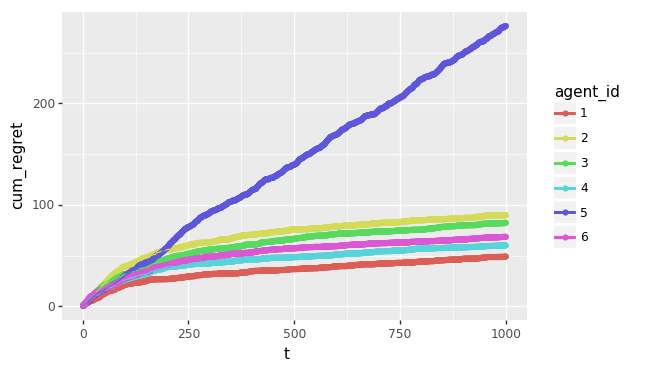

<ggplot: (8735724118545)>


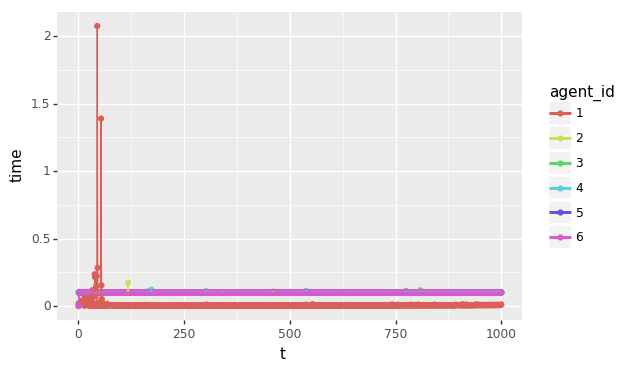

<ggplot: (8735813234285)>
theta [-0.41821323 -0.54193361 -0.6079099   0.92756663  0.56241205 -0.64953357
  2.1724167  -0.20336104 -0.31678462  0.0668336   0.99628392 -0.53362756
 -1.53335996 -0.34180059  0.71207739 -0.13547203  0.50596768 -0.64883839
  0.35781762 -0.7984709   1.00992504]
Experiment: Step 0
 Laplace sample: array([ 0.18288791, -0.63079466, -1.21381217,  0.78519476, -0.20842703,
        0.11027023,  0.79378366,  0.88162215,  0.05350821, -0.0750463 ,
       -1.14850989, -1.80982655,  0.57485893,  0.72791797,  0.58160299,
       -0.40994283, -0.1757383 , -0.3180547 , -1.7343642 , -0.03655236,
        2.33107781])
 Sample: array([-0.84580325, -1.187271  , -0.73727679, -0.12061525, -0.13061594,
       -1.56964437, -0.39677266, -0.25415158, -1.79459591, -1.80413309,
        0.80544783, -0.23718354, -0.21982993,  0.03097049, -0.76303873,
       -1.45058014, -0.86118589,  0.93565283,  0.0855388 , -1.24226797,
        2.18975391])
 Sample: array([-0.88895311, -0.73293581,  0.269

 Steps taken: 347
 Sample: array([ 2.19501224,  0.23370313,  0.00337344, -2.01951362,  1.62963997,
        0.7563027 ,  1.11662428,  0.14054374, -0.90765215,  0.75040228,
        0.77258596, -0.96564542, -2.29896916, -2.41126951, -0.67707767,
        0.85581215,  0.72143851,  1.30142922,  1.54204415, -2.14838752,
       -1.27861745])
 Sample: array([-1.05363569, -0.06294493, -0.67344398,  0.49153825, -0.18887934,
       -1.06029406,  0.35854108, -0.90123353,  0.76256968,  0.80411388,
       -1.74888411, -0.73475818, -1.74008802,  0.71789296,  0.33618704,
       -1.2256521 , -1.2452647 , -0.24240828,  1.41703222,  0.70240132,
       -1.49018355])
 Steps taken: 1231
 Sample: array([-0.67362854, -0.47129788, -0.63125848,  1.3869803 , -0.10427551,
       -0.37924701, -0.40228943, -0.16709341,  0.67478836,  1.03807292,
        0.73404013, -0.74169201, -0.48796482,  0.05857238, -0.11363353,
       -0.25965706, -0.59684227, -0.74512882, -0.31916153, -0.36673912,
       -0.1527572 ])
 Accept p

 Steps taken: 352
 Sample: array([ 0.15563872, -0.17366097, -0.99688185, -1.16929573,  0.94882047,
        1.43681765,  1.05711482,  1.51340061, -1.42730479,  0.42867978,
        0.59667211,  1.53848079,  0.47706947, -0.80482824, -0.44605186,
       -0.02254225,  0.92445276, -0.04949668, -0.70456042,  1.41305676,
        0.97431312])
 Sample: array([-1.41573403,  1.43533241, -1.9017806 , -0.21541639,  1.40047504,
        1.34169516, -0.43319313, -1.44228874,  0.99006702, -0.72565642,
       -0.22000311, -0.38863511,  0.7274435 , -0.43216212, -1.64601095,
       -0.5806488 , -2.49192494,  0.10049561, -0.61732229, -0.16105502,
       -0.00517184])
 Steps taken: 1295
 Sample: array([ 0.48821859,  0.95559216,  0.99248012,  0.23423296,  0.30850478,
        0.59664227, -0.27504357, -0.01867703,  0.43191505,  0.78214617,
       -0.19341585, -0.62199223, -0.76601029,  0.3398479 , -0.64581583,
       -0.05061868, -0.72831983, -1.42988016,  0.54691733, -0.80963888,
       -0.1588695 ])
 Accept p

 Steps taken: 341
 Sample: array([-0.39947671, -1.06910093, -0.28104011,  1.26483333, -0.10698188,
        0.13218443,  0.48596041,  0.52712867, -0.06195051,  0.36661189,
       -0.44853148,  1.03875614,  0.77720022, -1.1492254 , -0.9267832 ,
       -0.4667249 ,  0.75577879, -1.31301782,  0.97598034,  0.34854145,
        1.10924312])
 Sample: array([ 0.14548401, -0.25019002, -0.31781758,  0.43330966, -2.02473333,
        1.0178572 ,  1.06605931,  0.1520334 , -0.11328759,  0.77559393,
       -2.44836552, -0.4988621 ,  0.16785756,  0.16828858,  1.03980344,
        0.55601011,  0.0185451 , -0.64186967, -0.20298908, -1.2515457 ,
       -0.02192454])
 Steps taken: 1240
 Sample: array([-0.95706322,  0.56712311, -1.26654634,  0.52907533,  1.11174242,
        0.00366697, -0.74453587, -0.95052396,  0.02197036, -0.71776149,
        0.71586547, -0.28389914, -0.49791829,  1.43432869,  0.70554572,
       -0.70158255, -0.87777422, -0.53003124,  1.0652583 , -0.63119502,
        1.28300153])
 Accept p

 Steps taken: 344
 Sample: array([-0.92019621,  0.15530283, -0.58664283, -0.6753949 ,  0.57538216,
        0.23013046,  0.19531282, -1.14768793, -0.67047982, -0.06421115,
        0.55622816, -2.54290141, -2.00856574, -1.19921173,  1.42538006,
        0.55097382, -0.51000375, -0.94228262, -1.89254271, -1.18149046,
       -0.02145017])
 Sample: array([-1.40654245, -0.47502516, -0.34239554, -0.48071914,  0.81204626,
        0.36899579, -0.86551717, -0.38163068, -0.11846431, -0.90802451,
       -1.0057111 , -1.05565905, -0.31951485,  1.41452917,  2.48326262,
       -0.20717413, -0.53571207,  0.86170063,  0.14492262, -0.1368141 ,
       -0.08830009])
 Steps taken: 1261
 Sample: array([-0.37581996,  0.50900806,  0.13638956,  1.02240769,  1.12246259,
        0.22900403, -0.43628274,  0.20281002,  0.75708606,  0.0419324 ,
        0.69383998,  0.57971005, -0.74377032,  0.52457948,  0.36546063,
       -0.12644503, -0.98706037, -0.58797183, -0.05945337,  0.37929336,
        0.09768375])
 Accept p

 Steps taken: 301
 Sample: array([ 0.01702332, -0.1351665 ,  2.07248618, -1.35885896,  0.65351744,
       -0.53778059, -1.04298954, -2.49474061, -0.15408537, -0.0986617 ,
        0.53065016, -0.34028433,  0.99644651, -0.26007325,  1.21249239,
       -0.31182075, -0.90835374,  1.35198515,  0.56561944,  0.85251646,
       -0.54110987])
 Sample: array([ 0.68622915, -0.41588693, -0.45263953, -0.27085193, -0.53986132,
        0.33487336,  0.47833173,  0.06975892,  0.33577361,  1.4527064 ,
       -0.12076421, -0.81032755,  0.03669685,  0.09200171,  0.53493955,
       -0.30267132,  2.17307777, -0.92875704,  0.95410079, -1.26970124,
        0.46782987])
 Steps taken: 1161
 Sample: array([-1.0624843 , -0.44703975, -0.89190239,  0.17293966,  0.03474547,
        0.68917904,  0.54638814, -0.04064079,  0.58635139, -1.30547701,
        1.07413515,  0.69661805, -0.00187333,  0.60311538, -0.3414609 ,
       -0.28369643, -1.08862701,  0.48246622,  0.58076801, -0.71555155,
        0.18864932])
 Accept p

 Sample: array([-0.12634041, -0.63395535, -0.00364199, -0.0543645 , -0.93990515,
       -0.04350941, -0.46098509, -2.03431523,  1.14787764,  0.03278738,
       -0.40788633, -1.64150877, -0.99194023,  0.02066207,  0.89778126,
        1.74661408,  0.62353514, -0.38551459, -0.14375303, -1.68542064,
        0.02744907])
 Steps taken: 1166
 Sample: array([-0.4622435 , -0.85897255,  0.63003862,  0.73714128,  0.83797226,
        0.79616464,  0.87217646, -0.78655042,  0.51667486, -0.34169514,
        1.21558759,  0.44370274,  0.40389849, -0.1009672 , -0.39073879,
       -0.10213475, -1.29934555, -1.34662052, -0.06988838,  0.05907103,
        0.73742139])
 Accept proportion: 0.397701
 Steps taken: 435
 Sample: array([-0.0112447 ,  0.59435143,  0.37528196,  0.05984297,  1.5100243 ,
       -0.34889714,  2.38268336, -0.92955669,  0.91255046,  0.17632664,
       -0.10432728,  0.86288322, -0.46918529, -0.6125653 , -1.28022549,
       -0.32167166, -0.24828141, -0.85559608,  1.03760628,  0.77849028,
 

 Sample: array([-0.18845186, -0.41600373,  0.18828551,  1.1437009 , -0.08356859,
       -0.05492315,  1.03261203,  0.55278948,  0.11761135,  0.63974968,
        1.36072499,  0.3817757 ,  0.25442417,  0.02859226, -0.21012609,
        0.84809235, -0.91325404, -0.52620944,  0.44420599, -0.3233985 ,
        0.32694102])
 Accept proportion: 0.349537
 Steps taken: 432
 Sample: array([-0.21054477,  0.91886212,  0.74493738,  0.19728959,  1.86948188,
        0.24095611,  2.08472703, -1.68930666, -1.01443566,  2.31625207,
       -0.68815682,  1.19948916, -0.36010214,  0.66630956, -0.43804134,
        0.3024123 , -0.23864877,  1.15145083, -0.06570587, -1.64605535,
        0.35709138])
 Steps taken: 1285
 Sample: array([-0.47363568, -2.17903742, -0.52568815,  0.74070346, -0.68555797,
        0.69361906,  2.4232948 ,  0.16166358, -0.41598388,  1.23110266,
        0.05343644, -0.41592666,  0.39805525, -0.61405656, -0.58312378,
       -0.72771387,  0.2670359 , -0.48191767,  0.26325317,  0.37619483,
 

 Sample: array([-0.39057778, -0.83496243,  1.24202295,  0.03895167,  0.44714894,
        0.27744979,  1.44399075,  0.06888824, -0.2071546 , -0.65605944,
       -0.55563742,  0.50217966, -0.10762456,  0.16471917,  0.81855693,
       -0.09595611, -0.88204634, -0.84815254,  0.5674315 , -0.58625387,
        0.94875659])
 Accept proportion: 0.423810
 Steps taken: 420
 Sample: array([-0.15705315, -0.34815541,  0.10946145,  2.60795242,  1.43697878,
       -0.55520628,  2.30848459, -1.50401323,  1.26832913,  1.31473922,
        0.94653645,  0.26528604, -1.0610006 ,  0.27895468,  0.96197337,
       -0.02828258, -0.62518195,  0.68685299, -0.01988276, -1.36031363,
        1.33019248])
 Steps taken: 1272
 Sample: array([-0.76720453,  1.94238566,  0.21067076, -0.98223295, -0.63172331,
       -1.58901593,  0.17815058, -0.00539278,  0.45157463,  1.4804029 ,
       -0.01370658, -0.92004706,  1.21166275,  0.78165221, -0.09792517,
        0.7871773 , -0.24868791, -0.24107167, -0.49290921, -1.54027844,
 

 Sample: array([-0.44065868, -0.10973904,  0.45360789,  0.92002777,  0.1500001 ,
        0.31594729,  0.85326277,  0.09230916, -0.1393793 , -0.48009899,
        0.38935408,  1.05868663,  0.48522838,  0.1623482 , -0.16686161,
        0.12416548, -0.37100129, -0.23203366,  1.36787028, -1.00873796,
        0.62208791])
 Accept proportion: 0.378049
 Steps taken: 410
 Sample: array([-0.16258323,  0.14950306,  1.05340701, -0.0084212 ,  1.61869582,
        0.88489086,  0.53992426,  0.72279468, -1.27281163,  0.77623144,
       -0.82003248,  0.23387424, -0.9914641 , -0.23501332, -0.22556781,
        1.44065432, -0.71987251,  0.03392774, -1.39695492,  1.07146061,
       -1.11862354])
 Steps taken: 1081
 Sample: array([-1.37263383,  1.12111367,  0.07600189, -1.17836661, -0.23907542,
        0.67253756,  2.19238802, -0.3556104 ,  1.90911706,  0.01924198,
       -1.56801958, -0.80545847,  0.10171436, -0.39548146,  1.76635271,
       -0.97859503, -1.53693666, -0.34909037,  0.10534164, -0.13905429,
 

 Sample: array([-0.4979715 , -0.52224407, -0.21887134,  0.31855658,  0.09133654,
       -0.41083399,  0.69135226, -0.93217256, -0.18365693, -0.80120748,
        0.37070827,  0.42834791,  0.07153973,  0.1438307 ,  1.41046614,
        0.33307701, -1.32429779, -0.20145536,  0.69699515,  0.37530995,
        1.34418427])
 Accept proportion: 0.441975
 Steps taken: 405
 Sample: array([ 0.42700715,  0.46443866, -1.69683372,  1.95910326,  0.6991272 ,
       -0.50932622,  1.76667539, -0.7213777 , -0.52257216,  1.37740949,
       -0.62361269, -0.48754882, -2.36887617, -0.86124216, -0.29918202,
       -0.26753134, -0.62960514, -1.01335567,  0.01364077,  0.99138111,
       -0.69375597])
 Steps taken: 1083
 Sample: array([-1.28557382,  0.71430561, -0.08731097, -0.60171638,  0.5492376 ,
       -1.04693293,  2.48727379, -0.10006325,  1.1631669 , -1.4422205 ,
        1.25935548, -0.84619212, -0.50786809, -0.07210494,  1.32760289,
        0.31184333,  0.21815071, -1.03254942,  1.4726717 ,  1.08971785,
 

 Sample: array([-0.1575895 , -1.14436732, -0.07575457, -0.08925177,  0.46673728,
        0.07612428,  0.57428326, -0.8660147 , -0.00354258, -0.38920055,
        0.59768446,  0.33914552, -0.00715324,  0.3439077 ,  1.03520645,
        0.14709401, -0.74847654,  0.31836281,  0.33670244, -0.21872296,
        0.31640934])
 Accept proportion: 0.325871
 Steps taken: 402
 Sample: array([ 0.16859601,  0.05611421, -0.32309464,  0.65927211,  0.62915883,
       -0.75634586,  1.76589165, -1.09438633,  0.77710487,  2.09235039,
       -0.38088812, -0.35668967, -1.1862249 ,  0.25772038, -0.17707372,
       -0.10062109,  0.40691459,  1.16629623, -0.47332009, -0.06185153,
        0.76228628])
 Steps taken: 1073
 Sample: array([-0.89007191, -0.42765843, -0.03819073,  1.49289322,  0.29251778,
       -0.00385524,  2.51215333, -1.16116018,  1.11998889,  0.43953427,
       -1.91639665, -0.5154404 , -0.29631504, -0.42313676,  0.67763925,
        0.18198974, -1.16607932, -0.47976289,  0.59538433, -0.7440754 ,
 

 Sample: array([ 0.15987862, -0.83860087, -0.30126525,  0.40977805,  0.09831047,
        0.62189798,  1.72324352, -0.19628551,  0.03811326, -1.19188436,
        0.55522964,  0.74396707, -0.36662647, -0.97578447,  0.06985299,
       -0.23677056, -1.00467539, -0.84693626,  0.72911454, -0.62111832,
        1.06059151])
 Accept proportion: 0.382872
 Steps taken: 397
 Sample: array([ 0.46946726, -0.90799787,  0.28432895, -0.99884263,  0.80263686,
       -0.17391674,  2.28699485,  0.67296797,  1.17800312,  1.62832928,
        0.06323101,  0.04414409, -0.29122731, -0.5558878 , -0.22026   ,
       -0.96141503, -0.10159974,  0.86526471,  0.40506314,  0.78496209,
        1.09816422])
 Steps taken: 1083
 Sample: array([-0.5348671 , -0.04203968, -0.48233988,  0.81712773, -0.65011955,
        0.04783434,  2.41491041, -1.64367086,  0.41176044,  0.60141427,
       -0.16051944, -1.46941177, -0.36488531, -0.09710595,  0.30555632,
        0.06296445,  0.09449803, -0.99284909,  0.17328915, -1.06771419,
 

 Sample: array([ 0.17371861, -0.07436648,  0.17466363,  1.56545173, -0.49249197,
       -0.17798094,  2.49377245, -0.08591735, -0.47110025, -0.19296453,
       -0.01565762, -0.14292732, -1.32863449,  0.36822962,  1.20053266,
       -0.46657412,  1.1340528 ,  1.74229664, -0.63522194,  0.19857322,
       -0.55471259])
 Steps taken: 1067
 Sample: array([-0.54561537, -0.01276853, -1.71629137, -0.38637881, -1.05181728,
        0.51251939,  2.66614822, -1.40988627,  0.37614682,  0.45785715,
        0.32265875,  0.21310987, -0.04763637,  0.3176059 ,  0.66250274,
       -2.48827598,  0.49735568, -0.76888932, -0.93598166, -0.04506206,
        0.24678648])
 Steps taken: 837
Experiment: Step 53
 Laplace sample: array([-49.81243847, -56.31238875, -32.07724816,  -4.79429646,
        22.01850532,   4.64811442,  53.57920271, -10.71438322,
       -69.53556866,   7.19794554,  58.80105554,  -7.30096274,
       -37.83714416,  18.7261161 , -33.46550264,  23.9928968 ,
       -10.37848829,  20.24312772,  68

 Sample: array([-1.06790035,  1.75980863, -0.29910364, -0.22047052,  0.20919174,
       -0.73625882,  2.49677152, -1.69492243, -0.39317309,  0.03530989,
       -0.06078829,  0.20101033,  0.37798501,  1.0358306 , -0.03722643,
       -0.58468024, -0.01056195, -0.25795825, -0.2064388 ,  0.21009042,
        0.01148754])
 Steps taken: 834
Experiment: Step 57
 Laplace sample: array([-104.44706718, -127.52488782,  -38.80095205,   61.53113529,
         -3.37648785,   30.71232263,  111.54437505,  -30.85541932,
       -160.48914448,   47.93822504,   51.84769272,  -29.23468317,
        -77.49444982,   57.27621109,  -59.73065025,  120.35978983,
        -41.23249932,   22.00512362,  157.80358743,  -72.31366875,
         92.35938614])
 Steps taken: 319
 Sample: array([-0.07466069, -1.44508282,  1.64468352, -0.32527414,  1.38975109,
       -0.98741594,  1.16144441, -1.21199318,  1.48365446,  1.19680895,
        1.52761653,  0.11732436, -0.9245394 ,  0.43209639,  0.28222463,
        0.62203055, -0.714

 Sample: array([-1.39400665,  1.03863191,  0.18043328,  0.25812871, -0.2436668 ,
       -0.116143  ,  2.20245952, -0.57127361,  0.19815623, -0.39950364,
       -0.43340431, -0.03888777,  0.17456903, -0.05337111,  0.97091629,
       -1.3141919 , -1.04758161, -0.85446252,  0.38940367, -0.92562286,
        0.14046337])
 Steps taken: 679
Experiment: Step 61
 Laplace sample: array([-107.50559591, -130.39360261,  -38.68231165,   71.07989035,
          2.02609081,   33.59953132,  120.10956989,  -32.7397975 ,
       -180.11754248,   50.69359991,   55.41485874,  -24.7850568 ,
        -82.44388724,   55.91087098,  -52.93802023,  131.64714199,
        -37.33452032,   28.63493216,  174.34945045,  -77.5792398 ,
         89.1988955 ])
 Steps taken: 314
 Sample: array([ 0.64490664,  0.0494832 ,  1.81887236, -0.66924796,  2.35844997,
        0.07395289,  1.52016721,  0.51085554,  0.69407694, -0.29144558,
        1.08143014, -0.56202069,  0.40754292,  0.56461475,  0.91306346,
        0.6404809 , -0.504

 Sample: array([-0.82227864, -0.92502204, -0.2040431 , -0.02417907, -0.13810266,
       -0.08305627,  1.38840813, -1.41040644,  0.54779243,  0.61499619,
        0.32095168, -1.39946663, -1.23763955, -1.04907536,  0.47338482,
       -2.0279902 , -0.62412749, -0.2542807 , -0.83028698, -0.43382183,
        0.61735453])
 Steps taken: 832
Experiment: Step 65
 Laplace sample: array([-105.82413771, -105.40335268,  -48.61614793,   58.21743512,
          9.01498779,   36.73308263,  141.12500088,  -37.93016885,
       -192.5967484 ,   59.00712549,   82.4475844 ,  -33.94754302,
        -86.36256888,   31.20036911,  -28.33932959,  134.5825709 ,
        -40.23094213,   25.16765857,  152.65830552,  -74.84035682,
         90.5263706 ])
 Steps taken: 312
 Sample: array([-0.17296069, -0.33551517,  0.92102726,  0.05726356,  1.32713536,
       -0.64094461,  1.71519248, -0.46907121,  1.1449472 , -0.06023628,
        1.71071489, -1.12653782,  0.92395406, -0.98535284, -0.76168873,
        0.94814426, -1.042

 Sample: array([-0.68991504,  2.40666978, -0.18095367,  0.68821197, -0.67604174,
        0.45006232,  1.86185133, -1.2666836 ,  0.9703996 ,  0.17934435,
        0.98431957, -0.02198593, -0.66595961, -0.06875848, -0.24331495,
       -1.43425369, -0.62250143, -0.95610382, -1.14117474,  0.08580993,
        1.79500479])
 Steps taken: 838
Experiment: Step 69
 Laplace sample: array([-100.75216879,  -93.80415827,  -43.69805117,   74.04274522,
         22.99855479,   46.00652433,  141.74706277,  -47.19385889,
       -197.99166028,   55.85128685,   86.81820915,  -21.938129  ,
       -101.40147868,   36.08220215,   -8.47203905,  114.49177705,
        -40.74929993,   23.01710042,  150.92917503,  -75.98535622,
         74.71910232])
 Steps taken: 309
 Sample: array([-4.35178412e-02,  8.79756279e-01, -1.00321165e+00, -7.32119842e-01,
        2.35706155e-01,  2.98069221e-01,  7.44804229e-02, -6.73581651e-01,
        8.39559786e-01, -1.27119459e-04,  1.18098732e+00, -1.60898246e+00,
       -2.3700597

 Sample: array([-0.55537546, -0.6530193 , -0.38401509,  0.34627906, -0.43704216,
       -0.74031736,  1.9832402 , -1.0725194 ,  0.15738955, -0.16282254,
        1.32955729, -1.63123638, -0.04618879, -1.12730995,  0.25938467,
       -0.93704039, -1.5713323 , -0.01905754, -0.01581135, -0.03658021,
        1.18856625])
 Steps taken: 837
Experiment: Step 73
 Laplace sample: array([-15.18585176, -13.69072933,  -6.75458466,   6.2364398 ,
         1.82335826,   2.29188748,  18.02613435,  -3.17685761,
       -20.73575649,   9.87853622,  13.36554636,  -5.72860595,
       -12.32406773,   2.56923177,  -7.46883239,  15.29382775,
        -7.0725543 ,   3.42359488,  21.15565492,  -5.8624926 ,
        13.11663005])
 Steps taken: 300
 Sample: array([ 0.31165789, -0.52428483, -0.62460789,  1.97440467,  0.95503242,
       -0.29603336,  3.07800713, -0.16534222, -0.57830046, -0.00457669,
        0.52905656, -0.97813388,  0.38783605,  1.73371605, -2.14981265,
        0.14737724, -0.48437849, -0.90307816, -

 Sample: array([-2.12644710e-01,  7.99971329e-01,  7.46085218e-01,  6.73267247e-01,
       -5.20822126e-01, -5.59369669e-01,  1.32620882e+00, -7.47122753e-01,
       -8.17939847e-01, -3.17316908e-01, -3.41729702e-01,  3.09666613e-01,
        5.50875411e-04, -1.32889761e+00,  1.05953800e+00, -1.76890445e+00,
       -6.47175066e-01,  2.81227661e-01, -6.72237730e-03,  1.56129842e-01,
        5.72339546e-01])
 Steps taken: 834
Experiment: Step 77
 Laplace sample: array([-4.98118039, -2.06443419, -4.35097015, -0.28757335,  0.39835933,
       -0.98980993,  4.21558705, -0.8362043 , -6.70946732,  1.82170117,
        5.31239281, -0.606595  , -2.51392472,  0.53405672, -2.24008802,
        3.19556726, -1.02875183,  0.67802566,  4.93264185, -0.07963891,
        4.81096767])
 Steps taken: 301
 Sample: array([-0.43144431, -0.96027603,  0.00651928, -0.86151003,  1.17495104,
       -1.46393729,  1.53284557, -0.23068011,  0.83691607, -1.1099469 ,
        2.29893488, -0.85787698,  0.29964585, -0.5929759

 Sample: array([-0.78254762,  0.42630958, -1.23199933, -0.07695638, -1.05235917,
       -2.43817844,  1.77540086, -0.82608622, -0.1924988 , -0.1098541 ,
       -0.25290835, -0.37155788, -0.51437109, -0.13247801, -0.33517746,
       -0.31876016, -1.18689804, -0.79881962, -0.1189714 , -2.17327473,
        0.50495773])
 Steps taken: 834
Experiment: Step 81
 Laplace sample: array([-4.71671603, -2.69396353, -2.07815506,  2.52353069,  0.19346151,
       -0.36786053,  3.88533323, -1.28202207, -5.37003582,  1.11063625,
        4.09962033, -0.38840297, -3.26249015,  1.6666849 , -3.48268092,
        2.69569158, -2.06818112,  1.24896632,  5.81448738, -1.31270853,
        3.88265471])
 Steps taken: 301
 Sample: array([-0.65922552,  0.65363155, -0.21681425,  0.56365858,  0.24963762,
       -1.38881148, -0.17816045, -0.18775232,  1.03747953, -0.37164758,
        1.13427731, -0.83440353, -0.00312015,  0.07601893,  0.2723604 ,
        0.64896912,  0.79508761, -1.77837852, -0.96158051,  0.93150237,
   

 Sample: array([-0.07918889,  0.58643566, -0.82359223,  0.29320668, -0.36817912,
       -0.76911933,  1.28823936, -0.93222322, -0.02090693,  1.52946164,
        0.27590099,  0.41567644, -0.687109  , -0.1586181 , -0.40081637,
       -0.90972351,  0.13721606,  0.62643875,  0.39241485, -0.02111836,
        0.23432609])
 Steps taken: 835
Experiment: Step 85
 Laplace sample: array([-4.65718197, -3.5128404 , -3.72279152,  2.25516902,  2.42996638,
       -1.26203317,  4.19828828,  0.08876048, -5.26726312,  1.1393683 ,
        3.15054935,  0.90087218, -1.48048134,  1.16494656, -1.93691567,
        2.24161718, -1.29810162,  1.16615728,  6.50822357,  0.26899856,
        3.55866056])
 Steps taken: 298
 Sample: array([-0.47757945, -0.73799086, -0.26670059, -1.29466999,  1.34388693,
       -0.80327903,  0.96662979, -0.14291834,  0.65047349, -1.20398996,
        1.36410786, -1.20938608, -0.30289477,  0.12354352, -0.25927013,
       -0.34447668, -0.35994908, -1.12355225, -0.00918197, -0.00196149,
   

 Sample: array([-0.46039123,  1.09770746,  0.04237572, -0.54439988,  0.09083292,
       -0.82901896,  1.82855756, -1.88698662,  0.02879827, -0.50956629,
       -0.63747569,  0.05647552, -1.53183811, -0.15572612,  1.48584521,
       -0.9615279 ,  0.14546051, -0.055551  ,  0.52480319, -0.57177159,
        0.30024438])
 Steps taken: 822
Experiment: Step 89
 Laplace sample: array([-2.90548706, -0.70295165, -1.33879355,  2.40300039,  1.38206992,
        0.82760324,  1.81801245,  0.6883786 , -3.31058895,  0.39997397,
        2.8313342 , -0.29252685, -2.49021042,  1.81231303, -2.49386908,
        1.04873438, -0.60164758,  2.54034562,  4.80954063,  0.29885177,
        1.67356134])
 Steps taken: 295
 Sample: array([-0.53378593, -0.67732321, -0.10067501,  0.40675789,  1.28594926,
       -1.18254948,  0.50977245,  0.72765185,  0.35674476, -0.21660091,
        1.27511898, -1.16209464, -1.13184347, -0.3854061 , -0.78955666,
       -0.43804991,  0.98863129, -0.98825859, -0.0154378 , -0.00953347,
   

 Sample: array([-0.87019249, -0.50308838,  0.11273528,  0.1503908 ,  0.32974591,
       -0.56630192,  2.06243759, -0.91607572,  0.48074914, -0.52071646,
       -0.24462776,  0.04416901, -0.11163232, -0.42918795,  0.02693181,
       -1.28948837, -1.09609976, -0.23676218,  0.41184309,  0.01307202,
        2.3665904 ])
 Steps taken: 833
Experiment: Step 93
 Laplace sample: array([-3.47276734, -2.32342063, -1.64908056,  1.01906826,  1.55932795,
       -0.30592336,  3.59132538, -0.74737696, -2.9933984 , -0.74253114,
        2.71955415, -1.11759352, -3.05225046,  1.7886532 , -2.37881665,
        0.27861953, -1.72886783,  2.63050942,  4.79087283, -0.90105405,
        2.30502754])
 Steps taken: 293
 Sample: array([-0.53366147, -0.62963596, -0.79109355, -0.09834439, -0.18171439,
       -1.02805532, -0.06483127,  0.40563254, -0.46164063,  0.4693841 ,
        1.475113  ,  0.08082314, -0.07446836, -0.0688781 ,  0.91507894,
        0.07625602, -0.784772  , -0.37526377, -0.83995293,  0.36495396,
   

 Sample: array([-0.39107312, -0.62845591, -0.61581868,  0.45479198,  0.02712987,
       -1.97800931,  2.80791865, -0.31558796, -0.25250855,  0.05434608,
        0.59136372, -0.84451652, -0.72537847, -0.62805492,  0.5430017 ,
       -1.53560374, -0.20996662, -0.14213311, -0.21327374, -1.9902364 ,
        1.59952786])
 Steps taken: 833
Experiment: Step 97
 Laplace sample: array([-3.37413344, -1.68532388, -1.08249576,  1.52292001,  0.23007786,
        0.744091  ,  3.0742485 ,  0.7703633 , -3.15010142,  0.49255903,
        4.13249418, -0.27308173, -1.46691844,  2.16155211, -2.55329133,
        1.0649302 , -0.92579032,  1.96279328,  4.41987709, -2.13198487,
        2.27552321])
 Steps taken: 344
 Sample: array([-0.25355372, -0.20596094, -0.18390451,  0.18850193, -0.0533199 ,
       -0.95775097,  0.75865451, -1.36123076, -0.01480114,  0.99296563,
        1.34079684, -0.15167301, -0.28533817,  0.49233516,  0.91037909,
       -0.44999335, -0.622065  , -0.76904659,  0.03616107,  0.18404308,
   

 Sample: array([-0.99818286,  0.97997598, -0.07356077, -0.39066568,  0.11571058,
       -1.26574453,  2.300909  ,  0.29547389,  0.10229114, -0.58644686,
        0.33673685, -0.13787332, -0.45277426, -0.9589482 ,  0.30333729,
       -0.39224462, -0.61734287, -0.29764787,  0.21310806, -0.67850655,
        0.4913459 ])
 Steps taken: 830
Experiment: Step 101
 Laplace sample: array([-2.46502907, -1.55327323, -2.68394873,  0.95134298,  0.43602319,
       -0.3367473 ,  2.71656939,  1.00983831, -3.33313339, -0.24565123,
        1.81206496, -0.68011163, -0.64522448, -0.56522436, -1.7806007 ,
        0.56297522, -0.48872099,  0.59803669,  2.91164205, -1.46511953,
        2.07031952])
 Steps taken: 287
 Sample: array([-0.35623144,  1.11702553, -0.50929875, -0.1366688 ,  0.60137909,
       -0.49885205,  0.78147247, -0.82730258,  0.46073934,  0.09673092,
       -0.04437292, -1.47665158, -0.625038  ,  0.30125494, -0.72223099,
       -0.2364432 ,  0.89460395, -0.91820466, -1.20985567,  0.58769158,
  

 Sample: array([-0.61630376,  0.86500185, -0.06817428, -0.43625551,  0.26276007,
       -2.16089827,  3.86139463, -0.65048124,  0.19994018,  0.2286308 ,
        0.32989564, -0.5169019 , -0.80388139, -0.79349534,  1.05888409,
       -0.52228472,  0.84750533, -0.61076723, -0.66304011, -0.31651748,
        2.10931887])
 Steps taken: 833
Experiment: Step 105
 Laplace sample: array([-3.025252  , -1.53385091, -3.36415266,  1.14506877,  0.71774561,
       -2.00557538,  3.55864889, -0.57131816, -3.77816186,  0.23292029,
        3.95160593,  0.33111265, -1.05230479,  0.60503804, -0.27077632,
       -0.90891779, -0.4203067 ,  0.84687783,  3.08353334, -0.30894412,
        2.40494458])
 Steps taken: 172
 Sample: array([-0.52775822, -0.55607936,  1.07682187,  0.35591562,  0.95718279,
       -1.81454845,  0.52265749, -0.99716452,  0.83281974, -0.4217134 ,
        1.35293497, -1.41757005,  0.5676774 , -0.84889962, -0.87246924,
       -0.3062307 , -0.14287001, -0.85834153,  0.43825804, -1.28328565,
  

 Sample: array([-0.6252526 , -0.53859483, -1.79190745, -0.71430044,  0.05554167,
       -1.79618025,  2.54505519, -0.73323407, -0.75419305,  0.18969214,
        1.30405409, -0.4778745 , -1.0658294 ,  0.14682724,  1.02037778,
       -0.85698206, -0.55327703, -0.23549883,  0.26687445, -1.02378563,
        0.44183018])
 Steps taken: 828
Experiment: Step 109
 Laplace sample: array([-2.21325089, -1.33266601, -2.40726495,  2.07399063,  1.39820356,
        0.15099734,  1.67688072,  0.55141729, -2.5414117 ,  1.34484466,
        3.8263445 , -0.86519444, -0.60127967, -0.15876402, -1.65416146,
       -0.44959205, -0.58857589,  2.28660992,  3.38964647, -0.19866583,
        0.96491986])
 Steps taken: 283
 Sample: array([-0.44124566, -1.01558662, -0.27900815, -0.22851761,  0.29599797,
       -1.29835777,  1.18403335,  0.98508442,  0.66361557, -0.51625541,
        1.58310364,  0.02714445, -0.82415729, -0.66066035, -0.74734206,
       -0.66326899, -0.12993215,  0.19410961, -0.65650285, -0.18848589,
  

 Sample: array([-0.61735999,  0.15101601, -0.56187454, -1.16087565,  1.76484787,
       -1.33366512,  1.33318088, -0.66635066,  0.58842112, -0.70407977,
        0.1483164 , -0.57708122, -0.17441209, -1.86661098,  0.6299686 ,
       -1.31577379, -0.45241184,  0.57340903, -0.68530083, -1.3472373 ,
        0.86947265])
 Steps taken: 835
Experiment: Step 113
 Laplace sample: array([-2.67658849, -2.13959817, -2.89035969,  0.78309914,  0.66692334,
       -0.41610968,  3.20494287,  1.26627149, -2.36869328, -0.0501321 ,
        2.37448495, -1.38761748, -1.86193401, -0.31626328, -2.09530028,
       -0.44134648, -1.15594264,  0.58290498,  4.57572451, -0.683678  ,
        2.34636175])
 Steps taken: 282
 Sample: array([-0.696806  , -0.8901053 , -0.51427561, -0.00471034, -0.41486736,
       -0.69097191,  1.41524008,  0.38298103,  0.67019339, -0.9819139 ,
        1.30303358,  0.38666529, -0.35159899, -0.18942655, -0.15620439,
        0.14198925,  0.32176102, -2.85447697, -0.47019566,  0.55398822,
  

 Sample: array([-0.63993867, -0.53446708, -0.60202868,  0.08429071,  1.37053932,
       -1.24056738,  1.66391867,  0.60087212, -0.69683441, -0.3132682 ,
        1.02333338, -0.44840358, -0.84560157,  0.4072472 ,  0.69910958,
       -2.3868702 , -0.42426442, -0.11015427,  0.57424282, -1.32380428,
        2.18079269])
 Steps taken: 830
Experiment: Step 117
 Laplace sample: array([-2.26746072, -1.67093542, -1.76206011,  2.20671351,  1.46200262,
       -0.64406948,  3.25461586, -0.35065254, -3.555322  ,  1.06629016,
        3.32953907,  0.01861871, -1.04076797, -0.29619649, -0.96607675,
        0.75080575,  0.19594202,  1.20497182,  4.13427374, -1.04845017,
        1.00916745])
 Steps taken: 278
 Sample: array([-0.39171339, -0.73787107,  0.71422256,  0.24469054,  0.35383311,
       -1.07507383,  0.88574891,  1.13773078,  0.65529208, -0.16193011,
        0.93690749, -0.01288973, -0.43355057, -0.0854118 , -0.50816812,
        0.22786991, -0.08603701, -0.70262973, -0.38130162, -0.0625554 ,
  

 Sample: array([-3.10319277e-01,  1.99209121e-01, -4.08843927e-01, -3.13779334e-01,
       -1.00601410e-01, -4.65228136e-01,  2.40471283e+00, -3.64649078e-01,
       -1.60316222e+00, -4.74676149e-01,  5.03161476e-01, -1.56934622e+00,
       -4.63160044e-01, -2.59984639e-02,  1.74601086e-02,  1.99108018e-02,
       -2.11340224e-01,  7.06742912e-01,  2.39929151e-03, -3.97446401e-01,
        1.56278142e+00])
 Steps taken: 826
Experiment: Step 121
 Laplace sample: array([-3.08348497, -1.4160973 , -1.95908266, -0.32780988, -0.98131015,
        0.41467889,  2.99235154,  0.10971884, -2.9047251 , -0.54019836,
        4.18281584, -1.31097391, -2.25516878, -0.57695041, -1.52535587,
       -1.2597245 ,  0.1123168 ,  0.93397842,  3.93105169, -2.71305191,
        2.42870295])
 Steps taken: 191
 Sample: array([-0.24445244, -0.21880488, -0.87408828, -0.45694218,  0.59896343,
       -0.95979439,  0.4366411 , -1.28925548,  0.40605135, -0.17893332,
        0.5031596 , -0.49861452, -0.40041097,  0.920942

 Sample: array([-0.55072773, -0.25111061, -0.65212928, -0.90205093,  0.06645017,
       -1.41213647,  2.51874714, -0.29078888, -0.47854744, -0.00842775,
        1.94924257, -0.72767177, -1.27719575, -0.20630098,  0.94247769,
       -1.58739175,  0.24602296, -0.49962255, -0.16914256, -0.63167605,
        1.10123344])
 Steps taken: 751
Experiment: Step 125
 Laplace sample: array([-2.60697138, -3.13963141, -1.98062915, -0.13748498,  0.45907296,
       -0.28787357,  3.88494024,  0.20001515, -2.34577826,  0.11658368,
        4.11233755, -0.9652851 , -0.82586993, -0.34140482, -0.04372728,
       -0.04337432, -0.44460543,  0.81803815,  2.99155249, -1.27349728,
        2.10058276])
 Steps taken: 193
 Sample: array([-0.63972556, -0.44437921, -0.74407025,  0.46354821,  1.30109605,
       -2.284295  ,  2.31391431, -0.4847335 , -0.41188339, -1.02915901,
       -0.05143275, -1.31228513,  0.48971392,  0.84620104,  0.10993707,
        0.42538471,  0.22096976, -1.15856918,  0.1926601 ,  0.0285472 ,
  

 Sample: array([-0.51659423, -0.40624046, -0.31358207,  0.09089383,  0.67254639,
       -0.80539123,  1.49775032, -1.17974671, -0.44117564, -0.17068817,
        1.09385067, -1.48772977, -0.99493588, -0.32384931,  0.1517368 ,
       -0.52376123,  0.87616304, -0.60299782,  0.10621293, -0.10568577,
        0.65358248])
 Steps taken: 825
Experiment: Step 129
 Laplace sample: array([-2.3668557 , -2.99404819, -2.84341092,  0.8755576 ,  0.8562995 ,
       -2.04925656,  3.11203056,  1.11602634, -2.64683823,  0.94096258,
        3.89007886, -0.48630776, -1.2480539 , -0.8238677 ,  0.48373658,
       -1.14081119,  0.35063975, -0.0906033 ,  3.90340116, -3.22308086,
        1.38666868])
 Steps taken: 268
 Sample: array([ 0.00831971,  0.58922097, -0.86941705, -0.26566653,  1.25201755,
       -1.14926136,  1.56519528,  0.31986561,  0.12093983, -0.86896563,
        1.20333858, -0.3588472 , -0.08121813,  0.14130029, -0.85313687,
        1.29052   ,  0.99034501, -1.2732085 , -0.51462814, -0.60750591,
  

 Sample: array([-0.63180874,  0.69746734, -0.54150523, -0.29505601,  0.10159345,
       -0.3092533 ,  1.84154536, -0.67828473, -1.72219744, -0.69468141,
        1.0784266 , -0.34235994, -1.54911672, -0.02917815,  0.4761532 ,
       -1.71521139,  0.63034347, -0.2809146 , -0.73915045, -0.92526372,
        1.24164291])
 Steps taken: 825
Experiment: Step 133
 Laplace sample: array([-2.14356548, -2.82881033, -1.20270903,  0.08708346,  1.83814325,
       -1.01021365,  3.13719723,  0.31229092, -3.31211385,  1.83819406,
        3.50414639, -0.56959957, -1.91779799, -0.38633334,  0.5756105 ,
        0.10004616, -0.6254465 ,  0.77489631,  3.23732052, -2.71016921,
        1.65123393])
 Steps taken: 256
 Sample: array([-0.20794972, -0.63722906, -0.87052639,  0.7412039 , -0.38458315,
       -1.80014866,  0.87392591, -0.38173036,  0.09065766, -1.44006023,
        1.29367056,  0.05929818,  0.11621958, -0.20262398,  0.11938466,
        0.18907085,  0.25389426, -0.55786028, -0.11209633,  0.18804483,
  

 Sample: array([-0.53531056,  0.08981421, -0.66532596, -0.84408675,  0.51008111,
       -0.78601737,  2.13655471, -0.76481576, -1.32059197, -0.46414661,
        1.01568124,  0.13316598, -0.676561  , -0.79013201, -0.09348962,
       -0.53889168, -0.33355946, -0.41492339,  0.03548582, -1.19340713,
        2.01032818])
 Steps taken: 755
Experiment: Step 137
 Laplace sample: array([-1.61389529, -0.6618563 , -1.37445047,  0.75529147,  1.2131077 ,
       -1.46552879,  2.37457003, -0.20010691, -2.21291491,  0.09136945,
        3.79840835, -1.4252521 , -0.98012846, -1.29277979, -0.27858825,
       -1.3510276 , -0.45246248,  0.28934074,  2.49596999, -1.49095248,
        1.0798885 ])
 Steps taken: 257
 Sample: array([-0.31460737,  0.63111062, -0.49343606, -0.05115418,  0.50826163,
       -0.85486953,  0.95124275,  0.5538102 ,  1.274935  , -0.67075083,
        1.56405997, -1.4049236 , -0.49486123, -0.2860961 , -0.05937832,
        0.7687872 ,  1.23730068, -0.3953334 , -0.85885947, -0.13325973,
  

 Sample: array([-0.68313244,  0.14598927, -0.58978997, -0.25180577,  0.73030695,
       -0.18140855,  3.05664192, -1.10818738, -0.94658765,  0.06398993,
        0.67525421, -1.30702569,  0.08495233, -0.9885388 ,  0.13009481,
       -1.5130474 ,  0.51366136,  0.8168611 , -0.97497244, -1.19978625,
        1.50388603])
 Steps taken: 825
Experiment: Step 141
 Laplace sample: array([-2.04943153, -1.81592465, -2.25246819,  1.35464194, -0.13542111,
       -1.19320952,  4.14108091,  1.0065607 , -2.49476754,  0.43394112,
        3.76906039, -0.79880798, -1.0248825 , -0.30991791, -0.02569335,
       -1.8515756 ,  0.36158879, -0.83242027,  3.56014802, -1.34428666,
        1.09879598])
 Steps taken: 192
 Sample: array([ 0.02390615, -0.78432029, -0.48449221, -0.66079865,  0.02450767,
        0.07327398,  0.36699414,  0.10356757, -0.59630279, -1.20145297,
        1.49151079, -0.89165206,  0.43357549,  0.97960633, -0.62660082,
        0.53428561, -0.23369287, -0.5407518 ,  0.00833247, -0.72460307,
  

 Sample: array([-0.25261935,  0.12136098,  0.17587946,  1.59236574, -0.12505577,
       -0.2929064 ,  2.3176591 , -0.35352157, -0.1783402 , -0.91421862,
        0.11563462,  0.06020476, -0.13002923, -1.0207773 ,  0.14887234,
       -0.42663329,  0.28310287, -0.05633962,  0.77749638, -1.03025145,
        1.5726959 ])
 Steps taken: 761
Experiment: Step 145
 Laplace sample: array([-2.31225306, -1.01118621, -0.45705358, -0.48707745,  1.09857947,
       -0.29246638,  4.02505146,  0.33752062, -2.65785678,  0.9624892 ,
        4.51580555, -0.21376551, -2.61065936, -1.90721244, -0.24679476,
        1.31709224, -0.97445671, -0.61696792,  2.20537696, -1.29593917,
        2.3574183 ])
 Steps taken: 260
 Sample: array([-0.46799467, -0.35421756, -1.08875853, -0.32488211,  0.93015768,
       -0.71566062,  1.48204792,  0.06219188,  0.0903633 , -0.76202852,
        1.36596902, -0.27488598,  0.23398215,  0.06356128, -0.05134455,
        0.70662912,  0.73101479, -0.95987439, -0.96989599, -0.29923198,
  

 Sample: array([-0.25030102, -0.44505994, -0.5764577 ,  0.74033548,  0.74250066,
       -1.26915765,  2.46217972, -1.38516832, -0.05717412, -1.12833914,
        0.87117317, -0.8531007 , -0.36180622, -0.21832838,  0.17282967,
       -1.03084792, -0.53519012,  0.17806534,  0.28309786, -0.97080378,
        0.23690955])
 Steps taken: 751
Experiment: Step 149
 Laplace sample: array([-2.15351434, -2.5944602 , -1.14437906,  1.86281762,  2.01931295,
        0.1464151 ,  4.36847796,  0.50984607, -1.32671684,  0.28012753,
        3.70006065, -0.90481612, -1.31279417, -0.19824405,  1.04683949,
       -0.0569089 , -0.32229684,  0.9098838 ,  2.69837061, -3.31734698,
        1.64012596])
 Steps taken: 258
 Sample: array([-0.29281238, -0.4035295 , -0.27250585, -0.36620754,  0.60648097,
       -0.99165896,  1.20603644, -0.03245546, -0.48002677, -0.90604554,
        0.66924417,  0.0087322 , -1.33264217,  0.52910532,  0.55050915,
        0.64325081,  0.52201326, -1.33900898, -0.35563322, -0.6882487 ,
  

 Sample: array([-0.73463139,  0.19339653,  0.14780146, -0.06216982, -0.10269035,
       -0.79476856,  2.7206664 , -1.64877465, -0.88867497,  0.21396554,
        0.35691692, -0.90837258, -0.71459533, -0.05684596,  0.26465036,
       -0.94243084,  0.20104913, -0.04088622,  0.54453706, -1.40825832,
        0.65159407])
 Steps taken: 827
Experiment: Step 153
 Laplace sample: array([-1.32790245, -1.39806356,  0.12183069,  0.30185272,  0.25780118,
        0.63485143,  3.50196501,  0.33777572, -0.70139073, -0.4650982 ,
        2.80680466, -1.20803894, -2.34768744, -0.86510591,  0.49742791,
        0.66635158, -0.2286028 , -0.4861192 ,  1.37508161, -1.34859015,
       -0.14396263])
 Steps taken: 179
 Sample: array([-0.57142154, -0.38842066, -0.55027725,  0.21650224,  0.05413056,
       -0.61630126,  1.67858627,  0.5825675 ,  0.46005034, -0.50184418,
        1.69735283,  0.36021488, -0.17053194, -0.21967703, -0.15529362,
        0.92233305,  0.37126246, -1.26032949, -0.48901208, -0.31968987,
  

 Sample: array([-0.40011612, -1.0839357 , -0.22362909, -0.10856815,  0.40989609,
       -0.96577523,  2.58270159,  0.62362229, -1.08339443, -0.86002151,
        0.64529559, -1.06359617, -0.84440375, -0.45938524,  1.09338958,
       -1.39465111,  0.83025683, -0.08413972,  1.50364151, -1.11602591,
        1.20248611])
 Steps taken: 859
Experiment: Step 157
 Laplace sample: array([-1.65732102, -1.43581391, -0.54184145,  0.0755332 ,  0.705963  ,
       -0.15582038,  3.51152084,  0.63711047, -1.61116247,  0.04534036,
        2.88966018, -0.82124487, -2.68509881, -0.77615168,  0.04041231,
       -0.40287343,  0.07912838,  0.25019368,  1.50942912, -2.22176425,
        1.00832694])
 Steps taken: 267
 Sample: array([ 0.02023953, -0.55063442, -0.37384983,  0.19720603,  0.28147151,
       -1.57599559,  0.57756607, -0.34262722,  0.3423645 , -0.80037937,
        0.53072924, -1.05838159, -0.63130922,  0.07201079, -0.05765074,
        0.90381702,  0.37173117,  0.35277101, -0.2692164 , -0.51297012,
  

 Sample: array([-0.33595195, -1.23785651, -0.83476213,  0.66312323,  1.34729465,
        0.18118013,  1.96955264, -0.69052766, -1.53204858, -0.39209238,
        0.56538706, -0.97034489, -1.16238852,  0.18972627,  1.26861683,
       -0.10458012, -0.0281461 , -0.29165456, -0.06906063, -0.88682113,
        1.05164842])
 Steps taken: 754
Experiment: Step 161
 Laplace sample: array([-1.19571969e+00, -1.54687684e+00, -8.09860018e-01,  2.31524900e+00,
        1.30756013e+00, -4.68046200e-01,  3.27067146e+00, -6.82894166e-02,
       -9.93797214e-01,  2.28835815e-01,  2.55922640e+00,  3.36281029e-01,
       -1.52871000e+00, -5.12125259e-01,  9.74706850e-01,  8.27584468e-01,
       -1.18351615e+00,  2.84173889e-01,  1.08779719e+00, -1.04012485e+00,
       -1.64939323e-03])
 Steps taken: 252
 Sample: array([-0.12925395,  0.37096657,  0.13288733,  0.70598436,  0.925018  ,
       -0.89308636,  1.55892471,  1.06493075, -0.32672524, -1.08409635,
        1.04037866,  0.12455479, -0.59889677, -0.244470

 Sample: array([-0.55405437,  0.31260296, -0.50787341, -0.44263493,  0.49707272,
       -1.36628531,  1.83143746,  0.34501604, -0.56260113, -0.62461061,
        0.6755448 , -1.17930035, -1.04750837, -0.56699927,  0.7545432 ,
       -0.63802695,  0.4716318 ,  0.15102943, -0.5069991 , -1.53377779,
        0.86177742])
 Steps taken: 826
Experiment: Step 165
 Laplace sample: array([-1.93305733, -2.01588309, -1.4214024 ,  1.06726027,  1.51104684,
       -0.84371347,  3.91847705, -0.77010224, -1.67771644,  0.31795789,
        2.36795762, -0.74419393, -1.84464631,  1.0680879 , -0.24686827,
        0.67949462,  0.41150597,  0.72482577,  3.5351434 , -1.64064172,
        0.06970552])
 Steps taken: 167
 Sample: array([-0.7170903 , -0.2070007 , -0.90474647,  0.29465047,  0.00932729,
       -1.04213367,  1.88912949,  0.46277621,  0.21938349, -1.40070633,
        1.23616292, -0.63676966,  0.27919374,  0.47696967,  0.45490061,
        0.16117866,  0.60804577, -1.88119342, -0.45570805, -0.45733226,
  

 Sample: array([-0.67790256, -0.31974677, -0.720222  ,  0.13399971,  0.47495915,
       -1.31805069,  3.21954913, -0.47408775, -0.91297076, -0.44411719,
        0.3871904 , -0.6248208 , -1.717645  , -1.01631344,  0.20038282,
       -0.89523054,  1.01128236, -0.04275715,  0.21542459, -2.0810389 ,
        0.27788974])
 Steps taken: 826
Experiment: Step 169
 Laplace sample: array([-1.53518049, -1.96617463,  0.29316926,  0.9020776 ,  0.32776883,
       -0.64422225,  3.76806351,  0.04368648, -1.42289271, -0.09783132,
        3.05615998, -0.57849326, -2.91997001, -0.27236452,  0.54346405,
        0.97797466, -1.51423745,  0.90362814,  2.13917383, -2.3965944 ,
        0.20527443])
 Steps taken: 250
 Sample: array([ 0.18270439, -0.60490971, -0.06090212,  0.15553504, -0.03044598,
       -0.54249041,  0.93111326,  0.28423095, -0.19670183, -0.67685908,
        0.87529531, -0.35856672, -0.54347809,  0.74365152,  0.10828488,
       -0.09373181,  0.16422245,  0.14836938, -0.08197222, -0.96766823,
  

 Sample: array([ 0.25190315, -0.9111641 , -0.70180478, -0.11116084,  0.55740595,
       -0.97637213,  2.68764632, -0.27126035, -1.12570531, -0.32638208,
        0.63889744, -0.63117196, -0.97160358, -0.18967202,  1.23735497,
        0.55592807,  0.30413472,  0.65465997,  0.30364773, -1.29062968,
        0.56886059])
 Steps taken: 833
Experiment: Step 173
 Laplace sample: array([-1.72288787, -1.93762188,  0.38241142,  0.65243101,  1.29320017,
       -0.73120597,  3.99299567, -1.10284992, -2.09012775,  0.47560103,
        2.27502311, -0.58590635, -1.75486153, -0.11214091, -0.5157616 ,
        0.51436288, -0.39179338,  0.22738   ,  1.99706929, -1.82629921,
        0.18354016])
 Steps taken: 248
 Sample: array([-0.12834867, -0.39962145, -0.82589822,  0.23930973,  0.26202949,
       -0.84322439,  0.53972421,  0.17694766, -0.11465472, -0.6956617 ,
        1.05940116, -0.71906889, -1.54569893, -1.06514032,  0.09648196,
        0.06799999,  0.97809657,  0.11489654, -0.325361  , -0.35822835,
  

 Sample: array([-0.36625622,  0.0418304 ,  0.93766267, -0.3102692 , -0.30405374,
       -0.71564841,  1.72110996, -0.21395377, -0.40924527, -0.39516631,
        0.0452324 , -0.5492672 , -0.95730047, -0.27519583,  0.93866967,
       -0.29388487,  0.21640662,  0.18711805,  0.15817686, -0.57416248,
        1.04486447])
 Steps taken: 829
Experiment: Step 177
 Laplace sample: array([-1.73366623, -1.43023929, -1.75189798,  1.39999596,  1.11518101,
        0.233734  ,  3.67260773,  0.55345714, -2.21645078,  0.64000455,
        2.54440433, -0.88383473, -2.148306  , -0.66910337, -0.12986906,
       -0.36007541, -0.49579806,  0.19746619,  1.23882789, -2.09155197,
        0.63657026])
 Steps taken: 248
 Sample: array([-0.11349432, -0.39901643, -0.27969253,  0.07388836,  0.39411979,
       -1.28348536,  1.12437225,  0.10233169, -0.02215908, -0.13342345,
        1.17835979, -0.15522632, -0.52669326,  0.00699385, -0.79355238,
        0.02808871, -0.42134774,  0.18375064, -0.89223326,  0.32696078,
  

 Sample: array([-0.56197366, -0.35725425, -0.54632438,  0.99602995,  0.28330863,
       -1.2565425 ,  2.19032535, -1.63798091, -0.21632266, -0.13944715,
        1.57040154, -1.16350128, -0.58496023, -1.09097183,  0.30415842,
       -0.71100998,  0.39966425, -0.48068264, -0.3167818 , -0.80241136,
        0.84195068])
 Steps taken: 831
Experiment: Step 181
 Laplace sample: array([-2.28302132, -3.25257607, -1.18161596,  0.4701448 ,  0.86003569,
       -0.44656814,  4.938798  ,  0.27260663, -1.70913395,  0.16284954,
        2.85564923, -0.23678421, -1.6970406 , -0.04689254, -0.05304216,
        1.03175783,  0.6653633 ,  0.63365723,  3.29495121, -2.3694542 ,
        1.58477573])
 Steps taken: 243
 Sample: array([-0.66276007, -0.75116728, -1.83318779,  0.45660514,  1.03160066,
       -1.76777196,  1.70251251,  0.07552603,  1.20259247, -1.04140596,
        2.48468712, -0.69263307, -0.40361453, -0.7519194 , -0.02939904,
       -0.12708784,  0.19021724, -1.33314713,  0.12554498, -0.77851656,
  

 Sample: array([-0.77887879,  0.13323254, -0.49005444,  0.15496324,  0.5835845 ,
       -1.48600031,  3.66723414, -0.43235818,  0.15345461, -1.58904682,
        1.03249114,  0.06321713,  0.10954484, -0.9921133 ,  0.49761681,
       -1.15740209,  1.00962827, -0.0658226 , -0.17653387, -1.56654353,
        0.79543987])
 Steps taken: 821
Experiment: Step 185
 Laplace sample: array([-1.60720149, -0.91152696, -0.55728603,  1.32874814,  1.27496961,
        0.34101089,  3.05458144,  0.29513255, -0.35175673, -0.78560124,
        2.51204724, -0.37062125, -1.80399066, -0.75724265, -0.71266443,
        0.37770623,  0.13425285,  0.76780621,  1.74447323, -1.13315929,
        0.76896551])
 Steps taken: 243
 Sample: array([-0.21891213,  0.07585774,  0.36997635,  1.81740505,  1.50232408,
       -0.5443891 ,  1.30055928, -0.51552535,  0.37019001, -0.54457941,
        1.81557226, -1.2986941 , -0.64444771, -0.37432321, -0.66935852,
        0.00364856,  0.20510167, -0.2815654 , -0.64891781, -0.74077583,
  

 Sample: array([-0.31806913, -0.15314986, -0.28266646,  1.3242984 ,  0.76386002,
       -1.2918387 ,  2.38744606, -0.42733603, -0.15367911, -0.45395058,
       -0.06651396, -0.21271608, -0.72345334, -0.99846265,  0.53294138,
       -0.49226198, -0.40984806,  0.56119087, -0.03470965,  0.27198982,
        1.20460141])
 Steps taken: 823
Experiment: Step 189
 Laplace sample: array([-1.8346973 , -2.07604868, -0.52784598,  1.41307499,  0.77598392,
       -0.58281968,  3.21966504, -0.13999861, -1.59372943, -0.74490843,
        2.74283874, -0.56399365, -1.75875141, -0.6138389 , -0.37031616,
        1.38715774, -0.46396739,  1.5855099 ,  2.16316972, -1.70316692,
        0.40761737])
 Steps taken: 243
 Sample: array([-0.17102859, -0.27216853, -0.83539193,  0.51779762,  0.71487624,
       -0.83687487,  1.93436691,  0.63458517, -0.54604004, -1.4104293 ,
        1.63130182,  0.15694291, -0.91646384, -0.39876132,  0.14854417,
        0.21889142,  0.91464649, -0.93076887, -0.22805821, -1.58129433,
  

 Sample: array([-0.23525569,  0.44399632, -0.83613211,  0.86142282,  0.81033877,
       -0.53085274,  2.16553913, -0.68041734, -0.294467  , -0.96875842,
        1.40257244, -1.04885407, -1.40351021, -1.36922202,  1.02320095,
        0.59892556,  0.44600818,  0.60589679, -0.18283083, -0.48910542,
        0.50909234])
 Steps taken: 828
Experiment: Step 193
 Laplace sample: array([-1.42400543, -1.52870997, -0.74348022,  0.35980002,  0.77381209,
        0.34092814,  3.01984599,  0.94825287, -0.97004255,  0.95452675,
        2.51947307, -0.55557255, -1.58630713, -0.37319765, -0.39269775,
        0.52526535,  0.4076863 ,  1.39956084,  1.00457576, -1.46935631,
        0.8980724 ])
 Steps taken: 241
 Sample: array([-0.12759139,  0.03833325, -0.44074438,  0.73158296,  0.51352345,
       -0.63471675,  1.3348015 ,  0.62509015,  0.07471928, -1.26395414,
        1.93134371, -0.57157063, -1.1166894 ,  0.739952  ,  0.38578438,
       -0.42791935,  0.23977659, -0.00930372,  0.34215867,  0.10545011,
  

 Sample: array([-0.24666713,  0.09644821, -0.23734769,  1.17381191,  1.40952771,
       -0.45883814,  2.06831299, -1.0201939 , -0.07760808, -0.41604934,
        0.57932023, -0.25635888,  0.33137816, -0.7689518 ,  0.09327474,
       -0.03250704,  0.03428241,  0.45480384, -0.33020033, -1.1657478 ,
        0.1872499 ])
 Steps taken: 827
Experiment: Step 197
 Laplace sample: array([-2.01432724, -2.29264775, -1.18588935,  1.88234062,  1.555784  ,
       -1.24221344,  3.24609629, -0.02634064, -2.2466314 ,  1.21757755,
        2.72117141, -0.65151863, -2.19077876, -0.34826003,  0.66233418,
        1.93206947,  0.08795552,  0.48089393,  3.31189712, -1.17808503,
        0.62210761])
 Steps taken: 239
 Sample: array([-0.56153994, -0.12886928, -1.22933775, -0.19610281,  0.30206669,
       -1.7639026 ,  0.9856035 ,  0.98822451,  0.31396724, -1.34489085,
        2.46858433, -0.30622568,  0.0370742 , -0.22344898, -0.98713229,
        0.79717403,  0.19004848, -0.47065384, -0.73126731, -1.66764974,
  

 Sample: array([-0.35002869,  0.27990741, -0.50202943,  0.00659201, -0.66144759,
        0.10232397,  2.7496106 , -1.58967639,  0.2770178 , -1.60734032,
        0.69496212, -0.81706115, -0.94328168, -0.71129321,  0.12380326,
       -0.52652585,  0.79345335, -0.57903763, -0.71388619, -1.17399211,
        0.14176853])
 Steps taken: 823
Experiment: Step 201
 Laplace sample: array([-1.2399062 , -2.52901506, -0.84603705,  1.77519723,  1.30874957,
        0.32084851,  3.57794782,  0.17661001, -0.90536854,  0.10240069,
        2.76543588, -0.27103904, -1.84319019, -0.32692382, -0.1058473 ,
        0.62016546,  0.80265489,  1.6516949 ,  2.52482232, -1.12458258,
        0.16300549])
 Steps taken: 238
 Sample: array([-0.49695405, -0.4523902 , -1.69918143,  0.14220231,  0.59240118,
       -1.17188558,  1.2294916 ,  0.20984476, -0.56174652, -0.71257371,
        1.86902541, -0.964208  , -0.35120272, -0.35225241, -0.21997705,
        0.17534701,  0.26957372, -0.795467  , -0.94395704, -0.50923656,
  

 Sample: array([-0.78427349, -0.37808417, -1.01690655,  0.16319303,  0.89881037,
       -0.75328952,  3.62439625, -0.91077817, -0.19847675, -0.62462302,
        0.9842085 , -0.80331762, -0.83756688, -0.23340937,  0.61077253,
        0.22517443,  0.37596274, -0.59528087,  0.13111459, -0.60576506,
        1.11404581])
 Steps taken: 827
Experiment: Step 205
 Laplace sample: array([-2.32005745, -2.31109595, -1.03974143,  0.93829575,  1.33392556,
       -0.01641893,  3.80687926,  1.00786735, -1.87188935, -0.21980086,
        3.16043687, -0.07440954, -2.36623743,  0.44326764, -0.95530415,
        0.70943923,  0.49748865,  0.60553238,  2.84443765, -1.42118306,
        2.13651894])
 Steps taken: 230
 Sample: array([-0.23244309, -0.66998944, -0.20974984,  1.97928721,  0.35753672,
       -0.86402751,  1.82604463, -0.01178053,  0.42319395, -0.25132267,
        0.92050638, -0.45775988, -0.7445224 ,  0.02499939, -0.08250646,
        0.12185251,  0.02567155, -0.9845377 , -0.67204901,  0.22416864,
  

 Sample: array([-0.85356133, -1.0008497 , -0.01693432,  1.00999638, -0.18981161,
       -0.88199749,  3.3685396 , -0.84878266,  0.31060401, -0.2431136 ,
        1.16012666, -0.56075461, -0.59311459, -0.17648913,  0.6441642 ,
        0.18632301,  1.07750307, -0.44905435,  0.88551749, -0.37861444,
        2.18303071])
 Steps taken: 813
Experiment: Step 209
 Laplace sample: array([-2.08980081, -2.63179086, -0.43653795,  0.73461458,  0.99036774,
       -0.88210402,  3.80384508,  0.44477407, -1.35314078, -0.20042971,
        2.99230337, -0.65592061, -1.8766153 , -0.44903595, -0.24493098,
        1.08172361,  0.33086917,  0.96527616,  3.20691067, -1.36631832,
        0.90568652])
 Steps taken: 230
 Sample: array([-0.52345082, -0.2251795 , -0.38158287,  0.72736311,  0.89811115,
       -0.34844319,  1.93483164,  0.69866122,  0.10236492, -0.76166016,
        1.50419264, -1.29911415, -0.22563326, -0.41851201, -0.55981298,
       -0.00512074,  0.17358182, -0.61275043, -0.30978895, -1.51172145,
  

 Sample: array([-0.32555013, -0.13622367, -0.08398016,  0.71365278,  0.90965519,
       -0.19183347,  1.797199  , -0.49592188, -0.31656416, -0.41137896,
        0.67445097, -0.11994126, -0.36029788, -0.21051631, -0.0386878 ,
       -0.08565544,  0.12398551, -0.53620699, -0.20913507, -0.41634515,
        1.45591721])
 Steps taken: 815
Experiment: Step 213
 Laplace sample: array([-1.86277247, -2.15168924, -1.51369733,  1.99691055,  0.29288461,
       -0.495192  ,  3.87185763,  1.27908473, -1.12166056,  0.48236772,
        2.79487547, -0.63143545, -1.94195378, -0.05029663,  0.80533978,
        0.26758375,  0.04632473,  0.35492148,  2.43494402, -1.47963243,
        0.2892886 ])
 Steps taken: 228
 Sample: array([-0.49597263,  0.39875254, -0.30010531,  0.31398685, -0.06708943,
       -0.68854432,  1.93660261, -0.38281015, -0.50596697, -0.59875686,
        1.79346886, -0.53227046, -0.79040867, -0.58780976, -0.57984689,
       -0.39306868, -0.04678434, -0.75227742, -1.52004128, -0.67563161,
  

 Sample: array([-0.48871924,  0.14741825, -0.51059303,  0.90819359,  0.92519785,
       -0.30020238,  2.03422922, -1.01010936,  0.27790788, -0.5327381 ,
        1.6246963 , -0.44524897, -0.77014833, -1.04761648,  0.56737967,
       -0.3737105 ,  1.37143995,  0.92808283, -0.24852482, -0.30909812,
        0.63269137])
 Steps taken: 790
Experiment: Step 217
 Laplace sample: array([-2.03913276, -2.53428744, -1.53376801,  2.17929833,  1.48214677,
       -0.42586491,  3.3967554 ,  0.97165968, -1.67319482, -0.15480823,
        3.28969238, -0.61333486, -1.52361684, -0.18924591, -0.07857087,
        0.95968543,  0.03949575,  0.1876354 ,  3.97716711, -1.55203739,
        1.03552339])
 Steps taken: 244
 Sample: array([-0.48916592, -0.22806053, -0.95056236,  0.86713881, -0.49485112,
       -1.24794038,  1.25251398,  0.48959404, -0.56113126, -0.01905395,
        2.09327124, -0.89802505, -0.80201952, -0.43721528,  0.57438306,
        0.21822029, -0.1708757 , -0.73573538, -0.89104315, -0.82813515,
  

 Sample: array([-0.79281116, -0.30481093, -0.64478006,  1.68785696, -0.2320351 ,
       -0.13549249,  3.05843859, -1.68617723, -0.8599728 , -0.06278086,
        1.3405185 , -1.35860977, -0.26481467, -0.92112313, -0.13197956,
       -0.0910114 ,  0.6227053 ,  0.57162506, -0.04917744, -1.25184316,
        1.09416989])
 Steps taken: 761
Experiment: Step 221
 Laplace sample: array([-1.70741858, -2.51989018, -1.57696763,  2.10583276,  1.59242855,
       -1.22628375,  4.2327667 ,  0.84163474, -1.06645538,  1.42362287,
        3.35342879, -0.80086888, -1.69538894, -0.50595401,  0.09138295,
        0.76631239,  0.26674953, -0.11833404,  2.03002876, -2.25653462,
        0.93335676])
 Steps taken: 137
 Sample: array([-0.37116318, -0.58143855, -1.45002533,  0.43541645,  1.22269151,
       -1.0781436 ,  1.28393227,  0.17204426,  0.42113251, -0.67404285,
        1.84678054, -0.14486076, -0.75278752, -0.7973165 , -0.73162644,
        0.56186581, -0.18788505, -0.82426829, -0.68980002, -1.01795805,
  

 Sample: array([-0.70146723, -0.7740291 , -0.54591084,  0.6669119 ,  0.65710916,
       -1.0919892 ,  3.09002463, -0.75727402, -0.17820469, -0.55874167,
        1.59122003, -0.73448823, -0.8573556 , -0.31411664,  1.01254621,
       -0.43264314, -0.20346164,  0.33620217,  0.42759858, -0.59530033,
        0.66612014])
 Steps taken: 855
Experiment: Step 225
 Laplace sample: array([-1.51038296e+00, -2.14589871e+00, -1.59870523e+00,  2.21444210e+00,
        7.52181314e-01, -3.23752982e-01,  2.75891820e+00, -2.29421625e-04,
       -1.14425868e+00, -2.03489466e-01,  3.30414115e+00, -1.04088665e+00,
       -1.08675238e+00, -1.01383431e+00, -7.47597163e-01,  6.60248972e-01,
       -3.15386177e-01,  6.53902581e-01,  2.08672084e+00, -1.96301479e+00,
        1.76640198e+00])
 Steps taken: 238
 Sample: array([-0.25615048,  0.1902493 , -0.21645561,  0.93569888,  0.23866916,
       -1.54944816,  0.81968731,  0.40388109, -0.53832036, -0.25714091,
        1.67070475, -0.61129783, -0.33000423, -0.926689

 Sample: array([-0.66189031, -0.94896647, -0.8041563 ,  0.87025671,  1.13611245,
       -0.74353594,  3.24339054, -1.54370877, -0.59599285, -0.93614176,
        0.44334929, -0.9140624 , -1.240395  , -0.37200767,  0.69924469,
        0.39918704,  0.37785431, -0.13548287,  0.35275468, -0.9321357 ,
        0.82841136])
 Steps taken: 861
Experiment: Step 229
 Laplace sample: array([-1.68286997, -3.17438063, -1.53889943,  1.99225527,  1.22475306,
       -0.57084029,  3.14144253,  0.05035295, -1.22074685,  0.41243778,
        2.87501354, -0.70429364, -0.66437559, -0.21461843, -0.20455837,
        1.27987984,  0.55134054,  0.72482335,  2.03017604, -2.49064518,
        0.36456358])
 Steps taken: 235
 Sample: array([-0.52849896, -0.11002301, -0.87326986,  1.10902318, -0.20783912,
       -1.12335304,  1.45624223,  0.18668126,  0.2166965 , -0.96270733,
        1.36143338, -0.44004934, -1.36340033, -1.3302685 ,  0.23911919,
        0.16808281,  0.8747867 , -1.14890601, -0.18391094, -0.60616822,
  

 Sample: array([-0.63116989, -0.33632085, -0.94232985,  0.13859676,  1.56629209,
       -0.27256945,  2.73637968, -0.66925904,  0.16753093, -0.44826244,
        1.1680568 , -1.52009354, -1.0214076 ,  0.40052682,  0.92471568,
        0.13346141,  0.5841326 ,  0.49274725, -0.19212554, -0.24198974,
        0.62662831])
 Steps taken: 853
Experiment: Step 233
 Laplace sample: array([-1.13283895, -1.93098937, -0.34631791,  1.21037348,  1.15970004,
       -0.55861907,  3.76050284,  0.05523314, -1.48447621,  0.38848347,
        2.70241699,  0.08782623, -1.6046483 , -0.78925375, -0.09747801,
        0.80627662,  0.98496357,  0.55285692,  1.97176346, -1.46848177,
        0.79556248])
 Steps taken: 234
 Sample: array([-0.60245876,  0.2879449 , -0.82453124,  0.32702263,  0.11291195,
       -1.36451618,  1.23360328, -0.33247547, -0.13176412, -0.77594878,
        0.96124507, -0.46059747, -0.4224201 , -0.78134147, -0.20238135,
        0.29059584,  1.28550835, -0.83827889,  0.74797831, -0.33463342,
  

 Sample: array([-0.39749723, -0.20496103, -0.74122876,  0.28022927,  0.67626993,
       -0.31096393,  2.61004772, -0.42480497,  0.25303669, -0.25338201,
        1.79094056, -1.25062648, -0.01884704, -0.60998047,  0.79037058,
        0.50689593, -0.29602598,  0.01423361, -0.32206302, -0.31882051,
        1.10111557])
 Steps taken: 749
Experiment: Step 237
 Laplace sample: array([-1.59063642, -1.02111865, -0.11617738,  1.70299964,  0.73063091,
       -0.45407968,  3.44201305,  0.21448607, -0.90888078,  1.05905854,
        2.9356874 , -0.99056336, -1.14704568, -0.55255831,  0.64156925,
        0.22155359,  0.42552073, -0.51711017,  2.61649138, -1.3520496 ,
        1.00198201])
 Steps taken: 211
 Sample: array([-0.36225914,  0.46774819, -0.47717083,  0.46776308,  0.77599121,
       -1.24187144,  0.59762398, -0.34574786, -0.56519526, -0.61701999,
        1.07882421, -1.16292676, -1.05762398, -0.44970191, -0.45095881,
        0.55829313,  0.64213356, -0.46900696, -0.25255804, -0.8609516 ,
  

 Sample: array([-0.43382837, -0.75882203, -0.73019091,  0.88594136,  0.8342752 ,
       -0.74477019,  2.23853625, -1.42202922, -0.04813583, -0.38481526,
        1.63937901, -1.2987698 , -1.00885641,  0.16070101,  0.64265268,
       -0.52451594,  0.54074875,  0.92701457, -0.05246027, -0.81563715,
        0.8638001 ])
 Steps taken: 819
Experiment: Step 241
 Laplace sample: array([-1.15485405, -2.01298578, -1.69042013,  0.7424416 ,  0.54144667,
       -0.01552057,  3.11630895,  0.7638849 , -0.27472938, -0.34373092,
        2.00888159, -0.20982191, -1.45269194, -0.56921238,  0.23920734,
       -0.38535703,  0.42381619,  0.11201512,  3.20142914, -2.17666464,
        0.49783346])
 Steps taken: 223
 Sample: array([-0.21980395, -0.08282596, -0.181638  ,  0.87157206,  0.37220208,
       -1.06323005,  1.49216551,  0.07438286, -0.39032386, -0.14070458,
        1.28101356, -1.14164697, -1.17172662,  0.4967911 ,  0.6020965 ,
       -0.63830135,  0.22982993, -0.49373425, -0.15966408, -0.76904684,
  

 Sample: array([-0.91138245, -0.12853748, -0.63784831,  1.05314059,  0.15698375,
       -0.84336402,  2.9407216 , -0.88442008,  0.70133072, -1.09078908,
        1.02258546, -0.43231318, -1.10729796, -0.8223293 ,  1.95721134,
       -0.38416273, -0.19408481, -0.51570942, -0.27673653, -0.9629675 ,
        0.83138356])
 Steps taken: 826
Experiment: Step 245
 Laplace sample: array([-1.0107946 , -2.16780861, -1.06069809,  0.89636678,  1.73852792,
        1.0965995 ,  3.49366035,  0.45825113, -0.26547118, -1.34037471,
        2.55087361, -0.86081311, -2.21364538, -0.28346667, -0.51866744,
        0.20745887,  0.47477   ,  0.60649362,  0.7708823 , -1.89771265,
        0.84083104])
 Steps taken: 221
 Sample: array([-0.51868836, -1.158547  , -1.0493331 ,  0.61189023,  0.73436899,
       -1.63092163,  2.22375014,  0.58289112,  0.51267221, -0.66563237,
        2.4478869 , -1.36847842, -0.00847125, -0.56730654, -0.36027367,
        1.1997547 ,  0.40339463, -0.39134704, -0.61658574, -0.43392121,
  

 Sample: array([-0.30412412, -0.97083523,  0.11929914,  1.81696382,  1.3437877 ,
       -0.69511898,  3.10919262, -1.01305627, -0.39848878,  0.15370553,
        0.81866142, -0.75248115, -1.02663139, -0.61519396,  1.00962877,
        0.5791962 ,  0.43497739,  0.36615021,  1.01644723, -0.98807781,
        0.95067355])
 Steps taken: 827
Experiment: Step 249
 Laplace sample: array([-1.00265695, -1.05002161, -0.57738802,  0.42284172,  1.52043433,
       -0.00827011,  4.04490588,  0.63022254, -0.59339479, -0.29460519,
        2.39789981, -1.05827027, -1.02269203,  0.52444366,  0.60585434,
       -0.3383029 ,  0.95235732,  0.19543724,  0.876157  , -2.23160908,
        1.05510238])
 Steps taken: 220
 Sample: array([-0.35227433, -0.73330649,  0.11323279,  0.18700019,  0.20928937,
       -1.03742655,  2.28358882,  0.03564465, -0.3787314 , -0.76551913,
        1.09647254, -0.67494539, -2.01484705,  0.23648175,  0.79867734,
        0.05321407, -0.05786379, -0.37442679, -0.43380242, -0.56198641,
  

 Sample: array([-0.34314584, -0.88332775, -0.98077485,  0.49851997,  0.92559035,
       -0.51860157,  2.83455881, -0.61686044, -0.53306219, -0.74080531,
        1.28699442, -0.42186647, -0.50347217, -0.50676661,  1.1650954 ,
       -0.29537923,  0.0540067 ,  0.52703298,  0.38181181, -0.83900742,
        0.91135784])
 Steps taken: 823
Experiment: Step 253
 Laplace sample: array([-0.68840584, -1.69112141, -1.08364151,  0.95304968,  0.79223908,
       -0.8336512 ,  2.93615848,  0.4301436 , -0.14793141, -0.591143  ,
        1.83938238, -0.2747771 , -1.60832274, -0.43349665, -0.09368308,
       -0.76521857,  0.40835838,  0.08289668,  1.27855379, -1.27142787,
        0.34551173])
 Steps taken: 133
 Sample: array([-0.19629578, -0.31307487, -0.85645695,  0.34842294, -0.20520365,
       -1.40837624,  0.65227698,  0.91845739, -0.12889432, -0.35350302,
        1.52515006, -0.69345409, -0.70852412, -0.47415196,  0.62278941,
        0.27565689,  0.55649211, -0.40103683, -0.10914705, -0.58603432,
  

 Sample: array([-0.9617841 , -0.10604136, -1.02828086,  0.49990473,  0.86897396,
       -1.05191408,  2.78366594, -1.0409723 , -0.24018846, -0.16597256,
        0.74880527, -1.36917366, -0.53168886, -0.06654221,  0.86177144,
       -0.9907685 , -0.08528589,  0.59570869, -0.5323382 , -1.4507367 ,
        1.62235021])
 Steps taken: 821
Experiment: Step 257
 Laplace sample: array([-1.45476936, -2.10926801, -1.14405239,  1.69165128,  1.07487526,
        0.15095304,  3.86896555,  0.46242478, -0.70785477,  0.15893658,
        1.90039936, -0.50488999, -2.03912831, -0.73627162,  0.77627132,
        0.08007416,  0.376046  ,  1.09382104,  1.60089195, -1.30943987,
        1.85447547])
 Steps taken: 150
 Sample: array([-0.43170208, -0.23852199, -0.39015927,  0.60191663,  0.39198209,
       -0.36608207,  2.1177611 , -0.50068034, -0.0332109 , -0.20293159,
        1.18226974, -0.87574684, -0.42490304, -0.24255099, -0.72766908,
        0.16273067,  0.84579525, -0.73148243, -0.3720417 ,  0.03619511,
  

 Sample: array([-0.43859045, -0.71541916, -0.35378641,  0.46928505,  0.12811834,
       -0.63829997,  2.68111038, -1.3639002 , -0.91034566, -0.34441685,
        1.362155  , -0.37312113, -1.09107375, -0.46125179,  0.55449196,
       -0.71837647,  0.15165704,  0.06884007,  0.33646182, -0.0947873 ,
        0.85307436])
 Steps taken: 815
Experiment: Step 261
 Laplace sample: array([-1.67075534, -2.32147661, -1.43691859,  1.6661936 ,  1.23730722,
       -0.26494775,  2.8457906 ,  0.67474183, -1.11531549,  0.2389888 ,
        1.66727713, -1.37895909, -1.98547656, -0.84919601,  0.72823513,
        0.91326074, -0.39889727,  0.9370725 ,  2.09666575, -2.43607464,
        2.15967525])
 Steps taken: 147
 Sample: array([-0.19653964, -1.16631004, -0.52917019,  0.62795119,  0.31849223,
       -0.76463762,  2.43942136, -0.36723445, -0.63089573, -1.01749336,
        1.27568165, -0.99378588, -0.58034472, -0.09314013, -0.50013134,
        0.02289368, -0.1118966 , -0.33806959, -0.84695784, -0.0489822 ,
  

 Sample: array([-0.48732657, -0.49856216, -0.4907219 ,  0.92723795,  0.17883273,
       -1.68014018,  2.16746941, -0.26214409, -0.18195784, -0.39462945,
        1.34394325, -1.1908562 , -0.91810705, -0.32659691,  1.26521728,
        0.2745019 ,  0.25004166, -0.07481001,  0.45760728, -0.61721964,
        0.60069543])
 Steps taken: 739
Experiment: Step 265
 Laplace sample: array([-1.23480849, -2.23041631, -1.29271313,  0.62815169,  1.82967608,
       -0.18263609,  4.69558147,  1.19758603, -0.30214666, -0.87496721,
        2.84176392, -0.36408473, -2.37334282, -0.33788793,  0.50226088,
       -0.36094775,  0.77807958,  0.08761085,  0.50947094, -1.5997029 ,
        0.86450556])
 Steps taken: 205
 Sample: array([-0.22661367,  0.14459971, -0.88952129, -0.01326168,  0.33831783,
       -0.89446834,  0.97139997,  0.17704654,  0.10424252, -0.53779166,
        1.11936439, -0.59306451, -0.58389014, -0.80934236,  0.23899331,
        0.09492634,  0.99522643, -0.52558698, -0.70360178, -0.8774013 ,
  

 Sample: array([-0.93746453, -1.03500543, -0.62826273,  1.56938757,  1.19868108,
       -0.47281145,  2.9447235 , -1.18666277,  0.17944379, -0.61684306,
        2.27322866, -1.73508768, -1.29169118, -0.8725136 ,  1.4763729 ,
       -1.12072981,  0.10996498, -0.75052135,  0.47929138, -0.57765248,
        0.87157402])
 Steps taken: 817
Experiment: Step 269
 Laplace sample: array([-1.17850826, -1.69166407, -0.99837398,  0.7452677 ,  0.72520544,
        0.36331821,  3.56218248,  0.63236004, -0.82414338,  0.20700907,
        2.11953227, -1.10279708, -2.00041103, -0.80973026,  0.46025892,
       -0.15646829,  1.15914553, -0.48596261,  1.35928551, -1.47721001,
        1.28052418])
 Steps taken: 213
 Sample: array([-0.43584417,  0.0654291 , -0.93824384, -0.09450181,  0.56583108,
       -0.36770026,  1.5212881 ,  0.49838378,  0.18383789, -0.87673149,
        1.05405415, -0.87006295,  0.03267969, -0.06144769, -0.12785627,
        0.14912443,  0.41024244, -0.69503422, -0.66784876, -0.8611246 ,
  

 Sample: array([-0.51217843, -0.50670034, -1.17318619,  0.65312272,  0.95371136,
       -1.31774975,  2.89843473, -0.92884074, -0.23433709, -0.08239754,
        0.72595931, -0.91182842, -1.23216561,  0.02533566,  0.47190775,
       -1.19190213,  0.4459791 ,  0.49818021, -0.23941062, -1.19335997,
        0.444725  ])
 Steps taken: 815
Experiment: Step 273
 Laplace sample: array([-0.84297112, -1.60355553, -0.08935321,  1.07629185,  1.43057485,
       -0.19495959,  3.15621703,  0.16336159, -0.66753162, -0.10175139,
        1.55935412, -0.46591127, -1.5758872 , -0.5283148 , -0.64076335,
       -0.12526078,  0.88555816,  1.23730304,  1.51681544, -1.11795226,
        0.44829394])
 Steps taken: 163
 Sample: array([-0.52983664,  0.09047427,  0.0350698 ,  0.95592351,  0.09449799,
       -1.54031259,  1.69033243, -0.54734021, -0.02300969, -0.30619119,
        1.67589056, -0.91225442, -0.29875709,  0.23375766,  0.06463984,
       -0.47881923,  0.12720713, -0.91058778, -0.28676878, -0.45269437,
  

 Sample: array([-0.55490169,  0.13190032, -0.6284399 ,  0.77400032,  0.68391428,
       -1.05493336,  1.93261422, -1.18225692,  0.16219038, -0.40723349,
        0.83180614, -1.29733673, -1.11158516, -0.35059424,  0.66265443,
       -1.01154282,  0.46147757,  0.20203483,  0.20493548, -1.00770653,
        1.83506645])
 Steps taken: 813
Experiment: Step 277
 Laplace sample: array([-1.07455011, -1.21797936, -1.34769193,  0.93984709,  0.28588302,
        0.19450191,  2.68919367,  1.0543313 , -0.37591866, -0.86027   ,
        2.43830682, -0.04913342, -1.96684755, -0.25136024,  0.90341228,
        0.24806429,  0.53399935,  1.19327568,  1.79022666, -1.08143649,
       -0.11389336])
 Steps taken: 135
 Sample: array([-0.45909827,  0.02581934, -0.5082689 ,  0.33244351,  0.14504116,
       -1.23462848,  1.20329656,  0.45593673, -0.37359067, -0.34044857,
        1.29519723, -0.81674485, -0.66824653, -0.16283944, -0.66520482,
       -0.48775685,  1.03779541, -0.24580703, -0.17441803, -0.16620666,
  

 Sample: array([-0.72205356, -0.48487736, -0.4766777 ,  0.50740038,  0.80094906,
       -0.61355309,  2.59127231, -0.67212577,  0.2407902 , -0.71107681,
        1.36281481, -0.98294147, -1.43360335,  0.19104414,  0.03654656,
        0.15576169,  0.11985323, -0.01191607,  0.27387447, -0.28893015,
        1.61323976])
 Steps taken: 788
Experiment: Step 281
 Laplace sample: array([-1.22823009, -1.25922501, -0.81678543,  1.27311517,  1.80859259,
        0.48979752,  3.58837983, -0.15126851, -1.3201039 , -0.4313605 ,
        2.65069147, -0.76877232, -1.55046884, -0.76771464,  0.80211193,
        0.0128173 ,  1.36957914,  0.07310131,  1.90440332, -1.26969131,
        1.21040365])
 Steps taken: 249
 Sample: array([-0.02443288, -0.08662576, -0.45452744,  0.55677065,  0.18660857,
       -0.67311507,  1.3049353 , -0.11785316,  0.43235285, -0.35159399,
        1.62279366, -0.42628341, -0.63348082, -0.41630324,  0.20412695,
        0.71365704,  0.47716893, -0.17865708, -0.75972268, -0.66895794,
  

 Sample: array([-0.44993265, -0.2482337 , -0.47260979,  1.03951678,  0.64449648,
       -0.24294717,  2.41968149, -1.0434573 , -0.43508066, -0.68564048,
        1.31279148, -0.49341042, -0.90906668, -0.16390846,  0.49308178,
        0.04772014, -0.06822143,  0.35676416, -0.15971104, -0.87190879,
        0.79915092])
 Steps taken: 793
Experiment: Step 285
 Laplace sample: array([-0.951314  , -1.36627603, -0.08480926,  0.76860862,  1.15000267,
       -0.3346172 ,  2.88486293,  0.53321006, -0.46576085, -0.23450745,
        2.28521163, -0.02920167, -1.58022948,  0.0508623 ,  0.44507649,
        0.27129638,  0.39342066,  0.03290231,  1.42623028, -1.44706096,
        1.25144057])
 Steps taken: 208
 Sample: array([-3.08709329e-01,  3.24471727e-01, -7.03775368e-02,  9.56708264e-01,
        1.08150632e-01, -1.50946342e+00,  9.33882364e-01, -2.15769050e-01,
       -1.13476546e+00, -3.43382255e-01,  6.56090860e-01, -9.28662659e-01,
       -7.62881728e-01, -3.46764485e-01,  4.24436875e-01, -7.6872

 Sample: array([-0.63073462, -0.87721264, -1.01387538,  1.15986023, -0.56863882,
       -0.45980136,  2.08804128, -2.39573052, -0.65772945, -0.91025603,
        1.84698712, -0.92953472, -0.9241492 ,  0.51826791,  0.14950214,
        0.07782503,  0.17170103,  0.42341587, -0.329267  , -0.40207245,
        0.99615268])
 Steps taken: 783
Experiment: Step 289
 Laplace sample: array([-1.35542241, -1.28485065, -0.6839459 ,  1.10824651,  1.53984483,
        0.96932263,  3.36932212, -0.51943839, -1.22611706, -0.49896563,
        2.39037647,  0.12489668, -1.63066169,  0.48297699,  0.08546786,
       -0.01316528,  0.73353527,  0.33537187,  1.41503359, -1.67498273,
        2.06381318])
 Steps taken: 205
 Sample: array([-0.24718672, -0.28729005, -0.54315217,  0.43725124, -0.35751571,
       -0.80045936,  1.46206784,  0.31232807,  0.36720741, -0.67491317,
        0.49222907, -1.16176878, -0.75704718, -0.47926307,  0.29532493,
        0.73138423,  0.2162296 , -0.42953063,  0.10998363, -0.34959966,
  

 Sample: array([-0.5072187 , -0.24990118, -0.24193281,  0.98873293,  0.4817833 ,
       -0.26572031,  3.22651368, -0.60002985,  0.40921106, -0.01257853,
        1.25784227, -0.86614468, -0.99095736,  0.20096185,  0.64736758,
       -0.92749513,  0.60915895, -0.23725722,  0.39778926, -0.29743481,
        1.35112224])
 Steps taken: 784
Experiment: Step 293
 Laplace sample: array([-0.89086035, -1.33277198, -0.87391411,  0.52155806,  1.10875233,
        0.13372573,  2.58634842,  0.69079384, -0.22703004, -0.40860422,
        2.3791483 , -0.3723624 , -1.70560996,  0.19725123,  0.63504546,
       -0.1053158 , -0.18099623, -0.13085022,  1.91941307, -1.26273535,
        0.92539045])
 Steps taken: 205
 Sample: array([-0.41486196,  0.22675422,  0.0316852 ,  0.4517671 ,  0.00968528,
       -1.0250691 ,  1.73832757,  0.91248515, -0.12518322,  0.02225001,
        1.16741416, -0.9037076 , -0.60774357, -0.12195154,  0.04583673,
       -0.22955866,  0.58789301, -0.78414733, -0.31182057, -0.98223952,
  

 Sample: array([-0.9622604 , -0.47566655, -1.13710416,  0.60713601,  0.89559572,
       -0.58850566,  2.76403102, -1.15035816, -0.18015538, -0.72237056,
        1.99791503, -1.12080933, -1.18935772, -0.51126959,  0.81890443,
       -0.59522237, -0.03362038, -0.31197467, -0.22221961, -1.06385813,
        0.67170171])
 Steps taken: 783
Experiment: Step 297
 Laplace sample: array([-1.16737704, -0.55429493, -1.50506221,  1.35010461,  0.67201141,
        0.06995359,  2.96423147,  0.88755244, -0.44631736, -0.21939541,
        2.28804142, -1.36497441, -2.30505527, -0.30468166,  0.79828641,
       -0.03616388,  0.2727477 ,  0.51047985,  1.27580421, -1.51046049,
        1.84145644])
 Steps taken: 204
 Sample: array([-0.41687991, -0.0963856 , -0.41362351,  0.80695402,  1.05179292,
       -0.9786891 ,  1.78389036,  0.05454831,  0.17133029, -0.29625763,
        1.7282166 , -1.38901692, -0.80217667, -0.19722559, -0.23646751,
        0.30056169,  0.21206457, -0.49527688, -0.40190392,  0.15766814,
  

 Sample: array([-0.47681153, -0.86578795, -0.86349278, -0.14273579,  0.76548536,
       -0.3117909 ,  2.50414928, -0.68460959,  0.35900118, -0.58382466,
        2.11734843, -0.68553413,  0.39014946,  0.05174481,  0.96933866,
       -0.26959458,  0.5605445 , -0.43027032,  0.0947326 , -0.20963543,
        1.16708621])
 Steps taken: 784
Experiment: Step 301
 Laplace sample: array([-1.10695577, -0.92186255, -0.78137971,  1.2808357 ,  0.94187158,
       -0.62726171,  2.69988233,  0.59151915, -0.72736973, -0.06077885,
        1.8471041 , -0.43916505, -1.79494841,  0.48418546,  0.65204324,
       -1.15352519,  0.85378344,  0.42271243,  1.56054629, -1.2030731 ,
        1.70681931])
 Steps taken: 202
 Sample: array([-0.27314781, -0.39637468, -0.4527221 , -0.24205926,  0.2149791 ,
       -1.33904486,  1.71636952, -0.19190959, -0.96564973, -0.05464581,
        0.90525854, -0.63826518, -0.38090453,  0.36583365, -0.77305022,
        0.14266547,  0.86231932,  0.14668258, -0.53910129, -0.07593248,
  

 Sample: array([-0.4856574 ,  0.06454895, -0.56747403,  0.56788732,  0.29464121,
       -0.42131956,  2.50882221, -0.90339069, -0.28826117, -0.32004604,
        1.0127134 , -1.05600375, -1.06270319,  0.35902724,  0.77481182,
       -0.37291826,  1.00205222, -0.05598355, -0.68013619, -0.22703124,
        1.24537628])
 Steps taken: 780
Experiment: Step 305
 Laplace sample: array([-0.7216016 , -1.81367053, -0.91856799,  0.83587777,  0.49110293,
       -0.27174714,  3.30024477,  0.44843625, -0.06330249, -0.44900577,
        0.98848144, -0.43641692, -1.61452765,  0.26710736,  0.64770233,
       -1.01722942,  0.64975175, -0.09154175,  1.11566085, -1.45825651,
        0.9760438 ])
 Steps taken: 201
 Sample: array([-0.2719974 , -0.61336075, -0.30040014,  0.8564611 , -0.02626257,
       -1.06233286,  1.54684843,  0.58331553, -0.36422119, -0.87721107,
        1.19444913, -0.31341837, -1.31733326, -0.74042612,  0.47641231,
       -0.05083895,  0.69877015, -0.35429227,  0.02350544, -0.02693761,
  

 Sample: array([-0.97300205, -0.29536706, -0.813226  ,  1.22049847,  0.68225641,
       -0.6209585 ,  2.79820375, -0.59689245,  0.52603714,  0.59402464,
        1.44326157, -1.28192227, -0.75394452, -0.5862679 ,  1.08598871,
        0.20510257,  0.08830932,  0.32787757,  0.15648003, -1.19830808,
        1.97174513])
 Steps taken: 783
Experiment: Step 309
 Laplace sample: array([-1.29402833, -1.7689732 , -0.51486806,  0.75660652,  0.92099391,
       -0.24958935,  3.20287364,  0.14957516, -0.31292635, -0.38746745,
        2.77871516, -0.15687009, -1.95169928, -0.26588263,  0.76290625,
       -0.56395585, -0.16931187, -0.01621967,  2.03687113, -1.38951396,
        1.21411946])
 Steps taken: 138
 Sample: array([-0.73806802, -0.22408753, -0.44094431,  0.8069649 ,  0.46614493,
       -1.11723158,  2.53443021,  0.28392676, -0.17663018, -0.63671171,
        1.29121259, -0.57193818, -0.79311751, -0.79740832,  0.18669246,
       -0.17521259,  0.02952924, -0.61177841, -0.05534889, -0.76073364,
  

 Sample: array([-0.59921469, -0.54524837, -0.9493569 ,  1.41267629,  0.55388788,
       -0.45497964,  2.81053691, -0.77389906, -0.34907531, -0.45059823,
        1.23298241, -1.79476663, -0.94759234,  0.17288804,  1.20518422,
       -0.46230824,  0.79529922,  0.06125413, -0.44266885, -0.39218439,
        0.87593818])
 Steps taken: 783
Experiment: Step 313
 Laplace sample: array([-1.41178726, -1.58581771, -0.37111188,  0.71079887,  1.0209868 ,
        0.80103986,  3.83335881, -0.22267767, -0.47999062,  0.03350234,
        2.10365318, -1.58774076, -1.95883924,  0.04302432,  0.54165728,
       -0.45232075,  0.74461705,  0.93970721,  2.27588965, -1.43633808,
        0.96052001])
 Steps taken: 200
 Sample: array([-4.98921244e-01, -4.99391219e-01, -7.76736170e-01,  7.08843983e-01,
        2.88699407e-01, -1.26781645e+00,  1.62571953e+00, -4.05503157e-01,
       -5.05456112e-01, -1.21944563e-04,  1.05338006e+00, -1.60414910e+00,
       -1.60545331e+00,  2.83451925e-01, -2.94693077e-01, -7.2169

 Sample: array([-0.50127076, -0.76776458, -0.88630512,  1.16806801,  0.39458082,
       -0.29619382,  1.88095797, -0.74601532,  0.51587717, -0.41154468,
        0.38468895, -1.27844096, -0.71472567, -0.4198864 ,  0.88953616,
       -0.24756823, -0.15908889,  0.35424321, -0.55381153, -1.30410015,
        1.14294802])
 Steps taken: 781
Experiment: Step 317
 Laplace sample: array([-1.38922196, -1.39489307, -1.14177663,  1.34595569,  0.97825304,
        0.51100624,  3.16222836,  0.95163979, -0.4167248 , -0.7408942 ,
        2.27651828, -1.47148619, -1.99936164,  0.08246708,  0.24370577,
       -0.75854393,  0.43926374,  0.06699023,  2.55688611, -1.12990703,
        1.37802455])
 Steps taken: 197
 Sample: array([-0.36820891,  0.4282061 , -0.46308214,  0.78617084,  0.27020869,
       -0.70382615,  1.61567228,  0.05877294, -0.44571723, -0.62802925,
        1.82590138, -0.13115582, -0.47011905, -0.31061086,  0.37306904,
       -0.03984158,  0.55459239, -0.2872069 , -0.35404847, -0.45773458,
  

 Sample: array([-6.63744919e-01, -2.66769741e-04, -4.50470112e-01,  4.51401120e-01,
        2.94884529e-01, -1.32217303e+00,  2.87432446e+00, -1.07441540e+00,
        8.83102323e-02,  4.29831820e-01,  7.33536775e-01, -1.54674090e+00,
       -1.08947977e+00, -4.07305796e-01,  4.74146976e-01, -6.93330754e-01,
       -4.23572954e-01,  5.65915793e-01, -1.10714660e-01, -1.40160972e+00,
        5.95635919e-01])
 Steps taken: 781
Experiment: Step 321
 Laplace sample: array([-0.64290332, -1.329168  , -1.14061977,  0.15315189,  1.2426724 ,
       -0.11151986,  2.61682458,  1.04234639, -0.28274435,  0.2958835 ,
        1.6275455 , -0.08704447, -1.79827758, -0.32453879,  0.86992184,
       -0.83409017,  0.62331602, -0.35786259,  1.38465909, -1.74689832,
        1.18884926])
 Steps taken: 196
 Sample: array([-0.34681426, -0.03888339, -1.0355183 ,  0.12649878,  0.02548634,
       -0.65117917,  1.556327  ,  0.24134356, -0.14854762, -0.62628767,
        1.57665605, -0.7301293 , -1.1120001 , -0.587209

 Sample: array([-0.7740383 , -0.32464394, -0.23945897,  0.85177055,  0.5609007 ,
       -0.11749273,  3.24804446, -0.69871561, -0.34432041, -0.39489809,
        1.28500118, -1.35447694, -1.16637189, -0.17741427,  1.19929477,
        0.15774836,  0.64869763, -0.08349071,  0.14222546, -0.79260359,
        0.55722798])
 Steps taken: 777
Experiment: Step 325
 Laplace sample: array([-1.06235076, -1.1285973 , -0.96145905, -0.12819752,  1.32259619,
       -0.01689389,  2.61149362,  0.41699286, -0.49086871, -0.12020743,
        2.36818969, -0.88431068, -1.4537496 ,  0.53584238,  0.86860588,
       -0.69624276,  0.43485603,  0.96710846,  1.12676236, -1.07532791,
        0.79348069])
 Steps taken: 197
 Sample: array([-0.26431007,  0.65469477, -0.66566295,  0.54569444,  0.2508783 ,
       -0.83493472,  1.3269552 ,  0.68527869,  0.09434596, -1.08395517,
        1.34326178, -0.94013532, -0.76499429, -0.58633635, -0.63274722,
        0.36079653,  0.95972531, -0.57138703, -0.75370055, -1.11050121,
  

 Sample: array([-0.5324252 , -1.00196334, -0.18887977,  1.52039952,  1.16828819,
       -1.09894971,  2.60260605, -1.49919989, -0.15623755, -0.57148819,
        1.50587543, -1.53299992, -0.87697005,  0.05254952,  0.54715519,
        0.03072239,  0.19747294, -0.30225782,  0.44654295, -1.0901258 ,
        1.15152191])
 Steps taken: 707
Experiment: Step 329
 Laplace sample: array([-0.35323932, -1.07324801, -0.11380229,  0.48750739,  0.5776943 ,
        0.20633691,  1.91038587,  1.00536248, -0.0802311 , -0.12017184,
        1.70765906, -0.2507662 , -1.50001823, -0.05751486,  0.46810533,
        0.07106694,  0.70349316,  0.45915772,  1.69235695, -1.02001138,
        0.37452483])
 Steps taken: 184
 Sample: array([-0.34263745, -0.70935133, -0.40470401, -0.33604247,  0.08297029,
       -0.327961  ,  1.75688845,  0.7147202 , -0.46129656, -1.00587694,
        1.76589921, -0.78232258, -0.97280557,  0.17874964,  0.07091418,
        0.24360965, -0.08206609, -0.80244565, -0.00623761, -0.24308458,
  

 Sample: array([-0.59194603, -0.85836226, -0.5864164 ,  1.91792239,  0.59239293,
       -0.41726134,  2.88615559, -1.07619327, -0.32410023, -0.25069892,
        1.10137545, -0.94712801, -0.17826242, -0.49018059,  0.4405137 ,
        0.37404126, -0.33186191, -0.01381216, -0.77440165, -0.50498244,
        0.39549812])
 Steps taken: 778
Experiment: Step 333
 Laplace sample: array([-0.91304107, -1.248609  , -0.60945948,  1.44206455,  0.91547641,
        0.95768877,  3.16267048, -0.02396082, -1.29726977, -0.69690434,
        1.76354221, -0.58490028, -1.54742926, -0.07068292,  1.44677314,
        0.14594856,  0.09988086, -0.12219574,  1.25258447, -0.66587589,
        1.16582783])
 Steps taken: 148
 Sample: array([-0.27411154,  0.13846802, -1.09236061,  0.1982793 ,  0.83079984,
       -0.73736242,  0.99993453,  0.43726653, -0.34121943, -0.06233852,
        1.29839693, -0.79272125, -1.11986874,  0.03027499, -0.18637998,
       -0.40353503,  0.24978083, -0.69113669,  0.11969357, -0.87723303,
  

 Sample: array([-0.72747554, -0.92669853, -0.54728328,  1.14149871,  0.40658815,
       -0.55363271,  2.81379863, -1.27708361,  0.18348132, -0.45551859,
        1.06948921, -1.46110267, -0.81997478, -0.66454604,  0.72318369,
       -0.14221348,  0.51929285, -0.07525722, -0.24687035, -0.75402199,
        1.22875362])
 Steps taken: 775
Experiment: Step 337
 Laplace sample: array([-1.01488257, -1.14578106, -0.03812581,  0.4308324 ,  1.03238242,
        0.06213737,  2.6427005 ,  0.49110525, -1.49943199, -0.29317119,
        1.59305379, -0.66347553, -2.30723628,  0.59023057,  0.86071112,
       -0.0522748 ,  0.34729705, -0.89269756,  1.54164484, -1.61364   ,
        0.8421561 ])
 Steps taken: 191
 Sample: array([-0.1294242 , -0.27940361, -0.06198956,  0.75342123,  0.39709122,
       -0.92163588,  2.13502391,  0.48423948, -0.54775909, -0.81976565,
        1.57134229, -1.17017543, -0.76652147,  0.4238168 , -0.22408809,
        0.00475326,  0.05011371, -0.27483404, -0.0544797 , -0.94248904,
  

 Sample: array([-0.48078957, -0.27213211, -0.65247938,  0.54194839,  0.12969165,
       -0.73827027,  2.34002599, -1.37978421, -0.09110233, -0.29698663,
        1.11569385, -1.15401745, -1.04067474, -0.28613338,  0.55486492,
       -0.08749542,  0.91673373,  0.2172686 ,  0.34777913, -0.74577942,
        0.83934246])
 Steps taken: 772
Experiment: Step 341
 Laplace sample: array([-0.67355501, -1.27825819, -0.52695825,  0.62709983,  1.40181607,
        0.79745696,  3.22170023,  0.57247705, -0.22399839, -0.45295617,
        1.51611978, -1.12498873, -1.64500409,  0.64382036,  0.75277624,
        0.22553967,  0.23046617, -0.26997087,  0.87451244, -1.56764899,
        1.0419329 ])
 Steps taken: 193
 Sample: array([-0.06050185,  0.05977501,  0.1830275 ,  0.75775533,  0.58496232,
       -0.94950162,  1.60640729,  0.45282202, -0.89398416, -0.51824483,
        1.08104319, -1.39828128, -0.68851127, -0.12748426,  0.56576926,
        0.35022038,  0.30556887, -0.12352462, -0.10171395, -1.14213808,
  

 Sample: array([-0.30367345, -0.62593565, -0.31747327,  0.94082955,  0.8953752 ,
       -0.52460248,  2.41272099, -0.71865384,  0.44017992, -0.5513093 ,
        0.90400256, -0.75066301, -0.83818132, -0.05863872,  0.56194962,
       -0.06051999,  0.19541399, -0.28682096, -0.35282636, -0.51387063,
        0.90738137])
 Steps taken: 777
Experiment: Step 345
 Laplace sample: array([-0.57383592, -1.57550139, -0.77142344,  0.80948244,  1.04006564,
        0.04313689,  2.23023597,  0.56617627, -0.46787937, -0.26011317,
        1.57393188, -0.50491984, -1.03325974,  0.06768119,  0.48109503,
       -0.19029991,  0.25757516, -0.57131494,  0.82212599, -1.18153502,
        0.74312692])
 Steps taken: 191
 Sample: array([-0.83698421,  0.38301492, -0.22254536,  0.1387264 ,  0.53287931,
       -1.50624079,  2.35207493,  0.18479898, -0.60022617, -0.18443813,
        1.37593286, -1.41319916, -1.28580487,  0.53217162,  0.50049805,
       -0.12952687,  0.59801475, -0.62556438, -0.07075671, -0.73503342,
  

 Sample: array([-0.93460179, -0.9991162 , -0.49759118,  1.5005989 ,  1.03476898,
       -0.82079234,  3.36261628, -0.89713244, -0.52816004,  0.34684522,
        0.96794707, -1.7918535 , -1.35231761, -0.56525493,  0.84606168,
       -0.52122365,  0.22974131, -0.12932648,  0.30089831, -1.57520519,
        0.65728154])
 Steps taken: 772
Experiment: Step 349
 Laplace sample: array([-8.99552289e-01, -1.71886975e+00,  1.72460549e-01,  1.23925901e+00,
        8.83914165e-01,  4.98066012e-01,  2.64127110e+00,  4.77468037e-02,
       -1.04617635e+00, -1.84630195e-01,  1.35062381e+00, -5.65051060e-01,
       -1.28323196e+00, -2.07166562e-04,  7.51519736e-01, -3.66567231e-01,
        3.87706848e-01,  1.80229776e-01,  1.40682833e+00, -7.36275714e-01,
        7.58778356e-01])
 Steps taken: 189
 Sample: array([-0.33473957,  0.0655229 , -0.66819534,  1.16125468,  0.32566693,
       -0.91880163,  1.72995865, -0.02067476, -0.45818714, -0.68028862,
        1.225168  , -0.52014917, -1.93911977, -0.648602

 Sample: array([-0.45186904, -0.23658592, -0.93461983,  1.2208034 ,  0.70712206,
       -0.9933648 ,  2.47796984, -0.93494826, -0.12830805,  0.09181159,
        1.09363166, -1.17952381, -0.61563681, -0.00789175,  1.56738686,
       -0.31112379,  1.0308498 , -0.28907961, -1.10005356, -1.0974717 ,
        1.36608932])
 Steps taken: 706
Experiment: Step 353
 Laplace sample: array([-0.52577271, -0.8706562 , -0.8937397 ,  0.86100286,  0.45858214,
       -0.55746004,  1.78157832,  0.42618659, -0.66534309,  0.06989215,
        1.54467137, -0.32910831, -0.73911128, -0.6417502 ,  1.20037331,
        0.55134781,  0.32624145, -0.58627399,  1.43902822, -1.36815415,
        0.27650262])
 Steps taken: 180
 Sample: array([-0.34718824, -0.94459998, -0.35445287,  0.89228976,  0.46367837,
       -0.89318669,  2.12242508,  0.71464195, -0.51006925, -0.60790926,
        0.7006976 , -0.25248798, -0.78152608,  0.43935763,  0.92708432,
        0.07443905,  0.11682295, -0.80985981, -0.16112202, -0.10913045,
  

 Sample: array([-0.4580495 , -0.02254002, -0.43451846,  0.80001892,  0.54577096,
       -0.78295512,  2.63865247, -0.71054783,  0.52293474, -0.67990419,
        0.76523024, -1.50801793, -1.03144841, -0.09618771,  0.86575041,
        0.07291929,  0.72372549, -0.25769643, -0.23141678, -0.85383095,
        0.72539127])
 Steps taken: 776
Experiment: Step 357
 Laplace sample: array([-0.93202201, -1.25670491, -1.32105951,  0.59871841,  0.58934373,
        0.25805769,  2.80465033,  1.05732285, -1.24928965, -0.54622519,
        1.3227401 ,  0.04990475, -1.22040197, -0.42307817,  0.6677116 ,
        0.10230815,  1.05308983, -0.39813187,  1.75243048, -0.48411634,
        1.32814743])
 Steps taken: 188
 Sample: array([-0.35405198,  0.29594965,  0.29551817,  1.33039775,  0.47709647,
       -0.77461221,  1.93498289,  0.06963134, -0.12867691,  0.02127847,
        1.72264674, -0.31461947, -0.90480537, -0.59738082,  0.66829004,
        0.24780871,  0.27225242, -1.0066933 , -0.08352458,  0.08272421,
  

 Sample: array([-0.85347318, -0.38416755, -0.61737549,  1.90181041,  0.6619452 ,
       -1.4474591 ,  2.76298542, -0.87533486,  0.20865557, -0.94830298,
        0.81513312, -1.01244199, -1.0539847 , -0.12332858,  1.51574192,
       -0.6627304 , -0.51976089, -0.19659773,  0.2379387 , -0.11699804,
        1.20850481])
 Steps taken: 778
Experiment: Step 361
 Laplace sample: array([-0.43231616, -0.3535388 ,  0.05061967,  1.37321454,  1.32377884,
       -0.16652232,  2.56554508, -0.12641763, -0.57379893, -0.44084183,
        1.0074632 , -0.27987999, -1.07873926,  0.33613449,  0.88555796,
       -0.31311965,  0.83943315, -0.73318704,  1.22615097, -0.60369012,
        0.73566245])
 Steps taken: 187
 Sample: array([-0.34089542, -0.12773898, -0.54697473,  1.08269045, -0.25505596,
       -1.76393665,  1.52295596,  0.27704649, -0.71981517, -1.34671693,
        1.08716331, -1.35492309, -0.45997401, -0.37645237,  0.33851531,
        0.11257515,  0.13927488, -0.786867  , -0.03498264, -0.16992764,
  

 Sample: array([-0.61988119,  0.16580516,  0.15223794,  1.61989132,  0.81289239,
       -0.27195282,  2.64895261, -0.63549765, -0.00383122, -0.69862156,
        1.26053115, -1.23109789, -1.05426922,  0.0073902 ,  1.83996228,
        0.66769777, -0.00454271, -0.03837342, -0.28918301, -0.08362473,
        1.5010949 ])
 Steps taken: 770
Experiment: Step 365
 Laplace sample: array([-0.42921265,  0.03957979, -0.90102709,  0.63543873,  1.06129995,
        0.09065746,  2.11435408,  0.29420047,  0.04235922, -0.41194678,
        1.66225363, -0.58699271, -1.57963947,  0.14805301,  0.29443296,
        0.4961858 ,  0.15235868, -0.74509885,  0.74872209, -0.73799102,
        0.07815333])
 Steps taken: 186
 Sample: array([-0.34214084, -0.53193839, -0.25769601,  0.83865738,  0.56257238,
       -1.02008172,  1.21140768,  0.46862092, -0.47533187, -0.19029312,
        1.22315572, -0.6316077 , -0.69700384, -0.12822415,  0.38983501,
       -0.13703305,  0.1282351 , -0.57105599, -0.40265157, -0.9070098 ,
  

 Sample: array([-0.55794742, -0.10410934, -0.05459218,  0.9349736 ,  0.60133543,
       -0.56016413,  2.48860244, -1.02415447, -0.05855782,  0.33194667,
        1.28348944, -0.93055822, -1.53203256,  0.28949428,  0.53482179,
       -0.01849024,  0.2591896 , -0.24897551, -0.78566852, -0.66905818,
        1.28430299])
 Steps taken: 774
Experiment: Step 369
 Laplace sample: array([-0.61933518, -1.0823433 , -0.37050823,  0.59876773,  0.96808604,
       -0.02461206,  2.02099416,  0.51271148, -0.25594372, -0.93568433,
        1.34381588, -0.24829255, -1.43759299,  0.27483641,  0.31520249,
       -0.17208479,  1.25956682, -0.38505159,  1.38492052, -0.68118053,
        1.3132932 ])
 Steps taken: 185
 Sample: array([-0.63444207,  0.10677638, -0.20663435,  1.07518089,  0.75383277,
       -1.2816602 ,  2.47602248,  0.55289515,  0.33418105, -0.72545967,
        1.59446283, -0.60327981, -0.89841776, -0.44597391,  0.07453231,
        0.6750662 ,  0.65990101, -0.54205822, -0.22109793, -0.37148065,
  

 Sample: array([-0.70131478, -0.66229949, -0.86034767,  0.49630738,  1.19365898,
       -0.38849322,  2.5105778 , -0.82619864,  0.56699436, -0.43390461,
        1.54244348, -1.38621974, -0.91720115,  0.00692527,  1.17810619,
       -1.33664746, -0.1069236 , -0.18347139,  0.16361968, -0.79960589,
        0.87540557])
 Steps taken: 774
Experiment: Step 373
 Laplace sample: array([-0.42509028, -0.80325053, -0.04499322,  1.40937167,  1.28056237,
        0.14668831,  2.6150491 ,  0.44229296, -0.31869264, -0.58816235,
        1.26454697, -0.75502777, -1.65953978, -0.50960111,  0.52457648,
       -0.21465312,  0.66605268, -0.70823413,  1.21104899, -0.54842009,
        0.77017112])
 Steps taken: 183
 Sample: array([-0.25223427,  0.24982785, -0.07564834,  0.52888594,  0.60514811,
       -0.93600476,  1.64541265,  0.68614346, -0.17325913, -0.81580859,
        1.12247878, -0.41728452, -0.97725199,  0.2425206 ,  0.48813104,
       -0.35729925,  0.49010927, -1.19970373,  0.3679484 , -0.94708111,
  

 Sample: array([-0.50183009, -0.47903788,  0.15530124,  1.06210004,  0.96497876,
       -1.07843348,  3.05377789, -0.48795622,  0.06160786,  0.33999651,
        1.90087548, -0.71597847, -1.21828606,  0.19239505,  1.15156027,
       -0.14861134,  0.18109949, -0.05885663, -0.05121065, -0.8026343 ,
        0.69290626])
 Steps taken: 700
Experiment: Step 377
 Laplace sample: array([-0.45562692, -0.58219203, -0.166763  ,  0.01734432,  0.71897964,
       -0.31518015,  2.42620079,  0.64969075, -0.44781285, -0.47116786,
        1.635645  ,  0.0745871 , -1.30460567,  0.04878081,  1.30803377,
        0.01196613,  0.53281115, -0.18134648,  0.84387118, -0.73616649,
        1.00398679])
 Steps taken: 116
 Sample: array([-0.17652105, -0.10744831,  0.15637054,  0.43664792,  0.29945056,
       -0.91902748,  1.85263355,  0.02933234,  0.17485894, -0.27040059,
        1.6095388 , -0.09668324, -0.65950433, -0.56221081, -0.16552642,
        0.53127137,  0.45699469, -0.21001664,  0.23171929, -0.63925208,
  

 Sample: array([-0.43602587, -0.28013344, -0.06790762,  0.68425271,  0.87097824,
       -0.304218  ,  2.50367861, -0.30250598,  0.08991066,  0.18739251,
        2.31209217, -1.59180798, -1.24924675, -0.41494942,  0.93444558,
       -0.64901173, -0.26478874, -0.25661173, -0.20686689, -0.2045823 ,
        1.554527  ])
 Steps taken: 771
Experiment: Step 381
 Laplace sample: array([-0.36607097, -0.89799085,  0.13280668,  1.03837626,  0.49479012,
       -0.02614594,  2.73280428,  0.15316099, -0.69674337, -0.07388034,
        1.29169565, -0.57430149, -1.08731744, -0.1255306 ,  0.67782043,
       -0.17697683,  0.06407368, -0.95991182,  0.75145639, -0.77300155,
        0.73244502])
 Steps taken: 117
 Sample: array([-0.47401994, -0.16483108,  0.102515  ,  0.27674836,  0.39311489,
       -0.62731329,  1.78481919,  0.47310362, -0.01606524, -0.31982236,
        1.80005678, -1.1758985 , -1.65582755, -0.25775761,  0.0495164 ,
        0.02845274, -0.08477665, -0.53060271, -0.09426016, -0.92108289,
  

 Sample: array([-0.3633404 ,  0.02966517, -0.02435506,  1.17076443,  0.50776245,
       -0.18589156,  3.01174656, -0.82738408,  0.16063733, -0.24012657,
        0.60762964, -1.10561571, -1.53995688, -0.60234411,  1.26935853,
        0.15701001, -0.07832585, -0.14899051,  0.40260158, -0.98809501,
        0.60418484])
 Steps taken: 767
Experiment: Step 385
 Laplace sample: array([-0.42580654, -0.36686155, -0.42371334,  1.35506081,  1.17624556,
       -0.2964886 ,  2.16450139, -0.34012499, -0.08627074, -0.57796085,
        1.05844478, -0.54302913, -1.76482729, -0.03710928,  1.10331626,
        0.43198319,  0.01653506, -0.48061545,  0.76698675, -1.3593978 ,
        0.32927176])
 Steps taken: 153
 Sample: array([-0.26824423, -0.03400811, -0.00529884,  0.32443127,  0.38172756,
       -0.73622113,  1.12752148,  0.63737857, -0.57591027, -0.3559934 ,
        1.738785  , -1.09321923, -0.45750316, -0.29779257,  0.08170912,
        0.08404288,  0.58026765, -0.61630901, -0.23612062, -1.13932439,
  

 Sample: array([-7.34012371e-01, -1.11085772e-01, -6.82237106e-02,  4.45443173e-01,
        9.46617677e-01,  2.33032038e-03,  2.90749220e+00, -1.04985901e+00,
       -1.54972979e-01, -1.42502091e-01,  1.63280667e+00, -1.52127168e+00,
       -9.64181925e-01,  1.75246295e-01,  9.01108520e-01, -4.93646951e-01,
        7.55887598e-01,  5.00855422e-01, -4.29898769e-01, -1.01712174e-01,
        1.30169409e+00])
 Steps taken: 703
Experiment: Step 389
 Laplace sample: array([-0.85087979, -0.8935499 , -0.83635499,  0.2296705 ,  1.18118584,
        0.03226432,  2.94661316,  0.43580714, -0.66452551, -0.35208478,
        0.72053498, -0.59433103, -1.1323782 , -0.38051718,  1.025916  ,
        0.19336154,  1.37813499,  0.06119386,  0.89509412, -1.06503169,
        1.12637765])
 Steps taken: 180
 Sample: array([-0.25151134, -0.06148232, -0.70458155,  0.00759945,  0.01174994,
       -0.91693262,  2.07514636,  0.31578416, -0.29114243, -0.56782371,
        1.4229179 , -0.52013807, -0.99316497, -0.274428

 Sample: array([-0.28656183, -0.3437948 ,  0.08521931,  1.26668652,  0.70802661,
       -0.26312736,  2.28494485, -0.96794512, -0.19120265, -0.01255072,
        1.53042165, -0.99966553, -0.96098114, -0.06714034,  1.5910304 ,
       -0.31810804,  0.18658298, -0.57743687,  0.05516172, -0.41276778,
        1.5859341 ])
 Steps taken: 774
Experiment: Step 393
 Laplace sample: array([-7.49161381e-01, -1.12274994e+00, -5.30335447e-01,  3.96494498e-01,
        1.75949332e+00,  3.04498366e-01,  2.75368453e+00,  7.32315412e-01,
        1.29307491e-01, -5.66810235e-01,  1.32196535e+00, -1.89335265e-01,
       -1.78019213e+00,  4.24496887e-05,  6.59332512e-01, -4.28136245e-01,
        3.03438484e-01, -5.39659610e-01,  1.20954623e+00, -1.29427256e+00,
        1.14620146e+00])
 Steps taken: 180
 Sample: array([-0.63993784, -0.04382196, -0.12879191,  0.65629361,  0.48052662,
       -1.06544309,  2.19425614,  0.4015367 ,  0.54432762, -0.68145874,
        2.27652332, -0.67357397, -1.21793171, -0.656653

 Sample: array([-0.60526541, -0.21653293, -0.0492108 ,  0.94389822,  0.61510939,
       -0.90515892,  3.28913646, -0.86677379,  0.90666953, -0.21821987,
        0.98049318, -0.78362232, -0.90315429,  0.00504455,  1.63654688,
       -0.87497983,  0.25014007, -0.85768611,  0.06306367, -0.53265324,
        1.13908242])
 Steps taken: 766
Experiment: Step 397
 Laplace sample: array([-0.72977977, -0.87230126, -0.73148279,  0.74317059,  0.77893648,
        0.07742457,  2.53302909,  0.51942859, -0.70663006,  0.45054879,
        1.66070832, -0.71965727, -1.68016943, -0.30155845,  0.56589324,
       -0.79337857,  1.36686889, -0.91386595,  1.22897591, -0.48498829,
        1.05789131])
 Steps taken: 179
 Sample: array([-0.44585464, -0.20191658, -0.28970867,  0.45918163,  0.3360447 ,
       -0.73613156,  2.03998805,  0.40878914, -0.57428509, -0.46045055,
        1.81551486, -0.53236165, -1.19342783, -0.08075599,  0.77590832,
        0.01558303,  0.82787524, -0.2346883 , -0.14738204, -0.89290205,
  

 Sample: array([-0.56380187, -0.65234648, -0.86098628,  0.95642305,  0.449024  ,
       -0.71515281,  3.30365896, -0.86430672,  0.57017552, -0.01480131,
        1.27555769, -0.53647598, -1.62945528, -0.48228927,  0.68196828,
       -0.58252214, -0.44360632, -0.07107142, -0.77436178, -1.09618916,
        0.99039219])
 Steps taken: 767
Experiment: Step 401
 Laplace sample: array([-0.64340566, -0.9614024 , -0.43144585,  1.44382378,  0.44947639,
        0.49772726,  2.15305943,  0.38831264, -0.46474157, -0.39892278,
        1.36989771, -0.52882019, -1.66188161,  0.02215191,  0.67607874,
       -0.30287919, -0.108746  , -1.09195439,  1.22581979, -0.95395675,
        1.37201835])
 Steps taken: 178
 Sample: array([-0.29382382, -0.33881895,  0.27524404,  0.87759585,  0.40192486,
       -1.03402811,  1.86536388,  0.82922749, -0.10473869, -0.70017075,
        1.68668378, -0.79067053, -0.60841656, -0.06561901,  0.96648406,
       -0.09380685,  0.43033476, -0.73617182,  0.65644973, -0.50710003,
  

 Sample: array([-0.52815685, -0.13763215, -0.61889642,  1.22945291,  0.79696533,
       -0.62585341,  3.2261119 , -0.56349151,  0.10729274, -0.26660106,
        0.96834168, -0.77399534, -1.34251581,  0.0611942 ,  0.74792372,
       -0.57750203,  0.48866714, -0.99272156,  0.2895003 , -0.85342278,
        0.48597461])
 Steps taken: 767
Experiment: Step 405
 Laplace sample: array([-0.46418333, -0.98752526, -0.86703656,  0.36501728,  0.66350184,
       -0.52655391,  2.93424935,  0.25840043, -0.19259035, -0.8051089 ,
        1.27224882, -0.45398465, -1.96806209, -0.47220752,  0.6575266 ,
       -0.70892614,  0.29295282, -0.66301006,  0.49535469, -0.95946749,
        0.91339186])
 Steps taken: 177
 Sample: array([-0.30776366, -0.32309054, -0.34198812,  0.31005829,  0.53104758,
       -1.01491893,  2.01393417,  0.06832525, -0.09171781, -0.61164574,
        0.84737452, -0.26991458, -0.80775725, -0.01472168,  0.55233724,
       -0.19051908,  0.85187096, -1.00914115,  0.41868553, -0.25536291,
  

 Sample: array([-0.80447883, -0.69855056, -0.86771042,  1.1569061 ,  0.42877135,
       -0.98945456,  3.52756667, -0.50575187, -0.08369689,  0.13059378,
        1.59309598, -0.626771  , -1.1572396 , -0.15186665,  1.09724885,
       -0.74092167,  0.24010027, -0.56319652, -0.31082154, -0.84785739,
        0.39651115])
 Steps taken: 767
Experiment: Step 409
 Laplace sample: array([-0.5669999 , -0.86444086, -0.61610007,  1.32004731,  1.34032678,
       -0.55397141,  2.76224995,  0.17176928, -0.7289863 ,  0.13573948,
        1.56781737, -0.48159576, -1.08027879,  0.3833266 ,  1.24864953,
       -0.33958262,  0.3172966 , -1.10818257,  0.97173499, -0.87314042,
        0.15002631])
 Steps taken: 176
 Sample: array([-0.24459929, -0.05429514, -0.733971  ,  0.7832709 , -0.33400954,
       -0.76280133,  1.7915204 ,  0.30230126, -0.73615122,  0.16010596,
        1.26383158, -0.69420293, -0.91899686, -0.44652743,  0.63573646,
       -0.65732133,  0.48249704, -0.90844169, -0.21140544, -0.54914413,
  

 Sample: array([-0.35266494,  0.10400419, -0.73139107,  1.24589182,  0.07261451,
       -0.42382024,  2.59517651, -0.64794145, -0.21056358, -0.27856323,
        1.50064467, -0.68788695, -1.5370968 ,  0.17599511,  0.58879937,
       -1.09599991,  0.26718005, -0.888605  , -0.00708521, -0.50017382,
        0.580891  ])
 Steps taken: 696
Experiment: Step 413
 Laplace sample: array([-0.33604815, -1.00274813, -0.07608813,  0.70279201,  0.77598301,
        0.15695908,  2.19124333,  0.63344644, -0.4486405 , -0.21770356,
        1.03245274, -0.65046061, -1.16162625,  0.79903382,  1.07028721,
        0.24441054,  0.28816324, -0.19592818,  0.53569376, -1.11202283,
        0.24796475])
 Steps taken: 167
 Sample: array([-0.4212584 , -0.22353393, -0.60115982,  0.77317938, -0.09899942,
       -0.56065165,  2.1247844 ,  0.53623539,  0.15016341, -0.76215497,
        1.0351808 , -0.79058653, -0.96913469, -0.683207  ,  0.67460413,
        0.25443566,  0.5423623 , -0.66414146,  0.01221939, -0.4831369 ,
  

 Sample: array([-0.54658035, -0.5917384 , -0.98087116,  0.57076435,  0.90248986,
       -0.49849465,  2.78871337, -1.3453361 ,  0.40977459, -0.11958731,
        1.22404614, -1.00017124, -1.07461371, -0.17059932,  0.35218552,
        0.33938183, -0.02009732, -0.75398485,  0.21270338, -0.63960457,
        0.86355874])
 Steps taken: 768
Experiment: Step 417
 Laplace sample: array([-0.39019077, -1.08442626, -1.23462493,  0.48897736,  0.89887035,
       -0.27309937,  2.1095123 , -0.19661572,  0.15560169, -0.1172198 ,
        1.36490379, -0.75708329, -1.34089607, -0.18088589,  0.49932991,
        0.08118249,  0.07025712, -0.03839465,  0.06828389, -0.61672913,
        0.88544883])
 Steps taken: 174
 Sample: array([-0.25744554,  0.04024839, -0.30195701,  0.35106362,  0.7353118 ,
       -1.55253397,  2.11545002,  0.08021548, -0.2264393 , -0.32038125,
        1.08303728, -1.09708567, -0.99774784,  0.07428189,  1.04434108,
       -0.94680261,  0.35967471, -0.85592193, -0.06621409, -0.36710708,
  

 Sample: array([-0.42526282, -0.8670106 , -0.50781122,  1.43219899,  0.19362708,
       -0.69323783,  2.36521547, -0.92834903, -0.25982131, -0.34333806,
        0.97701477, -1.65367604, -1.40257703, -0.12867101,  0.68008858,
        0.11943059,  0.67411374, -0.89666447,  0.51126767, -0.86121441,
        0.53332528])
 Steps taken: 763
Experiment: Step 421
 Laplace sample: array([-0.65803913, -0.89309934, -0.2216815 ,  1.32042429,  1.32398786,
       -0.2746712 ,  3.05831067, -0.16832764,  0.01322008, -0.33567805,
        1.10588279, -0.37752328, -1.3997431 ,  0.30724076,  0.32451373,
        0.1702181 ,  0.81298277, -0.68148144,  0.8690951 , -1.47912102,
        0.80668682])
 Steps taken: 173
 Sample: array([-0.44618493, -0.30271642, -0.18039866,  0.93623316,  0.98003581,
       -1.37758622,  2.3417448 , -0.20619161,  0.10089225, -0.1275668 ,
        1.35137016, -0.77879943, -0.69839223,  0.04414003,  0.20014637,
       -0.39720489,  0.63589154, -0.47175245,  0.03198618, -0.47127205,
  

 Sample: array([-0.65088865,  0.13940968, -0.94941822,  1.14135104,  0.64711827,
       -0.3949956 ,  2.63692191, -0.33307647,  0.42898315, -0.31943464,
        1.95235445, -1.08416652, -1.32538269, -0.72254696,  1.42385945,
       -0.58875355,  0.0533521 , -0.50025179,  0.2104912 , -0.34246597,
        1.40790856])
 Steps taken: 765
Experiment: Step 425
 Laplace sample: array([ 0.14454326, -0.27992591, -0.02431751,  0.22757225,  1.27080412,
       -0.13796599,  1.40030953,  0.82971098, -0.08814641,  0.39219324,
        1.00262391, -0.71572787, -0.93753683, -0.12931567,  0.8075002 ,
       -0.34742507,  1.09040474, -0.40166456,  0.74449308, -0.57089093,
       -0.02142718])
 Steps taken: 173
 Sample: array([-0.39766742, -0.75773753, -0.48642219,  0.74043802,  0.23841345,
       -0.91141356,  2.31739988,  0.22269193, -0.8217991 , -0.30678114,
        1.16631182, -0.49772912, -1.4907904 , -0.4198432 ,  0.26466231,
       -0.52531564,  0.22556469, -0.68290924,  0.1538521 , -0.93562927,
  

 Sample: array([-0.40322145, -0.12008751, -0.64726055,  0.95725632,  0.53317875,
       -0.66156892,  2.76504354, -1.12103051,  0.33416223, -0.09632574,
        1.11436831, -0.71231495, -1.11578606,  0.60922362,  1.20209573,
       -0.76791597,  1.02139357, -0.48700513,  0.15683839, -1.01032396,
        1.24516939])
 Steps taken: 764
Experiment: Step 429
 Laplace sample: array([-0.29691817, -1.32176065,  0.10160825,  1.05374317,  0.6890308 ,
        0.29802184,  2.64630542,  0.01449131, -0.45387445,  0.05658989,
        0.79551831, -1.05425806, -1.66091447, -0.07929482,  1.47089153,
       -0.17609551,  0.70347362, -0.29936703,  0.84243715, -1.33983193,
        0.69775951])
 Steps taken: 172
 Sample: array([-0.55136151,  0.03269183,  0.05397617,  0.80559994, -0.13922588,
       -0.68438376,  2.64108259,  0.75216042, -0.4672803 , -0.83743169,
        1.5642116 , -0.1801705 , -1.30751812, -0.43901651,  0.6164025 ,
       -0.19619113,  0.66650248, -1.02148927,  0.12923152, -1.17955945,
  

 Sample: array([-0.45186208, -0.42471553, -0.38139283,  1.03387894,  0.33843939,
       -0.51064035,  3.09596517, -1.14550072,  0.24501995, -0.22939672,
        1.63642482, -0.574202  , -1.61310944, -0.20832056,  0.81731562,
       -0.69489654,  0.10867464, -0.37325064, -0.39329078, -0.51513753,
        0.23319502])
 Steps taken: 761
Experiment: Step 433
 Laplace sample: array([-0.18281957, -0.09976093, -0.10083226,  0.60134948,  0.85472646,
        0.17132356,  2.28566683,  0.43556395, -0.3032843 , -0.28338694,
        1.42053494, -0.75270948, -0.92286516, -0.16703439,  1.34061604,
       -0.72782154,  0.35374712, -0.11862551,  0.54326884, -0.63548747,
        0.39243209])
 Steps taken: 172
 Sample: array([-0.46537246,  0.45576406, -0.26630309,  0.2945008 ,  0.97695524,
       -0.80012319,  2.53855079,  0.52007527, -0.23240798, -1.03310884,
        1.10918315, -0.64494688, -0.5660775 , -0.22024232,  0.09369388,
       -0.61934207,  0.51627999, -0.82146138, -0.19252738, -0.99977284,
  

 Sample: array([-0.51377823,  0.03893116, -0.51615331,  1.21685425,  0.82768735,
       -0.77771813,  3.16569109, -0.58880307, -0.00825113,  0.28702915,
        2.03381069, -0.96753   , -1.01803216,  0.33961696,  0.59630037,
       -0.59942082,  0.87773975, -0.36980996,  0.18741178, -0.02465639,
        1.00750556])
 Steps taken: 765
Experiment: Step 437
 Laplace sample: array([-0.53236934, -1.00815906, -0.60327493,  1.33083955,  0.71555218,
        0.03886119,  2.79395143,  0.41640171, -0.05125871,  0.26538415,
        1.10205491, -0.12030171, -1.74820496,  0.56430097,  1.0540156 ,
        0.02397087,  0.81067889, -1.44839007,  0.6710862 , -1.26653777,
        0.63836926])
 Steps taken: 170
 Sample: array([-0.01313416, -0.29586688, -0.17054183,  0.20015357,  0.27269203,
       -0.45654346,  1.68752178,  0.13209525, -0.22283753, -0.64599269,
        0.62738623, -0.66819724, -0.73804295, -0.215094  ,  0.10287049,
       -0.63961113,  0.67475533, -0.82172878,  0.12343808, -0.55106832,
  

 Sample: array([-0.32822836, -0.40210783, -0.23756395,  1.40165074,  0.81262839,
       -0.83231143,  2.5421092 , -0.73483933,  0.29130512, -0.88196123,
        1.2969845 , -0.71515775, -0.65474857,  0.2775257 ,  1.00542376,
       -0.46254953,  0.26329269, -0.29851554,  0.41088484, -1.37390013,
        0.55380666])
 Steps taken: 761
Experiment: Step 441
 Laplace sample: array([-0.684786  , -0.80506698, -0.86833067,  0.84262825,  0.68412845,
        0.16674164,  3.04733742,  0.66086232, -0.63003035, -0.51154151,
        0.84624593, -0.75931536, -0.93790492, -0.101233  ,  1.37535192,
       -0.76024105,  0.38183776, -0.68882151,  0.99664744, -1.01104148,
        0.98766997])
 Steps taken: 164
 Sample: array([ 0.10962764,  0.00505156, -0.22226664,  0.85991695,  0.42851148,
       -0.52820253,  1.41529909,  0.21373294,  0.43212154,  0.31785841,
        1.28147804, -0.96583011, -1.23190318,  0.30538205,  0.98145155,
       -0.37191319,  0.55945861, -0.5549998 ,  0.43291149, -1.21888882,
  

 Sample: array([-1.03890007, -0.5314525 , -0.57226167,  0.92398604,  1.19563473,
       -1.027954  ,  3.94843309, -0.48648586,  0.30207432, -0.08932432,
        2.00096743, -1.23114112, -1.16801766, -0.41800095,  1.13376207,
       -0.42651961,  0.41202773, -0.19283972, -0.71733995, -0.42659393,
        0.77580943])
 Steps taken: 786
Experiment: Step 445
 Laplace sample: array([-0.43786097, -0.59353859, -0.2302697 ,  1.0431914 ,  1.14536123,
       -0.36905235,  2.49482696, -0.01952098,  0.25412962,  0.44076459,
        1.09846139, -0.31068385, -0.94967006,  0.19292383,  1.0902206 ,
       -0.26603114,  0.39229628, -0.8433049 ,  1.08443631, -1.00821491,
        0.73873753])
 Steps taken: 172
 Sample: array([-0.35212641,  0.20809243,  0.19604418,  0.57022096,  0.17784438,
       -0.80316888,  1.98559211,  0.28385109, -0.03818083, -0.8683834 ,
        1.41907208, -0.56950507, -1.76548079,  0.51278604,  0.77170679,
        0.08773403,  0.75793809, -0.81949461,  0.18533265, -0.50820728,
  

 Sample: array([-0.44663824, -0.26400756, -0.45702199,  0.84787205, -0.11454554,
       -0.69929673,  2.18270934, -1.30422883, -0.05483849, -0.21329785,
        1.55468751, -0.83654421, -0.92789226,  0.44105343,  0.62805907,
       -0.7061584 ,  0.24258534, -0.83925766, -0.11652321, -0.51223954,
        0.21120357])
 Steps taken: 757
Experiment: Step 449
 Laplace sample: array([-0.09779734, -0.52864916,  0.19546271,  1.11904311,  0.78474307,
       -0.11611787,  2.14201617, -0.08570158,  0.2806622 , -0.7604252 ,
        0.9649199 , -0.62509582, -1.52040208,  0.07787322,  0.96778152,
       -0.18537554,  0.04823419, -1.36061257,  0.56500156, -1.23119513,
        0.91100869])
 Steps taken: 162
 Sample: array([-0.15724929, -0.19745727,  0.22953672,  0.47059028,  0.4725824 ,
       -0.94682002,  1.40286422,  0.08568327, -0.1817282 , -0.46922444,
        0.80735161, -1.47038181, -1.19711545, -0.22341586,  0.14022462,
       -0.42791302, -0.15276345, -0.7365428 , -0.0021737 , -0.49871913,
  

 Sample: array([-0.18204261, -0.1957117 , -0.73343488,  1.37019982,  0.55704857,
       -0.07455523,  2.05291752, -0.8687375 , -0.2924939 ,  0.01466721,
        1.7220685 , -1.08919333, -0.90120957,  0.40766522,  0.67381137,
       -0.29167635,  0.49963529, -1.37672162, -0.23232642,  0.50936261,
        0.44703445])
 Steps taken: 753
Experiment: Step 453
 Laplace sample: array([-0.5811144 , -0.84950925, -0.10033156,  1.07282938,  1.47049125,
       -0.13826762,  3.24131411, -0.25735456,  0.32609018, -0.45877324,
        1.67054671, -0.66332579, -1.09520745, -0.2114743 ,  1.07422596,
       -0.39509598,  0.59785638, -0.1203874 ,  0.87573072, -0.69516806,
        0.61163994])
 Steps taken: 165
 Sample: array([-0.34956619, -0.12427078, -0.280191  ,  0.0738103 ,  0.98151915,
       -0.78793433,  1.45171285,  0.29295821, -0.1406254 , -0.91140526,
        0.8724596 , -0.7192762 , -0.72074604, -0.02661461,  0.2133896 ,
       -0.0866698 ,  0.27013517, -1.22734993, -0.18376546, -0.34298075,
  

 Sample: array([-0.39019642, -0.55265565, -0.52035064,  0.76173264,  0.89870417,
       -0.97620762,  2.73910585, -0.85109874,  0.12686391,  0.31949065,
        1.09069581, -0.94021878, -0.71273901,  0.05064177,  0.97330469,
       -0.07758012,  0.13485308, -0.1647202 , -0.12067429, -0.56104598,
        0.65096104])
 Steps taken: 786
Experiment: Step 457
 Laplace sample: array([ 0.05641505, -0.97571616, -0.08212489,  0.39855635,  1.05632352,
       -0.12028277,  1.47045226,  0.24180152, -0.39847075, -0.19723267,
        0.65795313, -1.2345137 , -1.1082874 , -0.39046611,  0.68351373,
       -0.36480874,  0.62137941, -0.23640564, -0.09047862, -0.99471872,
        0.5220478 ])
 Steps taken: 171
 Sample: array([-0.223396  , -0.11230458, -0.73603522, -0.09882357,  0.22787685,
       -0.49551776,  1.95467028,  0.84225345, -0.37158051, -0.94500084,
        1.50181003, -0.59393304, -1.11976073, -0.88791076,  0.27237677,
       -0.01780867,  1.09755749, -1.48083958,  0.08607761, -0.81798988,
  

 Sample: array([-1.09294036, -0.66213424, -0.3443417 ,  1.66943533,  1.48795096,
       -0.87581945,  3.29974509, -0.77275797,  0.30555261, -0.23685497,
        1.65526949, -1.12981081, -1.03663943, -0.03699117,  1.17390717,
       -0.9290378 ,  0.38898542, -0.44313389,  0.31602362, -0.64847809,
        1.0948865 ])
 Steps taken: 788
Experiment: Step 461
 Laplace sample: array([-0.49660455, -0.96221625,  0.43506135,  0.94779219,  1.15818666,
        0.06426134,  2.07121412,  0.19502463,  0.13451852, -0.52861831,
        1.33911653, -0.66874205, -1.44045724,  0.23262285,  0.79379835,
       -0.12024926,  0.66412716, -1.04838609,  0.86468918, -0.45642505,
        0.99658924])
 Steps taken: 104
 Sample: array([-4.65956285e-01,  4.06209894e-01, -4.21580914e-01,  9.34345146e-01,
        8.62969309e-01, -1.35992027e+00,  2.50458531e+00, -1.60065793e-01,
        1.69314410e-01, -4.05981069e-01,  1.16452537e+00, -7.26548323e-01,
       -7.05859887e-01,  6.96420430e-02,  3.25745863e-01,  1.0659

 Sample: array([-0.72028961, -0.86552923, -0.79394905,  1.08440596,  0.46965345,
       -0.53659676,  2.66563677, -0.92859485, -0.23626024,  0.0917745 ,
        1.80844552, -0.93782995, -0.29905203, -0.41300866,  1.16535245,
       -0.31354967, -0.11014394,  0.13516151, -0.01440418, -1.05085023,
        1.30337164])
 Steps taken: 755
Experiment: Step 465
 Laplace sample: array([-0.49622718, -0.75195641, -0.30088798,  1.06443467,  1.00221037,
       -0.83408185,  2.62815406,  0.18739142, -0.47753652, -0.27812967,
        1.39809811, -0.45128058, -1.09518405, -0.00993704,  1.08785275,
       -0.69527388,  0.65475696, -1.1259345 ,  0.79385142, -0.0659682 ,
        1.05190728])
 Steps taken: 163
 Sample: array([-0.72972087, -1.01146248, -0.80651633,  1.15704306,  0.5926162 ,
       -0.96906292,  1.98500649, -0.21086541, -0.52911528, -0.65492315,
        1.44566673, -1.44370773, -1.75131183,  0.34673859,  0.15232512,
       -0.03047451,  0.52655337, -0.92248754, -0.07186867, -0.8934998 ,
  

 Sample: array([-0.62611449, -0.73159879, -0.38069967,  1.19005934,  1.02273675,
       -0.43168924,  2.80422634, -0.76621757,  0.17681961, -0.14928677,
        1.69953439, -0.98575526, -0.47248133, -0.47063668,  0.69679357,
       -0.39589927,  0.17837793, -0.15912791, -0.05061416, -0.25627644,
        1.46248352])
 Steps taken: 757
Experiment: Step 469
 Laplace sample: array([-0.27013823, -0.45213954, -0.11084958,  0.75457901,  0.73039655,
       -0.52627525,  2.13300434, -0.03654206, -0.07569284, -0.39720381,
        0.87183647, -0.15867286, -0.8782684 ,  0.1732729 ,  0.58752462,
       -0.70211735,  1.26643043, -0.73276106,  0.91856616, -0.68553567,
        0.61812728])
 Steps taken: 162
 Sample: array([-0.63372234, -0.63836363, -0.53972568,  0.69134173,  0.68945375,
       -0.87950601,  1.96232185, -0.0247742 ,  0.04344852, -0.92820234,
        0.96153252, -1.34918021, -1.30883457, -0.7855738 ,  0.13281242,
       -0.08090969,  0.14941763, -0.47281613, -0.37043124, -0.56399929,
  

 Sample: array([-0.73204027, -0.7951103 , -0.68771674,  1.38454719,  0.5482765 ,
       -0.63804519,  3.10771982, -0.91159711,  0.39073435,  0.18615092,
        1.4762567 , -1.2682728 , -1.23488709, -0.3443192 ,  0.16461064,
       -0.5490335 ,  0.76805036, -0.86654408, -0.34738233, -0.90099138,
        0.58284479])
 Steps taken: 753
Experiment: Step 473
 Laplace sample: array([-0.06988856, -0.32980185,  0.08353405,  0.72971616,  1.43813787,
       -0.14815963,  2.44517127,  0.38155256,  0.00986811,  0.03635436,
        1.32038752, -0.59930544, -1.07537468, -0.05973905,  0.86870369,
       -0.19674152,  0.70054956, -0.86479573,  0.85225072, -0.9636025 ,
        0.40512056])
 Steps taken: 111
 Sample: array([-0.33650954, -0.10163991, -0.5363548 ,  0.97410881,  0.05293483,
       -0.80366375,  1.54286391,  0.7302228 , -0.60139406, -0.43144   ,
        1.07256867, -0.84375311, -1.33427336, -0.27754866,  0.25495054,
       -0.26098776, -0.39026363, -0.45713716, -0.33054372, -0.61352341,
  

 Sample: array([-0.39312953, -1.03197436, -0.31164299,  0.92919214,  1.16065809,
       -0.62086685,  2.43750658, -0.98357639, -0.31027253, -0.43442527,
        1.31168537, -0.81539651, -0.98688666, -0.13359521,  0.60282189,
       -0.55000616,  0.32485815, -1.10355873, -0.29736605, -0.73618078,
        0.890645  ])
 Steps taken: 755
Experiment: Step 477
 Laplace sample: array([-0.18642783, -1.45789687,  0.16243527,  1.21029204,  0.72384598,
        0.39550786,  1.8493204 ,  0.08542733, -0.28244342, -0.41384842,
        0.70635192, -0.41186938, -0.98710192, -0.08926592,  0.76977528,
       -0.03340994,  0.48056107, -0.80852018,  0.73795868, -1.21534679,
        0.89703713])
 Steps taken: 161
 Sample: array([-0.23119039,  0.00428968, -0.04827994,  0.77152755,  0.67386377,
       -0.57107294,  2.17770684,  0.02117123,  0.15775235,  0.21533223,
        1.21390279, -0.86784591, -0.73142925, -0.38662557,  0.89725502,
       -0.10254245,  0.79735741, -0.76495053,  0.13950746, -0.54067688,
  

 Sample: array([-0.67728775,  0.19238028, -0.33010957,  0.8873162 ,  0.64065962,
       -1.25832722,  2.54628662, -1.26535907,  0.56118456, -0.15400176,
        2.10759397, -0.77678352, -0.75998802, -0.45896064,  0.99416676,
       -0.07312089,  0.40909595, -0.62843113, -0.03596047, -0.39526705,
        1.05570925])
 Steps taken: 753
Experiment: Step 481
 Laplace sample: array([-0.31047124, -1.23271956,  0.0862961 ,  1.32619379,  0.80887898,
       -0.25860988,  2.55179757,  0.22694197, -0.59898937, -0.10218883,
        0.82960616, -0.55887922, -0.76854566,  0.33433409,  0.81604642,
       -0.35506192,  1.00744175,  0.3328426 ,  1.05438432, -0.71104266,
        0.32562037])
 Steps taken: 160
 Sample: array([-0.4869189 , -0.48929894, -0.08915065,  0.79872426,  0.61649945,
       -0.72117787,  1.94446175,  0.66321308,  0.36901418, -0.35495299,
        1.44135694, -1.41275675, -1.28463186, -0.47220132,  0.01711477,
       -0.25368389,  0.42849227, -1.37432738, -0.08169075, -0.58809393,
  

 Sample: array([-0.71286538, -0.60143194,  0.00930073,  1.0194031 ,  0.91410945,
       -1.16887403,  3.08433788, -0.98919663,  0.02744501, -0.32303135,
        1.00017013, -0.59112259, -1.27023887, -0.11731762,  1.45876198,
        0.10592284,  0.10153272, -0.45571335,  0.43120723, -0.40897907,
        1.11498991])
 Steps taken: 757
Experiment: Step 485
 Laplace sample: array([-0.62700921, -1.00987291, -0.66466038,  0.74003526,  1.07544184,
        0.15143955,  3.20025085,  0.64497458,  0.04638762, -0.32949429,
        1.20920719, -0.12746478, -1.35859048,  0.06803928,  0.40691065,
        0.07689809,  0.28395218, -1.66498603,  0.72095321, -1.01899038,
        0.44354098])
 Steps taken: 159
 Sample: array([-0.15852196,  0.45128397, -0.12727547,  0.50010514, -0.1235757 ,
       -0.96980269,  1.92390414,  0.14600561, -0.19316294, -0.59442221,
        1.30219296, -0.47011267, -1.41150112,  0.26432717,  0.81763061,
        0.0063397 ,  0.25036866, -0.77419734,  0.37570428, -1.0966177 ,
  

 Sample: array([-1.08943475e+00, -1.06994877e-02, -7.49561391e-01,  1.51653025e+00,
        4.58882762e-01, -3.36430559e-01,  3.43428906e+00, -1.13864320e+00,
        1.99838899e-01, -6.16871004e-01,  1.78234782e+00, -1.57114231e+00,
       -8.27109908e-01, -1.17917168e+00,  7.14439333e-01, -1.60820188e-03,
        3.50881274e-01, -3.35704746e-01,  1.55538412e-01, -8.33399340e-01,
        1.48684078e+00])
 Steps taken: 757
Experiment: Step 489
 Laplace sample: array([-0.23101605, -0.62077969,  0.00860681,  0.73583908,  1.47738368,
       -0.1167373 ,  2.44130362,  0.53898977,  0.0456406 , -0.05706933,
        0.76419827, -0.49803599, -1.15341426, -0.13700777,  0.95456256,
       -0.0742251 ,  0.15835191, -0.56604358,  0.54049674, -0.69713823,
        0.86282903])
 Steps taken: 159
 Sample: array([-0.46010754, -0.10692523, -0.67804142,  0.30779357,  0.56561732,
       -0.25692802,  1.99515309,  0.04564267, -0.27387511, -0.52948578,
        1.59525145, -0.37119348, -1.50658551, -0.498890

 Sample: array([-0.93015687, -0.79786316, -0.5273826 ,  1.54150126,  1.48061486,
       -1.23489725,  3.09056143, -0.61338491, -0.25590478, -0.14169875,
        1.09169096, -0.8511762 , -1.64820605, -0.21314148,  0.73903246,
       -0.44874552,  0.37651338, -0.63688496, -0.42542493, -1.23125935,
        0.9616099 ])
 Steps taken: 754
Experiment: Step 493
 Laplace sample: array([-0.20486468, -0.57612293, -0.32012665,  1.16978164,  1.45382859,
       -0.10163508,  2.36522582,  0.26864655, -0.05031246, -0.63259945,
        1.03621518, -0.78357357, -1.53982722,  0.50815454,  0.53015557,
       -0.23040637,  0.73930323, -1.0279883 ,  0.46163834, -0.09261102,
        1.36997701])
 Steps taken: 157
 Sample: array([-0.53343721, -0.69826833, -0.38846625,  1.07798306,  0.186113  ,
       -1.01506358,  2.10760195, -0.06046994, -0.04379031, -0.34979206,
        1.26990533, -0.72244902, -1.03540412, -0.95254213,  0.07045021,
       -0.37510886,  0.59246923, -0.29754503,  0.01203121, -0.85349953,
  

 Sample: array([-0.40247097, -0.3252823 , -1.04956494,  1.19094964,  0.68091329,
       -0.61428495,  1.95399396, -0.31063124, -0.24188776, -0.57767793,
        1.05598472, -1.23062518, -0.68470079, -0.48123582,  1.04323131,
        0.04386239,  0.38293937,  0.30068758,  0.16688212, -0.57370001,
        0.51196025])
 Steps taken: 759
Experiment: Step 497
 Laplace sample: array([-0.31738697, -0.38008497, -0.50830357,  0.3947741 ,  0.62682553,
       -0.50183202,  2.74627285,  0.43993545, -0.42318718, -0.29602475,
        0.82213942, -1.27235402, -1.1770358 , -0.15010086,  1.10709816,
       -0.35276175,  0.82714793, -1.005684  ,  1.04005342, -0.76105118,
        0.92082118])
 Steps taken: 156
 Sample: array([-0.35384817, -0.47443558, -0.17431041,  0.46078049,  0.54376994,
       -0.5487644 ,  1.84438458,  0.36316552, -0.02684639, -0.55780854,
        1.2259004 , -0.90609404, -0.80395275, -0.26289704,  0.45000039,
       -0.14514733,  1.02350965, -0.49129161, -0.12815424, -0.64240469,
  

 Sample: array([-0.4503809 , -0.21492792, -0.24332604,  0.57876396,  0.35378878,
       -0.49309397,  2.98833493, -0.71062857, -0.28627829, -0.44427616,
        1.9374226 , -0.51776474, -0.20239475, -0.24428277,  1.19106719,
       -0.82683811,  0.29316049, -0.98211886, -0.16297423, -0.42959444,
        0.59333971])
 Steps taken: 758
Experiment: Step 501
 Laplace sample: array([-0.20797115, -0.59651127, -0.40139919,  1.67499335,  1.06675017,
       -0.29947805,  2.21553592,  0.60666644, -0.58799987, -0.35730397,
        0.82552923, -0.41130449, -1.01455202,  0.30148127,  1.12218039,
        0.43893149,  0.78716859, -0.91027933,  0.34206405, -0.25452968,
        1.13070489])
 Steps taken: 155
 Sample: array([-0.4490426 ,  0.02685833, -0.77192627,  0.76038713,  1.1501123 ,
       -0.65171588,  1.69278574, -0.29712817,  0.10367342, -0.46025159,
        1.38251726, -1.03477685, -1.78043066, -0.31869673,  0.26604664,
        0.02740414,  0.69733865, -0.95740561,  0.42716415, -0.76062495,
  

 Sample: array([-0.92792628, -1.48682002, -0.78489445,  0.77492318,  0.83934925,
       -0.4983546 ,  3.55571103, -0.88859645,  0.03091782, -0.23381194,
        1.19269504, -1.13769496, -1.2929659 , -0.41111478,  1.14595491,
       -0.61730278,  0.66521234, -0.65630365, -0.94756613, -0.91107481,
        1.01398144])
 Steps taken: 754
Experiment: Step 505
 Laplace sample: array([-0.04494675, -0.35615606,  0.19916602,  0.81622031,  0.8315329 ,
       -1.07964071,  1.76340917,  0.02824138, -0.03159492, -0.05300264,
        1.02214267, -0.03730682, -0.57421004, -0.57944232,  1.4000121 ,
       -0.26055499,  0.53381311, -0.67255064,  1.07749047, -0.51834251,
        0.37741607])
 Steps taken: 155
 Sample: array([-0.60453238, -0.23045169, -0.22962376,  0.70498305,  0.81893272,
       -0.81293374,  1.55844982,  0.30200143,  0.21413854, -0.7315056 ,
        1.93564449, -0.87743027, -1.37205988, -0.3654391 ,  0.78920791,
       -0.0596333 ,  0.81735834, -0.60620352, -0.20728993, -0.47460666,
  

 Sample: array([-0.78471703, -0.98474058,  0.07766906,  1.22206701,  0.97821493,
       -0.93179282,  2.96477965, -0.59525975, -0.22529005, -0.41464075,
        1.88149292, -0.87425085, -1.19492336, -0.63709308,  0.71455758,
       -0.26315685,  0.91886712, -0.7790735 , -0.01272749, -0.82784401,
        0.90293159])
 Steps taken: 757
Experiment: Step 509
 Laplace sample: array([-0.11948385, -0.52142071,  0.01645001,  1.11211217,  1.08074604,
       -0.6775353 ,  2.19156725, -0.26923132, -0.10221528, -0.68307852,
        0.42141412, -0.338176  , -1.3534082 , -0.01252492,  0.75029751,
        0.46884515,  0.59577297, -1.1898746 ,  0.40868746, -0.45917221,
        0.53060696])
 Steps taken: 154
 Sample: array([-0.49432911, -0.34535974, -0.23434021,  1.28732612,  0.46868158,
       -0.67409889,  2.36994031, -0.18047558, -0.23111719, -0.89690901,
        0.62673453, -0.96893308, -1.37105832, -0.39424012,  0.28972011,
       -0.06380729,  0.6974674 , -0.92625471,  0.4753399 , -0.4720231 ,
  

 Sample: array([-0.60851827, -0.70850328, -0.49727477,  0.7717852 ,  0.94412958,
       -1.00960471,  2.88114196, -0.67383014, -0.61197822, -0.31942354,
        1.45818425, -0.86873065, -0.93446989,  0.29621976,  0.15116811,
       -0.7411457 , -0.29515137, -0.27084323,  0.29404444, -0.65699155,
        0.47918222])
 Steps taken: 692
Experiment: Step 513
 Laplace sample: array([-0.26223307, -0.72200756, -0.47429387,  1.53847146,  1.02505019,
        0.10399432,  2.68033711,  0.42186735, -0.09013977, -0.42336397,
        0.62990687, -0.54314177, -1.16954385, -0.19896534,  0.57785348,
       -0.62826617,  0.32385321, -1.15976257,  0.93961028, -0.84732871,
        0.63832026])
 Steps taken: 159
 Sample: array([-0.43482106, -0.40738784, -0.04590418,  0.80803669,  1.08565954,
       -0.40481187,  2.32851784,  0.20744594, -0.6499783 , -0.79843761,
        1.10203329, -0.72439905, -1.43168985, -0.35997485,  0.81972664,
        0.56934953,  0.466677  , -0.82743668,  0.17539549, -0.94760798,
  

 Sample: array([-0.67836955, -0.48549541, -0.88228784,  1.40715423,  0.69779478,
       -0.55349893,  3.23119676, -0.2498831 ,  0.42066217, -0.07349467,
        1.41149052, -1.09878505, -0.95932178,  0.0697429 ,  1.40380979,
       -0.29284382,  0.6184265 , -0.26790171,  0.34722392, -0.36817148,
        0.88204583])
 Steps taken: 781
Experiment: Step 517
 Laplace sample: array([-0.15551107, -1.31683519,  0.08426429,  0.92589566,  1.28504853,
       -0.21872364,  2.33138248,  0.16190061,  0.43422619, -0.54754746,
        0.56812817, -0.48838551, -0.66146616, -0.30093217,  0.23967053,
       -0.34909059,  0.76350828, -0.70880137,  0.8325593 , -0.75604129,
        0.34411365])
 Steps taken: 160
 Sample: array([-0.32775571, -0.9151907 , -0.42699652,  0.34668907,  0.44293607,
       -0.43085757,  1.6511763 ,  0.11366383,  0.0331768 , -0.74459978,
        1.53545276, -1.02325679, -1.41662092, -0.37560696,  0.11791514,
        0.05366463,  0.62025566, -0.63858909,  0.34009403, -0.80839277,
  

 Sample: array([-0.17045411, -0.85008694, -0.60763414,  0.69060817,  0.5551001 ,
       -0.24401281,  2.31064324, -0.40837538, -0.09148408,  0.26033161,
        1.05404215, -0.57290076, -1.0050398 , -0.79638401,  0.8936919 ,
       -0.76490942, -0.33347949, -0.83531873,  0.35394627, -0.51841401,
        0.40795442])
 Steps taken: 782
Experiment: Step 521
 Laplace sample: array([-0.39366574, -0.95047883, -0.14641778,  0.56461339,  1.41245174,
       -0.30580353,  2.4476911 ,  0.13620874, -0.0075431 , -0.83142792,
        0.58800593,  0.29871349, -1.27397344, -0.07340102,  1.06300269,
       -1.00120924,  0.8549053 , -1.02966791,  0.55244765, -1.31245412,
        0.65779019])
 Steps taken: 159
 Sample: array([-0.76071479, -0.2833899 , -0.09623257,  0.64952626,  0.90754398,
       -0.59882839,  2.02687162,  0.16230848, -0.43878283, -1.33501594,
        1.55120877, -1.0563651 , -1.03003643,  0.07138327,  0.07873527,
        0.04310883, -0.3795572 , -0.87821167, -0.03534461, -0.40124875,
  

 Sample: array([-0.7819847 , -0.57209282, -0.53760825,  0.75215096,  0.3603489 ,
       -1.02280727,  2.68094278, -0.73015916, -0.35756261, -0.58274624,
        1.25280982, -0.95777664, -1.26499921, -0.15026738,  0.36053569,
       -0.41314394,  0.1138551 , -0.15108364,  0.20915041, -0.20866378,
        0.8434649 ])
 Steps taken: 777
Experiment: Step 525
 Laplace sample: array([-0.16853638, -0.78171779, -0.59817528,  0.71348139,  0.59250495,
       -0.66515775,  2.31561042,  0.15256876, -0.18773604, -0.22856122,
        1.01184021, -1.14149441, -1.1403925 , -0.29765406,  0.83262749,
       -0.10635773,  0.79165406, -1.12163288,  0.57246135, -0.64112963,
        0.50633895])
 Steps taken: 159
 Sample: array([-0.39077455, -0.61269212, -0.77406933,  0.84745401,  0.59573097,
       -0.87911982,  2.16703448,  0.39744417,  0.0622654 , -0.97249846,
        0.8153777 , -0.94118347, -1.01046186, -0.86825328,  0.18915367,
       -0.32031352,  1.23862294, -1.06191555, -0.04284546, -0.81928071,
  

 Sample: array([-0.84737198, -1.01571562, -0.23986014,  1.6262793 ,  0.22544524,
       -0.58092616,  2.72714692, -0.49744499,  0.57586082, -0.03476911,
        1.32061298, -0.73716345, -1.70876571, -0.47725828,  0.95687106,
       -0.06944534,  0.98227425, -0.6179146 ,  0.60274168, -0.5753975 ,
        0.57844158])
 Steps taken: 777
Experiment: Step 529
 Laplace sample: array([-0.1558077 , -0.67415175,  0.35335296,  1.08612529,  0.9092266 ,
       -0.1260865 ,  2.60610491,  0.03774598,  0.0956835 ,  0.42613458,
        0.98790604, -0.60510368, -0.85657979, -0.00423832,  0.86961435,
       -0.16675868,  0.17133256, -0.89060171, -0.14427403, -0.99506508,
        1.58031222])
 Steps taken: 158
 Sample: array([-0.31428405, -0.08989023, -0.45067802,  0.49530624,  0.54990713,
       -0.53728507,  2.61103016,  0.29393077, -0.02658148, -0.54079953,
        0.74665763, -0.88721074, -1.63223223, -0.20711857,  0.29592063,
        0.04852056,  0.75840872, -0.27680046, -0.07191759, -0.80200077,
  

 Sample: array([-0.21180671, -0.41812661, -0.247378  ,  0.38430629,  1.17504919,
       -0.45211165,  1.95995008, -0.41857237,  0.03137079, -0.35628924,
        1.16625634, -0.13060989, -1.21400083, -0.30580144,  1.27163539,
       -0.19483564,  0.47325406, -0.46375218, -0.41241653, -0.57160432,
        1.25860903])
 Steps taken: 774
Experiment: Step 533
 Laplace sample: array([-0.38387613, -0.91311834, -0.17118426,  1.17352198,  1.35499745,
       -0.3200889 ,  2.65808182, -0.405316  , -0.12296301, -0.04840069,
        1.42527072, -0.8124239 , -1.43193389, -0.1554005 ,  0.95156598,
        0.01975602,  1.21669944, -1.11048353,  0.73822306, -0.8652182 ,
        0.67538729])
 Steps taken: 158
 Sample: array([-0.57718313, -0.6112854 , -0.67270009,  1.03994757,  1.05368273,
       -0.82239832,  2.30066089,  0.31293292, -0.64792249, -0.39586474,
        1.33958949, -1.22024701, -1.04525259,  0.03433498,  0.41118183,
        0.05117799,  0.39820262, -1.0087481 ,  0.04447921, -0.67860779,
  

 Sample: array([-0.52695136, -0.29909781, -0.03465327,  0.38429596,  0.32594852,
       -1.12060068,  2.94199971, -0.19003132,  0.13374297, -0.38365607,
        1.09646285, -0.56291913, -0.56595258, -0.03792271,  0.50668005,
       -0.47318408,  0.23557776, -0.47267683, -0.29243421, -0.66657267,
        0.55041962])
 Steps taken: 679
Experiment: Step 537
 Laplace sample: array([-0.43497757, -1.20014441, -0.47708001,  1.08502432,  0.94528601,
        0.01361654,  2.37910651, -0.30488146, -0.20255224, -0.00994631,
        1.0795608 , -0.17161474, -0.70267457, -0.04581346,  1.41865282,
       -0.71942343,  0.64262394, -1.47790217,  0.89289636, -1.35469399,
        0.85489219])
 Steps taken: 148
 Sample: array([-0.52441844, -0.1354256 , -0.654861  ,  0.5616773 ,  0.36839217,
       -0.71979136,  2.29002834, -0.00504444, -0.36946727, -0.29420542,
        1.03490863, -0.62781496, -1.19117257, -0.44063209,  0.23679102,
        0.26474713,  1.03275664, -0.80053827,  0.16769745, -0.73029633,
  

 Sample: array([-0.88764775, -0.60876662, -0.64192634,  0.68506094,  0.77742629,
       -0.21101748,  3.39439641, -0.26202097, -0.13972351, -0.28480613,
        1.35717637, -1.05158456, -0.93378016, -0.24701708,  1.01453572,
       -0.45000084,  0.33443151, -1.08286548, -0.07765509, -0.35002417,
        0.8892292 ])
 Steps taken: 678
Experiment: Step 541
 Laplace sample: array([-0.14606407, -0.50953445, -0.05714334,  1.09318281,  0.95148818,
        0.16745869,  2.24677505,  0.19085395, -0.1503812 ,  0.00472647,
        0.90125263, -0.76085768, -0.73279073,  0.18354069,  1.10491212,
       -0.12758734,  0.70812505, -0.84646377,  0.70938342, -0.78579553,
        0.63579768])
 Steps taken: 141
 Sample: array([-0.20027877, -0.05408653, -0.1830922 ,  0.7218337 ,  0.25724432,
       -0.56141235,  1.29304777, -0.07830559, -0.21667331, -0.93280523,
        1.15704328, -1.1278736 , -0.39778566, -0.37551016,  0.59215754,
        0.13263458,  0.10562096, -0.47379129,  0.36696363, -0.45925025,
  

 Sample: array([-0.48862595, -0.39559379, -0.34178069,  1.31160679,  0.85044316,
       -0.61890977,  2.80277131, -0.67844363, -0.20272622, -0.3569168 ,
        1.64512168, -0.79993139, -1.17623432, -0.75969862,  0.94476263,
       -0.23594525,  0.42597024, -1.07282752, -0.08896873,  0.03336688,
        0.83037176])
 Steps taken: 747
Experiment: Step 545
 Laplace sample: array([-0.1765146 , -0.96297152, -0.71778101,  0.94764022, -0.09786254,
       -0.07296904,  2.09710046, -0.35693698, -0.11621966, -0.16099083,
        0.83522452, -0.38941797, -0.58641597,  0.16180334,  0.68337248,
       -0.48770151,  0.66116532, -1.2202507 ,  0.93609237, -0.69111472,
        1.22999013])
 Steps taken: 148
 Sample: array([-0.55033086, -0.71091834, -0.46173147,  1.02277061,  0.46967995,
       -1.39414877,  1.75362247,  0.30799135, -0.43279417, -0.07736708,
        1.35736094, -0.42943381, -0.98745894, -0.1824746 ,  0.69453547,
       -0.16981896,  0.67430316, -1.05425583,  0.29489588, -0.47049792,
  

 Sample: array([-0.29181383,  0.37947171, -0.57380783,  0.97129357,  0.89322724,
       -0.99399218,  1.88097161, -0.53269379, -0.01771398,  0.26573509,
        1.66916781, -0.39557274, -0.62476273, -0.61303609,  1.06967794,
        0.2530213 ,  0.19357228, -0.32022424,  0.12520016, -0.86564564,
        0.74700688])
 Steps taken: 749
Experiment: Step 549
 Laplace sample: array([-0.20623972, -0.79644702, -0.71277009,  0.24939914,  1.57955942,
       -0.81932789,  1.45713917, -0.02615317, -0.37774247,  0.04032729,
        0.93041887, -0.6751521 , -0.21530486, -0.2010617 ,  1.28729648,
       -0.22647727,  0.4305015 , -0.54022565,  0.89437265, -1.25470016,
        0.26827187])
 Steps taken: 129
 Sample: array([-0.31996183, -0.43566208, -0.00969126,  0.47278344,  0.75808309,
       -0.88823501,  1.32099948,  0.25307014, -0.52554925, -0.99301316,
        1.02398243, -0.59463838, -0.88503163, -0.20412484,  0.60381159,
        0.56166003,  0.73389072, -0.74984979,  0.04438455, -1.00039054,
  

 Sample: array([-0.67662749, -0.51380865, -0.48088181,  1.17708106,  0.47845593,
       -1.38565374,  3.03492888, -0.16277983,  0.24850478, -0.64052393,
        1.211765  , -0.26626722, -0.92581664, -0.65540045,  1.04669649,
       -0.23562968,  0.04510931, -0.48613055,  0.26899434, -0.31161103,
        0.67620567])
 Steps taken: 746
Experiment: Step 553
 Laplace sample: array([-0.4284191 , -0.83115645, -0.19203818,  0.7464221 ,  1.60614112,
       -0.46132655,  2.4958128 ,  0.41942596, -0.17263248, -0.88282965,
        0.94342206, -0.76691047, -0.57622926, -0.17911998,  1.0376655 ,
       -0.21051703,  0.47724996, -0.36185239,  1.26390956, -0.58248478,
        1.03304196])
 Steps taken: 148
 Sample: array([-0.39674134, -0.51193219, -0.3822419 ,  1.00654995,  0.62158494,
       -0.74978661,  1.57588209, -0.05689938, -0.1842335 , -0.45031043,
        0.9680502 , -0.38400071, -1.09390194, -0.38446396,  0.63468883,
       -0.06407208,  0.73858217, -0.92924696, -0.13103881, -0.87278461,
  

 Sample: array([-0.62153712, -0.46978479, -0.3210929 ,  0.83036751, -0.09229537,
       -0.74035923,  2.58148031, -0.70846142, -0.01903693,  0.02100631,
        1.06752313, -0.62821692, -1.11359096, -0.45248768,  0.70953353,
       -0.52569677,  1.04636349, -0.37277208,  0.06957978, -0.44531733,
        0.5353882 ])
 Steps taken: 746
Experiment: Step 557
 Laplace sample: array([-0.07557119, -0.1767598 ,  0.01072622,  0.96988885,  0.92149047,
       -0.58850767,  2.49866174,  0.36113552,  0.07792323, -0.5227715 ,
        0.8526934 , -0.27478689, -0.83579021, -0.27496222,  1.30645915,
       -0.34897464,  0.51200794, -1.34355731,  0.39300378, -1.34032802,
        0.11656593])
 Steps taken: 147
 Sample: array([-0.71637965, -1.20226166,  0.00619417,  1.07543648,  0.88317285,
       -1.0954576 ,  1.76243717,  0.24678534, -0.59677768, -0.40793066,
        1.41399509, -0.9357079 , -0.73952155, -0.21086308,  1.06034192,
       -0.15496778,  0.51387611, -1.09129368,  0.42588506, -0.97011817,
  

 Sample: array([-0.4004011 , -0.63258852, -0.61507192,  0.05605851,  0.43873515,
       -1.09787195,  2.03219869, -0.36009163, -0.39496588, -0.11750659,
        1.48723289, -1.56218941, -0.93441583, -0.18021904,  1.47911824,
       -0.25890206,  0.44093398, -0.63165064,  0.50241632, -0.37692253,
        0.67188532])
 Steps taken: 743
Experiment: Step 561
 Laplace sample: array([-0.42384379, -1.23824131, -0.00923287,  1.46697827,  1.81170116,
       -0.40366743,  2.68301148,  0.16341048, -0.53160964,  0.40955551,
        1.27500018,  0.02174165, -1.08685889,  0.24309802,  0.76557489,
       -0.41570756,  0.69874614, -1.23719454,  0.84943397, -0.99798594,
        1.24341007])
 Steps taken: 144
 Sample: array([-0.22434039, -0.27069785, -0.0798426 ,  0.6655316 ,  0.7394419 ,
       -0.45605465,  1.83207076, -0.22568869,  0.43964084, -0.47076085,
        1.21759792, -0.04287121, -0.81298084, -0.4038533 ,  0.43128584,
       -0.151667  ,  1.0807698 , -0.30949377, -0.0024789 , -0.8895231 ,
  

 Sample: array([-0.52319327, -1.19170893, -0.26309642,  1.04434424,  0.7968721 ,
       -0.40669714,  2.927757  , -0.59052289, -0.22175786, -0.33959352,
        1.27040498, -0.66421576, -0.88164889, -0.10256638,  0.76810791,
       -0.21914209,  0.52639126, -0.86041601, -0.44340733, -0.91015547,
        0.3546369 ])
 Steps taken: 746
Experiment: Step 565
 Laplace sample: array([-0.25566658, -0.8396218 , -0.23144462,  1.2783587 ,  0.21328047,
       -0.21927916,  2.41490802,  0.34151882, -0.48010131,  0.02072295,
        1.16495984, -1.05511482, -0.32425299, -0.42375024,  0.54278456,
        0.05436298,  0.91956091, -1.10141379,  0.82440203, -0.49251897,
        0.77744299])
 Steps taken: 142
 Sample: array([-0.41394636, -0.87589043, -0.1914974 ,  0.89238633,  0.11624351,
       -0.53179926,  2.03080171,  0.13469193, -0.47146746, -0.48332178,
        0.88597703, -0.70882581, -1.23109964, -0.37271965,  0.15815756,
       -0.16538428,  0.48467466, -0.58818284,  0.37917386, -0.6887344 ,
  

 Sample: array([-0.71254519, -0.3158673 , -0.47304883,  1.0789415 ,  0.4167516 ,
       -0.95368868,  3.1139575 , -0.78882316,  0.29445756, -0.11313203,
        1.64127761, -0.84374267, -0.70301299, -0.40524846,  0.79511866,
       -0.13697263,  0.5233081 , -0.76199188,  0.49302535, -1.25978271,
        0.77265594])
 Steps taken: 671
Experiment: Step 569
 Laplace sample: array([-0.11066813, -0.55424141, -0.18841032,  1.24330491,  1.31019428,
       -0.36441159,  2.08340689,  0.09543766, -0.13520436, -0.06071363,
        0.92225704, -0.06766218, -0.64344827,  0.31207322,  1.29999539,
       -0.19460057,  0.69818221, -1.38055226,  0.58746334, -0.95636655,
        0.71946645])
 Steps taken: 137
 Sample: array([-0.5808719 , -0.74854229, -0.54574198,  0.72844738,  0.52032764,
       -0.59435201,  1.93741202,  0.05705348, -0.16398805, -0.43243269,
        1.18576691, -0.70270871, -1.01419868, -0.15740047, -0.14059264,
        0.08910622,  0.78083053, -1.03894758,  0.14043552, -0.79070618,
  

 Sample: array([-0.81317235, -0.36255806, -0.416102  ,  0.92341049,  0.66032729,
       -0.88037496,  2.69137772, -0.64136928, -0.26755457,  0.02217058,
        1.18086291, -0.58187205, -1.09789015, -0.11904951,  0.89894014,
       -0.28131689,  0.30975568,  0.1255872 ,  0.22896317, -0.81790628,
        0.65857807])
 Steps taken: 744
Experiment: Step 573
 Laplace sample: array([-0.18648776, -0.80247359, -0.18843751,  0.95634342,  0.93689928,
       -0.4645279 ,  2.40932588,  0.22347686,  0.18132153, -0.59179293,
        0.76401466, -0.25360711, -0.49210128,  0.59754948,  0.37528775,
        0.04818047,  0.68851868, -1.31833698,  0.36468966, -1.28430526,
        0.63998013])
 Steps taken: 145
 Sample: array([-0.34473342, -0.46300551, -0.08332107,  0.51888607,  0.68163902,
       -0.89074606,  1.98646332,  0.38680471, -0.39493038, -0.86916023,
        0.56424053, -0.30284582, -0.81498802, -0.20498014,  0.01945601,
       -0.03681293,  0.26759073, -0.88739536,  0.14613779, -0.91145242,
  

 Sample: array([-0.87665748, -0.60148059, -0.8587869 ,  0.99570171,  0.5323962 ,
       -1.1081884 ,  2.88959184, -0.34111244,  0.23959669, -0.41176954,
        1.48957002, -1.06244675, -1.30039439, -0.31698923,  0.74251802,
       -0.11376964,  0.12938328, -0.38545066,  0.10943849, -1.2033661 ,
        0.61592659])
 Steps taken: 744
Experiment: Step 577
 Laplace sample: array([ 0.0705825 , -0.79291632, -0.15333974,  1.00350541,  0.55028578,
       -0.25956956,  2.25606848,  0.01436638,  0.29161138, -0.18565604,
        0.73926953, -0.35952635, -0.84238422,  0.22069447,  0.61719351,
       -0.07143218,  0.57838143, -1.20041437,  0.08909593, -1.10927729,
        0.84382777])
 Steps taken: 144
 Sample: array([-0.53400118, -0.42510683, -0.6241018 ,  0.62334601,  0.29974284,
       -0.78285652,  1.76826966,  0.17081547, -0.18387872, -0.52763001,
        1.08947387, -0.79834155, -1.06490195,  0.21000561,  0.16882577,
        0.24798496,  0.6817271 , -0.87013834, -0.19685654, -1.19181377,
  

 Sample: array([-0.63968946, -0.7104553 , -0.46232594,  0.82230119,  0.73016927,
       -0.35927896,  2.50306105, -0.80641708,  0.04734549,  0.0688876 ,
        0.99154613, -0.55399804, -1.10167037,  0.01304881,  1.15118445,
       -0.67130852,  0.0215763 , -0.93782085,  0.02618354, -1.05352964,
        0.65112888])
 Steps taken: 746
Experiment: Step 581
 Laplace sample: array([ 0.08028101, -0.14237372,  0.00856943,  1.16003862,  0.48824736,
       -0.33148432,  2.00624237,  0.3753277 , -0.03599749, -0.08353663,
       -0.01090208, -0.42265452, -0.79625004,  0.14463243,  0.65444029,
        0.30942822,  0.94680958, -0.57770454,  0.14185345, -1.10636364,
        0.53641679])
 Steps taken: 144
 Sample: array([-0.33664412, -0.72194656, -0.07899533,  0.24977092,  1.25483394,
       -0.43180237,  2.45057058,  0.39000613, -0.48848149, -0.70231451,
        1.09532198, -0.21616288, -0.81222435,  0.34292502,  0.922072  ,
       -0.20340493,  0.65908083, -0.1746967 ,  0.18519783, -0.92838699,
  

 Sample: array([-0.421465  , -0.79103229, -0.37419481,  0.84105642,  0.72132859,
       -0.38115252,  2.44536532, -0.35741253,  0.18498079, -0.01549255,
        1.93484671, -0.54352754, -0.80748864,  0.17571444,  0.67264613,
        0.15663285,  0.55834677, -0.49988396, -0.32143638, -1.3123285 ,
        0.84137008])
 Steps taken: 743
Experiment: Step 585
 Laplace sample: array([-4.58670954e-01, -1.18655340e+00,  3.17590553e-01,  8.62927293e-01,
        7.96916743e-01, -8.39440690e-01,  2.54587129e+00,  5.50478054e-01,
       -9.04020310e-02,  1.09625922e-03,  1.11456306e+00, -6.60640282e-01,
       -1.35402725e+00, -2.24560469e-01,  3.57947803e-01, -8.63702790e-01,
        7.55207772e-01, -1.30050241e+00,  1.73717520e-01, -1.07997006e+00,
        8.66465007e-01])
 Steps taken: 105
 Sample: array([-0.60079798, -0.992642  , -0.94323449,  0.45609037,  0.91086927,
       -0.86965375,  1.91255102,  0.12494022, -0.3621298 , -0.92050394,
        1.5055317 , -0.41157426, -1.34284126, -0.342473

 Sample: array([-0.57743768, -0.77553463, -0.61278899,  0.93489532,  0.62555411,
       -0.70150784,  2.6856825 , -0.88848613,  0.74941241, -0.07118694,
        1.41998606, -0.63073861, -0.72309112, -0.26552456,  1.38990901,
        0.08312866,  0.68106845, -0.58546085, -0.1094943 , -0.86120081,
        0.35768686])
 Steps taken: 673
Experiment: Step 589
 Laplace sample: array([-0.44898248, -1.38981479, -0.08417126,  0.87345129,  1.21407033,
        0.07508154,  2.48666835, -0.0141018 , -0.43515614, -0.10234184,
        1.27822412, -0.50328629, -1.06734025, -0.07044658,  1.07678508,
       -0.12310409,  0.81454139, -0.60438241,  0.41050345, -1.12402711,
        0.4044422 ])
 Steps taken: 101
 Sample: array([-0.38897113, -0.68856187, -0.44622648,  0.16014418,  0.90089073,
       -0.61102693,  2.06310866,  0.26914123, -0.11074759, -0.15018501,
        1.15969464, -0.71219999, -1.31228191,  0.07420467,  0.1930407 ,
        0.16232626,  0.37620049, -0.59837571,  0.28561754, -0.918989  ,
  

 Sample: array([-0.68306667, -0.40352068, -0.90845797,  0.76600329,  1.17407645,
       -0.9381378 ,  3.13231166, -0.30550054,  0.58264367, -0.28083002,
        1.09546628, -0.51759451, -1.17468399, -0.31439953,  0.55148264,
       -0.04465071,  0.30196267, -0.19214713,  0.12649378, -0.3653273 ,
        1.07402935])
 Steps taken: 770
Experiment: Step 593
 Laplace sample: array([-0.43131372, -0.58579033, -0.72675907, -0.24168802,  1.27657029,
       -0.87568208,  2.25462685,  0.52935867, -0.11885631, -0.50481993,
        0.84985902, -0.25673485, -1.53562817,  0.14872945,  0.61593904,
        0.12506485,  0.41482338, -0.68112844,  0.98578285, -1.47453075,
        1.24278722])
 Steps taken: 148
 Sample: array([-0.08557044, -0.40193415,  0.13334155,  0.9337308 ,  0.55024244,
       -0.75395129,  1.25284561, -0.11483336, -0.46223879, -0.78260232,
        1.1006749 , -0.47900045, -0.57659043, -0.38632054,  0.31585233,
        0.34694547,  0.46225146, -0.5990039 ,  0.10256886, -0.02214558,
  

 Sample: array([-0.67968413, -0.61871821, -0.1443944 ,  1.28781617,  0.53166913,
       -0.70351048,  2.85949775, -1.34976681,  0.07948815, -0.57689608,
        1.98786322, -0.89528132, -1.03077276, -0.5437877 ,  0.52435855,
       -0.33710231,  0.79290915, -0.11635082, -0.38603363, -0.7317185 ,
        0.83349458])
 Steps taken: 677
Experiment: Step 597
 Laplace sample: array([-0.34301426, -0.74792411,  0.24985728,  0.35165316,  1.0982974 ,
       -0.52595566,  2.44767072,  0.01651681, -0.4816402 , -0.53288879,
        0.70358918, -0.93885473, -0.65449334,  0.58755099,  0.99637   ,
       -0.21107033,  0.07370552, -1.38270309,  0.76413311, -0.96746798,
        0.74126486])
 Steps taken: 137
 Sample: array([-0.5845788 , -0.46618756, -0.09668582,  0.568746  ,  0.61719227,
       -0.48935539,  2.1050139 ,  0.06585831, -0.21002933, -0.92588365,
        1.15631288, -0.8120859 , -0.69479986, -0.33220455,  0.24704821,
       -0.1306349 ,  0.53738577, -1.08117793, -0.20527956, -0.59990886,
  

 Sample: array([-0.61992141, -0.78711077, -0.22692537,  0.41824888,  0.12359122,
       -0.53434839,  2.73602839, -0.74389271,  0.39005987, -0.88901294,
        1.40213895, -0.90596995, -0.48696567, -0.87301958,  0.76119967,
       -0.50408678,  0.37474351, -0.7901943 , -0.16393848, -0.29362356,
        0.35299583])
 Steps taken: 738
Experiment: Step 601
 Laplace sample: array([-0.21990091, -0.95463602, -0.4545404 ,  0.88490753,  0.89691173,
       -0.33089901,  2.03677318,  0.78127856,  0.07737751, -0.41242718,
        0.67456727, -0.17861958, -0.84785145, -0.42646268,  0.58418516,
       -0.39880995,  0.12393413, -0.74905356,  0.69539259, -1.29151876,
        0.97408187])
 Steps taken: 138
 Sample: array([-0.37281727,  0.23319137, -0.29685921,  0.57521898,  1.1387075 ,
       -0.53561043,  1.71642749, -0.10942365, -0.11463075, -1.01433781,
        1.12980088, -0.86614504, -0.70290646,  0.42808413,  0.18875387,
        0.07153632,  0.48326962, -0.67019682,  0.42061081, -0.26006547,
  

 Sample: array([-0.45323551, -0.1636797 , -0.28149792,  0.63906119,  0.42726019,
       -0.85998701,  2.32027337, -0.67617723,  0.07942862, -0.24668597,
        1.39342835, -0.42608163, -0.95190067, -0.42524534,  0.76357786,
       -0.35940914,  0.51443971, -0.42214063,  0.42469037, -0.9483263 ,
        0.72049936])
 Steps taken: 740
Experiment: Step 605
 Laplace sample: array([-0.76864078, -1.32232177, -0.51147324,  0.84706933,  1.47578901,
       -0.6129353 ,  2.73805263,  0.26139841, -0.56913075, -0.17968096,
        1.14005773, -0.61436703, -1.00539503,  0.30922064,  0.41069319,
       -0.26437492,  0.18520645, -0.59747119,  1.01038441, -1.35359611,
        1.11981659])
 Steps taken: 137
 Sample: array([-0.48327006, -0.77525231, -0.20329243,  0.88878314,  0.87689387,
       -0.77853513,  1.89604537,  0.42176567, -0.61132468, -0.47993726,
        0.81089404, -0.39628712, -1.69368581, -0.38024599, -0.1797704 ,
       -0.40531361,  0.37573643, -0.54547103,  0.47649051, -0.68569174,
  

 Sample: array([-0.63966859, -0.47372478, -0.58854475,  0.56261338,  0.3990188 ,
       -0.68574445,  2.86469443, -0.35911569, -0.01238043, -0.44648665,
        1.66541847, -0.07228489, -0.59569796, -0.13057262,  0.31426866,
       -1.12867127,  0.32763076, -0.7451094 , -0.37726396, -0.8922082 ,
        1.4783512 ])
 Steps taken: 737
Experiment: Step 609
 Laplace sample: array([-0.47322322, -1.06104665, -0.38259993,  0.11649935,  1.36834403,
       -0.43281463,  2.67827256,  0.06804145, -0.42322007, -0.05707926,
        0.62229578, -0.9091281 , -1.27855679,  0.29226792,  0.65798365,
       -0.16896494, -0.15569057, -0.79238148,  0.23999589, -1.03762349,
        0.73160813])
 Steps taken: 137
 Sample: array([-0.50168148, -0.56487021, -0.25583495,  0.87292573,  0.83866099,
       -1.02835888,  1.69517281, -0.05867423, -0.21247895, -0.74089887,
        1.61574429, -0.59856896, -0.96895697,  0.27147701,  0.44417896,
       -0.01806716,  0.68262015, -0.68440915,  0.03523474, -0.9445906 ,
  

 Sample: array([-0.54256894, -0.07411068, -0.71698874,  0.58927557,  0.99510404,
       -1.07407428,  2.63253188, -0.179873  , -0.22564203, -0.15681844,
        1.52824571, -0.40920128, -0.75899582, -0.29985182,  0.81113903,
       -0.4323138 ,  0.43791411, -0.46960182,  0.06813397, -0.49975324,
        0.55197006])
 Steps taken: 735
Experiment: Step 613
 Laplace sample: array([-0.42114769, -0.68571084, -0.26507701,  0.67877825,  0.69181034,
       -0.81565408,  2.63192972,  0.28736052, -0.50580069, -0.3935692 ,
        1.19199669, -0.53537922, -0.91131924, -0.02871394,  0.58229182,
       -0.11829215,  0.48443119, -0.80575373,  0.88388701, -1.09957676,
        0.51444747])
 Steps taken: 137
 Sample: array([-0.84058648, -0.9972648 , -0.92389653,  0.52618713,  0.73664558,
       -0.93091566,  2.64190528, -0.3426863 , -0.17807477, -0.48696   ,
        1.57886642, -0.95477471, -1.47564011, -0.35085915,  0.07758843,
        0.07674626,  0.52399178, -0.65209718,  0.58338736, -0.72941715,
  

 Sample: array([-0.44851922, -0.26151215, -0.49106839,  1.1689637 ,  0.51709188,
       -0.53198387,  2.55505968, -0.79902925,  0.10278678, -0.80477854,
        1.27748572, -0.21742719, -0.89808574, -0.09629377,  0.93924296,
       -0.02671484,  0.54737869, -0.88130209,  0.31168475, -0.92587448,
        1.11978259])
 Steps taken: 743
Experiment: Step 617
 Laplace sample: array([-5.36163024e-01, -7.16201354e-01, -2.12230737e-01,  6.05439798e-01,
        1.22839085e+00, -8.20350956e-01,  2.31562504e+00,  2.42012612e-02,
        1.74821884e-01, -1.90776446e-01,  1.15723075e+00, -3.68468635e-01,
       -7.02590605e-01, -4.28812337e-05,  5.52142018e-01, -5.57406434e-01,
        6.67707979e-01, -9.68415169e-01,  1.34569114e+00, -8.49857367e-01,
        1.42238254e+00])
 Steps taken: 136
 Sample: array([-0.54701974, -0.75730166, -0.15237146,  0.56232021,  0.78850953,
       -1.16410445,  1.78722402,  0.22315923, -0.72936302, -1.23965817,
        1.21777225, -0.87882084, -0.93477276, -0.318105

 Sample: array([-0.65189454, -0.39623884, -0.42583532,  1.3687583 , -0.12142125,
       -0.71043255,  2.66917808, -0.65361748, -0.11992926, -0.22164097,
        0.97197796, -0.95764518, -0.92392708, -0.2572642 ,  1.12011804,
       -0.49342622,  0.64144333, -0.38043586,  0.13834676, -1.05388697,
        0.85826438])
 Steps taken: 736
Experiment: Step 621
 Laplace sample: array([-0.45353591, -0.69041552, -0.51450779,  0.81294101,  0.89403318,
       -1.20380048,  2.5418252 ,  0.52538047, -0.27722287, -0.52060714,
        1.34419844, -0.73896972, -1.02268113,  0.25545555,  0.30611446,
       -0.12721825,  0.71380233, -0.81912852,  0.50835752, -0.72250669,
        0.7572814 ])
 Steps taken: 135
 Sample: array([-0.54451303, -0.95104414, -0.29132811,  0.36640473,  0.58448774,
       -0.67513404,  2.60019031,  0.19370718, -0.33331791, -0.63546326,
        1.05222959, -0.67912361, -0.71947127, -0.19403507,  0.53890599,
       -0.04202019,  0.20371896, -0.84194216,  0.48313369, -0.66600233,
  

 Sample: array([-0.52084076, -1.07068046, -0.59387624,  1.09912382,  0.77904274,
       -0.4142564 ,  2.78947602, -1.11614735, -0.21870249, -0.4675082 ,
        1.45973872, -0.28343795, -1.14277071, -0.39588626,  0.23245684,
        0.31666979,  0.28718604, -0.87849073,  0.1177555 , -1.0997384 ,
        0.1764087 ])
 Steps taken: 740
Experiment: Step 625
 Laplace sample: array([-0.15370465, -0.7157526 , -0.14975603,  0.73557586,  0.71357024,
       -0.51534529,  2.00413517,  0.19025461,  0.14264377, -0.29572197,
        1.01205521, -0.28865556, -0.94710398,  0.58778925,  0.43085455,
        0.19537231,  0.68230187, -0.86704955,  0.70908128, -0.43826369,
        0.25926304])
 Steps taken: 136
 Sample: array([-0.19395421, -0.4163403 ,  0.22851411,  0.35079301,  1.08362798,
       -0.23389777,  1.73382416,  0.11710153,  0.03290438, -0.73229077,
        1.2154963 , -0.19196578, -1.26590744,  0.21074263, -0.10519999,
       -0.45475254,  0.47504425, -0.9212317 , -0.21634995, -0.55017917,
  

 Sample: array([-0.48357534, -0.62618685,  0.34992711,  1.11750563,  0.52532005,
       -0.07689961,  2.77987696, -0.48557932, -0.36198947, -0.70766695,
        0.9326992 , -0.56972545, -1.4426656 ,  0.22436522,  0.04505762,
       -0.82930045, -0.0152067 , -0.6828612 ,  0.49869041, -0.66995329,
        0.76411112])
 Steps taken: 742
Experiment: Step 629
 Laplace sample: array([-0.60485812, -0.80874758, -0.36476442,  0.88505471,  1.27769442,
       -0.73202885,  2.61379301, -0.29025706, -0.55518884,  0.58271542,
        0.84634272, -1.36456986, -1.38016112,  0.02946943,  0.60568651,
       -0.04911622,  0.36849265, -0.78438074,  0.97464937, -0.76082142,
        0.92779388])
 Steps taken: 134
 Sample: array([-0.44701056, -0.15124821, -0.11210874,  0.73359692,  0.71404205,
       -1.1031242 ,  1.87426798, -0.1278598 ,  0.04844342, -0.85164683,
        1.43838038, -0.41002335, -1.28465818,  0.04023385,  0.21340482,
        0.07513626, -0.05790441, -0.29698304,  0.28056995, -0.23197885,
  

 Sample: array([-0.53504039, -0.22136577, -0.30865641,  1.11566256,  0.13864738,
       -0.3054561 ,  2.42626693, -0.77717992, -0.34311129, -0.01703454,
        1.267438  , -0.51298033, -0.92127629,  0.04672306,  0.16106389,
       -0.59971333, -0.05350038, -0.15837152,  0.69479321, -0.57020119,
        0.908338  ])
 Steps taken: 737
Experiment: Step 633
 Laplace sample: array([-0.65475008, -1.10031492, -0.28121467,  0.73168134,  1.20929109,
       -0.19286791,  2.30340037,  0.14288276, -0.21705053, -0.23975418,
        1.5231233 , -0.73302686, -0.98414892, -0.01564551,  0.98345688,
       -0.68819388,  0.21418348, -0.64701645,  0.94488743, -1.13519577,
        0.66555346])
 Steps taken: 99
 Sample: array([-0.45373082, -0.25500862, -0.46898952,  0.69322232,  1.05802696,
       -0.71668336,  1.99955991,  0.15608239,  0.35696514, -0.44768648,
        1.04229168, -0.22842893, -0.81226507, -0.28409447,  0.41345302,
        0.21210939,  0.44207431, -0.39339157, -0.11943406, -0.50528149,
   

 Sample: array([-0.54273499, -0.46876695, -0.36782317,  1.26191345,  0.75741762,
        0.00545934,  2.82831474, -0.15984335,  0.35460353, -0.36983816,
        1.428315  , -0.73402413, -0.57690159, -1.07002666,  0.88998804,
       -0.68499822,  0.26846928, -0.5915335 ,  0.38952974, -0.56400601,
        0.55110247])
 Steps taken: 740
Experiment: Step 637
 Laplace sample: array([-0.28857734, -0.43584137, -0.28055948,  1.2192649 ,  1.17972442,
       -0.60428904,  1.59255317, -0.1660078 ,  0.17136199,  0.08747165,
        1.72257745,  0.13197334, -0.49909971, -0.31264418,  0.46884438,
       -0.31438614,  0.29797097, -0.83977894,  0.79408802, -0.61487628,
        0.88459131])
 Steps taken: 135
 Sample: array([-0.85480053, -0.60578581, -0.34465882,  1.35228182,  0.58324034,
       -0.86304987,  2.40138181, -0.13754714,  0.24223115, -0.69840662,
        1.24139131, -1.14448251, -0.86703441, -0.43907688, -0.09561976,
       -0.10732146,  0.57704885, -1.12632792,  0.11466204, -0.65888099,
  

 Sample: array([-0.43394958, -0.41099428, -0.39389476,  1.26266642,  0.60563825,
       -1.19873777,  2.705997  , -0.05646429, -0.36243467, -0.11900188,
        1.51210306, -0.44522554, -1.10277591, -0.42404894,  0.7996075 ,
       -0.68701612,  0.77481313, -0.47250496,  0.30721948, -0.54164362,
        0.350327  ])
 Steps taken: 736
Experiment: Step 641
 Laplace sample: array([-0.35967387, -0.96771399, -0.32047419,  1.05887294,  0.89467806,
       -0.77663774,  2.22216318,  0.53689166, -0.10763821, -0.03182117,
        0.97127385, -0.44363345, -0.38121407, -0.36150069,  0.44625039,
       -0.4318212 ,  0.780743  , -0.64161995,  0.35369003, -1.00711804,
        0.96084072])
 Steps taken: 133
 Sample: array([-5.19903090e-01, -7.32361507e-01,  2.14691341e-01,  8.15094511e-01,
        8.60701169e-01, -5.96866930e-01,  2.20519721e+00, -1.27315905e-03,
       -1.15507851e-01, -5.48744952e-01,  1.08918550e+00, -4.42010031e-01,
       -8.91720674e-01, -5.08151903e-02,  1.13642779e-02,  1.2187

 Sample: array([-0.73939205, -0.97693312, -0.78808443,  0.60764491,  0.86992796,
       -0.76756903,  2.58089279, -0.77458103, -0.05193671, -0.52837823,
        1.26148817, -0.85545278, -0.47984512, -0.33281552,  0.61312047,
        0.08772067,  0.62530941, -0.57332682, -0.32803128, -0.83744553,
        0.79834537])
 Steps taken: 739
Experiment: Step 645
 Laplace sample: array([-0.10568343, -0.57090571, -0.21987955,  1.03347669,  0.90498309,
       -0.46496226,  1.64981742,  0.02851666, -0.46774224, -0.26632636,
        0.71267423,  0.1660635 , -0.90906012,  0.18172461,  0.41934868,
        0.18280113,  0.62357202, -0.79862728,  0.5343733 , -0.84246308,
        0.82162235])
 Steps taken: 132
 Sample: array([-0.60876613, -0.17739894, -0.37872845,  0.98113181,  0.49351688,
       -0.55891344,  1.70913109, -0.00329235, -0.39811087, -0.50856859,
        1.53795229, -0.52918589, -1.15495851, -0.2550693 ,  0.62934336,
       -0.30759233,  0.43701734, -0.54849193,  0.13320845, -0.74281115,
  

 Sample: array([-0.38123482, -0.60055809, -0.47565751,  1.34127653,  0.30059231,
       -0.33277918,  2.76843319, -0.74649145,  0.30226346, -0.2049066 ,
        1.27487049, -0.36410299, -0.7494799 , -0.38208492,  0.45778602,
       -0.63859974,  0.68672018, -0.30708908, -0.32494478, -0.79897148,
        0.45489984])
 Steps taken: 733
Experiment: Step 649
 Laplace sample: array([-0.39769793, -0.57146015, -0.1964007 ,  0.3132885 ,  0.8929566 ,
       -0.52978372,  2.33038626, -0.38555703, -0.41969088, -0.33080002,
        1.27425938, -0.14577338, -0.47275334,  0.09513865,  0.47629302,
       -0.04105379,  0.93694303, -0.78148325,  0.61856369, -1.04866924,
        0.5423469 ])
 Steps taken: 132
 Sample: array([-0.67562538, -0.3098374 ,  0.01521762,  0.86733224,  0.92036802,
       -0.65044083,  2.20785651, -0.22685373,  0.44290164, -0.35382529,
        1.91674659, -0.16376876, -0.96982912, -0.266945  ,  0.20706926,
        0.27151539,  0.825614  , -0.7126888 ,  0.26826679, -0.06505373,
  

 Sample: array([-0.80842494, -0.59873743, -0.18641373,  1.08173804,  0.76310321,
       -0.39607132,  3.32352637, -0.87961241,  0.3478138 , -0.38771537,
        1.71504011, -0.57489169, -1.11071744, -0.3679402 ,  0.35375214,
       -0.60844235, -0.0934477 , -0.59727794, -0.04792975, -0.51272758,
        0.81088762])
 Steps taken: 737
Experiment: Step 653
 Laplace sample: array([-0.45961655, -1.11855883, -0.01924261,  0.323442  ,  0.68255572,
       -0.40918385,  2.79518363, -0.06750111, -0.2266686 ,  0.35707476,
        1.21508903, -0.44589353, -0.8202543 ,  0.56038217,  0.64475752,
       -0.31942937,  0.39779711, -0.7767466 ,  0.64601518, -0.80160986,
        0.71760348])
 Steps taken: 133
 Sample: array([-0.49403683, -0.02293571, -0.38947538,  0.87748858,  0.8464257 ,
       -0.83173174,  2.15609513,  0.20815851,  0.031602  , -0.40164929,
        1.02618534, -0.30137539, -1.39903941, -0.36989181,  0.24394063,
        0.09151387,  0.81082955, -0.74997452, -0.07146828, -0.66391888,
  

 Sample: array([-0.64846337, -0.87909904, -0.70450755,  0.46519784,  0.85971146,
       -0.55431425,  2.7175251 , -0.71725623, -0.49853666, -0.50111313,
        1.62717388, -0.59035958, -0.92744591, -0.66820482,  0.78534719,
       -0.44147846,  0.30587087, -0.62841573,  0.47887139, -0.38477809,
        0.44343651])
 Steps taken: 736
Experiment: Step 657
 Laplace sample: array([-0.63374518, -0.97527835, -0.94062918,  1.05653   ,  1.15972496,
       -0.58366947,  2.75601374,  0.34484588, -0.2649225 ,  0.53554728,
        1.25696714, -0.55010883, -0.99525017,  0.37348367,  0.74480276,
       -0.06773322,  1.07286979, -0.74599689,  0.71328804, -1.06270496,
        1.65208134])
 Steps taken: 132
 Sample: array([-0.45907217, -0.57383561, -0.04580417,  0.75245508,  0.73381609,
       -0.25040268,  2.15878059, -0.03398413, -0.45219744, -0.07686531,
        1.17925877, -0.61512224, -0.76823515, -0.27256145, -0.13014428,
        0.0375189 ,  0.4299574 , -1.0762733 ,  0.26676674, -0.24781592,
  

 Sample: array([-0.44905467, -0.46831599, -0.47545383,  0.94598574,  0.70944422,
       -0.42150236,  2.29115879, -0.50634855,  0.0107557 ,  0.19170775,
        1.30664464, -0.52333015, -1.05664327, -0.34545359, -0.00545612,
        0.01367604,  0.26691701, -0.47440958, -0.29626141, -0.58735139,
        0.49258135])
 Steps taken: 737
Experiment: Step 661
 Laplace sample: array([-0.65401331, -0.52719601, -0.44134741,  1.25710584,  0.88760895,
       -0.67452277,  2.55527756, -0.21100704, -0.28984594, -0.46664415,
        1.17582892, -0.44762913, -1.05905882, -0.26408515,  0.29926073,
        0.02641079,  0.4502247 , -0.68907222,  1.05940653, -1.4937487 ,
        0.39473237])
 Steps taken: 85
 Sample: array([-0.43205282, -0.18904791, -0.41945593,  0.64918325,  0.42578761,
       -0.90348987,  2.10265595,  0.15496733,  0.00911912, -0.48025258,
        1.28763179, -0.20539106, -1.26278316,  0.07129409, -0.01011835,
        0.65736084,  0.21449499, -1.08851779,  0.34998989, -0.13953003,
   

 Sample: array([-0.67093652, -0.43069341, -0.36916961,  1.17723219,  0.04743504,
       -0.8331829 ,  2.62065079, -0.64335696, -0.10483611, -0.14776414,
        1.3479503 , -0.78995134, -1.20796887, -0.20285304,  0.59096092,
       -0.81922127,  0.80163766, -0.1517979 , -0.04607302, -1.19779522,
        0.41131124])
 Steps taken: 738
Experiment: Step 665
 Laplace sample: array([-0.71893316, -1.00145247,  0.00484816,  0.83448416,  0.93322168,
       -0.0248042 ,  2.87491103,  0.24953376, -0.55155555,  0.26298158,
        1.38905875, -0.81707895, -1.29755229,  0.22770302,  0.7927258 ,
       -0.09717448,  0.80443528, -0.49577395,  1.25749648, -0.54679707,
        0.60549661])
 Steps taken: 130
 Sample: array([-0.68058423, -0.71933026, -0.39020786,  0.96256068,  0.66979365,
       -0.90755262,  1.90409503,  0.02168711, -0.24760839, -0.83100639,
        0.99873254, -0.77720921, -1.09259394, -0.16896383,  0.71893451,
       -0.42784439,  0.56739733, -0.92709402,  0.15538848, -0.83989234,
  

 Sample: array([-0.12953717, -0.3343833 , -0.66923809,  0.85653884,  0.50379554,
       -0.37434607,  2.28810494, -0.50710233,  0.12143744, -0.55274391,
        0.92810417, -0.90964222, -0.66681641, -0.21543359,  0.66640281,
       -0.4541763 ,  1.22119546, -0.3275402 ,  0.47822093,  0.11501959,
        0.44795659])
 Steps taken: 734
Experiment: Step 669
 Laplace sample: array([-0.64392213, -0.42740158, -0.46683075,  0.32761876,  1.02054611,
        0.01535677,  1.94755725, -0.6334037 , -0.77440531,  0.38870072,
        1.5223604 , -0.81764442, -1.09514194, -0.02135628,  1.0221079 ,
       -0.83016982,  0.77148409, -0.93781639,  0.98766979, -0.94456445,
        0.69366246])
 Steps taken: 130
 Sample: array([-0.19061366, -0.23494086, -0.67603468,  0.40170092,  0.27517128,
       -0.91320988,  2.04185981,  0.23184453,  0.25700117, -0.33486385,
        0.29788654,  0.16309872, -0.78161333,  0.16953454, -0.06128565,
       -0.47691763,  0.8030745 , -0.66850606,  0.26463418, -0.45781203,
  

 Sample: array([-0.57972343, -0.47906325, -0.7173189 ,  1.01360351,  1.12222758,
       -0.48162081,  2.60247389, -1.41311922, -0.15684601,  0.12111951,
        1.69498442, -0.45788267, -0.49882734, -0.49500494, -0.06560153,
       -0.51186273,  0.56757314, -1.07717222,  0.08815012, -0.45484036,
        0.64274354])
 Steps taken: 735
Experiment: Step 673
 Laplace sample: array([-0.54113705, -1.56611284, -0.21447733,  1.46861564,  1.02099977,
       -0.13371559,  2.13207733,  0.12886119,  0.00581325, -0.14201199,
        1.41255628, -0.30461302, -0.68017839, -0.07876742,  0.52649728,
        0.11627209,  0.74391678, -0.56188064,  0.43839017, -0.98787047,
        1.26431965])
 Steps taken: 129
 Sample: array([-0.37486033, -0.1657782 , -0.24498516,  0.2229124 ,  0.75469155,
       -0.28127047,  1.98852031, -0.26742201, -0.24023194, -0.35746098,
        1.32190615, -0.66011031, -0.7603963 , -0.10738543,  0.3163879 ,
        0.09619625,  0.5734429 , -0.64726053,  0.42274741, -0.40748272,
  

 Sample: array([-0.52457659, -0.22879419, -0.18456372,  0.84229585,  0.21198695,
       -0.63166403,  2.46934297, -0.27384983,  0.12863226, -0.13109002,
        0.96957511, -0.84688758, -0.56134333, -0.45281334,  0.4265182 ,
       -0.4461418 ,  0.43265521, -0.35069553, -0.01000668, -0.80729059,
        0.68506051])
 Steps taken: 738
Experiment: Step 677
 Laplace sample: array([-0.49434998, -0.5599881 , -0.02061453,  1.3155451 ,  1.0721312 ,
       -0.14298283,  2.33754358,  0.09001525, -0.05385128, -0.29631504,
        0.66225893, -0.80946246, -1.10170453, -0.10648002,  0.56536233,
       -0.04805592,  0.2826735 , -0.77382527,  0.28642937, -1.39486929,
        0.80963257])
 Steps taken: 128
 Sample: array([-0.31885056, -0.7924717 , -0.73890867,  0.37734108,  1.02215048,
       -0.78944706,  2.21265202, -0.3891453 , -0.17263188, -0.44077621,
        1.22943964, -0.23805581, -0.76374781,  0.10672629, -0.10691137,
       -0.02629523,  0.62300054, -0.84475267,  0.03385037, -0.74613528,
  

 Sample: array([-0.60894582, -0.60255506, -0.61106284,  1.13701853,  0.66746641,
       -0.68278829,  2.61127315, -0.52556536,  0.04251534,  0.01028609,
        1.35840707, -0.74464001, -1.23054127, -0.02603595,  0.44719911,
        0.02981558,  0.79497627, -0.39355248,  0.25628619, -0.85622414,
        0.684256  ])
 Steps taken: 735
Experiment: Step 681
 Laplace sample: array([-0.32972897, -0.44654374, -0.28419654,  0.72197252,  0.23139217,
       -0.0043485 ,  1.80882498, -0.15466334, -0.27772826,  0.11380551,
        1.19928553, -0.91112552, -0.65466956,  0.06567683,  0.65211672,
       -0.17693301,  0.68036049, -0.70843891,  0.34549322, -0.89739323,
        1.22012762])
 Steps taken: 126
 Sample: array([-0.45964184,  0.04717145, -0.19420174,  0.7042445 ,  0.65084848,
       -0.59127592,  1.87478236, -0.07792081, -0.11858536, -0.42125694,
        1.07241083, -0.60989584, -1.08405858, -0.12810287,  0.469549  ,
        0.33225632,  0.25788519, -0.72421616,  0.58994211, -0.69485885,
  

 Sample: array([-0.55628225, -0.3738424 , -0.50611159,  1.00660345,  0.97124178,
       -0.38574401,  2.46019787, -0.83383961,  0.12828816,  0.11905379,
        1.80498409, -0.45938697, -0.77843154, -0.56403663,  0.31081024,
       -0.69653732,  0.57446707, -0.35928061,  0.13897913, -0.5983259 ,
        1.01435999])
 Steps taken: 731
Experiment: Step 685
 Laplace sample: array([-0.47315543, -0.40914794, -0.04021453,  1.08750306,  0.82386908,
       -0.62552943,  2.086989  , -0.25361792, -0.73824797,  0.6631364 ,
        1.57003483, -0.33571922, -0.59639458, -0.09459263,  1.24982512,
       -0.3567687 ,  0.48066775, -0.91440926,  0.7072269 , -1.33802   ,
        0.41791935])
 Steps taken: 128
 Sample: array([-0.3363383 ,  0.21356778, -0.19059405,  0.54973992,  0.59210593,
       -0.77566905,  1.45955943,  0.47940753,  0.10788329, -0.61813316,
        1.35757322, -0.60176188, -1.08453422, -0.04521815,  0.86177305,
       -0.239508  ,  0.18671456, -0.32575467,  0.16300934, -0.91468424,
  

 Sample: array([-0.68590997, -0.75612447, -0.53211173,  0.92138769,  0.42648123,
       -0.27430907,  2.65703895, -0.9148825 , -0.67684862, -0.31042095,
        1.02286888, -0.74842693, -0.96025222, -0.1559925 ,  1.31909353,
       -0.39227604,  0.45916967, -0.61165991, -0.23987725, -1.29739731,
        0.62036093])
 Steps taken: 704
Experiment: Step 689
 Laplace sample: array([-0.47139151, -0.91662701, -0.27656653,  1.09126034,  0.38239424,
       -0.64564856,  2.20011142, -0.15084429, -0.74385212,  0.09713478,
        1.13489204, -0.65606458, -0.72276004,  0.16524096,  0.77148198,
       -0.14219762,  0.11394795, -0.68433833,  0.46418242, -1.46416864,
        0.78718073])
 Steps taken: 129
 Sample: array([-0.81328485, -0.32036964, -0.30853294,  0.92808108,  1.16364774,
       -0.60101061,  2.97352202,  0.07156442,  0.31646558, -0.53478993,
        1.48087427, -0.46288365, -1.55953486, -0.05098111,  0.58327302,
        0.05860501,  0.46493073, -1.10178319,  0.39941543, -0.95965589,
  

 Sample: array([-0.49928136, -0.42055295, -0.48624156,  1.0019328 ,  0.75444641,
       -0.25767928,  2.36586908, -0.95146639, -0.10113601, -0.17949471,
        1.65072065, -0.54369225, -1.14879518, -0.30453161,  0.52223906,
       -0.45690781,  0.37839138, -0.18444227, -0.03363079, -0.83943778,
        0.76058247])
 Steps taken: 728
Experiment: Step 693
 Laplace sample: array([-0.4396616 , -0.5043496 , -0.0344205 ,  0.91593739,  0.94071791,
       -0.26755691,  2.2507104 , -0.04417055, -0.32139846,  0.10537438,
        0.47033494, -0.49527856, -1.07322827,  0.27381024,  1.04199264,
       -0.27493312,  0.17222901, -0.88708277,  0.70770319, -1.16700979,
        1.17499849])
 Steps taken: 100
 Sample: array([-0.49655992, -0.26198345, -0.16661639,  0.6366141 ,  0.46472473,
       -0.26906243,  2.31063992,  0.14718712, -0.25197524, -0.17819226,
        1.42671128, -0.63203645, -1.24155133, -0.49851554,  0.67581476,
        0.17983445,  0.30317971, -0.70707828,  0.16502109, -0.37780031,
  

 Sample: array([-0.2895748 , -1.14038448, -0.50456675,  0.97692186,  0.52233663,
       -0.2757183 ,  2.18478969, -1.02665965,  0.05406065, -0.70325405,
        0.90253327,  0.03349863, -0.44838736, -0.43264063,  0.07174822,
       -0.38488249,  0.19736683, -0.42168917, -0.08530966, -0.41753565,
        0.53095124])
 Steps taken: 730
Experiment: Step 697
 Laplace sample: array([-0.20699495, -0.61988949, -0.36593541,  0.56712274,  0.53282924,
       -0.04174661,  2.35718621,  0.56423729, -0.51358352, -0.24888807,
        1.07754165, -0.64954692, -0.73869685,  0.02310493,  0.55554014,
       -0.21618732,  0.52142554, -0.74508993, -0.22365852, -0.87876488,
        0.61915094])
 Steps taken: 126
 Sample: array([-0.12658055, -0.18155434, -0.63508647,  0.28955119,  0.95499364,
       -0.74856235,  1.49264561, -0.25439307, -0.36690911, -0.53234093,
        1.27742627, -0.37918104, -0.74533198, -0.38723918,  0.1664979 ,
        0.08497091,  0.49961364, -0.88683912,  0.56314736, -0.30744316,
  

 Sample: array([-0.28703503,  0.18783101, -0.70642752,  0.87907659,  0.87957235,
       -0.51577737,  1.77566076, -0.47268187,  0.18159919, -0.38438024,
        0.90558617, -0.46781535, -0.88484603, -0.6022506 ,  0.59054218,
       -0.42325374,  0.71062414, -0.71947368,  0.03018395, -0.6349924 ,
        0.92747467])
 Steps taken: 734
Experiment: Step 701
 Laplace sample: array([-0.46100329, -0.68126471, -0.19574007,  0.4529895 ,  0.75186016,
       -0.47135511,  2.02187249,  0.23126857, -0.37782988, -0.35049432,
        1.14034039, -0.67899386, -1.01194055,  0.28761613,  0.24813754,
       -0.78593093, -0.05246136, -0.78370035,  0.89192645, -0.64609602,
        1.11411802])
 Steps taken: 127
 Sample: array([-0.46359079, -0.3869004 , -0.00972635,  0.64324507,  0.75920006,
       -0.23773946,  2.3583236 ,  0.23164694, -0.1313903 , -0.45158635,
        1.02082825, -0.71972887, -0.59781216, -0.51361027,  0.07688089,
        0.26369246,  0.58513593, -0.63121631,  0.33045016, -0.77829733,
  

 Sample: array([-0.74147872,  0.03950903, -0.25433992,  1.035706  ,  0.52955185,
       -0.83379674,  2.76690693, -0.96568279,  0.06592017, -0.50588266,
        1.2176381 , -0.49213403, -0.80611409, -0.35098902,  0.94457205,
        0.14818247,  0.43178999, -0.2977599 ,  0.13348704, -0.27064832,
        0.29548628])
 Steps taken: 728
Experiment: Step 705
 Laplace sample: array([-0.52086879, -0.84742023, -0.22211271,  1.42965457,  0.83119762,
       -0.19638253,  2.23492808,  0.12253412, -0.27233835, -0.45410782,
        1.25413552, -0.3501545 , -0.67640695,  0.56264547, -0.05873624,
       -0.1273205 ,  0.29888186, -0.73050903,  0.75837096, -1.44509564,
        1.12438239])
 Steps taken: 126
 Sample: array([-0.14729751, -0.75219573, -0.26517593,  0.13666017,  1.02725803,
       -0.07666488,  1.52686919,  0.31625761,  0.01492885, -0.39591894,
        1.19283616, -0.40605208, -0.85814085, -0.53021722,  0.25504387,
        0.1919879 ,  0.6517574 , -0.43477875,  0.19485486, -0.70237965,
  

 Sample: array([-0.75332646, -0.86052588, -0.38807914,  0.57704343,  0.82800654,
       -0.76485197,  2.54565497, -0.83124157, -0.02954154, -0.43500135,
        1.06511233, -0.85034187, -1.29658305, -0.2990376 ,  0.77665211,
       -0.29953982, -0.34626246, -0.72974795, -0.11998754, -1.02561391,
        0.71670304])
 Steps taken: 728
Experiment: Step 709
 Laplace sample: array([-0.34479859, -0.62416844, -0.39262003,  0.55500369,  0.30502743,
       -0.13737185,  2.36458364, -0.0837527 , -0.11902014,  0.07956126,
        1.30805092,  0.01100467, -1.02740667,  0.31927568,  0.36807712,
       -0.66641423,  0.58453691, -0.2650624 ,  0.69042338, -0.98306244,
        0.72023266])
 Steps taken: 126
 Sample: array([-0.42221793, -0.67025031, -0.37648605,  1.01970046,  0.38562925,
       -0.42609043,  1.67529121,  0.09571369,  0.11580882, -0.38798533,
        1.21000268, -0.60492868, -0.91240893, -0.3432354 ,  0.43772772,
       -0.18105673,  0.61634581, -1.14478003,  0.28974006, -0.45021875,
  

 Sample: array([-0.70612517, -0.61683114, -0.80354371,  0.81073575,  0.66684721,
       -0.28294081,  2.50488819, -1.23736769,  0.14865957, -0.48556871,
        1.49992535, -0.60492492, -0.81328494, -0.11226647,  0.81544985,
       -0.26470312,  0.36161796, -0.6650681 , -0.21054375, -0.6886094 ,
        0.92918511])
 Steps taken: 726
Experiment: Step 713
 Laplace sample: array([-0.76522314, -0.67372758,  0.09449206,  0.64774266,  0.89388877,
       -0.23259566,  2.70714874,  0.46735701, -0.31473803,  0.26011061,
        1.54798189, -1.07196525, -1.2118031 ,  0.01513526,  0.98570045,
        0.27273019,  1.01238553, -0.83923578,  1.2381029 , -1.30923637,
        0.71258979])
 Steps taken: 138
 Sample: array([-0.70175011, -0.95186285, -0.56566273,  0.59851966,  0.70061019,
       -0.94933163,  2.0323233 ,  0.08006472, -0.22738369, -0.78307255,
        1.53570388, -0.41962993, -1.14866482, -0.05399153,  0.35242171,
        0.57111977,  0.66357558, -0.81274904,  0.13797235, -0.78799959,
  

 Sample: array([-0.59503492, -0.59094123, -0.49684978,  1.23659373,  0.18843504,
       -0.60302056,  2.46195469, -1.10810098, -0.19621791, -0.16905913,
        1.00292098, -0.70006069, -1.16081202, -0.15838125,  0.30698686,
       -0.55555981,  0.84150947, -0.27107518,  0.01369069, -0.64177005,
        0.68782714])
 Steps taken: 727
Experiment: Step 717
 Laplace sample: array([-2.85940583e-01, -1.01105699e-01, -5.32118768e-01,  6.81854577e-01,
        8.65705166e-01,  6.76220599e-04,  2.33004852e+00, -1.35309956e-01,
       -1.57261661e-01, -5.96063337e-01,  1.23218709e+00, -2.45140249e-01,
       -6.98885595e-01,  5.28748656e-01,  7.73031050e-01, -1.29968531e-01,
        4.61857324e-01, -5.85342345e-01,  5.65156289e-01, -9.53652824e-01,
        1.03381405e+00])
 Steps taken: 82
 Sample: array([-0.21990828, -0.53262686, -0.50640529,  0.51105798,  0.60838108,
       -0.1076101 ,  1.49066704,  0.25380447, -0.31572926,  0.00708433,
        1.03268961, -0.2420137 , -1.01727404, -0.4342316

 Sample: array([-0.45766978, -0.33255336, -0.38049032,  0.62475092,  0.29826138,
       -0.53798785,  2.34910136, -0.75549431, -0.20482915, -0.31539098,
        0.9092126 , -0.25150337, -1.41396288, -0.14052465,  0.29439955,
       -0.70400066,  0.8303228 , -0.82843181,  0.71355026, -0.81251334,
        0.73820999])
 Steps taken: 727
Experiment: Step 721
 Laplace sample: array([-0.71520755, -1.43254274, -0.29648177,  1.1064648 ,  0.47163286,
       -0.37125202,  2.51499336, -0.19185694, -0.61153535, -0.19493737,
        1.69220826, -0.88896553, -1.09662036,  0.23168554,  0.59059981,
       -0.42646703,  0.34120081, -0.58560562,  0.73868804, -1.02322872,
        0.70396667])
 Steps taken: 125
 Sample: array([-0.15314136, -0.08048358, -0.32859715,  0.29068617,  0.59487499,
       -0.41100357,  1.55293334,  0.1325182 ,  0.61848835, -0.62565851,
        0.91465919, -0.39013227, -0.81036765, -0.49951219,  0.52219567,
       -0.1660063 ,  0.35064766, -0.1214929 ,  0.40596397, -0.41564935,
  

 Sample: array([-0.10150114, -0.43014147, -0.96649194,  0.64945436,  0.42700556,
       -0.02668562,  2.15649755, -0.66667544, -0.01963782, -0.2058767 ,
        1.04427952, -0.37875729, -1.34834277,  0.00941006,  0.93218105,
       -0.4334318 ,  0.29341299, -0.35812994,  0.25168497, -0.71172307,
        0.59931261])
 Steps taken: 753
Experiment: Step 725
 Laplace sample: array([-0.5234284 , -0.81177558, -0.19640635,  0.53045533,  0.41998109,
       -0.3972013 ,  2.59636393, -0.12872823,  0.06794994,  0.28017994,
        1.62604653, -0.25022953, -0.63250069, -0.26089063,  0.81332607,
       -0.00985292,  0.72391372, -0.89309518,  1.02440291, -0.77877861,
        0.71840451])
 Steps taken: 129
 Sample: array([-0.54617182, -0.2981157 , -0.03875378,  0.92707109,  0.95935608,
       -0.1096511 ,  2.03158149, -0.30113248, -0.22600259, -0.37562827,
        1.32599164, -0.48391292, -0.9733771 , -0.39069594,  0.69821437,
        0.00582931,  0.51043875, -0.70126892,  0.42780525, -0.98646066,
  

 Sample: array([-5.55439478e-01, -5.25922401e-01, -4.02119920e-01,  5.49469296e-01,
        2.05920825e-01, -1.00977151e-01,  2.40327754e+00, -1.77816766e-01,
       -2.32785656e-01, -6.87673654e-01,  9.37229217e-01, -5.13806551e-01,
       -1.02668707e+00, -4.84241384e-01, -1.23000311e-03, -2.51794918e-01,
        6.64212834e-01, -6.12621435e-01, -3.02336958e-02, -1.24701943e+00,
        8.78634389e-01])
 Steps taken: 753
Experiment: Step 729
 Laplace sample: array([-0.8124729 , -1.33898352, -0.35809326,  1.03238002,  0.90313032,
       -0.53428376,  2.56411916, -0.47971278,  0.182665  , -0.41810605,
        1.2213844 , -0.6621358 , -0.95497967,  0.38979379,  0.05231724,
       -0.08920733,  0.63043562, -0.98942327,  0.84832452, -2.01064701,
        0.67781656])
 Steps taken: 129
 Sample: array([-0.66122983, -0.52093444, -0.52432253,  0.8663659 ,  0.58307315,
       -0.5283569 ,  2.19424314,  0.32421319, -0.03179285, -0.78409042,
        1.45279355, -0.67700785, -0.97390577, -0.099796

 Sample: array([-0.78647851, -0.82026087, -0.4135906 ,  1.38986131,  0.45288423,
       -0.44468168,  2.66533574, -0.88102798,  0.01281211, -0.48341687,
        1.16098162, -0.49037545, -0.98205866, -0.94086068,  0.17272434,
       -0.38166358,  0.98505906, -0.61695798,  0.42272312, -1.10580032,
        0.62468686])
 Steps taken: 753
Experiment: Step 733
 Laplace sample: array([-0.40482093, -0.761761  , -0.55283429,  0.70112431,  0.48467187,
       -0.38730499,  2.07995351, -0.03656009, -0.31376579, -0.45473835,
        0.77936125, -0.6549792 , -1.08117362,  0.1007196 ,  0.60448706,
       -0.48721754,  0.33556003, -0.35339494,  0.85855842, -1.00893201,
        0.62189975])
 Steps taken: 127
 Sample: array([-0.17806838, -0.20185589, -0.1452451 ,  0.66610738,  0.90550992,
       -0.46695834,  1.53151867, -0.06274247, -0.14538357, -0.75839427,
        0.84000293, -0.61050227, -0.81252791, -0.4735229 ,  0.24527533,
       -0.14169325,  0.67435261, -0.72260013,  0.22042048, -0.72042787,
  

 Sample: array([-5.34968876e-01, -2.67482206e-01, -7.72429045e-01,  1.31941888e+00,
        3.10668255e-04, -6.15153984e-01,  2.52490005e+00, -8.09477643e-01,
       -4.28686734e-01,  4.06069465e-02,  1.30602035e+00, -2.49487704e-01,
       -9.43682387e-01, -2.35461417e-01,  1.09482633e+00,  2.86009886e-01,
        7.97663867e-01, -2.48740994e-01,  1.09283640e-01, -6.35681111e-01,
        5.11926381e-01])
 Steps taken: 752
Experiment: Step 737
 Laplace sample: array([-0.49695516, -1.20602719, -0.27699183,  0.8892088 ,  0.51644479,
       -0.41152242,  2.21672126,  0.08064903, -0.07928152,  0.02776366,
        1.21818746, -0.41746064, -0.9229391 ,  0.339586  ,  0.70567951,
       -0.14255117,  0.31754724, -0.71628079,  0.58541358, -1.18418392,
        0.94152634])
 Steps taken: 127
 Sample: array([-0.146159  , -0.24488292,  0.07122509,  0.45227099,  0.8248947 ,
        0.03199943,  1.80980732, -0.21775901, -0.02639467, -0.59457459,
        1.19801682, -0.44366836, -1.52010398, -0.405453

 Sample: array([-0.29610751, -0.65285067, -0.21960128,  0.68894015,  0.65374016,
       -0.09570225,  2.14863522, -0.58720249, -0.11608992, -0.41105369,
        1.22060181, -0.51316746, -1.05389705, -0.24159323,  0.11770596,
        0.27012112,  0.05436929, -0.3841946 ,  0.07883935, -1.08178461,
        0.35086343])
 Steps taken: 754
Experiment: Step 741
 Laplace sample: array([-0.48847665, -0.4570825 , -0.31314582,  0.80200577,  1.06304519,
       -0.30854658,  2.34482309, -0.01215862, -0.08517648,  0.06364375,
        1.18002294, -0.48891781, -1.42247472, -0.31307284,  0.58148014,
        0.06810986,  0.35210045, -0.45455551,  0.64324534, -0.78145845,
        1.0940722 ])
 Steps taken: 128
 Sample: array([-0.38107299, -0.5541065 , -0.32854265,  0.29639078,  0.94230263,
       -0.64110124,  1.96001157,  0.19436883,  0.28681721, -0.52675718,
        0.80257203, -0.44925313, -1.28257155, -0.05318067,  0.13335234,
        0.15973959,  0.84561458, -0.80714234,  0.02839143, -0.72319696,
  

 Sample: array([-0.69488784, -0.34741246, -1.05421448,  0.55395643,  0.70795257,
       -0.45576607,  2.59536141, -1.02807383,  0.04317811, -0.13425292,
        1.59900156, -0.14260933, -1.36826606, -0.44479766,  0.4596297 ,
       -0.39268638,  0.63463264, -0.15390554,  0.28542838, -1.41084288,
        0.69293838])
 Steps taken: 745
Experiment: Step 745
 Laplace sample: array([-0.65538807, -1.44480406, -0.26650533,  0.97550466,  0.96058692,
       -0.11459355,  2.5641014 , -0.11746457,  0.08542859,  0.19232282,
        1.77564292, -0.70216504, -1.44335115,  0.13807482,  0.66195972,
       -0.73957521,  0.70605466, -0.78804082,  0.73819272, -1.26157151,
        0.9109956 ])
 Steps taken: 127
 Sample: array([-0.21162189, -0.87250634, -0.39488675,  0.46177545,  0.25748451,
       -0.48419299,  1.38293214, -0.08880871, -0.09343249, -0.36247783,
        0.76150609, -0.48049525, -1.11800035, -0.40985997,  0.41614898,
       -0.16442935,  0.32969115, -0.48898118,  0.05224856, -0.56124009,
  

 Sample: array([-0.55500312, -0.7467008 , -0.53717106,  1.25006369,  0.81124134,
       -0.18207694,  2.48913812, -0.62107645,  0.02103172, -0.41996146,
        1.18364834, -0.16605869, -0.82759394, -0.09753641,  0.71197863,
       -0.45856956,  0.59878106, -0.69644515,  0.4466417 , -0.76102149,
        0.45775285])
 Steps taken: 750
Experiment: Step 749
 Laplace sample: array([-0.52997832, -0.83291549, -0.6093363 ,  0.95033844,  1.12141964,
       -0.33172136,  2.03046028,  0.43660409, -0.1625343 , -0.27827204,
        1.38718923, -0.6449132 , -1.30976094,  0.13768666,  0.77451747,
       -0.19432955,  0.09329086, -0.63115004,  1.01909547, -1.23309034,
        0.83231397])
 Steps taken: 127
 Sample: array([-0.27100827, -0.15079957, -0.34406037,  0.53223037,  0.61745736,
       -0.58154763,  1.58015155,  0.31422888,  0.19321427, -0.46512766,
        1.2056084 , -0.37662933, -1.08258408, -0.43290648,  0.46904344,
       -0.13898952,  0.40291207, -0.90028024,  0.01351194, -0.79395818,
  

 Sample: array([-0.37717534, -0.24440583, -0.50462904,  0.80365696,  0.06703557,
       -0.0300199 ,  2.16721562, -0.73288225, -0.23886359, -0.80250719,
        1.24480262, -0.5264866 , -0.53879837, -0.10811481,  0.55760408,
       -0.44782392,  0.14044476, -0.40338947,  0.36095742, -1.07338876,
        0.70154014])
 Steps taken: 749
Experiment: Step 753
 Laplace sample: array([-0.34291504, -0.73915349, -0.09714144,  0.48864779,  1.17744326,
       -0.39623701,  2.50782428, -0.10102634, -0.04117662,  0.16579718,
        1.27244871, -0.90919537, -0.89575741,  0.01910698,  1.024804  ,
       -0.27930112,  0.21741776, -1.17063033,  0.67560628, -0.58386592,
        0.76744829])
 Steps taken: 126
 Sample: array([-0.22890266, -0.48026358, -0.6635988 ,  1.09867691,  0.77715657,
       -0.52815616,  1.45039691,  0.06545502,  0.12119886, -0.00800974,
        1.03004797, -0.23540714, -1.37405865, -0.56453983,  0.56970579,
       -0.20453666,  0.81150308, -0.59632722,  0.69972867, -0.47898143,
  

 Sample: array([-0.50369463, -0.25392075, -0.80319188,  0.69345945,  0.81049853,
       -0.13452459,  2.68302519, -1.21242322,  0.21664813, -0.42943516,
        1.20757898, -1.04840927, -0.82726437, -0.33211622,  0.76675252,
        0.08709465,  0.22605966, -0.67769635,  0.35006012, -1.07019132,
        0.65969229])
 Steps taken: 756
Experiment: Step 757
 Laplace sample: array([-0.42348461, -1.1276405 , -0.28138073,  0.85812947,  0.71225756,
       -0.31684779,  2.2424331 , -0.4538819 ,  0.51237963, -0.29296771,
        1.37925206, -0.55560515, -0.86166736,  0.24560882,  0.73250925,
        0.42299736,  0.30906209, -0.62296499,  0.6439503 , -1.48678855,
        0.76494455])
 Steps taken: 125
 Sample: array([-0.31704226, -0.33517626, -0.57305125,  0.70170797,  0.92935708,
       -0.76523528,  1.49246953,  0.43398775,  0.09486115, -0.33061758,
        1.4040542 , -0.37353261, -0.79085735, -0.26888544,  0.09730162,
        0.16939821, -0.01309619, -0.57832371,  0.26538666, -0.53102412,
  

 Sample: array([-0.5978083 , -0.9749102 , -0.68121505,  1.19538732,  0.42739549,
       -0.35408337,  2.27681876, -0.76353088, -0.41637661, -0.40872901,
        1.50948941, -0.31099282, -1.24164545, -0.11931429,  0.38476045,
       -0.24742784,  0.50505798, -0.65577507,  0.27404542, -1.13822969,
        0.3354527 ])
 Steps taken: 753
Experiment: Step 761
 Laplace sample: array([-0.38833353, -1.06393366, -0.44453862,  0.65555827,  0.74514428,
       -0.38309751,  1.55083592, -0.03523015,  0.22491647,  0.16543296,
        1.20115456, -0.67549818, -1.00152428,  0.25431023,  0.44330323,
       -0.34552124,  0.35125415, -0.56988903,  1.02420703, -1.46534892,
        0.53016029])
 Steps taken: 125
 Sample: array([-0.52700401, -1.01700796, -0.95896936,  1.00825904,  0.43802057,
       -0.41766623,  1.64163873, -0.04939675,  0.10381003, -0.60273826,
        1.01230455, -0.56442909, -0.96761296, -0.55723312,  0.63361839,
        0.13822678,  0.31555993, -0.85379073,  0.43113658, -0.73668134,
  

 Sample: array([-0.33502263, -0.70014194, -0.68018942,  0.53211988,  0.05793308,
       -0.40605026,  1.78273274, -0.57899775, -0.01134858, -0.34308101,
        1.39806257, -0.90758578, -1.27588458, -0.32267209,  0.69973447,
       -0.03349836,  0.77718924, -0.27456546,  0.07588146, -0.95469293,
        0.49431646])
 Steps taken: 754
Experiment: Step 765
 Laplace sample: array([-0.33929672, -0.92810316, -0.37578195,  0.56806627,  0.69845085,
       -0.33538591,  1.65617243,  0.10595328, -0.38458804,  0.02584956,
        1.28273557, -0.00803535, -0.84150579,  0.39178659,  0.9566401 ,
        0.28698891,  0.4774278 , -0.65703348,  0.26846129, -1.22414291,
        0.89370976])
 Steps taken: 125
 Sample: array([-0.41951681, -0.12537544, -0.78740975,  0.9084263 ,  0.23892827,
       -0.35525524,  1.75683136,  0.33947853, -0.12815873, -0.7889003 ,
        1.06906466, -0.61972118, -1.11476084, -0.24171976,  0.59605632,
       -0.65710197,  0.6936573 , -0.59097646,  0.15141519, -1.21807433,
  

 Sample: array([-0.79780937, -0.51238464, -0.3424895 ,  1.01625923,  0.70448144,
       -0.86256361,  2.68113312, -0.92019625,  0.41682163, -0.40161046,
        2.08195252, -0.86254921, -0.79047437, -0.46072073,  0.28699285,
       -0.55898788,  0.37471623, -0.47812772,  0.05420032, -0.85236563,
        0.80803889])
 Steps taken: 751
Experiment: Step 769
 Laplace sample: array([-0.54889772, -0.93881858, -0.30748598,  0.91985397,  0.89268783,
       -0.32373246,  2.00842333, -0.26210199, -0.32564873, -0.03152164,
        1.59845326, -0.75100686, -1.19503469,  0.04244497,  0.77628722,
        0.34081813,  0.59404892, -0.51606883,  0.34372804, -1.05028557,
        0.60636505])
 Steps taken: 124
 Sample: array([-2.94625550e-01, -9.62606093e-01, -1.42126346e-03,  8.97226061e-01,
        4.70860545e-01, -3.24268519e-01,  1.48631682e+00, -7.69014408e-02,
        2.12131235e-01, -1.31986971e-01,  1.28297498e+00, -9.19229061e-01,
       -1.03667012e+00,  6.73467741e-02,  4.88448286e-01,  2.1279

 Sample: array([-0.65266624, -0.73729921, -0.4110842 ,  1.42526281,  0.54782143,
       -0.48154328,  2.56874575, -0.87282174,  0.60183338, -0.02086183,
        1.94485863, -0.29231398, -1.18197427, -0.34372699,  0.63202372,
       -0.01704405,  0.438702  , -0.41775939,  0.21620984, -0.86878282,
        0.28715826])
 Steps taken: 750
Experiment: Step 773
 Laplace sample: array([-0.55694534, -0.71532912, -0.28761641,  0.7788833 ,  0.83217285,
       -0.21958146,  2.2521192 , -0.36636105,  0.16090088,  0.48535946,
        1.50051535, -0.52589961, -1.02780524,  0.16880994,  0.49004277,
       -0.14277734,  0.9138296 , -0.42392674,  0.57259525, -1.36122825,
        0.78543732])
 Steps taken: 122
 Sample: array([-0.42981217, -0.13078187, -0.77939587,  1.11216784,  1.08375665,
       -0.81892311,  1.61376629,  0.37959757,  0.1952002 , -0.31455923,
        1.37865866, -0.64827541, -0.87252661, -0.00249771,  0.27348461,
       -0.2860553 ,  0.06787509, -0.71242232,  0.18931175, -0.60166238,
  

 Sample: array([-0.76162323, -0.46241618, -0.65908898,  1.25451473,  0.43530538,
       -0.72805691,  2.65030539, -0.68721014,  0.47055128, -0.73530875,
        1.51600655, -0.82846324, -1.32914296, -0.11928151,  0.64610017,
       -0.24797144,  0.61355928, -0.52960496,  0.28332072, -0.82873565,
        1.10678368])
 Steps taken: 751
Experiment: Step 777
 Laplace sample: array([-0.51601703, -0.67893364, -0.01467575,  1.44985565,  0.5858756 ,
       -0.28642924,  1.93566895,  0.16581106,  0.10541089, -0.55963312,
        1.32359608, -0.68584484, -1.25105822,  0.28265361,  0.34350717,
       -0.24528532,  0.33516385, -0.33810744,  0.89990365, -1.25356246,
        1.1949765 ])
 Steps taken: 124
 Sample: array([-0.25271088, -0.15791609, -0.23495057,  0.95809793,  0.59160444,
       -0.57621998,  1.67440376,  0.30618448, -0.25808153, -0.33648624,
        0.97416237, -0.38603944, -0.91939903,  0.02195071,  0.47340725,
        0.03890933,  0.41728048, -0.83977641,  0.44337892, -0.15436802,
  

 Sample: array([-0.53305491, -1.06085587, -0.19373471,  0.66634834,  0.18218106,
       -0.39333905,  2.38595343, -0.65201343, -0.09936753, -0.47424874,
        1.39585294, -0.25227046, -1.0359392 , -0.72883725,  0.45205856,
       -0.69209342,  0.52970968, -0.53791918, -0.02080523, -1.0794206 ,
        0.7165333 ])
 Steps taken: 752
Experiment: Step 781
 Laplace sample: array([-0.31955514, -0.51602951, -0.5965994 ,  0.54354919,  0.36400003,
       -0.2287535 ,  2.08148714,  0.30202773,  0.32195301,  0.0062393 ,
        1.5189516 , -0.44549854, -1.04970266,  0.23365165,  0.76262452,
        0.23645562,  0.48448067, -0.84250492,  1.35565139, -0.75060405,
        0.33913139])
 Steps taken: 122
 Sample: array([-0.17337881, -0.27657246, -0.22538616,  0.82182079,  0.38403804,
       -0.39771753,  1.95184465, -0.27150735,  0.04844613, -0.53873542,
        0.84702703, -0.53224987, -1.1132408 ,  0.37483494,  0.53871227,
       -0.19815462,  0.114505  , -1.25255927,  0.02316345, -0.75924295,
  

 Sample: array([-0.5158979 , -0.77228366, -0.2722173 ,  0.92535505,  0.76287426,
       -0.11553295,  2.63796877, -0.82916798, -0.09372725,  0.11396899,
        1.13979174, -0.41176719, -1.23057734, -0.14492535,  0.68968736,
       -0.55199604,  0.37278458, -0.80969408,  0.69027409, -0.45242879,
        0.38923579])
 Steps taken: 746
Experiment: Step 785
 Laplace sample: array([-5.99428735e-01, -4.39314177e-01, -6.85918778e-01,  6.56508170e-01,
        1.63501103e-01, -6.48551695e-01,  2.79957197e+00,  5.57884773e-01,
       -3.02167205e-01, -2.11155083e-03,  1.82360417e+00, -1.73224622e-01,
       -1.03863016e+00,  1.74515620e-03,  5.56228591e-01, -1.98921903e-01,
        8.70419700e-01, -7.41930737e-01,  7.28337327e-01, -1.05317730e+00,
        5.72423416e-01])
 Steps taken: 76
 Sample: array([-0.32995831, -0.53301358, -0.64164078,  0.79198094,  0.05786325,
       -0.59404221,  1.77417681,  0.13767746,  0.05218641, -0.51630088,
        1.29557077, -0.50625597, -0.63675847, -0.0504216

 Sample: array([-0.5533046 , -0.66000818, -0.33864637,  0.67416975,  0.66271264,
       -0.28114384,  2.39762473, -0.80876232,  0.26613746, -0.13451701,
        0.93221475, -0.64838477, -1.20312952, -0.56408203,  0.7987643 ,
       -0.69317442,  0.81336018, -0.4725556 ,  0.41061372, -0.82204677,
        1.02184686])
 Steps taken: 722
Experiment: Step 789
 Laplace sample: array([-0.35376917, -0.43072988, -0.5982139 ,  1.00301676,  0.39902502,
       -0.177256  ,  2.02542008,  0.18110827, -0.08428023, -0.26960158,
        0.91016741, -0.5157767 , -1.52125004, -0.04701242,  0.5925456 ,
        0.06260456,  0.57189517, -0.86759903,  0.82564248, -0.91455697,
        0.52312583])
 Steps taken: 118
 Sample: array([-0.47889579, -0.36378992, -0.12083947,  0.44593505,  0.53091626,
       -0.38983722,  1.90617273,  0.1926731 , -0.26188661, -0.92396195,
        1.15862288, -0.43304543, -1.42992664, -0.01083522,  0.29725443,
       -0.7436325 ,  0.687705  , -0.60800299,  0.6111213 , -0.51006538,
  

 Sample: array([-0.48087514, -0.73075728, -0.85017037,  0.77267598,  0.42882677,
        0.00403674,  2.23229538, -1.07135801, -0.15958941, -0.23754589,
        0.63290409, -0.8948485 , -0.76148376, -0.75347814,  0.18510341,
       -0.41359652,  0.23812154, -0.21223345,  0.30732299, -0.85511859,
        0.62330712])
 Steps taken: 722
Experiment: Step 793
 Laplace sample: array([-0.40162056, -0.82170846, -0.90172975,  0.54214309,  0.74403006,
       -0.33427828,  2.06543699, -0.262803  , -0.13368212,  0.25002187,
        1.35963577, -0.39351335, -1.19247519, -0.00265489,  0.33821841,
       -0.04156601,  0.66277039, -0.74365952,  0.41011289, -0.75284385,
        0.77385971])
 Steps taken: 118
 Sample: array([-0.29718743, -0.36447265, -0.2825282 ,  0.82525024,  0.53349626,
       -0.50932883,  1.84470393,  0.11055887, -0.32856592, -0.24773739,
        0.83375292, -0.54565238, -1.5689068 , -0.52769672,  0.51151769,
       -0.0196297 , -0.25310629, -0.41612024,  0.09303726, -0.76349054,
  

 Sample: array([-0.51453913, -0.68322779, -0.97603915,  0.62805797,  1.00570673,
       -0.21986929,  2.6192865 , -0.85096487, -0.18116179,  0.12989992,
        1.18462572, -0.22101062, -1.3408716 , -0.25450755,  0.54247506,
       -0.14445708,  0.23588944, -0.48191312,  0.19117441, -1.03260178,
        0.72089826])
 Steps taken: 721
Experiment: Step 797
 Laplace sample: array([-0.29880775, -0.69108283, -0.3077361 ,  0.49960904,  0.77475292,
       -0.34764524,  1.94764125, -0.18054195,  0.37957877, -0.20596572,
        1.25812687, -0.20695409, -1.08222301,  0.10905729,  0.70084899,
       -0.16939427,  0.30082931, -0.56859933,  0.4873712 , -0.79467977,
        0.55085613])
 Steps taken: 117
 Sample: array([-0.08556824, -0.24875754,  0.02090625,  0.52239103,  0.63294524,
       -0.54388355,  1.24042377,  0.41288701, -0.09373508, -0.3203012 ,
        1.15733628, -0.482898  , -0.8671244 , -0.30232025,  0.50133698,
        0.18760424,  0.10588734, -0.32936681,  0.51276764, -0.92905399,
  

 Sample: array([-0.57869417, -0.01497077, -0.51783971,  1.04432252,  0.28920368,
       -0.51336051,  2.46575424, -0.88818846,  0.01545929, -0.49982076,
        1.16356543, -0.37182635, -0.87449476, -0.3283333 ,  0.42892366,
       -0.27787476,  0.22703391, -0.47109841,  0.38591126, -1.02996338,
        0.70391331])
 Steps taken: 716
Experiment: Step 801
 Laplace sample: array([-0.37523839, -0.98205417, -0.26376131,  0.71863153,  1.11622517,
       -0.57231645,  1.9700002 ,  0.1932559 ,  0.44373434,  0.21851367,
        1.04473221, -0.74487908, -0.8549326 ,  0.49522898,  0.40904938,
        0.35997303, -0.1569821 , -0.83461161,  0.73554617, -0.68248075,
        0.85000202])
 Steps taken: 117
 Sample: array([-0.3754226 ,  0.01634198,  0.09235808,  0.58772093,  0.75608685,
       -0.47210371,  1.69862848,  0.34734311,  0.14380705, -0.99692043,
        1.47420034, -0.46902257, -1.05890087, -0.28461306,  0.65556248,
       -0.1547664 ,  0.14880691, -0.78934469,  0.12710271, -0.89496348,
  

 Sample: array([-0.46539815, -0.87306678, -0.18135694,  1.23607491,  0.47348686,
       -0.73830715,  1.92148468,  0.04091306,  0.39711047, -0.34374926,
        1.51700344, -0.73497528, -1.48733131,  0.06724627,  0.64879591,
        0.08416934,  0.37451446, -0.31832365,  0.216342  , -0.61107997,
        0.51905755])
 Steps taken: 717
Experiment: Step 805
 Laplace sample: array([-0.549225  , -0.70355867,  0.02623726,  0.82031093,  0.27721548,
       -0.94708123,  2.26407091,  0.01751842,  0.09207583, -0.04269421,
        1.18208477, -0.47234719, -1.13669   , -0.17044387,  0.24040313,
        0.41467165,  1.07430703, -0.75248037,  0.71983938, -1.26330838,
        0.50701509])
 Steps taken: 116
 Sample: array([-0.45611777,  0.17683169, -0.40295106,  0.99786017,  0.62444344,
       -0.52234569,  1.88556582, -0.23041472, -0.31203741, -0.39331795,
        0.95210394, -0.73537923, -1.11476729, -0.15936253,  0.2531454 ,
       -0.44768085, -0.06092955, -0.64642218,  0.47841128, -0.67019842,
  

 Sample: array([-0.52095736, -0.08779181, -0.87296084,  0.98604479,  0.46009779,
       -1.23168758,  1.91942449, -1.0644162 , -0.06671814, -0.66365714,
        1.33318965, -0.44800406, -0.85879109,  0.02370371,  0.39020433,
       -0.24010882,  0.58156759, -0.11391868,  0.42069195, -0.95451769,
        0.23933842])
 Steps taken: 716
Experiment: Step 809
 Laplace sample: array([-0.28552617, -0.36849829, -0.42312951,  0.66852577,  0.55028345,
       -0.05869988,  2.1877643 ,  0.05085245,  0.11318739, -0.04710303,
        0.91176864, -0.6186891 , -1.44471168,  0.35994586,  0.81488076,
       -0.43390863,  0.47706808, -0.58375259,  0.38383432, -0.5444686 ,
        1.07242011])
 Steps taken: 76
 Sample: array([-0.42469842, -0.74803591, -0.64891094,  0.68959076,  0.79955295,
       -0.36886421,  1.75400891, -0.46134741, -0.22295537, -0.22672834,
        0.8183087 , -0.51655306, -1.0733921 ,  0.06979479,  0.34403949,
       -0.23650736,  0.43803982, -0.88907321,  0.43310884, -0.51245439,
   

 Sample: array([-0.30549241,  0.17166149, -1.06676713,  0.97373948,  0.44809164,
       -0.59813763,  1.59013586, -0.43973856,  0.09122139, -0.38475888,
        1.25150873,  0.10215743, -1.61359071, -0.55155485,  0.38068526,
       -0.23896374,  0.51422297, -0.7440607 ,  0.2817991 , -0.66689971,
        0.65248087])
 Steps taken: 662
Experiment: Step 813
 Laplace sample: array([-0.56515508, -0.7978104 , -0.58159653,  1.0956018 ,  0.96965937,
       -0.24405127,  2.15437661,  0.30829112, -0.20874025, -0.08978871,
        1.25771736, -0.41505237, -1.5874722 ,  0.08051211,  0.44721915,
       -0.208689  ,  0.49313259, -0.63780888,  0.35728904, -1.2965192 ,
        0.78715706])
 Steps taken: 110
 Sample: array([-0.42617372, -0.54750921, -0.87974916,  0.82583983,  0.68261428,
       -0.61155883,  1.32979718,  0.04516025, -0.40926565, -0.55762594,
        1.4315092 , -0.65508566, -1.24487007, -0.4403515 , -0.02783309,
        0.28014853,  0.47316411, -0.84252732,  0.62174087, -0.45090803,
  

 Sample: array([-0.58097052, -0.86631046, -0.36332439,  1.03426184,  0.53312954,
       -0.18706528,  2.40134921, -1.10068279,  0.24894025, -0.50548361,
        1.42024958, -0.6279392 , -0.92280273, -0.35269309,  0.39340144,
       -0.21739029,  0.65976987, -0.3337691 ,  0.02275824, -0.49955733,
        0.88502642])
 Steps taken: 718
Experiment: Step 817
 Laplace sample: array([-0.80940883, -1.037023  , -0.29962423,  0.96060266,  0.84187686,
       -0.5709575 ,  2.67589389,  0.08616479, -0.03605608, -0.09451625,
        1.39166763, -0.86755003, -1.20624856,  0.23395362,  0.5929842 ,
       -0.27780579, -0.0826301 , -1.32719919,  0.46630285, -1.39836011,
        0.33450224])
 Steps taken: 116
 Sample: array([-0.27424805, -0.14033338, -0.23661231,  0.81388945,  0.83676583,
       -0.62563111,  1.55705632, -0.19834914, -0.08127214, -0.55465701,
        1.29473098, -0.22658507, -0.89758045, -0.41081384,  0.39961144,
       -0.26748825,  0.23722439, -0.79485739,  0.16683087, -0.46146578,
  

 Sample: array([-0.60023953, -0.78656123, -0.48647037,  0.50188105,  0.24340757,
       -0.30174997,  2.737831  , -1.17113192, -0.41029967, -0.66280901,
        1.10659501, -0.69968821, -1.06040893, -0.61211942,  0.21242932,
       -0.30001675,  0.35973931, -0.52570306, -0.00919389, -1.00277981,
        0.89348486])
 Steps taken: 720
Experiment: Step 821
 Laplace sample: array([-0.46773136, -0.75300747, -0.18851703,  1.1441934 ,  0.87756288,
       -0.17002159,  2.01121022,  0.09009835, -0.36239656,  0.30866696,
        1.34098089, -0.82596858, -0.94794626,  0.03035543,  0.41276803,
       -0.25553121,  0.3376501 , -0.7494223 ,  0.49288077, -1.13748454,
        0.59948582])
 Steps taken: 95
 Sample: array([-0.55694474, -0.25616191, -0.68492196,  1.03076636,  0.99815831,
       -0.27308595,  1.91636991, -0.52481661,  0.00571045, -0.67980969,
        1.4345133 , -0.77576245, -1.10524368, -0.12101995, -0.09230227,
        0.0658615 ,  0.47461324, -0.80207939,  0.46420602, -0.56095899,
   

 Sample: array([-0.41040806, -0.70169114, -1.06175972,  0.8592639 ,  0.63505674,
       -0.08293526,  2.37777529, -0.46642903,  0.09875818, -0.48711944,
        1.32917289, -0.18366534, -1.22443599, -0.31916329,  0.42355762,
       -0.45006988,  1.09166956, -0.57271344,  0.14736173, -0.82591823,
        0.57356487])
 Steps taken: 716
Experiment: Step 825
 Laplace sample: array([-0.48835988, -0.72866702, -0.06392868,  0.59506365,  1.06446053,
       -0.37218452,  1.94143519, -0.27579751, -0.18265864, -0.10523364,
        1.57251277, -0.54534554, -0.83046736,  0.14090557,  0.89197112,
        0.08422947,  0.50369749, -0.88923799,  0.8246364 , -0.87149684,
        0.86980264])
 Steps taken: 115
 Sample: array([-0.26126855, -0.30480667, -0.89350679,  0.44414565,  0.73606029,
       -0.18668832,  1.71158816,  0.09515772,  0.06226895, -0.42715825,
        0.51667392, -0.17163637, -1.19059738, -0.50407164,  0.09971535,
       -0.14003945,  0.6045564 , -1.14662719,  0.59076054, -0.73636043,
  

 Sample: array([-0.5776135 , -0.73908062, -0.45054763,  0.30044678,  0.53424717,
       -0.66207169,  2.46706036, -1.26204523,  0.12573634, -0.34082614,
        0.9783038 , -0.30774379, -0.87804712, -0.35518178,  0.42738241,
       -0.43459769,  0.80237802, -0.85012324, -0.15488216, -0.53001975,
        0.94477727])
 Steps taken: 715
Experiment: Step 829
 Laplace sample: array([-0.5388742 , -0.77684314, -0.90318352,  0.94476748,  0.98801084,
       -0.12193221,  2.5058435 ,  0.04752591,  0.14515026,  0.12206614,
        1.49001449, -0.69145027, -1.27743953,  0.69396258,  0.25495719,
        0.04003127,  0.38258886, -0.72513166,  0.6089965 , -1.06517639,
        1.03230692])
 Steps taken: 115
 Sample: array([-0.4763974 , -0.39678829, -0.27018558,  0.26568571,  0.2593495 ,
       -0.93718063,  1.96265052,  0.0185394 ,  0.0521091 , -0.32965983,
        1.25743933, -0.56651899, -1.5097606 ,  0.09894049,  0.4395232 ,
        0.56365893,  0.52620484, -0.70908033,  0.39029602, -0.65409099,
  

 Sample: array([-0.42818523, -0.38933516, -0.63761706,  0.77095431,  0.52051118,
       -0.55512523,  2.20293147, -0.85947045, -0.25981213, -0.21933882,
        0.9916681 , -0.55907322, -1.22961532, -0.00467805,  0.74110306,
       -0.41119901,  0.32870368, -0.39127022,  0.04116165, -0.7948115 ,
        0.41164062])
 Steps taken: 719
Experiment: Step 833
 Laplace sample: array([-4.68354208e-01, -9.87627162e-01, -4.40545135e-01,  1.06378710e+00,
        9.90049436e-01,  4.77674743e-02,  2.31805169e+00,  5.62296212e-03,
        1.68587242e-01, -9.71163057e-02,  1.38659271e+00, -6.32385507e-01,
       -1.18242092e+00,  4.54723461e-01,  1.12857822e-03,  1.58591927e-01,
        7.38848581e-01, -7.03557812e-01,  5.73076274e-01, -9.66474502e-01,
        3.04290949e-01])
 Steps taken: 114
 Sample: array([-0.23483619, -0.209664  , -0.08756025,  0.35361207,  0.84381225,
       -0.32236028,  1.70983466, -0.18029623,  0.04377454, -0.17525929,
        1.19603846, -0.76891169, -1.15295114, -0.248034

 Sample: array([-0.56032739, -0.8437943 , -0.58714745,  0.47610304,  0.62740433,
       -0.45604374,  2.33881567, -0.75776245,  0.14325365, -0.45133699,
        1.46765708, -0.26355462, -1.06219053, -0.26251196,  0.51261477,
       -0.60853803,  0.15725225, -0.88119004, -0.14264368, -0.58973865,
        0.48683579])
 Steps taken: 719
Experiment: Step 837
 Laplace sample: array([-0.52783188, -1.06434539, -0.37238178,  0.61522209,  1.0036717 ,
        0.19080392,  2.17094899,  0.05715529, -0.06823479, -0.14310989,
        1.87185123, -0.74508234, -1.36787553,  0.47816622,  0.42603362,
       -0.06169881,  0.29229562, -1.08627917,  1.22011029, -0.68987146,
        0.55702058])
 Steps taken: 114
 Sample: array([-0.48706665, -0.59773196, -0.71142698,  0.55813245,  0.75139247,
       -0.243569  ,  2.08572453, -0.05626638, -0.0255585 , -0.60122904,
        1.09248952, -0.51080243, -1.10375595, -0.14808261,  0.55312541,
        0.73220653,  0.41169428, -0.62337452,  0.10006396, -0.51322704,
  

 Sample: array([-0.06089452, -0.44975999, -0.39129539,  0.27337367,  0.35754309,
       -0.77157391,  1.4664735 , -0.63949571,  0.11134106, -0.01488182,
        1.04281096, -0.68955931, -0.62858114, -0.0838317 ,  0.27485814,
       -0.48344196,  0.8292643 , -0.06341412,  0.33329206, -0.58721823,
        0.94105855])
 Steps taken: 720
Experiment: Step 841
 Laplace sample: array([-0.72269285, -0.82276516, -0.70405729,  1.53091505,  0.90976087,
       -0.57144561,  2.6528133 ,  0.07102139, -0.1834561 ,  0.01161502,
        1.33343833, -1.04767615, -1.52192652,  0.21146227,  0.76999253,
       -0.46792015,  0.58201769, -0.7617276 ,  0.82309425, -0.93646403,
        0.81034748])
 Steps taken: 114
 Sample: array([-0.41632436, -0.51308739,  0.14357086,  0.34468995,  0.23986578,
       -1.06493452,  1.95414223, -0.04333245, -0.28641667, -0.19284434,
        1.17700897, -0.40998525, -1.00159099, -0.41866848,  0.6183325 ,
        0.17444667,  0.69371442, -0.9057676 ,  0.02311872, -0.73512616,
  

 Sample: array([-0.58513026, -0.42257284, -0.57091849,  0.46988218,  0.81078846,
       -0.24216823,  2.51210746, -0.82008719, -0.18355319, -0.23935535,
        1.22191593, -0.87534412, -1.04707317,  0.02202891,  0.53543971,
       -0.25364684,  0.80207212, -0.39330082,  0.57135505, -1.15380523,
        0.8729123 ])
 Steps taken: 717
Experiment: Step 845
 Laplace sample: array([-0.5139625 , -0.81950616, -0.84013355,  1.05954611,  1.26969015,
       -0.23905107,  2.07573669,  0.04638537,  0.01769494, -0.18218717,
        0.92791771, -0.3536824 , -1.1150177 ,  0.52292609,  0.4029235 ,
        0.30976293,  0.06082079, -0.66052149,  0.61010305, -0.92589414,
        0.70784268])
 Steps taken: 113
 Sample: array([-0.39985979, -1.1435429 , -0.71675845,  0.25562088,  0.37066824,
       -0.61967238,  1.82851215, -0.06554563, -0.19116517, -0.63780688,
        1.15577233, -0.71175758, -1.22482482, -0.48488813,  0.4358076 ,
        0.00233724,  0.7884386 , -0.91515001,  0.2119459 , -0.62888304,
  

 Sample: array([-0.58600171, -0.17704501, -0.67902937,  0.57749734,  0.43559444,
       -0.70071384,  2.33046802, -0.69970428, -0.04423349, -0.52412877,
        1.13455817, -0.6871495 , -1.05521256, -0.2158566 ,  0.4882767 ,
       -0.04025032,  0.66997658, -0.52118082, -0.0335441 , -0.95521025,
        0.42634941])
 Steps taken: 719
Experiment: Step 849
 Laplace sample: array([-0.4953386 , -0.66951173, -0.67258391,  0.6568085 ,  0.89562941,
       -0.52562068,  1.86327152,  0.46678256, -0.03154275,  0.18433978,
        1.58579179, -0.52569562, -1.15582646,  0.71639378,  0.20178164,
       -0.35089416,  0.72029569, -0.60782776,  0.57137871, -1.64222643,
        0.57868735])
 Steps taken: 113
 Sample: array([-0.48607667, -0.64737578, -0.02134016,  0.22758306,  0.64610096,
       -0.46049674,  1.85571195, -0.04516133, -0.05537684, -0.46019608,
        1.23681937, -0.28817799, -1.09598613, -0.21721727,  0.47821246,
       -0.18652661,  0.68789349, -1.0088109 ,  0.09654667, -0.32717466,
  

 Sample: array([-0.49279881, -0.490366  , -0.48101499,  1.14049771,  0.47052657,
       -0.61867888,  2.40261483, -1.01385135,  0.08666952, -0.14498609,
        1.17903779, -0.89629651, -0.91935971, -0.68162172,  1.10015224,
       -0.31234806, -0.05986223, -0.59700076, -0.17095024, -0.36343569,
        0.38279051])
 Steps taken: 716
Experiment: Step 853
 Laplace sample: array([-0.46955644, -0.62049184, -0.23260218,  0.35958662,  1.05832241,
       -0.17722162,  1.98936229, -0.14968243, -0.43759474, -0.12128574,
        1.50287738, -0.69652699, -1.25972744,  0.16790107,  0.72327247,
        0.26007832,  0.82419454, -0.57988517,  0.52286826, -0.76508338,
        0.56337932])
 Steps taken: 113
 Sample: array([-0.44481934, -1.00069211, -0.53682218,  0.44716821,  0.64185938,
       -0.66106532,  2.01643494, -0.35023866, -0.52246242, -0.18486714,
        0.94780061, -0.26989185, -1.04547279, -0.82716282,  0.66390921,
       -0.35394211,  0.57242653, -0.97621516,  0.25227284, -0.4754607 ,
  

 Sample: array([-0.29402251, -0.55349096,  0.1216703 ,  0.6896337 ,  1.11871119,
       -0.23393457,  2.43728722, -0.80660165,  0.16231498, -0.09495   ,
        1.38322709, -0.37397278, -1.02885447, -0.2858452 ,  0.73691616,
       -0.19251051,  0.44680458, -0.87421761,  0.05544703,  0.083372  ,
        0.42663917])
 Steps taken: 711
Experiment: Step 857
 Laplace sample: array([-0.30088521, -0.74434369, -0.39264777,  0.59529529,  0.60995836,
       -0.64154741,  1.92745721, -0.44254113, -0.15473503,  0.24129261,
        0.93642341, -0.94758938, -1.39850822, -0.29878729,  0.42183026,
       -0.04756965,  0.26486455, -0.68036869,  0.2052906 , -1.40831476,
        0.14814695])
 Steps taken: 113
 Sample: array([-0.33244367, -0.25235819, -0.54422028,  0.24236213,  0.52777758,
       -0.44689562,  1.59893804,  0.08952835,  0.21829264, -0.61914158,
        0.78041182, -0.31411234, -1.15107101, -0.41171347,  0.79250382,
        0.06260938,  0.66220388, -0.79597724,  0.1661627 , -0.23686425,
  

 Sample: array([-0.38782131, -0.89447061, -0.61414322,  0.99795403,  0.133296  ,
       -0.49686797,  2.19139583, -0.76757782,  0.21338431, -0.19865985,
        0.89943297, -0.6991189 , -1.22586455,  0.02108018,  0.34863653,
       -0.36883808,  0.53288031, -0.69867164,  0.36934873, -0.39213719,
        1.0002806 ])
 Steps taken: 711
Experiment: Step 861
 Laplace sample: array([-0.45434395, -1.23293699, -0.30007112,  0.90210266,  0.92412794,
        0.0371902 ,  2.19760699,  0.0376588 ,  0.16143762, -0.0842426 ,
        1.2333283 , -0.62463977, -1.31803509,  0.52759237,  0.547787  ,
        0.13543379,  0.50827985, -0.41212565,  0.83993667, -0.81791836,
        0.69846199])
 Steps taken: 113
 Sample: array([-0.55166905, -0.42848775, -0.29722106,  0.75258765,  0.69962988,
       -0.76619046,  1.58355481, -0.20840868,  0.09183227, -0.61334999,
        1.36828483, -0.75322688, -1.15810377, -0.1984362 ,  0.42592476,
       -0.27096449,  0.54633554, -0.85377061,  0.5613646 , -0.93943967,
  

 Sample: array([-0.41672235, -0.7330395 , -0.60249487,  0.27451815,  0.25612421,
       -0.8026515 ,  2.43704928, -0.90274422,  0.13572334, -0.30844207,
        1.29278897, -0.71086499, -0.95465266,  0.04216241,  0.6371343 ,
       -0.10541306,  0.81154146, -0.710342  , -0.07670196, -0.54648511,
        0.45069702])
 Steps taken: 718
Experiment: Step 865
 Laplace sample: array([-0.73673837, -0.77065233, -0.2202393 ,  0.89392547,  1.33889543,
       -0.01573105,  2.57049532,  0.12693977, -0.56410855, -0.34493688,
        1.45781116, -0.7659588 , -1.40194835,  0.35205582,  0.58236549,
       -0.6857885 ,  0.6098586 , -0.63084554,  1.12210623, -0.94460382,
        0.94466698])
 Steps taken: 113
 Sample: array([-0.32681728, -0.46910747, -0.8977982 ,  0.51581287,  0.87598756,
       -0.74854904,  1.56418791, -0.38742494, -0.39461936, -0.40122671,
        1.13789887, -0.4189417 , -1.12251993, -0.18591749,  0.60743698,
        0.307905  ,  0.53679952, -0.6945398 ,  0.08237699, -0.52883287,
  

 Sample: array([-0.50757829, -0.48177813, -0.5769467 ,  0.83416069,  0.76898476,
       -0.46518364,  2.54374419, -0.77870272,  0.12712819, -0.53148568,
        1.60451119, -0.56315729, -0.87721908, -0.77792691,  0.66861861,
       -0.2004919 ,  0.83639574, -0.36452849,  0.20663088, -0.21715381,
        0.71287867])
 Steps taken: 719
Experiment: Step 869
 Laplace sample: array([-0.6877877 , -1.17593209, -0.86816879,  0.97652155,  0.2810059 ,
       -0.49511362,  2.79418945,  0.00994723, -0.2176603 , -0.07288735,
        1.24907349, -0.81326964, -1.16692782,  0.32860449,  0.89065589,
        0.21225055, -0.038727  , -0.76167527,  1.00105178, -1.21837954,
        1.12630803])
 Steps taken: 111
 Sample: array([-0.34885521,  0.00405331, -0.55439341,  0.31892209,  0.57825967,
       -0.36739733,  1.84562088,  0.05138708, -0.20677925,  0.00245377,
        1.33348577, -0.35468122, -1.18174684,  0.05632956,  0.36014538,
        0.07578245,  0.63376048, -0.5288563 ,  0.11069084, -0.65563259,
  

 Sample: array([-0.93963771, -0.77182957, -0.71663199,  0.50015511,  0.91922364,
       -0.30834963,  3.06619247, -0.61805505,  0.21089155, -0.21342498,
        1.40449178, -0.724965  , -1.5103672 , -0.26294156,  0.85288056,
       -0.33064382,  0.94760652, -0.60991953,  0.24399189, -1.12299997,
        0.7325539 ])
 Steps taken: 715
Experiment: Step 873
 Laplace sample: array([-0.50300701, -0.83270757, -0.32292917,  0.56161366,  0.71226463,
       -0.53703385,  2.22642419, -0.08249612, -0.35133883, -0.01380806,
        1.02868529, -0.79086998, -1.2563917 ,  0.2955616 ,  0.5845803 ,
       -0.47569982,  0.5275323 , -0.95372771,  0.48509986, -0.96890603,
        0.82528913])
 Steps taken: 110
 Sample: array([-0.12614687, -0.5974545 , -0.62419029,  0.69811409,  0.12576947,
       -0.29951899,  1.88550645, -0.01336615,  0.18339561, -0.60457964,
        1.41445677, -0.6223054 , -1.24733722, -0.47894739,  0.51309897,
       -0.0027381 ,  0.10223758, -0.45007005,  0.44995806, -0.38527494,
  

 Sample: array([-0.51865567, -0.4652264 , -0.72135973,  0.39408702,  0.41227912,
       -0.0506128 ,  2.25300587, -0.77000411,  0.19568531, -0.17675702,
        1.50897489, -0.55809095, -1.15883509, -0.17429805,  0.47130037,
       -0.04192101,  0.82574663, -0.80781014,  0.29198858, -0.55289826,
        0.95603273])
 Steps taken: 717
Experiment: Step 877
 Laplace sample: array([-0.70358902, -0.86217278, -0.53988665,  0.54043091,  0.43501647,
       -0.31597282,  2.70200288,  0.01785477, -0.54794025, -0.1787106 ,
        1.52281786, -0.69242279, -1.37143234,  0.05160203,  0.48184177,
       -0.19514488,  0.2970867 , -0.97652785,  0.91712545, -0.86204658,
        0.49473162])
 Steps taken: 109
 Sample: array([-0.31918757, -0.352754  , -0.37005965,  0.91735873,  1.01571095,
       -0.50738345,  2.06790996,  0.00347587, -0.00593631, -0.60163712,
        1.29662785, -0.62228567, -0.84617041, -0.47934811,  0.92361822,
        0.15454704,  0.28687038, -0.59699172,  0.67029947, -0.43248254,
  

 Sample: array([-0.54851404, -0.732406  , -0.9690406 ,  0.5739175 ,  0.35990046,
       -0.07917795,  2.3966847 , -0.48155909,  0.05050704, -0.25391872,
        1.60187381, -0.85673314, -1.28316508,  0.04988687,  0.94533203,
       -0.08044935,  0.53228762, -0.60582327, -0.05231226, -0.9354752 ,
        0.28623608])
 Steps taken: 722
Experiment: Step 881
 Laplace sample: array([-0.67702331, -1.28850717,  0.04349875,  0.74628415,  1.06230293,
       -0.46063844,  2.45595457,  0.15131174, -0.37949337,  0.08435866,
        1.14046259, -0.62046407, -1.35655129,  0.10019258,  0.49752696,
       -0.3478209 ,  0.37816199, -0.44784826,  0.53248499, -1.06836601,
        0.98914031])
 Steps taken: 110
 Sample: array([-0.39647667, -0.40957195, -0.44441386,  0.67717114,  0.57139598,
       -0.75025728,  2.19384749, -0.18777096,  0.17885129, -0.54314722,
        0.73082149, -0.52953275, -1.48204174, -0.04076813,  0.5014299 ,
        0.01659537,  0.36129004, -0.47146783,  0.09016077, -0.98275992,
  

 Sample: array([-5.47272477e-01, -6.97075955e-01, -6.83811756e-01,  5.35070964e-01,
        9.24554939e-01, -3.39426799e-01,  1.89207285e+00, -7.37194531e-01,
       -3.28890439e-01,  1.39249919e-01,  1.31998285e+00, -7.15762094e-01,
       -1.06573767e+00,  1.32813591e-03,  3.45240338e-01, -3.07331045e-01,
        3.47714187e-01, -3.62074362e-01,  3.12430582e-01, -5.46460649e-01,
        6.68844584e-01])
 Steps taken: 713
Experiment: Step 885
 Laplace sample: array([-0.40769529, -1.06814726, -0.38879942,  1.2169226 ,  0.51985571,
        0.1172001 ,  2.29093145, -0.35569892, -0.45979824, -0.08681862,
        0.78874538, -0.75104172, -1.62143804,  0.79093933,  0.13976834,
        0.15190119,  0.2176164 , -0.49678789,  0.33933589, -0.85046584,
        0.30219032])
 Steps taken: 110
 Sample: array([-0.52583117, -0.50864769, -0.42115944,  0.2647947 ,  0.36216471,
       -0.7179222 ,  1.97242237,  0.31036796,  0.11465445, -0.108267  ,
        1.42044595, -0.88660779, -1.4764177 , -0.432825

 Sample: array([-0.51616321, -0.81653669, -0.75951233,  0.4321076 ,  0.77311463,
       -0.1457813 ,  2.47370219, -0.87304479, -0.03725402, -0.4604312 ,
        0.97153462, -0.83823236, -0.89165214,  0.16044126,  0.62994045,
        0.06615551,  0.38623575, -0.69072115,  0.45434036, -0.83017628,
        0.54270944])
 Steps taken: 713
Experiment: Step 889
 Laplace sample: array([-0.62148603, -1.10610477, -0.16181645,  0.70222206,  0.38311032,
       -0.66935994,  2.37602417,  0.01586469, -0.10858488, -0.15665618,
        1.07208463, -0.45981912, -1.13545171,  0.25550913,  0.99718354,
       -0.12474264,  0.51966611, -1.20161249,  0.74176287, -1.24726543,
        0.90664802])
 Steps taken: 110
 Sample: array([-0.42432312, -0.61349599, -0.75857271,  0.58750248,  0.60069671,
       -0.54425173,  1.74334788, -0.3564436 ,  0.2216179 , -0.21049881,
        1.309067  , -0.86016943, -1.46280087, -0.52250577,  0.30880624,
        0.01103425,  0.46135754, -0.4292716 ,  0.49375272, -0.6396318 ,
  

 Sample: array([-0.69496224, -0.45518309, -0.75393836,  0.82025767,  0.31776527,
       -0.58258989,  2.34647054, -0.56238113, -0.10391677, -0.08257863,
        1.4415021 , -0.65035674, -1.17071711, -0.31212161,  0.52341381,
       -0.00912769,  0.7317062 , -0.41353121,  0.38823649, -0.7278442 ,
        0.53708946])
 Steps taken: 714
Experiment: Step 893
 Laplace sample: array([-0.24234753, -0.95242064, -0.38029645,  0.22355283,  0.79366923,
       -0.30388717,  2.10371645, -0.06436925,  0.12190867, -0.15813003,
        1.1882835 , -0.61456276, -0.85126301,  0.31718805,  0.07232796,
       -0.35178359,  0.46090943, -0.62888212,  0.17747089, -1.05978667,
        0.58973372])
 Steps taken: 110
 Sample: array([-0.17278461, -0.31641949, -0.34602875,  0.53412412,  0.63534022,
       -0.53076617,  1.69606061, -0.05533904,  0.36808954, -0.42965943,
        0.77532778, -0.58930569, -1.21964764,  0.02027224,  0.88250471,
        0.4419846 ,  0.14847782, -0.74001108,  0.24796052, -0.90460537,
  

 Sample: array([-0.66320891, -0.30693165, -1.01943073,  0.55440352,  0.38227109,
       -0.59631412,  2.84571203, -0.66596595, -0.30241244, -0.70149828,
        1.33530839, -0.74090636, -0.99188339, -0.17300095,  0.38761989,
       -0.32707942,  0.54180066, -0.58010356,  0.39823989, -0.22905867,
        1.01135824])
 Steps taken: 717
Experiment: Step 897
 Laplace sample: array([-0.85966058, -1.01267063, -0.09565489,  1.10957276,  1.25879728,
       -0.25065506,  2.71173584,  0.18737359, -0.25650437, -0.30431441,
        1.3540311 , -0.87293471, -1.48844061,  0.23129409,  0.72313731,
        0.63487952,  0.07194866, -0.68488615,  0.66889957, -0.85630335,
        0.96544894])
 Steps taken: 109
 Sample: array([-0.39784578, -0.39458424, -0.51783353,  0.71714127,  0.60780499,
       -0.31380433,  1.5124014 , -0.24574631, -0.05093436, -0.66682624,
        1.14110643, -0.78959933, -1.03665681, -0.38567384,  0.89455669,
       -0.13481937,  0.62201399, -0.74554267, -0.2940996 , -0.65428558,
  

 Sample: array([-0.55770471, -0.8751975 , -0.34553885,  0.52420562,  0.7104762 ,
       -0.34928185,  2.38308444, -0.61175426, -0.36632591,  0.10367996,
        1.45711228, -0.32855991, -0.69600087, -0.38596277,  0.48368337,
       -0.65790191,  0.72122001, -0.29163495,  0.17902269, -0.67348178,
        1.04311394])
 Steps taken: 719
Experiment: Step 901
 Laplace sample: array([-0.43801802, -0.87735865, -0.57980691,  1.47733055,  0.40561267,
        0.09021771,  2.22715994, -0.12584261, -0.27767281, -0.15583175,
        0.97983489, -0.98378744, -1.14593795,  0.25387078,  0.21562063,
        0.01649965,  0.32795876, -0.52938634,  0.38413107, -0.99722752,
        0.47288484])
 Steps taken: 108
 Sample: array([-0.63628079, -0.59683001, -0.4142695 ,  0.17538199,  0.58343506,
       -0.74504313,  2.30254973, -0.23285631,  0.16563733, -0.37713605,
        1.17476565, -0.94858636, -0.86384192, -0.18996834,  0.45981002,
       -0.04059532,  0.52882799, -0.71292967,  0.37950726, -0.5470536 ,
  

 Sample: array([-6.17738149e-01, -4.38081133e-01, -6.81173817e-01,  7.79033802e-01,
       -1.09896492e-03, -7.29842116e-01,  2.51828948e+00, -8.78922834e-01,
       -7.05215599e-02, -2.52180953e-01,  1.67350423e+00, -5.92173614e-01,
       -1.11138202e+00, -5.09974127e-01,  3.75649190e-01, -1.49414979e-01,
        8.84065537e-01, -6.98799754e-01, -6.77018765e-02, -5.45970571e-01,
        6.42794242e-01])
 Steps taken: 720
Experiment: Step 905
 Laplace sample: array([-0.61362357, -0.91098961, -0.10767184,  0.48912025,  1.10870599,
       -0.35105206,  2.66968288,  0.10245373, -0.40209557,  0.18161948,
        1.61542907, -0.55306235, -1.23140119,  0.43606249,  0.61124721,
        0.26729462,  0.25601338, -0.41415825,  0.72174694, -0.88157262,
        0.52512069])
 Steps taken: 108
 Sample: array([-0.32834344, -0.29336387, -0.45610565,  0.53260098,  0.335347  ,
       -0.422424  ,  1.80874474, -0.12254604, -0.52180586, -0.14742745,
        1.08994357, -0.66999378, -1.21945836, -0.039752

 Sample: array([-0.48413011, -0.38983609, -0.72715074,  0.7767899 ,  0.07129467,
       -0.47959809,  2.12085053, -0.82204252, -0.12248121,  0.0629418 ,
        1.05221174, -1.02640096, -0.99689854, -0.16865049,  0.83803552,
        0.17139988,  0.89582719, -0.62811444, -0.16053324, -0.4021025 ,
        0.8080953 ])
 Steps taken: 716
Experiment: Step 909
 Laplace sample: array([-0.49485092, -0.95251458, -0.27643719,  0.676283  ,  0.4824731 ,
       -0.6143305 ,  2.54947395, -0.33349337, -0.04345018, -0.14188756,
        1.06235035, -0.54485265, -0.9010182 ,  0.14103075,  0.45406599,
       -0.12155678,  0.33246924, -0.94908641,  0.72122256, -1.08675467,
        0.66441144])
 Steps taken: 106
 Sample: array([-0.2557159 , -0.30335655, -0.65161365,  0.20172906,  0.96723136,
       -0.35104377,  1.74312949,  0.28710626, -0.20699109, -0.38988408,
        1.00645017, -0.2880361 , -1.26187   ,  0.07767501,  0.24233893,
        0.0749639 ,  0.26956186, -0.56013588,  0.16699332, -0.45243331,
  

 Sample: array([-0.82072368, -0.61671959, -0.70953769,  0.79658402,  1.20740082,
        0.01428041,  3.04422051, -0.87660268,  0.02328778, -0.37518015,
        1.6077206 , -0.87889059, -1.10099125, -0.1527735 ,  0.78226148,
        0.02001173,  0.34560489, -1.25764657,  0.21535255, -0.97507963,
        0.40202751])
 Steps taken: 716
Experiment: Step 913
 Laplace sample: array([-0.50908426, -0.79461045,  0.09181816,  0.69954124,  0.90067899,
       -0.45230631,  2.58671779, -0.0123524 , -0.72797437,  0.34521669,
        0.99242814, -0.70733277, -1.11289202, -0.12420905,  0.67088521,
       -0.14858753,  0.42187148, -0.9223722 ,  0.4989628 , -1.22547396,
        0.34145004])
 Steps taken: 106
 Sample: array([-0.34572664, -0.35203527, -0.59830919,  0.73922461,  0.00494027,
       -0.65983884,  1.96951196, -0.05356799, -0.15437856, -0.06030392,
        0.88451668, -0.80704649, -1.05438474, -0.05707796,  0.71343347,
        0.12451639,  0.56518333, -0.5120111 ,  0.75718487, -0.9903589 ,
  

 Sample: array([-0.73325989, -0.45566371, -0.9384852 ,  0.71800289,  0.46668449,
       -0.17391706,  2.96415452, -0.64261354, -0.46241313, -0.21353159,
        1.9138316 , -0.52806248, -1.06412616, -0.08907568,  1.34064191,
       -0.23195293,  0.68984693, -0.87964285, -0.34154957, -0.73283733,
        0.56244843])
 Steps taken: 722
Experiment: Step 917
 Laplace sample: array([-0.6155028 , -0.63600363,  0.01458907,  0.84829933,  1.13053704,
       -0.28330968,  2.78053669,  0.08947978, -0.43519095, -0.33743121,
        1.2225363 , -1.07823679, -1.4838528 ,  0.41661077,  0.47153194,
       -0.33638861,  0.40249108, -0.69108013,  0.76352399, -0.88666367,
        0.86174598])
 Steps taken: 104
 Sample: array([-0.41498451, -0.46707608, -0.13988257,  0.65673748,  0.95807448,
       -0.56939486,  2.09617663,  0.06537465, -0.09045119, -0.21803441,
        0.62231643, -0.68247869, -1.22998634, -0.35647842,  0.72130275,
       -0.05042911,  0.18709099, -0.52406734,  0.22217121, -0.72238948,
  

 Sample: array([-0.75521634, -0.3732685 , -0.85464026,  1.05065161,  0.65343355,
       -0.73194275,  2.3710612 , -0.65846505,  0.14672476, -0.52844291,
        0.89278601, -0.90676691, -1.18879114, -0.09205243,  0.68972286,
       -0.38709914,  0.28113679, -0.51807039,  0.12897926, -0.77534887,
        0.71250944])
 Steps taken: 725
Experiment: Step 921
 Laplace sample: array([-0.45183359, -0.80557534, -0.6034312 ,  1.0682476 ,  1.24773301,
       -0.66399998,  2.52497606, -0.24113951, -0.2166195 ,  0.01708896,
        1.35808231, -0.54757351, -1.63257369,  0.48060274,  0.61818584,
       -0.39701506,  0.56681606, -0.41563747,  0.94939277, -0.62255723,
        0.79935567])
 Steps taken: 106
 Sample: array([-0.16309715, -0.45164505, -0.43415048,  0.53426191,  0.21655517,
       -0.53419512,  1.73474331, -0.25327845,  0.47533444, -0.37286152,
        1.07222911, -0.30792743, -0.88133141, -0.34097187,  0.52211178,
        0.29358936,  0.37946563, -0.62746865,  0.38710552, -0.6974697 ,
  

 Sample: array([-0.71847209, -0.72165846, -0.45559869,  1.15638708,  0.46126991,
       -0.36599893,  2.59656675, -1.1317752 , -0.40808043, -0.3822824 ,
        1.14811473, -0.35819757, -1.17190897, -0.26472329,  0.83435686,
       -0.22192656,  0.61565785, -0.70877587,  0.24130962, -0.81254933,
        0.51810604])
 Steps taken: 716
Experiment: Step 925
 Laplace sample: array([-0.52900387, -0.28825599, -0.46622137,  0.85595403,  0.70156015,
       -0.1949731 ,  2.45838117,  0.13774814, -0.81337732,  0.19709481,
        1.01309566, -0.76085152, -1.0278497 ,  0.29294084,  1.04981982,
       -0.01698804,  0.76959213, -0.91768951,  0.37055368, -1.13340824,
        0.48251148])
 Steps taken: 108
 Sample: array([-0.48341612, -0.07516967, -0.15681702,  1.0776273 ,  0.53132311,
       -0.84027326,  1.55953712,  0.14218219, -0.24645736, -0.04373164,
        0.95282745, -0.90788672, -0.99951324, -0.19465794,  0.51135835,
        0.58402465, -0.08930525, -0.81625005,  0.36871643, -0.87412443,
  

 Sample: array([-0.71738087, -0.7573672 , -0.75774596,  0.49102755,  0.55617284,
       -0.63527788,  2.93490097, -0.7831633 , -0.08064703, -0.1555358 ,
        1.16165005, -0.37113176, -0.83156288, -0.43578705,  0.66121159,
       -0.52162671,  0.89220128, -0.81472841, -0.3496648 , -0.65283963,
        0.54664844])
 Steps taken: 721
Experiment: Step 929
 Laplace sample: array([-1.00526805, -1.05438933, -0.72096104,  1.03988138,  1.10443577,
       -0.6555874 ,  2.9453678 ,  0.05095251, -0.39981667, -0.27850957,
        1.56044792, -0.78373582, -1.66871773,  0.17436788,  0.55597964,
       -0.04765727,  0.60805283, -1.01385559,  0.982514  , -1.01901056,
        1.15150166])
 Steps taken: 106
 Sample: array([-0.43867252, -0.37244707, -0.84086414,  0.55848283,  0.53080911,
       -1.06687114,  1.74809747,  0.04571918,  0.05689266, -0.21994136,
        1.31611955, -0.724085  , -0.6317196 , -0.19425376,  0.48097638,
       -0.21680536,  0.46943287, -1.08322509,  0.4845732 , -0.76130362,
  

 Sample: array([-3.85466792e-01, -3.93434379e-01, -9.63653204e-01,  7.47221759e-01,
        4.29567628e-01, -4.47765864e-01,  2.36822497e+00, -6.06783753e-01,
       -3.81946114e-02, -5.05178715e-02,  1.25843577e+00, -6.17656078e-01,
       -1.22594614e+00,  1.13421630e-02,  8.76614212e-01, -4.36709446e-01,
        3.26910334e-01, -3.25953736e-01, -4.40226442e-05, -6.21324178e-01,
        6.57876596e-01])
 Steps taken: 719
Experiment: Step 933
 Laplace sample: array([-0.48260906, -0.99915863, -0.50818272,  0.91598935,  0.4230954 ,
       -0.19750125,  2.35993958,  0.50955973, -0.2275465 ,  0.25842186,
        1.38913259, -0.81844498, -1.06419674,  0.08585574,  0.59056879,
       -0.35267311,  0.41528299, -0.78961956,  0.49214613, -1.244461  ,
        0.79210592])
 Steps taken: 107
 Sample: array([-0.17797384, -0.10697386, -0.58055184,  0.25917604,  0.56337895,
       -0.42230913,  1.43522913,  0.01186621, -0.42365035, -0.5647875 ,
        0.73120589, -0.78086418, -0.3238808 ,  0.103462

 Sample: array([-0.56806838, -0.75994115, -0.7514878 ,  0.84418192,  0.37138751,
       -0.24934067,  2.37667564, -1.04938437,  0.36819034, -0.33215534,
        1.60672922, -0.68407814, -0.9534978 , -0.64149612,  0.69015575,
       -0.11207776,  0.59537128, -0.71219469,  0.15109384, -0.67743539,
        0.768989  ])
 Steps taken: 722
Experiment: Step 937
 Laplace sample: array([-0.42511203, -1.2490909 , -0.3729254 ,  0.58098747,  0.81715719,
       -0.64746157,  1.75139716,  0.09329962, -0.16466491, -0.14333977,
        1.721524  , -0.90901084, -0.82259449, -0.08560108,  0.61631145,
        0.04908152,  0.47527119, -0.54037523,  0.67764055, -0.7032911 ,
        0.96909722])
 Steps taken: 106
 Sample: array([-0.25200085, -0.03399808, -0.12831737,  0.44435   ,  0.19359998,
       -0.50909107,  1.76909864,  0.01387075, -0.15989584, -0.35077233,
        0.82080212, -0.72255256, -1.15517744, -0.06926526,  0.84328033,
        0.16179373,  0.35463814, -0.44019666,  0.25778178, -0.37898987,
  

 Sample: array([-0.80044694, -0.60601022, -0.38554039,  0.68809364,  0.92136607,
       -0.29540827,  2.86322125, -1.07628741, -0.15916981, -0.35809451,
        1.1779449 , -0.34022971, -1.13965373, -0.23934304,  0.44921974,
       -0.21314878,  0.72193482, -0.86588599,  0.05401899, -0.84652954,
        0.96411116])
 Steps taken: 721
Experiment: Step 941
 Laplace sample: array([-0.6583945 , -0.79143781, -0.45950102,  0.765747  ,  0.99773667,
       -0.25223666,  2.64328645,  0.33683102, -0.1936842 , -0.1862305 ,
        0.81196166, -0.67724481, -1.0446314 ,  0.35208285,  0.44187957,
       -0.21753986, -0.22852987, -1.10426567,  1.00161591, -1.19742357,
        0.94951915])
 Steps taken: 106
 Sample: array([-0.50261701, -0.43203182, -0.41183372,  1.0327392 ,  0.55851223,
       -0.69221449,  1.87689304,  0.06545398, -0.39710435, -0.4864539 ,
        1.19831601, -0.75702993, -1.16256568, -0.48595919,  0.59376853,
        0.33121476,  0.51674408, -0.50899227, -0.13770268, -0.78302698,
  

 Sample: array([-0.58804177, -0.28877045, -0.67604714,  0.72030057,  0.42782742,
       -0.70611222,  2.47295647, -0.67482583,  0.0594871 , -0.08352339,
        0.82041093, -1.08687204, -1.18727649,  0.16604907,  0.61539362,
       -0.26362083,  0.70513519, -0.28656915, -0.37506039, -0.64728989,
        0.72951147])
 Steps taken: 652
Experiment: Step 945
 Laplace sample: array([-0.31939442, -0.50136217, -0.40281855,  0.70639958,  0.75098814,
       -0.43885784,  2.10896833,  0.41476663,  0.20778947, -0.14753055,
        1.446947  , -0.62876629, -1.10307817,  0.09928764,  0.53548537,
        0.18416282, -0.04762334, -0.68378972,  0.44976682, -0.79903736,
        0.71742645])
 Steps taken: 105
 Sample: array([-0.37766372, -0.66637256, -0.44335292,  0.8247512 ,  0.47374903,
       -0.60763486,  1.69456078, -0.00465498, -0.32497909, -0.23265172,
        0.81190108, -0.72098748, -1.10035972,  0.05853862,  0.43616989,
       -0.14741249,  0.25461184, -0.71469419,  0.17469064, -0.38137795,
  

 Sample: array([-0.43061038, -0.49350162, -0.49976127,  0.32751862,  0.67933854,
       -0.34494828,  2.75003117, -0.43305587, -0.27445974, -0.72137629,
        0.87544806, -0.46027827, -1.02713432,  0.01739642,  0.56307148,
        0.24699759,  0.31259386, -0.6332765 , -0.03136388, -0.66183099,
        0.54939869])
 Steps taken: 714
Experiment: Step 949
 Laplace sample: array([-0.44201498, -0.80198497, -0.51267929,  0.28762329,  0.68170443,
       -0.42320889,  2.31479994,  0.34128563, -0.21610256, -0.35170615,
        0.68264098, -0.91636004, -1.47515656, -0.01560425,  0.45110424,
       -0.10906708,  0.34346417, -1.04667607,  0.17102141, -1.14575106,
        0.84228978])
 Steps taken: 105
 Sample: array([-0.3425126 , -0.35249855, -0.74835094,  0.6219996 ,  0.17583816,
       -0.99709411,  1.77877015, -0.10635992, -0.08709448, -0.57947762,
        1.14027708, -0.51975483, -1.10093536,  0.05110753,  0.82509495,
       -0.08958293,  0.40215057, -0.6082951 ,  0.55042951, -0.40783467,
  

 Sample: array([-0.56283446, -0.35425718, -0.49029216,  0.58003521,  0.18866119,
       -0.53474534,  2.54163432, -1.24467646,  0.15318336, -0.40415681,
        1.02256825, -0.72079325, -1.17906217, -0.5551873 ,  0.8007446 ,
       -0.21134831,  0.5530027 , -0.52924478,  0.75469321, -1.07214202,
        0.51663132])
 Steps taken: 715
Experiment: Step 953
 Laplace sample: array([-0.44071865, -0.34693019,  0.11517919,  1.16413344,  0.93505787,
       -0.2363392 ,  2.0063573 ,  0.10708915, -0.09738777, -0.21992868,
        1.12051377, -0.64097091, -1.61749781,  0.30538098,  0.384676  ,
       -0.05019538,  0.0205181 , -0.53871225,  0.79280988, -0.52235312,
        0.77581648])
 Steps taken: 104
 Sample: array([-2.21256025e-01, -3.59204927e-01, -2.65866177e-02,  5.74510886e-01,
        7.65164890e-01, -5.49446934e-01,  1.39265547e+00,  2.94106743e-04,
       -1.15493757e-01, -4.00168003e-04,  1.03467193e+00, -8.20679582e-01,
       -1.11340665e+00,  1.13070107e-02, -5.66526673e-02,  1.6266

 Sample: array([-0.39614023, -0.42821449, -1.08036061,  0.65368151,  0.36930773,
       -0.40575036,  2.2955209 , -0.70859895, -0.18465849,  0.20056415,
        1.15857363, -0.58326562, -0.88072635, -0.67019896,  0.61279092,
       -0.29039459,  1.04586165, -0.69193013,  0.06696294, -0.12258753,
        0.58015063])
 Steps taken: 715
Experiment: Step 957
 Laplace sample: array([-0.60242777, -0.888792  , -0.52308061,  1.14714619,  1.04412864,
       -0.40133059,  1.99509286, -0.39764443, -0.38713451,  0.05115183,
        1.39780689, -0.55437627, -1.39045276,  0.17096088,  0.79187116,
       -0.1749962 ,  0.29876357, -1.0391629 ,  0.84741293, -1.50242496,
        0.51547287])
 Steps taken: 104
 Sample: array([-0.39713283, -0.07094402, -0.46618058,  0.39352697,  0.70754308,
       -0.65191499,  2.05773025, -0.38930859, -0.26562005, -0.27151386,
        0.98480666, -0.9948919 , -1.03495643, -0.20263518,  0.5576205 ,
        0.36309111,  0.67124496, -0.57218533, -0.01345064, -0.63057057,
  

 Sample: array([-0.52006917, -0.8739333 , -0.85923513,  0.76477292,  0.72554221,
       -0.59844397,  2.50464269, -0.31584384, -0.23988541, -0.12422964,
        1.26918134, -0.56362958, -1.04033171, -0.67512697,  0.62795063,
        0.04957399,  0.43581797, -0.27011698, -0.13943945, -0.5521806 ,
        0.47759214])
 Steps taken: 723
Experiment: Step 961
 Laplace sample: array([-0.60782056, -0.70604314, -0.65402354,  0.7198576 ,  1.13664944,
       -0.12317022,  2.77498141, -0.17156353, -0.26305712, -0.20489128,
        0.86954794, -0.46917927, -1.39704722, -0.04957007,  0.39778043,
        0.26513377,  0.41278852, -0.69536304,  0.41648015, -1.25756815,
        0.73820361])
 Steps taken: 104
 Sample: array([-0.19442359, -0.19475013, -0.52269151,  0.47632419,  0.17329478,
       -0.71308333,  1.63541145, -0.25198128, -0.227222  , -0.0062856 ,
        1.00518153, -0.37666941, -1.41887227, -0.0794849 ,  0.15381181,
       -0.16881229,  0.92589757, -0.66354962,  0.26048245, -0.21457171,
  

 Sample: array([-0.66582847, -0.79102679, -0.32967053,  0.49989867,  0.41442485,
       -0.23980225,  2.59714793, -0.77408879, -0.33346162, -0.69250485,
        1.14457508, -0.84687013, -0.81226641, -0.46212691,  0.68887859,
       -0.11896958,  0.41400461, -0.44313661,  0.35347123, -1.19746683,
        0.57344464])
 Steps taken: 723
Experiment: Step 965
 Laplace sample: array([-0.58304367, -0.60664705, -0.49352722,  0.95331995,  0.82540673,
       -0.19106781,  2.59610159, -0.03206128, -0.26323635, -0.44369725,
        1.34691572, -0.93776327, -1.27028847, -0.01013286,  0.6614632 ,
       -0.35910676,  0.66293786, -0.73490172,  0.93863732, -1.25918066,
        0.73388143])
 Steps taken: 103
 Sample: array([-0.17399693, -0.65277777, -0.12740351,  0.64622806,  0.74998904,
       -0.74269189,  1.46295256,  0.18653121, -0.10104628, -0.4842877 ,
        0.76235251, -0.71427753, -0.55474423,  0.02233318,  1.037505  ,
       -0.15085244,  0.74304788, -0.64324495,  0.30366008, -0.77248773,
  

 Sample: array([-0.55613047, -0.75628245, -0.71534916,  0.72003508,  0.97513124,
       -0.55762518,  2.63907892, -0.87739068, -0.28480385,  0.16323705,
        1.00670463, -0.97442136, -0.52611112, -0.69324127,  0.68832392,
       -0.49989676,  0.67646153, -0.28824308,  0.15279784, -0.74414791,
        0.53432727])
 Steps taken: 716
Experiment: Step 969
 Laplace sample: array([-0.60652341, -0.63941863, -0.17196111,  0.68431913,  0.73559694,
       -1.26243707,  2.6662215 , -0.16497678, -0.20661377, -0.0170576 ,
        1.11028743, -0.79605107, -1.13586569,  0.18104608,  0.48857191,
        0.01189857,  0.27374537, -0.72993893,  1.13812047, -0.81140176,
        0.92710099])
 Steps taken: 104
 Sample: array([-0.31964249, -0.08053998, -0.15303495,  0.27795977,  0.9064698 ,
       -0.47911455,  1.50851245,  0.02745529, -0.24753815, -0.311349  ,
        0.75619414, -0.45583451, -1.17795963, -0.33089344,  0.60544598,
        0.09960703,  0.82783945, -0.5723051 ,  0.52099699, -0.58425046,
  

 Sample: array([-0.7369131 , -0.43742705, -0.15002043,  1.02490314,  0.73585595,
       -0.38585313,  2.66902459, -0.40025911, -0.05475545, -0.59262704,
        1.27566965, -0.74802846, -1.167015  , -0.49602837,  0.5754853 ,
       -0.50693567,  0.39690684, -0.5052929 ,  0.18541032, -0.65922756,
        0.41253494])
 Steps taken: 721
Experiment: Step 973
 Laplace sample: array([-0.50530283, -1.07464534, -0.56611078,  0.98388749,  0.92780897,
       -0.6949342 ,  2.02973932, -0.19544695, -0.59283848,  0.12905876,
        1.34023404, -1.01936107, -1.31849798,  0.08960161, -0.01804273,
        0.39236183,  0.29709721, -0.87977335,  0.77817233, -1.17753501,
        0.93284715])
 Steps taken: 103
 Sample: array([-0.27618287, -0.37615752, -0.44699031,  0.20384694,  0.53708029,
       -0.31726164,  1.86300577,  0.23054797,  0.09415061, -0.02578934,
        0.93501928, -0.56531083, -0.94524668, -0.26137123,  0.6803728 ,
       -0.3256658 ,  0.2522713 , -0.46898277,  0.03739288, -0.70011273,
  

 Sample: array([-0.55236472, -0.56138962, -0.40897701,  0.50482818,  0.65385953,
       -0.54316365,  2.48648719, -0.74425768, -0.11053505, -0.08780933,
        1.22858616, -0.72775905, -1.03318644, -0.26970031,  0.91568713,
       -0.16519868,  0.79929079, -0.8407596 , -0.05118328, -0.96479257,
        0.52605267])
 Steps taken: 719
Experiment: Step 977
 Laplace sample: array([-0.29515328, -0.47666835, -0.54601923,  0.97971578,  1.03996016,
        0.06486617,  2.24634543, -0.17015884, -0.02785033, -0.12171331,
        1.05623383, -0.89996161, -1.09116053, -0.00547292,  0.52636493,
        0.06101603,  0.41999645, -0.61359362,  0.46234909, -1.02142136,
        0.69619549])
 Steps taken: 70
 Sample: array([-0.51086927, -0.46758859, -0.22345311,  0.46190453,  0.98326774,
       -0.95682492,  1.90673704, -0.02933393, -0.2962896 , -0.25060444,
        1.04724377, -0.93465968, -0.97757806, -0.26106859,  0.57901268,
       -0.172336  ,  0.61635946, -0.63496844,  0.38046605, -1.08797913,
   

 Sample: array([-0.50964754, -0.53117526, -0.99145488,  0.36361159,  0.51261282,
       -0.04314071,  2.4558431 , -0.95503486, -0.07920228, -0.32985513,
        0.89760832, -0.81941986, -1.06422594, -0.50818215,  0.3312443 ,
       -0.17675511,  0.15623726, -0.46019215,  0.28846771, -0.61119235,
        0.6104018 ])
 Steps taken: 712
Experiment: Step 981
 Laplace sample: array([-0.47597989, -1.03477588, -0.530818  ,  0.65671203,  1.0731686 ,
       -0.60588241,  2.39715503, -0.15549279, -0.25499611, -0.15013027,
        1.48008666, -0.51456941, -1.59762891,  0.14396145,  0.43612406,
       -0.14874649,  0.36431688, -0.7249234 ,  0.45342848, -1.1870193 ,
        0.99159754])
 Steps taken: 103
 Sample: array([-0.31089947, -0.64988355, -0.36707091,  0.10452574,  0.66231546,
       -0.40716026,  1.65942206,  0.31409254,  0.08843854, -0.6285648 ,
        0.8008353 , -0.50399166, -1.104111  , -0.12511722,  0.7246374 ,
       -0.14820249,  0.27201311, -0.28941334,  0.94614216, -0.82217773,
  

 Sample: array([-0.77913375, -0.58052616, -0.71243061,  0.22035527,  0.12127355,
       -0.55334667,  2.67461125, -0.90948564,  0.09004949, -0.35038948,
        1.0820969 , -0.79253364, -1.28613865, -0.22634615,  0.50511948,
       -0.10869453,  0.63964194, -0.80846051,  0.07882979, -1.34162358,
        0.83596991])
 Steps taken: 711
Experiment: Step 985
 Laplace sample: array([-0.30429435, -0.67632378, -0.08928685,  0.48404431,  0.6456681 ,
       -0.76855569,  2.52694049, -0.24559539, -0.18300459,  0.41265055,
        1.24959074, -0.54977424, -1.17429802,  0.20293449,  0.6844196 ,
       -0.06939514,  0.35900193, -1.07058776,  0.73550559, -1.05365633,
        0.83196177])
 Steps taken: 103
 Sample: array([-0.36314056, -0.48841253, -0.65405282,  0.3058807 ,  0.44759505,
       -0.88890362,  1.76168283,  0.17113895,  0.07758548, -0.49988231,
        1.36191895, -0.54985437, -1.21105865, -0.09813052,  0.83231651,
        0.04684272,  0.84012204, -0.36593705,  0.22250748, -0.62943013,
  

 Sample: array([-0.73150422, -0.54769609, -0.80023259,  0.30918317,  0.83535664,
       -0.52019294,  3.16595785, -0.89032071,  0.14111039, -0.04427715,
        1.24379439, -0.4184724 , -0.9621666 , -0.9020192 ,  1.29471313,
       -0.51984261,  0.39505355, -0.68255389, -0.05621128, -0.64524383,
        0.51674085])
 Steps taken: 719
Experiment: Step 989
 Laplace sample: array([-0.84458535, -0.76958094, -0.65125805,  0.95082445,  1.47999711,
       -0.38874678,  2.8859488 ,  0.03691648, -0.301528  , -0.09914313,
        1.25139126, -0.80839266, -1.41320687,  0.1535813 ,  0.98695415,
        0.04735454,  0.10725326, -0.56291656,  0.95794512, -1.0339212 ,
        0.9110078 ])
 Steps taken: 102
 Sample: array([-0.55003714, -0.04155644, -0.76510793,  0.54379128,  0.57418807,
       -0.8845264 ,  1.84080562, -0.19325172, -0.21151054, -0.62436029,
        1.01430074, -0.88734698, -1.01177543, -0.51740445,  0.47734356,
       -0.19381085,  0.52876303, -0.51215493, -0.05595596, -0.89986737,
  

 Sample: array([-0.57410065, -0.68218079, -0.69464303,  0.67463253,  0.6670563 ,
       -0.60703991,  2.72401302, -0.84342493, -0.08436892,  0.11072549,
        0.97614129, -0.42569688, -1.27144915, -0.56812666,  0.80862666,
        0.056903  ,  0.43568039, -0.57009387,  0.01581145, -0.78486337,
        0.88558436])
 Steps taken: 716
Experiment: Step 993
 Laplace sample: array([-0.76298626, -1.22668309, -0.45077765,  0.71385271,  1.06825728,
       -0.67813849,  2.49419515, -0.08655245, -0.47826098,  0.17682289,
        1.4895717 , -0.53785888, -1.42283597, -0.18950633,  0.90120941,
        0.27305899,  0.60319242, -0.77339719,  0.46985436, -0.86239691,
        1.17509062])
 Steps taken: 102
 Sample: array([-0.36535719, -0.32682087, -0.0765497 ,  0.68043105,  0.60292394,
       -0.92274444,  1.71832932, -0.07542627, -0.33900234, -0.10072697,
        1.24153794, -0.45674052, -0.65364539, -0.02153406,  0.55545297,
       -0.05208553,  0.66701832, -0.67263927,  0.21187157, -1.00300009,
  

 Sample: array([-0.70050073, -0.36531218, -0.53671981,  0.8743817 ,  0.723979  ,
       -0.35986157,  3.23504855, -0.50937546,  0.23246084, -0.43742368,
        1.11420686, -0.75848624, -1.29182825, -0.5474703 ,  0.45418499,
       -0.27473865,  1.13707217, -0.34991629, -0.22595294, -0.49724047,
        0.56888907])
 Steps taken: 715
Experiment: Step 997
 Laplace sample: array([-0.28862948, -0.82275219, -0.22167136,  0.54852138,  0.47845863,
       -0.31003248,  2.614792  ,  0.11690635, -0.45422667, -0.13611075,
        1.14652715, -0.74267014, -1.22774245, -0.06827719,  0.75291171,
        0.01115216,  0.18764021, -0.65093581,  0.45108817, -1.23881806,
        0.98621008])
 Steps taken: 102
 Sample: array([-0.31238983, -0.72265317, -0.47744835,  0.730901  ,  0.47792551,
       -0.77664267,  1.69032558,  0.03225887, -0.01632614, -0.30771833,
        1.22534532, -0.73158033, -1.22956112, -0.13030093,  0.56010097,
       -0.00633415,  0.61518488, -0.53553825,  0.3442572 , -0.37906421,
  

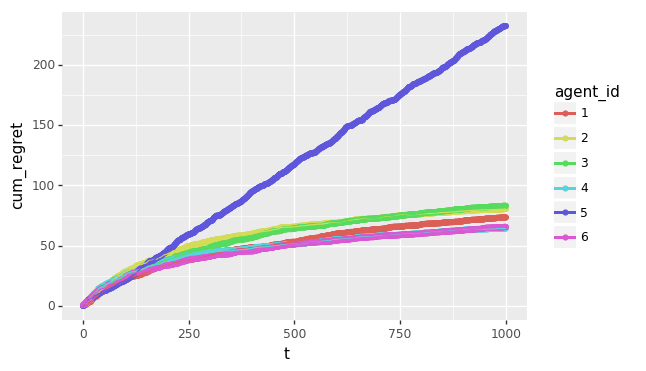

<ggplot: (8735813238325)>


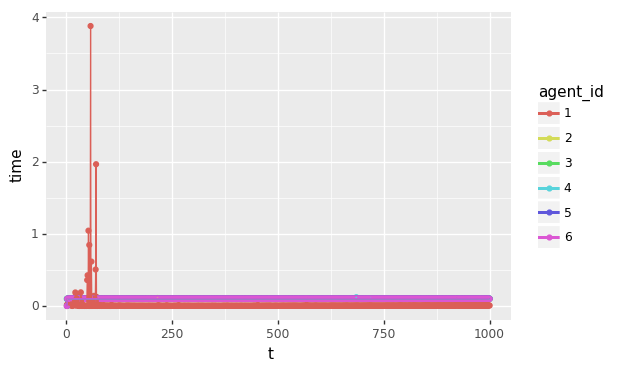

<ggplot: (8735771839753)>


([[      action_id agent_id  cum_optimal  cum_regret  instant_regret     t  \
   0             1        1     0.626647    0.223332        0.223332     1   
   1             2        2     0.626647    0.492766        0.492766     1   
   2             3        3     0.626647    0.368660        0.368660     1   
   3             4        4     0.626647    0.368660        0.368660     1   
   4             5        5     0.626647    0.567259        0.567259     1   
   5             6        6     0.626647    0.603400        0.603400     1   
   6             7        1     1.123490    0.458996        0.235664     2   
   7             8        2     1.123490    0.880184        0.387418     2   
   8             9        3     1.123490    0.653653        0.284994     2   
   9            10        4     1.123490    0.653653        0.284994     2   
   10           11        5     1.123490    0.802923        0.235664     2   
   11           12        6     1.123490    0.938601        0.33

In [7]:
#https://stackoverflow.com/questions/9031783/hide-all-warnings-in-ipython
make_agents = [make_laplace_agent,
               make_pgts_agent,
               make_best_langevin_agent,
               make_mala_agent,
               make_best_sgld_agent,
               make_best_sagald_agent]
                #,make_mala_agent_untimed]
simple_compares(make_agents, num_articles, dim, var, 1000, range(100,105), verbosity=verbosity)

In [ ]:
"""
[[66.17942485421429,
   77.37649996783429,
   72.12768757133686,
   65.28654503324341,
   240.37960185416802,
   86.71033658251491],
  [19.811286965165056,
   27.6926955531069,
   20.117476284159846,
   20.606406390769017,
   77.0240607552966,
   31.946565636089776],
  [34.94866052399984,
   38.70033676509862,
   30.06696404970552,
   30.432789972171737,
   120.63968525763948,
   44.63282171295269],
  [49.07733758262236,
   89.79706817729368,
   82.35357167190871,
   60.10003214510683,
   276.14765913695805,
   68.40677593275048],
  [73.39972031228284,
   80.47012076378971,
   83.00321035304404,
   64.33343860179805,
   232.04474044017337,
   65.55075350450238]],
 array([ 48.68328605,  62.80734425,  57.53378199,  48.15184243,
        189.24714949,  59.44945067]))
"""